In [23]:
## Abhishek Singh
## Capstone Project for Machine Learning Assignment

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from pandas.plotting import scatter_matrix
import seaborn as sns
import socket 
import geoip2.database
from datetime import datetime
from datetime import date

In [24]:
fraud_data = pd.read_csv('/Users/sinabhi2/capstone/Purchase_Fraud_Data.csv')

## Geo Lite Database to Convert IP Address to City, ASN and Country .

ASN_database_path = '/Users/sinabhi2/capstone/GeoLite2-ASN_20230321/GeoLite2-ASN.mmdb'
City_database_path = '/Users/sinabhi2/capstone/GeoLite2-City_20230321/GeoLite2-City.mmdb'
Country_database_path = '/Users/sinabhi2/capstone/GeoLite2-Country_20230321/GeoLite2-Country.mmdb'

In [25]:
fraud_data.head()

,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,ip_address,class,category,dob
0,22058,2015-02-24 22:55:49,2015-04-18 02:47:11,65278,QVPSPJUOCKZAR,SEO,Chrome,M,7.327584e+08,0,home_essentials,22-2-1976
1,333320,2015-06-07 20:39:50,2015-06-08 01:38:54,96399,EOGFQPIZPYXFZ,Ads,Chrome,F,3.503114e+08,0,apparels,2-1-1962
2,1359,2015-01-01 18:52:44,2015-01-01 18:52:45,57296,YSSKYOSJHPPLJ,SEO,Opera,M,2.621474e+09,1,electronics,5-3-1962
3,150084,2015-04-28 21:13:25,2015-05-04 13:54:50,43650,ATGTXKYKUDUQN,SEO,Safari,M,3.840542e+09,0,health_care,3-7-1974
4,221365,2015-07-21 07:09:52,2015-09-09 18:40:53,45016,NAUITBZFJKHWW,Ads,Safari,M,4.155831e+08,0,home_essentials,25-8-1970


In [26]:
fraud_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 151112 entries, 0 to 151111
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   user_id         151112 non-null  int64  
 1   signup_time     151112 non-null  object 
 2   purchase_time   151112 non-null  object 
 3   purchase_value  151112 non-null  int64  
 4   device_id       151112 non-null  object 
 5   source          151112 non-null  object 
 6   browser         151112 non-null  object 
 7   sex             146185 non-null  object 
 8   ip_address      151112 non-null  float64
 9   class           151112 non-null  int64  
 10  category        151112 non-null  object 
 11  dob             146188 non-null  object 
dtypes: float64(1), int64(3), object(8)
memory usage: 13.8+ MB


In [27]:
fraud_data.isnull().sum()

user_id              0
signup_time          0
purchase_time        0
purchase_value       0
device_id            0
source               0
browser              0
sex               4927
ip_address           0
class                0
category             0
dob               4924
dtype: int64

In [28]:
# Compute Signup Month, Day and Year, time
for index, value in fraud_data['signup_time'].iteritems():
    print(f'Index: {index}, Value:{value}')
    input_dt = datetime.strptime(value, "%Y-%m-%d %H:%M:%S")
    year = input_dt.year
    month = input_dt.month
    day = input_dt.day
    day_of_week = input_dt.strftime("%A")
    time = input_dt.strftime("%H")
    print(year, month, day, day_of_week, time)
    fraud_data.loc[index,'signup_year'] = year
    fraud_data.loc[index,'signup_month'] = month
    fraud_data.loc[index,'signup_day_of_week'] = day_of_week
    fraud_data.loc[index,'sign_up_time'] = time

Index: 0, Value:2015-02-24 22:55:49
2015 2 24 Tuesday 22
Index: 1, Value:2015-06-07 20:39:50
2015 6 7 Sunday 20
Index: 2, Value:2015-01-01 18:52:44
2015 1 1 Thursday 18
Index: 3, Value:2015-04-28 21:13:25
2015 4 28 Tuesday 21
Index: 4, Value:2015-07-21 07:09:52
2015 7 21 Tuesday 07
Index: 5, Value:2015-05-21 06:03:03
2015 5 21 Thursday 06
Index: 6, Value:2015-08-01 22:40:52
2015 8 1 Saturday 22
Index: 7, Value:2015-04-06 07:35:45
2015 4 6 Monday 07
Index: 8, Value:2015-04-21 23:38:34
2015 4 21 Tuesday 23
Index: 9, Value:2015-01-25 17:49:49
2015 1 25 Sunday 17
Index: 10, Value:2015-07-11 18:26:54
2015 7 11 Saturday 18
Index: 11, Value:2015-05-29 16:22:02
2015 5 29 Friday 16
Index: 12, Value:2015-06-16 21:19:35
2015 6 16 Tuesday 21
Index: 13, Value:2015-03-03 19:17:07
2015 3 3 Tuesday 19
Index: 14, Value:2015-02-16 02:50:30
2015 2 16 Monday 02
Index: 15, Value:2015-02-01 01:06:17
2015 2 1 Sunday 01
Index: 16, Value:2015-05-15 03:52:08
2015 5 15 Friday 03
Index: 17, Value:2015-03-20 00:31

Index: 283, Value:2015-02-04 14:49:47
2015 2 4 Wednesday 14
Index: 284, Value:2015-04-22 00:21:31
2015 4 22 Wednesday 00
Index: 285, Value:2015-01-08 22:03:55
2015 1 8 Thursday 22
Index: 286, Value:2015-04-03 15:05:40
2015 4 3 Friday 15
Index: 287, Value:2015-06-12 16:38:47
2015 6 12 Friday 16
Index: 288, Value:2015-01-12 03:32:44
2015 1 12 Monday 03
Index: 289, Value:2015-08-04 07:58:01
2015 8 4 Tuesday 07
Index: 290, Value:2015-07-13 21:58:51
2015 7 13 Monday 21
Index: 291, Value:2015-01-07 11:51:25
2015 1 7 Wednesday 11
Index: 292, Value:2015-08-15 12:18:51
2015 8 15 Saturday 12
Index: 293, Value:2015-04-14 11:25:16
2015 4 14 Tuesday 11
Index: 294, Value:2015-05-28 04:45:58
2015 5 28 Thursday 04
Index: 295, Value:2015-02-10 07:24:04
2015 2 10 Tuesday 07
Index: 296, Value:2015-05-29 15:17:23
2015 5 29 Friday 15
Index: 297, Value:2015-06-06 14:22:26
2015 6 6 Saturday 14
Index: 298, Value:2015-01-06 23:43:04
2015 1 6 Tuesday 23
Index: 299, Value:2015-03-05 14:16:32
2015 3 5 Thursday 14

2015 2 12 Thursday 17
Index: 603, Value:2015-03-16 06:05:28
2015 3 16 Monday 06
Index: 604, Value:2015-02-21 06:14:47
2015 2 21 Saturday 06
Index: 605, Value:2015-02-15 16:33:01
2015 2 15 Sunday 16
Index: 606, Value:2015-05-13 08:10:26
2015 5 13 Wednesday 08
Index: 607, Value:2015-01-11 16:59:43
2015 1 11 Sunday 16
Index: 608, Value:2015-08-18 02:36:46
2015 8 18 Tuesday 02
Index: 609, Value:2015-01-07 16:57:58
2015 1 7 Wednesday 16
Index: 610, Value:2015-07-01 08:14:17
2015 7 1 Wednesday 08
Index: 611, Value:2015-06-28 00:06:32
2015 6 28 Sunday 00
Index: 612, Value:2015-06-06 21:13:03
2015 6 6 Saturday 21
Index: 613, Value:2015-07-30 12:21:45
2015 7 30 Thursday 12
Index: 614, Value:2015-06-19 01:24:01
2015 6 19 Friday 01
Index: 615, Value:2015-04-26 21:57:05
2015 4 26 Sunday 21
Index: 616, Value:2015-07-19 06:59:24
2015 7 19 Sunday 06
Index: 617, Value:2015-06-22 22:31:06
2015 6 22 Monday 22
Index: 618, Value:2015-07-27 07:41:05
2015 7 27 Monday 07
Index: 619, Value:2015-07-02 03:35:34

Index: 854, Value:2015-05-18 04:13:42
2015 5 18 Monday 04
Index: 855, Value:2015-03-28 09:37:55
2015 3 28 Saturday 09
Index: 856, Value:2015-07-26 09:30:26
2015 7 26 Sunday 09
Index: 857, Value:2015-07-15 01:11:10
2015 7 15 Wednesday 01
Index: 858, Value:2015-04-12 02:25:19
2015 4 12 Sunday 02
Index: 859, Value:2015-05-10 22:13:55
2015 5 10 Sunday 22
Index: 860, Value:2015-05-13 09:54:20
2015 5 13 Wednesday 09
Index: 861, Value:2015-08-07 11:25:32
2015 8 7 Friday 11
Index: 862, Value:2015-03-16 03:19:55
2015 3 16 Monday 03
Index: 863, Value:2015-07-03 23:15:23
2015 7 3 Friday 23
Index: 864, Value:2015-05-23 23:34:10
2015 5 23 Saturday 23
Index: 865, Value:2015-07-03 06:03:57
2015 7 3 Friday 06
Index: 866, Value:2015-01-17 16:02:49
2015 1 17 Saturday 16
Index: 867, Value:2015-05-18 22:33:07
2015 5 18 Monday 22
Index: 868, Value:2015-04-24 14:46:54
2015 4 24 Friday 14
Index: 869, Value:2015-07-10 03:53:10
2015 7 10 Friday 03
Index: 870, Value:2015-05-08 23:58:50
2015 5 8 Friday 23
Index:

Index: 1147, Value:2015-04-11 07:08:46
2015 4 11 Saturday 07
Index: 1148, Value:2015-07-17 17:17:58
2015 7 17 Friday 17
Index: 1149, Value:2015-03-04 20:00:45
2015 3 4 Wednesday 20
Index: 1150, Value:2015-05-11 13:47:34
2015 5 11 Monday 13
Index: 1151, Value:2015-02-17 21:59:43
2015 2 17 Tuesday 21
Index: 1152, Value:2015-06-23 17:07:35
2015 6 23 Tuesday 17
Index: 1153, Value:2015-07-25 02:43:19
2015 7 25 Saturday 02
Index: 1154, Value:2015-02-19 03:59:07
2015 2 19 Thursday 03
Index: 1155, Value:2015-07-16 14:25:17
2015 7 16 Thursday 14
Index: 1156, Value:2015-01-04 11:08:15
2015 1 4 Sunday 11
Index: 1157, Value:2015-07-31 13:29:36
2015 7 31 Friday 13
Index: 1158, Value:2015-06-03 23:47:19
2015 6 3 Wednesday 23
Index: 1159, Value:2015-01-13 02:09:08
2015 1 13 Tuesday 02
Index: 1160, Value:2015-03-03 10:52:32
2015 3 3 Tuesday 10
Index: 1161, Value:2015-02-08 20:49:18
2015 2 8 Sunday 20
Index: 1162, Value:2015-06-17 09:53:34
2015 6 17 Wednesday 09
Index: 1163, Value:2015-07-17 07:23:38
2

Index: 1469, Value:2015-03-26 09:29:16
2015 3 26 Thursday 09
Index: 1470, Value:2015-06-12 13:55:55
2015 6 12 Friday 13
Index: 1471, Value:2015-01-08 14:56:54
2015 1 8 Thursday 14
Index: 1472, Value:2015-06-30 09:17:56
2015 6 30 Tuesday 09
Index: 1473, Value:2015-01-09 03:48:49
2015 1 9 Friday 03
Index: 1474, Value:2015-03-14 18:44:24
2015 3 14 Saturday 18
Index: 1475, Value:2015-07-09 20:16:30
2015 7 9 Thursday 20
Index: 1476, Value:2015-08-12 05:31:21
2015 8 12 Wednesday 05
Index: 1477, Value:2015-02-02 06:50:19
2015 2 2 Monday 06
Index: 1478, Value:2015-03-15 10:06:22
2015 3 15 Sunday 10
Index: 1479, Value:2015-07-13 21:26:34
2015 7 13 Monday 21
Index: 1480, Value:2015-01-26 17:32:49
2015 1 26 Monday 17
Index: 1481, Value:2015-08-16 22:31:21
2015 8 16 Sunday 22
Index: 1482, Value:2015-01-02 11:27:33
2015 1 2 Friday 11
Index: 1483, Value:2015-05-05 10:17:46
2015 5 5 Tuesday 10
Index: 1484, Value:2015-01-03 00:56:25
2015 1 3 Saturday 00
Index: 1485, Value:2015-04-13 08:05:55
2015 4 13

Index: 1755, Value:2015-05-14 00:00:05
2015 5 14 Thursday 00
Index: 1756, Value:2015-03-10 06:46:38
2015 3 10 Tuesday 06
Index: 1757, Value:2015-07-26 15:18:51
2015 7 26 Sunday 15
Index: 1758, Value:2015-02-15 11:33:08
2015 2 15 Sunday 11
Index: 1759, Value:2015-08-07 05:33:52
2015 8 7 Friday 05
Index: 1760, Value:2015-04-20 10:01:53
2015 4 20 Monday 10
Index: 1761, Value:2015-06-26 04:04:05
2015 6 26 Friday 04
Index: 1762, Value:2015-06-05 13:04:37
2015 6 5 Friday 13
Index: 1763, Value:2015-03-31 13:11:15
2015 3 31 Tuesday 13
Index: 1764, Value:2015-05-07 01:17:04
2015 5 7 Thursday 01
Index: 1765, Value:2015-08-07 06:20:03
2015 8 7 Friday 06
Index: 1766, Value:2015-01-09 23:26:15
2015 1 9 Friday 23
Index: 1767, Value:2015-05-26 18:35:40
2015 5 26 Tuesday 18
Index: 1768, Value:2015-05-07 19:27:24
2015 5 7 Thursday 19
Index: 1769, Value:2015-05-19 22:32:47
2015 5 19 Tuesday 22
Index: 1770, Value:2015-01-19 00:51:02
2015 1 19 Monday 00
Index: 1771, Value:2015-05-23 22:55:44
2015 5 23 Sat

Index: 2024, Value:2015-07-18 05:47:56
2015 7 18 Saturday 05
Index: 2025, Value:2015-08-09 18:47:56
2015 8 9 Sunday 18
Index: 2026, Value:2015-06-19 06:35:10
2015 6 19 Friday 06
Index: 2027, Value:2015-03-11 21:13:35
2015 3 11 Wednesday 21
Index: 2028, Value:2015-08-13 06:17:23
2015 8 13 Thursday 06
Index: 2029, Value:2015-07-15 10:06:04
2015 7 15 Wednesday 10
Index: 2030, Value:2015-04-29 06:41:37
2015 4 29 Wednesday 06
Index: 2031, Value:2015-01-30 08:10:52
2015 1 30 Friday 08
Index: 2032, Value:2015-04-10 16:30:55
2015 4 10 Friday 16
Index: 2033, Value:2015-01-04 18:56:25
2015 1 4 Sunday 18
Index: 2034, Value:2015-03-08 04:52:55
2015 3 8 Sunday 04
Index: 2035, Value:2015-02-01 22:23:31
2015 2 1 Sunday 22
Index: 2036, Value:2015-07-04 19:01:10
2015 7 4 Saturday 19
Index: 2037, Value:2015-04-16 14:21:12
2015 4 16 Thursday 14
Index: 2038, Value:2015-03-09 22:58:21
2015 3 9 Monday 22
Index: 2039, Value:2015-07-19 20:46:35
2015 7 19 Sunday 20
Index: 2040, Value:2015-02-20 10:27:11
2015 2

Index: 2326, Value:2015-02-26 12:49:27
2015 2 26 Thursday 12
Index: 2327, Value:2015-04-13 16:50:48
2015 4 13 Monday 16
Index: 2328, Value:2015-06-12 06:34:57
2015 6 12 Friday 06
Index: 2329, Value:2015-02-11 06:57:21
2015 2 11 Wednesday 06
Index: 2330, Value:2015-07-20 04:32:29
2015 7 20 Monday 04
Index: 2331, Value:2015-08-07 08:13:16
2015 8 7 Friday 08
Index: 2332, Value:2015-06-15 01:19:04
2015 6 15 Monday 01
Index: 2333, Value:2015-01-21 22:10:38
2015 1 21 Wednesday 22
Index: 2334, Value:2015-06-05 18:20:06
2015 6 5 Friday 18
Index: 2335, Value:2015-02-15 03:00:31
2015 2 15 Sunday 03
Index: 2336, Value:2015-02-19 00:10:07
2015 2 19 Thursday 00
Index: 2337, Value:2015-01-27 00:48:41
2015 1 27 Tuesday 00
Index: 2338, Value:2015-07-18 14:23:12
2015 7 18 Saturday 14
Index: 2339, Value:2015-02-02 03:22:38
2015 2 2 Monday 03
Index: 2340, Value:2015-01-08 20:46:53
2015 1 8 Thursday 20
Index: 2341, Value:2015-06-28 20:27:53
2015 6 28 Sunday 20
Index: 2342, Value:2015-06-19 00:26:29
2015 6

Index: 2662, Value:2015-04-06 01:16:52
2015 4 6 Monday 01
Index: 2663, Value:2015-01-17 10:37:45
2015 1 17 Saturday 10
Index: 2664, Value:2015-08-12 22:05:54
2015 8 12 Wednesday 22
Index: 2665, Value:2015-07-11 03:49:21
2015 7 11 Saturday 03
Index: 2666, Value:2015-06-28 08:00:37
2015 6 28 Sunday 08
Index: 2667, Value:2015-03-04 04:18:05
2015 3 4 Wednesday 04
Index: 2668, Value:2015-07-02 05:55:23
2015 7 2 Thursday 05
Index: 2669, Value:2015-05-09 06:16:15
2015 5 9 Saturday 06
Index: 2670, Value:2015-01-23 21:32:49
2015 1 23 Friday 21
Index: 2671, Value:2015-03-29 06:13:33
2015 3 29 Sunday 06
Index: 2672, Value:2015-07-07 03:26:24
2015 7 7 Tuesday 03
Index: 2673, Value:2015-06-05 07:11:10
2015 6 5 Friday 07
Index: 2674, Value:2015-07-16 16:44:34
2015 7 16 Thursday 16
Index: 2675, Value:2015-06-25 20:24:11
2015 6 25 Thursday 20
Index: 2676, Value:2015-04-20 03:35:38
2015 4 20 Monday 03
Index: 2677, Value:2015-05-14 19:01:47
2015 5 14 Thursday 19
Index: 2678, Value:2015-03-23 01:21:58
20

Index: 2973, Value:2015-08-04 10:41:55
2015 8 4 Tuesday 10
Index: 2974, Value:2015-05-25 19:45:50
2015 5 25 Monday 19
Index: 2975, Value:2015-05-04 15:23:37
2015 5 4 Monday 15
Index: 2976, Value:2015-01-15 15:04:00
2015 1 15 Thursday 15
Index: 2977, Value:2015-08-03 18:49:59
2015 8 3 Monday 18
Index: 2978, Value:2015-03-06 03:46:11
2015 3 6 Friday 03
Index: 2979, Value:2015-02-25 07:08:42
2015 2 25 Wednesday 07
Index: 2980, Value:2015-05-10 07:32:39
2015 5 10 Sunday 07
Index: 2981, Value:2015-01-12 10:49:56
2015 1 12 Monday 10
Index: 2982, Value:2015-07-10 12:56:34
2015 7 10 Friday 12
Index: 2983, Value:2015-05-27 17:54:32
2015 5 27 Wednesday 17
Index: 2984, Value:2015-08-05 06:08:01
2015 8 5 Wednesday 06
Index: 2985, Value:2015-07-14 09:53:53
2015 7 14 Tuesday 09
Index: 2986, Value:2015-05-21 08:55:01
2015 5 21 Thursday 08
Index: 2987, Value:2015-04-23 00:55:30
2015 4 23 Thursday 00
Index: 2988, Value:2015-08-09 04:38:40
2015 8 9 Sunday 04
Index: 2989, Value:2015-04-22 03:30:31
2015 4

Index: 3260, Value:2015-01-11 18:09:04
2015 1 11 Sunday 18
Index: 3261, Value:2015-04-27 19:17:06
2015 4 27 Monday 19
Index: 3262, Value:2015-04-27 21:02:52
2015 4 27 Monday 21
Index: 3263, Value:2015-01-03 06:41:21
2015 1 3 Saturday 06
Index: 3264, Value:2015-08-03 02:31:17
2015 8 3 Monday 02
Index: 3265, Value:2015-01-03 16:16:31
2015 1 3 Saturday 16
Index: 3266, Value:2015-01-10 13:27:01
2015 1 10 Saturday 13
Index: 3267, Value:2015-04-23 19:26:18
2015 4 23 Thursday 19
Index: 3268, Value:2015-03-27 17:36:55
2015 3 27 Friday 17
Index: 3269, Value:2015-02-27 13:57:22
2015 2 27 Friday 13
Index: 3270, Value:2015-04-12 08:35:42
2015 4 12 Sunday 08
Index: 3271, Value:2015-05-27 05:39:01
2015 5 27 Wednesday 05
Index: 3272, Value:2015-01-16 21:35:48
2015 1 16 Friday 21
Index: 3273, Value:2015-06-07 15:00:35
2015 6 7 Sunday 15
Index: 3274, Value:2015-01-20 08:27:23
2015 1 20 Tuesday 08
Index: 3275, Value:2015-05-16 08:45:02
2015 5 16 Saturday 08
Index: 3276, Value:2015-08-06 02:33:56
2015 8 

Index: 3558, Value:2015-04-05 21:31:06
2015 4 5 Sunday 21
Index: 3559, Value:2015-06-15 00:46:35
2015 6 15 Monday 00
Index: 3560, Value:2015-08-08 08:22:03
2015 8 8 Saturday 08
Index: 3561, Value:2015-01-07 09:53:46
2015 1 7 Wednesday 09
Index: 3562, Value:2015-01-04 05:45:20
2015 1 4 Sunday 05
Index: 3563, Value:2015-01-31 14:54:01
2015 1 31 Saturday 14
Index: 3564, Value:2015-01-31 16:39:35
2015 1 31 Saturday 16
Index: 3565, Value:2015-03-07 10:53:37
2015 3 7 Saturday 10
Index: 3566, Value:2015-06-13 06:27:23
2015 6 13 Saturday 06
Index: 3567, Value:2015-07-19 13:30:23
2015 7 19 Sunday 13
Index: 3568, Value:2015-05-06 01:58:48
2015 5 6 Wednesday 01
Index: 3569, Value:2015-08-03 02:00:30
2015 8 3 Monday 02
Index: 3570, Value:2015-08-06 12:30:49
2015 8 6 Thursday 12
Index: 3571, Value:2015-06-24 13:21:55
2015 6 24 Wednesday 13
Index: 3572, Value:2015-01-03 11:54:35
2015 1 3 Saturday 11
Index: 3573, Value:2015-02-11 10:48:25
2015 2 11 Wednesday 10
Index: 3574, Value:2015-06-22 10:30:09


2015 6 26 Friday 11
Index: 3858, Value:2015-05-15 15:28:19
2015 5 15 Friday 15
Index: 3859, Value:2015-01-09 02:38:28
2015 1 9 Friday 02
Index: 3860, Value:2015-05-29 04:14:18
2015 5 29 Friday 04
Index: 3861, Value:2015-01-24 11:20:21
2015 1 24 Saturday 11
Index: 3862, Value:2015-07-12 00:25:41
2015 7 12 Sunday 00
Index: 3863, Value:2015-01-04 01:42:41
2015 1 4 Sunday 01
Index: 3864, Value:2015-08-10 03:06:57
2015 8 10 Monday 03
Index: 3865, Value:2015-03-24 15:31:09
2015 3 24 Tuesday 15
Index: 3866, Value:2015-01-06 22:40:41
2015 1 6 Tuesday 22
Index: 3867, Value:2015-07-14 03:03:33
2015 7 14 Tuesday 03
Index: 3868, Value:2015-01-23 22:42:53
2015 1 23 Friday 22
Index: 3869, Value:2015-07-08 23:22:18
2015 7 8 Wednesday 23
Index: 3870, Value:2015-04-06 15:02:57
2015 4 6 Monday 15
Index: 3871, Value:2015-05-09 16:12:11
2015 5 9 Saturday 16
Index: 3872, Value:2015-07-13 20:35:29
2015 7 13 Monday 20
Index: 3873, Value:2015-04-22 13:20:30
2015 4 22 Wednesday 13
Index: 3874, Value:2015-03-25

Index: 4188, Value:2015-06-14 13:19:37
2015 6 14 Sunday 13
Index: 4189, Value:2015-03-10 23:21:20
2015 3 10 Tuesday 23
Index: 4190, Value:2015-04-05 23:34:44
2015 4 5 Sunday 23
Index: 4191, Value:2015-07-11 21:16:26
2015 7 11 Saturday 21
Index: 4192, Value:2015-06-26 16:02:06
2015 6 26 Friday 16
Index: 4193, Value:2015-01-12 22:29:57
2015 1 12 Monday 22
Index: 4194, Value:2015-07-29 15:15:55
2015 7 29 Wednesday 15
Index: 4195, Value:2015-08-16 16:24:43
2015 8 16 Sunday 16
Index: 4196, Value:2015-07-21 20:18:29
2015 7 21 Tuesday 20
Index: 4197, Value:2015-01-16 16:44:47
2015 1 16 Friday 16
Index: 4198, Value:2015-08-09 06:04:05
2015 8 9 Sunday 06
Index: 4199, Value:2015-03-26 17:43:50
2015 3 26 Thursday 17
Index: 4200, Value:2015-01-12 22:56:04
2015 1 12 Monday 22
Index: 4201, Value:2015-02-11 22:28:20
2015 2 11 Wednesday 22
Index: 4202, Value:2015-05-26 06:11:35
2015 5 26 Tuesday 06
Index: 4203, Value:2015-05-30 01:23:06
2015 5 30 Saturday 01
Index: 4204, Value:2015-08-06 08:32:06
2015

Index: 4513, Value:2015-05-31 09:29:25
2015 5 31 Sunday 09
Index: 4514, Value:2015-08-01 07:10:27
2015 8 1 Saturday 07
Index: 4515, Value:2015-01-18 21:57:17
2015 1 18 Sunday 21
Index: 4516, Value:2015-03-27 16:23:42
2015 3 27 Friday 16
Index: 4517, Value:2015-07-11 21:09:25
2015 7 11 Saturday 21
Index: 4518, Value:2015-05-02 21:49:54
2015 5 2 Saturday 21
Index: 4519, Value:2015-06-08 04:19:58
2015 6 8 Monday 04
Index: 4520, Value:2015-07-12 19:34:07
2015 7 12 Sunday 19
Index: 4521, Value:2015-02-27 11:00:12
2015 2 27 Friday 11
Index: 4522, Value:2015-01-13 04:44:49
2015 1 13 Tuesday 04
Index: 4523, Value:2015-07-18 02:23:06
2015 7 18 Saturday 02
Index: 4524, Value:2015-02-07 14:52:58
2015 2 7 Saturday 14
Index: 4525, Value:2015-07-15 01:32:45
2015 7 15 Wednesday 01
Index: 4526, Value:2015-07-05 22:12:26
2015 7 5 Sunday 22
Index: 4527, Value:2015-01-28 18:56:49
2015 1 28 Wednesday 18
Index: 4528, Value:2015-05-08 13:37:23
2015 5 8 Friday 13
Index: 4529, Value:2015-06-18 10:11:58
2015 6

Index: 4834, Value:2015-07-27 14:03:34
2015 7 27 Monday 14
Index: 4835, Value:2015-07-09 07:38:11
2015 7 9 Thursday 07
Index: 4836, Value:2015-08-11 18:29:23
2015 8 11 Tuesday 18
Index: 4837, Value:2015-02-06 05:25:52
2015 2 6 Friday 05
Index: 4838, Value:2015-01-07 07:44:20
2015 1 7 Wednesday 07
Index: 4839, Value:2015-03-15 04:20:44
2015 3 15 Sunday 04
Index: 4840, Value:2015-05-15 15:54:32
2015 5 15 Friday 15
Index: 4841, Value:2015-01-23 11:57:54
2015 1 23 Friday 11
Index: 4842, Value:2015-03-11 04:00:21
2015 3 11 Wednesday 04
Index: 4843, Value:2015-06-27 23:45:43
2015 6 27 Saturday 23
Index: 4844, Value:2015-01-18 05:32:32
2015 1 18 Sunday 05
Index: 4845, Value:2015-05-29 02:05:12
2015 5 29 Friday 02
Index: 4846, Value:2015-05-25 20:55:44
2015 5 25 Monday 20
Index: 4847, Value:2015-06-15 06:39:27
2015 6 15 Monday 06
Index: 4848, Value:2015-01-11 21:27:31
2015 1 11 Sunday 21
Index: 4849, Value:2015-07-15 02:29:29
2015 7 15 Wednesday 02
Index: 4850, Value:2015-02-16 05:00:10
2015 2

Index: 5156, Value:2015-04-29 10:54:59
2015 4 29 Wednesday 10
Index: 5157, Value:2015-06-09 06:49:17
2015 6 9 Tuesday 06
Index: 5158, Value:2015-04-09 03:55:20
2015 4 9 Thursday 03
Index: 5159, Value:2015-05-01 07:19:36
2015 5 1 Friday 07
Index: 5160, Value:2015-01-29 02:55:35
2015 1 29 Thursday 02
Index: 5161, Value:2015-05-03 16:51:31
2015 5 3 Sunday 16
Index: 5162, Value:2015-03-17 02:36:51
2015 3 17 Tuesday 02
Index: 5163, Value:2015-02-10 17:44:12
2015 2 10 Tuesday 17
Index: 5164, Value:2015-07-07 08:05:00
2015 7 7 Tuesday 08
Index: 5165, Value:2015-04-08 10:18:37
2015 4 8 Wednesday 10
Index: 5166, Value:2015-01-16 11:43:40
2015 1 16 Friday 11
Index: 5167, Value:2015-08-11 06:50:47
2015 8 11 Tuesday 06
Index: 5168, Value:2015-05-02 14:09:42
2015 5 2 Saturday 14
Index: 5169, Value:2015-01-04 13:52:40
2015 1 4 Sunday 13
Index: 5170, Value:2015-07-26 14:57:18
2015 7 26 Sunday 14
Index: 5171, Value:2015-05-15 08:29:38
2015 5 15 Friday 08
Index: 5172, Value:2015-04-19 15:06:43
2015 4 1

Index: 5479, Value:2015-03-08 00:13:29
2015 3 8 Sunday 00
Index: 5480, Value:2015-01-04 09:07:55
2015 1 4 Sunday 09
Index: 5481, Value:2015-03-28 06:45:01
2015 3 28 Saturday 06
Index: 5482, Value:2015-02-28 11:28:43
2015 2 28 Saturday 11
Index: 5483, Value:2015-07-06 12:30:03
2015 7 6 Monday 12
Index: 5484, Value:2015-03-17 01:21:33
2015 3 17 Tuesday 01
Index: 5485, Value:2015-01-27 19:37:32
2015 1 27 Tuesday 19
Index: 5486, Value:2015-07-21 17:30:50
2015 7 21 Tuesday 17
Index: 5487, Value:2015-04-18 08:15:24
2015 4 18 Saturday 08
Index: 5488, Value:2015-04-09 06:33:06
2015 4 9 Thursday 06
Index: 5489, Value:2015-02-09 23:10:16
2015 2 9 Monday 23
Index: 5490, Value:2015-01-07 20:26:26
2015 1 7 Wednesday 20
Index: 5491, Value:2015-08-06 04:53:45
2015 8 6 Thursday 04
Index: 5492, Value:2015-03-07 09:34:19
2015 3 7 Saturday 09
Index: 5493, Value:2015-02-09 23:34:08
2015 2 9 Monday 23
Index: 5494, Value:2015-08-16 02:26:18
2015 8 16 Sunday 02
Index: 5495, Value:2015-07-13 08:02:16
2015 7 1

2015 2 26 Thursday 16
Index: 5790, Value:2015-06-27 12:59:57
2015 6 27 Saturday 12
Index: 5791, Value:2015-06-07 04:30:59
2015 6 7 Sunday 04
Index: 5792, Value:2015-04-17 00:52:17
2015 4 17 Friday 00
Index: 5793, Value:2015-04-20 00:20:24
2015 4 20 Monday 00
Index: 5794, Value:2015-06-12 06:27:36
2015 6 12 Friday 06
Index: 5795, Value:2015-02-09 07:58:03
2015 2 9 Monday 07
Index: 5796, Value:2015-03-31 03:56:39
2015 3 31 Tuesday 03
Index: 5797, Value:2015-07-14 16:17:09
2015 7 14 Tuesday 16
Index: 5798, Value:2015-03-02 22:53:48
2015 3 2 Monday 22
Index: 5799, Value:2015-05-31 05:03:56
2015 5 31 Sunday 05
Index: 5800, Value:2015-05-27 18:29:47
2015 5 27 Wednesday 18
Index: 5801, Value:2015-03-21 03:15:36
2015 3 21 Saturday 03
Index: 5802, Value:2015-07-21 10:40:07
2015 7 21 Tuesday 10
Index: 5803, Value:2015-08-10 04:19:22
2015 8 10 Monday 04
Index: 5804, Value:2015-06-06 22:12:22
2015 6 6 Saturday 22
Index: 5805, Value:2015-01-06 12:52:57
2015 1 6 Tuesday 12
Index: 5806, Value:2015-07

Index: 6098, Value:2015-01-10 23:59:01
2015 1 10 Saturday 23
Index: 6099, Value:2015-05-12 08:58:53
2015 5 12 Tuesday 08
Index: 6100, Value:2015-01-03 16:32:47
2015 1 3 Saturday 16
Index: 6101, Value:2015-02-25 06:39:50
2015 2 25 Wednesday 06
Index: 6102, Value:2015-05-02 21:54:41
2015 5 2 Saturday 21
Index: 6103, Value:2015-01-03 10:22:48
2015 1 3 Saturday 10
Index: 6104, Value:2015-07-22 06:05:59
2015 7 22 Wednesday 06
Index: 6105, Value:2015-06-11 13:40:50
2015 6 11 Thursday 13
Index: 6106, Value:2015-01-04 08:35:37
2015 1 4 Sunday 08
Index: 6107, Value:2015-02-10 19:38:25
2015 2 10 Tuesday 19
Index: 6108, Value:2015-05-02 17:59:44
2015 5 2 Saturday 17
Index: 6109, Value:2015-06-13 23:18:28
2015 6 13 Saturday 23
Index: 6110, Value:2015-01-25 04:37:44
2015 1 25 Sunday 04
Index: 6111, Value:2015-05-23 00:04:49
2015 5 23 Saturday 00
Index: 6112, Value:2015-04-21 16:26:02
2015 4 21 Tuesday 16
Index: 6113, Value:2015-07-08 03:14:13
2015 7 8 Wednesday 03
Index: 6114, Value:2015-01-12 16:5

Index: 6431, Value:2015-02-25 04:51:50
2015 2 25 Wednesday 04
Index: 6432, Value:2015-05-11 04:55:21
2015 5 11 Monday 04
Index: 6433, Value:2015-05-22 01:43:28
2015 5 22 Friday 01
Index: 6434, Value:2015-08-15 23:38:36
2015 8 15 Saturday 23
Index: 6435, Value:2015-04-14 17:38:00
2015 4 14 Tuesday 17
Index: 6436, Value:2015-05-18 02:19:43
2015 5 18 Monday 02
Index: 6437, Value:2015-03-17 03:14:36
2015 3 17 Tuesday 03
Index: 6438, Value:2015-07-29 15:37:59
2015 7 29 Wednesday 15
Index: 6439, Value:2015-08-11 12:48:47
2015 8 11 Tuesday 12
Index: 6440, Value:2015-05-31 11:50:40
2015 5 31 Sunday 11
Index: 6441, Value:2015-05-30 02:44:28
2015 5 30 Saturday 02
Index: 6442, Value:2015-01-24 00:54:52
2015 1 24 Saturday 00
Index: 6443, Value:2015-06-20 15:33:38
2015 6 20 Saturday 15
Index: 6444, Value:2015-08-12 18:24:08
2015 8 12 Wednesday 18
Index: 6445, Value:2015-01-04 00:42:59
2015 1 4 Sunday 00
Index: 6446, Value:2015-03-01 02:29:19
2015 3 1 Sunday 02
Index: 6447, Value:2015-07-12 00:45:33

Index: 6753, Value:2015-06-28 08:46:01
2015 6 28 Sunday 08
Index: 6754, Value:2015-04-26 19:25:26
2015 4 26 Sunday 19
Index: 6755, Value:2015-01-12 06:56:17
2015 1 12 Monday 06
Index: 6756, Value:2015-05-29 23:24:51
2015 5 29 Friday 23
Index: 6757, Value:2015-06-28 18:50:28
2015 6 28 Sunday 18
Index: 6758, Value:2015-02-08 15:53:35
2015 2 8 Sunday 15
Index: 6759, Value:2015-02-16 14:11:38
2015 2 16 Monday 14
Index: 6760, Value:2015-08-15 02:11:27
2015 8 15 Saturday 02
Index: 6761, Value:2015-05-29 16:01:47
2015 5 29 Friday 16
Index: 6762, Value:2015-07-04 22:20:23
2015 7 4 Saturday 22
Index: 6763, Value:2015-04-03 06:59:45
2015 4 3 Friday 06
Index: 6764, Value:2015-02-21 03:13:55
2015 2 21 Saturday 03
Index: 6765, Value:2015-05-14 22:30:16
2015 5 14 Thursday 22
Index: 6766, Value:2015-05-25 20:00:26
2015 5 25 Monday 20
Index: 6767, Value:2015-04-25 13:39:47
2015 4 25 Saturday 13
Index: 6768, Value:2015-03-29 18:09:21
2015 3 29 Sunday 18
Index: 6769, Value:2015-05-23 04:49:19
2015 5 23 

Index: 7078, Value:2015-01-17 08:31:27
2015 1 17 Saturday 08
Index: 7079, Value:2015-07-23 18:01:41
2015 7 23 Thursday 18
Index: 7080, Value:2015-08-17 13:44:17
2015 8 17 Monday 13
Index: 7081, Value:2015-03-28 07:04:14
2015 3 28 Saturday 07
Index: 7082, Value:2015-02-06 05:48:44
2015 2 6 Friday 05
Index: 7083, Value:2015-02-09 09:11:19
2015 2 9 Monday 09
Index: 7084, Value:2015-01-03 23:16:54
2015 1 3 Saturday 23
Index: 7085, Value:2015-06-29 07:46:54
2015 6 29 Monday 07
Index: 7086, Value:2015-05-08 05:16:52
2015 5 8 Friday 05
Index: 7087, Value:2015-08-12 02:23:05
2015 8 12 Wednesday 02
Index: 7088, Value:2015-02-11 23:07:48
2015 2 11 Wednesday 23
Index: 7089, Value:2015-04-19 20:43:08
2015 4 19 Sunday 20
Index: 7090, Value:2015-08-11 15:26:25
2015 8 11 Tuesday 15
Index: 7091, Value:2015-01-16 00:04:46
2015 1 16 Friday 00
Index: 7092, Value:2015-01-12 10:50:04
2015 1 12 Monday 10
Index: 7093, Value:2015-03-31 20:36:08
2015 3 31 Tuesday 20
Index: 7094, Value:2015-07-14 03:46:26
2015 

Index: 7404, Value:2015-02-19 20:45:04
2015 2 19 Thursday 20
Index: 7405, Value:2015-06-10 23:14:43
2015 6 10 Wednesday 23
Index: 7406, Value:2015-07-11 10:29:45
2015 7 11 Saturday 10
Index: 7407, Value:2015-04-24 05:04:51
2015 4 24 Friday 05
Index: 7408, Value:2015-02-21 04:35:02
2015 2 21 Saturday 04
Index: 7409, Value:2015-07-03 03:01:40
2015 7 3 Friday 03
Index: 7410, Value:2015-07-27 06:08:35
2015 7 27 Monday 06
Index: 7411, Value:2015-03-17 20:17:05
2015 3 17 Tuesday 20
Index: 7412, Value:2015-08-09 10:34:43
2015 8 9 Sunday 10
Index: 7413, Value:2015-03-02 10:36:30
2015 3 2 Monday 10
Index: 7414, Value:2015-06-08 09:50:48
2015 6 8 Monday 09
Index: 7415, Value:2015-03-11 21:52:19
2015 3 11 Wednesday 21
Index: 7416, Value:2015-01-25 10:49:01
2015 1 25 Sunday 10
Index: 7417, Value:2015-01-12 22:39:57
2015 1 12 Monday 22
Index: 7418, Value:2015-04-04 07:16:01
2015 4 4 Saturday 07
Index: 7419, Value:2015-01-29 06:37:52
2015 1 29 Thursday 06
Index: 7420, Value:2015-03-09 22:44:54
2015 

Index: 7737, Value:2015-08-06 00:50:15
2015 8 6 Thursday 00
Index: 7738, Value:2015-07-31 04:36:51
2015 7 31 Friday 04
Index: 7739, Value:2015-04-04 16:21:25
2015 4 4 Saturday 16
Index: 7740, Value:2015-05-31 02:58:34
2015 5 31 Sunday 02
Index: 7741, Value:2015-04-18 18:00:00
2015 4 18 Saturday 18
Index: 7742, Value:2015-01-23 05:23:36
2015 1 23 Friday 05
Index: 7743, Value:2015-03-05 15:57:42
2015 3 5 Thursday 15
Index: 7744, Value:2015-02-20 15:11:51
2015 2 20 Friday 15
Index: 7745, Value:2015-03-03 12:43:56
2015 3 3 Tuesday 12
Index: 7746, Value:2015-04-04 14:17:30
2015 4 4 Saturday 14
Index: 7747, Value:2015-06-28 22:28:38
2015 6 28 Sunday 22
Index: 7748, Value:2015-04-26 09:44:55
2015 4 26 Sunday 09
Index: 7749, Value:2015-01-14 09:22:36
2015 1 14 Wednesday 09
Index: 7750, Value:2015-05-19 18:29:10
2015 5 19 Tuesday 18
Index: 7751, Value:2015-04-08 04:33:21
2015 4 8 Wednesday 04
Index: 7752, Value:2015-05-23 13:24:47
2015 5 23 Saturday 13
Index: 7753, Value:2015-08-08 21:47:16
201

Index: 8062, Value:2015-08-15 07:33:27
2015 8 15 Saturday 07
Index: 8063, Value:2015-06-13 19:28:34
2015 6 13 Saturday 19
Index: 8064, Value:2015-03-09 06:19:22
2015 3 9 Monday 06
Index: 8065, Value:2015-02-04 08:47:39
2015 2 4 Wednesday 08
Index: 8066, Value:2015-04-10 07:23:31
2015 4 10 Friday 07
Index: 8067, Value:2015-01-08 16:08:55
2015 1 8 Thursday 16
Index: 8068, Value:2015-04-13 08:52:35
2015 4 13 Monday 08
Index: 8069, Value:2015-02-18 17:21:27
2015 2 18 Wednesday 17
Index: 8070, Value:2015-05-30 20:54:16
2015 5 30 Saturday 20
Index: 8071, Value:2015-06-09 18:47:59
2015 6 9 Tuesday 18
Index: 8072, Value:2015-05-22 21:31:56
2015 5 22 Friday 21
Index: 8073, Value:2015-04-25 10:17:22
2015 4 25 Saturday 10
Index: 8074, Value:2015-04-27 00:27:32
2015 4 27 Monday 00
Index: 8075, Value:2015-07-08 20:23:37
2015 7 8 Wednesday 20
Index: 8076, Value:2015-07-22 22:47:24
2015 7 22 Wednesday 22
Index: 8077, Value:2015-04-12 15:40:50
2015 4 12 Sunday 15
Index: 8078, Value:2015-07-15 18:15:41

Index: 8383, Value:2015-06-18 00:05:23
2015 6 18 Thursday 00
Index: 8384, Value:2015-02-11 03:14:21
2015 2 11 Wednesday 03
Index: 8385, Value:2015-06-07 01:56:33
2015 6 7 Sunday 01
Index: 8386, Value:2015-03-24 01:35:34
2015 3 24 Tuesday 01
Index: 8387, Value:2015-08-17 15:40:27
2015 8 17 Monday 15
Index: 8388, Value:2015-03-23 06:07:11
2015 3 23 Monday 06
Index: 8389, Value:2015-01-15 13:41:35
2015 1 15 Thursday 13
Index: 8390, Value:2015-08-01 10:51:04
2015 8 1 Saturday 10
Index: 8391, Value:2015-04-30 22:41:16
2015 4 30 Thursday 22
Index: 8392, Value:2015-07-01 14:22:46
2015 7 1 Wednesday 14
Index: 8393, Value:2015-04-25 10:38:23
2015 4 25 Saturday 10
Index: 8394, Value:2015-02-15 18:52:55
2015 2 15 Sunday 18
Index: 8395, Value:2015-01-11 15:49:44
2015 1 11 Sunday 15
Index: 8396, Value:2015-05-17 09:22:49
2015 5 17 Sunday 09
Index: 8397, Value:2015-02-09 20:19:02
2015 2 9 Monday 20
Index: 8398, Value:2015-01-15 13:46:17
2015 1 15 Thursday 13
Index: 8399, Value:2015-01-19 12:49:02
20

Index: 8706, Value:2015-04-12 17:46:06
2015 4 12 Sunday 17
Index: 8707, Value:2015-07-08 15:37:52
2015 7 8 Wednesday 15
Index: 8708, Value:2015-01-10 16:50:27
2015 1 10 Saturday 16
Index: 8709, Value:2015-08-06 21:25:20
2015 8 6 Thursday 21
Index: 8710, Value:2015-06-07 18:06:29
2015 6 7 Sunday 18
Index: 8711, Value:2015-08-04 19:19:23
2015 8 4 Tuesday 19
Index: 8712, Value:2015-07-11 08:11:52
2015 7 11 Saturday 08
Index: 8713, Value:2015-01-26 19:49:05
2015 1 26 Monday 19
Index: 8714, Value:2015-01-16 08:01:31
2015 1 16 Friday 08
Index: 8715, Value:2015-01-12 11:50:40
2015 1 12 Monday 11
Index: 8716, Value:2015-01-25 21:42:03
2015 1 25 Sunday 21
Index: 8717, Value:2015-07-09 10:15:20
2015 7 9 Thursday 10
Index: 8718, Value:2015-04-26 19:18:31
2015 4 26 Sunday 19
Index: 8719, Value:2015-05-01 23:14:02
2015 5 1 Friday 23
Index: 8720, Value:2015-03-13 13:03:18
2015 3 13 Friday 13
Index: 8721, Value:2015-01-04 17:52:29
2015 1 4 Sunday 17
Index: 8722, Value:2015-03-28 09:05:58
2015 3 28 Sa

2015 4 26 Sunday 20
Index: 8990, Value:2015-08-17 03:54:17
2015 8 17 Monday 03
Index: 8991, Value:2015-04-17 09:48:13
2015 4 17 Friday 09
Index: 8992, Value:2015-04-09 12:57:28
2015 4 9 Thursday 12
Index: 8993, Value:2015-07-11 04:25:16
2015 7 11 Saturday 04
Index: 8994, Value:2015-02-11 23:14:45
2015 2 11 Wednesday 23
Index: 8995, Value:2015-01-10 12:42:42
2015 1 10 Saturday 12
Index: 8996, Value:2015-03-02 07:36:08
2015 3 2 Monday 07
Index: 8997, Value:2015-01-11 22:42:05
2015 1 11 Sunday 22
Index: 8998, Value:2015-06-11 06:00:54
2015 6 11 Thursday 06
Index: 8999, Value:2015-01-26 23:34:31
2015 1 26 Monday 23
Index: 9000, Value:2015-01-22 19:39:02
2015 1 22 Thursday 19
Index: 9001, Value:2015-02-11 04:49:15
2015 2 11 Wednesday 04
Index: 9002, Value:2015-01-02 11:31:20
2015 1 2 Friday 11
Index: 9003, Value:2015-02-07 12:51:30
2015 2 7 Saturday 12
Index: 9004, Value:2015-01-05 08:10:37
2015 1 5 Monday 08
Index: 9005, Value:2015-04-11 12:39:14
2015 4 11 Saturday 12
Index: 9006, Value:20

2015 4 14 Tuesday 17
Index: 9296, Value:2015-02-23 21:01:48
2015 2 23 Monday 21
Index: 9297, Value:2015-01-28 16:10:23
2015 1 28 Wednesday 16
Index: 9298, Value:2015-01-01 02:24:12
2015 1 1 Thursday 02
Index: 9299, Value:2015-06-03 10:12:07
2015 6 3 Wednesday 10
Index: 9300, Value:2015-08-17 02:17:21
2015 8 17 Monday 02
Index: 9301, Value:2015-01-27 00:30:49
2015 1 27 Tuesday 00
Index: 9302, Value:2015-04-11 23:06:36
2015 4 11 Saturday 23
Index: 9303, Value:2015-05-31 07:45:41
2015 5 31 Sunday 07
Index: 9304, Value:2015-02-19 06:14:47
2015 2 19 Thursday 06
Index: 9305, Value:2015-07-09 02:28:01
2015 7 9 Thursday 02
Index: 9306, Value:2015-01-06 19:52:45
2015 1 6 Tuesday 19
Index: 9307, Value:2015-04-26 03:57:44
2015 4 26 Sunday 03
Index: 9308, Value:2015-06-06 10:12:17
2015 6 6 Saturday 10
Index: 9309, Value:2015-07-01 03:25:57
2015 7 1 Wednesday 03
Index: 9310, Value:2015-06-24 16:56:19
2015 6 24 Wednesday 16
Index: 9311, Value:2015-05-20 03:12:30
2015 5 20 Wednesday 03
Index: 9312, V

Index: 9608, Value:2015-03-12 13:02:11
2015 3 12 Thursday 13
Index: 9609, Value:2015-02-25 10:04:39
2015 2 25 Wednesday 10
Index: 9610, Value:2015-01-19 00:25:34
2015 1 19 Monday 00
Index: 9611, Value:2015-04-30 16:28:45
2015 4 30 Thursday 16
Index: 9612, Value:2015-03-05 13:43:24
2015 3 5 Thursday 13
Index: 9613, Value:2015-02-24 11:59:32
2015 2 24 Tuesday 11
Index: 9614, Value:2015-01-19 13:16:51
2015 1 19 Monday 13
Index: 9615, Value:2015-07-17 10:22:45
2015 7 17 Friday 10
Index: 9616, Value:2015-07-20 10:09:07
2015 7 20 Monday 10
Index: 9617, Value:2015-07-05 14:22:10
2015 7 5 Sunday 14
Index: 9618, Value:2015-02-02 04:30:21
2015 2 2 Monday 04
Index: 9619, Value:2015-08-18 01:46:27
2015 8 18 Tuesday 01
Index: 9620, Value:2015-02-13 20:48:14
2015 2 13 Friday 20
Index: 9621, Value:2015-06-03 15:43:14
2015 6 3 Wednesday 15
Index: 9622, Value:2015-03-21 03:57:14
2015 3 21 Saturday 03
Index: 9623, Value:2015-04-09 19:08:07
2015 4 9 Thursday 19
Index: 9624, Value:2015-08-09 19:41:20
2015

Index: 9944, Value:2015-03-24 23:19:24
2015 3 24 Tuesday 23
Index: 9945, Value:2015-03-07 22:24:57
2015 3 7 Saturday 22
Index: 9946, Value:2015-02-04 04:59:55
2015 2 4 Wednesday 04
Index: 9947, Value:2015-04-28 05:40:26
2015 4 28 Tuesday 05
Index: 9948, Value:2015-02-15 10:28:07
2015 2 15 Sunday 10
Index: 9949, Value:2015-03-14 05:30:34
2015 3 14 Saturday 05
Index: 9950, Value:2015-06-08 05:37:22
2015 6 8 Monday 05
Index: 9951, Value:2015-06-05 05:10:54
2015 6 5 Friday 05
Index: 9952, Value:2015-02-02 21:16:52
2015 2 2 Monday 21
Index: 9953, Value:2015-05-01 14:47:51
2015 5 1 Friday 14
Index: 9954, Value:2015-01-11 12:23:24
2015 1 11 Sunday 12
Index: 9955, Value:2015-04-19 01:30:25
2015 4 19 Sunday 01
Index: 9956, Value:2015-04-13 03:32:13
2015 4 13 Monday 03
Index: 9957, Value:2015-02-08 21:03:29
2015 2 8 Sunday 21
Index: 9958, Value:2015-04-16 00:10:32
2015 4 16 Thursday 00
Index: 9959, Value:2015-04-22 00:11:06
2015 4 22 Wednesday 00
Index: 9960, Value:2015-02-21 21:38:54
2015 2 21 

Index: 10270, Value:2015-07-04 13:55:40
2015 7 4 Saturday 13
Index: 10271, Value:2015-04-07 02:44:31
2015 4 7 Tuesday 02
Index: 10272, Value:2015-01-07 14:25:34
2015 1 7 Wednesday 14
Index: 10273, Value:2015-05-28 11:24:29
2015 5 28 Thursday 11
Index: 10274, Value:2015-01-01 01:20:34
2015 1 1 Thursday 01
Index: 10275, Value:2015-04-22 14:22:31
2015 4 22 Wednesday 14
Index: 10276, Value:2015-04-22 17:23:15
2015 4 22 Wednesday 17
Index: 10277, Value:2015-04-24 12:59:31
2015 4 24 Friday 12
Index: 10278, Value:2015-07-13 01:20:50
2015 7 13 Monday 01
Index: 10279, Value:2015-03-24 02:34:28
2015 3 24 Tuesday 02
Index: 10280, Value:2015-04-14 16:54:32
2015 4 14 Tuesday 16
Index: 10281, Value:2015-05-23 10:35:45
2015 5 23 Saturday 10
Index: 10282, Value:2015-01-31 13:01:25
2015 1 31 Saturday 13
Index: 10283, Value:2015-04-29 17:52:48
2015 4 29 Wednesday 17
Index: 10284, Value:2015-07-25 08:07:51
2015 7 25 Saturday 08
Index: 10285, Value:2015-01-07 18:05:15
2015 1 7 Wednesday 18
Index: 10286, V

Index: 10610, Value:2015-07-23 07:52:36
2015 7 23 Thursday 07
Index: 10611, Value:2015-01-04 19:04:45
2015 1 4 Sunday 19
Index: 10612, Value:2015-06-19 21:22:41
2015 6 19 Friday 21
Index: 10613, Value:2015-08-13 12:22:58
2015 8 13 Thursday 12
Index: 10614, Value:2015-03-22 03:29:09
2015 3 22 Sunday 03
Index: 10615, Value:2015-08-17 07:48:55
2015 8 17 Monday 07
Index: 10616, Value:2015-05-31 13:35:13
2015 5 31 Sunday 13
Index: 10617, Value:2015-01-05 16:08:52
2015 1 5 Monday 16
Index: 10618, Value:2015-04-02 12:21:47
2015 4 2 Thursday 12
Index: 10619, Value:2015-05-04 05:24:40
2015 5 4 Monday 05
Index: 10620, Value:2015-03-02 16:41:13
2015 3 2 Monday 16
Index: 10621, Value:2015-01-10 19:02:23
2015 1 10 Saturday 19
Index: 10622, Value:2015-05-04 03:53:33
2015 5 4 Monday 03
Index: 10623, Value:2015-06-14 12:38:47
2015 6 14 Sunday 12
Index: 10624, Value:2015-02-12 17:16:34
2015 2 12 Thursday 17
Index: 10625, Value:2015-05-27 06:23:56
2015 5 27 Wednesday 06
Index: 10626, Value:2015-02-18 06

Index: 10938, Value:2015-05-24 04:14:05
2015 5 24 Sunday 04
Index: 10939, Value:2015-04-24 02:32:39
2015 4 24 Friday 02
Index: 10940, Value:2015-06-11 01:14:13
2015 6 11 Thursday 01
Index: 10941, Value:2015-08-05 05:57:14
2015 8 5 Wednesday 05
Index: 10942, Value:2015-05-16 01:00:05
2015 5 16 Saturday 01
Index: 10943, Value:2015-03-06 12:32:32
2015 3 6 Friday 12
Index: 10944, Value:2015-04-08 12:11:33
2015 4 8 Wednesday 12
Index: 10945, Value:2015-08-05 04:26:21
2015 8 5 Wednesday 04
Index: 10946, Value:2015-06-28 19:21:07
2015 6 28 Sunday 19
Index: 10947, Value:2015-01-11 21:14:49
2015 1 11 Sunday 21
Index: 10948, Value:2015-01-03 01:33:57
2015 1 3 Saturday 01
Index: 10949, Value:2015-01-10 18:53:54
2015 1 10 Saturday 18
Index: 10950, Value:2015-03-10 07:23:30
2015 3 10 Tuesday 07
Index: 10951, Value:2015-01-12 04:59:35
2015 1 12 Monday 04
Index: 10952, Value:2015-04-29 10:32:05
2015 4 29 Wednesday 10
Index: 10953, Value:2015-07-09 01:04:02
2015 7 9 Thursday 01
Index: 10954, Value:201

Index: 11263, Value:2015-05-12 02:33:40
2015 5 12 Tuesday 02
Index: 11264, Value:2015-06-10 14:55:55
2015 6 10 Wednesday 14
Index: 11265, Value:2015-01-07 08:34:32
2015 1 7 Wednesday 08
Index: 11266, Value:2015-02-08 18:14:22
2015 2 8 Sunday 18
Index: 11267, Value:2015-05-02 14:40:53
2015 5 2 Saturday 14
Index: 11268, Value:2015-08-13 00:51:10
2015 8 13 Thursday 00
Index: 11269, Value:2015-08-13 16:06:21
2015 8 13 Thursday 16
Index: 11270, Value:2015-06-05 21:10:18
2015 6 5 Friday 21
Index: 11271, Value:2015-04-19 17:37:15
2015 4 19 Sunday 17
Index: 11272, Value:2015-04-01 10:24:54
2015 4 1 Wednesday 10
Index: 11273, Value:2015-01-03 23:05:03
2015 1 3 Saturday 23
Index: 11274, Value:2015-01-30 08:26:06
2015 1 30 Friday 08
Index: 11275, Value:2015-02-27 00:55:48
2015 2 27 Friday 00
Index: 11276, Value:2015-07-22 02:33:51
2015 7 22 Wednesday 02
Index: 11277, Value:2015-05-30 10:51:03
2015 5 30 Saturday 10
Index: 11278, Value:2015-08-02 11:10:43
2015 8 2 Sunday 11
Index: 11279, Value:2015

Index: 11558, Value:2015-06-18 11:42:25
2015 6 18 Thursday 11
Index: 11559, Value:2015-04-17 18:34:09
2015 4 17 Friday 18
Index: 11560, Value:2015-07-24 23:10:41
2015 7 24 Friday 23
Index: 11561, Value:2015-04-14 05:11:26
2015 4 14 Tuesday 05
Index: 11562, Value:2015-06-21 20:12:24
2015 6 21 Sunday 20
Index: 11563, Value:2015-04-20 08:10:31
2015 4 20 Monday 08
Index: 11564, Value:2015-03-16 22:41:33
2015 3 16 Monday 22
Index: 11565, Value:2015-06-12 20:31:45
2015 6 12 Friday 20
Index: 11566, Value:2015-01-27 05:49:00
2015 1 27 Tuesday 05
Index: 11567, Value:2015-07-05 15:19:09
2015 7 5 Sunday 15
Index: 11568, Value:2015-05-22 07:27:31
2015 5 22 Friday 07
Index: 11569, Value:2015-01-18 13:05:57
2015 1 18 Sunday 13
Index: 11570, Value:2015-01-18 06:34:55
2015 1 18 Sunday 06
Index: 11571, Value:2015-05-23 04:16:04
2015 5 23 Saturday 04
Index: 11572, Value:2015-01-01 09:01:27
2015 1 1 Thursday 09
Index: 11573, Value:2015-05-04 00:21:47
2015 5 4 Monday 00
Index: 11574, Value:2015-08-03 19:4

Index: 11881, Value:2015-05-17 12:49:53
2015 5 17 Sunday 12
Index: 11882, Value:2015-02-03 21:43:30
2015 2 3 Tuesday 21
Index: 11883, Value:2015-04-04 15:15:01
2015 4 4 Saturday 15
Index: 11884, Value:2015-08-15 04:13:01
2015 8 15 Saturday 04
Index: 11885, Value:2015-04-25 01:07:43
2015 4 25 Saturday 01
Index: 11886, Value:2015-04-26 18:11:15
2015 4 26 Sunday 18
Index: 11887, Value:2015-03-17 12:04:05
2015 3 17 Tuesday 12
Index: 11888, Value:2015-01-13 23:40:00
2015 1 13 Tuesday 23
Index: 11889, Value:2015-07-08 01:57:12
2015 7 8 Wednesday 01
Index: 11890, Value:2015-07-17 18:22:26
2015 7 17 Friday 18
Index: 11891, Value:2015-06-30 17:25:27
2015 6 30 Tuesday 17
Index: 11892, Value:2015-04-03 12:24:06
2015 4 3 Friday 12
Index: 11893, Value:2015-07-25 14:19:26
2015 7 25 Saturday 14
Index: 11894, Value:2015-02-21 09:53:55
2015 2 21 Saturday 09
Index: 11895, Value:2015-08-05 11:19:56
2015 8 5 Wednesday 11
Index: 11896, Value:2015-07-13 08:23:35
2015 7 13 Monday 08
Index: 11897, Value:2015-

Index: 12189, Value:2015-06-14 23:10:24
2015 6 14 Sunday 23
Index: 12190, Value:2015-07-10 12:08:15
2015 7 10 Friday 12
Index: 12191, Value:2015-01-24 21:09:10
2015 1 24 Saturday 21
Index: 12192, Value:2015-03-31 00:09:56
2015 3 31 Tuesday 00
Index: 12193, Value:2015-02-18 16:31:15
2015 2 18 Wednesday 16
Index: 12194, Value:2015-08-07 04:43:26
2015 8 7 Friday 04
Index: 12195, Value:2015-01-04 00:08:54
2015 1 4 Sunday 00
Index: 12196, Value:2015-07-20 14:58:02
2015 7 20 Monday 14
Index: 12197, Value:2015-01-28 20:24:03
2015 1 28 Wednesday 20
Index: 12198, Value:2015-07-25 19:43:30
2015 7 25 Saturday 19
Index: 12199, Value:2015-02-13 09:07:26
2015 2 13 Friday 09
Index: 12200, Value:2015-08-02 09:54:11
2015 8 2 Sunday 09
Index: 12201, Value:2015-05-24 00:34:53
2015 5 24 Sunday 00
Index: 12202, Value:2015-02-04 15:35:07
2015 2 4 Wednesday 15
Index: 12203, Value:2015-01-11 22:24:42
2015 1 11 Sunday 22
Index: 12204, Value:2015-07-17 12:10:30
2015 7 17 Friday 12
Index: 12205, Value:2015-01-05

2015 2 7 Saturday 19
Index: 12484, Value:2015-05-25 07:56:36
2015 5 25 Monday 07
Index: 12485, Value:2015-06-04 22:57:30
2015 6 4 Thursday 22
Index: 12486, Value:2015-01-25 14:25:03
2015 1 25 Sunday 14
Index: 12487, Value:2015-07-18 13:49:30
2015 7 18 Saturday 13
Index: 12488, Value:2015-07-05 10:09:01
2015 7 5 Sunday 10
Index: 12489, Value:2015-02-22 01:00:12
2015 2 22 Sunday 01
Index: 12490, Value:2015-03-08 17:59:39
2015 3 8 Sunday 17
Index: 12491, Value:2015-04-01 09:44:42
2015 4 1 Wednesday 09
Index: 12492, Value:2015-06-09 19:23:30
2015 6 9 Tuesday 19
Index: 12493, Value:2015-08-03 10:37:18
2015 8 3 Monday 10
Index: 12494, Value:2015-02-02 01:02:52
2015 2 2 Monday 01
Index: 12495, Value:2015-05-06 06:40:39
2015 5 6 Wednesday 06
Index: 12496, Value:2015-04-16 17:31:08
2015 4 16 Thursday 17
Index: 12497, Value:2015-05-19 13:08:56
2015 5 19 Tuesday 13
Index: 12498, Value:2015-06-09 20:04:17
2015 6 9 Tuesday 20
Index: 12499, Value:2015-04-21 22:55:59
2015 4 21 Tuesday 22
Index: 12500

Index: 12800, Value:2015-01-31 09:20:08
2015 1 31 Saturday 09
Index: 12801, Value:2015-01-24 16:57:58
2015 1 24 Saturday 16
Index: 12802, Value:2015-01-26 21:26:04
2015 1 26 Monday 21
Index: 12803, Value:2015-01-10 02:11:31
2015 1 10 Saturday 02
Index: 12804, Value:2015-08-05 14:12:21
2015 8 5 Wednesday 14
Index: 12805, Value:2015-03-05 06:03:37
2015 3 5 Thursday 06
Index: 12806, Value:2015-05-07 08:17:43
2015 5 7 Thursday 08
Index: 12807, Value:2015-03-28 00:31:11
2015 3 28 Saturday 00
Index: 12808, Value:2015-03-30 10:20:47
2015 3 30 Monday 10
Index: 12809, Value:2015-07-15 02:14:16
2015 7 15 Wednesday 02
Index: 12810, Value:2015-03-25 01:53:57
2015 3 25 Wednesday 01
Index: 12811, Value:2015-06-17 22:05:06
2015 6 17 Wednesday 22
Index: 12812, Value:2015-02-12 21:17:04
2015 2 12 Thursday 21
Index: 12813, Value:2015-06-16 16:29:25
2015 6 16 Tuesday 16
Index: 12814, Value:2015-01-03 16:58:38
2015 1 3 Saturday 16
Index: 12815, Value:2015-04-02 02:48:54
2015 4 2 Thursday 02
Index: 12816, 

Index: 13091, Value:2015-07-28 17:49:09
2015 7 28 Tuesday 17
Index: 13092, Value:2015-05-16 03:24:34
2015 5 16 Saturday 03
Index: 13093, Value:2015-01-26 22:37:20
2015 1 26 Monday 22
Index: 13094, Value:2015-03-29 03:44:40
2015 3 29 Sunday 03
Index: 13095, Value:2015-06-10 17:53:12
2015 6 10 Wednesday 17
Index: 13096, Value:2015-04-22 00:46:43
2015 4 22 Wednesday 00
Index: 13097, Value:2015-04-01 00:08:28
2015 4 1 Wednesday 00
Index: 13098, Value:2015-05-28 11:45:33
2015 5 28 Thursday 11
Index: 13099, Value:2015-06-24 09:07:02
2015 6 24 Wednesday 09
Index: 13100, Value:2015-01-28 02:58:25
2015 1 28 Wednesday 02
Index: 13101, Value:2015-07-17 03:07:21
2015 7 17 Friday 03
Index: 13102, Value:2015-07-16 01:33:20
2015 7 16 Thursday 01
Index: 13103, Value:2015-08-15 09:52:29
2015 8 15 Saturday 09
Index: 13104, Value:2015-05-21 09:59:18
2015 5 21 Thursday 09
Index: 13105, Value:2015-05-08 10:44:21
2015 5 8 Friday 10
Index: 13106, Value:2015-04-01 02:27:57
2015 4 1 Wednesday 02
Index: 13107, 

Index: 13398, Value:2015-06-16 05:05:14
2015 6 16 Tuesday 05
Index: 13399, Value:2015-05-01 03:07:35
2015 5 1 Friday 03
Index: 13400, Value:2015-03-27 16:42:37
2015 3 27 Friday 16
Index: 13401, Value:2015-05-29 05:02:02
2015 5 29 Friday 05
Index: 13402, Value:2015-06-12 02:56:35
2015 6 12 Friday 02
Index: 13403, Value:2015-07-25 02:25:17
2015 7 25 Saturday 02
Index: 13404, Value:2015-06-05 19:08:03
2015 6 5 Friday 19
Index: 13405, Value:2015-06-30 19:41:17
2015 6 30 Tuesday 19
Index: 13406, Value:2015-04-21 15:34:40
2015 4 21 Tuesday 15
Index: 13407, Value:2015-06-05 01:09:42
2015 6 5 Friday 01
Index: 13408, Value:2015-06-05 17:30:16
2015 6 5 Friday 17
Index: 13409, Value:2015-05-10 17:58:27
2015 5 10 Sunday 17
Index: 13410, Value:2015-02-19 18:09:37
2015 2 19 Thursday 18
Index: 13411, Value:2015-04-01 11:19:28
2015 4 1 Wednesday 11
Index: 13412, Value:2015-05-18 23:05:33
2015 5 18 Monday 23
Index: 13413, Value:2015-06-20 02:52:51
2015 6 20 Saturday 02
Index: 13414, Value:2015-03-02 01

Index: 13714, Value:2015-03-22 17:23:42
2015 3 22 Sunday 17
Index: 13715, Value:2015-03-31 00:30:01
2015 3 31 Tuesday 00
Index: 13716, Value:2015-03-05 00:21:19
2015 3 5 Thursday 00
Index: 13717, Value:2015-08-16 19:02:03
2015 8 16 Sunday 19
Index: 13718, Value:2015-04-30 08:31:57
2015 4 30 Thursday 08
Index: 13719, Value:2015-07-29 02:31:46
2015 7 29 Wednesday 02
Index: 13720, Value:2015-07-16 22:04:45
2015 7 16 Thursday 22
Index: 13721, Value:2015-05-18 10:43:35
2015 5 18 Monday 10
Index: 13722, Value:2015-07-30 14:24:39
2015 7 30 Thursday 14
Index: 13723, Value:2015-03-15 15:16:35
2015 3 15 Sunday 15
Index: 13724, Value:2015-03-26 08:06:18
2015 3 26 Thursday 08
Index: 13725, Value:2015-03-20 14:37:44
2015 3 20 Friday 14
Index: 13726, Value:2015-03-06 01:50:10
2015 3 6 Friday 01
Index: 13727, Value:2015-01-16 15:00:52
2015 1 16 Friday 15
Index: 13728, Value:2015-06-20 19:11:30
2015 6 20 Saturday 19
Index: 13729, Value:2015-07-10 13:27:52
2015 7 10 Friday 13
Index: 13730, Value:2015-0

Index: 14025, Value:2015-07-06 20:13:04
2015 7 6 Monday 20
Index: 14026, Value:2015-03-15 11:43:36
2015 3 15 Sunday 11
Index: 14027, Value:2015-02-06 16:02:21
2015 2 6 Friday 16
Index: 14028, Value:2015-07-29 08:31:00
2015 7 29 Wednesday 08
Index: 14029, Value:2015-05-23 01:33:24
2015 5 23 Saturday 01
Index: 14030, Value:2015-05-02 10:52:44
2015 5 2 Saturday 10
Index: 14031, Value:2015-04-25 15:40:17
2015 4 25 Saturday 15
Index: 14032, Value:2015-05-25 00:48:21
2015 5 25 Monday 00
Index: 14033, Value:2015-03-27 02:42:07
2015 3 27 Friday 02
Index: 14034, Value:2015-03-03 07:04:53
2015 3 3 Tuesday 07
Index: 14035, Value:2015-04-14 22:50:14
2015 4 14 Tuesday 22
Index: 14036, Value:2015-04-05 23:22:18
2015 4 5 Sunday 23
Index: 14037, Value:2015-06-11 07:21:59
2015 6 11 Thursday 07
Index: 14038, Value:2015-01-28 10:47:59
2015 1 28 Wednesday 10
Index: 14039, Value:2015-07-04 09:41:41
2015 7 4 Saturday 09
Index: 14040, Value:2015-02-12 21:22:35
2015 2 12 Thursday 21
Index: 14041, Value:2015-0

Index: 14349, Value:2015-01-13 03:13:05
2015 1 13 Tuesday 03
Index: 14350, Value:2015-04-11 12:09:54
2015 4 11 Saturday 12
Index: 14351, Value:2015-06-22 18:14:48
2015 6 22 Monday 18
Index: 14352, Value:2015-07-14 11:54:46
2015 7 14 Tuesday 11
Index: 14353, Value:2015-03-20 17:22:07
2015 3 20 Friday 17
Index: 14354, Value:2015-03-21 01:10:43
2015 3 21 Saturday 01
Index: 14355, Value:2015-06-22 18:43:05
2015 6 22 Monday 18
Index: 14356, Value:2015-02-16 12:23:51
2015 2 16 Monday 12
Index: 14357, Value:2015-01-21 02:51:27
2015 1 21 Wednesday 02
Index: 14358, Value:2015-03-27 18:07:54
2015 3 27 Friday 18
Index: 14359, Value:2015-05-23 04:19:26
2015 5 23 Saturday 04
Index: 14360, Value:2015-03-26 17:32:22
2015 3 26 Thursday 17
Index: 14361, Value:2015-02-02 18:11:40
2015 2 2 Monday 18
Index: 14362, Value:2015-06-04 02:55:34
2015 6 4 Thursday 02
Index: 14363, Value:2015-02-28 20:25:38
2015 2 28 Saturday 20
Index: 14364, Value:2015-07-11 03:37:41
2015 7 11 Saturday 03
Index: 14365, Value:201

Index: 14657, Value:2015-04-10 10:41:16
2015 4 10 Friday 10
Index: 14658, Value:2015-06-22 23:58:57
2015 6 22 Monday 23
Index: 14659, Value:2015-07-13 07:21:33
2015 7 13 Monday 07
Index: 14660, Value:2015-07-19 18:32:15
2015 7 19 Sunday 18
Index: 14661, Value:2015-06-03 02:09:16
2015 6 3 Wednesday 02
Index: 14662, Value:2015-03-05 18:40:02
2015 3 5 Thursday 18
Index: 14663, Value:2015-02-09 07:42:46
2015 2 9 Monday 07
Index: 14664, Value:2015-02-22 15:31:23
2015 2 22 Sunday 15
Index: 14665, Value:2015-03-14 06:50:08
2015 3 14 Saturday 06
Index: 14666, Value:2015-04-14 09:02:24
2015 4 14 Tuesday 09
Index: 14667, Value:2015-03-07 06:43:21
2015 3 7 Saturday 06
Index: 14668, Value:2015-05-01 10:59:58
2015 5 1 Friday 10
Index: 14669, Value:2015-03-09 02:29:51
2015 3 9 Monday 02
Index: 14670, Value:2015-06-10 11:50:36
2015 6 10 Wednesday 11
Index: 14671, Value:2015-05-28 00:00:59
2015 5 28 Thursday 00
Index: 14672, Value:2015-08-10 21:40:56
2015 8 10 Monday 21
Index: 14673, Value:2015-08-08 

Index: 14975, Value:2015-02-23 07:19:06
2015 2 23 Monday 07
Index: 14976, Value:2015-05-07 18:02:16
2015 5 7 Thursday 18
Index: 14977, Value:2015-03-15 00:34:32
2015 3 15 Sunday 00
Index: 14978, Value:2015-05-07 22:57:42
2015 5 7 Thursday 22
Index: 14979, Value:2015-03-19 10:38:18
2015 3 19 Thursday 10
Index: 14980, Value:2015-04-30 15:35:08
2015 4 30 Thursday 15
Index: 14981, Value:2015-04-01 00:45:06
2015 4 1 Wednesday 00
Index: 14982, Value:2015-06-22 03:47:33
2015 6 22 Monday 03
Index: 14983, Value:2015-05-25 05:42:56
2015 5 25 Monday 05
Index: 14984, Value:2015-01-18 01:37:38
2015 1 18 Sunday 01
Index: 14985, Value:2015-04-28 21:01:53
2015 4 28 Tuesday 21
Index: 14986, Value:2015-06-23 08:21:15
2015 6 23 Tuesday 08
Index: 14987, Value:2015-08-12 07:37:53
2015 8 12 Wednesday 07
Index: 14988, Value:2015-03-31 04:48:14
2015 3 31 Tuesday 04
Index: 14989, Value:2015-02-06 22:17:38
2015 2 6 Friday 22
Index: 14990, Value:2015-04-10 14:32:30
2015 4 10 Friday 14
Index: 14991, Value:2015-07

Index: 15296, Value:2015-01-04 21:30:54
2015 1 4 Sunday 21
Index: 15297, Value:2015-04-17 19:07:22
2015 4 17 Friday 19
Index: 15298, Value:2015-03-28 12:20:27
2015 3 28 Saturday 12
Index: 15299, Value:2015-03-10 18:47:55
2015 3 10 Tuesday 18
Index: 15300, Value:2015-08-05 01:09:54
2015 8 5 Wednesday 01
Index: 15301, Value:2015-04-01 07:26:56
2015 4 1 Wednesday 07
Index: 15302, Value:2015-08-01 15:01:09
2015 8 1 Saturday 15
Index: 15303, Value:2015-04-28 23:56:24
2015 4 28 Tuesday 23
Index: 15304, Value:2015-06-26 07:21:04
2015 6 26 Friday 07
Index: 15305, Value:2015-06-12 05:30:40
2015 6 12 Friday 05
Index: 15306, Value:2015-07-19 08:59:48
2015 7 19 Sunday 08
Index: 15307, Value:2015-04-06 06:24:14
2015 4 6 Monday 06
Index: 15308, Value:2015-01-11 23:42:26
2015 1 11 Sunday 23
Index: 15309, Value:2015-05-28 07:55:24
2015 5 28 Thursday 07
Index: 15310, Value:2015-07-02 23:28:13
2015 7 2 Thursday 23
Index: 15311, Value:2015-07-02 09:42:34
2015 7 2 Thursday 09
Index: 15312, Value:2015-04-1

Index: 15629, Value:2015-04-30 23:00:17
2015 4 30 Thursday 23
Index: 15630, Value:2015-04-01 16:56:54
2015 4 1 Wednesday 16
Index: 15631, Value:2015-05-07 13:30:55
2015 5 7 Thursday 13
Index: 15632, Value:2015-06-17 12:34:31
2015 6 17 Wednesday 12
Index: 15633, Value:2015-03-07 00:18:29
2015 3 7 Saturday 00
Index: 15634, Value:2015-03-15 00:31:52
2015 3 15 Sunday 00
Index: 15635, Value:2015-02-13 07:15:35
2015 2 13 Friday 07
Index: 15636, Value:2015-07-22 00:17:29
2015 7 22 Wednesday 00
Index: 15637, Value:2015-01-08 03:24:28
2015 1 8 Thursday 03
Index: 15638, Value:2015-01-28 02:00:13
2015 1 28 Wednesday 02
Index: 15639, Value:2015-08-17 14:58:49
2015 8 17 Monday 14
Index: 15640, Value:2015-05-13 16:21:53
2015 5 13 Wednesday 16
Index: 15641, Value:2015-03-15 10:46:20
2015 3 15 Sunday 10
Index: 15642, Value:2015-01-11 22:28:05
2015 1 11 Sunday 22
Index: 15643, Value:2015-01-06 06:24:48
2015 1 6 Tuesday 06
Index: 15644, Value:2015-01-26 00:26:47
2015 1 26 Monday 00
Index: 15645, Value:2

Index: 15924, Value:2015-06-10 11:07:22
2015 6 10 Wednesday 11
Index: 15925, Value:2015-06-16 01:10:51
2015 6 16 Tuesday 01
Index: 15926, Value:2015-05-24 06:26:25
2015 5 24 Sunday 06
Index: 15927, Value:2015-04-04 06:06:43
2015 4 4 Saturday 06
Index: 15928, Value:2015-01-26 20:40:33
2015 1 26 Monday 20
Index: 15929, Value:2015-07-11 04:32:42
2015 7 11 Saturday 04
Index: 15930, Value:2015-05-13 19:39:23
2015 5 13 Wednesday 19
Index: 15931, Value:2015-02-11 13:06:35
2015 2 11 Wednesday 13
Index: 15932, Value:2015-07-24 22:24:37
2015 7 24 Friday 22
Index: 15933, Value:2015-02-02 15:52:11
2015 2 2 Monday 15
Index: 15934, Value:2015-01-17 14:44:38
2015 1 17 Saturday 14
Index: 15935, Value:2015-02-23 11:26:36
2015 2 23 Monday 11
Index: 15936, Value:2015-05-05 06:21:09
2015 5 5 Tuesday 06
Index: 15937, Value:2015-01-01 18:03:29
2015 1 1 Thursday 18
Index: 15938, Value:2015-02-16 06:32:02
2015 2 16 Monday 06
Index: 15939, Value:2015-02-28 10:50:42
2015 2 28 Saturday 10
Index: 15940, Value:201

2015 1 6 Tuesday 08
Index: 16223, Value:2015-02-04 10:16:53
2015 2 4 Wednesday 10
Index: 16224, Value:2015-05-02 06:27:21
2015 5 2 Saturday 06
Index: 16225, Value:2015-07-06 05:12:53
2015 7 6 Monday 05
Index: 16226, Value:2015-08-09 16:44:57
2015 8 9 Sunday 16
Index: 16227, Value:2015-05-03 20:37:29
2015 5 3 Sunday 20
Index: 16228, Value:2015-05-02 17:19:29
2015 5 2 Saturday 17
Index: 16229, Value:2015-02-10 04:35:49
2015 2 10 Tuesday 04
Index: 16230, Value:2015-04-09 00:16:57
2015 4 9 Thursday 00
Index: 16231, Value:2015-06-14 08:18:20
2015 6 14 Sunday 08
Index: 16232, Value:2015-02-03 05:22:05
2015 2 3 Tuesday 05
Index: 16233, Value:2015-06-03 12:08:23
2015 6 3 Wednesday 12
Index: 16234, Value:2015-02-12 03:30:27
2015 2 12 Thursday 03
Index: 16235, Value:2015-05-17 07:57:52
2015 5 17 Sunday 07
Index: 16236, Value:2015-04-10 14:08:32
2015 4 10 Friday 14
Index: 16237, Value:2015-03-26 12:56:10
2015 3 26 Thursday 12
Index: 16238, Value:2015-03-28 19:21:44
2015 3 28 Saturday 19
Index: 16

Index: 16529, Value:2015-02-26 17:52:20
2015 2 26 Thursday 17
Index: 16530, Value:2015-02-03 21:34:45
2015 2 3 Tuesday 21
Index: 16531, Value:2015-06-02 16:46:40
2015 6 2 Tuesday 16
Index: 16532, Value:2015-06-24 18:17:57
2015 6 24 Wednesday 18
Index: 16533, Value:2015-06-21 21:59:19
2015 6 21 Sunday 21
Index: 16534, Value:2015-04-02 17:22:25
2015 4 2 Thursday 17
Index: 16535, Value:2015-08-10 06:18:01
2015 8 10 Monday 06
Index: 16536, Value:2015-06-03 23:05:08
2015 6 3 Wednesday 23
Index: 16537, Value:2015-04-28 14:26:54
2015 4 28 Tuesday 14
Index: 16538, Value:2015-01-01 00:12:17
2015 1 1 Thursday 00
Index: 16539, Value:2015-08-06 06:38:59
2015 8 6 Thursday 06
Index: 16540, Value:2015-01-22 18:31:21
2015 1 22 Thursday 18
Index: 16541, Value:2015-06-01 11:45:47
2015 6 1 Monday 11
Index: 16542, Value:2015-07-23 05:46:58
2015 7 23 Thursday 05
Index: 16543, Value:2015-01-30 13:24:02
2015 1 30 Friday 13
Index: 16544, Value:2015-08-15 12:22:45
2015 8 15 Saturday 12
Index: 16545, Value:2015

Index: 16845, Value:2015-03-02 20:30:32
2015 3 2 Monday 20
Index: 16846, Value:2015-06-26 21:50:44
2015 6 26 Friday 21
Index: 16847, Value:2015-07-23 21:11:35
2015 7 23 Thursday 21
Index: 16848, Value:2015-04-13 06:34:46
2015 4 13 Monday 06
Index: 16849, Value:2015-01-09 11:11:38
2015 1 9 Friday 11
Index: 16850, Value:2015-06-18 22:28:41
2015 6 18 Thursday 22
Index: 16851, Value:2015-05-10 21:43:49
2015 5 10 Sunday 21
Index: 16852, Value:2015-06-11 04:59:27
2015 6 11 Thursday 04
Index: 16853, Value:2015-02-13 14:25:52
2015 2 13 Friday 14
Index: 16854, Value:2015-03-15 19:10:59
2015 3 15 Sunday 19
Index: 16855, Value:2015-03-05 19:21:50
2015 3 5 Thursday 19
Index: 16856, Value:2015-06-19 12:15:29
2015 6 19 Friday 12
Index: 16857, Value:2015-04-12 22:43:23
2015 4 12 Sunday 22
Index: 16858, Value:2015-02-21 21:09:42
2015 2 21 Saturday 21
Index: 16859, Value:2015-06-26 17:55:24
2015 6 26 Friday 17
Index: 16860, Value:2015-07-17 15:58:26
2015 7 17 Friday 15
Index: 16861, Value:2015-07-28 16

Index: 17152, Value:2015-02-27 17:21:36
2015 2 27 Friday 17
Index: 17153, Value:2015-03-14 11:15:55
2015 3 14 Saturday 11
Index: 17154, Value:2015-07-27 04:47:22
2015 7 27 Monday 04
Index: 17155, Value:2015-04-19 14:45:59
2015 4 19 Sunday 14
Index: 17156, Value:2015-03-09 01:49:01
2015 3 9 Monday 01
Index: 17157, Value:2015-03-26 04:35:04
2015 3 26 Thursday 04
Index: 17158, Value:2015-07-25 03:17:37
2015 7 25 Saturday 03
Index: 17159, Value:2015-01-04 17:03:10
2015 1 4 Sunday 17
Index: 17160, Value:2015-03-26 15:30:08
2015 3 26 Thursday 15
Index: 17161, Value:2015-02-10 05:11:35
2015 2 10 Tuesday 05
Index: 17162, Value:2015-01-02 01:17:21
2015 1 2 Friday 01
Index: 17163, Value:2015-02-23 08:39:49
2015 2 23 Monday 08
Index: 17164, Value:2015-07-15 12:00:07
2015 7 15 Wednesday 12
Index: 17165, Value:2015-04-08 13:04:48
2015 4 8 Wednesday 13
Index: 17166, Value:2015-01-10 17:15:45
2015 1 10 Saturday 17
Index: 17167, Value:2015-06-02 11:05:27
2015 6 2 Tuesday 11
Index: 17168, Value:2015-03

Index: 17457, Value:2015-07-31 21:59:15
2015 7 31 Friday 21
Index: 17458, Value:2015-05-07 23:23:38
2015 5 7 Thursday 23
Index: 17459, Value:2015-01-31 04:26:20
2015 1 31 Saturday 04
Index: 17460, Value:2015-04-17 07:58:01
2015 4 17 Friday 07
Index: 17461, Value:2015-07-03 01:17:34
2015 7 3 Friday 01
Index: 17462, Value:2015-03-28 03:16:32
2015 3 28 Saturday 03
Index: 17463, Value:2015-02-10 13:54:03
2015 2 10 Tuesday 13
Index: 17464, Value:2015-04-19 01:07:56
2015 4 19 Sunday 01
Index: 17465, Value:2015-07-05 10:02:20
2015 7 5 Sunday 10
Index: 17466, Value:2015-05-02 16:22:57
2015 5 2 Saturday 16
Index: 17467, Value:2015-07-24 00:25:47
2015 7 24 Friday 00
Index: 17468, Value:2015-03-18 02:53:28
2015 3 18 Wednesday 02
Index: 17469, Value:2015-01-08 08:45:29
2015 1 8 Thursday 08
Index: 17470, Value:2015-07-11 05:23:57
2015 7 11 Saturday 05
Index: 17471, Value:2015-08-11 12:58:04
2015 8 11 Tuesday 12
Index: 17472, Value:2015-08-07 12:29:24
2015 8 7 Friday 12
Index: 17473, Value:2015-04-0

Index: 17764, Value:2015-02-01 04:31:46
2015 2 1 Sunday 04
Index: 17765, Value:2015-07-24 17:56:58
2015 7 24 Friday 17
Index: 17766, Value:2015-01-06 12:10:15
2015 1 6 Tuesday 12
Index: 17767, Value:2015-05-22 22:08:51
2015 5 22 Friday 22
Index: 17768, Value:2015-02-18 13:22:38
2015 2 18 Wednesday 13
Index: 17769, Value:2015-05-11 07:03:37
2015 5 11 Monday 07
Index: 17770, Value:2015-03-12 11:40:08
2015 3 12 Thursday 11
Index: 17771, Value:2015-02-17 14:12:17
2015 2 17 Tuesday 14
Index: 17772, Value:2015-02-24 09:29:54
2015 2 24 Tuesday 09
Index: 17773, Value:2015-07-21 05:51:24
2015 7 21 Tuesday 05
Index: 17774, Value:2015-07-07 02:45:00
2015 7 7 Tuesday 02
Index: 17775, Value:2015-02-22 09:17:19
2015 2 22 Sunday 09
Index: 17776, Value:2015-01-08 18:18:38
2015 1 8 Thursday 18
Index: 17777, Value:2015-03-04 04:58:34
2015 3 4 Wednesday 04
Index: 17778, Value:2015-03-30 04:37:28
2015 3 30 Monday 04
Index: 17779, Value:2015-01-10 10:11:17
2015 1 10 Saturday 10
Index: 17780, Value:2015-04-

Index: 18073, Value:2015-06-10 23:28:14
2015 6 10 Wednesday 23
Index: 18074, Value:2015-02-13 13:19:35
2015 2 13 Friday 13
Index: 18075, Value:2015-06-20 15:06:39
2015 6 20 Saturday 15
Index: 18076, Value:2015-03-22 10:24:32
2015 3 22 Sunday 10
Index: 18077, Value:2015-05-28 18:49:30
2015 5 28 Thursday 18
Index: 18078, Value:2015-07-19 01:42:27
2015 7 19 Sunday 01
Index: 18079, Value:2015-08-16 02:52:44
2015 8 16 Sunday 02
Index: 18080, Value:2015-02-03 06:38:15
2015 2 3 Tuesday 06
Index: 18081, Value:2015-03-16 01:44:22
2015 3 16 Monday 01
Index: 18082, Value:2015-03-26 04:51:38
2015 3 26 Thursday 04
Index: 18083, Value:2015-06-20 23:24:25
2015 6 20 Saturday 23
Index: 18084, Value:2015-03-14 15:56:34
2015 3 14 Saturday 15
Index: 18085, Value:2015-03-02 03:05:46
2015 3 2 Monday 03
Index: 18086, Value:2015-03-24 03:51:29
2015 3 24 Tuesday 03
Index: 18087, Value:2015-08-05 18:20:08
2015 8 5 Wednesday 18
Index: 18088, Value:2015-02-26 23:45:39
2015 2 26 Thursday 23
Index: 18089, Value:201

Index: 18361, Value:2015-05-28 07:10:13
2015 5 28 Thursday 07
Index: 18362, Value:2015-02-15 16:24:47
2015 2 15 Sunday 16
Index: 18363, Value:2015-07-15 17:30:37
2015 7 15 Wednesday 17
Index: 18364, Value:2015-05-07 21:50:19
2015 5 7 Thursday 21
Index: 18365, Value:2015-03-04 01:33:48
2015 3 4 Wednesday 01
Index: 18366, Value:2015-03-10 15:59:48
2015 3 10 Tuesday 15
Index: 18367, Value:2015-03-14 01:44:44
2015 3 14 Saturday 01
Index: 18368, Value:2015-02-26 18:59:33
2015 2 26 Thursday 18
Index: 18369, Value:2015-03-15 16:32:21
2015 3 15 Sunday 16
Index: 18370, Value:2015-07-09 23:21:11
2015 7 9 Thursday 23
Index: 18371, Value:2015-04-09 18:13:21
2015 4 9 Thursday 18
Index: 18372, Value:2015-01-22 13:04:19
2015 1 22 Thursday 13
Index: 18373, Value:2015-06-27 10:09:30
2015 6 27 Saturday 10
Index: 18374, Value:2015-05-20 16:37:39
2015 5 20 Wednesday 16
Index: 18375, Value:2015-04-07 03:38:16
2015 4 7 Tuesday 03
Index: 18376, Value:2015-01-02 13:57:56
2015 1 2 Friday 13
Index: 18377, Value

Index: 18651, Value:2015-01-26 10:13:40
2015 1 26 Monday 10
Index: 18652, Value:2015-08-15 19:18:19
2015 8 15 Saturday 19
Index: 18653, Value:2015-06-05 00:52:58
2015 6 5 Friday 00
Index: 18654, Value:2015-02-04 17:46:38
2015 2 4 Wednesday 17
Index: 18655, Value:2015-02-05 15:11:03
2015 2 5 Thursday 15
Index: 18656, Value:2015-03-15 07:37:46
2015 3 15 Sunday 07
Index: 18657, Value:2015-01-11 03:17:34
2015 1 11 Sunday 03
Index: 18658, Value:2015-04-26 07:50:17
2015 4 26 Sunday 07
Index: 18659, Value:2015-08-04 22:23:12
2015 8 4 Tuesday 22
Index: 18660, Value:2015-01-04 07:41:22
2015 1 4 Sunday 07
Index: 18661, Value:2015-02-05 02:01:10
2015 2 5 Thursday 02
Index: 18662, Value:2015-02-27 15:55:45
2015 2 27 Friday 15
Index: 18663, Value:2015-01-16 18:35:17
2015 1 16 Friday 18
Index: 18664, Value:2015-01-01 13:33:01
2015 1 1 Thursday 13
Index: 18665, Value:2015-03-01 06:59:38
2015 3 1 Sunday 06
Index: 18666, Value:2015-01-15 09:17:36
2015 1 15 Thursday 09
Index: 18667, Value:2015-01-21 15:

Index: 18950, Value:2015-08-07 16:17:19
2015 8 7 Friday 16
Index: 18951, Value:2015-01-08 20:52:30
2015 1 8 Thursday 20
Index: 18952, Value:2015-01-15 01:47:23
2015 1 15 Thursday 01
Index: 18953, Value:2015-03-03 18:28:45
2015 3 3 Tuesday 18
Index: 18954, Value:2015-06-20 00:20:16
2015 6 20 Saturday 00
Index: 18955, Value:2015-06-19 14:03:43
2015 6 19 Friday 14
Index: 18956, Value:2015-01-10 14:43:41
2015 1 10 Saturday 14
Index: 18957, Value:2015-07-01 09:12:14
2015 7 1 Wednesday 09
Index: 18958, Value:2015-03-20 10:11:23
2015 3 20 Friday 10
Index: 18959, Value:2015-01-23 00:50:26
2015 1 23 Friday 00
Index: 18960, Value:2015-01-30 02:13:52
2015 1 30 Friday 02
Index: 18961, Value:2015-05-11 06:00:24
2015 5 11 Monday 06
Index: 18962, Value:2015-03-17 16:27:58
2015 3 17 Tuesday 16
Index: 18963, Value:2015-07-17 20:06:03
2015 7 17 Friday 20
Index: 18964, Value:2015-08-15 12:11:11
2015 8 15 Saturday 12
Index: 18965, Value:2015-02-09 02:05:50
2015 2 9 Monday 02
Index: 18966, Value:2015-03-14

Index: 19261, Value:2015-05-08 10:31:39
2015 5 8 Friday 10
Index: 19262, Value:2015-01-16 23:49:20
2015 1 16 Friday 23
Index: 19263, Value:2015-06-16 01:22:11
2015 6 16 Tuesday 01
Index: 19264, Value:2015-04-13 11:50:29
2015 4 13 Monday 11
Index: 19265, Value:2015-05-13 23:32:41
2015 5 13 Wednesday 23
Index: 19266, Value:2015-04-27 09:41:38
2015 4 27 Monday 09
Index: 19267, Value:2015-03-03 00:42:38
2015 3 3 Tuesday 00
Index: 19268, Value:2015-07-08 20:28:51
2015 7 8 Wednesday 20
Index: 19269, Value:2015-01-07 10:35:24
2015 1 7 Wednesday 10
Index: 19270, Value:2015-03-11 20:32:15
2015 3 11 Wednesday 20
Index: 19271, Value:2015-01-21 23:22:03
2015 1 21 Wednesday 23
Index: 19272, Value:2015-04-17 12:46:10
2015 4 17 Friday 12
Index: 19273, Value:2015-04-09 12:03:53
2015 4 9 Thursday 12
Index: 19274, Value:2015-02-10 23:49:14
2015 2 10 Tuesday 23
Index: 19275, Value:2015-02-11 05:28:28
2015 2 11 Wednesday 05
Index: 19276, Value:2015-04-22 14:47:20
2015 4 22 Wednesday 14
Index: 19277, Value

2015 3 2 Monday 15
Index: 19566, Value:2015-01-26 05:27:30
2015 1 26 Monday 05
Index: 19567, Value:2015-04-12 21:04:57
2015 4 12 Sunday 21
Index: 19568, Value:2015-02-03 13:02:06
2015 2 3 Tuesday 13
Index: 19569, Value:2015-01-01 04:13:47
2015 1 1 Thursday 04
Index: 19570, Value:2015-03-01 10:40:03
2015 3 1 Sunday 10
Index: 19571, Value:2015-06-05 17:57:03
2015 6 5 Friday 17
Index: 19572, Value:2015-03-31 07:59:35
2015 3 31 Tuesday 07
Index: 19573, Value:2015-06-26 03:33:36
2015 6 26 Friday 03
Index: 19574, Value:2015-07-19 00:50:47
2015 7 19 Sunday 00
Index: 19575, Value:2015-03-20 20:22:17
2015 3 20 Friday 20
Index: 19576, Value:2015-04-10 14:09:18
2015 4 10 Friday 14
Index: 19577, Value:2015-08-16 03:05:23
2015 8 16 Sunday 03
Index: 19578, Value:2015-02-27 04:56:37
2015 2 27 Friday 04
Index: 19579, Value:2015-04-23 20:15:17
2015 4 23 Thursday 20
Index: 19580, Value:2015-05-17 08:10:32
2015 5 17 Sunday 08
Index: 19581, Value:2015-07-11 08:12:48
2015 7 11 Saturday 08
Index: 19582, Val

Index: 19870, Value:2015-07-01 04:34:14
2015 7 1 Wednesday 04
Index: 19871, Value:2015-03-01 10:45:04
2015 3 1 Sunday 10
Index: 19872, Value:2015-06-05 00:09:23
2015 6 5 Friday 00
Index: 19873, Value:2015-01-04 19:35:54
2015 1 4 Sunday 19
Index: 19874, Value:2015-06-23 06:47:40
2015 6 23 Tuesday 06
Index: 19875, Value:2015-01-26 01:21:06
2015 1 26 Monday 01
Index: 19876, Value:2015-01-04 04:30:27
2015 1 4 Sunday 04
Index: 19877, Value:2015-01-28 07:22:45
2015 1 28 Wednesday 07
Index: 19878, Value:2015-03-30 02:38:22
2015 3 30 Monday 02
Index: 19879, Value:2015-04-26 20:10:44
2015 4 26 Sunday 20
Index: 19880, Value:2015-07-05 10:07:21
2015 7 5 Sunday 10
Index: 19881, Value:2015-04-08 01:01:28
2015 4 8 Wednesday 01
Index: 19882, Value:2015-01-24 19:09:33
2015 1 24 Saturday 19
Index: 19883, Value:2015-04-15 20:38:48
2015 4 15 Wednesday 20
Index: 19884, Value:2015-04-29 17:34:11
2015 4 29 Wednesday 17
Index: 19885, Value:2015-04-05 12:54:49
2015 4 5 Sunday 12
Index: 19886, Value:2015-02-02

Index: 20148, Value:2015-07-10 07:42:44
2015 7 10 Friday 07
Index: 20149, Value:2015-05-26 06:39:28
2015 5 26 Tuesday 06
Index: 20150, Value:2015-04-18 07:31:09
2015 4 18 Saturday 07
Index: 20151, Value:2015-05-20 02:34:22
2015 5 20 Wednesday 02
Index: 20152, Value:2015-05-13 16:53:47
2015 5 13 Wednesday 16
Index: 20153, Value:2015-08-01 08:50:44
2015 8 1 Saturday 08
Index: 20154, Value:2015-05-14 22:07:18
2015 5 14 Thursday 22
Index: 20155, Value:2015-03-15 22:41:27
2015 3 15 Sunday 22
Index: 20156, Value:2015-05-15 14:19:32
2015 5 15 Friday 14
Index: 20157, Value:2015-08-02 03:39:23
2015 8 2 Sunday 03
Index: 20158, Value:2015-01-25 08:50:57
2015 1 25 Sunday 08
Index: 20159, Value:2015-01-02 03:34:31
2015 1 2 Friday 03
Index: 20160, Value:2015-07-13 23:25:35
2015 7 13 Monday 23
Index: 20161, Value:2015-05-25 12:56:49
2015 5 25 Monday 12
Index: 20162, Value:2015-07-29 20:36:32
2015 7 29 Wednesday 20
Index: 20163, Value:2015-04-25 15:47:07
2015 4 25 Saturday 15
Index: 20164, Value:2015-

Index: 20435, Value:2015-01-13 21:07:39
2015 1 13 Tuesday 21
Index: 20436, Value:2015-07-08 21:58:32
2015 7 8 Wednesday 21
Index: 20437, Value:2015-01-05 22:59:18
2015 1 5 Monday 22
Index: 20438, Value:2015-07-23 17:40:25
2015 7 23 Thursday 17
Index: 20439, Value:2015-06-26 11:31:56
2015 6 26 Friday 11
Index: 20440, Value:2015-06-16 07:39:31
2015 6 16 Tuesday 07
Index: 20441, Value:2015-04-04 03:08:06
2015 4 4 Saturday 03
Index: 20442, Value:2015-02-04 02:47:33
2015 2 4 Wednesday 02
Index: 20443, Value:2015-02-26 15:19:08
2015 2 26 Thursday 15
Index: 20444, Value:2015-06-08 02:55:21
2015 6 8 Monday 02
Index: 20445, Value:2015-06-01 18:26:04
2015 6 1 Monday 18
Index: 20446, Value:2015-02-17 00:59:55
2015 2 17 Tuesday 00
Index: 20447, Value:2015-04-15 10:54:10
2015 4 15 Wednesday 10
Index: 20448, Value:2015-07-07 18:27:10
2015 7 7 Tuesday 18
Index: 20449, Value:2015-07-29 20:52:47
2015 7 29 Wednesday 20
Index: 20450, Value:2015-03-15 08:48:39
2015 3 15 Sunday 08
Index: 20451, Value:2015-

Index: 20739, Value:2015-01-09 16:24:40
2015 1 9 Friday 16
Index: 20740, Value:2015-05-18 11:13:54
2015 5 18 Monday 11
Index: 20741, Value:2015-06-28 03:50:17
2015 6 28 Sunday 03
Index: 20742, Value:2015-07-04 19:30:11
2015 7 4 Saturday 19
Index: 20743, Value:2015-03-17 20:31:22
2015 3 17 Tuesday 20
Index: 20744, Value:2015-01-09 03:23:30
2015 1 9 Friday 03
Index: 20745, Value:2015-07-31 17:29:03
2015 7 31 Friday 17
Index: 20746, Value:2015-08-14 09:25:05
2015 8 14 Friday 09
Index: 20747, Value:2015-01-11 22:43:43
2015 1 11 Sunday 22
Index: 20748, Value:2015-05-26 02:56:16
2015 5 26 Tuesday 02
Index: 20749, Value:2015-02-08 00:42:10
2015 2 8 Sunday 00
Index: 20750, Value:2015-06-12 06:46:29
2015 6 12 Friday 06
Index: 20751, Value:2015-01-15 18:06:08
2015 1 15 Thursday 18
Index: 20752, Value:2015-04-05 06:52:50
2015 4 5 Sunday 06
Index: 20753, Value:2015-04-03 23:33:53
2015 4 3 Friday 23
Index: 20754, Value:2015-06-03 09:01:02
2015 6 3 Wednesday 09
Index: 20755, Value:2015-01-05 08:18:0

Index: 21012, Value:2015-06-09 05:20:46
2015 6 9 Tuesday 05
Index: 21013, Value:2015-06-25 16:51:44
2015 6 25 Thursday 16
Index: 21014, Value:2015-05-09 10:42:16
2015 5 9 Saturday 10
Index: 21015, Value:2015-03-12 02:15:34
2015 3 12 Thursday 02
Index: 21016, Value:2015-04-06 12:22:18
2015 4 6 Monday 12
Index: 21017, Value:2015-07-10 13:46:06
2015 7 10 Friday 13
Index: 21018, Value:2015-06-10 14:23:37
2015 6 10 Wednesday 14
Index: 21019, Value:2015-04-20 23:38:11
2015 4 20 Monday 23
Index: 21020, Value:2015-02-01 03:39:06
2015 2 1 Sunday 03
Index: 21021, Value:2015-01-12 15:01:30
2015 1 12 Monday 15
Index: 21022, Value:2015-05-02 16:39:59
2015 5 2 Saturday 16
Index: 21023, Value:2015-06-18 23:44:03
2015 6 18 Thursday 23
Index: 21024, Value:2015-04-10 04:51:03
2015 4 10 Friday 04
Index: 21025, Value:2015-04-02 05:43:55
2015 4 2 Thursday 05
Index: 21026, Value:2015-05-17 21:26:56
2015 5 17 Sunday 21
Index: 21027, Value:2015-04-22 19:50:10
2015 4 22 Wednesday 19
Index: 21028, Value:2015-06

Index: 21285, Value:2015-01-29 05:35:33
2015 1 29 Thursday 05
Index: 21286, Value:2015-03-19 04:23:08
2015 3 19 Thursday 04
Index: 21287, Value:2015-02-13 01:51:27
2015 2 13 Friday 01
Index: 21288, Value:2015-05-22 09:05:37
2015 5 22 Friday 09
Index: 21289, Value:2015-04-21 14:37:31
2015 4 21 Tuesday 14
Index: 21290, Value:2015-04-10 07:01:47
2015 4 10 Friday 07
Index: 21291, Value:2015-04-10 22:45:28
2015 4 10 Friday 22
Index: 21292, Value:2015-01-01 16:09:36
2015 1 1 Thursday 16
Index: 21293, Value:2015-05-28 19:56:06
2015 5 28 Thursday 19
Index: 21294, Value:2015-01-18 03:17:37
2015 1 18 Sunday 03
Index: 21295, Value:2015-05-21 12:44:34
2015 5 21 Thursday 12
Index: 21296, Value:2015-03-29 22:53:27
2015 3 29 Sunday 22
Index: 21297, Value:2015-03-20 11:09:02
2015 3 20 Friday 11
Index: 21298, Value:2015-01-12 15:03:47
2015 1 12 Monday 15
Index: 21299, Value:2015-06-24 01:25:26
2015 6 24 Wednesday 01
Index: 21300, Value:2015-04-04 10:22:06
2015 4 4 Saturday 10
Index: 21301, Value:2015-0

Index: 21584, Value:2015-01-26 01:13:46
2015 1 26 Monday 01
Index: 21585, Value:2015-07-30 03:53:15
2015 7 30 Thursday 03
Index: 21586, Value:2015-01-01 03:50:16
2015 1 1 Thursday 03
Index: 21587, Value:2015-05-15 04:15:27
2015 5 15 Friday 04
Index: 21588, Value:2015-03-11 07:54:04
2015 3 11 Wednesday 07
Index: 21589, Value:2015-06-07 22:24:27
2015 6 7 Sunday 22
Index: 21590, Value:2015-08-11 18:01:49
2015 8 11 Tuesday 18
Index: 21591, Value:2015-01-08 17:08:49
2015 1 8 Thursday 17
Index: 21592, Value:2015-04-04 11:10:01
2015 4 4 Saturday 11
Index: 21593, Value:2015-05-02 21:10:17
2015 5 2 Saturday 21
Index: 21594, Value:2015-05-13 14:35:02
2015 5 13 Wednesday 14
Index: 21595, Value:2015-07-16 10:36:58
2015 7 16 Thursday 10
Index: 21596, Value:2015-03-13 18:05:47
2015 3 13 Friday 18
Index: 21597, Value:2015-07-17 20:45:35
2015 7 17 Friday 20
Index: 21598, Value:2015-05-19 07:26:23
2015 5 19 Tuesday 07
Index: 21599, Value:2015-03-20 13:31:10
2015 3 20 Friday 13
Index: 21600, Value:2015-

Index: 21879, Value:2015-08-15 01:04:41
2015 8 15 Saturday 01
Index: 21880, Value:2015-03-31 08:27:59
2015 3 31 Tuesday 08
Index: 21881, Value:2015-08-06 18:27:54
2015 8 6 Thursday 18
Index: 21882, Value:2015-08-05 11:49:03
2015 8 5 Wednesday 11
Index: 21883, Value:2015-06-24 17:00:00
2015 6 24 Wednesday 17
Index: 21884, Value:2015-07-18 15:48:04
2015 7 18 Saturday 15
Index: 21885, Value:2015-08-09 09:03:23
2015 8 9 Sunday 09
Index: 21886, Value:2015-01-01 07:44:23
2015 1 1 Thursday 07
Index: 21887, Value:2015-05-16 04:36:39
2015 5 16 Saturday 04
Index: 21888, Value:2015-01-27 05:49:31
2015 1 27 Tuesday 05
Index: 21889, Value:2015-04-07 17:20:21
2015 4 7 Tuesday 17
Index: 21890, Value:2015-03-17 09:43:45
2015 3 17 Tuesday 09
Index: 21891, Value:2015-01-01 17:21:43
2015 1 1 Thursday 17
Index: 21892, Value:2015-07-16 21:06:08
2015 7 16 Thursday 21
Index: 21893, Value:2015-03-08 08:52:36
2015 3 8 Sunday 08
Index: 21894, Value:2015-02-06 11:06:37
2015 2 6 Friday 11
Index: 21895, Value:2015

Index: 22146, Value:2015-04-26 01:25:28
2015 4 26 Sunday 01
Index: 22147, Value:2015-08-07 11:20:50
2015 8 7 Friday 11
Index: 22148, Value:2015-03-25 01:43:04
2015 3 25 Wednesday 01
Index: 22149, Value:2015-07-15 01:39:12
2015 7 15 Wednesday 01
Index: 22150, Value:2015-05-27 19:45:36
2015 5 27 Wednesday 19
Index: 22151, Value:2015-07-14 20:57:18
2015 7 14 Tuesday 20
Index: 22152, Value:2015-04-16 07:41:49
2015 4 16 Thursday 07
Index: 22153, Value:2015-01-13 22:41:00
2015 1 13 Tuesday 22
Index: 22154, Value:2015-01-04 11:15:23
2015 1 4 Sunday 11
Index: 22155, Value:2015-03-16 14:01:30
2015 3 16 Monday 14
Index: 22156, Value:2015-01-06 04:18:08
2015 1 6 Tuesday 04
Index: 22157, Value:2015-02-05 14:05:04
2015 2 5 Thursday 14
Index: 22158, Value:2015-03-18 13:57:53
2015 3 18 Wednesday 13
Index: 22159, Value:2015-07-18 17:59:34
2015 7 18 Saturday 17
Index: 22160, Value:2015-06-20 09:49:21
2015 6 20 Saturday 09
Index: 22161, Value:2015-06-06 02:55:21
2015 6 6 Saturday 02
Index: 22162, Value:

Index: 22424, Value:2015-07-22 18:16:23
2015 7 22 Wednesday 18
Index: 22425, Value:2015-06-14 06:22:53
2015 6 14 Sunday 06
Index: 22426, Value:2015-01-20 02:10:44
2015 1 20 Tuesday 02
Index: 22427, Value:2015-08-09 01:22:02
2015 8 9 Sunday 01
Index: 22428, Value:2015-01-08 02:34:32
2015 1 8 Thursday 02
Index: 22429, Value:2015-01-13 13:32:41
2015 1 13 Tuesday 13
Index: 22430, Value:2015-05-10 01:58:40
2015 5 10 Sunday 01
Index: 22431, Value:2015-01-27 10:13:13
2015 1 27 Tuesday 10
Index: 22432, Value:2015-05-13 20:06:17
2015 5 13 Wednesday 20
Index: 22433, Value:2015-07-06 23:39:43
2015 7 6 Monday 23
Index: 22434, Value:2015-06-15 13:21:57
2015 6 15 Monday 13
Index: 22435, Value:2015-03-14 11:54:36
2015 3 14 Saturday 11
Index: 22436, Value:2015-06-29 23:27:09
2015 6 29 Monday 23
Index: 22437, Value:2015-07-13 05:43:45
2015 7 13 Monday 05
Index: 22438, Value:2015-04-27 17:32:18
2015 4 27 Monday 17
Index: 22439, Value:2015-07-18 23:48:43
2015 7 18 Saturday 23
Index: 22440, Value:2015-08-

Index: 22726, Value:2015-04-18 10:12:08
2015 4 18 Saturday 10
Index: 22727, Value:2015-06-15 23:18:01
2015 6 15 Monday 23
Index: 22728, Value:2015-01-02 23:58:08
2015 1 2 Friday 23
Index: 22729, Value:2015-03-13 22:57:51
2015 3 13 Friday 22
Index: 22730, Value:2015-04-14 14:16:47
2015 4 14 Tuesday 14
Index: 22731, Value:2015-05-09 11:15:23
2015 5 9 Saturday 11
Index: 22732, Value:2015-07-30 10:20:04
2015 7 30 Thursday 10
Index: 22733, Value:2015-02-26 15:26:12
2015 2 26 Thursday 15
Index: 22734, Value:2015-04-12 05:01:25
2015 4 12 Sunday 05
Index: 22735, Value:2015-05-03 02:10:45
2015 5 3 Sunday 02
Index: 22736, Value:2015-01-18 03:09:42
2015 1 18 Sunday 03
Index: 22737, Value:2015-07-02 11:27:13
2015 7 2 Thursday 11
Index: 22738, Value:2015-06-03 07:25:28
2015 6 3 Wednesday 07
Index: 22739, Value:2015-04-11 10:53:11
2015 4 11 Saturday 10
Index: 22740, Value:2015-02-05 10:00:54
2015 2 5 Thursday 10
Index: 22741, Value:2015-06-21 13:47:36
2015 6 21 Sunday 13
Index: 22742, Value:2015-02-

Index: 23025, Value:2015-01-11 06:02:56
2015 1 11 Sunday 06
Index: 23026, Value:2015-01-18 23:59:54
2015 1 18 Sunday 23
Index: 23027, Value:2015-03-10 08:41:58
2015 3 10 Tuesday 08
Index: 23028, Value:2015-04-11 07:55:41
2015 4 11 Saturday 07
Index: 23029, Value:2015-04-14 19:29:21
2015 4 14 Tuesday 19
Index: 23030, Value:2015-03-25 15:07:49
2015 3 25 Wednesday 15
Index: 23031, Value:2015-04-29 02:08:18
2015 4 29 Wednesday 02
Index: 23032, Value:2015-03-14 22:57:26
2015 3 14 Saturday 22
Index: 23033, Value:2015-02-01 04:47:56
2015 2 1 Sunday 04
Index: 23034, Value:2015-04-14 19:50:58
2015 4 14 Tuesday 19
Index: 23035, Value:2015-06-09 07:00:26
2015 6 9 Tuesday 07
Index: 23036, Value:2015-05-13 05:24:25
2015 5 13 Wednesday 05
Index: 23037, Value:2015-07-19 00:56:49
2015 7 19 Sunday 00
Index: 23038, Value:2015-03-13 04:01:32
2015 3 13 Friday 04
Index: 23039, Value:2015-04-10 01:40:42
2015 4 10 Friday 01
Index: 23040, Value:2015-04-22 13:09:11
2015 4 22 Wednesday 13
Index: 23041, Value:20

Index: 23329, Value:2015-06-19 08:32:46
2015 6 19 Friday 08
Index: 23330, Value:2015-04-20 22:39:25
2015 4 20 Monday 22
Index: 23331, Value:2015-01-13 01:53:33
2015 1 13 Tuesday 01
Index: 23332, Value:2015-05-18 13:59:50
2015 5 18 Monday 13
Index: 23333, Value:2015-02-01 15:12:29
2015 2 1 Sunday 15
Index: 23334, Value:2015-01-08 16:12:05
2015 1 8 Thursday 16
Index: 23335, Value:2015-03-30 23:37:03
2015 3 30 Monday 23
Index: 23336, Value:2015-01-06 22:26:09
2015 1 6 Tuesday 22
Index: 23337, Value:2015-04-10 07:47:20
2015 4 10 Friday 07
Index: 23338, Value:2015-06-26 15:37:58
2015 6 26 Friday 15
Index: 23339, Value:2015-03-16 09:47:03
2015 3 16 Monday 09
Index: 23340, Value:2015-03-07 07:26:30
2015 3 7 Saturday 07
Index: 23341, Value:2015-08-07 10:49:33
2015 8 7 Friday 10
Index: 23342, Value:2015-06-23 13:47:40
2015 6 23 Tuesday 13
Index: 23343, Value:2015-08-11 03:43:01
2015 8 11 Tuesday 03
Index: 23344, Value:2015-02-12 09:00:30
2015 2 12 Thursday 09
Index: 23345, Value:2015-01-07 11:4

Index: 23633, Value:2015-03-24 15:25:33
2015 3 24 Tuesday 15
Index: 23634, Value:2015-06-05 21:17:42
2015 6 5 Friday 21
Index: 23635, Value:2015-01-08 13:57:57
2015 1 8 Thursday 13
Index: 23636, Value:2015-08-16 06:58:17
2015 8 16 Sunday 06
Index: 23637, Value:2015-03-31 07:22:35
2015 3 31 Tuesday 07
Index: 23638, Value:2015-08-04 05:39:10
2015 8 4 Tuesday 05
Index: 23639, Value:2015-06-09 20:49:24
2015 6 9 Tuesday 20
Index: 23640, Value:2015-08-08 09:19:31
2015 8 8 Saturday 09
Index: 23641, Value:2015-04-02 09:18:48
2015 4 2 Thursday 09
Index: 23642, Value:2015-05-11 06:12:42
2015 5 11 Monday 06
Index: 23643, Value:2015-04-05 18:05:46
2015 4 5 Sunday 18
Index: 23644, Value:2015-07-16 07:48:01
2015 7 16 Thursday 07
Index: 23645, Value:2015-04-19 19:28:42
2015 4 19 Sunday 19
Index: 23646, Value:2015-01-09 21:23:36
2015 1 9 Friday 21
Index: 23647, Value:2015-04-20 15:16:10
2015 4 20 Monday 15
Index: 23648, Value:2015-04-25 09:45:33
2015 4 25 Saturday 09
Index: 23649, Value:2015-05-21 17:

Index: 23933, Value:2015-07-25 17:18:09
2015 7 25 Saturday 17
Index: 23934, Value:2015-05-06 17:17:52
2015 5 6 Wednesday 17
Index: 23935, Value:2015-05-03 07:05:08
2015 5 3 Sunday 07
Index: 23936, Value:2015-07-19 23:45:04
2015 7 19 Sunday 23
Index: 23937, Value:2015-01-25 18:34:57
2015 1 25 Sunday 18
Index: 23938, Value:2015-05-31 14:16:57
2015 5 31 Sunday 14
Index: 23939, Value:2015-02-27 13:26:26
2015 2 27 Friday 13
Index: 23940, Value:2015-01-30 19:01:57
2015 1 30 Friday 19
Index: 23941, Value:2015-01-27 00:41:23
2015 1 27 Tuesday 00
Index: 23942, Value:2015-06-12 18:44:21
2015 6 12 Friday 18
Index: 23943, Value:2015-06-08 16:43:45
2015 6 8 Monday 16
Index: 23944, Value:2015-07-06 09:16:49
2015 7 6 Monday 09
Index: 23945, Value:2015-02-26 22:44:09
2015 2 26 Thursday 22
Index: 23946, Value:2015-01-28 19:01:26
2015 1 28 Wednesday 19
Index: 23947, Value:2015-07-19 10:31:30
2015 7 19 Sunday 10
Index: 23948, Value:2015-03-04 17:47:05
2015 3 4 Wednesday 17
Index: 23949, Value:2015-07-11 

2015 4 23 Thursday 19
Index: 24237, Value:2015-07-24 01:14:56
2015 7 24 Friday 01
Index: 24238, Value:2015-03-07 00:56:37
2015 3 7 Saturday 00
Index: 24239, Value:2015-01-04 06:37:19
2015 1 4 Sunday 06
Index: 24240, Value:2015-04-16 22:30:29
2015 4 16 Thursday 22
Index: 24241, Value:2015-03-05 23:16:15
2015 3 5 Thursday 23
Index: 24242, Value:2015-01-14 02:34:54
2015 1 14 Wednesday 02
Index: 24243, Value:2015-04-30 10:40:27
2015 4 30 Thursday 10
Index: 24244, Value:2015-03-28 13:35:49
2015 3 28 Saturday 13
Index: 24245, Value:2015-08-02 21:11:14
2015 8 2 Sunday 21
Index: 24246, Value:2015-08-05 02:53:54
2015 8 5 Wednesday 02
Index: 24247, Value:2015-05-17 13:29:14
2015 5 17 Sunday 13
Index: 24248, Value:2015-05-04 07:36:17
2015 5 4 Monday 07
Index: 24249, Value:2015-02-12 19:35:05
2015 2 12 Thursday 19
Index: 24250, Value:2015-01-18 13:02:27
2015 1 18 Sunday 13
Index: 24251, Value:2015-07-08 02:40:48
2015 7 8 Wednesday 02
Index: 24252, Value:2015-05-03 11:38:33
2015 5 3 Sunday 11
Index

Index: 24528, Value:2015-01-28 00:52:20
2015 1 28 Wednesday 00
Index: 24529, Value:2015-03-28 19:02:05
2015 3 28 Saturday 19
Index: 24530, Value:2015-02-14 04:10:01
2015 2 14 Saturday 04
Index: 24531, Value:2015-06-25 18:29:06
2015 6 25 Thursday 18
Index: 24532, Value:2015-04-30 23:17:15
2015 4 30 Thursday 23
Index: 24533, Value:2015-08-10 08:00:23
2015 8 10 Monday 08
Index: 24534, Value:2015-05-11 09:20:34
2015 5 11 Monday 09
Index: 24535, Value:2015-04-05 18:00:13
2015 4 5 Sunday 18
Index: 24536, Value:2015-04-02 17:35:56
2015 4 2 Thursday 17
Index: 24537, Value:2015-05-24 20:43:53
2015 5 24 Sunday 20
Index: 24538, Value:2015-04-14 01:50:05
2015 4 14 Tuesday 01
Index: 24539, Value:2015-04-15 04:41:26
2015 4 15 Wednesday 04
Index: 24540, Value:2015-02-10 00:38:59
2015 2 10 Tuesday 00
Index: 24541, Value:2015-01-28 13:14:56
2015 1 28 Wednesday 13
Index: 24542, Value:2015-05-26 10:51:21
2015 5 26 Tuesday 10
Index: 24543, Value:2015-06-24 01:40:44
2015 6 24 Wednesday 01
Index: 24544, Val

Index: 24831, Value:2015-01-31 09:10:53
2015 1 31 Saturday 09
Index: 24832, Value:2015-04-20 22:11:57
2015 4 20 Monday 22
Index: 24833, Value:2015-04-22 04:54:57
2015 4 22 Wednesday 04
Index: 24834, Value:2015-06-22 12:17:13
2015 6 22 Monday 12
Index: 24835, Value:2015-02-01 16:03:27
2015 2 1 Sunday 16
Index: 24836, Value:2015-03-03 20:17:13
2015 3 3 Tuesday 20
Index: 24837, Value:2015-08-16 11:32:24
2015 8 16 Sunday 11
Index: 24838, Value:2015-06-10 10:47:21
2015 6 10 Wednesday 10
Index: 24839, Value:2015-02-10 17:40:28
2015 2 10 Tuesday 17
Index: 24840, Value:2015-06-08 18:43:40
2015 6 8 Monday 18
Index: 24841, Value:2015-06-30 19:32:47
2015 6 30 Tuesday 19
Index: 24842, Value:2015-04-15 00:14:37
2015 4 15 Wednesday 00
Index: 24843, Value:2015-07-04 12:03:25
2015 7 4 Saturday 12
Index: 24844, Value:2015-03-15 19:07:36
2015 3 15 Sunday 19
Index: 24845, Value:2015-07-09 04:17:22
2015 7 9 Thursday 04
Index: 24846, Value:2015-07-10 08:04:02
2015 7 10 Friday 08
Index: 24847, Value:2015-03

Index: 25132, Value:2015-06-14 19:53:22
2015 6 14 Sunday 19
Index: 25133, Value:2015-04-20 16:10:03
2015 4 20 Monday 16
Index: 25134, Value:2015-01-03 12:49:52
2015 1 3 Saturday 12
Index: 25135, Value:2015-02-09 21:19:30
2015 2 9 Monday 21
Index: 25136, Value:2015-03-03 06:50:22
2015 3 3 Tuesday 06
Index: 25137, Value:2015-01-12 05:04:39
2015 1 12 Monday 05
Index: 25138, Value:2015-01-22 14:31:17
2015 1 22 Thursday 14
Index: 25139, Value:2015-01-16 05:04:59
2015 1 16 Friday 05
Index: 25140, Value:2015-08-01 14:24:52
2015 8 1 Saturday 14
Index: 25141, Value:2015-03-03 04:30:56
2015 3 3 Tuesday 04
Index: 25142, Value:2015-01-11 19:16:02
2015 1 11 Sunday 19
Index: 25143, Value:2015-08-15 03:56:54
2015 8 15 Saturday 03
Index: 25144, Value:2015-06-29 19:14:00
2015 6 29 Monday 19
Index: 25145, Value:2015-02-14 22:53:46
2015 2 14 Saturday 22
Index: 25146, Value:2015-07-20 17:05:31
2015 7 20 Monday 17
Index: 25147, Value:2015-07-25 12:39:29
2015 7 25 Saturday 12
Index: 25148, Value:2015-01-22 

Index: 25437, Value:2015-05-19 03:52:05
2015 5 19 Tuesday 03
Index: 25438, Value:2015-04-20 13:54:42
2015 4 20 Monday 13
Index: 25439, Value:2015-02-05 00:17:46
2015 2 5 Thursday 00
Index: 25440, Value:2015-07-03 13:44:26
2015 7 3 Friday 13
Index: 25441, Value:2015-03-27 06:54:58
2015 3 27 Friday 06
Index: 25442, Value:2015-05-03 19:20:30
2015 5 3 Sunday 19
Index: 25443, Value:2015-06-22 09:27:37
2015 6 22 Monday 09
Index: 25444, Value:2015-05-28 01:29:02
2015 5 28 Thursday 01
Index: 25445, Value:2015-07-14 04:30:02
2015 7 14 Tuesday 04
Index: 25446, Value:2015-01-03 09:26:44
2015 1 3 Saturday 09
Index: 25447, Value:2015-07-12 13:02:23
2015 7 12 Sunday 13
Index: 25448, Value:2015-05-16 04:59:36
2015 5 16 Saturday 04
Index: 25449, Value:2015-01-04 08:05:12
2015 1 4 Sunday 08
Index: 25450, Value:2015-05-06 13:52:24
2015 5 6 Wednesday 13
Index: 25451, Value:2015-02-18 01:29:19
2015 2 18 Wednesday 01
Index: 25452, Value:2015-06-03 23:13:25
2015 6 3 Wednesday 23
Index: 25453, Value:2015-07-

Index: 25738, Value:2015-04-13 16:22:08
2015 4 13 Monday 16
Index: 25739, Value:2015-06-25 02:15:00
2015 6 25 Thursday 02
Index: 25740, Value:2015-04-26 12:40:27
2015 4 26 Sunday 12
Index: 25741, Value:2015-01-15 05:51:55
2015 1 15 Thursday 05
Index: 25742, Value:2015-07-23 00:02:51
2015 7 23 Thursday 00
Index: 25743, Value:2015-07-17 12:52:26
2015 7 17 Friday 12
Index: 25744, Value:2015-06-11 00:12:35
2015 6 11 Thursday 00
Index: 25745, Value:2015-05-29 17:36:15
2015 5 29 Friday 17
Index: 25746, Value:2015-03-12 09:32:37
2015 3 12 Thursday 09
Index: 25747, Value:2015-03-10 03:44:12
2015 3 10 Tuesday 03
Index: 25748, Value:2015-04-08 03:16:58
2015 4 8 Wednesday 03
Index: 25749, Value:2015-05-08 06:30:52
2015 5 8 Friday 06
Index: 25750, Value:2015-06-17 08:22:25
2015 6 17 Wednesday 08
Index: 25751, Value:2015-05-29 08:54:45
2015 5 29 Friday 08
Index: 25752, Value:2015-07-08 16:33:41
2015 7 8 Wednesday 16
Index: 25753, Value:2015-01-10 08:12:51
2015 1 10 Saturday 08
Index: 25754, Value:2

Index: 26033, Value:2015-04-25 13:34:39
2015 4 25 Saturday 13
Index: 26034, Value:2015-07-23 23:37:42
2015 7 23 Thursday 23
Index: 26035, Value:2015-08-03 11:55:52
2015 8 3 Monday 11
Index: 26036, Value:2015-07-09 06:27:24
2015 7 9 Thursday 06
Index: 26037, Value:2015-03-20 01:10:36
2015 3 20 Friday 01
Index: 26038, Value:2015-04-04 12:27:54
2015 4 4 Saturday 12
Index: 26039, Value:2015-04-28 03:16:19
2015 4 28 Tuesday 03
Index: 26040, Value:2015-06-30 02:09:13
2015 6 30 Tuesday 02
Index: 26041, Value:2015-06-27 11:05:05
2015 6 27 Saturday 11
Index: 26042, Value:2015-01-14 23:54:42
2015 1 14 Wednesday 23
Index: 26043, Value:2015-05-14 18:36:29
2015 5 14 Thursday 18
Index: 26044, Value:2015-07-31 12:31:32
2015 7 31 Friday 12
Index: 26045, Value:2015-01-27 03:38:35
2015 1 27 Tuesday 03
Index: 26046, Value:2015-07-26 15:24:38
2015 7 26 Sunday 15
Index: 26047, Value:2015-01-01 18:03:31
2015 1 1 Thursday 18
Index: 26048, Value:2015-02-19 07:37:56
2015 2 19 Thursday 07
Index: 26049, Value:20

2015 3 22 Sunday 19
Index: 26335, Value:2015-08-17 17:52:53
2015 8 17 Monday 17
Index: 26336, Value:2015-03-10 19:00:11
2015 3 10 Tuesday 19
Index: 26337, Value:2015-04-26 10:48:12
2015 4 26 Sunday 10
Index: 26338, Value:2015-05-08 10:53:44
2015 5 8 Friday 10
Index: 26339, Value:2015-07-18 08:06:13
2015 7 18 Saturday 08
Index: 26340, Value:2015-03-30 00:29:40
2015 3 30 Monday 00
Index: 26341, Value:2015-05-18 23:59:35
2015 5 18 Monday 23
Index: 26342, Value:2015-04-21 06:08:07
2015 4 21 Tuesday 06
Index: 26343, Value:2015-01-09 23:41:25
2015 1 9 Friday 23
Index: 26344, Value:2015-07-03 01:04:14
2015 7 3 Friday 01
Index: 26345, Value:2015-07-31 04:21:54
2015 7 31 Friday 04
Index: 26346, Value:2015-05-30 22:40:01
2015 5 30 Saturday 22
Index: 26347, Value:2015-04-02 21:39:46
2015 4 2 Thursday 21
Index: 26348, Value:2015-06-16 19:42:23
2015 6 16 Tuesday 19
Index: 26349, Value:2015-08-15 02:33:10
2015 8 15 Saturday 02
Index: 26350, Value:2015-05-17 11:30:29
2015 5 17 Sunday 11
Index: 26351,

Index: 26629, Value:2015-06-25 15:29:48
2015 6 25 Thursday 15
Index: 26630, Value:2015-03-24 10:51:25
2015 3 24 Tuesday 10
Index: 26631, Value:2015-03-16 13:13:39
2015 3 16 Monday 13
Index: 26632, Value:2015-01-06 20:31:49
2015 1 6 Tuesday 20
Index: 26633, Value:2015-03-29 07:22:22
2015 3 29 Sunday 07
Index: 26634, Value:2015-06-22 09:03:25
2015 6 22 Monday 09
Index: 26635, Value:2015-06-06 04:34:44
2015 6 6 Saturday 04
Index: 26636, Value:2015-03-28 01:26:20
2015 3 28 Saturday 01
Index: 26637, Value:2015-07-10 09:54:02
2015 7 10 Friday 09
Index: 26638, Value:2015-07-11 19:19:13
2015 7 11 Saturday 19
Index: 26639, Value:2015-04-27 19:47:13
2015 4 27 Monday 19
Index: 26640, Value:2015-01-18 06:46:50
2015 1 18 Sunday 06
Index: 26641, Value:2015-05-22 13:05:36
2015 5 22 Friday 13
Index: 26642, Value:2015-02-23 03:24:03
2015 2 23 Monday 03
Index: 26643, Value:2015-04-09 19:26:07
2015 4 9 Thursday 19
Index: 26644, Value:2015-03-03 00:03:52
2015 3 3 Tuesday 00
Index: 26645, Value:2015-06-07 

Index: 26892, Value:2015-06-08 07:04:15
2015 6 8 Monday 07
Index: 26893, Value:2015-02-11 08:00:07
2015 2 11 Wednesday 08
Index: 26894, Value:2015-07-09 21:00:53
2015 7 9 Thursday 21
Index: 26895, Value:2015-07-22 18:39:25
2015 7 22 Wednesday 18
Index: 26896, Value:2015-03-02 11:41:52
2015 3 2 Monday 11
Index: 26897, Value:2015-07-21 04:49:57
2015 7 21 Tuesday 04
Index: 26898, Value:2015-01-15 04:33:56
2015 1 15 Thursday 04
Index: 26899, Value:2015-01-04 05:40:09
2015 1 4 Sunday 05
Index: 26900, Value:2015-03-18 20:42:19
2015 3 18 Wednesday 20
Index: 26901, Value:2015-03-27 09:43:35
2015 3 27 Friday 09
Index: 26902, Value:2015-01-06 02:15:24
2015 1 6 Tuesday 02
Index: 26903, Value:2015-04-27 10:50:23
2015 4 27 Monday 10
Index: 26904, Value:2015-02-14 19:35:17
2015 2 14 Saturday 19
Index: 26905, Value:2015-06-04 06:08:55
2015 6 4 Thursday 06
Index: 26906, Value:2015-05-06 03:53:55
2015 5 6 Wednesday 03
Index: 26907, Value:2015-01-07 03:03:15
2015 1 7 Wednesday 03
Index: 26908, Value:201

Index: 27151, Value:2015-06-19 15:08:24
2015 6 19 Friday 15
Index: 27152, Value:2015-05-11 09:36:30
2015 5 11 Monday 09
Index: 27153, Value:2015-07-29 01:45:11
2015 7 29 Wednesday 01
Index: 27154, Value:2015-02-23 04:49:28
2015 2 23 Monday 04
Index: 27155, Value:2015-02-17 18:07:38
2015 2 17 Tuesday 18
Index: 27156, Value:2015-07-28 22:52:29
2015 7 28 Tuesday 22
Index: 27157, Value:2015-08-12 02:53:16
2015 8 12 Wednesday 02
Index: 27158, Value:2015-08-09 12:05:51
2015 8 9 Sunday 12
Index: 27159, Value:2015-02-01 01:25:51
2015 2 1 Sunday 01
Index: 27160, Value:2015-01-03 01:27:48
2015 1 3 Saturday 01
Index: 27161, Value:2015-08-10 15:57:07
2015 8 10 Monday 15
Index: 27162, Value:2015-03-10 08:06:17
2015 3 10 Tuesday 08
Index: 27163, Value:2015-06-07 15:56:51
2015 6 7 Sunday 15
Index: 27164, Value:2015-05-29 04:20:54
2015 5 29 Friday 04
Index: 27165, Value:2015-03-25 13:28:58
2015 3 25 Wednesday 13
Index: 27166, Value:2015-06-04 06:29:53
2015 6 4 Thursday 06
Index: 27167, Value:2015-04-0

Index: 27417, Value:2015-01-04 14:07:43
2015 1 4 Sunday 14
Index: 27418, Value:2015-01-09 23:38:24
2015 1 9 Friday 23
Index: 27419, Value:2015-04-27 04:24:19
2015 4 27 Monday 04
Index: 27420, Value:2015-06-29 15:16:57
2015 6 29 Monday 15
Index: 27421, Value:2015-02-04 01:52:55
2015 2 4 Wednesday 01
Index: 27422, Value:2015-01-26 08:19:04
2015 1 26 Monday 08
Index: 27423, Value:2015-02-27 02:53:15
2015 2 27 Friday 02
Index: 27424, Value:2015-05-01 05:50:57
2015 5 1 Friday 05
Index: 27425, Value:2015-03-29 02:11:47
2015 3 29 Sunday 02
Index: 27426, Value:2015-02-17 17:34:13
2015 2 17 Tuesday 17
Index: 27427, Value:2015-03-31 21:16:49
2015 3 31 Tuesday 21
Index: 27428, Value:2015-07-26 04:58:26
2015 7 26 Sunday 04
Index: 27429, Value:2015-04-02 11:10:53
2015 4 2 Thursday 11
Index: 27430, Value:2015-04-27 06:28:50
2015 4 27 Monday 06
Index: 27431, Value:2015-07-25 06:37:42
2015 7 25 Saturday 06
Index: 27432, Value:2015-01-19 00:15:08
2015 1 19 Monday 00
Index: 27433, Value:2015-06-11 01:56

Index: 27704, Value:2015-04-08 17:12:04
2015 4 8 Wednesday 17
Index: 27705, Value:2015-03-29 09:04:04
2015 3 29 Sunday 09
Index: 27706, Value:2015-06-24 14:26:29
2015 6 24 Wednesday 14
Index: 27707, Value:2015-01-19 11:17:31
2015 1 19 Monday 11
Index: 27708, Value:2015-05-09 18:13:37
2015 5 9 Saturday 18
Index: 27709, Value:2015-07-09 03:14:28
2015 7 9 Thursday 03
Index: 27710, Value:2015-07-10 12:50:13
2015 7 10 Friday 12
Index: 27711, Value:2015-03-26 14:00:18
2015 3 26 Thursday 14
Index: 27712, Value:2015-07-17 08:01:07
2015 7 17 Friday 08
Index: 27713, Value:2015-02-28 13:15:12
2015 2 28 Saturday 13
Index: 27714, Value:2015-02-08 06:48:29
2015 2 8 Sunday 06
Index: 27715, Value:2015-01-12 21:50:28
2015 1 12 Monday 21
Index: 27716, Value:2015-01-17 11:47:40
2015 1 17 Saturday 11
Index: 27717, Value:2015-01-06 03:38:55
2015 1 6 Tuesday 03
Index: 27718, Value:2015-04-16 09:33:36
2015 4 16 Thursday 09
Index: 27719, Value:2015-02-11 03:23:28
2015 2 11 Wednesday 03
Index: 27720, Value:201

Index: 27980, Value:2015-07-18 03:26:35
2015 7 18 Saturday 03
Index: 27981, Value:2015-01-05 02:24:14
2015 1 5 Monday 02
Index: 27982, Value:2015-03-29 01:47:58
2015 3 29 Sunday 01
Index: 27983, Value:2015-01-11 12:21:05
2015 1 11 Sunday 12
Index: 27984, Value:2015-07-18 23:51:52
2015 7 18 Saturday 23
Index: 27985, Value:2015-01-10 16:50:12
2015 1 10 Saturday 16
Index: 27986, Value:2015-01-16 20:58:52
2015 1 16 Friday 20
Index: 27987, Value:2015-07-07 07:11:00
2015 7 7 Tuesday 07
Index: 27988, Value:2015-05-07 04:27:26
2015 5 7 Thursday 04
Index: 27989, Value:2015-05-03 10:52:56
2015 5 3 Sunday 10
Index: 27990, Value:2015-06-27 11:45:03
2015 6 27 Saturday 11
Index: 27991, Value:2015-06-28 13:28:21
2015 6 28 Sunday 13
Index: 27992, Value:2015-04-27 00:52:50
2015 4 27 Monday 00
Index: 27993, Value:2015-06-21 21:34:47
2015 6 21 Sunday 21
Index: 27994, Value:2015-08-06 22:01:40
2015 8 6 Thursday 22
Index: 27995, Value:2015-04-22 15:12:11
2015 4 22 Wednesday 15
Index: 27996, Value:2015-01-0

Index: 28251, Value:2015-07-22 13:51:52
2015 7 22 Wednesday 13
Index: 28252, Value:2015-06-08 16:36:14
2015 6 8 Monday 16
Index: 28253, Value:2015-02-01 21:18:24
2015 2 1 Sunday 21
Index: 28254, Value:2015-02-18 14:58:46
2015 2 18 Wednesday 14
Index: 28255, Value:2015-05-20 22:01:29
2015 5 20 Wednesday 22
Index: 28256, Value:2015-08-16 17:44:03
2015 8 16 Sunday 17
Index: 28257, Value:2015-07-07 21:32:28
2015 7 7 Tuesday 21
Index: 28258, Value:2015-04-23 12:13:41
2015 4 23 Thursday 12
Index: 28259, Value:2015-06-24 08:19:48
2015 6 24 Wednesday 08
Index: 28260, Value:2015-02-25 02:22:09
2015 2 25 Wednesday 02
Index: 28261, Value:2015-01-17 12:40:06
2015 1 17 Saturday 12
Index: 28262, Value:2015-04-25 05:05:20
2015 4 25 Saturday 05
Index: 28263, Value:2015-03-27 13:47:59
2015 3 27 Friday 13
Index: 28264, Value:2015-04-21 18:58:20
2015 4 21 Tuesday 18
Index: 28265, Value:2015-04-28 14:11:13
2015 4 28 Tuesday 14
Index: 28266, Value:2015-03-04 12:56:12
2015 3 4 Wednesday 12
Index: 28267, Val

Index: 28521, Value:2015-02-28 00:26:02
2015 2 28 Saturday 00
Index: 28522, Value:2015-06-26 23:55:00
2015 6 26 Friday 23
Index: 28523, Value:2015-03-24 20:32:09
2015 3 24 Tuesday 20
Index: 28524, Value:2015-01-16 08:49:48
2015 1 16 Friday 08
Index: 28525, Value:2015-07-31 06:49:02
2015 7 31 Friday 06
Index: 28526, Value:2015-03-04 05:35:05
2015 3 4 Wednesday 05
Index: 28527, Value:2015-02-09 05:25:00
2015 2 9 Monday 05
Index: 28528, Value:2015-01-10 07:38:34
2015 1 10 Saturday 07
Index: 28529, Value:2015-01-24 18:22:01
2015 1 24 Saturday 18
Index: 28530, Value:2015-01-09 13:15:31
2015 1 9 Friday 13
Index: 28531, Value:2015-05-19 07:46:49
2015 5 19 Tuesday 07
Index: 28532, Value:2015-01-14 05:48:16
2015 1 14 Wednesday 05
Index: 28533, Value:2015-07-13 09:30:45
2015 7 13 Monday 09
Index: 28534, Value:2015-01-07 08:01:56
2015 1 7 Wednesday 08
Index: 28535, Value:2015-01-01 09:01:28
2015 1 1 Thursday 09
Index: 28536, Value:2015-03-03 01:34:29
2015 3 3 Tuesday 01
Index: 28537, Value:2015-0

Index: 28794, Value:2015-02-15 22:32:17
2015 2 15 Sunday 22
Index: 28795, Value:2015-02-26 15:51:53
2015 2 26 Thursday 15
Index: 28796, Value:2015-03-12 20:47:11
2015 3 12 Thursday 20
Index: 28797, Value:2015-06-08 20:48:59
2015 6 8 Monday 20
Index: 28798, Value:2015-04-04 00:59:20
2015 4 4 Saturday 00
Index: 28799, Value:2015-02-16 06:39:09
2015 2 16 Monday 06
Index: 28800, Value:2015-02-16 18:22:49
2015 2 16 Monday 18
Index: 28801, Value:2015-05-23 07:07:33
2015 5 23 Saturday 07
Index: 28802, Value:2015-07-19 11:21:40
2015 7 19 Sunday 11
Index: 28803, Value:2015-05-14 23:09:02
2015 5 14 Thursday 23
Index: 28804, Value:2015-04-12 08:04:50
2015 4 12 Sunday 08
Index: 28805, Value:2015-06-21 02:37:45
2015 6 21 Sunday 02
Index: 28806, Value:2015-01-15 16:27:39
2015 1 15 Thursday 16
Index: 28807, Value:2015-03-27 01:35:58
2015 3 27 Friday 01
Index: 28808, Value:2015-03-31 04:25:36
2015 3 31 Tuesday 04
Index: 28809, Value:2015-06-22 06:59:55
2015 6 22 Monday 06
Index: 28810, Value:2015-08-1

Index: 29074, Value:2015-06-03 18:46:42
2015 6 3 Wednesday 18
Index: 29075, Value:2015-01-01 18:48:22
2015 1 1 Thursday 18
Index: 29076, Value:2015-03-29 07:56:01
2015 3 29 Sunday 07
Index: 29077, Value:2015-03-13 21:07:39
2015 3 13 Friday 21
Index: 29078, Value:2015-03-24 17:46:04
2015 3 24 Tuesday 17
Index: 29079, Value:2015-03-06 15:46:18
2015 3 6 Friday 15
Index: 29080, Value:2015-01-02 19:17:13
2015 1 2 Friday 19
Index: 29081, Value:2015-03-20 12:28:08
2015 3 20 Friday 12
Index: 29082, Value:2015-07-27 17:18:16
2015 7 27 Monday 17
Index: 29083, Value:2015-06-10 10:14:04
2015 6 10 Wednesday 10
Index: 29084, Value:2015-02-10 19:55:50
2015 2 10 Tuesday 19
Index: 29085, Value:2015-07-02 21:51:05
2015 7 2 Thursday 21
Index: 29086, Value:2015-01-07 14:57:53
2015 1 7 Wednesday 14
Index: 29087, Value:2015-03-27 09:25:35
2015 3 27 Friday 09
Index: 29088, Value:2015-08-16 17:59:09
2015 8 16 Sunday 17
Index: 29089, Value:2015-03-02 00:31:31
2015 3 2 Monday 00
Index: 29090, Value:2015-06-11 1

2015 6 26 Friday 11
Index: 29347, Value:2015-07-10 02:05:34
2015 7 10 Friday 02
Index: 29348, Value:2015-01-07 15:14:27
2015 1 7 Wednesday 15
Index: 29349, Value:2015-02-07 09:07:36
2015 2 7 Saturday 09
Index: 29350, Value:2015-06-27 14:23:01
2015 6 27 Saturday 14
Index: 29351, Value:2015-08-10 01:11:44
2015 8 10 Monday 01
Index: 29352, Value:2015-04-05 18:42:04
2015 4 5 Sunday 18
Index: 29353, Value:2015-05-28 11:22:59
2015 5 28 Thursday 11
Index: 29354, Value:2015-01-12 09:17:38
2015 1 12 Monday 09
Index: 29355, Value:2015-03-29 11:17:56
2015 3 29 Sunday 11
Index: 29356, Value:2015-02-01 13:28:03
2015 2 1 Sunday 13
Index: 29357, Value:2015-01-05 01:30:38
2015 1 5 Monday 01
Index: 29358, Value:2015-01-19 05:17:53
2015 1 19 Monday 05
Index: 29359, Value:2015-04-09 09:33:16
2015 4 9 Thursday 09
Index: 29360, Value:2015-03-31 16:25:49
2015 3 31 Tuesday 16
Index: 29361, Value:2015-07-04 01:50:59
2015 7 4 Saturday 01
Index: 29362, Value:2015-08-08 19:31:59
2015 8 8 Saturday 19
Index: 29363

Index: 29605, Value:2015-06-05 22:05:59
2015 6 5 Friday 22
Index: 29606, Value:2015-08-03 06:10:36
2015 8 3 Monday 06
Index: 29607, Value:2015-06-24 02:59:42
2015 6 24 Wednesday 02
Index: 29608, Value:2015-02-08 12:34:08
2015 2 8 Sunday 12
Index: 29609, Value:2015-07-31 04:58:33
2015 7 31 Friday 04
Index: 29610, Value:2015-07-11 06:04:29
2015 7 11 Saturday 06
Index: 29611, Value:2015-06-19 10:25:18
2015 6 19 Friday 10
Index: 29612, Value:2015-02-21 06:57:10
2015 2 21 Saturday 06
Index: 29613, Value:2015-03-21 20:56:01
2015 3 21 Saturday 20
Index: 29614, Value:2015-05-17 17:39:08
2015 5 17 Sunday 17
Index: 29615, Value:2015-06-28 22:36:57
2015 6 28 Sunday 22
Index: 29616, Value:2015-01-09 15:26:30
2015 1 9 Friday 15
Index: 29617, Value:2015-08-04 06:42:16
2015 8 4 Tuesday 06
Index: 29618, Value:2015-05-23 04:06:43
2015 5 23 Saturday 04
Index: 29619, Value:2015-03-27 02:15:01
2015 3 27 Friday 02
Index: 29620, Value:2015-07-28 20:22:08
2015 7 28 Tuesday 20
Index: 29621, Value:2015-04-29 1

Index: 29846, Value:2015-06-27 08:11:13
2015 6 27 Saturday 08
Index: 29847, Value:2015-06-09 07:32:09
2015 6 9 Tuesday 07
Index: 29848, Value:2015-06-12 15:45:17
2015 6 12 Friday 15
Index: 29849, Value:2015-08-15 02:21:36
2015 8 15 Saturday 02
Index: 29850, Value:2015-03-09 22:42:51
2015 3 9 Monday 22
Index: 29851, Value:2015-05-22 21:11:00
2015 5 22 Friday 21
Index: 29852, Value:2015-01-04 02:27:20
2015 1 4 Sunday 02
Index: 29853, Value:2015-05-17 22:02:31
2015 5 17 Sunday 22
Index: 29854, Value:2015-01-03 13:24:35
2015 1 3 Saturday 13
Index: 29855, Value:2015-04-21 13:58:41
2015 4 21 Tuesday 13
Index: 29856, Value:2015-06-26 01:37:37
2015 6 26 Friday 01
Index: 29857, Value:2015-06-30 22:39:11
2015 6 30 Tuesday 22
Index: 29858, Value:2015-03-28 19:10:43
2015 3 28 Saturday 19
Index: 29859, Value:2015-02-06 22:08:29
2015 2 6 Friday 22
Index: 29860, Value:2015-04-15 12:05:36
2015 4 15 Wednesday 12
Index: 29861, Value:2015-03-06 14:09:12
2015 3 6 Friday 14
Index: 29862, Value:2015-05-17 0

Index: 30074, Value:2015-01-21 06:43:32
2015 1 21 Wednesday 06
Index: 30075, Value:2015-05-29 00:08:31
2015 5 29 Friday 00
Index: 30076, Value:2015-06-13 05:45:31
2015 6 13 Saturday 05
Index: 30077, Value:2015-06-25 00:58:54
2015 6 25 Thursday 00
Index: 30078, Value:2015-06-06 05:26:43
2015 6 6 Saturday 05
Index: 30079, Value:2015-07-11 06:52:07
2015 7 11 Saturday 06
Index: 30080, Value:2015-08-17 13:08:39
2015 8 17 Monday 13
Index: 30081, Value:2015-03-08 12:44:57
2015 3 8 Sunday 12
Index: 30082, Value:2015-06-30 07:36:32
2015 6 30 Tuesday 07
Index: 30083, Value:2015-06-02 20:10:24
2015 6 2 Tuesday 20
Index: 30084, Value:2015-02-11 09:11:04
2015 2 11 Wednesday 09
Index: 30085, Value:2015-06-06 10:14:42
2015 6 6 Saturday 10
Index: 30086, Value:2015-02-27 09:15:38
2015 2 27 Friday 09
Index: 30087, Value:2015-08-08 08:02:52
2015 8 8 Saturday 08
Index: 30088, Value:2015-04-05 11:55:17
2015 4 5 Sunday 11
Index: 30089, Value:2015-04-22 01:21:17
2015 4 22 Wednesday 01
Index: 30090, Value:201

2015 2 25 Wednesday 02
Index: 30338, Value:2015-01-21 22:21:35
2015 1 21 Wednesday 22
Index: 30339, Value:2015-04-18 15:19:38
2015 4 18 Saturday 15
Index: 30340, Value:2015-01-05 10:46:05
2015 1 5 Monday 10
Index: 30341, Value:2015-01-05 22:23:38
2015 1 5 Monday 22
Index: 30342, Value:2015-04-22 17:46:52
2015 4 22 Wednesday 17
Index: 30343, Value:2015-06-28 12:56:56
2015 6 28 Sunday 12
Index: 30344, Value:2015-05-29 06:09:46
2015 5 29 Friday 06
Index: 30345, Value:2015-01-08 08:55:19
2015 1 8 Thursday 08
Index: 30346, Value:2015-02-19 15:48:55
2015 2 19 Thursday 15
Index: 30347, Value:2015-06-21 02:04:42
2015 6 21 Sunday 02
Index: 30348, Value:2015-02-26 09:12:54
2015 2 26 Thursday 09
Index: 30349, Value:2015-01-06 05:36:01
2015 1 6 Tuesday 05
Index: 30350, Value:2015-05-17 07:42:34
2015 5 17 Sunday 07
Index: 30351, Value:2015-03-10 19:51:04
2015 3 10 Tuesday 19
Index: 30352, Value:2015-02-06 14:50:11
2015 2 6 Friday 14
Index: 30353, Value:2015-06-20 17:02:23
2015 6 20 Saturday 17
Inde

Index: 30610, Value:2015-01-18 22:16:19
2015 1 18 Sunday 22
Index: 30611, Value:2015-02-11 12:48:43
2015 2 11 Wednesday 12
Index: 30612, Value:2015-05-25 09:25:06
2015 5 25 Monday 09
Index: 30613, Value:2015-06-21 10:31:33
2015 6 21 Sunday 10
Index: 30614, Value:2015-01-18 05:50:00
2015 1 18 Sunday 05
Index: 30615, Value:2015-07-16 08:30:21
2015 7 16 Thursday 08
Index: 30616, Value:2015-04-13 19:27:36
2015 4 13 Monday 19
Index: 30617, Value:2015-06-21 14:44:08
2015 6 21 Sunday 14
Index: 30618, Value:2015-04-14 21:33:29
2015 4 14 Tuesday 21
Index: 30619, Value:2015-07-05 13:40:59
2015 7 5 Sunday 13
Index: 30620, Value:2015-03-19 12:23:24
2015 3 19 Thursday 12
Index: 30621, Value:2015-05-13 20:26:35
2015 5 13 Wednesday 20
Index: 30622, Value:2015-02-27 08:42:49
2015 2 27 Friday 08
Index: 30623, Value:2015-04-07 01:50:49
2015 4 7 Tuesday 01
Index: 30624, Value:2015-04-19 05:34:27
2015 4 19 Sunday 05
Index: 30625, Value:2015-03-29 21:42:30
2015 3 29 Sunday 21
Index: 30626, Value:2015-04-24

Index: 30887, Value:2015-08-13 09:38:59
2015 8 13 Thursday 09
Index: 30888, Value:2015-08-12 19:30:02
2015 8 12 Wednesday 19
Index: 30889, Value:2015-06-22 10:44:51
2015 6 22 Monday 10
Index: 30890, Value:2015-02-12 06:23:53
2015 2 12 Thursday 06
Index: 30891, Value:2015-04-12 05:56:00
2015 4 12 Sunday 05
Index: 30892, Value:2015-01-29 16:11:24
2015 1 29 Thursday 16
Index: 30893, Value:2015-08-16 22:51:23
2015 8 16 Sunday 22
Index: 30894, Value:2015-01-28 09:15:02
2015 1 28 Wednesday 09
Index: 30895, Value:2015-03-21 05:36:47
2015 3 21 Saturday 05
Index: 30896, Value:2015-04-17 12:20:15
2015 4 17 Friday 12
Index: 30897, Value:2015-05-21 06:15:12
2015 5 21 Thursday 06
Index: 30898, Value:2015-07-21 10:29:19
2015 7 21 Tuesday 10
Index: 30899, Value:2015-04-22 02:49:07
2015 4 22 Wednesday 02
Index: 30900, Value:2015-03-06 06:28:08
2015 3 6 Friday 06
Index: 30901, Value:2015-03-21 22:18:48
2015 3 21 Saturday 22
Index: 30902, Value:2015-04-19 19:42:54
2015 4 19 Sunday 19
Index: 30903, Value

Index: 31173, Value:2015-08-16 18:37:15
2015 8 16 Sunday 18
Index: 31174, Value:2015-03-01 08:27:02
2015 3 1 Sunday 08
Index: 31175, Value:2015-01-13 19:51:30
2015 1 13 Tuesday 19
Index: 31176, Value:2015-03-13 13:08:07
2015 3 13 Friday 13
Index: 31177, Value:2015-01-05 11:12:29
2015 1 5 Monday 11
Index: 31178, Value:2015-01-27 19:29:42
2015 1 27 Tuesday 19
Index: 31179, Value:2015-03-01 19:30:57
2015 3 1 Sunday 19
Index: 31180, Value:2015-05-07 03:33:06
2015 5 7 Thursday 03
Index: 31181, Value:2015-06-16 05:11:56
2015 6 16 Tuesday 05
Index: 31182, Value:2015-01-01 11:32:33
2015 1 1 Thursday 11
Index: 31183, Value:2015-06-24 15:04:45
2015 6 24 Wednesday 15
Index: 31184, Value:2015-03-01 08:23:07
2015 3 1 Sunday 08
Index: 31185, Value:2015-03-15 15:22:12
2015 3 15 Sunday 15
Index: 31186, Value:2015-04-16 05:00:09
2015 4 16 Thursday 05
Index: 31187, Value:2015-06-21 22:08:48
2015 6 21 Sunday 22
Index: 31188, Value:2015-08-06 22:53:06
2015 8 6 Thursday 22
Index: 31189, Value:2015-02-11 07

Index: 31452, Value:2015-07-08 06:17:13
2015 7 8 Wednesday 06
Index: 31453, Value:2015-01-06 13:02:28
2015 1 6 Tuesday 13
Index: 31454, Value:2015-05-28 23:54:41
2015 5 28 Thursday 23
Index: 31455, Value:2015-04-19 02:13:33
2015 4 19 Sunday 02
Index: 31456, Value:2015-06-30 11:14:52
2015 6 30 Tuesday 11
Index: 31457, Value:2015-05-13 15:44:56
2015 5 13 Wednesday 15
Index: 31458, Value:2015-03-09 05:39:54
2015 3 9 Monday 05
Index: 31459, Value:2015-01-15 15:42:58
2015 1 15 Thursday 15
Index: 31460, Value:2015-04-05 05:13:48
2015 4 5 Sunday 05
Index: 31461, Value:2015-04-11 05:21:37
2015 4 11 Saturday 05
Index: 31462, Value:2015-03-20 04:27:28
2015 3 20 Friday 04
Index: 31463, Value:2015-07-04 03:33:14
2015 7 4 Saturday 03
Index: 31464, Value:2015-03-21 06:07:02
2015 3 21 Saturday 06
Index: 31465, Value:2015-08-12 09:10:15
2015 8 12 Wednesday 09
Index: 31466, Value:2015-07-20 23:13:01
2015 7 20 Monday 23
Index: 31467, Value:2015-05-24 11:47:20
2015 5 24 Sunday 11
Index: 31468, Value:2015

2015 1 28 Wednesday 13
Index: 31725, Value:2015-02-14 09:59:39
2015 2 14 Saturday 09
Index: 31726, Value:2015-08-02 09:41:01
2015 8 2 Sunday 09
Index: 31727, Value:2015-08-15 14:00:23
2015 8 15 Saturday 14
Index: 31728, Value:2015-03-19 21:03:41
2015 3 19 Thursday 21
Index: 31729, Value:2015-01-13 17:50:21
2015 1 13 Tuesday 17
Index: 31730, Value:2015-04-29 09:01:03
2015 4 29 Wednesday 09
Index: 31731, Value:2015-01-01 00:44:17
2015 1 1 Thursday 00
Index: 31732, Value:2015-04-24 00:27:02
2015 4 24 Friday 00
Index: 31733, Value:2015-08-03 04:53:08
2015 8 3 Monday 04
Index: 31734, Value:2015-06-06 00:53:30
2015 6 6 Saturday 00
Index: 31735, Value:2015-03-23 13:53:38
2015 3 23 Monday 13
Index: 31736, Value:2015-04-12 17:50:20
2015 4 12 Sunday 17
Index: 31737, Value:2015-01-20 03:30:37
2015 1 20 Tuesday 03
Index: 31738, Value:2015-01-18 15:21:58
2015 1 18 Sunday 15
Index: 31739, Value:2015-04-16 07:04:21
2015 4 16 Thursday 07
Index: 31740, Value:2015-01-16 11:48:47
2015 1 16 Friday 11
Inde

Index: 31996, Value:2015-06-27 01:59:24
2015 6 27 Saturday 01
Index: 31997, Value:2015-05-02 09:48:03
2015 5 2 Saturday 09
Index: 31998, Value:2015-02-22 04:30:36
2015 2 22 Sunday 04
Index: 31999, Value:2015-05-14 09:21:32
2015 5 14 Thursday 09
Index: 32000, Value:2015-03-02 02:13:13
2015 3 2 Monday 02
Index: 32001, Value:2015-07-14 13:00:10
2015 7 14 Tuesday 13
Index: 32002, Value:2015-07-10 22:51:14
2015 7 10 Friday 22
Index: 32003, Value:2015-04-24 06:52:36
2015 4 24 Friday 06
Index: 32004, Value:2015-05-15 14:57:56
2015 5 15 Friday 14
Index: 32005, Value:2015-07-30 11:41:35
2015 7 30 Thursday 11
Index: 32006, Value:2015-05-26 07:19:45
2015 5 26 Tuesday 07
Index: 32007, Value:2015-08-02 22:36:55
2015 8 2 Sunday 22
Index: 32008, Value:2015-06-14 10:05:09
2015 6 14 Sunday 10
Index: 32009, Value:2015-08-16 06:52:17
2015 8 16 Sunday 06
Index: 32010, Value:2015-04-08 13:41:51
2015 4 8 Wednesday 13
Index: 32011, Value:2015-06-03 22:49:26
2015 6 3 Wednesday 22
Index: 32012, Value:2015-06-3

Index: 32265, Value:2015-01-25 15:29:13
2015 1 25 Sunday 15
Index: 32266, Value:2015-01-07 11:20:21
2015 1 7 Wednesday 11
Index: 32267, Value:2015-05-03 13:15:55
2015 5 3 Sunday 13
Index: 32268, Value:2015-04-02 07:15:51
2015 4 2 Thursday 07
Index: 32269, Value:2015-08-12 17:47:51
2015 8 12 Wednesday 17
Index: 32270, Value:2015-01-01 18:49:38
2015 1 1 Thursday 18
Index: 32271, Value:2015-07-22 21:45:26
2015 7 22 Wednesday 21
Index: 32272, Value:2015-06-13 14:24:40
2015 6 13 Saturday 14
Index: 32273, Value:2015-06-10 15:52:08
2015 6 10 Wednesday 15
Index: 32274, Value:2015-08-15 18:03:48
2015 8 15 Saturday 18
Index: 32275, Value:2015-06-16 04:44:34
2015 6 16 Tuesday 04
Index: 32276, Value:2015-01-28 05:57:55
2015 1 28 Wednesday 05
Index: 32277, Value:2015-03-14 15:58:55
2015 3 14 Saturday 15
Index: 32278, Value:2015-06-07 09:55:36
2015 6 7 Sunday 09
Index: 32279, Value:2015-07-02 05:38:06
2015 7 2 Thursday 05
Index: 32280, Value:2015-01-11 15:29:09
2015 1 11 Sunday 15
Index: 32281, Valu

Index: 32522, Value:2015-05-30 16:46:46
2015 5 30 Saturday 16
Index: 32523, Value:2015-03-22 20:16:35
2015 3 22 Sunday 20
Index: 32524, Value:2015-01-03 23:20:24
2015 1 3 Saturday 23
Index: 32525, Value:2015-02-09 21:16:05
2015 2 9 Monday 21
Index: 32526, Value:2015-08-13 17:06:47
2015 8 13 Thursday 17
Index: 32527, Value:2015-01-29 17:24:07
2015 1 29 Thursday 17
Index: 32528, Value:2015-08-08 18:12:15
2015 8 8 Saturday 18
Index: 32529, Value:2015-06-07 02:09:07
2015 6 7 Sunday 02
Index: 32530, Value:2015-06-02 17:08:44
2015 6 2 Tuesday 17
Index: 32531, Value:2015-07-14 07:39:51
2015 7 14 Tuesday 07
Index: 32532, Value:2015-05-20 22:00:56
2015 5 20 Wednesday 22
Index: 32533, Value:2015-02-23 19:48:03
2015 2 23 Monday 19
Index: 32534, Value:2015-05-05 11:32:43
2015 5 5 Tuesday 11
Index: 32535, Value:2015-04-14 09:17:31
2015 4 14 Tuesday 09
Index: 32536, Value:2015-05-21 06:08:08
2015 5 21 Thursday 06
Index: 32537, Value:2015-03-26 23:59:11
2015 3 26 Thursday 23
Index: 32538, Value:2015-

Index: 32786, Value:2015-03-24 12:08:44
2015 3 24 Tuesday 12
Index: 32787, Value:2015-01-10 09:59:48
2015 1 10 Saturday 09
Index: 32788, Value:2015-04-09 10:31:28
2015 4 9 Thursday 10
Index: 32789, Value:2015-07-30 00:29:20
2015 7 30 Thursday 00
Index: 32790, Value:2015-04-06 21:52:54
2015 4 6 Monday 21
Index: 32791, Value:2015-04-30 17:47:38
2015 4 30 Thursday 17
Index: 32792, Value:2015-07-22 15:52:35
2015 7 22 Wednesday 15
Index: 32793, Value:2015-03-17 09:58:02
2015 3 17 Tuesday 09
Index: 32794, Value:2015-05-10 00:44:03
2015 5 10 Sunday 00
Index: 32795, Value:2015-03-17 12:09:52
2015 3 17 Tuesday 12
Index: 32796, Value:2015-04-11 13:51:39
2015 4 11 Saturday 13
Index: 32797, Value:2015-01-13 19:23:58
2015 1 13 Tuesday 19
Index: 32798, Value:2015-07-19 20:45:41
2015 7 19 Sunday 20
Index: 32799, Value:2015-02-05 08:22:43
2015 2 5 Thursday 08
Index: 32800, Value:2015-08-01 10:32:44
2015 8 1 Saturday 10
Index: 32801, Value:2015-03-10 21:58:44
2015 3 10 Tuesday 21
Index: 32802, Value:20

Index: 33056, Value:2015-04-12 22:22:22
2015 4 12 Sunday 22
Index: 33057, Value:2015-01-10 04:10:34
2015 1 10 Saturday 04
Index: 33058, Value:2015-06-16 14:14:08
2015 6 16 Tuesday 14
Index: 33059, Value:2015-06-15 04:46:32
2015 6 15 Monday 04
Index: 33060, Value:2015-04-07 03:40:00
2015 4 7 Tuesday 03
Index: 33061, Value:2015-08-11 12:24:25
2015 8 11 Tuesday 12
Index: 33062, Value:2015-06-23 01:05:36
2015 6 23 Tuesday 01
Index: 33063, Value:2015-07-17 00:44:56
2015 7 17 Friday 00
Index: 33064, Value:2015-07-09 02:05:07
2015 7 9 Thursday 02
Index: 33065, Value:2015-04-28 12:54:48
2015 4 28 Tuesday 12
Index: 33066, Value:2015-06-14 21:40:24
2015 6 14 Sunday 21
Index: 33067, Value:2015-07-26 11:13:47
2015 7 26 Sunday 11
Index: 33068, Value:2015-06-22 18:39:51
2015 6 22 Monday 18
Index: 33069, Value:2015-08-03 12:54:06
2015 8 3 Monday 12
Index: 33070, Value:2015-07-17 14:54:22
2015 7 17 Friday 14
Index: 33071, Value:2015-01-24 23:52:56
2015 1 24 Saturday 23
Index: 33072, Value:2015-08-15 0

Index: 33327, Value:2015-03-24 17:54:16
2015 3 24 Tuesday 17
Index: 33328, Value:2015-07-07 05:13:01
2015 7 7 Tuesday 05
Index: 33329, Value:2015-01-21 08:18:25
2015 1 21 Wednesday 08
Index: 33330, Value:2015-01-01 20:53:21
2015 1 1 Thursday 20
Index: 33331, Value:2015-01-02 02:31:01
2015 1 2 Friday 02
Index: 33332, Value:2015-08-06 02:14:03
2015 8 6 Thursday 02
Index: 33333, Value:2015-08-13 14:45:10
2015 8 13 Thursday 14
Index: 33334, Value:2015-03-23 06:37:30
2015 3 23 Monday 06
Index: 33335, Value:2015-05-17 03:36:33
2015 5 17 Sunday 03
Index: 33336, Value:2015-02-07 08:47:14
2015 2 7 Saturday 08
Index: 33337, Value:2015-01-19 13:23:53
2015 1 19 Monday 13
Index: 33338, Value:2015-05-30 00:17:08
2015 5 30 Saturday 00
Index: 33339, Value:2015-01-14 12:13:48
2015 1 14 Wednesday 12
Index: 33340, Value:2015-07-15 15:07:20
2015 7 15 Wednesday 15
Index: 33341, Value:2015-08-09 08:20:41
2015 8 9 Sunday 08
Index: 33342, Value:2015-07-06 04:41:59
2015 7 6 Monday 04
Index: 33343, Value:2015-0

Index: 33566, Value:2015-06-14 13:29:38
2015 6 14 Sunday 13
Index: 33567, Value:2015-01-10 04:01:13
2015 1 10 Saturday 04
Index: 33568, Value:2015-02-19 17:36:43
2015 2 19 Thursday 17
Index: 33569, Value:2015-07-02 12:44:13
2015 7 2 Thursday 12
Index: 33570, Value:2015-01-18 19:52:07
2015 1 18 Sunday 19
Index: 33571, Value:2015-06-13 20:59:18
2015 6 13 Saturday 20
Index: 33572, Value:2015-05-27 22:40:21
2015 5 27 Wednesday 22
Index: 33573, Value:2015-07-20 04:40:08
2015 7 20 Monday 04
Index: 33574, Value:2015-07-13 17:10:23
2015 7 13 Monday 17
Index: 33575, Value:2015-04-30 04:27:57
2015 4 30 Thursday 04
Index: 33576, Value:2015-08-17 23:56:21
2015 8 17 Monday 23
Index: 33577, Value:2015-05-03 03:45:39
2015 5 3 Sunday 03
Index: 33578, Value:2015-03-05 21:51:38
2015 3 5 Thursday 21
Index: 33579, Value:2015-01-31 18:02:57
2015 1 31 Saturday 18
Index: 33580, Value:2015-03-11 16:03:01
2015 3 11 Wednesday 16
Index: 33581, Value:2015-02-09 01:15:02
2015 2 9 Monday 01
Index: 33582, Value:2015

Index: 33782, Value:2015-08-10 06:15:01
2015 8 10 Monday 06
Index: 33783, Value:2015-01-30 12:08:28
2015 1 30 Friday 12
Index: 33784, Value:2015-03-02 07:40:35
2015 3 2 Monday 07
Index: 33785, Value:2015-06-02 07:13:34
2015 6 2 Tuesday 07
Index: 33786, Value:2015-05-14 05:31:31
2015 5 14 Thursday 05
Index: 33787, Value:2015-01-23 02:50:26
2015 1 23 Friday 02
Index: 33788, Value:2015-07-23 00:24:53
2015 7 23 Thursday 00
Index: 33789, Value:2015-04-14 21:23:01
2015 4 14 Tuesday 21
Index: 33790, Value:2015-05-08 08:03:17
2015 5 8 Friday 08
Index: 33791, Value:2015-03-21 11:23:21
2015 3 21 Saturday 11
Index: 33792, Value:2015-07-12 11:19:43
2015 7 12 Sunday 11
Index: 33793, Value:2015-07-29 19:12:41
2015 7 29 Wednesday 19
Index: 33794, Value:2015-04-22 13:07:38
2015 4 22 Wednesday 13
Index: 33795, Value:2015-02-24 14:29:29
2015 2 24 Tuesday 14
Index: 33796, Value:2015-03-15 11:45:09
2015 3 15 Sunday 11
Index: 33797, Value:2015-01-17 19:23:07
2015 1 17 Saturday 19
Index: 33798, Value:2015-0

Index: 34030, Value:2015-06-25 10:51:47
2015 6 25 Thursday 10
Index: 34031, Value:2015-06-21 23:20:28
2015 6 21 Sunday 23
Index: 34032, Value:2015-05-25 06:16:19
2015 5 25 Monday 06
Index: 34033, Value:2015-04-27 20:05:15
2015 4 27 Monday 20
Index: 34034, Value:2015-05-13 12:48:23
2015 5 13 Wednesday 12
Index: 34035, Value:2015-02-12 12:33:18
2015 2 12 Thursday 12
Index: 34036, Value:2015-05-18 10:05:12
2015 5 18 Monday 10
Index: 34037, Value:2015-05-11 14:26:23
2015 5 11 Monday 14
Index: 34038, Value:2015-05-16 13:49:17
2015 5 16 Saturday 13
Index: 34039, Value:2015-01-07 16:42:46
2015 1 7 Wednesday 16
Index: 34040, Value:2015-03-28 23:22:50
2015 3 28 Saturday 23
Index: 34041, Value:2015-04-19 10:39:38
2015 4 19 Sunday 10
Index: 34042, Value:2015-08-09 04:34:18
2015 8 9 Sunday 04
Index: 34043, Value:2015-08-16 07:37:27
2015 8 16 Sunday 07
Index: 34044, Value:2015-01-02 13:57:47
2015 1 2 Friday 13
Index: 34045, Value:2015-04-15 12:25:40
2015 4 15 Wednesday 12
Index: 34046, Value:2015-0

Index: 34258, Value:2015-01-10 16:50:22
2015 1 10 Saturday 16
Index: 34259, Value:2015-07-10 07:28:40
2015 7 10 Friday 07
Index: 34260, Value:2015-07-18 02:39:04
2015 7 18 Saturday 02
Index: 34261, Value:2015-05-16 20:22:40
2015 5 16 Saturday 20
Index: 34262, Value:2015-05-08 06:02:25
2015 5 8 Friday 06
Index: 34263, Value:2015-06-06 21:50:28
2015 6 6 Saturday 21
Index: 34264, Value:2015-03-20 06:23:13
2015 3 20 Friday 06
Index: 34265, Value:2015-07-29 09:45:07
2015 7 29 Wednesday 09
Index: 34266, Value:2015-07-04 21:48:17
2015 7 4 Saturday 21
Index: 34267, Value:2015-04-03 20:30:43
2015 4 3 Friday 20
Index: 34268, Value:2015-05-08 06:17:12
2015 5 8 Friday 06
Index: 34269, Value:2015-04-13 06:31:15
2015 4 13 Monday 06
Index: 34270, Value:2015-01-17 02:18:15
2015 1 17 Saturday 02
Index: 34271, Value:2015-01-01 05:25:38
2015 1 1 Thursday 05
Index: 34272, Value:2015-01-04 03:38:09
2015 1 4 Sunday 03
Index: 34273, Value:2015-01-12 00:58:32
2015 1 12 Monday 00
Index: 34274, Value:2015-07-22

Index: 34502, Value:2015-02-21 00:17:45
2015 2 21 Saturday 00
Index: 34503, Value:2015-04-21 09:00:14
2015 4 21 Tuesday 09
Index: 34504, Value:2015-01-06 23:38:52
2015 1 6 Tuesday 23
Index: 34505, Value:2015-06-05 14:22:38
2015 6 5 Friday 14
Index: 34506, Value:2015-03-02 03:15:38
2015 3 2 Monday 03
Index: 34507, Value:2015-02-02 19:16:21
2015 2 2 Monday 19
Index: 34508, Value:2015-03-01 16:40:45
2015 3 1 Sunday 16
Index: 34509, Value:2015-04-07 02:20:22
2015 4 7 Tuesday 02
Index: 34510, Value:2015-03-09 06:25:51
2015 3 9 Monday 06
Index: 34511, Value:2015-03-30 17:54:22
2015 3 30 Monday 17
Index: 34512, Value:2015-02-04 10:07:06
2015 2 4 Wednesday 10
Index: 34513, Value:2015-07-28 08:15:58
2015 7 28 Tuesday 08
Index: 34514, Value:2015-08-14 13:30:16
2015 8 14 Friday 13
Index: 34515, Value:2015-02-13 18:29:06
2015 2 13 Friday 18
Index: 34516, Value:2015-05-23 02:33:13
2015 5 23 Saturday 02
Index: 34517, Value:2015-01-31 07:44:24
2015 1 31 Saturday 07
Index: 34518, Value:2015-01-31 01:4

2015 2 14 Saturday 15
Index: 34759, Value:2015-03-25 11:38:32
2015 3 25 Wednesday 11
Index: 34760, Value:2015-01-26 00:13:41
2015 1 26 Monday 00
Index: 34761, Value:2015-02-16 11:59:20
2015 2 16 Monday 11
Index: 34762, Value:2015-02-05 15:16:49
2015 2 5 Thursday 15
Index: 34763, Value:2015-08-12 14:20:06
2015 8 12 Wednesday 14
Index: 34764, Value:2015-02-10 23:04:04
2015 2 10 Tuesday 23
Index: 34765, Value:2015-07-13 15:54:26
2015 7 13 Monday 15
Index: 34766, Value:2015-04-18 00:04:04
2015 4 18 Saturday 00
Index: 34767, Value:2015-02-10 08:29:33
2015 2 10 Tuesday 08
Index: 34768, Value:2015-03-22 13:56:39
2015 3 22 Sunday 13
Index: 34769, Value:2015-04-24 08:19:54
2015 4 24 Friday 08
Index: 34770, Value:2015-06-27 00:19:38
2015 6 27 Saturday 00
Index: 34771, Value:2015-05-10 06:43:38
2015 5 10 Sunday 06
Index: 34772, Value:2015-04-08 15:08:35
2015 4 8 Wednesday 15
Index: 34773, Value:2015-01-06 08:50:07
2015 1 6 Tuesday 08
Index: 34774, Value:2015-05-02 19:27:51
2015 5 2 Saturday 19
In

Index: 35017, Value:2015-01-27 11:41:27
2015 1 27 Tuesday 11
Index: 35018, Value:2015-05-16 03:40:54
2015 5 16 Saturday 03
Index: 35019, Value:2015-08-02 10:49:47
2015 8 2 Sunday 10
Index: 35020, Value:2015-07-20 02:47:44
2015 7 20 Monday 02
Index: 35021, Value:2015-06-06 23:30:31
2015 6 6 Saturday 23
Index: 35022, Value:2015-07-04 13:26:54
2015 7 4 Saturday 13
Index: 35023, Value:2015-07-10 10:13:22
2015 7 10 Friday 10
Index: 35024, Value:2015-05-06 11:12:11
2015 5 6 Wednesday 11
Index: 35025, Value:2015-04-29 00:03:55
2015 4 29 Wednesday 00
Index: 35026, Value:2015-02-16 12:55:57
2015 2 16 Monday 12
Index: 35027, Value:2015-01-03 21:58:42
2015 1 3 Saturday 21
Index: 35028, Value:2015-08-08 10:04:43
2015 8 8 Saturday 10
Index: 35029, Value:2015-04-24 19:56:18
2015 4 24 Friday 19
Index: 35030, Value:2015-06-20 09:30:18
2015 6 20 Saturday 09
Index: 35031, Value:2015-03-03 23:44:19
2015 3 3 Tuesday 23
Index: 35032, Value:2015-02-07 18:01:27
2015 2 7 Saturday 18
Index: 35033, Value:2015-0

Index: 35267, Value:2015-04-06 08:27:52
2015 4 6 Monday 08
Index: 35268, Value:2015-03-27 08:38:44
2015 3 27 Friday 08
Index: 35269, Value:2015-01-21 01:46:06
2015 1 21 Wednesday 01
Index: 35270, Value:2015-05-06 15:49:41
2015 5 6 Wednesday 15
Index: 35271, Value:2015-01-18 22:42:00
2015 1 18 Sunday 22
Index: 35272, Value:2015-04-13 12:04:37
2015 4 13 Monday 12
Index: 35273, Value:2015-03-31 08:49:24
2015 3 31 Tuesday 08
Index: 35274, Value:2015-05-13 14:24:01
2015 5 13 Wednesday 14
Index: 35275, Value:2015-02-24 13:48:26
2015 2 24 Tuesday 13
Index: 35276, Value:2015-07-04 04:58:17
2015 7 4 Saturday 04
Index: 35277, Value:2015-01-25 13:05:21
2015 1 25 Sunday 13
Index: 35278, Value:2015-02-06 10:42:33
2015 2 6 Friday 10
Index: 35279, Value:2015-06-10 02:42:35
2015 6 10 Wednesday 02
Index: 35280, Value:2015-03-04 07:24:44
2015 3 4 Wednesday 07
Index: 35281, Value:2015-03-31 17:45:21
2015 3 31 Tuesday 17
Index: 35282, Value:2015-06-02 19:22:51
2015 6 2 Tuesday 19
Index: 35283, Value:2015-

Index: 35515, Value:2015-01-10 12:29:38
2015 1 10 Saturday 12
Index: 35516, Value:2015-03-22 17:19:50
2015 3 22 Sunday 17
Index: 35517, Value:2015-03-09 23:41:17
2015 3 9 Monday 23
Index: 35518, Value:2015-04-03 06:22:38
2015 4 3 Friday 06
Index: 35519, Value:2015-01-08 05:00:17
2015 1 8 Thursday 05
Index: 35520, Value:2015-08-15 16:50:51
2015 8 15 Saturday 16
Index: 35521, Value:2015-07-18 20:10:49
2015 7 18 Saturday 20
Index: 35522, Value:2015-05-10 10:47:32
2015 5 10 Sunday 10
Index: 35523, Value:2015-05-05 11:21:08
2015 5 5 Tuesday 11
Index: 35524, Value:2015-03-02 07:44:42
2015 3 2 Monday 07
Index: 35525, Value:2015-07-31 19:41:45
2015 7 31 Friday 19
Index: 35526, Value:2015-01-10 23:23:21
2015 1 10 Saturday 23
Index: 35527, Value:2015-01-31 13:14:10
2015 1 31 Saturday 13
Index: 35528, Value:2015-04-27 10:22:07
2015 4 27 Monday 10
Index: 35529, Value:2015-04-28 08:25:25
2015 4 28 Tuesday 08
Index: 35530, Value:2015-01-09 14:45:33
2015 1 9 Friday 14
Index: 35531, Value:2015-07-15 2

Index: 35786, Value:2015-01-11 06:24:19
2015 1 11 Sunday 06
Index: 35787, Value:2015-01-02 19:47:13
2015 1 2 Friday 19
Index: 35788, Value:2015-06-05 21:00:45
2015 6 5 Friday 21
Index: 35789, Value:2015-05-12 12:26:28
2015 5 12 Tuesday 12
Index: 35790, Value:2015-05-14 11:24:03
2015 5 14 Thursday 11
Index: 35791, Value:2015-03-03 21:18:17
2015 3 3 Tuesday 21
Index: 35792, Value:2015-07-19 14:09:53
2015 7 19 Sunday 14
Index: 35793, Value:2015-04-30 04:47:31
2015 4 30 Thursday 04
Index: 35794, Value:2015-03-07 21:06:24
2015 3 7 Saturday 21
Index: 35795, Value:2015-03-14 20:32:08
2015 3 14 Saturday 20
Index: 35796, Value:2015-07-22 06:14:54
2015 7 22 Wednesday 06
Index: 35797, Value:2015-01-04 15:31:47
2015 1 4 Sunday 15
Index: 35798, Value:2015-03-29 10:32:22
2015 3 29 Sunday 10
Index: 35799, Value:2015-04-25 16:19:27
2015 4 25 Saturday 16
Index: 35800, Value:2015-07-13 12:48:48
2015 7 13 Monday 12
Index: 35801, Value:2015-01-08 19:27:35
2015 1 8 Thursday 19
Index: 35802, Value:2015-05-2

Index: 36056, Value:2015-06-09 20:27:52
2015 6 9 Tuesday 20
Index: 36057, Value:2015-01-07 18:45:55
2015 1 7 Wednesday 18
Index: 36058, Value:2015-02-11 13:17:02
2015 2 11 Wednesday 13
Index: 36059, Value:2015-07-01 07:40:32
2015 7 1 Wednesday 07
Index: 36060, Value:2015-01-08 18:18:41
2015 1 8 Thursday 18
Index: 36061, Value:2015-08-13 09:44:41
2015 8 13 Thursday 09
Index: 36062, Value:2015-01-02 11:17:04
2015 1 2 Friday 11
Index: 36063, Value:2015-01-20 20:51:45
2015 1 20 Tuesday 20
Index: 36064, Value:2015-03-31 10:03:41
2015 3 31 Tuesday 10
Index: 36065, Value:2015-08-06 04:50:48
2015 8 6 Thursday 04
Index: 36066, Value:2015-06-25 23:08:54
2015 6 25 Thursday 23
Index: 36067, Value:2015-03-01 03:01:17
2015 3 1 Sunday 03
Index: 36068, Value:2015-07-10 23:31:20
2015 7 10 Friday 23
Index: 36069, Value:2015-04-02 10:17:34
2015 4 2 Thursday 10
Index: 36070, Value:2015-06-29 20:35:03
2015 6 29 Monday 20
Index: 36071, Value:2015-02-02 18:22:52
2015 2 2 Monday 18
Index: 36072, Value:2015-02

Index: 36331, Value:2015-07-26 01:26:06
2015 7 26 Sunday 01
Index: 36332, Value:2015-06-04 21:58:29
2015 6 4 Thursday 21
Index: 36333, Value:2015-02-12 21:31:26
2015 2 12 Thursday 21
Index: 36334, Value:2015-05-24 17:59:54
2015 5 24 Sunday 17
Index: 36335, Value:2015-06-05 14:09:22
2015 6 5 Friday 14
Index: 36336, Value:2015-04-29 05:13:15
2015 4 29 Wednesday 05
Index: 36337, Value:2015-07-05 23:04:47
2015 7 5 Sunday 23
Index: 36338, Value:2015-06-06 23:50:50
2015 6 6 Saturday 23
Index: 36339, Value:2015-07-10 22:57:39
2015 7 10 Friday 22
Index: 36340, Value:2015-06-20 20:22:50
2015 6 20 Saturday 20
Index: 36341, Value:2015-06-04 18:45:04
2015 6 4 Thursday 18
Index: 36342, Value:2015-05-18 18:54:35
2015 5 18 Monday 18
Index: 36343, Value:2015-07-05 15:47:35
2015 7 5 Sunday 15
Index: 36344, Value:2015-01-04 11:15:32
2015 1 4 Sunday 11
Index: 36345, Value:2015-05-11 00:56:58
2015 5 11 Monday 00
Index: 36346, Value:2015-08-09 07:17:30
2015 8 9 Sunday 07
Index: 36347, Value:2015-05-14 20:1

Index: 36605, Value:2015-07-09 08:10:11
2015 7 9 Thursday 08
Index: 36606, Value:2015-05-14 17:41:32
2015 5 14 Thursday 17
Index: 36607, Value:2015-03-20 08:51:42
2015 3 20 Friday 08
Index: 36608, Value:2015-07-31 03:09:12
2015 7 31 Friday 03
Index: 36609, Value:2015-04-22 12:45:16
2015 4 22 Wednesday 12
Index: 36610, Value:2015-05-24 13:29:31
2015 5 24 Sunday 13
Index: 36611, Value:2015-03-07 03:58:07
2015 3 7 Saturday 03
Index: 36612, Value:2015-03-07 03:17:30
2015 3 7 Saturday 03
Index: 36613, Value:2015-01-17 10:17:22
2015 1 17 Saturday 10
Index: 36614, Value:2015-03-30 18:54:01
2015 3 30 Monday 18
Index: 36615, Value:2015-03-14 21:06:49
2015 3 14 Saturday 21
Index: 36616, Value:2015-07-31 21:25:36
2015 7 31 Friday 21
Index: 36617, Value:2015-02-15 11:15:38
2015 2 15 Sunday 11
Index: 36618, Value:2015-03-03 10:38:58
2015 3 3 Tuesday 10
Index: 36619, Value:2015-02-07 13:58:58
2015 2 7 Saturday 13
Index: 36620, Value:2015-01-02 11:36:34
2015 1 2 Friday 11
Index: 36621, Value:2015-03-

Index: 36871, Value:2015-01-25 01:03:41
2015 1 25 Sunday 01
Index: 36872, Value:2015-02-11 21:46:54
2015 2 11 Wednesday 21
Index: 36873, Value:2015-08-16 01:11:53
2015 8 16 Sunday 01
Index: 36874, Value:2015-05-15 03:02:54
2015 5 15 Friday 03
Index: 36875, Value:2015-04-30 22:58:32
2015 4 30 Thursday 22
Index: 36876, Value:2015-03-06 17:44:15
2015 3 6 Friday 17
Index: 36877, Value:2015-01-18 01:26:01
2015 1 18 Sunday 01
Index: 36878, Value:2015-07-11 22:51:28
2015 7 11 Saturday 22
Index: 36879, Value:2015-02-19 09:03:17
2015 2 19 Thursday 09
Index: 36880, Value:2015-01-09 04:26:26
2015 1 9 Friday 04
Index: 36881, Value:2015-01-05 00:02:49
2015 1 5 Monday 00
Index: 36882, Value:2015-08-16 08:11:48
2015 8 16 Sunday 08
Index: 36883, Value:2015-08-09 00:14:47
2015 8 9 Sunday 00
Index: 36884, Value:2015-05-25 09:13:03
2015 5 25 Monday 09
Index: 36885, Value:2015-01-25 01:12:00
2015 1 25 Sunday 01
Index: 36886, Value:2015-01-02 01:22:19
2015 1 2 Friday 01
Index: 36887, Value:2015-04-15 09:43

Index: 37144, Value:2015-05-31 21:39:39
2015 5 31 Sunday 21
Index: 37145, Value:2015-05-11 23:30:22
2015 5 11 Monday 23
Index: 37146, Value:2015-07-12 22:20:40
2015 7 12 Sunday 22
Index: 37147, Value:2015-03-03 06:22:18
2015 3 3 Tuesday 06
Index: 37148, Value:2015-07-11 15:40:42
2015 7 11 Saturday 15
Index: 37149, Value:2015-07-05 17:07:24
2015 7 5 Sunday 17
Index: 37150, Value:2015-01-18 22:52:19
2015 1 18 Sunday 22
Index: 37151, Value:2015-03-02 23:34:45
2015 3 2 Monday 23
Index: 37152, Value:2015-03-11 16:22:44
2015 3 11 Wednesday 16
Index: 37153, Value:2015-04-23 17:51:49
2015 4 23 Thursday 17
Index: 37154, Value:2015-06-20 06:12:45
2015 6 20 Saturday 06
Index: 37155, Value:2015-01-31 23:40:10
2015 1 31 Saturday 23
Index: 37156, Value:2015-07-31 23:02:16
2015 7 31 Friday 23
Index: 37157, Value:2015-08-12 12:14:00
2015 8 12 Wednesday 12
Index: 37158, Value:2015-08-12 08:11:28
2015 8 12 Wednesday 08
Index: 37159, Value:2015-02-01 03:03:37
2015 2 1 Sunday 03
Index: 37160, Value:2015-0

Index: 37416, Value:2015-08-01 20:05:59
2015 8 1 Saturday 20
Index: 37417, Value:2015-07-31 18:35:30
2015 7 31 Friday 18
Index: 37418, Value:2015-05-22 20:33:29
2015 5 22 Friday 20
Index: 37419, Value:2015-03-19 16:25:43
2015 3 19 Thursday 16
Index: 37420, Value:2015-05-14 06:20:29
2015 5 14 Thursday 06
Index: 37421, Value:2015-02-27 00:39:02
2015 2 27 Friday 00
Index: 37422, Value:2015-05-04 00:25:28
2015 5 4 Monday 00
Index: 37423, Value:2015-01-12 21:50:27
2015 1 12 Monday 21
Index: 37424, Value:2015-05-10 15:35:52
2015 5 10 Sunday 15
Index: 37425, Value:2015-06-08 20:00:45
2015 6 8 Monday 20
Index: 37426, Value:2015-06-02 23:42:02
2015 6 2 Tuesday 23
Index: 37427, Value:2015-02-13 12:06:04
2015 2 13 Friday 12
Index: 37428, Value:2015-06-19 20:07:23
2015 6 19 Friday 20
Index: 37429, Value:2015-01-12 15:50:21
2015 1 12 Monday 15
Index: 37430, Value:2015-03-01 17:14:03
2015 3 1 Sunday 17
Index: 37431, Value:2015-07-09 06:36:13
2015 7 9 Thursday 06
Index: 37432, Value:2015-04-03 17:25:

Index: 37689, Value:2015-01-19 01:57:08
2015 1 19 Monday 01
Index: 37690, Value:2015-01-22 11:35:49
2015 1 22 Thursday 11
Index: 37691, Value:2015-03-18 19:42:44
2015 3 18 Wednesday 19
Index: 37692, Value:2015-03-21 18:11:09
2015 3 21 Saturday 18
Index: 37693, Value:2015-02-11 13:27:41
2015 2 11 Wednesday 13
Index: 37694, Value:2015-07-16 11:16:29
2015 7 16 Thursday 11
Index: 37695, Value:2015-03-05 11:58:57
2015 3 5 Thursday 11
Index: 37696, Value:2015-02-09 08:57:00
2015 2 9 Monday 08
Index: 37697, Value:2015-06-14 04:56:17
2015 6 14 Sunday 04
Index: 37698, Value:2015-02-06 17:56:14
2015 2 6 Friday 17
Index: 37699, Value:2015-05-28 02:04:54
2015 5 28 Thursday 02
Index: 37700, Value:2015-01-26 21:43:48
2015 1 26 Monday 21
Index: 37701, Value:2015-01-22 20:16:36
2015 1 22 Thursday 20
Index: 37702, Value:2015-08-03 22:28:09
2015 8 3 Monday 22
Index: 37703, Value:2015-07-10 13:10:25
2015 7 10 Friday 13
Index: 37704, Value:2015-07-10 04:00:23
2015 7 10 Friday 04
Index: 37705, Value:2015-0

Index: 37958, Value:2015-03-05 12:47:40
2015 3 5 Thursday 12
Index: 37959, Value:2015-03-04 01:35:33
2015 3 4 Wednesday 01
Index: 37960, Value:2015-07-07 09:21:32
2015 7 7 Tuesday 09
Index: 37961, Value:2015-02-02 20:38:14
2015 2 2 Monday 20
Index: 37962, Value:2015-02-05 20:25:29
2015 2 5 Thursday 20
Index: 37963, Value:2015-05-25 02:05:42
2015 5 25 Monday 02
Index: 37964, Value:2015-08-04 08:12:50
2015 8 4 Tuesday 08
Index: 37965, Value:2015-07-08 13:51:14
2015 7 8 Wednesday 13
Index: 37966, Value:2015-01-13 12:49:46
2015 1 13 Tuesday 12
Index: 37967, Value:2015-04-18 01:28:42
2015 4 18 Saturday 01
Index: 37968, Value:2015-04-26 12:26:50
2015 4 26 Sunday 12
Index: 37969, Value:2015-04-17 12:28:08
2015 4 17 Friday 12
Index: 37970, Value:2015-08-02 01:22:14
2015 8 2 Sunday 01
Index: 37971, Value:2015-08-11 12:25:18
2015 8 11 Tuesday 12
Index: 37972, Value:2015-06-26 07:52:21
2015 6 26 Friday 07
Index: 37973, Value:2015-07-28 04:53:43
2015 7 28 Tuesday 04
Index: 37974, Value:2015-03-27 

Index: 38221, Value:2015-07-26 20:46:48
2015 7 26 Sunday 20
Index: 38222, Value:2015-01-25 09:06:43
2015 1 25 Sunday 09
Index: 38223, Value:2015-07-03 08:39:50
2015 7 3 Friday 08
Index: 38224, Value:2015-01-20 12:36:52
2015 1 20 Tuesday 12
Index: 38225, Value:2015-03-29 22:13:33
2015 3 29 Sunday 22
Index: 38226, Value:2015-01-06 07:35:58
2015 1 6 Tuesday 07
Index: 38227, Value:2015-01-31 21:25:21
2015 1 31 Saturday 21
Index: 38228, Value:2015-01-05 08:47:21
2015 1 5 Monday 08
Index: 38229, Value:2015-01-08 19:31:27
2015 1 8 Thursday 19
Index: 38230, Value:2015-01-25 12:04:33
2015 1 25 Sunday 12
Index: 38231, Value:2015-04-10 16:24:00
2015 4 10 Friday 16
Index: 38232, Value:2015-06-17 17:23:21
2015 6 17 Wednesday 17
Index: 38233, Value:2015-06-01 03:25:08
2015 6 1 Monday 03
Index: 38234, Value:2015-07-10 02:06:30
2015 7 10 Friday 02
Index: 38235, Value:2015-07-24 10:46:53
2015 7 24 Friday 10
Index: 38236, Value:2015-08-02 18:57:12
2015 8 2 Sunday 18
Index: 38237, Value:2015-06-05 20:51:

Index: 38466, Value:2015-06-28 02:27:46
2015 6 28 Sunday 02
Index: 38467, Value:2015-04-03 17:58:21
2015 4 3 Friday 17
Index: 38468, Value:2015-06-11 10:18:36
2015 6 11 Thursday 10
Index: 38469, Value:2015-07-01 13:40:14
2015 7 1 Wednesday 13
Index: 38470, Value:2015-01-14 14:51:52
2015 1 14 Wednesday 14
Index: 38471, Value:2015-04-20 14:37:05
2015 4 20 Monday 14
Index: 38472, Value:2015-05-30 17:35:18
2015 5 30 Saturday 17
Index: 38473, Value:2015-05-20 21:03:59
2015 5 20 Wednesday 21
Index: 38474, Value:2015-02-10 23:21:40
2015 2 10 Tuesday 23
Index: 38475, Value:2015-03-10 02:14:13
2015 3 10 Tuesday 02
Index: 38476, Value:2015-05-01 08:04:50
2015 5 1 Friday 08
Index: 38477, Value:2015-07-15 13:24:33
2015 7 15 Wednesday 13
Index: 38478, Value:2015-05-16 14:44:32
2015 5 16 Saturday 14
Index: 38479, Value:2015-05-25 06:17:38
2015 5 25 Monday 06
Index: 38480, Value:2015-02-23 20:22:52
2015 2 23 Monday 20
Index: 38481, Value:2015-06-16 21:13:58
2015 6 16 Tuesday 21
Index: 38482, Value:20

Index: 38727, Value:2015-06-20 02:13:21
2015 6 20 Saturday 02
Index: 38728, Value:2015-07-22 14:55:51
2015 7 22 Wednesday 14
Index: 38729, Value:2015-08-14 23:33:30
2015 8 14 Friday 23
Index: 38730, Value:2015-03-11 21:17:05
2015 3 11 Wednesday 21
Index: 38731, Value:2015-01-18 16:42:39
2015 1 18 Sunday 16
Index: 38732, Value:2015-06-09 11:55:16
2015 6 9 Tuesday 11
Index: 38733, Value:2015-02-22 15:34:48
2015 2 22 Sunday 15
Index: 38734, Value:2015-01-01 14:43:47
2015 1 1 Thursday 14
Index: 38735, Value:2015-02-03 11:46:28
2015 2 3 Tuesday 11
Index: 38736, Value:2015-02-03 04:52:43
2015 2 3 Tuesday 04
Index: 38737, Value:2015-03-10 17:43:33
2015 3 10 Tuesday 17
Index: 38738, Value:2015-01-06 10:58:21
2015 1 6 Tuesday 10
Index: 38739, Value:2015-03-26 19:49:59
2015 3 26 Thursday 19
Index: 38740, Value:2015-07-22 10:09:44
2015 7 22 Wednesday 10
Index: 38741, Value:2015-03-29 06:44:48
2015 3 29 Sunday 06
Index: 38742, Value:2015-01-05 00:41:47
2015 1 5 Monday 00
Index: 38743, Value:2015-0

2015 4 22 Wednesday 17
Index: 38989, Value:2015-03-07 07:34:56
2015 3 7 Saturday 07
Index: 38990, Value:2015-07-17 05:46:17
2015 7 17 Friday 05
Index: 38991, Value:2015-04-27 16:29:03
2015 4 27 Monday 16
Index: 38992, Value:2015-04-20 22:31:43
2015 4 20 Monday 22
Index: 38993, Value:2015-05-17 02:25:58
2015 5 17 Sunday 02
Index: 38994, Value:2015-01-18 01:22:01
2015 1 18 Sunday 01
Index: 38995, Value:2015-01-11 03:32:39
2015 1 11 Sunday 03
Index: 38996, Value:2015-08-11 19:28:04
2015 8 11 Tuesday 19
Index: 38997, Value:2015-03-26 02:27:24
2015 3 26 Thursday 02
Index: 38998, Value:2015-01-10 20:49:45
2015 1 10 Saturday 20
Index: 38999, Value:2015-07-16 08:10:52
2015 7 16 Thursday 08
Index: 39000, Value:2015-03-26 02:54:01
2015 3 26 Thursday 02
Index: 39001, Value:2015-03-07 02:56:18
2015 3 7 Saturday 02
Index: 39002, Value:2015-01-02 04:22:10
2015 1 2 Friday 04
Index: 39003, Value:2015-06-27 00:17:37
2015 6 27 Saturday 00
Index: 39004, Value:2015-01-27 23:06:03
2015 1 27 Tuesday 23
Inde

Index: 39233, Value:2015-07-06 20:25:33
2015 7 6 Monday 20
Index: 39234, Value:2015-07-04 23:32:29
2015 7 4 Saturday 23
Index: 39235, Value:2015-08-13 00:40:51
2015 8 13 Thursday 00
Index: 39236, Value:2015-05-11 11:25:32
2015 5 11 Monday 11
Index: 39237, Value:2015-05-23 08:14:13
2015 5 23 Saturday 08
Index: 39238, Value:2015-04-22 23:47:18
2015 4 22 Wednesday 23
Index: 39239, Value:2015-07-21 05:27:52
2015 7 21 Tuesday 05
Index: 39240, Value:2015-07-10 04:30:25
2015 7 10 Friday 04
Index: 39241, Value:2015-05-16 12:11:58
2015 5 16 Saturday 12
Index: 39242, Value:2015-01-14 03:59:29
2015 1 14 Wednesday 03
Index: 39243, Value:2015-04-18 17:13:00
2015 4 18 Saturday 17
Index: 39244, Value:2015-04-02 22:30:15
2015 4 2 Thursday 22
Index: 39245, Value:2015-08-14 17:14:22
2015 8 14 Friday 17
Index: 39246, Value:2015-05-20 00:26:43
2015 5 20 Wednesday 00
Index: 39247, Value:2015-01-09 07:17:43
2015 1 9 Friday 07
Index: 39248, Value:2015-05-31 14:17:40
2015 5 31 Sunday 14
Index: 39249, Value:20

Index: 39492, Value:2015-03-11 10:07:30
2015 3 11 Wednesday 10
Index: 39493, Value:2015-05-11 02:17:10
2015 5 11 Monday 02
Index: 39494, Value:2015-07-10 15:05:40
2015 7 10 Friday 15
Index: 39495, Value:2015-05-03 22:37:26
2015 5 3 Sunday 22
Index: 39496, Value:2015-06-15 04:35:47
2015 6 15 Monday 04
Index: 39497, Value:2015-02-05 06:10:03
2015 2 5 Thursday 06
Index: 39498, Value:2015-05-06 21:07:57
2015 5 6 Wednesday 21
Index: 39499, Value:2015-02-10 02:58:25
2015 2 10 Tuesday 02
Index: 39500, Value:2015-01-18 16:02:02
2015 1 18 Sunday 16
Index: 39501, Value:2015-01-02 11:53:47
2015 1 2 Friday 11
Index: 39502, Value:2015-08-08 21:44:02
2015 8 8 Saturday 21
Index: 39503, Value:2015-05-08 21:40:44
2015 5 8 Friday 21
Index: 39504, Value:2015-04-05 05:12:56
2015 4 5 Sunday 05
Index: 39505, Value:2015-05-16 23:51:36
2015 5 16 Saturday 23
Index: 39506, Value:2015-04-29 12:07:01
2015 4 29 Wednesday 12
Index: 39507, Value:2015-05-11 22:37:33
2015 5 11 Monday 22
Index: 39508, Value:2015-08-12 

2015 2 19 Thursday 15
Index: 39742, Value:2015-03-27 11:02:58
2015 3 27 Friday 11
Index: 39743, Value:2015-06-29 10:15:16
2015 6 29 Monday 10
Index: 39744, Value:2015-03-24 19:40:49
2015 3 24 Tuesday 19
Index: 39745, Value:2015-08-15 16:52:55
2015 8 15 Saturday 16
Index: 39746, Value:2015-05-18 01:28:22
2015 5 18 Monday 01
Index: 39747, Value:2015-02-03 04:01:55
2015 2 3 Tuesday 04
Index: 39748, Value:2015-03-13 23:30:08
2015 3 13 Friday 23
Index: 39749, Value:2015-05-27 03:05:20
2015 5 27 Wednesday 03
Index: 39750, Value:2015-08-14 05:11:47
2015 8 14 Friday 05
Index: 39751, Value:2015-04-04 08:27:41
2015 4 4 Saturday 08
Index: 39752, Value:2015-01-12 21:56:21
2015 1 12 Monday 21
Index: 39753, Value:2015-07-14 05:39:58
2015 7 14 Tuesday 05
Index: 39754, Value:2015-08-10 22:25:45
2015 8 10 Monday 22
Index: 39755, Value:2015-01-21 03:18:39
2015 1 21 Wednesday 03
Index: 39756, Value:2015-03-19 07:08:39
2015 3 19 Thursday 07
Index: 39757, Value:2015-05-25 01:38:41
2015 5 25 Monday 01
Index

Index: 39983, Value:2015-03-22 14:59:25
2015 3 22 Sunday 14
Index: 39984, Value:2015-07-11 11:18:12
2015 7 11 Saturday 11
Index: 39985, Value:2015-01-12 19:35:56
2015 1 12 Monday 19
Index: 39986, Value:2015-06-01 20:08:55
2015 6 1 Monday 20
Index: 39987, Value:2015-07-30 14:04:18
2015 7 30 Thursday 14
Index: 39988, Value:2015-06-10 00:43:16
2015 6 10 Wednesday 00
Index: 39989, Value:2015-05-31 10:14:59
2015 5 31 Sunday 10
Index: 39990, Value:2015-06-11 05:46:51
2015 6 11 Thursday 05
Index: 39991, Value:2015-04-29 02:21:06
2015 4 29 Wednesday 02
Index: 39992, Value:2015-01-07 11:45:25
2015 1 7 Wednesday 11
Index: 39993, Value:2015-04-23 14:22:53
2015 4 23 Thursday 14
Index: 39994, Value:2015-03-03 00:02:13
2015 3 3 Tuesday 00
Index: 39995, Value:2015-01-04 04:48:49
2015 1 4 Sunday 04
Index: 39996, Value:2015-01-01 21:26:49
2015 1 1 Thursday 21
Index: 39997, Value:2015-03-15 06:43:40
2015 3 15 Sunday 06
Index: 39998, Value:2015-07-15 11:48:15
2015 7 15 Wednesday 11
Index: 39999, Value:20

Index: 40242, Value:2015-01-08 18:24:32
2015 1 8 Thursday 18
Index: 40243, Value:2015-04-04 17:33:54
2015 4 4 Saturday 17
Index: 40244, Value:2015-05-23 23:16:32
2015 5 23 Saturday 23
Index: 40245, Value:2015-01-14 18:06:37
2015 1 14 Wednesday 18
Index: 40246, Value:2015-02-06 05:46:59
2015 2 6 Friday 05
Index: 40247, Value:2015-02-28 12:14:43
2015 2 28 Saturday 12
Index: 40248, Value:2015-06-26 03:14:17
2015 6 26 Friday 03
Index: 40249, Value:2015-01-15 23:32:00
2015 1 15 Thursday 23
Index: 40250, Value:2015-01-30 11:53:39
2015 1 30 Friday 11
Index: 40251, Value:2015-07-11 18:16:45
2015 7 11 Saturday 18
Index: 40252, Value:2015-07-23 00:21:32
2015 7 23 Thursday 00
Index: 40253, Value:2015-03-16 00:57:37
2015 3 16 Monday 00
Index: 40254, Value:2015-04-01 01:07:57
2015 4 1 Wednesday 01
Index: 40255, Value:2015-01-20 10:15:40
2015 1 20 Tuesday 10
Index: 40256, Value:2015-02-11 22:31:20
2015 2 11 Wednesday 22
Index: 40257, Value:2015-01-09 22:11:31
2015 1 9 Friday 22
Index: 40258, Value:2

2015 6 27 Saturday 09
Index: 40512, Value:2015-02-05 04:13:08
2015 2 5 Thursday 04
Index: 40513, Value:2015-05-14 13:43:02
2015 5 14 Thursday 13
Index: 40514, Value:2015-01-17 12:49:45
2015 1 17 Saturday 12
Index: 40515, Value:2015-03-24 15:01:03
2015 3 24 Tuesday 15
Index: 40516, Value:2015-07-12 20:17:10
2015 7 12 Sunday 20
Index: 40517, Value:2015-01-08 05:00:20
2015 1 8 Thursday 05
Index: 40518, Value:2015-07-29 03:33:18
2015 7 29 Wednesday 03
Index: 40519, Value:2015-02-28 02:41:00
2015 2 28 Saturday 02
Index: 40520, Value:2015-03-22 07:04:13
2015 3 22 Sunday 07
Index: 40521, Value:2015-01-04 03:38:07
2015 1 4 Sunday 03
Index: 40522, Value:2015-04-11 19:13:11
2015 4 11 Saturday 19
Index: 40523, Value:2015-03-26 05:31:45
2015 3 26 Thursday 05
Index: 40524, Value:2015-04-09 09:37:40
2015 4 9 Thursday 09
Index: 40525, Value:2015-04-11 22:16:01
2015 4 11 Saturday 22
Index: 40526, Value:2015-07-27 00:19:56
2015 7 27 Monday 00
Index: 40527, Value:2015-04-04 06:09:24
2015 4 4 Saturday 06

Index: 40750, Value:2015-01-08 07:51:17
2015 1 8 Thursday 07
Index: 40751, Value:2015-02-23 11:02:47
2015 2 23 Monday 11
Index: 40752, Value:2015-06-12 23:16:41
2015 6 12 Friday 23
Index: 40753, Value:2015-08-14 00:51:07
2015 8 14 Friday 00
Index: 40754, Value:2015-04-09 01:41:32
2015 4 9 Thursday 01
Index: 40755, Value:2015-03-20 21:06:34
2015 3 20 Friday 21
Index: 40756, Value:2015-04-05 11:47:56
2015 4 5 Sunday 11
Index: 40757, Value:2015-05-27 15:34:05
2015 5 27 Wednesday 15
Index: 40758, Value:2015-07-03 00:07:38
2015 7 3 Friday 00
Index: 40759, Value:2015-06-13 22:55:42
2015 6 13 Saturday 22
Index: 40760, Value:2015-03-13 22:47:18
2015 3 13 Friday 22
Index: 40761, Value:2015-03-18 15:15:52
2015 3 18 Wednesday 15
Index: 40762, Value:2015-02-17 10:52:17
2015 2 17 Tuesday 10
Index: 40763, Value:2015-01-10 15:10:53
2015 1 10 Saturday 15
Index: 40764, Value:2015-07-30 09:19:25
2015 7 30 Thursday 09
Index: 40765, Value:2015-01-15 04:28:10
2015 1 15 Thursday 04
Index: 40766, Value:2015-

Index: 41001, Value:2015-07-24 11:47:55
2015 7 24 Friday 11
Index: 41002, Value:2015-01-29 22:54:25
2015 1 29 Thursday 22
Index: 41003, Value:2015-03-18 13:38:26
2015 3 18 Wednesday 13
Index: 41004, Value:2015-07-08 14:54:47
2015 7 8 Wednesday 14
Index: 41005, Value:2015-06-24 15:39:41
2015 6 24 Wednesday 15
Index: 41006, Value:2015-04-14 07:17:47
2015 4 14 Tuesday 07
Index: 41007, Value:2015-08-12 00:21:39
2015 8 12 Wednesday 00
Index: 41008, Value:2015-02-20 23:10:22
2015 2 20 Friday 23
Index: 41009, Value:2015-06-09 15:57:49
2015 6 9 Tuesday 15
Index: 41010, Value:2015-05-05 22:12:20
2015 5 5 Tuesday 22
Index: 41011, Value:2015-06-17 03:06:52
2015 6 17 Wednesday 03
Index: 41012, Value:2015-05-03 04:32:22
2015 5 3 Sunday 04
Index: 41013, Value:2015-06-06 05:03:02
2015 6 6 Saturday 05
Index: 41014, Value:2015-08-03 21:01:42
2015 8 3 Monday 21
Index: 41015, Value:2015-05-19 06:14:54
2015 5 19 Tuesday 06
Index: 41016, Value:2015-03-20 18:45:49
2015 3 20 Friday 18
Index: 41017, Value:201

Index: 41263, Value:2015-01-26 16:45:58
2015 1 26 Monday 16
Index: 41264, Value:2015-01-06 04:18:04
2015 1 6 Tuesday 04
Index: 41265, Value:2015-04-02 11:03:58
2015 4 2 Thursday 11
Index: 41266, Value:2015-01-06 09:31:42
2015 1 6 Tuesday 09
Index: 41267, Value:2015-01-06 17:02:05
2015 1 6 Tuesday 17
Index: 41268, Value:2015-03-07 16:43:20
2015 3 7 Saturday 16
Index: 41269, Value:2015-03-11 10:14:47
2015 3 11 Wednesday 10
Index: 41270, Value:2015-03-31 06:30:37
2015 3 31 Tuesday 06
Index: 41271, Value:2015-03-26 08:25:53
2015 3 26 Thursday 08
Index: 41272, Value:2015-08-03 01:24:14
2015 8 3 Monday 01
Index: 41273, Value:2015-02-27 17:26:37
2015 2 27 Friday 17
Index: 41274, Value:2015-01-08 10:37:41
2015 1 8 Thursday 10
Index: 41275, Value:2015-07-25 04:25:47
2015 7 25 Saturday 04
Index: 41276, Value:2015-02-04 00:20:32
2015 2 4 Wednesday 00
Index: 41277, Value:2015-01-07 17:34:03
2015 1 7 Wednesday 17
Index: 41278, Value:2015-01-01 18:03:33
2015 1 1 Thursday 18
Index: 41279, Value:2015-

Index: 41519, Value:2015-06-16 04:58:18
2015 6 16 Tuesday 04
Index: 41520, Value:2015-07-14 06:35:53
2015 7 14 Tuesday 06
Index: 41521, Value:2015-06-24 01:10:01
2015 6 24 Wednesday 01
Index: 41522, Value:2015-02-08 00:01:05
2015 2 8 Sunday 00
Index: 41523, Value:2015-01-05 11:20:18
2015 1 5 Monday 11
Index: 41524, Value:2015-04-24 23:09:54
2015 4 24 Friday 23
Index: 41525, Value:2015-03-26 06:33:56
2015 3 26 Thursday 06
Index: 41526, Value:2015-08-04 01:25:48
2015 8 4 Tuesday 01
Index: 41527, Value:2015-04-12 10:11:28
2015 4 12 Sunday 10
Index: 41528, Value:2015-01-25 08:06:31
2015 1 25 Sunday 08
Index: 41529, Value:2015-08-11 10:30:30
2015 8 11 Tuesday 10
Index: 41530, Value:2015-02-25 23:52:29
2015 2 25 Wednesday 23
Index: 41531, Value:2015-01-04 10:13:37
2015 1 4 Sunday 10
Index: 41532, Value:2015-03-28 20:30:36
2015 3 28 Saturday 20
Index: 41533, Value:2015-03-17 22:53:27
2015 3 17 Tuesday 22
Index: 41534, Value:2015-03-19 06:36:35
2015 3 19 Thursday 06
Index: 41535, Value:2015-06

Index: 41753, Value:2015-01-16 18:09:28
2015 1 16 Friday 18
Index: 41754, Value:2015-07-03 07:40:37
2015 7 3 Friday 07
Index: 41755, Value:2015-07-25 18:30:58
2015 7 25 Saturday 18
Index: 41756, Value:2015-07-07 20:39:41
2015 7 7 Tuesday 20
Index: 41757, Value:2015-04-26 19:11:59
2015 4 26 Sunday 19
Index: 41758, Value:2015-05-06 17:56:46
2015 5 6 Wednesday 17
Index: 41759, Value:2015-06-06 03:45:20
2015 6 6 Saturday 03
Index: 41760, Value:2015-05-30 11:06:18
2015 5 30 Saturday 11
Index: 41761, Value:2015-01-27 00:38:47
2015 1 27 Tuesday 00
Index: 41762, Value:2015-08-10 16:13:43
2015 8 10 Monday 16
Index: 41763, Value:2015-07-27 10:37:48
2015 7 27 Monday 10
Index: 41764, Value:2015-05-31 05:57:07
2015 5 31 Sunday 05
Index: 41765, Value:2015-08-06 14:43:32
2015 8 6 Thursday 14
Index: 41766, Value:2015-02-04 06:49:30
2015 2 4 Wednesday 06
Index: 41767, Value:2015-02-19 17:35:26
2015 2 19 Thursday 17
Index: 41768, Value:2015-04-29 21:31:59
2015 4 29 Wednesday 21
Index: 41769, Value:2015-

Index: 41996, Value:2015-01-20 04:01:49
2015 1 20 Tuesday 04
Index: 41997, Value:2015-06-16 12:23:29
2015 6 16 Tuesday 12
Index: 41998, Value:2015-05-13 10:57:40
2015 5 13 Wednesday 10
Index: 41999, Value:2015-03-01 10:12:48
2015 3 1 Sunday 10
Index: 42000, Value:2015-01-07 04:24:19
2015 1 7 Wednesday 04
Index: 42001, Value:2015-02-15 14:54:37
2015 2 15 Sunday 14
Index: 42002, Value:2015-04-18 23:16:08
2015 4 18 Saturday 23
Index: 42003, Value:2015-06-12 02:19:39
2015 6 12 Friday 02
Index: 42004, Value:2015-01-10 03:27:15
2015 1 10 Saturday 03
Index: 42005, Value:2015-08-14 05:16:58
2015 8 14 Friday 05
Index: 42006, Value:2015-02-17 06:33:44
2015 2 17 Tuesday 06
Index: 42007, Value:2015-05-12 04:19:49
2015 5 12 Tuesday 04
Index: 42008, Value:2015-06-27 17:57:20
2015 6 27 Saturday 17
Index: 42009, Value:2015-06-27 23:02:28
2015 6 27 Saturday 23
Index: 42010, Value:2015-01-14 16:47:03
2015 1 14 Wednesday 16
Index: 42011, Value:2015-03-26 15:29:06
2015 3 26 Thursday 15
Index: 42012, Value

Index: 42239, Value:2015-08-06 10:36:08
2015 8 6 Thursday 10
Index: 42240, Value:2015-07-30 07:23:39
2015 7 30 Thursday 07
Index: 42241, Value:2015-07-17 16:49:52
2015 7 17 Friday 16
Index: 42242, Value:2015-01-08 20:52:34
2015 1 8 Thursday 20
Index: 42243, Value:2015-01-17 04:50:28
2015 1 17 Saturday 04
Index: 42244, Value:2015-03-09 19:40:57
2015 3 9 Monday 19
Index: 42245, Value:2015-07-14 10:31:33
2015 7 14 Tuesday 10
Index: 42246, Value:2015-06-20 19:15:07
2015 6 20 Saturday 19
Index: 42247, Value:2015-04-19 02:29:29
2015 4 19 Sunday 02
Index: 42248, Value:2015-06-26 01:33:19
2015 6 26 Friday 01
Index: 42249, Value:2015-03-07 06:19:09
2015 3 7 Saturday 06
Index: 42250, Value:2015-02-26 21:08:21
2015 2 26 Thursday 21
Index: 42251, Value:2015-08-05 18:54:13
2015 8 5 Wednesday 18
Index: 42252, Value:2015-03-21 00:18:47
2015 3 21 Saturday 00
Index: 42253, Value:2015-06-26 10:59:18
2015 6 26 Friday 10
Index: 42254, Value:2015-02-20 15:49:10
2015 2 20 Friday 15
Index: 42255, Value:2015-

Index: 42471, Value:2015-01-07 12:47:32
2015 1 7 Wednesday 12
Index: 42472, Value:2015-01-27 18:41:16
2015 1 27 Tuesday 18
Index: 42473, Value:2015-03-30 18:31:37
2015 3 30 Monday 18
Index: 42474, Value:2015-01-02 04:15:06
2015 1 2 Friday 04
Index: 42475, Value:2015-02-18 18:18:23
2015 2 18 Wednesday 18
Index: 42476, Value:2015-04-04 14:43:22
2015 4 4 Saturday 14
Index: 42477, Value:2015-08-11 03:49:32
2015 8 11 Tuesday 03
Index: 42478, Value:2015-03-14 23:15:21
2015 3 14 Saturday 23
Index: 42479, Value:2015-08-13 19:42:34
2015 8 13 Thursday 19
Index: 42480, Value:2015-07-19 11:46:16
2015 7 19 Sunday 11
Index: 42481, Value:2015-01-17 05:53:46
2015 1 17 Saturday 05
Index: 42482, Value:2015-03-03 13:30:47
2015 3 3 Tuesday 13
Index: 42483, Value:2015-01-11 08:56:17
2015 1 11 Sunday 08
Index: 42484, Value:2015-03-02 18:58:04
2015 3 2 Monday 18
Index: 42485, Value:2015-03-05 15:40:40
2015 3 5 Thursday 15
Index: 42486, Value:2015-08-05 03:23:17
2015 8 5 Wednesday 03
Index: 42487, Value:2015-

Index: 42715, Value:2015-03-24 09:05:03
2015 3 24 Tuesday 09
Index: 42716, Value:2015-01-27 14:07:50
2015 1 27 Tuesday 14
Index: 42717, Value:2015-04-22 08:42:07
2015 4 22 Wednesday 08
Index: 42718, Value:2015-04-26 14:18:04
2015 4 26 Sunday 14
Index: 42719, Value:2015-03-14 05:43:33
2015 3 14 Saturday 05
Index: 42720, Value:2015-08-01 19:47:23
2015 8 1 Saturday 19
Index: 42721, Value:2015-04-23 08:28:45
2015 4 23 Thursday 08
Index: 42722, Value:2015-05-14 00:08:21
2015 5 14 Thursday 00
Index: 42723, Value:2015-06-06 10:17:28
2015 6 6 Saturday 10
Index: 42724, Value:2015-03-23 17:01:04
2015 3 23 Monday 17
Index: 42725, Value:2015-02-20 14:40:53
2015 2 20 Friday 14
Index: 42726, Value:2015-07-30 21:52:37
2015 7 30 Thursday 21
Index: 42727, Value:2015-08-16 07:01:17
2015 8 16 Sunday 07
Index: 42728, Value:2015-06-14 16:41:29
2015 6 14 Sunday 16
Index: 42729, Value:2015-04-30 22:38:45
2015 4 30 Thursday 22
Index: 42730, Value:2015-05-10 04:50:12
2015 5 10 Sunday 04
Index: 42731, Value:201

Index: 42954, Value:2015-06-20 22:01:47
2015 6 20 Saturday 22
Index: 42955, Value:2015-04-05 15:21:11
2015 4 5 Sunday 15
Index: 42956, Value:2015-07-14 11:38:27
2015 7 14 Tuesday 11
Index: 42957, Value:2015-04-30 19:46:25
2015 4 30 Thursday 19
Index: 42958, Value:2015-07-29 08:40:23
2015 7 29 Wednesday 08
Index: 42959, Value:2015-02-26 19:00:50
2015 2 26 Thursday 19
Index: 42960, Value:2015-03-25 09:56:38
2015 3 25 Wednesday 09
Index: 42961, Value:2015-01-29 07:45:22
2015 1 29 Thursday 07
Index: 42962, Value:2015-01-05 10:25:31
2015 1 5 Monday 10
Index: 42963, Value:2015-07-26 01:24:02
2015 7 26 Sunday 01
Index: 42964, Value:2015-03-22 00:02:39
2015 3 22 Sunday 00
Index: 42965, Value:2015-01-11 05:09:34
2015 1 11 Sunday 05
Index: 42966, Value:2015-06-23 16:50:57
2015 6 23 Tuesday 16
Index: 42967, Value:2015-03-26 17:13:08
2015 3 26 Thursday 17
Index: 42968, Value:2015-08-04 18:14:19
2015 8 4 Tuesday 18
Index: 42969, Value:2015-07-04 11:51:02
2015 7 4 Saturday 11
Index: 42970, Value:201

2015 4 25 Saturday 00
Index: 43201, Value:2015-05-18 11:36:11
2015 5 18 Monday 11
Index: 43202, Value:2015-04-10 15:58:00
2015 4 10 Friday 15
Index: 43203, Value:2015-08-11 07:23:18
2015 8 11 Tuesday 07
Index: 43204, Value:2015-04-24 13:04:38
2015 4 24 Friday 13
Index: 43205, Value:2015-01-01 00:44:21
2015 1 1 Thursday 00
Index: 43206, Value:2015-03-10 15:07:44
2015 3 10 Tuesday 15
Index: 43207, Value:2015-02-28 05:18:38
2015 2 28 Saturday 05
Index: 43208, Value:2015-05-26 20:48:55
2015 5 26 Tuesday 20
Index: 43209, Value:2015-04-06 04:40:52
2015 4 6 Monday 04
Index: 43210, Value:2015-04-14 03:56:18
2015 4 14 Tuesday 03
Index: 43211, Value:2015-01-28 16:23:42
2015 1 28 Wednesday 16
Index: 43212, Value:2015-05-11 06:19:24
2015 5 11 Monday 06
Index: 43213, Value:2015-03-26 09:30:46
2015 3 26 Thursday 09
Index: 43214, Value:2015-07-20 14:32:37
2015 7 20 Monday 14
Index: 43215, Value:2015-01-02 11:50:58
2015 1 2 Friday 11
Index: 43216, Value:2015-04-08 01:58:08
2015 4 8 Wednesday 01
Index:

Index: 43446, Value:2015-01-15 14:23:55
2015 1 15 Thursday 14
Index: 43447, Value:2015-01-11 01:30:02
2015 1 11 Sunday 01
Index: 43448, Value:2015-04-07 21:00:22
2015 4 7 Tuesday 21
Index: 43449, Value:2015-02-03 11:52:51
2015 2 3 Tuesday 11
Index: 43450, Value:2015-03-16 14:23:59
2015 3 16 Monday 14
Index: 43451, Value:2015-03-12 05:31:33
2015 3 12 Thursday 05
Index: 43452, Value:2015-03-17 16:42:57
2015 3 17 Tuesday 16
Index: 43453, Value:2015-08-02 09:57:44
2015 8 2 Sunday 09
Index: 43454, Value:2015-07-06 22:50:54
2015 7 6 Monday 22
Index: 43455, Value:2015-01-20 20:55:57
2015 1 20 Tuesday 20
Index: 43456, Value:2015-04-12 01:47:12
2015 4 12 Sunday 01
Index: 43457, Value:2015-03-13 20:01:32
2015 3 13 Friday 20
Index: 43458, Value:2015-07-30 11:02:37
2015 7 30 Thursday 11
Index: 43459, Value:2015-05-21 16:08:57
2015 5 21 Thursday 16
Index: 43460, Value:2015-04-06 05:18:35
2015 4 6 Monday 05
Index: 43461, Value:2015-01-08 05:57:55
2015 1 8 Thursday 05
Index: 43462, Value:2015-04-20 1

Index: 43693, Value:2015-07-15 20:06:28
2015 7 15 Wednesday 20
Index: 43694, Value:2015-03-15 17:55:05
2015 3 15 Sunday 17
Index: 43695, Value:2015-08-10 08:21:49
2015 8 10 Monday 08
Index: 43696, Value:2015-01-11 11:35:58
2015 1 11 Sunday 11
Index: 43697, Value:2015-01-06 06:33:36
2015 1 6 Tuesday 06
Index: 43698, Value:2015-04-14 00:20:51
2015 4 14 Tuesday 00
Index: 43699, Value:2015-07-08 17:46:22
2015 7 8 Wednesday 17
Index: 43700, Value:2015-05-21 05:59:26
2015 5 21 Thursday 05
Index: 43701, Value:2015-07-31 15:08:22
2015 7 31 Friday 15
Index: 43702, Value:2015-06-16 11:13:34
2015 6 16 Tuesday 11
Index: 43703, Value:2015-03-11 23:42:11
2015 3 11 Wednesday 23
Index: 43704, Value:2015-05-16 23:52:55
2015 5 16 Saturday 23
Index: 43705, Value:2015-01-20 02:11:19
2015 1 20 Tuesday 02
Index: 43706, Value:2015-02-02 11:44:42
2015 2 2 Monday 11
Index: 43707, Value:2015-01-27 00:58:57
2015 1 27 Tuesday 00
Index: 43708, Value:2015-03-02 01:24:38
2015 3 2 Monday 01
Index: 43709, Value:2015-0

Index: 43946, Value:2015-05-22 05:59:57
2015 5 22 Friday 05
Index: 43947, Value:2015-01-07 18:23:17
2015 1 7 Wednesday 18
Index: 43948, Value:2015-01-22 21:23:49
2015 1 22 Thursday 21
Index: 43949, Value:2015-04-30 01:43:41
2015 4 30 Thursday 01
Index: 43950, Value:2015-03-03 02:04:49
2015 3 3 Tuesday 02
Index: 43951, Value:2015-07-10 15:34:56
2015 7 10 Friday 15
Index: 43952, Value:2015-01-07 09:14:14
2015 1 7 Wednesday 09
Index: 43953, Value:2015-04-09 18:11:30
2015 4 9 Thursday 18
Index: 43954, Value:2015-04-20 20:04:33
2015 4 20 Monday 20
Index: 43955, Value:2015-04-25 01:21:36
2015 4 25 Saturday 01
Index: 43956, Value:2015-02-01 18:59:22
2015 2 1 Sunday 18
Index: 43957, Value:2015-08-14 11:41:18
2015 8 14 Friday 11
Index: 43958, Value:2015-07-23 10:05:34
2015 7 23 Thursday 10
Index: 43959, Value:2015-07-18 04:47:09
2015 7 18 Saturday 04
Index: 43960, Value:2015-04-10 05:49:29
2015 4 10 Friday 05
Index: 43961, Value:2015-01-08 08:26:47
2015 1 8 Thursday 08
Index: 43962, Value:2015-

2015 6 2 Tuesday 07
Index: 44179, Value:2015-01-08 04:22:53
2015 1 8 Thursday 04
Index: 44180, Value:2015-04-22 09:36:56
2015 4 22 Wednesday 09
Index: 44181, Value:2015-04-14 18:15:42
2015 4 14 Tuesday 18
Index: 44182, Value:2015-06-06 01:57:09
2015 6 6 Saturday 01
Index: 44183, Value:2015-07-20 04:44:31
2015 7 20 Monday 04
Index: 44184, Value:2015-07-19 21:49:38
2015 7 19 Sunday 21
Index: 44185, Value:2015-07-22 13:42:53
2015 7 22 Wednesday 13
Index: 44186, Value:2015-06-21 14:21:07
2015 6 21 Sunday 14
Index: 44187, Value:2015-01-05 19:47:29
2015 1 5 Monday 19
Index: 44188, Value:2015-01-03 00:56:34
2015 1 3 Saturday 00
Index: 44189, Value:2015-08-01 06:52:41
2015 8 1 Saturday 06
Index: 44190, Value:2015-02-05 03:14:11
2015 2 5 Thursday 03
Index: 44191, Value:2015-02-04 12:43:39
2015 2 4 Wednesday 12
Index: 44192, Value:2015-06-02 23:09:54
2015 6 2 Tuesday 23
Index: 44193, Value:2015-06-03 06:13:54
2015 6 3 Wednesday 06
Index: 44194, Value:2015-06-30 17:03:14
2015 6 30 Tuesday 17
Inde

2015 1 3 Saturday 09
Index: 44395, Value:2015-08-04 07:30:11
2015 8 4 Tuesday 07
Index: 44396, Value:2015-07-01 03:53:17
2015 7 1 Wednesday 03
Index: 44397, Value:2015-01-21 18:07:17
2015 1 21 Wednesday 18
Index: 44398, Value:2015-07-31 11:18:15
2015 7 31 Friday 11
Index: 44399, Value:2015-05-05 18:14:57
2015 5 5 Tuesday 18
Index: 44400, Value:2015-02-26 14:39:31
2015 2 26 Thursday 14
Index: 44401, Value:2015-04-13 16:17:33
2015 4 13 Monday 16
Index: 44402, Value:2015-07-15 21:52:20
2015 7 15 Wednesday 21
Index: 44403, Value:2015-07-29 11:00:13
2015 7 29 Wednesday 11
Index: 44404, Value:2015-01-10 06:28:05
2015 1 10 Saturday 06
Index: 44405, Value:2015-05-11 00:51:39
2015 5 11 Monday 00
Index: 44406, Value:2015-06-24 12:40:56
2015 6 24 Wednesday 12
Index: 44407, Value:2015-03-01 02:50:18
2015 3 1 Sunday 02
Index: 44408, Value:2015-06-02 07:43:52
2015 6 2 Tuesday 07
Index: 44409, Value:2015-02-03 09:01:49
2015 2 3 Tuesday 09
Index: 44410, Value:2015-08-16 13:57:25
2015 8 16 Sunday 13
In

Index: 44619, Value:2015-08-02 11:26:03
2015 8 2 Sunday 11
Index: 44620, Value:2015-01-05 06:36:34
2015 1 5 Monday 06
Index: 44621, Value:2015-01-01 21:55:59
2015 1 1 Thursday 21
Index: 44622, Value:2015-04-19 13:37:05
2015 4 19 Sunday 13
Index: 44623, Value:2015-07-25 01:40:59
2015 7 25 Saturday 01
Index: 44624, Value:2015-05-22 06:19:30
2015 5 22 Friday 06
Index: 44625, Value:2015-06-26 13:33:19
2015 6 26 Friday 13
Index: 44626, Value:2015-04-26 22:43:32
2015 4 26 Sunday 22
Index: 44627, Value:2015-08-12 09:23:58
2015 8 12 Wednesday 09
Index: 44628, Value:2015-07-09 04:58:56
2015 7 9 Thursday 04
Index: 44629, Value:2015-03-10 10:32:51
2015 3 10 Tuesday 10
Index: 44630, Value:2015-03-13 02:24:54
2015 3 13 Friday 02
Index: 44631, Value:2015-03-26 21:23:23
2015 3 26 Thursday 21
Index: 44632, Value:2015-07-05 05:52:12
2015 7 5 Sunday 05
Index: 44633, Value:2015-03-31 06:27:59
2015 3 31 Tuesday 06
Index: 44634, Value:2015-07-29 01:07:52
2015 7 29 Wednesday 01
Index: 44635, Value:2015-08-0

Index: 44864, Value:2015-01-23 12:24:52
2015 1 23 Friday 12
Index: 44865, Value:2015-01-25 20:17:00
2015 1 25 Sunday 20
Index: 44866, Value:2015-01-12 23:37:24
2015 1 12 Monday 23
Index: 44867, Value:2015-05-27 03:31:03
2015 5 27 Wednesday 03
Index: 44868, Value:2015-01-06 07:15:52
2015 1 6 Tuesday 07
Index: 44869, Value:2015-05-04 06:19:54
2015 5 4 Monday 06
Index: 44870, Value:2015-05-13 00:19:25
2015 5 13 Wednesday 00
Index: 44871, Value:2015-07-23 20:46:19
2015 7 23 Thursday 20
Index: 44872, Value:2015-05-01 10:37:50
2015 5 1 Friday 10
Index: 44873, Value:2015-02-14 21:27:38
2015 2 14 Saturday 21
Index: 44874, Value:2015-07-24 12:23:28
2015 7 24 Friday 12
Index: 44875, Value:2015-02-28 06:42:27
2015 2 28 Saturday 06
Index: 44876, Value:2015-07-17 06:09:55
2015 7 17 Friday 06
Index: 44877, Value:2015-04-17 04:13:18
2015 4 17 Friday 04
Index: 44878, Value:2015-03-18 22:31:58
2015 3 18 Wednesday 22
Index: 44879, Value:2015-01-18 16:35:30
2015 1 18 Sunday 16
Index: 44880, Value:2015-06

2015 1 6 Tuesday 16
Index: 45112, Value:2015-03-19 21:22:30
2015 3 19 Thursday 21
Index: 45113, Value:2015-05-03 11:11:38
2015 5 3 Sunday 11
Index: 45114, Value:2015-06-15 09:41:42
2015 6 15 Monday 09
Index: 45115, Value:2015-03-03 07:36:19
2015 3 3 Tuesday 07
Index: 45116, Value:2015-01-07 06:27:29
2015 1 7 Wednesday 06
Index: 45117, Value:2015-01-15 07:18:27
2015 1 15 Thursday 07
Index: 45118, Value:2015-01-30 12:58:33
2015 1 30 Friday 12
Index: 45119, Value:2015-05-07 07:49:14
2015 5 7 Thursday 07
Index: 45120, Value:2015-08-07 10:44:01
2015 8 7 Friday 10
Index: 45121, Value:2015-07-03 04:46:36
2015 7 3 Friday 04
Index: 45122, Value:2015-07-16 01:16:22
2015 7 16 Thursday 01
Index: 45123, Value:2015-06-22 13:31:28
2015 6 22 Monday 13
Index: 45124, Value:2015-07-16 07:41:05
2015 7 16 Thursday 07
Index: 45125, Value:2015-06-08 13:26:41
2015 6 8 Monday 13
Index: 45126, Value:2015-07-15 11:21:32
2015 7 15 Wednesday 11
Index: 45127, Value:2015-01-03 23:10:23
2015 1 3 Saturday 23
Index: 45

Index: 45356, Value:2015-08-06 23:31:13
2015 8 6 Thursday 23
Index: 45357, Value:2015-01-26 19:26:40
2015 1 26 Monday 19
Index: 45358, Value:2015-02-19 02:40:34
2015 2 19 Thursday 02
Index: 45359, Value:2015-06-13 13:15:22
2015 6 13 Saturday 13
Index: 45360, Value:2015-08-02 18:28:54
2015 8 2 Sunday 18
Index: 45361, Value:2015-07-22 15:34:35
2015 7 22 Wednesday 15
Index: 45362, Value:2015-01-06 02:40:18
2015 1 6 Tuesday 02
Index: 45363, Value:2015-01-01 14:48:48
2015 1 1 Thursday 14
Index: 45364, Value:2015-06-11 22:43:33
2015 6 11 Thursday 22
Index: 45365, Value:2015-01-08 14:01:47
2015 1 8 Thursday 14
Index: 45366, Value:2015-04-16 17:02:01
2015 4 16 Thursday 17
Index: 45367, Value:2015-05-05 15:06:01
2015 5 5 Tuesday 15
Index: 45368, Value:2015-08-11 08:33:19
2015 8 11 Tuesday 08
Index: 45369, Value:2015-08-02 01:26:44
2015 8 2 Sunday 01
Index: 45370, Value:2015-05-03 14:03:16
2015 5 3 Sunday 14
Index: 45371, Value:2015-01-11 09:48:37
2015 1 11 Sunday 09
Index: 45372, Value:2015-03-

Index: 45581, Value:2015-06-22 21:22:34
2015 6 22 Monday 21
Index: 45582, Value:2015-05-11 05:59:14
2015 5 11 Monday 05
Index: 45583, Value:2015-05-24 22:50:04
2015 5 24 Sunday 22
Index: 45584, Value:2015-07-25 13:55:47
2015 7 25 Saturday 13
Index: 45585, Value:2015-03-16 06:57:35
2015 3 16 Monday 06
Index: 45586, Value:2015-06-01 18:40:45
2015 6 1 Monday 18
Index: 45587, Value:2015-03-19 02:43:53
2015 3 19 Thursday 02
Index: 45588, Value:2015-01-28 08:55:01
2015 1 28 Wednesday 08
Index: 45589, Value:2015-07-08 05:08:41
2015 7 8 Wednesday 05
Index: 45590, Value:2015-01-17 07:01:10
2015 1 17 Saturday 07
Index: 45591, Value:2015-04-25 03:01:23
2015 4 25 Saturday 03
Index: 45592, Value:2015-05-28 18:52:18
2015 5 28 Thursday 18
Index: 45593, Value:2015-03-15 06:09:44
2015 3 15 Sunday 06
Index: 45594, Value:2015-03-31 16:51:27
2015 3 31 Tuesday 16
Index: 45595, Value:2015-05-21 18:14:49
2015 5 21 Thursday 18
Index: 45596, Value:2015-04-23 01:47:48
2015 4 23 Thursday 01
Index: 45597, Value:2

Index: 45805, Value:2015-02-08 22:51:31
2015 2 8 Sunday 22
Index: 45806, Value:2015-03-27 10:20:05
2015 3 27 Friday 10
Index: 45807, Value:2015-01-06 07:05:24
2015 1 6 Tuesday 07
Index: 45808, Value:2015-03-23 18:53:49
2015 3 23 Monday 18
Index: 45809, Value:2015-07-05 07:16:18
2015 7 5 Sunday 07
Index: 45810, Value:2015-06-03 03:29:34
2015 6 3 Wednesday 03
Index: 45811, Value:2015-05-18 13:48:51
2015 5 18 Monday 13
Index: 45812, Value:2015-04-02 12:45:27
2015 4 2 Thursday 12
Index: 45813, Value:2015-08-12 12:27:18
2015 8 12 Wednesday 12
Index: 45814, Value:2015-05-14 06:59:28
2015 5 14 Thursday 06
Index: 45815, Value:2015-02-15 08:58:39
2015 2 15 Sunday 08
Index: 45816, Value:2015-01-04 08:07:04
2015 1 4 Sunday 08
Index: 45817, Value:2015-07-04 23:51:04
2015 7 4 Saturday 23
Index: 45818, Value:2015-04-02 07:24:05
2015 4 2 Thursday 07
Index: 45819, Value:2015-01-29 07:46:24
2015 1 29 Thursday 07
Index: 45820, Value:2015-03-02 14:18:10
2015 3 2 Monday 14
Index: 45821, Value:2015-02-07 2

Index: 46053, Value:2015-07-16 04:54:53
2015 7 16 Thursday 04
Index: 46054, Value:2015-02-07 14:28:55
2015 2 7 Saturday 14
Index: 46055, Value:2015-03-27 20:02:37
2015 3 27 Friday 20
Index: 46056, Value:2015-01-29 11:10:41
2015 1 29 Thursday 11
Index: 46057, Value:2015-06-11 00:56:13
2015 6 11 Thursday 00
Index: 46058, Value:2015-03-24 18:38:51
2015 3 24 Tuesday 18
Index: 46059, Value:2015-07-07 22:23:15
2015 7 7 Tuesday 22
Index: 46060, Value:2015-04-29 21:34:43
2015 4 29 Wednesday 21
Index: 46061, Value:2015-04-23 04:01:00
2015 4 23 Thursday 04
Index: 46062, Value:2015-07-26 09:46:38
2015 7 26 Sunday 09
Index: 46063, Value:2015-05-05 06:35:15
2015 5 5 Tuesday 06
Index: 46064, Value:2015-08-04 18:11:58
2015 8 4 Tuesday 18
Index: 46065, Value:2015-04-08 01:26:14
2015 4 8 Wednesday 01
Index: 46066, Value:2015-04-09 16:18:39
2015 4 9 Thursday 16
Index: 46067, Value:2015-04-26 02:12:41
2015 4 26 Sunday 02
Index: 46068, Value:2015-06-12 01:00:27
2015 6 12 Friday 01
Index: 46069, Value:2015

Index: 46298, Value:2015-04-02 18:32:10
2015 4 2 Thursday 18
Index: 46299, Value:2015-01-06 10:47:49
2015 1 6 Tuesday 10
Index: 46300, Value:2015-07-30 11:39:42
2015 7 30 Thursday 11
Index: 46301, Value:2015-05-23 22:56:43
2015 5 23 Saturday 22
Index: 46302, Value:2015-07-14 02:50:16
2015 7 14 Tuesday 02
Index: 46303, Value:2015-01-20 10:55:29
2015 1 20 Tuesday 10
Index: 46304, Value:2015-08-05 15:55:03
2015 8 5 Wednesday 15
Index: 46305, Value:2015-01-11 09:26:17
2015 1 11 Sunday 09
Index: 46306, Value:2015-04-01 04:02:21
2015 4 1 Wednesday 04
Index: 46307, Value:2015-06-21 06:14:18
2015 6 21 Sunday 06
Index: 46308, Value:2015-02-01 18:29:35
2015 2 1 Sunday 18
Index: 46309, Value:2015-05-17 15:02:07
2015 5 17 Sunday 15
Index: 46310, Value:2015-06-26 21:56:00
2015 6 26 Friday 21
Index: 46311, Value:2015-02-09 21:40:10
2015 2 9 Monday 21
Index: 46312, Value:2015-03-02 08:11:16
2015 3 2 Monday 08
Index: 46313, Value:2015-07-24 01:24:20
2015 7 24 Friday 01
Index: 46314, Value:2015-07-27 2

Index: 46545, Value:2015-07-03 22:57:39
2015 7 3 Friday 22
Index: 46546, Value:2015-08-15 02:26:36
2015 8 15 Saturday 02
Index: 46547, Value:2015-05-23 16:16:09
2015 5 23 Saturday 16
Index: 46548, Value:2015-06-02 23:11:45
2015 6 2 Tuesday 23
Index: 46549, Value:2015-03-25 00:43:03
2015 3 25 Wednesday 00
Index: 46550, Value:2015-06-11 17:18:46
2015 6 11 Thursday 17
Index: 46551, Value:2015-04-24 04:43:20
2015 4 24 Friday 04
Index: 46552, Value:2015-05-25 00:35:50
2015 5 25 Monday 00
Index: 46553, Value:2015-04-02 06:28:10
2015 4 2 Thursday 06
Index: 46554, Value:2015-01-07 17:23:59
2015 1 7 Wednesday 17
Index: 46555, Value:2015-01-18 06:00:44
2015 1 18 Sunday 06
Index: 46556, Value:2015-04-05 10:41:23
2015 4 5 Sunday 10
Index: 46557, Value:2015-04-19 09:12:27
2015 4 19 Sunday 09
Index: 46558, Value:2015-04-12 17:40:05
2015 4 12 Sunday 17
Index: 46559, Value:2015-04-27 21:23:31
2015 4 27 Monday 21
Index: 46560, Value:2015-07-30 10:41:40
2015 7 30 Thursday 10
Index: 46561, Value:2015-05-

Index: 46802, Value:2015-07-29 09:49:37
2015 7 29 Wednesday 09
Index: 46803, Value:2015-01-11 14:39:06
2015 1 11 Sunday 14
Index: 46804, Value:2015-03-06 16:57:02
2015 3 6 Friday 16
Index: 46805, Value:2015-01-16 02:24:24
2015 1 16 Friday 02
Index: 46806, Value:2015-01-26 13:02:15
2015 1 26 Monday 13
Index: 46807, Value:2015-01-22 21:26:23
2015 1 22 Thursday 21
Index: 46808, Value:2015-06-25 11:55:31
2015 6 25 Thursday 11
Index: 46809, Value:2015-08-03 05:08:46
2015 8 3 Monday 05
Index: 46810, Value:2015-03-06 20:57:39
2015 3 6 Friday 20
Index: 46811, Value:2015-07-03 20:44:25
2015 7 3 Friday 20
Index: 46812, Value:2015-08-02 02:53:44
2015 8 2 Sunday 02
Index: 46813, Value:2015-02-04 13:24:23
2015 2 4 Wednesday 13
Index: 46814, Value:2015-04-10 06:33:07
2015 4 10 Friday 06
Index: 46815, Value:2015-06-20 17:55:51
2015 6 20 Saturday 17
Index: 46816, Value:2015-04-03 14:28:13
2015 4 3 Friday 14
Index: 46817, Value:2015-03-21 05:38:10
2015 3 21 Saturday 05
Index: 46818, Value:2015-06-23 17

Index: 47026, Value:2015-02-14 01:02:51
2015 2 14 Saturday 01
Index: 47027, Value:2015-07-11 18:38:58
2015 7 11 Saturday 18
Index: 47028, Value:2015-01-06 18:45:00
2015 1 6 Tuesday 18
Index: 47029, Value:2015-01-05 00:41:50
2015 1 5 Monday 00
Index: 47030, Value:2015-07-26 21:49:34
2015 7 26 Sunday 21
Index: 47031, Value:2015-02-28 18:00:41
2015 2 28 Saturday 18
Index: 47032, Value:2015-02-23 15:53:17
2015 2 23 Monday 15
Index: 47033, Value:2015-06-13 03:14:17
2015 6 13 Saturday 03
Index: 47034, Value:2015-01-08 17:08:41
2015 1 8 Thursday 17
Index: 47035, Value:2015-03-13 23:06:53
2015 3 13 Friday 23
Index: 47036, Value:2015-02-19 09:45:05
2015 2 19 Thursday 09
Index: 47037, Value:2015-04-09 09:43:57
2015 4 9 Thursday 09
Index: 47038, Value:2015-06-09 14:40:13
2015 6 9 Tuesday 14
Index: 47039, Value:2015-07-28 06:18:09
2015 7 28 Tuesday 06
Index: 47040, Value:2015-05-30 01:09:57
2015 5 30 Saturday 01
Index: 47041, Value:2015-01-04 16:29:16
2015 1 4 Sunday 16
Index: 47042, Value:2015-03

Index: 47251, Value:2015-05-11 09:03:53
2015 5 11 Monday 09
Index: 47252, Value:2015-02-03 11:30:22
2015 2 3 Tuesday 11
Index: 47253, Value:2015-04-30 04:15:43
2015 4 30 Thursday 04
Index: 47254, Value:2015-03-21 06:54:42
2015 3 21 Saturday 06
Index: 47255, Value:2015-02-07 16:54:49
2015 2 7 Saturday 16
Index: 47256, Value:2015-03-23 15:14:41
2015 3 23 Monday 15
Index: 47257, Value:2015-01-25 17:00:29
2015 1 25 Sunday 17
Index: 47258, Value:2015-05-30 17:17:33
2015 5 30 Saturday 17
Index: 47259, Value:2015-06-12 06:12:56
2015 6 12 Friday 06
Index: 47260, Value:2015-07-09 18:55:13
2015 7 9 Thursday 18
Index: 47261, Value:2015-07-01 09:59:41
2015 7 1 Wednesday 09
Index: 47262, Value:2015-07-23 22:05:04
2015 7 23 Thursday 22
Index: 47263, Value:2015-01-19 21:11:09
2015 1 19 Monday 21
Index: 47264, Value:2015-08-03 16:27:42
2015 8 3 Monday 16
Index: 47265, Value:2015-05-31 13:13:55
2015 5 31 Sunday 13
Index: 47266, Value:2015-04-08 07:53:50
2015 4 8 Wednesday 07
Index: 47267, Value:2015-03

Index: 47475, Value:2015-07-14 18:26:54
2015 7 14 Tuesday 18
Index: 47476, Value:2015-05-07 02:21:38
2015 5 7 Thursday 02
Index: 47477, Value:2015-04-25 16:31:07
2015 4 25 Saturday 16
Index: 47478, Value:2015-05-17 07:00:24
2015 5 17 Sunday 07
Index: 47479, Value:2015-01-12 15:25:57
2015 1 12 Monday 15
Index: 47480, Value:2015-08-14 09:44:56
2015 8 14 Friday 09
Index: 47481, Value:2015-01-02 15:47:53
2015 1 2 Friday 15
Index: 47482, Value:2015-05-17 18:30:54
2015 5 17 Sunday 18
Index: 47483, Value:2015-02-27 23:53:23
2015 2 27 Friday 23
Index: 47484, Value:2015-01-26 06:39:19
2015 1 26 Monday 06
Index: 47485, Value:2015-01-05 14:38:45
2015 1 5 Monday 14
Index: 47486, Value:2015-06-09 23:48:46
2015 6 9 Tuesday 23
Index: 47487, Value:2015-06-26 06:57:51
2015 6 26 Friday 06
Index: 47488, Value:2015-06-02 14:54:23
2015 6 2 Tuesday 14
Index: 47489, Value:2015-03-15 22:13:50
2015 3 15 Sunday 22
Index: 47490, Value:2015-03-03 02:01:11
2015 3 3 Tuesday 02
Index: 47491, Value:2015-02-23 00:48:3

Index: 47693, Value:2015-02-22 08:13:19
2015 2 22 Sunday 08
Index: 47694, Value:2015-07-13 03:41:38
2015 7 13 Monday 03
Index: 47695, Value:2015-06-03 20:41:11
2015 6 3 Wednesday 20
Index: 47696, Value:2015-06-22 02:42:02
2015 6 22 Monday 02
Index: 47697, Value:2015-07-11 19:35:19
2015 7 11 Saturday 19
Index: 47698, Value:2015-05-28 11:28:09
2015 5 28 Thursday 11
Index: 47699, Value:2015-03-23 16:37:14
2015 3 23 Monday 16
Index: 47700, Value:2015-01-17 07:03:19
2015 1 17 Saturday 07
Index: 47701, Value:2015-01-05 11:12:27
2015 1 5 Monday 11
Index: 47702, Value:2015-02-01 02:12:52
2015 2 1 Sunday 02
Index: 47703, Value:2015-01-31 01:24:20
2015 1 31 Saturday 01
Index: 47704, Value:2015-01-22 03:28:11
2015 1 22 Thursday 03
Index: 47705, Value:2015-01-05 01:05:41
2015 1 5 Monday 01
Index: 47706, Value:2015-01-29 10:43:18
2015 1 29 Thursday 10
Index: 47707, Value:2015-07-16 09:55:02
2015 7 16 Thursday 09
Index: 47708, Value:2015-07-06 12:49:32
2015 7 6 Monday 12
Index: 47709, Value:2015-04-

Index: 47911, Value:2015-01-24 03:10:50
2015 1 24 Saturday 03
Index: 47912, Value:2015-01-05 01:47:59
2015 1 5 Monday 01
Index: 47913, Value:2015-05-10 02:58:51
2015 5 10 Sunday 02
Index: 47914, Value:2015-07-23 04:32:01
2015 7 23 Thursday 04
Index: 47915, Value:2015-02-03 05:58:37
2015 2 3 Tuesday 05
Index: 47916, Value:2015-05-25 13:57:13
2015 5 25 Monday 13
Index: 47917, Value:2015-03-17 21:43:55
2015 3 17 Tuesday 21
Index: 47918, Value:2015-06-05 23:16:33
2015 6 5 Friday 23
Index: 47919, Value:2015-08-06 20:08:31
2015 8 6 Thursday 20
Index: 47920, Value:2015-01-11 03:39:57
2015 1 11 Sunday 03
Index: 47921, Value:2015-05-14 00:52:08
2015 5 14 Thursday 00
Index: 47922, Value:2015-04-20 10:25:02
2015 4 20 Monday 10
Index: 47923, Value:2015-02-19 17:05:35
2015 2 19 Thursday 17
Index: 47924, Value:2015-08-01 14:38:51
2015 8 1 Saturday 14
Index: 47925, Value:2015-03-14 14:36:09
2015 3 14 Saturday 14
Index: 47926, Value:2015-06-27 01:06:58
2015 6 27 Saturday 01
Index: 47927, Value:2015-02

Index: 48104, Value:2015-04-26 18:36:26
2015 4 26 Sunday 18
Index: 48105, Value:2015-04-11 14:50:47
2015 4 11 Saturday 14
Index: 48106, Value:2015-08-18 03:11:29
2015 8 18 Tuesday 03
Index: 48107, Value:2015-06-04 23:18:32
2015 6 4 Thursday 23
Index: 48108, Value:2015-04-14 04:17:04
2015 4 14 Tuesday 04
Index: 48109, Value:2015-02-21 18:41:59
2015 2 21 Saturday 18
Index: 48110, Value:2015-04-05 11:55:53
2015 4 5 Sunday 11
Index: 48111, Value:2015-08-04 04:51:30
2015 8 4 Tuesday 04
Index: 48112, Value:2015-04-02 22:00:52
2015 4 2 Thursday 22
Index: 48113, Value:2015-08-04 13:17:00
2015 8 4 Tuesday 13
Index: 48114, Value:2015-06-01 16:56:27
2015 6 1 Monday 16
Index: 48115, Value:2015-06-21 05:20:08
2015 6 21 Sunday 05
Index: 48116, Value:2015-04-01 23:22:31
2015 4 1 Wednesday 23
Index: 48117, Value:2015-01-12 19:23:03
2015 1 12 Monday 19
Index: 48118, Value:2015-01-12 22:26:20
2015 1 12 Monday 22
Index: 48119, Value:2015-01-19 02:43:22
2015 1 19 Monday 02
Index: 48120, Value:2015-01-31 0

Index: 48316, Value:2015-03-11 04:59:53
2015 3 11 Wednesday 04
Index: 48317, Value:2015-03-10 05:56:24
2015 3 10 Tuesday 05
Index: 48318, Value:2015-03-25 07:53:17
2015 3 25 Wednesday 07
Index: 48319, Value:2015-08-10 08:04:04
2015 8 10 Monday 08
Index: 48320, Value:2015-01-09 22:52:45
2015 1 9 Friday 22
Index: 48321, Value:2015-01-19 16:40:43
2015 1 19 Monday 16
Index: 48322, Value:2015-03-17 15:46:28
2015 3 17 Tuesday 15
Index: 48323, Value:2015-03-30 08:48:40
2015 3 30 Monday 08
Index: 48324, Value:2015-03-17 01:45:00
2015 3 17 Tuesday 01
Index: 48325, Value:2015-04-08 10:10:22
2015 4 8 Wednesday 10
Index: 48326, Value:2015-05-02 19:40:33
2015 5 2 Saturday 19
Index: 48327, Value:2015-06-11 08:05:21
2015 6 11 Thursday 08
Index: 48328, Value:2015-03-12 04:39:09
2015 3 12 Thursday 04
Index: 48329, Value:2015-07-25 05:23:17
2015 7 25 Saturday 05
Index: 48330, Value:2015-03-14 16:50:43
2015 3 14 Saturday 16
Index: 48331, Value:2015-01-06 12:10:13
2015 1 6 Tuesday 12
Index: 48332, Value:2

2015 7 6 Monday 20
Index: 48539, Value:2015-01-04 19:56:45
2015 1 4 Sunday 19
Index: 48540, Value:2015-06-09 07:25:58
2015 6 9 Tuesday 07
Index: 48541, Value:2015-02-18 23:27:11
2015 2 18 Wednesday 23
Index: 48542, Value:2015-02-04 18:19:18
2015 2 4 Wednesday 18
Index: 48543, Value:2015-01-21 02:35:55
2015 1 21 Wednesday 02
Index: 48544, Value:2015-07-17 15:14:43
2015 7 17 Friday 15
Index: 48545, Value:2015-03-13 23:39:05
2015 3 13 Friday 23
Index: 48546, Value:2015-04-24 11:34:18
2015 4 24 Friday 11
Index: 48547, Value:2015-01-01 05:25:45
2015 1 1 Thursday 05
Index: 48548, Value:2015-03-28 16:59:51
2015 3 28 Saturday 16
Index: 48549, Value:2015-02-09 10:54:30
2015 2 9 Monday 10
Index: 48550, Value:2015-04-15 01:20:34
2015 4 15 Wednesday 01
Index: 48551, Value:2015-03-25 09:57:44
2015 3 25 Wednesday 09
Index: 48552, Value:2015-01-09 07:50:33
2015 1 9 Friday 07
Index: 48553, Value:2015-01-17 18:25:44
2015 1 17 Saturday 18
Index: 48554, Value:2015-06-08 14:08:24
2015 6 8 Monday 14
Index:

Index: 48759, Value:2015-07-02 15:26:16
2015 7 2 Thursday 15
Index: 48760, Value:2015-03-27 02:49:09
2015 3 27 Friday 02
Index: 48761, Value:2015-04-02 15:05:58
2015 4 2 Thursday 15
Index: 48762, Value:2015-06-21 11:43:46
2015 6 21 Sunday 11
Index: 48763, Value:2015-03-17 16:15:18
2015 3 17 Tuesday 16
Index: 48764, Value:2015-07-29 11:23:34
2015 7 29 Wednesday 11
Index: 48765, Value:2015-04-12 10:49:13
2015 4 12 Sunday 10
Index: 48766, Value:2015-05-14 10:09:20
2015 5 14 Thursday 10
Index: 48767, Value:2015-01-17 12:39:00
2015 1 17 Saturday 12
Index: 48768, Value:2015-08-02 09:49:49
2015 8 2 Sunday 09
Index: 48769, Value:2015-07-14 01:30:48
2015 7 14 Tuesday 01
Index: 48770, Value:2015-01-11 01:14:14
2015 1 11 Sunday 01
Index: 48771, Value:2015-06-26 05:57:34
2015 6 26 Friday 05
Index: 48772, Value:2015-01-22 20:30:59
2015 1 22 Thursday 20
Index: 48773, Value:2015-04-05 02:23:19
2015 4 5 Sunday 02
Index: 48774, Value:2015-01-16 06:05:31
2015 1 16 Friday 06
Index: 48775, Value:2015-06-0

Index: 48972, Value:2015-08-07 21:25:56
2015 8 7 Friday 21
Index: 48973, Value:2015-04-25 23:38:07
2015 4 25 Saturday 23
Index: 48974, Value:2015-05-18 07:48:51
2015 5 18 Monday 07
Index: 48975, Value:2015-07-20 16:54:39
2015 7 20 Monday 16
Index: 48976, Value:2015-01-03 02:15:28
2015 1 3 Saturday 02
Index: 48977, Value:2015-02-06 17:11:28
2015 2 6 Friday 17
Index: 48978, Value:2015-07-14 11:17:01
2015 7 14 Tuesday 11
Index: 48979, Value:2015-03-24 05:30:44
2015 3 24 Tuesday 05
Index: 48980, Value:2015-03-29 11:51:20
2015 3 29 Sunday 11
Index: 48981, Value:2015-01-20 17:53:43
2015 1 20 Tuesday 17
Index: 48982, Value:2015-01-03 20:30:02
2015 1 3 Saturday 20
Index: 48983, Value:2015-03-20 11:31:23
2015 3 20 Friday 11
Index: 48984, Value:2015-02-19 17:29:35
2015 2 19 Thursday 17
Index: 48985, Value:2015-05-20 23:41:16
2015 5 20 Wednesday 23
Index: 48986, Value:2015-05-14 23:29:53
2015 5 14 Thursday 23
Index: 48987, Value:2015-02-06 17:49:46
2015 2 6 Friday 17
Index: 48988, Value:2015-01-1

Index: 49178, Value:2015-02-21 22:14:45
2015 2 21 Saturday 22
Index: 49179, Value:2015-08-04 02:38:20
2015 8 4 Tuesday 02
Index: 49180, Value:2015-03-07 23:08:41
2015 3 7 Saturday 23
Index: 49181, Value:2015-07-25 15:46:08
2015 7 25 Saturday 15
Index: 49182, Value:2015-05-18 06:41:14
2015 5 18 Monday 06
Index: 49183, Value:2015-02-27 03:00:39
2015 2 27 Friday 03
Index: 49184, Value:2015-02-01 04:18:55
2015 2 1 Sunday 04
Index: 49185, Value:2015-05-21 02:26:38
2015 5 21 Thursday 02
Index: 49186, Value:2015-07-29 00:31:07
2015 7 29 Wednesday 00
Index: 49187, Value:2015-02-27 11:03:26
2015 2 27 Friday 11
Index: 49188, Value:2015-03-15 05:18:10
2015 3 15 Sunday 05
Index: 49189, Value:2015-03-04 10:53:59
2015 3 4 Wednesday 10
Index: 49190, Value:2015-05-28 17:41:30
2015 5 28 Thursday 17
Index: 49191, Value:2015-05-07 07:10:46
2015 5 7 Thursday 07
Index: 49192, Value:2015-06-03 18:56:50
2015 6 3 Wednesday 18
Index: 49193, Value:2015-04-27 03:14:47
2015 4 27 Monday 03
Index: 49194, Value:2015

Index: 49396, Value:2015-04-04 07:46:53
2015 4 4 Saturday 07
Index: 49397, Value:2015-04-22 09:21:18
2015 4 22 Wednesday 09
Index: 49398, Value:2015-04-19 17:53:07
2015 4 19 Sunday 17
Index: 49399, Value:2015-01-06 02:40:11
2015 1 6 Tuesday 02
Index: 49400, Value:2015-01-05 08:42:29
2015 1 5 Monday 08
Index: 49401, Value:2015-06-05 20:39:22
2015 6 5 Friday 20
Index: 49402, Value:2015-03-24 00:39:24
2015 3 24 Tuesday 00
Index: 49403, Value:2015-07-05 21:08:16
2015 7 5 Sunday 21
Index: 49404, Value:2015-01-28 16:53:51
2015 1 28 Wednesday 16
Index: 49405, Value:2015-08-14 07:48:42
2015 8 14 Friday 07
Index: 49406, Value:2015-05-08 04:47:23
2015 5 8 Friday 04
Index: 49407, Value:2015-02-23 16:25:53
2015 2 23 Monday 16
Index: 49408, Value:2015-03-27 14:35:44
2015 3 27 Friday 14
Index: 49409, Value:2015-03-30 00:15:40
2015 3 30 Monday 00
Index: 49410, Value:2015-02-28 17:12:27
2015 2 28 Saturday 17
Index: 49411, Value:2015-04-04 01:16:05
2015 4 4 Saturday 01
Index: 49412, Value:2015-05-28 18

Index: 49590, Value:2015-01-11 05:53:34
2015 1 11 Sunday 05
Index: 49591, Value:2015-01-29 09:36:00
2015 1 29 Thursday 09
Index: 49592, Value:2015-03-22 01:38:07
2015 3 22 Sunday 01
Index: 49593, Value:2015-04-27 16:20:24
2015 4 27 Monday 16
Index: 49594, Value:2015-03-10 01:19:13
2015 3 10 Tuesday 01
Index: 49595, Value:2015-01-02 17:58:06
2015 1 2 Friday 17
Index: 49596, Value:2015-08-02 10:30:24
2015 8 2 Sunday 10
Index: 49597, Value:2015-08-04 19:53:44
2015 8 4 Tuesday 19
Index: 49598, Value:2015-01-31 13:24:48
2015 1 31 Saturday 13
Index: 49599, Value:2015-01-06 23:58:26
2015 1 6 Tuesday 23
Index: 49600, Value:2015-04-28 08:52:15
2015 4 28 Tuesday 08
Index: 49601, Value:2015-05-24 07:10:27
2015 5 24 Sunday 07
Index: 49602, Value:2015-04-08 16:26:01
2015 4 8 Wednesday 16
Index: 49603, Value:2015-07-30 23:16:45
2015 7 30 Thursday 23
Index: 49604, Value:2015-03-06 20:38:06
2015 3 6 Friday 20
Index: 49605, Value:2015-06-17 04:59:29
2015 6 17 Wednesday 04
Index: 49606, Value:2015-06-01

Index: 49791, Value:2015-07-04 20:06:28
2015 7 4 Saturday 20
Index: 49792, Value:2015-05-18 02:57:32
2015 5 18 Monday 02
Index: 49793, Value:2015-03-04 06:28:48
2015 3 4 Wednesday 06
Index: 49794, Value:2015-03-14 16:32:49
2015 3 14 Saturday 16
Index: 49795, Value:2015-02-18 01:24:02
2015 2 18 Wednesday 01
Index: 49796, Value:2015-05-04 14:46:39
2015 5 4 Monday 14
Index: 49797, Value:2015-06-16 01:37:16
2015 6 16 Tuesday 01
Index: 49798, Value:2015-07-02 10:07:18
2015 7 2 Thursday 10
Index: 49799, Value:2015-05-01 22:16:33
2015 5 1 Friday 22
Index: 49800, Value:2015-04-24 08:54:50
2015 4 24 Friday 08
Index: 49801, Value:2015-06-17 21:53:28
2015 6 17 Wednesday 21
Index: 49802, Value:2015-01-07 07:12:33
2015 1 7 Wednesday 07
Index: 49803, Value:2015-01-07 22:43:36
2015 1 7 Wednesday 22
Index: 49804, Value:2015-07-01 16:07:05
2015 7 1 Wednesday 16
Index: 49805, Value:2015-03-19 03:10:39
2015 3 19 Thursday 03
Index: 49806, Value:2015-04-26 10:37:47
2015 4 26 Sunday 10
Index: 49807, Value:2

Index: 49948, Value:2015-06-10 05:52:48
2015 6 10 Wednesday 05
Index: 49949, Value:2015-07-31 03:25:32
2015 7 31 Friday 03
Index: 49950, Value:2015-01-04 13:52:38
2015 1 4 Sunday 13
Index: 49951, Value:2015-02-07 10:12:25
2015 2 7 Saturday 10
Index: 49952, Value:2015-07-30 07:46:27
2015 7 30 Thursday 07
Index: 49953, Value:2015-01-08 06:52:19
2015 1 8 Thursday 06
Index: 49954, Value:2015-07-07 05:53:45
2015 7 7 Tuesday 05
Index: 49955, Value:2015-05-22 12:42:53
2015 5 22 Friday 12
Index: 49956, Value:2015-02-17 03:52:59
2015 2 17 Tuesday 03
Index: 49957, Value:2015-05-13 01:10:22
2015 5 13 Wednesday 01
Index: 49958, Value:2015-05-28 20:02:34
2015 5 28 Thursday 20
Index: 49959, Value:2015-06-16 03:02:16
2015 6 16 Tuesday 03
Index: 49960, Value:2015-07-05 12:57:22
2015 7 5 Sunday 12
Index: 49961, Value:2015-08-08 08:29:02
2015 8 8 Saturday 08
Index: 49962, Value:2015-01-05 00:09:47
2015 1 5 Monday 00
Index: 49963, Value:2015-03-08 01:40:30
2015 3 8 Sunday 01
Index: 49964, Value:2015-07-1

Index: 50097, Value:2015-07-03 13:17:52
2015 7 3 Friday 13
Index: 50098, Value:2015-02-24 06:15:06
2015 2 24 Tuesday 06
Index: 50099, Value:2015-07-22 22:54:58
2015 7 22 Wednesday 22
Index: 50100, Value:2015-01-05 10:02:32
2015 1 5 Monday 10
Index: 50101, Value:2015-08-06 14:57:48
2015 8 6 Thursday 14
Index: 50102, Value:2015-03-30 15:10:50
2015 3 30 Monday 15
Index: 50103, Value:2015-08-06 06:00:06
2015 8 6 Thursday 06
Index: 50104, Value:2015-03-27 08:14:37
2015 3 27 Friday 08
Index: 50105, Value:2015-01-13 03:35:38
2015 1 13 Tuesday 03
Index: 50106, Value:2015-07-25 03:04:46
2015 7 25 Saturday 03
Index: 50107, Value:2015-02-13 12:15:48
2015 2 13 Friday 12
Index: 50108, Value:2015-03-19 15:15:31
2015 3 19 Thursday 15
Index: 50109, Value:2015-07-08 15:04:06
2015 7 8 Wednesday 15
Index: 50110, Value:2015-03-04 00:00:09
2015 3 4 Wednesday 00
Index: 50111, Value:2015-01-19 06:28:58
2015 1 19 Monday 06
Index: 50112, Value:2015-07-09 06:17:18
2015 7 9 Thursday 06
Index: 50113, Value:2015-0

Index: 50316, Value:2015-03-04 08:31:11
2015 3 4 Wednesday 08
Index: 50317, Value:2015-01-08 20:33:44
2015 1 8 Thursday 20
Index: 50318, Value:2015-07-24 01:55:44
2015 7 24 Friday 01
Index: 50319, Value:2015-03-20 17:41:50
2015 3 20 Friday 17
Index: 50320, Value:2015-01-17 21:45:59
2015 1 17 Saturday 21
Index: 50321, Value:2015-04-22 07:05:45
2015 4 22 Wednesday 07
Index: 50322, Value:2015-04-11 10:05:50
2015 4 11 Saturday 10
Index: 50323, Value:2015-01-04 07:41:23
2015 1 4 Sunday 07
Index: 50324, Value:2015-04-16 19:00:04
2015 4 16 Thursday 19
Index: 50325, Value:2015-05-29 09:36:05
2015 5 29 Friday 09
Index: 50326, Value:2015-07-20 09:42:04
2015 7 20 Monday 09
Index: 50327, Value:2015-03-16 07:05:54
2015 3 16 Monday 07
Index: 50328, Value:2015-01-22 06:56:19
2015 1 22 Thursday 06
Index: 50329, Value:2015-07-29 07:57:10
2015 7 29 Wednesday 07
Index: 50330, Value:2015-01-22 12:32:41
2015 1 22 Thursday 12
Index: 50331, Value:2015-03-28 06:07:15
2015 3 28 Saturday 06
Index: 50332, Value:

Index: 50541, Value:2015-04-07 05:38:36
2015 4 7 Tuesday 05
Index: 50542, Value:2015-05-06 10:30:17
2015 5 6 Wednesday 10
Index: 50543, Value:2015-03-09 11:00:45
2015 3 9 Monday 11
Index: 50544, Value:2015-01-27 23:38:32
2015 1 27 Tuesday 23
Index: 50545, Value:2015-02-07 00:56:03
2015 2 7 Saturday 00
Index: 50546, Value:2015-06-27 23:54:04
2015 6 27 Saturday 23
Index: 50547, Value:2015-04-30 00:34:16
2015 4 30 Thursday 00
Index: 50548, Value:2015-07-22 20:59:00
2015 7 22 Wednesday 20
Index: 50549, Value:2015-01-11 21:47:59
2015 1 11 Sunday 21
Index: 50550, Value:2015-03-24 21:08:50
2015 3 24 Tuesday 21
Index: 50551, Value:2015-06-23 04:26:37
2015 6 23 Tuesday 04
Index: 50552, Value:2015-02-06 13:46:54
2015 2 6 Friday 13
Index: 50553, Value:2015-07-24 11:04:56
2015 7 24 Friday 11
Index: 50554, Value:2015-01-09 10:37:48
2015 1 9 Friday 10
Index: 50555, Value:2015-01-28 21:10:05
2015 1 28 Wednesday 21
Index: 50556, Value:2015-06-25 11:05:07
2015 6 25 Thursday 11
Index: 50557, Value:2015-

Index: 50761, Value:2015-08-13 15:17:24
2015 8 13 Thursday 15
Index: 50762, Value:2015-03-22 01:31:59
2015 3 22 Sunday 01
Index: 50763, Value:2015-06-04 03:54:12
2015 6 4 Thursday 03
Index: 50764, Value:2015-07-09 03:28:22
2015 7 9 Thursday 03
Index: 50765, Value:2015-07-30 05:56:04
2015 7 30 Thursday 05
Index: 50766, Value:2015-03-18 03:11:35
2015 3 18 Wednesday 03
Index: 50767, Value:2015-02-17 04:31:47
2015 2 17 Tuesday 04
Index: 50768, Value:2015-02-22 16:09:16
2015 2 22 Sunday 16
Index: 50769, Value:2015-03-06 17:37:13
2015 3 6 Friday 17
Index: 50770, Value:2015-04-17 23:33:36
2015 4 17 Friday 23
Index: 50771, Value:2015-06-14 03:45:34
2015 6 14 Sunday 03
Index: 50772, Value:2015-04-07 07:10:47
2015 4 7 Tuesday 07
Index: 50773, Value:2015-04-04 15:04:26
2015 4 4 Saturday 15
Index: 50774, Value:2015-07-23 00:10:31
2015 7 23 Thursday 00
Index: 50775, Value:2015-01-10 17:49:10
2015 1 10 Saturday 17
Index: 50776, Value:2015-02-18 17:42:27
2015 2 18 Wednesday 17
Index: 50777, Value:201

Index: 50990, Value:2015-01-02 15:22:17
2015 1 2 Friday 15
Index: 50991, Value:2015-04-25 17:46:59
2015 4 25 Saturday 17
Index: 50992, Value:2015-06-17 22:08:41
2015 6 17 Wednesday 22
Index: 50993, Value:2015-07-03 06:34:32
2015 7 3 Friday 06
Index: 50994, Value:2015-04-24 06:01:06
2015 4 24 Friday 06
Index: 50995, Value:2015-03-27 11:54:28
2015 3 27 Friday 11
Index: 50996, Value:2015-08-13 15:12:06
2015 8 13 Thursday 15
Index: 50997, Value:2015-05-30 18:01:33
2015 5 30 Saturday 18
Index: 50998, Value:2015-02-02 00:32:30
2015 2 2 Monday 00
Index: 50999, Value:2015-06-17 14:19:48
2015 6 17 Wednesday 14
Index: 51000, Value:2015-01-11 22:10:47
2015 1 11 Sunday 22
Index: 51001, Value:2015-04-26 02:16:39
2015 4 26 Sunday 02
Index: 51002, Value:2015-01-25 16:40:25
2015 1 25 Sunday 16
Index: 51003, Value:2015-01-29 19:46:56
2015 1 29 Thursday 19
Index: 51004, Value:2015-08-17 22:49:05
2015 8 17 Monday 22
Index: 51005, Value:2015-06-07 21:05:03
2015 6 7 Sunday 21
Index: 51006, Value:2015-06-23

Index: 51214, Value:2015-07-08 04:36:39
2015 7 8 Wednesday 04
Index: 51215, Value:2015-04-14 06:36:43
2015 4 14 Tuesday 06
Index: 51216, Value:2015-07-28 19:35:37
2015 7 28 Tuesday 19
Index: 51217, Value:2015-01-19 10:54:37
2015 1 19 Monday 10
Index: 51218, Value:2015-01-02 09:14:32
2015 1 2 Friday 09
Index: 51219, Value:2015-05-09 12:28:54
2015 5 9 Saturday 12
Index: 51220, Value:2015-01-08 04:00:30
2015 1 8 Thursday 04
Index: 51221, Value:2015-06-07 17:34:09
2015 6 7 Sunday 17
Index: 51222, Value:2015-01-05 17:58:43
2015 1 5 Monday 17
Index: 51223, Value:2015-02-10 22:24:55
2015 2 10 Tuesday 22
Index: 51224, Value:2015-04-01 08:57:28
2015 4 1 Wednesday 08
Index: 51225, Value:2015-03-17 17:30:18
2015 3 17 Tuesday 17
Index: 51226, Value:2015-07-01 21:27:03
2015 7 1 Wednesday 21
Index: 51227, Value:2015-01-23 02:38:00
2015 1 23 Friday 02
Index: 51228, Value:2015-01-20 12:19:42
2015 1 20 Tuesday 12
Index: 51229, Value:2015-01-10 21:44:07
2015 1 10 Saturday 21
Index: 51230, Value:2015-08-

2015 3 2 Monday 02
Index: 51443, Value:2015-01-18 02:34:19
2015 1 18 Sunday 02
Index: 51444, Value:2015-01-01 04:30:24
2015 1 1 Thursday 04
Index: 51445, Value:2015-04-19 23:04:14
2015 4 19 Sunday 23
Index: 51446, Value:2015-08-02 12:27:21
2015 8 2 Sunday 12
Index: 51447, Value:2015-07-24 20:34:22
2015 7 24 Friday 20
Index: 51448, Value:2015-07-29 12:26:35
2015 7 29 Wednesday 12
Index: 51449, Value:2015-05-28 11:05:56
2015 5 28 Thursday 11
Index: 51450, Value:2015-03-31 06:01:58
2015 3 31 Tuesday 06
Index: 51451, Value:2015-01-01 21:18:31
2015 1 1 Thursday 21
Index: 51452, Value:2015-06-11 19:36:29
2015 6 11 Thursday 19
Index: 51453, Value:2015-05-20 06:28:51
2015 5 20 Wednesday 06
Index: 51454, Value:2015-03-04 02:19:43
2015 3 4 Wednesday 02
Index: 51455, Value:2015-02-23 14:05:52
2015 2 23 Monday 14
Index: 51456, Value:2015-08-13 23:11:55
2015 8 13 Thursday 23
Index: 51457, Value:2015-06-29 05:24:58
2015 6 29 Monday 05
Index: 51458, Value:2015-03-28 05:21:59
2015 3 28 Saturday 05
Ind

Index: 51673, Value:2015-03-07 03:01:14
2015 3 7 Saturday 03
Index: 51674, Value:2015-01-02 13:01:51
2015 1 2 Friday 13
Index: 51675, Value:2015-01-11 22:03:23
2015 1 11 Sunday 22
Index: 51676, Value:2015-04-28 10:02:59
2015 4 28 Tuesday 10
Index: 51677, Value:2015-08-03 11:41:08
2015 8 3 Monday 11
Index: 51678, Value:2015-01-20 06:23:10
2015 1 20 Tuesday 06
Index: 51679, Value:2015-06-04 10:41:27
2015 6 4 Thursday 10
Index: 51680, Value:2015-03-28 11:03:42
2015 3 28 Saturday 11
Index: 51681, Value:2015-04-10 18:01:13
2015 4 10 Friday 18
Index: 51682, Value:2015-03-30 12:21:41
2015 3 30 Monday 12
Index: 51683, Value:2015-05-19 01:43:51
2015 5 19 Tuesday 01
Index: 51684, Value:2015-07-31 04:03:52
2015 7 31 Friday 04
Index: 51685, Value:2015-05-14 03:56:47
2015 5 14 Thursday 03
Index: 51686, Value:2015-07-19 11:47:02
2015 7 19 Sunday 11
Index: 51687, Value:2015-03-17 09:35:22
2015 3 17 Tuesday 09
Index: 51688, Value:2015-07-13 18:37:23
2015 7 13 Monday 18
Index: 51689, Value:2015-01-25 2

Index: 51905, Value:2015-03-15 04:13:11
2015 3 15 Sunday 04
Index: 51906, Value:2015-06-09 09:29:28
2015 6 9 Tuesday 09
Index: 51907, Value:2015-08-08 10:55:05
2015 8 8 Saturday 10
Index: 51908, Value:2015-02-03 10:23:33
2015 2 3 Tuesday 10
Index: 51909, Value:2015-01-01 02:31:39
2015 1 1 Thursday 02
Index: 51910, Value:2015-04-13 01:30:21
2015 4 13 Monday 01
Index: 51911, Value:2015-02-14 04:02:29
2015 2 14 Saturday 04
Index: 51912, Value:2015-07-20 19:50:42
2015 7 20 Monday 19
Index: 51913, Value:2015-06-29 13:13:46
2015 6 29 Monday 13
Index: 51914, Value:2015-01-22 01:47:40
2015 1 22 Thursday 01
Index: 51915, Value:2015-05-13 11:42:11
2015 5 13 Wednesday 11
Index: 51916, Value:2015-01-17 00:14:08
2015 1 17 Saturday 00
Index: 51917, Value:2015-03-10 07:39:16
2015 3 10 Tuesday 07
Index: 51918, Value:2015-02-25 23:18:56
2015 2 25 Wednesday 23
Index: 51919, Value:2015-01-02 00:13:29
2015 1 2 Friday 00
Index: 51920, Value:2015-06-30 12:47:39
2015 6 30 Tuesday 12
Index: 51921, Value:2015-

Index: 52138, Value:2015-01-05 20:11:09
2015 1 5 Monday 20
Index: 52139, Value:2015-03-01 03:45:32
2015 3 1 Sunday 03
Index: 52140, Value:2015-05-06 05:01:29
2015 5 6 Wednesday 05
Index: 52141, Value:2015-02-20 17:15:51
2015 2 20 Friday 17
Index: 52142, Value:2015-05-11 13:04:09
2015 5 11 Monday 13
Index: 52143, Value:2015-05-07 23:38:09
2015 5 7 Thursday 23
Index: 52144, Value:2015-05-10 15:49:26
2015 5 10 Sunday 15
Index: 52145, Value:2015-02-01 10:37:46
2015 2 1 Sunday 10
Index: 52146, Value:2015-06-02 17:47:15
2015 6 2 Tuesday 17
Index: 52147, Value:2015-04-05 11:31:10
2015 4 5 Sunday 11
Index: 52148, Value:2015-05-17 17:13:50
2015 5 17 Sunday 17
Index: 52149, Value:2015-01-07 03:11:48
2015 1 7 Wednesday 03
Index: 52150, Value:2015-02-16 04:35:49
2015 2 16 Monday 04
Index: 52151, Value:2015-01-13 22:54:46
2015 1 13 Tuesday 22
Index: 52152, Value:2015-04-04 14:24:04
2015 4 4 Saturday 14
Index: 52153, Value:2015-03-11 23:24:11
2015 3 11 Wednesday 23
Index: 52154, Value:2015-07-21 20:

Index: 52366, Value:2015-01-21 18:04:09
2015 1 21 Wednesday 18
Index: 52367, Value:2015-06-29 12:40:38
2015 6 29 Monday 12
Index: 52368, Value:2015-07-18 18:17:13
2015 7 18 Saturday 18
Index: 52369, Value:2015-06-21 22:47:59
2015 6 21 Sunday 22
Index: 52370, Value:2015-02-22 17:50:36
2015 2 22 Sunday 17
Index: 52371, Value:2015-08-01 14:55:56
2015 8 1 Saturday 14
Index: 52372, Value:2015-08-09 01:25:59
2015 8 9 Sunday 01
Index: 52373, Value:2015-05-25 17:46:37
2015 5 25 Monday 17
Index: 52374, Value:2015-04-24 17:53:04
2015 4 24 Friday 17
Index: 52375, Value:2015-05-28 14:07:09
2015 5 28 Thursday 14
Index: 52376, Value:2015-07-26 06:13:43
2015 7 26 Sunday 06
Index: 52377, Value:2015-07-10 15:18:17
2015 7 10 Friday 15
Index: 52378, Value:2015-04-24 00:02:55
2015 4 24 Friday 00
Index: 52379, Value:2015-02-08 19:24:11
2015 2 8 Sunday 19
Index: 52380, Value:2015-01-22 02:43:02
2015 1 22 Thursday 02
Index: 52381, Value:2015-07-07 21:48:48
2015 7 7 Tuesday 21
Index: 52382, Value:2015-02-21 0

2015 1 6 Tuesday 19
Index: 52594, Value:2015-08-04 02:16:35
2015 8 4 Tuesday 02
Index: 52595, Value:2015-06-08 11:29:11
2015 6 8 Monday 11
Index: 52596, Value:2015-04-07 16:06:40
2015 4 7 Tuesday 16
Index: 52597, Value:2015-08-03 06:23:44
2015 8 3 Monday 06
Index: 52598, Value:2015-01-02 07:56:46
2015 1 2 Friday 07
Index: 52599, Value:2015-06-24 11:05:19
2015 6 24 Wednesday 11
Index: 52600, Value:2015-05-30 15:18:18
2015 5 30 Saturday 15
Index: 52601, Value:2015-04-18 06:47:16
2015 4 18 Saturday 06
Index: 52602, Value:2015-01-07 20:23:41
2015 1 7 Wednesday 20
Index: 52603, Value:2015-06-09 21:59:09
2015 6 9 Tuesday 21
Index: 52604, Value:2015-03-01 07:08:10
2015 3 1 Sunday 07
Index: 52605, Value:2015-05-05 04:04:20
2015 5 5 Tuesday 04
Index: 52606, Value:2015-05-15 07:58:41
2015 5 15 Friday 07
Index: 52607, Value:2015-06-14 12:33:51
2015 6 14 Sunday 12
Index: 52608, Value:2015-08-01 04:51:37
2015 8 1 Saturday 04
Index: 52609, Value:2015-03-11 02:18:09
2015 3 11 Wednesday 02
Index: 5261

2015 7 31 Friday 15
Index: 52817, Value:2015-07-27 06:26:03
2015 7 27 Monday 06
Index: 52818, Value:2015-01-04 00:05:42
2015 1 4 Sunday 00
Index: 52819, Value:2015-04-17 03:27:09
2015 4 17 Friday 03
Index: 52820, Value:2015-06-07 03:41:59
2015 6 7 Sunday 03
Index: 52821, Value:2015-05-14 15:35:30
2015 5 14 Thursday 15
Index: 52822, Value:2015-06-09 09:41:54
2015 6 9 Tuesday 09
Index: 52823, Value:2015-03-26 20:20:51
2015 3 26 Thursday 20
Index: 52824, Value:2015-01-03 12:50:53
2015 1 3 Saturday 12
Index: 52825, Value:2015-04-07 12:34:21
2015 4 7 Tuesday 12
Index: 52826, Value:2015-05-16 16:00:51
2015 5 16 Saturday 16
Index: 52827, Value:2015-02-23 00:41:23
2015 2 23 Monday 00
Index: 52828, Value:2015-08-02 06:02:50
2015 8 2 Sunday 06
Index: 52829, Value:2015-06-25 12:18:24
2015 6 25 Thursday 12
Index: 52830, Value:2015-06-13 12:42:34
2015 6 13 Saturday 12
Index: 52831, Value:2015-07-05 10:17:08
2015 7 5 Sunday 10
Index: 52832, Value:2015-05-20 02:39:49
2015 5 20 Wednesday 02
Index: 528

Index: 53044, Value:2015-05-27 00:11:05
2015 5 27 Wednesday 00
Index: 53045, Value:2015-03-19 12:14:32
2015 3 19 Thursday 12
Index: 53046, Value:2015-04-20 13:42:18
2015 4 20 Monday 13
Index: 53047, Value:2015-01-11 09:48:36
2015 1 11 Sunday 09
Index: 53048, Value:2015-01-08 08:16:25
2015 1 8 Thursday 08
Index: 53049, Value:2015-08-09 14:55:18
2015 8 9 Sunday 14
Index: 53050, Value:2015-01-07 10:08:06
2015 1 7 Wednesday 10
Index: 53051, Value:2015-02-20 04:24:16
2015 2 20 Friday 04
Index: 53052, Value:2015-08-08 12:59:58
2015 8 8 Saturday 12
Index: 53053, Value:2015-03-03 19:38:03
2015 3 3 Tuesday 19
Index: 53054, Value:2015-05-05 10:36:14
2015 5 5 Tuesday 10
Index: 53055, Value:2015-03-10 15:38:18
2015 3 10 Tuesday 15
Index: 53056, Value:2015-01-26 15:46:02
2015 1 26 Monday 15
Index: 53057, Value:2015-02-21 01:45:01
2015 2 21 Saturday 01
Index: 53058, Value:2015-05-14 03:31:59
2015 5 14 Thursday 03
Index: 53059, Value:2015-07-19 21:46:26
2015 7 19 Sunday 21
Index: 53060, Value:2015-05

Index: 53275, Value:2015-07-16 23:11:17
2015 7 16 Thursday 23
Index: 53276, Value:2015-01-05 19:47:34
2015 1 5 Monday 19
Index: 53277, Value:2015-02-05 07:17:45
2015 2 5 Thursday 07
Index: 53278, Value:2015-07-01 03:11:51
2015 7 1 Wednesday 03
Index: 53279, Value:2015-06-29 07:45:09
2015 6 29 Monday 07
Index: 53280, Value:2015-03-18 14:25:12
2015 3 18 Wednesday 14
Index: 53281, Value:2015-07-04 15:36:21
2015 7 4 Saturday 15
Index: 53282, Value:2015-07-07 08:06:06
2015 7 7 Tuesday 08
Index: 53283, Value:2015-07-22 01:09:06
2015 7 22 Wednesday 01
Index: 53284, Value:2015-06-08 15:39:00
2015 6 8 Monday 15
Index: 53285, Value:2015-01-02 14:25:19
2015 1 2 Friday 14
Index: 53286, Value:2015-07-07 17:01:53
2015 7 7 Tuesday 17
Index: 53287, Value:2015-07-11 15:05:57
2015 7 11 Saturday 15
Index: 53288, Value:2015-06-12 13:18:58
2015 6 12 Friday 13
Index: 53289, Value:2015-03-25 06:58:58
2015 3 25 Wednesday 06
Index: 53290, Value:2015-05-01 05:21:45
2015 5 1 Friday 05
Index: 53291, Value:2015-04

Index: 53510, Value:2015-07-20 07:48:39
2015 7 20 Monday 07
Index: 53511, Value:2015-05-20 22:13:07
2015 5 20 Wednesday 22
Index: 53512, Value:2015-03-14 05:25:31
2015 3 14 Saturday 05
Index: 53513, Value:2015-02-07 03:23:46
2015 2 7 Saturday 03
Index: 53514, Value:2015-02-09 16:51:13
2015 2 9 Monday 16
Index: 53515, Value:2015-03-29 13:35:49
2015 3 29 Sunday 13
Index: 53516, Value:2015-08-02 21:16:07
2015 8 2 Sunday 21
Index: 53517, Value:2015-06-13 05:18:52
2015 6 13 Saturday 05
Index: 53518, Value:2015-07-29 13:40:25
2015 7 29 Wednesday 13
Index: 53519, Value:2015-07-12 08:25:42
2015 7 12 Sunday 08
Index: 53520, Value:2015-05-23 19:32:49
2015 5 23 Saturday 19
Index: 53521, Value:2015-07-19 09:42:57
2015 7 19 Sunday 09
Index: 53522, Value:2015-01-20 12:21:34
2015 1 20 Tuesday 12
Index: 53523, Value:2015-03-02 03:36:29
2015 3 2 Monday 03
Index: 53524, Value:2015-08-12 07:01:20
2015 8 12 Wednesday 07
Index: 53525, Value:2015-05-05 22:02:26
2015 5 5 Tuesday 22
Index: 53526, Value:2015-0

Index: 53739, Value:2015-01-20 02:27:39
2015 1 20 Tuesday 02
Index: 53740, Value:2015-06-04 11:54:27
2015 6 4 Thursday 11
Index: 53741, Value:2015-03-23 07:16:48
2015 3 23 Monday 07
Index: 53742, Value:2015-02-06 11:08:31
2015 2 6 Friday 11
Index: 53743, Value:2015-01-02 19:08:32
2015 1 2 Friday 19
Index: 53744, Value:2015-04-09 07:42:36
2015 4 9 Thursday 07
Index: 53745, Value:2015-07-02 11:11:33
2015 7 2 Thursday 11
Index: 53746, Value:2015-03-22 00:54:47
2015 3 22 Sunday 00
Index: 53747, Value:2015-03-10 16:20:13
2015 3 10 Tuesday 16
Index: 53748, Value:2015-02-25 22:15:48
2015 2 25 Wednesday 22
Index: 53749, Value:2015-05-02 00:38:14
2015 5 2 Saturday 00
Index: 53750, Value:2015-04-05 22:24:57
2015 4 5 Sunday 22
Index: 53751, Value:2015-06-11 16:28:57
2015 6 11 Thursday 16
Index: 53752, Value:2015-04-02 00:15:41
2015 4 2 Thursday 00
Index: 53753, Value:2015-04-21 20:26:05
2015 4 21 Tuesday 20
Index: 53754, Value:2015-01-13 16:33:03
2015 1 13 Tuesday 16
Index: 53755, Value:2015-04-0

Index: 53968, Value:2015-07-18 17:51:59
2015 7 18 Saturday 17
Index: 53969, Value:2015-02-04 07:14:15
2015 2 4 Wednesday 07
Index: 53970, Value:2015-03-18 02:58:51
2015 3 18 Wednesday 02
Index: 53971, Value:2015-06-16 05:36:09
2015 6 16 Tuesday 05
Index: 53972, Value:2015-02-19 12:42:49
2015 2 19 Thursday 12
Index: 53973, Value:2015-07-27 06:06:54
2015 7 27 Monday 06
Index: 53974, Value:2015-04-24 12:22:43
2015 4 24 Friday 12
Index: 53975, Value:2015-05-16 17:17:21
2015 5 16 Saturday 17
Index: 53976, Value:2015-03-01 09:09:29
2015 3 1 Sunday 09
Index: 53977, Value:2015-05-17 12:26:07
2015 5 17 Sunday 12
Index: 53978, Value:2015-03-22 20:12:30
2015 3 22 Sunday 20
Index: 53979, Value:2015-06-26 22:17:50
2015 6 26 Friday 22
Index: 53980, Value:2015-01-28 08:49:40
2015 1 28 Wednesday 08
Index: 53981, Value:2015-01-12 11:43:35
2015 1 12 Monday 11
Index: 53982, Value:2015-01-08 17:40:00
2015 1 8 Thursday 17
Index: 53983, Value:2015-01-09 20:50:19
2015 1 9 Friday 20
Index: 53984, Value:2015-0

Index: 54200, Value:2015-02-22 06:17:41
2015 2 22 Sunday 06
Index: 54201, Value:2015-04-24 10:56:53
2015 4 24 Friday 10
Index: 54202, Value:2015-05-23 10:34:57
2015 5 23 Saturday 10
Index: 54203, Value:2015-05-01 06:17:38
2015 5 1 Friday 06
Index: 54204, Value:2015-07-22 04:13:20
2015 7 22 Wednesday 04
Index: 54205, Value:2015-07-09 00:30:35
2015 7 9 Thursday 00
Index: 54206, Value:2015-02-20 06:49:54
2015 2 20 Friday 06
Index: 54207, Value:2015-03-09 15:47:25
2015 3 9 Monday 15
Index: 54208, Value:2015-01-02 20:45:52
2015 1 2 Friday 20
Index: 54209, Value:2015-03-05 10:00:11
2015 3 5 Thursday 10
Index: 54210, Value:2015-05-15 00:38:30
2015 5 15 Friday 00
Index: 54211, Value:2015-03-27 13:10:52
2015 3 27 Friday 13
Index: 54212, Value:2015-05-25 02:02:32
2015 5 25 Monday 02
Index: 54213, Value:2015-06-10 20:55:42
2015 6 10 Wednesday 20
Index: 54214, Value:2015-02-21 20:48:56
2015 2 21 Saturday 20
Index: 54215, Value:2015-02-16 19:19:25
2015 2 16 Monday 19
Index: 54216, Value:2015-03-27 

Index: 54435, Value:2015-03-30 21:46:53
2015 3 30 Monday 21
Index: 54436, Value:2015-01-05 19:38:42
2015 1 5 Monday 19
Index: 54437, Value:2015-03-18 18:54:22
2015 3 18 Wednesday 18
Index: 54438, Value:2015-06-17 11:31:26
2015 6 17 Wednesday 11
Index: 54439, Value:2015-02-03 22:50:57
2015 2 3 Tuesday 22
Index: 54440, Value:2015-03-01 20:25:27
2015 3 1 Sunday 20
Index: 54441, Value:2015-07-10 17:53:47
2015 7 10 Friday 17
Index: 54442, Value:2015-01-27 04:14:58
2015 1 27 Tuesday 04
Index: 54443, Value:2015-07-12 11:32:21
2015 7 12 Sunday 11
Index: 54444, Value:2015-04-26 08:43:08
2015 4 26 Sunday 08
Index: 54445, Value:2015-04-29 03:40:02
2015 4 29 Wednesday 03
Index: 54446, Value:2015-03-14 10:23:01
2015 3 14 Saturday 10
Index: 54447, Value:2015-07-12 22:27:47
2015 7 12 Sunday 22
Index: 54448, Value:2015-01-25 18:56:10
2015 1 25 Sunday 18
Index: 54449, Value:2015-01-27 13:34:37
2015 1 27 Tuesday 13
Index: 54450, Value:2015-07-04 04:55:27
2015 7 4 Saturday 04
Index: 54451, Value:2015-07-

Index: 54629, Value:2015-05-26 21:44:09
2015 5 26 Tuesday 21
Index: 54630, Value:2015-02-19 08:47:44
2015 2 19 Thursday 08
Index: 54631, Value:2015-06-10 18:13:43
2015 6 10 Wednesday 18
Index: 54632, Value:2015-07-04 03:46:07
2015 7 4 Saturday 03
Index: 54633, Value:2015-06-08 12:21:46
2015 6 8 Monday 12
Index: 54634, Value:2015-04-18 00:24:05
2015 4 18 Saturday 00
Index: 54635, Value:2015-01-12 03:09:15
2015 1 12 Monday 03
Index: 54636, Value:2015-06-13 16:49:17
2015 6 13 Saturday 16
Index: 54637, Value:2015-05-16 14:26:49
2015 5 16 Saturday 14
Index: 54638, Value:2015-02-23 23:34:04
2015 2 23 Monday 23
Index: 54639, Value:2015-07-16 22:25:46
2015 7 16 Thursday 22
Index: 54640, Value:2015-06-19 06:19:53
2015 6 19 Friday 06
Index: 54641, Value:2015-05-18 13:36:43
2015 5 18 Monday 13
Index: 54642, Value:2015-06-17 07:14:29
2015 6 17 Wednesday 07
Index: 54643, Value:2015-06-28 03:55:42
2015 6 28 Sunday 03
Index: 54644, Value:2015-02-10 23:41:32
2015 2 10 Tuesday 23
Index: 54645, Value:20

Index: 54819, Value:2015-03-06 02:36:20
2015 3 6 Friday 02
Index: 54820, Value:2015-01-11 09:53:44
2015 1 11 Sunday 09
Index: 54821, Value:2015-02-21 16:22:18
2015 2 21 Saturday 16
Index: 54822, Value:2015-03-05 07:16:39
2015 3 5 Thursday 07
Index: 54823, Value:2015-03-02 12:17:15
2015 3 2 Monday 12
Index: 54824, Value:2015-01-17 11:38:04
2015 1 17 Saturday 11
Index: 54825, Value:2015-01-07 21:12:27
2015 1 7 Wednesday 21
Index: 54826, Value:2015-01-07 05:22:45
2015 1 7 Wednesday 05
Index: 54827, Value:2015-01-24 08:14:41
2015 1 24 Saturday 08
Index: 54828, Value:2015-01-12 19:35:52
2015 1 12 Monday 19
Index: 54829, Value:2015-01-12 15:08:44
2015 1 12 Monday 15
Index: 54830, Value:2015-02-28 08:20:57
2015 2 28 Saturday 08
Index: 54831, Value:2015-01-13 02:10:12
2015 1 13 Tuesday 02
Index: 54832, Value:2015-06-06 02:21:56
2015 6 6 Saturday 02
Index: 54833, Value:2015-02-27 13:29:46
2015 2 27 Friday 13
Index: 54834, Value:2015-06-10 04:03:30
2015 6 10 Wednesday 04
Index: 54835, Value:2015

Index: 55034, Value:2015-05-30 23:54:48
2015 5 30 Saturday 23
Index: 55035, Value:2015-08-04 03:02:16
2015 8 4 Tuesday 03
Index: 55036, Value:2015-06-23 16:45:27
2015 6 23 Tuesday 16
Index: 55037, Value:2015-01-27 11:06:10
2015 1 27 Tuesday 11
Index: 55038, Value:2015-02-07 15:33:15
2015 2 7 Saturday 15
Index: 55039, Value:2015-02-17 16:43:30
2015 2 17 Tuesday 16
Index: 55040, Value:2015-07-08 18:11:46
2015 7 8 Wednesday 18
Index: 55041, Value:2015-02-12 09:21:25
2015 2 12 Thursday 09
Index: 55042, Value:2015-05-05 18:00:03
2015 5 5 Tuesday 18
Index: 55043, Value:2015-05-25 09:20:06
2015 5 25 Monday 09
Index: 55044, Value:2015-02-10 12:46:37
2015 2 10 Tuesday 12
Index: 55045, Value:2015-01-18 05:29:03
2015 1 18 Sunday 05
Index: 55046, Value:2015-02-10 04:17:57
2015 2 10 Tuesday 04
Index: 55047, Value:2015-03-19 10:20:16
2015 3 19 Thursday 10
Index: 55048, Value:2015-02-21 14:36:35
2015 2 21 Saturday 14
Index: 55049, Value:2015-06-06 17:36:04
2015 6 6 Saturday 17
Index: 55050, Value:201

2015 8 7 Friday 07
Index: 55255, Value:2015-05-19 10:42:46
2015 5 19 Tuesday 10
Index: 55256, Value:2015-08-14 13:14:09
2015 8 14 Friday 13
Index: 55257, Value:2015-01-20 11:17:40
2015 1 20 Tuesday 11
Index: 55258, Value:2015-01-08 09:33:05
2015 1 8 Thursday 09
Index: 55259, Value:2015-07-10 16:19:45
2015 7 10 Friday 16
Index: 55260, Value:2015-07-05 20:29:28
2015 7 5 Sunday 20
Index: 55261, Value:2015-07-01 22:51:02
2015 7 1 Wednesday 22
Index: 55262, Value:2015-08-07 23:02:12
2015 8 7 Friday 23
Index: 55263, Value:2015-04-03 16:16:41
2015 4 3 Friday 16
Index: 55264, Value:2015-01-05 08:51:44
2015 1 5 Monday 08
Index: 55265, Value:2015-05-19 19:30:49
2015 5 19 Tuesday 19
Index: 55266, Value:2015-04-25 18:58:39
2015 4 25 Saturday 18
Index: 55267, Value:2015-04-05 10:42:33
2015 4 5 Sunday 10
Index: 55268, Value:2015-01-05 04:56:04
2015 1 5 Monday 04
Index: 55269, Value:2015-07-29 01:26:52
2015 7 29 Wednesday 01
Index: 55270, Value:2015-04-02 21:16:48
2015 4 2 Thursday 21
Index: 55271, V

Index: 55466, Value:2015-01-01 04:39:43
2015 1 1 Thursday 04
Index: 55467, Value:2015-07-17 19:19:48
2015 7 17 Friday 19
Index: 55468, Value:2015-05-02 14:18:06
2015 5 2 Saturday 14
Index: 55469, Value:2015-06-28 06:54:01
2015 6 28 Sunday 06
Index: 55470, Value:2015-03-01 02:08:36
2015 3 1 Sunday 02
Index: 55471, Value:2015-05-23 17:53:04
2015 5 23 Saturday 17
Index: 55472, Value:2015-01-22 04:26:46
2015 1 22 Thursday 04
Index: 55473, Value:2015-01-02 19:44:53
2015 1 2 Friday 19
Index: 55474, Value:2015-05-10 10:44:37
2015 5 10 Sunday 10
Index: 55475, Value:2015-08-17 15:27:20
2015 8 17 Monday 15
Index: 55476, Value:2015-01-12 10:04:37
2015 1 12 Monday 10
Index: 55477, Value:2015-05-14 06:48:27
2015 5 14 Thursday 06
Index: 55478, Value:2015-01-07 21:27:40
2015 1 7 Wednesday 21
Index: 55479, Value:2015-06-05 23:24:36
2015 6 5 Friday 23
Index: 55480, Value:2015-05-15 22:32:46
2015 5 15 Friday 22
Index: 55481, Value:2015-06-18 15:23:09
2015 6 18 Thursday 15
Index: 55482, Value:2015-01-04 

2015 6 27 Saturday 07
Index: 55678, Value:2015-05-30 08:50:33
2015 5 30 Saturday 08
Index: 55679, Value:2015-05-12 07:07:32
2015 5 12 Tuesday 07
Index: 55680, Value:2015-01-10 20:23:11
2015 1 10 Saturday 20
Index: 55681, Value:2015-01-19 15:33:09
2015 1 19 Monday 15
Index: 55682, Value:2015-07-25 14:30:44
2015 7 25 Saturday 14
Index: 55683, Value:2015-06-15 07:19:17
2015 6 15 Monday 07
Index: 55684, Value:2015-07-16 20:04:22
2015 7 16 Thursday 20
Index: 55685, Value:2015-04-20 07:05:22
2015 4 20 Monday 07
Index: 55686, Value:2015-01-14 03:01:24
2015 1 14 Wednesday 03
Index: 55687, Value:2015-04-17 11:29:40
2015 4 17 Friday 11
Index: 55688, Value:2015-06-19 14:30:14
2015 6 19 Friday 14
Index: 55689, Value:2015-01-06 06:24:46
2015 1 6 Tuesday 06
Index: 55690, Value:2015-03-31 03:22:32
2015 3 31 Tuesday 03
Index: 55691, Value:2015-05-03 02:43:20
2015 5 3 Sunday 02
Index: 55692, Value:2015-06-07 08:00:30
2015 6 7 Sunday 08
Index: 55693, Value:2015-06-03 10:28:35
2015 6 3 Wednesday 10
Index

Index: 55891, Value:2015-06-11 18:08:55
2015 6 11 Thursday 18
Index: 55892, Value:2015-07-31 10:10:40
2015 7 31 Friday 10
Index: 55893, Value:2015-02-02 10:57:51
2015 2 2 Monday 10
Index: 55894, Value:2015-05-21 21:38:50
2015 5 21 Thursday 21
Index: 55895, Value:2015-02-06 03:49:31
2015 2 6 Friday 03
Index: 55896, Value:2015-03-12 02:02:17
2015 3 12 Thursday 02
Index: 55897, Value:2015-06-10 12:54:32
2015 6 10 Wednesday 12
Index: 55898, Value:2015-07-18 02:36:05
2015 7 18 Saturday 02
Index: 55899, Value:2015-03-25 06:21:30
2015 3 25 Wednesday 06
Index: 55900, Value:2015-05-26 01:59:22
2015 5 26 Tuesday 01
Index: 55901, Value:2015-08-08 23:39:41
2015 8 8 Saturday 23
Index: 55902, Value:2015-02-13 06:56:45
2015 2 13 Friday 06
Index: 55903, Value:2015-06-01 22:09:35
2015 6 1 Monday 22
Index: 55904, Value:2015-03-03 09:57:42
2015 3 3 Tuesday 09
Index: 55905, Value:2015-01-10 07:45:18
2015 1 10 Saturday 07
Index: 55906, Value:2015-08-18 00:56:53
2015 8 18 Tuesday 00
Index: 55907, Value:2015

Index: 56103, Value:2015-06-07 13:51:20
2015 6 7 Sunday 13
Index: 56104, Value:2015-06-07 14:18:20
2015 6 7 Sunday 14
Index: 56105, Value:2015-01-20 16:37:09
2015 1 20 Tuesday 16
Index: 56106, Value:2015-05-04 04:47:42
2015 5 4 Monday 04
Index: 56107, Value:2015-04-08 06:57:57
2015 4 8 Wednesday 06
Index: 56108, Value:2015-06-01 12:57:47
2015 6 1 Monday 12
Index: 56109, Value:2015-08-04 11:24:00
2015 8 4 Tuesday 11
Index: 56110, Value:2015-08-10 09:53:37
2015 8 10 Monday 09
Index: 56111, Value:2015-07-30 10:49:20
2015 7 30 Thursday 10
Index: 56112, Value:2015-05-03 07:03:37
2015 5 3 Sunday 07
Index: 56113, Value:2015-05-08 20:18:40
2015 5 8 Friday 20
Index: 56114, Value:2015-07-06 07:00:04
2015 7 6 Monday 07
Index: 56115, Value:2015-02-21 10:16:09
2015 2 21 Saturday 10
Index: 56116, Value:2015-01-01 08:53:50
2015 1 1 Thursday 08
Index: 56117, Value:2015-06-07 20:01:58
2015 6 7 Sunday 20
Index: 56118, Value:2015-06-30 06:40:07
2015 6 30 Tuesday 06
Index: 56119, Value:2015-03-17 03:09:02

Index: 56315, Value:2015-05-01 03:18:28
2015 5 1 Friday 03
Index: 56316, Value:2015-03-26 23:14:26
2015 3 26 Thursday 23
Index: 56317, Value:2015-06-07 02:45:56
2015 6 7 Sunday 02
Index: 56318, Value:2015-03-19 17:00:16
2015 3 19 Thursday 17
Index: 56319, Value:2015-06-26 05:31:46
2015 6 26 Friday 05
Index: 56320, Value:2015-05-16 00:55:54
2015 5 16 Saturday 00
Index: 56321, Value:2015-08-11 21:45:53
2015 8 11 Tuesday 21
Index: 56322, Value:2015-05-02 05:17:00
2015 5 2 Saturday 05
Index: 56323, Value:2015-04-25 00:56:48
2015 4 25 Saturday 00
Index: 56324, Value:2015-05-18 17:35:22
2015 5 18 Monday 17
Index: 56325, Value:2015-08-05 20:30:07
2015 8 5 Wednesday 20
Index: 56326, Value:2015-02-15 18:04:51
2015 2 15 Sunday 18
Index: 56327, Value:2015-05-19 04:51:56
2015 5 19 Tuesday 04
Index: 56328, Value:2015-01-11 12:28:56
2015 1 11 Sunday 12
Index: 56329, Value:2015-03-11 02:53:24
2015 3 11 Wednesday 02
Index: 56330, Value:2015-02-10 17:58:33
2015 2 10 Tuesday 17
Index: 56331, Value:2015-

Index: 56524, Value:2015-03-12 04:49:10
2015 3 12 Thursday 04
Index: 56525, Value:2015-02-18 22:30:44
2015 2 18 Wednesday 22
Index: 56526, Value:2015-04-20 00:31:02
2015 4 20 Monday 00
Index: 56527, Value:2015-01-12 05:09:15
2015 1 12 Monday 05
Index: 56528, Value:2015-05-16 04:50:39
2015 5 16 Saturday 04
Index: 56529, Value:2015-02-14 13:18:30
2015 2 14 Saturday 13
Index: 56530, Value:2015-04-22 18:41:25
2015 4 22 Wednesday 18
Index: 56531, Value:2015-01-08 22:02:44
2015 1 8 Thursday 22
Index: 56532, Value:2015-03-19 18:57:10
2015 3 19 Thursday 18
Index: 56533, Value:2015-07-22 03:25:25
2015 7 22 Wednesday 03
Index: 56534, Value:2015-03-28 13:29:23
2015 3 28 Saturday 13
Index: 56535, Value:2015-06-19 16:40:43
2015 6 19 Friday 16
Index: 56536, Value:2015-01-25 14:36:45
2015 1 25 Sunday 14
Index: 56537, Value:2015-07-10 04:11:14
2015 7 10 Friday 04
Index: 56538, Value:2015-06-02 22:44:07
2015 6 2 Tuesday 22
Index: 56539, Value:2015-02-24 21:31:56
2015 2 24 Tuesday 21
Index: 56540, Value

2015 3 28 Saturday 08
Index: 56743, Value:2015-08-12 15:54:55
2015 8 12 Wednesday 15
Index: 56744, Value:2015-01-04 03:25:53
2015 1 4 Sunday 03
Index: 56745, Value:2015-06-08 22:55:38
2015 6 8 Monday 22
Index: 56746, Value:2015-01-12 00:58:29
2015 1 12 Monday 00
Index: 56747, Value:2015-05-09 17:58:48
2015 5 9 Saturday 17
Index: 56748, Value:2015-04-14 11:38:08
2015 4 14 Tuesday 11
Index: 56749, Value:2015-06-30 09:45:31
2015 6 30 Tuesday 09
Index: 56750, Value:2015-05-04 07:26:48
2015 5 4 Monday 07
Index: 56751, Value:2015-04-18 07:36:34
2015 4 18 Saturday 07
Index: 56752, Value:2015-03-24 02:38:55
2015 3 24 Tuesday 02
Index: 56753, Value:2015-02-16 03:02:17
2015 2 16 Monday 03
Index: 56754, Value:2015-04-01 03:53:29
2015 4 1 Wednesday 03
Index: 56755, Value:2015-04-08 03:18:59
2015 4 8 Wednesday 03
Index: 56756, Value:2015-02-05 21:17:48
2015 2 5 Thursday 21
Index: 56757, Value:2015-02-08 12:23:34
2015 2 8 Sunday 12
Index: 56758, Value:2015-06-18 07:46:38
2015 6 18 Thursday 07
Index:

Index: 56957, Value:2015-05-10 19:22:36
2015 5 10 Sunday 19
Index: 56958, Value:2015-05-02 04:07:38
2015 5 2 Saturday 04
Index: 56959, Value:2015-01-29 19:02:20
2015 1 29 Thursday 19
Index: 56960, Value:2015-01-05 10:02:31
2015 1 5 Monday 10
Index: 56961, Value:2015-01-06 10:31:31
2015 1 6 Tuesday 10
Index: 56962, Value:2015-01-19 03:16:05
2015 1 19 Monday 03
Index: 56963, Value:2015-04-13 03:16:13
2015 4 13 Monday 03
Index: 56964, Value:2015-05-04 16:06:38
2015 5 4 Monday 16
Index: 56965, Value:2015-04-11 08:50:11
2015 4 11 Saturday 08
Index: 56966, Value:2015-07-06 16:07:08
2015 7 6 Monday 16
Index: 56967, Value:2015-08-10 08:15:26
2015 8 10 Monday 08
Index: 56968, Value:2015-02-14 07:06:27
2015 2 14 Saturday 07
Index: 56969, Value:2015-04-25 20:55:47
2015 4 25 Saturday 20
Index: 56970, Value:2015-07-25 23:01:17
2015 7 25 Saturday 23
Index: 56971, Value:2015-07-19 01:29:01
2015 7 19 Sunday 01
Index: 56972, Value:2015-04-08 08:45:34
2015 4 8 Wednesday 08
Index: 56973, Value:2015-07-15

2015 4 23 Thursday 00
Index: 57170, Value:2015-04-04 23:06:45
2015 4 4 Saturday 23
Index: 57171, Value:2015-01-10 10:06:26
2015 1 10 Saturday 10
Index: 57172, Value:2015-01-05 08:38:39
2015 1 5 Monday 08
Index: 57173, Value:2015-05-18 17:55:06
2015 5 18 Monday 17
Index: 57174, Value:2015-03-25 17:39:20
2015 3 25 Wednesday 17
Index: 57175, Value:2015-07-02 22:39:41
2015 7 2 Thursday 22
Index: 57176, Value:2015-06-16 12:26:24
2015 6 16 Tuesday 12
Index: 57177, Value:2015-08-02 15:48:56
2015 8 2 Sunday 15
Index: 57178, Value:2015-08-15 15:50:25
2015 8 15 Saturday 15
Index: 57179, Value:2015-07-23 05:25:14
2015 7 23 Thursday 05
Index: 57180, Value:2015-01-19 21:35:17
2015 1 19 Monday 21
Index: 57181, Value:2015-07-13 04:02:51
2015 7 13 Monday 04
Index: 57182, Value:2015-03-28 17:11:55
2015 3 28 Saturday 17
Index: 57183, Value:2015-07-10 05:04:24
2015 7 10 Friday 05
Index: 57184, Value:2015-04-22 14:03:43
2015 4 22 Wednesday 14
Index: 57185, Value:2015-06-17 04:32:45
2015 6 17 Wednesday 04


Index: 57380, Value:2015-03-31 15:33:35
2015 3 31 Tuesday 15
Index: 57381, Value:2015-05-06 13:45:14
2015 5 6 Wednesday 13
Index: 57382, Value:2015-06-30 06:52:31
2015 6 30 Tuesday 06
Index: 57383, Value:2015-01-15 12:50:00
2015 1 15 Thursday 12
Index: 57384, Value:2015-02-14 01:29:06
2015 2 14 Saturday 01
Index: 57385, Value:2015-07-03 19:51:18
2015 7 3 Friday 19
Index: 57386, Value:2015-01-25 22:07:34
2015 1 25 Sunday 22
Index: 57387, Value:2015-02-16 19:33:26
2015 2 16 Monday 19
Index: 57388, Value:2015-02-10 16:38:07
2015 2 10 Tuesday 16
Index: 57389, Value:2015-02-21 05:27:30
2015 2 21 Saturday 05
Index: 57390, Value:2015-06-03 00:01:39
2015 6 3 Wednesday 00
Index: 57391, Value:2015-06-17 17:38:17
2015 6 17 Wednesday 17
Index: 57392, Value:2015-01-25 20:48:18
2015 1 25 Sunday 20
Index: 57393, Value:2015-05-15 09:24:15
2015 5 15 Friday 09
Index: 57394, Value:2015-05-12 04:58:22
2015 5 12 Tuesday 04
Index: 57395, Value:2015-06-27 19:22:37
2015 6 27 Saturday 19
Index: 57396, Value:20

Index: 57593, Value:2015-04-30 03:30:43
2015 4 30 Thursday 03
Index: 57594, Value:2015-01-11 17:01:47
2015 1 11 Sunday 17
Index: 57595, Value:2015-06-12 09:53:28
2015 6 12 Friday 09
Index: 57596, Value:2015-03-21 07:02:59
2015 3 21 Saturday 07
Index: 57597, Value:2015-02-08 13:07:18
2015 2 8 Sunday 13
Index: 57598, Value:2015-05-05 14:01:03
2015 5 5 Tuesday 14
Index: 57599, Value:2015-05-02 10:19:36
2015 5 2 Saturday 10
Index: 57600, Value:2015-03-20 19:41:55
2015 3 20 Friday 19
Index: 57601, Value:2015-02-22 09:34:32
2015 2 22 Sunday 09
Index: 57602, Value:2015-01-24 23:51:03
2015 1 24 Saturday 23
Index: 57603, Value:2015-03-01 17:02:18
2015 3 1 Sunday 17
Index: 57604, Value:2015-04-16 22:08:31
2015 4 16 Thursday 22
Index: 57605, Value:2015-03-28 01:41:11
2015 3 28 Saturday 01
Index: 57606, Value:2015-02-19 05:21:08
2015 2 19 Thursday 05
Index: 57607, Value:2015-03-23 17:08:19
2015 3 23 Monday 17
Index: 57608, Value:2015-03-04 00:35:46
2015 3 4 Wednesday 00
Index: 57609, Value:2015-01

Index: 57805, Value:2015-03-21 14:54:50
2015 3 21 Saturday 14
Index: 57806, Value:2015-07-10 12:45:34
2015 7 10 Friday 12
Index: 57807, Value:2015-07-05 07:33:56
2015 7 5 Sunday 07
Index: 57808, Value:2015-03-07 09:23:55
2015 3 7 Saturday 09
Index: 57809, Value:2015-02-05 10:59:09
2015 2 5 Thursday 10
Index: 57810, Value:2015-07-02 18:47:19
2015 7 2 Thursday 18
Index: 57811, Value:2015-04-08 18:22:50
2015 4 8 Wednesday 18
Index: 57812, Value:2015-01-13 19:05:25
2015 1 13 Tuesday 19
Index: 57813, Value:2015-03-06 14:23:35
2015 3 6 Friday 14
Index: 57814, Value:2015-03-18 11:11:30
2015 3 18 Wednesday 11
Index: 57815, Value:2015-03-18 13:05:15
2015 3 18 Wednesday 13
Index: 57816, Value:2015-01-06 03:03:17
2015 1 6 Tuesday 03
Index: 57817, Value:2015-03-01 08:38:08
2015 3 1 Sunday 08
Index: 57818, Value:2015-01-12 13:15:12
2015 1 12 Monday 13
Index: 57819, Value:2015-06-18 12:19:37
2015 6 18 Thursday 12
Index: 57820, Value:2015-03-05 14:26:57
2015 3 5 Thursday 14
Index: 57821, Value:2015-0

Index: 58015, Value:2015-02-18 01:50:23
2015 2 18 Wednesday 01
Index: 58016, Value:2015-01-14 06:54:23
2015 1 14 Wednesday 06
Index: 58017, Value:2015-02-08 14:40:19
2015 2 8 Sunday 14
Index: 58018, Value:2015-08-04 05:22:13
2015 8 4 Tuesday 05
Index: 58019, Value:2015-01-10 08:14:03
2015 1 10 Saturday 08
Index: 58020, Value:2015-02-13 00:16:42
2015 2 13 Friday 00
Index: 58021, Value:2015-02-06 16:41:55
2015 2 6 Friday 16
Index: 58022, Value:2015-07-20 05:59:43
2015 7 20 Monday 05
Index: 58023, Value:2015-03-06 13:08:34
2015 3 6 Friday 13
Index: 58024, Value:2015-04-08 05:31:15
2015 4 8 Wednesday 05
Index: 58025, Value:2015-01-05 15:57:14
2015 1 5 Monday 15
Index: 58026, Value:2015-05-27 19:56:30
2015 5 27 Wednesday 19
Index: 58027, Value:2015-07-01 20:53:51
2015 7 1 Wednesday 20
Index: 58028, Value:2015-04-24 20:01:50
2015 4 24 Friday 20
Index: 58029, Value:2015-01-05 13:19:31
2015 1 5 Monday 13
Index: 58030, Value:2015-01-24 02:43:14
2015 1 24 Saturday 02
Index: 58031, Value:2015-07-

Index: 58223, Value:2015-01-20 21:06:37
2015 1 20 Tuesday 21
Index: 58224, Value:2015-03-16 04:06:17
2015 3 16 Monday 04
Index: 58225, Value:2015-07-25 04:51:04
2015 7 25 Saturday 04
Index: 58226, Value:2015-01-27 17:16:28
2015 1 27 Tuesday 17
Index: 58227, Value:2015-06-12 21:37:35
2015 6 12 Friday 21
Index: 58228, Value:2015-07-13 04:33:01
2015 7 13 Monday 04
Index: 58229, Value:2015-03-26 07:15:19
2015 3 26 Thursday 07
Index: 58230, Value:2015-08-02 05:56:24
2015 8 2 Sunday 05
Index: 58231, Value:2015-02-17 17:33:09
2015 2 17 Tuesday 17
Index: 58232, Value:2015-05-20 07:14:55
2015 5 20 Wednesday 07
Index: 58233, Value:2015-04-25 01:47:52
2015 4 25 Saturday 01
Index: 58234, Value:2015-05-04 09:27:03
2015 5 4 Monday 09
Index: 58235, Value:2015-03-31 06:03:56
2015 3 31 Tuesday 06
Index: 58236, Value:2015-03-25 11:23:04
2015 3 25 Wednesday 11
Index: 58237, Value:2015-07-08 18:09:18
2015 7 8 Wednesday 18
Index: 58238, Value:2015-05-09 13:50:57
2015 5 9 Saturday 13
Index: 58239, Value:201

Index: 58432, Value:2015-04-01 03:50:29
2015 4 1 Wednesday 03
Index: 58433, Value:2015-08-04 16:21:08
2015 8 4 Tuesday 16
Index: 58434, Value:2015-06-02 03:56:06
2015 6 2 Tuesday 03
Index: 58435, Value:2015-02-28 07:22:50
2015 2 28 Saturday 07
Index: 58436, Value:2015-03-06 01:41:11
2015 3 6 Friday 01
Index: 58437, Value:2015-01-31 11:07:49
2015 1 31 Saturday 11
Index: 58438, Value:2015-06-17 13:55:26
2015 6 17 Wednesday 13
Index: 58439, Value:2015-08-05 08:08:22
2015 8 5 Wednesday 08
Index: 58440, Value:2015-04-05 04:10:15
2015 4 5 Sunday 04
Index: 58441, Value:2015-01-21 08:02:15
2015 1 21 Wednesday 08
Index: 58442, Value:2015-02-05 13:48:03
2015 2 5 Thursday 13
Index: 58443, Value:2015-01-01 21:26:41
2015 1 1 Thursday 21
Index: 58444, Value:2015-02-15 19:44:39
2015 2 15 Sunday 19
Index: 58445, Value:2015-04-22 14:24:08
2015 4 22 Wednesday 14
Index: 58446, Value:2015-05-29 04:36:38
2015 5 29 Friday 04
Index: 58447, Value:2015-03-03 13:11:41
2015 3 3 Tuesday 13
Index: 58448, Value:201

Index: 58643, Value:2015-05-15 23:47:30
2015 5 15 Friday 23
Index: 58644, Value:2015-07-09 20:09:01
2015 7 9 Thursday 20
Index: 58645, Value:2015-04-28 11:52:24
2015 4 28 Tuesday 11
Index: 58646, Value:2015-03-05 22:19:26
2015 3 5 Thursday 22
Index: 58647, Value:2015-06-20 10:04:13
2015 6 20 Saturday 10
Index: 58648, Value:2015-02-06 05:27:20
2015 2 6 Friday 05
Index: 58649, Value:2015-07-03 11:18:05
2015 7 3 Friday 11
Index: 58650, Value:2015-01-15 17:56:38
2015 1 15 Thursday 17
Index: 58651, Value:2015-01-10 21:17:13
2015 1 10 Saturday 21
Index: 58652, Value:2015-01-20 00:34:17
2015 1 20 Tuesday 00
Index: 58653, Value:2015-01-18 22:36:11
2015 1 18 Sunday 22
Index: 58654, Value:2015-03-30 23:41:05
2015 3 30 Monday 23
Index: 58655, Value:2015-06-08 16:41:47
2015 6 8 Monday 16
Index: 58656, Value:2015-07-03 21:35:13
2015 7 3 Friday 21
Index: 58657, Value:2015-07-15 21:33:27
2015 7 15 Wednesday 21
Index: 58658, Value:2015-08-14 00:15:42
2015 8 14 Friday 00
Index: 58659, Value:2015-05-10 

Index: 58849, Value:2015-02-22 01:02:37
2015 2 22 Sunday 01
Index: 58850, Value:2015-06-21 06:33:02
2015 6 21 Sunday 06
Index: 58851, Value:2015-07-19 05:47:38
2015 7 19 Sunday 05
Index: 58852, Value:2015-03-10 20:15:54
2015 3 10 Tuesday 20
Index: 58853, Value:2015-08-03 07:10:18
2015 8 3 Monday 07
Index: 58854, Value:2015-05-28 23:12:53
2015 5 28 Thursday 23
Index: 58855, Value:2015-01-10 01:13:24
2015 1 10 Saturday 01
Index: 58856, Value:2015-08-06 01:38:08
2015 8 6 Thursday 01
Index: 58857, Value:2015-08-17 22:17:44
2015 8 17 Monday 22
Index: 58858, Value:2015-06-21 01:27:20
2015 6 21 Sunday 01
Index: 58859, Value:2015-06-14 02:11:18
2015 6 14 Sunday 02
Index: 58860, Value:2015-08-01 06:13:58
2015 8 1 Saturday 06
Index: 58861, Value:2015-03-23 09:48:14
2015 3 23 Monday 09
Index: 58862, Value:2015-02-23 08:00:42
2015 2 23 Monday 08
Index: 58863, Value:2015-05-04 09:05:39
2015 5 4 Monday 09
Index: 58864, Value:2015-01-25 08:33:03
2015 1 25 Sunday 08
Index: 58865, Value:2015-01-11 22:2

Index: 59032, Value:2015-03-01 07:36:57
2015 3 1 Sunday 07
Index: 59033, Value:2015-01-17 14:06:08
2015 1 17 Saturday 14
Index: 59034, Value:2015-03-15 16:51:26
2015 3 15 Sunday 16
Index: 59035, Value:2015-08-10 18:15:33
2015 8 10 Monday 18
Index: 59036, Value:2015-03-17 06:29:47
2015 3 17 Tuesday 06
Index: 59037, Value:2015-07-14 13:50:52
2015 7 14 Tuesday 13
Index: 59038, Value:2015-04-20 19:47:50
2015 4 20 Monday 19
Index: 59039, Value:2015-02-26 11:08:17
2015 2 26 Thursday 11
Index: 59040, Value:2015-08-03 06:59:29
2015 8 3 Monday 06
Index: 59041, Value:2015-01-09 19:19:46
2015 1 9 Friday 19
Index: 59042, Value:2015-04-19 11:29:20
2015 4 19 Sunday 11
Index: 59043, Value:2015-05-03 12:40:41
2015 5 3 Sunday 12
Index: 59044, Value:2015-05-16 19:55:27
2015 5 16 Saturday 19
Index: 59045, Value:2015-05-07 10:29:20
2015 5 7 Thursday 10
Index: 59046, Value:2015-02-19 18:20:19
2015 2 19 Thursday 18
Index: 59047, Value:2015-04-18 20:56:41
2015 4 18 Saturday 20
Index: 59048, Value:2015-04-11 

Index: 59184, Value:2015-04-19 03:04:34
2015 4 19 Sunday 03
Index: 59185, Value:2015-02-24 00:47:58
2015 2 24 Tuesday 00
Index: 59186, Value:2015-04-10 03:33:59
2015 4 10 Friday 03
Index: 59187, Value:2015-05-11 16:57:15
2015 5 11 Monday 16
Index: 59188, Value:2015-01-02 19:10:28
2015 1 2 Friday 19
Index: 59189, Value:2015-08-10 06:21:20
2015 8 10 Monday 06
Index: 59190, Value:2015-01-04 04:05:39
2015 1 4 Sunday 04
Index: 59191, Value:2015-02-19 22:42:50
2015 2 19 Thursday 22
Index: 59192, Value:2015-06-04 02:35:17
2015 6 4 Thursday 02
Index: 59193, Value:2015-05-02 03:55:56
2015 5 2 Saturday 03
Index: 59194, Value:2015-05-20 02:29:17
2015 5 20 Wednesday 02
Index: 59195, Value:2015-07-23 18:14:24
2015 7 23 Thursday 18
Index: 59196, Value:2015-01-07 17:51:26
2015 1 7 Wednesday 17
Index: 59197, Value:2015-01-11 12:30:38
2015 1 11 Sunday 12
Index: 59198, Value:2015-03-28 05:47:48
2015 3 28 Saturday 05
Index: 59199, Value:2015-05-17 19:04:40
2015 5 17 Sunday 19
Index: 59200, Value:2015-07-

Index: 59357, Value:2015-07-02 02:43:52
2015 7 2 Thursday 02
Index: 59358, Value:2015-01-10 06:31:12
2015 1 10 Saturday 06
Index: 59359, Value:2015-06-19 15:29:22
2015 6 19 Friday 15
Index: 59360, Value:2015-02-21 16:44:53
2015 2 21 Saturday 16
Index: 59361, Value:2015-01-01 15:02:21
2015 1 1 Thursday 15
Index: 59362, Value:2015-01-12 10:49:57
2015 1 12 Monday 10
Index: 59363, Value:2015-05-31 21:14:06
2015 5 31 Sunday 21
Index: 59364, Value:2015-07-13 07:45:10
2015 7 13 Monday 07
Index: 59365, Value:2015-04-02 08:11:42
2015 4 2 Thursday 08
Index: 59366, Value:2015-04-28 16:13:21
2015 4 28 Tuesday 16
Index: 59367, Value:2015-01-31 01:30:17
2015 1 31 Saturday 01
Index: 59368, Value:2015-02-18 12:28:37
2015 2 18 Wednesday 12
Index: 59369, Value:2015-03-03 03:40:09
2015 3 3 Tuesday 03
Index: 59370, Value:2015-01-30 03:10:14
2015 1 30 Friday 03
Index: 59371, Value:2015-07-22 02:57:28
2015 7 22 Wednesday 02
Index: 59372, Value:2015-01-03 13:19:17
2015 1 3 Saturday 13
Index: 59373, Value:201

Index: 59531, Value:2015-01-18 06:10:11
2015 1 18 Sunday 06
Index: 59532, Value:2015-06-26 02:50:48
2015 6 26 Friday 02
Index: 59533, Value:2015-07-31 16:08:56
2015 7 31 Friday 16
Index: 59534, Value:2015-04-16 09:36:21
2015 4 16 Thursday 09
Index: 59535, Value:2015-01-08 06:52:16
2015 1 8 Thursday 06
Index: 59536, Value:2015-02-26 15:51:22
2015 2 26 Thursday 15
Index: 59537, Value:2015-06-26 19:04:38
2015 6 26 Friday 19
Index: 59538, Value:2015-04-24 14:50:44
2015 4 24 Friday 14
Index: 59539, Value:2015-06-10 07:13:14
2015 6 10 Wednesday 07
Index: 59540, Value:2015-03-16 20:28:46
2015 3 16 Monday 20
Index: 59541, Value:2015-06-16 09:37:14
2015 6 16 Tuesday 09
Index: 59542, Value:2015-03-05 13:02:15
2015 3 5 Thursday 13
Index: 59543, Value:2015-02-02 12:19:39
2015 2 2 Monday 12
Index: 59544, Value:2015-03-07 23:43:36
2015 3 7 Saturday 23
Index: 59545, Value:2015-05-12 03:36:55
2015 5 12 Tuesday 03
Index: 59546, Value:2015-08-15 08:12:35
2015 8 15 Saturday 08
Index: 59547, Value:2015-05

Index: 59679, Value:2015-03-27 10:02:57
2015 3 27 Friday 10
Index: 59680, Value:2015-02-07 13:27:00
2015 2 7 Saturday 13
Index: 59681, Value:2015-06-28 08:30:30
2015 6 28 Sunday 08
Index: 59682, Value:2015-01-07 04:24:30
2015 1 7 Wednesday 04
Index: 59683, Value:2015-02-27 02:24:42
2015 2 27 Friday 02
Index: 59684, Value:2015-01-07 16:57:55
2015 1 7 Wednesday 16
Index: 59685, Value:2015-08-04 16:42:13
2015 8 4 Tuesday 16
Index: 59686, Value:2015-03-16 07:07:14
2015 3 16 Monday 07
Index: 59687, Value:2015-05-23 17:29:47
2015 5 23 Saturday 17
Index: 59688, Value:2015-04-17 15:11:22
2015 4 17 Friday 15
Index: 59689, Value:2015-05-03 08:06:08
2015 5 3 Sunday 08
Index: 59690, Value:2015-08-08 07:21:45
2015 8 8 Saturday 07
Index: 59691, Value:2015-07-30 02:55:58
2015 7 30 Thursday 02
Index: 59692, Value:2015-05-13 14:04:12
2015 5 13 Wednesday 14
Index: 59693, Value:2015-08-12 04:23:53
2015 8 12 Wednesday 04
Index: 59694, Value:2015-01-02 13:10:16
2015 1 2 Friday 13
Index: 59695, Value:2015-0

Index: 59866, Value:2015-08-08 14:38:51
2015 8 8 Saturday 14
Index: 59867, Value:2015-01-04 22:35:14
2015 1 4 Sunday 22
Index: 59868, Value:2015-08-11 05:20:46
2015 8 11 Tuesday 05
Index: 59869, Value:2015-07-27 04:16:38
2015 7 27 Monday 04
Index: 59870, Value:2015-05-05 16:36:02
2015 5 5 Tuesday 16
Index: 59871, Value:2015-05-06 00:32:39
2015 5 6 Wednesday 00
Index: 59872, Value:2015-01-28 16:21:32
2015 1 28 Wednesday 16
Index: 59873, Value:2015-07-06 09:24:07
2015 7 6 Monday 09
Index: 59874, Value:2015-05-03 19:15:11
2015 5 3 Sunday 19
Index: 59875, Value:2015-03-20 10:28:39
2015 3 20 Friday 10
Index: 59876, Value:2015-03-22 11:20:37
2015 3 22 Sunday 11
Index: 59877, Value:2015-02-08 08:33:30
2015 2 8 Sunday 08
Index: 59878, Value:2015-05-21 14:15:35
2015 5 21 Thursday 14
Index: 59879, Value:2015-05-17 05:16:35
2015 5 17 Sunday 05
Index: 59880, Value:2015-06-19 12:25:09
2015 6 19 Friday 12
Index: 59881, Value:2015-07-27 14:46:54
2015 7 27 Monday 14
Index: 59882, Value:2015-03-07 15:5

Index: 60044, Value:2015-08-02 06:35:46
2015 8 2 Sunday 06
Index: 60045, Value:2015-04-23 14:57:08
2015 4 23 Thursday 14
Index: 60046, Value:2015-03-05 15:35:12
2015 3 5 Thursday 15
Index: 60047, Value:2015-01-06 14:07:38
2015 1 6 Tuesday 14
Index: 60048, Value:2015-04-19 12:42:48
2015 4 19 Sunday 12
Index: 60049, Value:2015-03-12 20:01:15
2015 3 12 Thursday 20
Index: 60050, Value:2015-03-19 09:29:57
2015 3 19 Thursday 09
Index: 60051, Value:2015-04-06 05:20:41
2015 4 6 Monday 05
Index: 60052, Value:2015-06-27 21:15:15
2015 6 27 Saturday 21
Index: 60053, Value:2015-03-29 15:32:38
2015 3 29 Sunday 15
Index: 60054, Value:2015-02-18 08:46:00
2015 2 18 Wednesday 08
Index: 60055, Value:2015-02-17 13:54:52
2015 2 17 Tuesday 13
Index: 60056, Value:2015-02-23 16:39:06
2015 2 23 Monday 16
Index: 60057, Value:2015-01-06 14:57:36
2015 1 6 Tuesday 14
Index: 60058, Value:2015-06-26 07:50:37
2015 6 26 Friday 07
Index: 60059, Value:2015-04-25 21:50:19
2015 4 25 Saturday 21
Index: 60060, Value:2015-07

Index: 60205, Value:2015-07-18 00:56:50
2015 7 18 Saturday 00
Index: 60206, Value:2015-03-10 01:01:51
2015 3 10 Tuesday 01
Index: 60207, Value:2015-03-25 03:53:10
2015 3 25 Wednesday 03
Index: 60208, Value:2015-05-24 20:20:25
2015 5 24 Sunday 20
Index: 60209, Value:2015-07-17 04:30:31
2015 7 17 Friday 04
Index: 60210, Value:2015-03-21 02:59:22
2015 3 21 Saturday 02
Index: 60211, Value:2015-01-08 07:40:24
2015 1 8 Thursday 07
Index: 60212, Value:2015-01-05 00:18:45
2015 1 5 Monday 00
Index: 60213, Value:2015-04-05 23:32:24
2015 4 5 Sunday 23
Index: 60214, Value:2015-01-10 02:11:40
2015 1 10 Saturday 02
Index: 60215, Value:2015-07-20 03:37:02
2015 7 20 Monday 03
Index: 60216, Value:2015-08-04 02:51:02
2015 8 4 Tuesday 02
Index: 60217, Value:2015-03-09 05:56:27
2015 3 9 Monday 05
Index: 60218, Value:2015-06-20 03:39:06
2015 6 20 Saturday 03
Index: 60219, Value:2015-05-02 17:49:46
2015 5 2 Saturday 17
Index: 60220, Value:2015-01-01 08:38:49
2015 1 1 Thursday 08
Index: 60221, Value:2015-01-

Index: 60366, Value:2015-03-15 09:21:17
2015 3 15 Sunday 09
Index: 60367, Value:2015-04-23 00:21:50
2015 4 23 Thursday 00
Index: 60368, Value:2015-01-08 04:00:25
2015 1 8 Thursday 04
Index: 60369, Value:2015-05-09 02:53:23
2015 5 9 Saturday 02
Index: 60370, Value:2015-01-08 09:55:09
2015 1 8 Thursday 09
Index: 60371, Value:2015-01-05 15:42:38
2015 1 5 Monday 15
Index: 60372, Value:2015-05-19 13:22:32
2015 5 19 Tuesday 13
Index: 60373, Value:2015-07-11 21:07:28
2015 7 11 Saturday 21
Index: 60374, Value:2015-05-10 18:56:19
2015 5 10 Sunday 18
Index: 60375, Value:2015-04-14 11:18:05
2015 4 14 Tuesday 11
Index: 60376, Value:2015-01-05 17:11:28
2015 1 5 Monday 17
Index: 60377, Value:2015-06-24 22:01:42
2015 6 24 Wednesday 22
Index: 60378, Value:2015-08-14 12:50:16
2015 8 14 Friday 12
Index: 60379, Value:2015-01-09 02:30:22
2015 1 9 Friday 02
Index: 60380, Value:2015-04-17 18:19:01
2015 4 17 Friday 18
Index: 60381, Value:2015-05-09 02:59:13
2015 5 9 Saturday 02
Index: 60382, Value:2015-01-05

Index: 60543, Value:2015-02-08 05:37:54
2015 2 8 Sunday 05
Index: 60544, Value:2015-08-11 01:47:24
2015 8 11 Tuesday 01
Index: 60545, Value:2015-05-09 22:28:53
2015 5 9 Saturday 22
Index: 60546, Value:2015-03-09 23:48:05
2015 3 9 Monday 23
Index: 60547, Value:2015-04-02 16:10:15
2015 4 2 Thursday 16
Index: 60548, Value:2015-07-26 00:39:34
2015 7 26 Sunday 00
Index: 60549, Value:2015-07-25 07:51:54
2015 7 25 Saturday 07
Index: 60550, Value:2015-05-17 23:39:32
2015 5 17 Sunday 23
Index: 60551, Value:2015-04-25 10:22:11
2015 4 25 Saturday 10
Index: 60552, Value:2015-04-05 10:43:42
2015 4 5 Sunday 10
Index: 60553, Value:2015-07-06 03:44:42
2015 7 6 Monday 03
Index: 60554, Value:2015-07-17 13:49:39
2015 7 17 Friday 13
Index: 60555, Value:2015-02-20 18:56:52
2015 2 20 Friday 18
Index: 60556, Value:2015-03-02 07:42:49
2015 3 2 Monday 07
Index: 60557, Value:2015-01-11 00:43:42
2015 1 11 Sunday 00
Index: 60558, Value:2015-01-06 07:36:03
2015 1 6 Tuesday 07
Index: 60559, Value:2015-06-16 22:17:5

Index: 60730, Value:2015-04-25 02:29:44
2015 4 25 Saturday 02
Index: 60731, Value:2015-04-25 18:57:04
2015 4 25 Saturday 18
Index: 60732, Value:2015-06-23 15:30:41
2015 6 23 Tuesday 15
Index: 60733, Value:2015-05-23 10:11:08
2015 5 23 Saturday 10
Index: 60734, Value:2015-01-05 08:18:08
2015 1 5 Monday 08
Index: 60735, Value:2015-03-30 22:54:52
2015 3 30 Monday 22
Index: 60736, Value:2015-04-09 11:47:54
2015 4 9 Thursday 11
Index: 60737, Value:2015-03-07 12:57:51
2015 3 7 Saturday 12
Index: 60738, Value:2015-08-17 08:29:32
2015 8 17 Monday 08
Index: 60739, Value:2015-01-05 19:50:16
2015 1 5 Monday 19
Index: 60740, Value:2015-02-09 23:00:13
2015 2 9 Monday 23
Index: 60741, Value:2015-06-25 12:34:52
2015 6 25 Thursday 12
Index: 60742, Value:2015-06-30 12:29:12
2015 6 30 Tuesday 12
Index: 60743, Value:2015-01-12 21:31:19
2015 1 12 Monday 21
Index: 60744, Value:2015-03-26 20:48:37
2015 3 26 Thursday 20
Index: 60745, Value:2015-07-21 12:39:59
2015 7 21 Tuesday 12
Index: 60746, Value:2015-02-

Index: 60903, Value:2015-03-07 19:40:23
2015 3 7 Saturday 19
Index: 60904, Value:2015-08-03 18:57:19
2015 8 3 Monday 18
Index: 60905, Value:2015-07-17 22:51:13
2015 7 17 Friday 22
Index: 60906, Value:2015-03-13 18:10:54
2015 3 13 Friday 18
Index: 60907, Value:2015-04-30 09:27:23
2015 4 30 Thursday 09
Index: 60908, Value:2015-04-01 21:05:04
2015 4 1 Wednesday 21
Index: 60909, Value:2015-03-02 06:25:21
2015 3 2 Monday 06
Index: 60910, Value:2015-02-14 01:29:38
2015 2 14 Saturday 01
Index: 60911, Value:2015-07-04 10:49:36
2015 7 4 Saturday 10
Index: 60912, Value:2015-06-20 23:17:45
2015 6 20 Saturday 23
Index: 60913, Value:2015-02-27 21:50:03
2015 2 27 Friday 21
Index: 60914, Value:2015-02-16 14:45:09
2015 2 16 Monday 14
Index: 60915, Value:2015-04-29 21:38:07
2015 4 29 Wednesday 21
Index: 60916, Value:2015-08-10 09:49:23
2015 8 10 Monday 09
Index: 60917, Value:2015-03-06 12:45:46
2015 3 6 Friday 12
Index: 60918, Value:2015-05-07 09:51:25
2015 5 7 Thursday 09
Index: 60919, Value:2015-07-0

2015 5 23 Saturday 10
Index: 61074, Value:2015-02-17 20:13:37
2015 2 17 Tuesday 20
Index: 61075, Value:2015-08-15 10:07:23
2015 8 15 Saturday 10
Index: 61076, Value:2015-06-28 18:31:28
2015 6 28 Sunday 18
Index: 61077, Value:2015-04-24 12:47:56
2015 4 24 Friday 12
Index: 61078, Value:2015-03-31 01:56:25
2015 3 31 Tuesday 01
Index: 61079, Value:2015-05-07 17:38:48
2015 5 7 Thursday 17
Index: 61080, Value:2015-01-15 23:57:38
2015 1 15 Thursday 23
Index: 61081, Value:2015-03-21 11:13:46
2015 3 21 Saturday 11
Index: 61082, Value:2015-02-21 11:55:04
2015 2 21 Saturday 11
Index: 61083, Value:2015-06-06 11:08:40
2015 6 6 Saturday 11
Index: 61084, Value:2015-06-11 03:13:22
2015 6 11 Thursday 03
Index: 61085, Value:2015-06-10 07:40:00
2015 6 10 Wednesday 07
Index: 61086, Value:2015-06-19 03:47:43
2015 6 19 Friday 03
Index: 61087, Value:2015-08-12 08:30:02
2015 8 12 Wednesday 08
Index: 61088, Value:2015-04-04 05:53:29
2015 4 4 Saturday 05
Index: 61089, Value:2015-03-06 01:30:18
2015 3 6 Friday 0

Index: 61223, Value:2015-07-07 22:45:07
2015 7 7 Tuesday 22
Index: 61224, Value:2015-07-20 07:15:19
2015 7 20 Monday 07
Index: 61225, Value:2015-03-06 10:12:53
2015 3 6 Friday 10
Index: 61226, Value:2015-03-26 01:49:22
2015 3 26 Thursday 01
Index: 61227, Value:2015-03-06 04:46:13
2015 3 6 Friday 04
Index: 61228, Value:2015-05-14 09:15:51
2015 5 14 Thursday 09
Index: 61229, Value:2015-01-15 14:21:22
2015 1 15 Thursday 14
Index: 61230, Value:2015-02-12 00:07:57
2015 2 12 Thursday 00
Index: 61231, Value:2015-05-21 23:55:03
2015 5 21 Thursday 23
Index: 61232, Value:2015-07-09 05:08:46
2015 7 9 Thursday 05
Index: 61233, Value:2015-01-04 14:18:30
2015 1 4 Sunday 14
Index: 61234, Value:2015-06-26 13:18:39
2015 6 26 Friday 13
Index: 61235, Value:2015-06-09 17:18:36
2015 6 9 Tuesday 17
Index: 61236, Value:2015-07-20 20:55:38
2015 7 20 Monday 20
Index: 61237, Value:2015-01-25 15:24:24
2015 1 25 Sunday 15
Index: 61238, Value:2015-06-08 17:27:50
2015 6 8 Monday 17
Index: 61239, Value:2015-01-08 09

Index: 61394, Value:2015-06-13 10:00:48
2015 6 13 Saturday 10
Index: 61395, Value:2015-07-11 09:43:31
2015 7 11 Saturday 09
Index: 61396, Value:2015-07-28 22:27:29
2015 7 28 Tuesday 22
Index: 61397, Value:2015-01-08 10:08:05
2015 1 8 Thursday 10
Index: 61398, Value:2015-05-29 09:28:49
2015 5 29 Friday 09
Index: 61399, Value:2015-03-14 22:31:03
2015 3 14 Saturday 22
Index: 61400, Value:2015-03-09 07:23:10
2015 3 9 Monday 07
Index: 61401, Value:2015-07-04 19:12:10
2015 7 4 Saturday 19
Index: 61402, Value:2015-05-01 23:06:10
2015 5 1 Friday 23
Index: 61403, Value:2015-07-01 06:45:55
2015 7 1 Wednesday 06
Index: 61404, Value:2015-02-20 05:03:27
2015 2 20 Friday 05
Index: 61405, Value:2015-03-24 08:17:29
2015 3 24 Tuesday 08
Index: 61406, Value:2015-05-25 17:34:05
2015 5 25 Monday 17
Index: 61407, Value:2015-06-18 09:11:43
2015 6 18 Thursday 09
Index: 61408, Value:2015-01-18 14:51:23
2015 1 18 Sunday 14
Index: 61409, Value:2015-02-13 23:16:04
2015 2 13 Friday 23
Index: 61410, Value:2015-07-

2015 4 20 Monday 06
Index: 61566, Value:2015-01-06 01:56:05
2015 1 6 Tuesday 01
Index: 61567, Value:2015-04-17 00:26:58
2015 4 17 Friday 00
Index: 61568, Value:2015-01-26 09:00:16
2015 1 26 Monday 09
Index: 61569, Value:2015-02-19 22:48:34
2015 2 19 Thursday 22
Index: 61570, Value:2015-01-16 18:49:35
2015 1 16 Friday 18
Index: 61571, Value:2015-01-03 23:10:24
2015 1 3 Saturday 23
Index: 61572, Value:2015-03-21 02:06:37
2015 3 21 Saturday 02
Index: 61573, Value:2015-05-15 15:48:03
2015 5 15 Friday 15
Index: 61574, Value:2015-04-30 20:37:19
2015 4 30 Thursday 20
Index: 61575, Value:2015-02-19 23:25:37
2015 2 19 Thursday 23
Index: 61576, Value:2015-01-14 04:41:49
2015 1 14 Wednesday 04
Index: 61577, Value:2015-06-05 04:41:46
2015 6 5 Friday 04
Index: 61578, Value:2015-07-24 15:41:15
2015 7 24 Friday 15
Index: 61579, Value:2015-01-05 21:23:04
2015 1 5 Monday 21
Index: 61580, Value:2015-01-09 05:01:18
2015 1 9 Friday 05
Index: 61581, Value:2015-01-01 22:23:37
2015 1 1 Thursday 22
Index: 615

2015 5 25 Monday 05
Index: 61760, Value:2015-07-03 08:44:11
2015 7 3 Friday 08
Index: 61761, Value:2015-01-11 15:29:11
2015 1 11 Sunday 15
Index: 61762, Value:2015-03-23 16:17:57
2015 3 23 Monday 16
Index: 61763, Value:2015-05-23 14:57:20
2015 5 23 Saturday 14
Index: 61764, Value:2015-01-04 02:15:06
2015 1 4 Sunday 02
Index: 61765, Value:2015-05-01 05:45:43
2015 5 1 Friday 05
Index: 61766, Value:2015-02-16 23:27:10
2015 2 16 Monday 23
Index: 61767, Value:2015-06-18 00:28:16
2015 6 18 Thursday 00
Index: 61768, Value:2015-04-22 05:57:35
2015 4 22 Wednesday 05
Index: 61769, Value:2015-02-27 18:48:45
2015 2 27 Friday 18
Index: 61770, Value:2015-04-01 16:13:42
2015 4 1 Wednesday 16
Index: 61771, Value:2015-02-02 16:12:04
2015 2 2 Monday 16
Index: 61772, Value:2015-03-15 21:22:14
2015 3 15 Sunday 21
Index: 61773, Value:2015-03-13 22:02:55
2015 3 13 Friday 22
Index: 61774, Value:2015-03-01 09:47:23
2015 3 1 Sunday 09
Index: 61775, Value:2015-05-27 15:10:40
2015 5 27 Wednesday 15
Index: 61776,

2015 2 21 Saturday 19
Index: 61940, Value:2015-07-07 11:14:03
2015 7 7 Tuesday 11
Index: 61941, Value:2015-05-23 02:26:35
2015 5 23 Saturday 02
Index: 61942, Value:2015-07-23 01:48:07
2015 7 23 Thursday 01
Index: 61943, Value:2015-07-06 17:02:47
2015 7 6 Monday 17
Index: 61944, Value:2015-01-02 18:00:31
2015 1 2 Friday 18
Index: 61945, Value:2015-04-02 15:48:34
2015 4 2 Thursday 15
Index: 61946, Value:2015-01-03 03:38:16
2015 1 3 Saturday 03
Index: 61947, Value:2015-03-16 16:33:10
2015 3 16 Monday 16
Index: 61948, Value:2015-05-10 12:59:19
2015 5 10 Sunday 12
Index: 61949, Value:2015-07-20 12:17:37
2015 7 20 Monday 12
Index: 61950, Value:2015-08-09 03:51:34
2015 8 9 Sunday 03
Index: 61951, Value:2015-01-01 04:43:39
2015 1 1 Thursday 04
Index: 61952, Value:2015-01-10 00:57:11
2015 1 10 Saturday 00
Index: 61953, Value:2015-07-26 10:20:09
2015 7 26 Sunday 10
Index: 61954, Value:2015-05-24 19:32:02
2015 5 24 Sunday 19
Index: 61955, Value:2015-06-21 06:20:35
2015 6 21 Sunday 06
Index: 61956

Index: 62120, Value:2015-07-31 09:05:30
2015 7 31 Friday 09
Index: 62121, Value:2015-08-03 02:47:55
2015 8 3 Monday 02
Index: 62122, Value:2015-04-03 08:34:09
2015 4 3 Friday 08
Index: 62123, Value:2015-06-28 11:54:55
2015 6 28 Sunday 11
Index: 62124, Value:2015-07-09 09:13:10
2015 7 9 Thursday 09
Index: 62125, Value:2015-06-10 04:07:21
2015 6 10 Wednesday 04
Index: 62126, Value:2015-02-23 20:27:21
2015 2 23 Monday 20
Index: 62127, Value:2015-05-08 10:43:14
2015 5 8 Friday 10
Index: 62128, Value:2015-02-15 21:29:16
2015 2 15 Sunday 21
Index: 62129, Value:2015-05-15 23:38:00
2015 5 15 Friday 23
Index: 62130, Value:2015-03-21 17:29:36
2015 3 21 Saturday 17
Index: 62131, Value:2015-03-21 03:36:31
2015 3 21 Saturday 03
Index: 62132, Value:2015-04-27 17:56:13
2015 4 27 Monday 17
Index: 62133, Value:2015-02-04 11:14:34
2015 2 4 Wednesday 11
Index: 62134, Value:2015-04-14 00:29:15
2015 4 14 Tuesday 00
Index: 62135, Value:2015-05-13 12:12:22
2015 5 13 Wednesday 12
Index: 62136, Value:2015-03-0

Index: 62305, Value:2015-01-02 10:12:07
2015 1 2 Friday 10
Index: 62306, Value:2015-08-14 19:39:34
2015 8 14 Friday 19
Index: 62307, Value:2015-05-12 00:46:50
2015 5 12 Tuesday 00
Index: 62308, Value:2015-06-28 16:34:37
2015 6 28 Sunday 16
Index: 62309, Value:2015-01-02 14:19:59
2015 1 2 Friday 14
Index: 62310, Value:2015-07-29 18:15:49
2015 7 29 Wednesday 18
Index: 62311, Value:2015-04-26 18:45:21
2015 4 26 Sunday 18
Index: 62312, Value:2015-07-27 05:54:44
2015 7 27 Monday 05
Index: 62313, Value:2015-04-27 19:40:28
2015 4 27 Monday 19
Index: 62314, Value:2015-06-10 04:20:52
2015 6 10 Wednesday 04
Index: 62315, Value:2015-07-16 16:32:10
2015 7 16 Thursday 16
Index: 62316, Value:2015-07-27 17:01:50
2015 7 27 Monday 17
Index: 62317, Value:2015-02-03 17:32:32
2015 2 3 Tuesday 17
Index: 62318, Value:2015-05-14 14:31:03
2015 5 14 Thursday 14
Index: 62319, Value:2015-06-17 02:54:51
2015 6 17 Wednesday 02
Index: 62320, Value:2015-04-09 12:35:31
2015 4 9 Thursday 12
Index: 62321, Value:2015-05

Index: 62447, Value:2015-03-15 13:12:16
2015 3 15 Sunday 13
Index: 62448, Value:2015-06-25 11:47:00
2015 6 25 Thursday 11
Index: 62449, Value:2015-07-09 17:23:48
2015 7 9 Thursday 17
Index: 62450, Value:2015-01-10 09:24:40
2015 1 10 Saturday 09
Index: 62451, Value:2015-05-15 00:30:47
2015 5 15 Friday 00
Index: 62452, Value:2015-07-21 06:11:19
2015 7 21 Tuesday 06
Index: 62453, Value:2015-03-29 13:48:28
2015 3 29 Sunday 13
Index: 62454, Value:2015-01-05 14:47:26
2015 1 5 Monday 14
Index: 62455, Value:2015-08-01 12:24:05
2015 8 1 Saturday 12
Index: 62456, Value:2015-05-09 00:39:54
2015 5 9 Saturday 00
Index: 62457, Value:2015-01-10 04:22:36
2015 1 10 Saturday 04
Index: 62458, Value:2015-05-15 21:08:22
2015 5 15 Friday 21
Index: 62459, Value:2015-01-05 09:59:37
2015 1 5 Monday 09
Index: 62460, Value:2015-07-29 05:41:49
2015 7 29 Wednesday 05
Index: 62461, Value:2015-03-01 05:01:05
2015 3 1 Sunday 05
Index: 62462, Value:2015-01-10 17:58:27
2015 1 10 Saturday 17
Index: 62463, Value:2015-06-

Index: 62705, Value:2015-07-10 12:16:21
2015 7 10 Friday 12
Index: 62706, Value:2015-07-15 17:19:57
2015 7 15 Wednesday 17
Index: 62707, Value:2015-01-09 08:56:04
2015 1 9 Friday 08
Index: 62708, Value:2015-05-30 06:13:01
2015 5 30 Saturday 06
Index: 62709, Value:2015-07-26 00:18:02
2015 7 26 Sunday 00
Index: 62710, Value:2015-03-21 12:37:47
2015 3 21 Saturday 12
Index: 62711, Value:2015-02-15 05:36:09
2015 2 15 Sunday 05
Index: 62712, Value:2015-01-05 13:34:13
2015 1 5 Monday 13
Index: 62713, Value:2015-01-26 04:27:14
2015 1 26 Monday 04
Index: 62714, Value:2015-05-15 00:49:29
2015 5 15 Friday 00
Index: 62715, Value:2015-07-14 05:13:50
2015 7 14 Tuesday 05
Index: 62716, Value:2015-01-07 00:38:23
2015 1 7 Wednesday 00
Index: 62717, Value:2015-01-12 11:43:36
2015 1 12 Monday 11
Index: 62718, Value:2015-06-06 17:01:03
2015 6 6 Saturday 17
Index: 62719, Value:2015-07-10 22:56:51
2015 7 10 Friday 22
Index: 62720, Value:2015-03-07 21:40:23
2015 3 7 Saturday 21
Index: 62721, Value:2015-07-19

Index: 62853, Value:2015-03-11 10:04:39
2015 3 11 Wednesday 10
Index: 62854, Value:2015-02-22 19:46:20
2015 2 22 Sunday 19
Index: 62855, Value:2015-03-01 15:05:20
2015 3 1 Sunday 15
Index: 62856, Value:2015-06-30 11:57:36
2015 6 30 Tuesday 11
Index: 62857, Value:2015-02-20 06:45:27
2015 2 20 Friday 06
Index: 62858, Value:2015-03-30 02:42:38
2015 3 30 Monday 02
Index: 62859, Value:2015-04-08 21:30:44
2015 4 8 Wednesday 21
Index: 62860, Value:2015-03-11 12:52:03
2015 3 11 Wednesday 12
Index: 62861, Value:2015-03-15 04:26:22
2015 3 15 Sunday 04
Index: 62862, Value:2015-07-10 09:41:56
2015 7 10 Friday 09
Index: 62863, Value:2015-03-23 16:11:28
2015 3 23 Monday 16
Index: 62864, Value:2015-05-06 04:41:31
2015 5 6 Wednesday 04
Index: 62865, Value:2015-01-20 18:18:07
2015 1 20 Tuesday 18
Index: 62866, Value:2015-07-09 13:59:00
2015 7 9 Thursday 13
Index: 62867, Value:2015-06-12 10:31:01
2015 6 12 Friday 10
Index: 62868, Value:2015-04-14 00:01:28
2015 4 14 Tuesday 00
Index: 62869, Value:2015-05

Index: 63006, Value:2015-02-24 23:27:52
2015 2 24 Tuesday 23
Index: 63007, Value:2015-01-07 17:10:12
2015 1 7 Wednesday 17
Index: 63008, Value:2015-01-09 03:48:51
2015 1 9 Friday 03
Index: 63009, Value:2015-02-03 17:50:10
2015 2 3 Tuesday 17
Index: 63010, Value:2015-02-25 03:27:31
2015 2 25 Wednesday 03
Index: 63011, Value:2015-07-09 13:57:06
2015 7 9 Thursday 13
Index: 63012, Value:2015-01-06 17:52:11
2015 1 6 Tuesday 17
Index: 63013, Value:2015-04-02 04:20:10
2015 4 2 Thursday 04
Index: 63014, Value:2015-06-03 09:41:01
2015 6 3 Wednesday 09
Index: 63015, Value:2015-07-01 21:12:08
2015 7 1 Wednesday 21
Index: 63016, Value:2015-07-07 12:10:02
2015 7 7 Tuesday 12
Index: 63017, Value:2015-03-31 13:06:50
2015 3 31 Tuesday 13
Index: 63018, Value:2015-07-11 15:33:46
2015 7 11 Saturday 15
Index: 63019, Value:2015-01-13 02:29:27
2015 1 13 Tuesday 02
Index: 63020, Value:2015-05-29 03:41:18
2015 5 29 Friday 03
Index: 63021, Value:2015-03-27 18:19:56
2015 3 27 Friday 18
Index: 63022, Value:2015-

Index: 63151, Value:2015-07-26 09:37:00
2015 7 26 Sunday 09
Index: 63152, Value:2015-05-13 00:05:28
2015 5 13 Wednesday 00
Index: 63153, Value:2015-07-23 12:48:07
2015 7 23 Thursday 12
Index: 63154, Value:2015-07-27 00:07:06
2015 7 27 Monday 00
Index: 63155, Value:2015-03-06 09:19:51
2015 3 6 Friday 09
Index: 63156, Value:2015-07-14 03:07:14
2015 7 14 Tuesday 03
Index: 63157, Value:2015-04-16 11:03:59
2015 4 16 Thursday 11
Index: 63158, Value:2015-06-22 22:54:58
2015 6 22 Monday 22
Index: 63159, Value:2015-01-03 05:36:31
2015 1 3 Saturday 05
Index: 63160, Value:2015-07-02 14:08:19
2015 7 2 Thursday 14
Index: 63161, Value:2015-04-22 12:32:41
2015 4 22 Wednesday 12
Index: 63162, Value:2015-04-03 16:41:59
2015 4 3 Friday 16
Index: 63163, Value:2015-07-24 07:13:38
2015 7 24 Friday 07
Index: 63164, Value:2015-01-07 17:36:31
2015 1 7 Wednesday 17
Index: 63165, Value:2015-08-06 22:04:36
2015 8 6 Thursday 22
Index: 63166, Value:2015-01-15 22:30:13
2015 1 15 Thursday 22
Index: 63167, Value:2015

Index: 63306, Value:2015-07-18 04:40:43
2015 7 18 Saturday 04
Index: 63307, Value:2015-05-05 11:24:55
2015 5 5 Tuesday 11
Index: 63308, Value:2015-04-19 05:03:40
2015 4 19 Sunday 05
Index: 63309, Value:2015-02-02 22:18:12
2015 2 2 Monday 22
Index: 63310, Value:2015-07-11 08:00:56
2015 7 11 Saturday 08
Index: 63311, Value:2015-05-21 03:54:02
2015 5 21 Thursday 03
Index: 63312, Value:2015-01-12 19:23:44
2015 1 12 Monday 19
Index: 63313, Value:2015-03-06 03:48:24
2015 3 6 Friday 03
Index: 63314, Value:2015-02-13 18:22:36
2015 2 13 Friday 18
Index: 63315, Value:2015-04-30 15:16:16
2015 4 30 Thursday 15
Index: 63316, Value:2015-03-07 23:38:16
2015 3 7 Saturday 23
Index: 63317, Value:2015-03-27 17:21:04
2015 3 27 Friday 17
Index: 63318, Value:2015-07-14 10:26:21
2015 7 14 Tuesday 10
Index: 63319, Value:2015-07-11 05:55:22
2015 7 11 Saturday 05
Index: 63320, Value:2015-02-03 14:45:20
2015 2 3 Tuesday 14
Index: 63321, Value:2015-07-24 16:18:47
2015 7 24 Friday 16
Index: 63322, Value:2015-01-09

2015 6 5 Friday 15
Index: 63471, Value:2015-06-30 09:19:21
2015 6 30 Tuesday 09
Index: 63472, Value:2015-01-21 16:30:41
2015 1 21 Wednesday 16
Index: 63473, Value:2015-03-29 02:04:37
2015 3 29 Sunday 02
Index: 63474, Value:2015-04-02 02:39:08
2015 4 2 Thursday 02
Index: 63475, Value:2015-02-04 19:02:31
2015 2 4 Wednesday 19
Index: 63476, Value:2015-05-18 08:40:56
2015 5 18 Monday 08
Index: 63477, Value:2015-02-18 08:38:45
2015 2 18 Wednesday 08
Index: 63478, Value:2015-08-14 06:42:49
2015 8 14 Friday 06
Index: 63479, Value:2015-01-12 18:59:49
2015 1 12 Monday 18
Index: 63480, Value:2015-07-23 15:31:48
2015 7 23 Thursday 15
Index: 63481, Value:2015-07-02 14:29:27
2015 7 2 Thursday 14
Index: 63482, Value:2015-04-30 12:34:15
2015 4 30 Thursday 12
Index: 63483, Value:2015-07-03 06:07:58
2015 7 3 Friday 06
Index: 63484, Value:2015-01-23 20:59:54
2015 1 23 Friday 20
Index: 63485, Value:2015-02-23 17:26:05
2015 2 23 Monday 17
Index: 63486, Value:2015-02-10 00:19:40
2015 2 10 Tuesday 00
Index:

Index: 63612, Value:2015-05-08 09:51:37
2015 5 8 Friday 09
Index: 63613, Value:2015-02-28 12:42:53
2015 2 28 Saturday 12
Index: 63614, Value:2015-04-21 10:59:07
2015 4 21 Tuesday 10
Index: 63615, Value:2015-04-11 23:46:26
2015 4 11 Saturday 23
Index: 63616, Value:2015-08-05 00:14:43
2015 8 5 Wednesday 00
Index: 63617, Value:2015-02-04 17:33:20
2015 2 4 Wednesday 17
Index: 63618, Value:2015-01-28 15:59:06
2015 1 28 Wednesday 15
Index: 63619, Value:2015-07-31 03:30:32
2015 7 31 Friday 03
Index: 63620, Value:2015-08-08 06:43:43
2015 8 8 Saturday 06
Index: 63621, Value:2015-06-22 19:11:36
2015 6 22 Monday 19
Index: 63622, Value:2015-08-13 04:05:19
2015 8 13 Thursday 04
Index: 63623, Value:2015-06-22 07:13:46
2015 6 22 Monday 07
Index: 63624, Value:2015-01-01 05:41:32
2015 1 1 Thursday 05
Index: 63625, Value:2015-08-02 08:23:11
2015 8 2 Sunday 08
Index: 63626, Value:2015-06-28 10:07:32
2015 6 28 Sunday 10
Index: 63627, Value:2015-03-29 13:49:14
2015 3 29 Sunday 13
Index: 63628, Value:2015-0

2015 1 26 Monday 22
Index: 63808, Value:2015-07-22 04:09:17
2015 7 22 Wednesday 04
Index: 63809, Value:2015-06-27 23:03:03
2015 6 27 Saturday 23
Index: 63810, Value:2015-08-04 22:45:43
2015 8 4 Tuesday 22
Index: 63811, Value:2015-07-04 20:29:56
2015 7 4 Saturday 20
Index: 63812, Value:2015-05-06 16:39:39
2015 5 6 Wednesday 16
Index: 63813, Value:2015-04-25 06:00:16
2015 4 25 Saturday 06
Index: 63814, Value:2015-02-22 22:05:24
2015 2 22 Sunday 22
Index: 63815, Value:2015-04-28 17:08:09
2015 4 28 Tuesday 17
Index: 63816, Value:2015-01-13 11:31:31
2015 1 13 Tuesday 11
Index: 63817, Value:2015-02-14 07:47:18
2015 2 14 Saturday 07
Index: 63818, Value:2015-06-25 00:16:53
2015 6 25 Thursday 00
Index: 63819, Value:2015-04-15 22:48:09
2015 4 15 Wednesday 22
Index: 63820, Value:2015-07-18 11:32:10
2015 7 18 Saturday 11
Index: 63821, Value:2015-07-28 15:24:21
2015 7 28 Tuesday 15
Index: 63822, Value:2015-04-27 10:42:41
2015 4 27 Monday 10
Index: 63823, Value:2015-08-01 03:35:25
2015 8 1 Saturday 

Index: 63996, Value:2015-04-11 19:03:24
2015 4 11 Saturday 19
Index: 63997, Value:2015-04-17 01:17:01
2015 4 17 Friday 01
Index: 63998, Value:2015-04-23 14:53:33
2015 4 23 Thursday 14
Index: 63999, Value:2015-06-01 23:52:54
2015 6 1 Monday 23
Index: 64000, Value:2015-04-02 21:33:18
2015 4 2 Thursday 21
Index: 64001, Value:2015-03-01 11:41:38
2015 3 1 Sunday 11
Index: 64002, Value:2015-04-09 23:06:29
2015 4 9 Thursday 23
Index: 64003, Value:2015-04-05 23:03:23
2015 4 5 Sunday 23
Index: 64004, Value:2015-04-04 13:06:52
2015 4 4 Saturday 13
Index: 64005, Value:2015-07-23 04:42:26
2015 7 23 Thursday 04
Index: 64006, Value:2015-01-18 16:02:58
2015 1 18 Sunday 16
Index: 64007, Value:2015-06-24 03:33:49
2015 6 24 Wednesday 03
Index: 64008, Value:2015-06-12 15:53:52
2015 6 12 Friday 15
Index: 64009, Value:2015-03-22 00:47:37
2015 3 22 Sunday 00
Index: 64010, Value:2015-04-25 11:44:18
2015 4 25 Saturday 11
Index: 64011, Value:2015-02-16 22:46:39
2015 2 16 Monday 22
Index: 64012, Value:2015-04-1

Index: 64194, Value:2015-05-18 13:32:48
2015 5 18 Monday 13
Index: 64195, Value:2015-05-15 06:01:05
2015 5 15 Friday 06
Index: 64196, Value:2015-07-14 13:48:06
2015 7 14 Tuesday 13
Index: 64197, Value:2015-06-04 22:02:47
2015 6 4 Thursday 22
Index: 64198, Value:2015-01-18 00:28:40
2015 1 18 Sunday 00
Index: 64199, Value:2015-07-07 09:46:24
2015 7 7 Tuesday 09
Index: 64200, Value:2015-03-19 11:51:33
2015 3 19 Thursday 11
Index: 64201, Value:2015-04-11 11:42:37
2015 4 11 Saturday 11
Index: 64202, Value:2015-07-12 04:53:18
2015 7 12 Sunday 04
Index: 64203, Value:2015-05-01 13:46:31
2015 5 1 Friday 13
Index: 64204, Value:2015-06-25 17:59:23
2015 6 25 Thursday 17
Index: 64205, Value:2015-04-22 11:38:18
2015 4 22 Wednesday 11
Index: 64206, Value:2015-05-12 16:38:48
2015 5 12 Tuesday 16
Index: 64207, Value:2015-05-30 09:02:14
2015 5 30 Saturday 09
Index: 64208, Value:2015-04-15 18:45:42
2015 4 15 Wednesday 18
Index: 64209, Value:2015-01-09 23:12:22
2015 1 9 Friday 23
Index: 64210, Value:2015-

2015 6 16 Tuesday 13
Index: 64388, Value:2015-01-13 03:37:17
2015 1 13 Tuesday 03
Index: 64389, Value:2015-04-18 14:53:18
2015 4 18 Saturday 14
Index: 64390, Value:2015-05-07 05:21:02
2015 5 7 Thursday 05
Index: 64391, Value:2015-06-22 14:05:40
2015 6 22 Monday 14
Index: 64392, Value:2015-06-23 17:34:25
2015 6 23 Tuesday 17
Index: 64393, Value:2015-06-02 22:29:29
2015 6 2 Tuesday 22
Index: 64394, Value:2015-07-29 12:23:10
2015 7 29 Wednesday 12
Index: 64395, Value:2015-04-28 20:26:44
2015 4 28 Tuesday 20
Index: 64396, Value:2015-07-08 22:42:10
2015 7 8 Wednesday 22
Index: 64397, Value:2015-05-06 13:20:20
2015 5 6 Wednesday 13
Index: 64398, Value:2015-01-08 19:53:35
2015 1 8 Thursday 19
Index: 64399, Value:2015-02-03 16:11:51
2015 2 3 Tuesday 16
Index: 64400, Value:2015-07-10 15:57:12
2015 7 10 Friday 15
Index: 64401, Value:2015-07-25 22:30:43
2015 7 25 Saturday 22
Index: 64402, Value:2015-02-08 07:08:38
2015 2 8 Sunday 07
Index: 64403, Value:2015-05-01 04:19:17
2015 5 1 Friday 04
Index

Index: 64574, Value:2015-03-20 00:22:03
2015 3 20 Friday 00
Index: 64575, Value:2015-08-01 12:52:08
2015 8 1 Saturday 12
Index: 64576, Value:2015-07-14 02:19:38
2015 7 14 Tuesday 02
Index: 64577, Value:2015-05-24 04:16:51
2015 5 24 Sunday 04
Index: 64578, Value:2015-05-02 01:48:56
2015 5 2 Saturday 01
Index: 64579, Value:2015-02-24 07:49:47
2015 2 24 Tuesday 07
Index: 64580, Value:2015-02-19 05:10:03
2015 2 19 Thursday 05
Index: 64581, Value:2015-05-17 04:29:17
2015 5 17 Sunday 04
Index: 64582, Value:2015-07-03 05:46:41
2015 7 3 Friday 05
Index: 64583, Value:2015-08-05 08:57:11
2015 8 5 Wednesday 08
Index: 64584, Value:2015-06-16 16:21:04
2015 6 16 Tuesday 16
Index: 64585, Value:2015-06-17 15:15:23
2015 6 17 Wednesday 15
Index: 64586, Value:2015-01-07 12:28:07
2015 1 7 Wednesday 12
Index: 64587, Value:2015-04-14 02:34:21
2015 4 14 Tuesday 02
Index: 64588, Value:2015-06-13 03:02:58
2015 6 13 Saturday 03
Index: 64589, Value:2015-08-07 03:28:27
2015 8 7 Friday 03
Index: 64590, Value:2015-

Index: 64749, Value:2015-01-03 03:39:45
2015 1 3 Saturday 03
Index: 64750, Value:2015-02-06 22:50:27
2015 2 6 Friday 22
Index: 64751, Value:2015-07-31 19:54:21
2015 7 31 Friday 19
Index: 64752, Value:2015-05-11 18:35:06
2015 5 11 Monday 18
Index: 64753, Value:2015-01-24 15:35:24
2015 1 24 Saturday 15
Index: 64754, Value:2015-07-10 13:21:51
2015 7 10 Friday 13
Index: 64755, Value:2015-08-15 17:47:32
2015 8 15 Saturday 17
Index: 64756, Value:2015-04-27 00:33:48
2015 4 27 Monday 00
Index: 64757, Value:2015-01-25 13:28:51
2015 1 25 Sunday 13
Index: 64758, Value:2015-07-04 15:50:30
2015 7 4 Saturday 15
Index: 64759, Value:2015-06-05 05:16:54
2015 6 5 Friday 05
Index: 64760, Value:2015-05-01 06:31:32
2015 5 1 Friday 06
Index: 64761, Value:2015-07-13 04:47:23
2015 7 13 Monday 04
Index: 64762, Value:2015-07-30 22:29:08
2015 7 30 Thursday 22
Index: 64763, Value:2015-03-21 15:53:31
2015 3 21 Saturday 15
Index: 64764, Value:2015-03-14 13:59:02
2015 3 14 Saturday 13
Index: 64765, Value:2015-02-20 

Index: 64900, Value:2015-04-20 09:04:11
2015 4 20 Monday 09
Index: 64901, Value:2015-01-02 00:25:27
2015 1 2 Friday 00
Index: 64902, Value:2015-02-15 17:56:18
2015 2 15 Sunday 17
Index: 64903, Value:2015-01-22 15:34:36
2015 1 22 Thursday 15
Index: 64904, Value:2015-06-20 16:10:34
2015 6 20 Saturday 16
Index: 64905, Value:2015-01-04 12:42:16
2015 1 4 Sunday 12
Index: 64906, Value:2015-02-17 05:28:40
2015 2 17 Tuesday 05
Index: 64907, Value:2015-06-24 06:04:45
2015 6 24 Wednesday 06
Index: 64908, Value:2015-08-01 04:13:48
2015 8 1 Saturday 04
Index: 64909, Value:2015-08-11 19:40:51
2015 8 11 Tuesday 19
Index: 64910, Value:2015-03-29 09:46:01
2015 3 29 Sunday 09
Index: 64911, Value:2015-03-24 05:36:14
2015 3 24 Tuesday 05
Index: 64912, Value:2015-07-19 19:24:24
2015 7 19 Sunday 19
Index: 64913, Value:2015-02-25 15:01:56
2015 2 25 Wednesday 15
Index: 64914, Value:2015-05-08 00:52:26
2015 5 8 Friday 00
Index: 64915, Value:2015-01-07 03:44:02
2015 1 7 Wednesday 03
Index: 64916, Value:2015-03

Index: 65160, Value:2015-01-05 10:03:11
2015 1 5 Monday 10
Index: 65161, Value:2015-02-19 09:20:11
2015 2 19 Thursday 09
Index: 65162, Value:2015-05-12 21:13:45
2015 5 12 Tuesday 21
Index: 65163, Value:2015-05-04 00:32:55
2015 5 4 Monday 00
Index: 65164, Value:2015-05-19 01:31:16
2015 5 19 Tuesday 01
Index: 65165, Value:2015-02-03 17:42:14
2015 2 3 Tuesday 17
Index: 65166, Value:2015-03-04 23:09:50
2015 3 4 Wednesday 23
Index: 65167, Value:2015-06-06 10:03:45
2015 6 6 Saturday 10
Index: 65168, Value:2015-05-25 11:50:55
2015 5 25 Monday 11
Index: 65169, Value:2015-02-22 12:10:29
2015 2 22 Sunday 12
Index: 65170, Value:2015-04-15 13:55:29
2015 4 15 Wednesday 13
Index: 65171, Value:2015-06-03 05:27:28
2015 6 3 Wednesday 05
Index: 65172, Value:2015-06-28 01:23:53
2015 6 28 Sunday 01
Index: 65173, Value:2015-05-07 04:45:06
2015 5 7 Thursday 04
Index: 65174, Value:2015-07-05 17:58:52
2015 7 5 Sunday 17
Index: 65175, Value:2015-03-28 07:18:18
2015 3 28 Saturday 07
Index: 65176, Value:2015-02-

Index: 65440, Value:2015-01-30 00:33:55
2015 1 30 Friday 00
Index: 65441, Value:2015-07-11 16:25:50
2015 7 11 Saturday 16
Index: 65442, Value:2015-03-28 15:29:16
2015 3 28 Saturday 15
Index: 65443, Value:2015-02-18 16:46:38
2015 2 18 Wednesday 16
Index: 65444, Value:2015-05-29 01:05:57
2015 5 29 Friday 01
Index: 65445, Value:2015-08-04 01:21:49
2015 8 4 Tuesday 01
Index: 65446, Value:2015-06-08 18:15:35
2015 6 8 Monday 18
Index: 65447, Value:2015-04-13 01:36:19
2015 4 13 Monday 01
Index: 65448, Value:2015-03-25 00:59:23
2015 3 25 Wednesday 00
Index: 65449, Value:2015-03-24 10:49:13
2015 3 24 Tuesday 10
Index: 65450, Value:2015-01-09 16:18:56
2015 1 9 Friday 16
Index: 65451, Value:2015-08-10 02:59:49
2015 8 10 Monday 02
Index: 65452, Value:2015-05-01 07:48:44
2015 5 1 Friday 07
Index: 65453, Value:2015-01-12 09:02:02
2015 1 12 Monday 09
Index: 65454, Value:2015-03-30 14:32:03
2015 3 30 Monday 14
Index: 65455, Value:2015-04-01 21:34:42
2015 4 1 Wednesday 21
Index: 65456, Value:2015-07-26

Index: 65606, Value:2015-02-04 11:56:24
2015 2 4 Wednesday 11
Index: 65607, Value:2015-08-17 18:04:03
2015 8 17 Monday 18
Index: 65608, Value:2015-01-28 10:05:28
2015 1 28 Wednesday 10
Index: 65609, Value:2015-05-13 23:30:05
2015 5 13 Wednesday 23
Index: 65610, Value:2015-03-02 03:05:10
2015 3 2 Monday 03
Index: 65611, Value:2015-02-07 00:02:19
2015 2 7 Saturday 00
Index: 65612, Value:2015-01-04 05:21:08
2015 1 4 Sunday 05
Index: 65613, Value:2015-06-05 04:01:07
2015 6 5 Friday 04
Index: 65614, Value:2015-06-08 23:38:00
2015 6 8 Monday 23
Index: 65615, Value:2015-01-16 23:54:02
2015 1 16 Friday 23
Index: 65616, Value:2015-07-19 21:59:32
2015 7 19 Sunday 21
Index: 65617, Value:2015-01-06 19:22:10
2015 1 6 Tuesday 19
Index: 65618, Value:2015-01-06 09:31:51
2015 1 6 Tuesday 09
Index: 65619, Value:2015-01-12 16:51:20
2015 1 12 Monday 16
Index: 65620, Value:2015-01-29 06:52:37
2015 1 29 Thursday 06
Index: 65621, Value:2015-06-24 01:46:39
2015 6 24 Wednesday 01
Index: 65622, Value:2015-08-15

Index: 65782, Value:2015-01-16 04:31:54
2015 1 16 Friday 04
Index: 65783, Value:2015-06-09 13:22:43
2015 6 9 Tuesday 13
Index: 65784, Value:2015-05-24 05:54:03
2015 5 24 Sunday 05
Index: 65785, Value:2015-04-22 07:49:37
2015 4 22 Wednesday 07
Index: 65786, Value:2015-04-14 05:12:28
2015 4 14 Tuesday 05
Index: 65787, Value:2015-08-13 03:58:16
2015 8 13 Thursday 03
Index: 65788, Value:2015-04-01 13:14:11
2015 4 1 Wednesday 13
Index: 65789, Value:2015-08-17 04:41:13
2015 8 17 Monday 04
Index: 65790, Value:2015-02-14 04:07:46
2015 2 14 Saturday 04
Index: 65791, Value:2015-01-11 22:19:05
2015 1 11 Sunday 22
Index: 65792, Value:2015-01-25 10:40:05
2015 1 25 Sunday 10
Index: 65793, Value:2015-04-07 21:06:49
2015 4 7 Tuesday 21
Index: 65794, Value:2015-01-09 19:19:04
2015 1 9 Friday 19
Index: 65795, Value:2015-01-20 09:03:12
2015 1 20 Tuesday 09
Index: 65796, Value:2015-05-18 14:59:58
2015 5 18 Monday 14
Index: 65797, Value:2015-07-29 19:37:01
2015 7 29 Wednesday 19
Index: 65798, Value:2015-01

Index: 65926, Value:2015-02-11 05:41:36
2015 2 11 Wednesday 05
Index: 65927, Value:2015-06-11 17:04:33
2015 6 11 Thursday 17
Index: 65928, Value:2015-04-20 07:19:15
2015 4 20 Monday 07
Index: 65929, Value:2015-02-17 12:34:22
2015 2 17 Tuesday 12
Index: 65930, Value:2015-02-20 14:26:32
2015 2 20 Friday 14
Index: 65931, Value:2015-04-18 13:19:02
2015 4 18 Saturday 13
Index: 65932, Value:2015-05-23 03:46:04
2015 5 23 Saturday 03
Index: 65933, Value:2015-03-14 05:17:40
2015 3 14 Saturday 05
Index: 65934, Value:2015-07-11 16:39:08
2015 7 11 Saturday 16
Index: 65935, Value:2015-05-30 15:27:53
2015 5 30 Saturday 15
Index: 65936, Value:2015-01-13 11:36:33
2015 1 13 Tuesday 11
Index: 65937, Value:2015-03-04 22:59:06
2015 3 4 Wednesday 22
Index: 65938, Value:2015-06-12 11:19:00
2015 6 12 Friday 11
Index: 65939, Value:2015-06-22 05:47:10
2015 6 22 Monday 05
Index: 65940, Value:2015-04-30 19:42:56
2015 4 30 Thursday 19
Index: 65941, Value:2015-02-16 14:02:20
2015 2 16 Monday 14
Index: 65942, Value

Index: 66085, Value:2015-04-11 03:22:08
2015 4 11 Saturday 03
Index: 66086, Value:2015-07-18 07:52:07
2015 7 18 Saturday 07
Index: 66087, Value:2015-01-11 22:10:52
2015 1 11 Sunday 22
Index: 66088, Value:2015-06-05 02:02:47
2015 6 5 Friday 02
Index: 66089, Value:2015-01-12 17:12:24
2015 1 12 Monday 17
Index: 66090, Value:2015-01-21 10:21:40
2015 1 21 Wednesday 10
Index: 66091, Value:2015-05-16 15:23:51
2015 5 16 Saturday 15
Index: 66092, Value:2015-06-17 08:32:55
2015 6 17 Wednesday 08
Index: 66093, Value:2015-06-26 16:57:44
2015 6 26 Friday 16
Index: 66094, Value:2015-06-04 04:39:10
2015 6 4 Thursday 04
Index: 66095, Value:2015-03-31 19:17:37
2015 3 31 Tuesday 19
Index: 66096, Value:2015-05-16 00:57:05
2015 5 16 Saturday 00
Index: 66097, Value:2015-05-29 16:06:33
2015 5 29 Friday 16
Index: 66098, Value:2015-08-06 11:45:40
2015 8 6 Thursday 11
Index: 66099, Value:2015-07-15 05:08:58
2015 7 15 Wednesday 05
Index: 66100, Value:2015-02-15 11:40:50
2015 2 15 Sunday 11
Index: 66101, Value:2

Index: 66241, Value:2015-07-10 10:26:28
2015 7 10 Friday 10
Index: 66242, Value:2015-06-30 20:37:31
2015 6 30 Tuesday 20
Index: 66243, Value:2015-01-21 07:09:50
2015 1 21 Wednesday 07
Index: 66244, Value:2015-05-27 04:22:36
2015 5 27 Wednesday 04
Index: 66245, Value:2015-07-20 07:09:01
2015 7 20 Monday 07
Index: 66246, Value:2015-08-16 17:42:15
2015 8 16 Sunday 17
Index: 66247, Value:2015-07-04 15:35:41
2015 7 4 Saturday 15
Index: 66248, Value:2015-02-15 13:16:31
2015 2 15 Sunday 13
Index: 66249, Value:2015-01-09 03:48:50
2015 1 9 Friday 03
Index: 66250, Value:2015-06-21 07:37:34
2015 6 21 Sunday 07
Index: 66251, Value:2015-08-06 11:08:09
2015 8 6 Thursday 11
Index: 66252, Value:2015-01-03 19:38:02
2015 1 3 Saturday 19
Index: 66253, Value:2015-02-22 01:26:19
2015 2 22 Sunday 01
Index: 66254, Value:2015-04-15 11:46:22
2015 4 15 Wednesday 11
Index: 66255, Value:2015-06-30 03:42:54
2015 6 30 Tuesday 03
Index: 66256, Value:2015-06-22 06:45:19
2015 6 22 Monday 06
Index: 66257, Value:2015-01

Index: 66420, Value:2015-01-20 11:42:40
2015 1 20 Tuesday 11
Index: 66421, Value:2015-02-02 22:19:34
2015 2 2 Monday 22
Index: 66422, Value:2015-08-01 09:43:17
2015 8 1 Saturday 09
Index: 66423, Value:2015-02-10 03:28:59
2015 2 10 Tuesday 03
Index: 66424, Value:2015-03-30 21:43:44
2015 3 30 Monday 21
Index: 66425, Value:2015-01-12 12:43:50
2015 1 12 Monday 12
Index: 66426, Value:2015-07-14 10:49:00
2015 7 14 Tuesday 10
Index: 66427, Value:2015-04-22 15:31:47
2015 4 22 Wednesday 15
Index: 66428, Value:2015-04-16 13:49:28
2015 4 16 Thursday 13
Index: 66429, Value:2015-07-19 23:46:02
2015 7 19 Sunday 23
Index: 66430, Value:2015-08-09 04:02:04
2015 8 9 Sunday 04
Index: 66431, Value:2015-04-25 01:00:27
2015 4 25 Saturday 01
Index: 66432, Value:2015-04-18 12:36:34
2015 4 18 Saturday 12
Index: 66433, Value:2015-02-03 08:36:59
2015 2 3 Tuesday 08
Index: 66434, Value:2015-07-05 08:00:42
2015 7 5 Sunday 08
Index: 66435, Value:2015-07-27 07:30:41
2015 7 27 Monday 07
Index: 66436, Value:2015-08-10

Index: 66597, Value:2015-05-28 05:36:14
2015 5 28 Thursday 05
Index: 66598, Value:2015-07-10 11:05:25
2015 7 10 Friday 11
Index: 66599, Value:2015-02-07 21:09:17
2015 2 7 Saturday 21
Index: 66600, Value:2015-02-15 12:02:44
2015 2 15 Sunday 12
Index: 66601, Value:2015-02-07 13:06:58
2015 2 7 Saturday 13
Index: 66602, Value:2015-02-07 15:02:54
2015 2 7 Saturday 15
Index: 66603, Value:2015-06-18 12:32:00
2015 6 18 Thursday 12
Index: 66604, Value:2015-02-19 11:28:35
2015 2 19 Thursday 11
Index: 66605, Value:2015-08-10 04:34:38
2015 8 10 Monday 04
Index: 66606, Value:2015-07-11 01:39:05
2015 7 11 Saturday 01
Index: 66607, Value:2015-08-14 19:46:09
2015 8 14 Friday 19
Index: 66608, Value:2015-08-13 09:11:41
2015 8 13 Thursday 09
Index: 66609, Value:2015-08-10 22:58:58
2015 8 10 Monday 22
Index: 66610, Value:2015-04-09 21:28:36
2015 4 9 Thursday 21
Index: 66611, Value:2015-04-20 03:59:55
2015 4 20 Monday 03
Index: 66612, Value:2015-06-05 06:38:20
2015 6 5 Friday 06
Index: 66613, Value:2015-04

Index: 66776, Value:2015-01-11 00:09:22
2015 1 11 Sunday 00
Index: 66777, Value:2015-08-02 00:31:19
2015 8 2 Sunday 00
Index: 66778, Value:2015-08-03 21:08:23
2015 8 3 Monday 21
Index: 66779, Value:2015-07-30 20:29:09
2015 7 30 Thursday 20
Index: 66780, Value:2015-05-09 17:08:20
2015 5 9 Saturday 17
Index: 66781, Value:2015-01-06 00:49:00
2015 1 6 Tuesday 00
Index: 66782, Value:2015-01-26 19:39:42
2015 1 26 Monday 19
Index: 66783, Value:2015-05-05 01:30:53
2015 5 5 Tuesday 01
Index: 66784, Value:2015-04-06 11:00:25
2015 4 6 Monday 11
Index: 66785, Value:2015-06-25 07:24:12
2015 6 25 Thursday 07
Index: 66786, Value:2015-03-18 10:16:41
2015 3 18 Wednesday 10
Index: 66787, Value:2015-05-12 18:15:51
2015 5 12 Tuesday 18
Index: 66788, Value:2015-07-02 08:51:15
2015 7 2 Thursday 08
Index: 66789, Value:2015-03-22 06:22:46
2015 3 22 Sunday 06
Index: 66790, Value:2015-08-07 13:10:47
2015 8 7 Friday 13
Index: 66791, Value:2015-08-12 05:21:23
2015 8 12 Wednesday 05
Index: 66792, Value:2015-01-10 

Index: 66954, Value:2015-06-14 23:52:07
2015 6 14 Sunday 23
Index: 66955, Value:2015-08-05 22:43:37
2015 8 5 Wednesday 22
Index: 66956, Value:2015-01-05 03:32:25
2015 1 5 Monday 03
Index: 66957, Value:2015-04-05 23:50:14
2015 4 5 Sunday 23
Index: 66958, Value:2015-07-21 05:15:50
2015 7 21 Tuesday 05
Index: 66959, Value:2015-08-04 05:53:52
2015 8 4 Tuesday 05
Index: 66960, Value:2015-01-17 09:05:37
2015 1 17 Saturday 09
Index: 66961, Value:2015-02-21 18:12:48
2015 2 21 Saturday 18
Index: 66962, Value:2015-06-20 13:38:24
2015 6 20 Saturday 13
Index: 66963, Value:2015-07-16 03:21:18
2015 7 16 Thursday 03
Index: 66964, Value:2015-01-16 20:51:44
2015 1 16 Friday 20
Index: 66965, Value:2015-01-10 11:17:14
2015 1 10 Saturday 11
Index: 66966, Value:2015-08-08 21:23:16
2015 8 8 Saturday 21
Index: 66967, Value:2015-03-09 13:26:50
2015 3 9 Monday 13
Index: 66968, Value:2015-04-04 11:21:14
2015 4 4 Saturday 11
Index: 66969, Value:2015-07-15 05:40:56
2015 7 15 Wednesday 05
Index: 66970, Value:2015-

Index: 67131, Value:2015-02-14 12:41:08
2015 2 14 Saturday 12
Index: 67132, Value:2015-06-17 02:57:55
2015 6 17 Wednesday 02
Index: 67133, Value:2015-05-29 01:15:14
2015 5 29 Friday 01
Index: 67134, Value:2015-04-26 02:06:14
2015 4 26 Sunday 02
Index: 67135, Value:2015-04-01 16:46:02
2015 4 1 Wednesday 16
Index: 67136, Value:2015-02-17 14:31:54
2015 2 17 Tuesday 14
Index: 67137, Value:2015-05-09 19:08:41
2015 5 9 Saturday 19
Index: 67138, Value:2015-04-15 00:16:54
2015 4 15 Wednesday 00
Index: 67139, Value:2015-01-17 02:20:38
2015 1 17 Saturday 02
Index: 67140, Value:2015-05-11 06:24:51
2015 5 11 Monday 06
Index: 67141, Value:2015-08-14 12:21:10
2015 8 14 Friday 12
Index: 67142, Value:2015-07-23 07:09:33
2015 7 23 Thursday 07
Index: 67143, Value:2015-06-10 15:22:26
2015 6 10 Wednesday 15
Index: 67144, Value:2015-04-27 22:25:10
2015 4 27 Monday 22
Index: 67145, Value:2015-03-16 05:02:21
2015 3 16 Monday 05
Index: 67146, Value:2015-03-27 02:45:09
2015 3 27 Friday 02
Index: 67147, Value:2

Index: 67308, Value:2015-07-04 12:33:11
2015 7 4 Saturday 12
Index: 67309, Value:2015-03-14 09:59:05
2015 3 14 Saturday 09
Index: 67310, Value:2015-01-13 16:56:50
2015 1 13 Tuesday 16
Index: 67311, Value:2015-02-21 01:51:14
2015 2 21 Saturday 01
Index: 67312, Value:2015-06-22 08:04:02
2015 6 22 Monday 08
Index: 67313, Value:2015-03-10 07:03:17
2015 3 10 Tuesday 07
Index: 67314, Value:2015-07-06 19:33:15
2015 7 6 Monday 19
Index: 67315, Value:2015-01-01 08:43:32
2015 1 1 Thursday 08
Index: 67316, Value:2015-06-03 14:21:15
2015 6 3 Wednesday 14
Index: 67317, Value:2015-08-18 03:09:14
2015 8 18 Tuesday 03
Index: 67318, Value:2015-08-10 17:21:11
2015 8 10 Monday 17
Index: 67319, Value:2015-02-09 23:12:11
2015 2 9 Monday 23
Index: 67320, Value:2015-02-27 14:37:31
2015 2 27 Friday 14
Index: 67321, Value:2015-02-01 10:19:58
2015 2 1 Sunday 10
Index: 67322, Value:2015-01-10 15:29:51
2015 1 10 Saturday 15
Index: 67323, Value:2015-04-14 02:58:35
2015 4 14 Tuesday 02
Index: 67324, Value:2015-07-0

Index: 67481, Value:2015-03-13 13:55:49
2015 3 13 Friday 13
Index: 67482, Value:2015-05-22 13:15:41
2015 5 22 Friday 13
Index: 67483, Value:2015-01-03 14:01:52
2015 1 3 Saturday 14
Index: 67484, Value:2015-03-29 03:01:02
2015 3 29 Sunday 03
Index: 67485, Value:2015-08-06 05:31:47
2015 8 6 Thursday 05
Index: 67486, Value:2015-04-18 22:16:44
2015 4 18 Saturday 22
Index: 67487, Value:2015-02-01 22:51:38
2015 2 1 Sunday 22
Index: 67488, Value:2015-07-23 02:18:10
2015 7 23 Thursday 02
Index: 67489, Value:2015-02-14 03:08:05
2015 2 14 Saturday 03
Index: 67490, Value:2015-05-16 20:17:08
2015 5 16 Saturday 20
Index: 67491, Value:2015-06-07 21:33:01
2015 6 7 Sunday 21
Index: 67492, Value:2015-08-10 13:21:18
2015 8 10 Monday 13
Index: 67493, Value:2015-01-23 03:58:55
2015 1 23 Friday 03
Index: 67494, Value:2015-07-13 12:00:03
2015 7 13 Monday 12
Index: 67495, Value:2015-04-23 19:33:06
2015 4 23 Thursday 19
Index: 67496, Value:2015-04-08 13:52:08
2015 4 8 Wednesday 13
Index: 67497, Value:2015-04-

Index: 67642, Value:2015-05-23 09:46:42
2015 5 23 Saturday 09
Index: 67643, Value:2015-05-14 22:43:25
2015 5 14 Thursday 22
Index: 67644, Value:2015-04-22 22:10:59
2015 4 22 Wednesday 22
Index: 67645, Value:2015-01-18 05:46:30
2015 1 18 Sunday 05
Index: 67646, Value:2015-02-01 02:44:34
2015 2 1 Sunday 02
Index: 67647, Value:2015-06-13 14:24:08
2015 6 13 Saturday 14
Index: 67648, Value:2015-02-14 05:54:51
2015 2 14 Saturday 05
Index: 67649, Value:2015-03-08 09:48:52
2015 3 8 Sunday 09
Index: 67650, Value:2015-05-16 15:58:32
2015 5 16 Saturday 15
Index: 67651, Value:2015-06-21 05:51:20
2015 6 21 Sunday 05
Index: 67652, Value:2015-04-26 08:39:35
2015 4 26 Sunday 08
Index: 67653, Value:2015-01-04 08:05:22
2015 1 4 Sunday 08
Index: 67654, Value:2015-07-30 12:08:15
2015 7 30 Thursday 12
Index: 67655, Value:2015-06-17 01:02:40
2015 6 17 Wednesday 01
Index: 67656, Value:2015-05-19 20:40:15
2015 5 19 Tuesday 20
Index: 67657, Value:2015-08-07 03:52:32
2015 8 7 Friday 03
Index: 67658, Value:2015-

Index: 67824, Value:2015-05-07 11:22:10
2015 5 7 Thursday 11
Index: 67825, Value:2015-01-12 08:12:58
2015 1 12 Monday 08
Index: 67826, Value:2015-08-07 01:27:29
2015 8 7 Friday 01
Index: 67827, Value:2015-03-08 20:02:38
2015 3 8 Sunday 20
Index: 67828, Value:2015-04-13 17:40:30
2015 4 13 Monday 17
Index: 67829, Value:2015-03-16 21:43:43
2015 3 16 Monday 21
Index: 67830, Value:2015-03-16 19:57:15
2015 3 16 Monday 19
Index: 67831, Value:2015-01-21 03:45:00
2015 1 21 Wednesday 03
Index: 67832, Value:2015-06-22 15:04:26
2015 6 22 Monday 15
Index: 67833, Value:2015-01-17 04:26:19
2015 1 17 Saturday 04
Index: 67834, Value:2015-01-12 08:18:01
2015 1 12 Monday 08
Index: 67835, Value:2015-07-21 03:16:26
2015 7 21 Tuesday 03
Index: 67836, Value:2015-01-24 14:08:10
2015 1 24 Saturday 14
Index: 67837, Value:2015-06-09 05:25:51
2015 6 9 Tuesday 05
Index: 67838, Value:2015-06-03 01:47:02
2015 6 3 Wednesday 01
Index: 67839, Value:2015-07-03 18:01:07
2015 7 3 Friday 18
Index: 67840, Value:2015-01-27 1

Index: 68001, Value:2015-01-11 00:38:22
2015 1 11 Sunday 00
Index: 68002, Value:2015-04-14 01:08:52
2015 4 14 Tuesday 01
Index: 68003, Value:2015-02-20 16:30:10
2015 2 20 Friday 16
Index: 68004, Value:2015-01-15 07:30:05
2015 1 15 Thursday 07
Index: 68005, Value:2015-06-09 00:56:12
2015 6 9 Tuesday 00
Index: 68006, Value:2015-05-19 17:50:11
2015 5 19 Tuesday 17
Index: 68007, Value:2015-07-24 11:06:12
2015 7 24 Friday 11
Index: 68008, Value:2015-03-07 00:11:09
2015 3 7 Saturday 00
Index: 68009, Value:2015-06-15 09:44:45
2015 6 15 Monday 09
Index: 68010, Value:2015-02-28 20:42:39
2015 2 28 Saturday 20
Index: 68011, Value:2015-05-02 22:52:44
2015 5 2 Saturday 22
Index: 68012, Value:2015-07-27 13:59:42
2015 7 27 Monday 13
Index: 68013, Value:2015-02-05 04:02:49
2015 2 5 Thursday 04
Index: 68014, Value:2015-01-07 11:22:55
2015 1 7 Wednesday 11
Index: 68015, Value:2015-07-30 01:25:16
2015 7 30 Thursday 01
Index: 68016, Value:2015-07-08 18:24:35
2015 7 8 Wednesday 18
Index: 68017, Value:2015-

2015 1 18 Sunday 12
Index: 68179, Value:2015-04-05 15:36:18
2015 4 5 Sunday 15
Index: 68180, Value:2015-01-06 14:00:03
2015 1 6 Tuesday 14
Index: 68181, Value:2015-04-20 10:26:19
2015 4 20 Monday 10
Index: 68182, Value:2015-05-22 19:58:40
2015 5 22 Friday 19
Index: 68183, Value:2015-07-06 11:38:46
2015 7 6 Monday 11
Index: 68184, Value:2015-07-07 10:27:02
2015 7 7 Tuesday 10
Index: 68185, Value:2015-08-04 17:03:45
2015 8 4 Tuesday 17
Index: 68186, Value:2015-04-23 02:59:31
2015 4 23 Thursday 02
Index: 68187, Value:2015-01-07 11:59:27
2015 1 7 Wednesday 11
Index: 68188, Value:2015-03-30 16:23:30
2015 3 30 Monday 16
Index: 68189, Value:2015-04-23 17:01:48
2015 4 23 Thursday 17
Index: 68190, Value:2015-07-02 02:20:27
2015 7 2 Thursday 02
Index: 68191, Value:2015-01-04 20:55:37
2015 1 4 Sunday 20
Index: 68192, Value:2015-05-14 06:53:33
2015 5 14 Thursday 06
Index: 68193, Value:2015-02-09 21:55:25
2015 2 9 Monday 21
Index: 68194, Value:2015-08-02 12:19:06
2015 8 2 Sunday 12
Index: 68195, Va

Index: 68344, Value:2015-05-23 15:22:50
2015 5 23 Saturday 15
Index: 68345, Value:2015-03-29 18:11:39
2015 3 29 Sunday 18
Index: 68346, Value:2015-03-05 04:46:52
2015 3 5 Thursday 04
Index: 68347, Value:2015-04-18 14:50:34
2015 4 18 Saturday 14
Index: 68348, Value:2015-04-14 17:01:30
2015 4 14 Tuesday 17
Index: 68349, Value:2015-03-03 00:06:21
2015 3 3 Tuesday 00
Index: 68350, Value:2015-01-31 18:19:02
2015 1 31 Saturday 18
Index: 68351, Value:2015-08-05 01:51:55
2015 8 5 Wednesday 01
Index: 68352, Value:2015-06-30 14:47:47
2015 6 30 Tuesday 14
Index: 68353, Value:2015-04-21 13:21:45
2015 4 21 Tuesday 13
Index: 68354, Value:2015-08-04 14:47:31
2015 8 4 Tuesday 14
Index: 68355, Value:2015-05-18 23:48:03
2015 5 18 Monday 23
Index: 68356, Value:2015-01-20 00:08:41
2015 1 20 Tuesday 00
Index: 68357, Value:2015-06-27 18:34:16
2015 6 27 Saturday 18
Index: 68358, Value:2015-06-29 13:36:20
2015 6 29 Monday 13
Index: 68359, Value:2015-03-07 05:31:55
2015 3 7 Saturday 05
Index: 68360, Value:2015

Index: 68508, Value:2015-05-05 12:08:10
2015 5 5 Tuesday 12
Index: 68509, Value:2015-01-10 17:03:10
2015 1 10 Saturday 17
Index: 68510, Value:2015-07-14 00:26:01
2015 7 14 Tuesday 00
Index: 68511, Value:2015-02-11 11:16:52
2015 2 11 Wednesday 11
Index: 68512, Value:2015-06-22 23:51:53
2015 6 22 Monday 23
Index: 68513, Value:2015-08-08 00:17:44
2015 8 8 Saturday 00
Index: 68514, Value:2015-05-10 12:12:19
2015 5 10 Sunday 12
Index: 68515, Value:2015-04-16 14:46:16
2015 4 16 Thursday 14
Index: 68516, Value:2015-02-27 01:41:01
2015 2 27 Friday 01
Index: 68517, Value:2015-08-04 14:42:18
2015 8 4 Tuesday 14
Index: 68518, Value:2015-07-31 08:45:47
2015 7 31 Friday 08
Index: 68519, Value:2015-04-02 03:25:01
2015 4 2 Thursday 03
Index: 68520, Value:2015-07-11 20:24:35
2015 7 11 Saturday 20
Index: 68521, Value:2015-01-09 03:31:23
2015 1 9 Friday 03
Index: 68522, Value:2015-03-14 08:52:21
2015 3 14 Saturday 08
Index: 68523, Value:2015-03-01 09:19:43
2015 3 1 Sunday 09
Index: 68524, Value:2015-02-

Index: 68675, Value:2015-01-15 01:33:35
2015 1 15 Thursday 01
Index: 68676, Value:2015-07-25 21:30:05
2015 7 25 Saturday 21
Index: 68677, Value:2015-08-15 19:00:01
2015 8 15 Saturday 19
Index: 68678, Value:2015-02-15 20:48:18
2015 2 15 Sunday 20
Index: 68679, Value:2015-01-17 00:51:57
2015 1 17 Saturday 00
Index: 68680, Value:2015-03-04 10:43:39
2015 3 4 Wednesday 10
Index: 68681, Value:2015-04-19 00:48:56
2015 4 19 Sunday 00
Index: 68682, Value:2015-01-01 08:40:29
2015 1 1 Thursday 08
Index: 68683, Value:2015-05-02 17:50:31
2015 5 2 Saturday 17
Index: 68684, Value:2015-07-06 09:13:08
2015 7 6 Monday 09
Index: 68685, Value:2015-03-12 09:31:03
2015 3 12 Thursday 09
Index: 68686, Value:2015-01-03 07:58:57
2015 1 3 Saturday 07
Index: 68687, Value:2015-03-11 23:14:37
2015 3 11 Wednesday 23
Index: 68688, Value:2015-01-24 02:24:17
2015 1 24 Saturday 02
Index: 68689, Value:2015-07-28 17:35:52
2015 7 28 Tuesday 17
Index: 68690, Value:2015-06-01 11:29:28
2015 6 1 Monday 11
Index: 68691, Value:2

Index: 68838, Value:2015-08-05 09:18:59
2015 8 5 Wednesday 09
Index: 68839, Value:2015-02-28 06:40:30
2015 2 28 Saturday 06
Index: 68840, Value:2015-04-04 08:38:54
2015 4 4 Saturday 08
Index: 68841, Value:2015-08-04 15:28:01
2015 8 4 Tuesday 15
Index: 68842, Value:2015-01-13 07:57:48
2015 1 13 Tuesday 07
Index: 68843, Value:2015-03-22 00:56:36
2015 3 22 Sunday 00
Index: 68844, Value:2015-02-22 12:13:24
2015 2 22 Sunday 12
Index: 68845, Value:2015-07-08 18:33:40
2015 7 8 Wednesday 18
Index: 68846, Value:2015-03-27 05:33:00
2015 3 27 Friday 05
Index: 68847, Value:2015-06-03 11:15:15
2015 6 3 Wednesday 11
Index: 68848, Value:2015-01-02 00:30:26
2015 1 2 Friday 00
Index: 68849, Value:2015-08-08 13:18:06
2015 8 8 Saturday 13
Index: 68850, Value:2015-08-13 12:00:55
2015 8 13 Thursday 12
Index: 68851, Value:2015-06-29 03:11:37
2015 6 29 Monday 03
Index: 68852, Value:2015-05-24 08:26:39
2015 5 24 Sunday 08
Index: 68853, Value:2015-03-26 20:33:20
2015 3 26 Thursday 20
Index: 68854, Value:2015-0

Index: 68999, Value:2015-08-06 01:18:14
2015 8 6 Thursday 01
Index: 69000, Value:2015-08-03 01:48:12
2015 8 3 Monday 01
Index: 69001, Value:2015-03-04 19:36:50
2015 3 4 Wednesday 19
Index: 69002, Value:2015-02-11 11:36:59
2015 2 11 Wednesday 11
Index: 69003, Value:2015-06-12 08:56:37
2015 6 12 Friday 08
Index: 69004, Value:2015-05-21 07:15:34
2015 5 21 Thursday 07
Index: 69005, Value:2015-06-04 14:29:47
2015 6 4 Thursday 14
Index: 69006, Value:2015-03-21 04:16:34
2015 3 21 Saturday 04
Index: 69007, Value:2015-01-28 18:51:38
2015 1 28 Wednesday 18
Index: 69008, Value:2015-03-11 06:40:10
2015 3 11 Wednesday 06
Index: 69009, Value:2015-06-04 07:25:51
2015 6 4 Thursday 07
Index: 69010, Value:2015-06-03 20:15:58
2015 6 3 Wednesday 20
Index: 69011, Value:2015-01-13 02:06:43
2015 1 13 Tuesday 02
Index: 69012, Value:2015-02-18 05:38:54
2015 2 18 Wednesday 05
Index: 69013, Value:2015-02-09 22:25:36
2015 2 9 Monday 22
Index: 69014, Value:2015-05-19 07:45:16
2015 5 19 Tuesday 07
Index: 69015, Val

2015 2 10 Tuesday 16
Index: 69160, Value:2015-04-10 19:15:50
2015 4 10 Friday 19
Index: 69161, Value:2015-03-25 01:05:14
2015 3 25 Wednesday 01
Index: 69162, Value:2015-06-26 10:17:27
2015 6 26 Friday 10
Index: 69163, Value:2015-02-08 21:00:34
2015 2 8 Sunday 21
Index: 69164, Value:2015-01-04 17:54:04
2015 1 4 Sunday 17
Index: 69165, Value:2015-06-04 07:04:50
2015 6 4 Thursday 07
Index: 69166, Value:2015-02-24 09:28:44
2015 2 24 Tuesday 09
Index: 69167, Value:2015-02-13 05:58:25
2015 2 13 Friday 05
Index: 69168, Value:2015-04-10 03:42:49
2015 4 10 Friday 03
Index: 69169, Value:2015-08-05 13:12:29
2015 8 5 Wednesday 13
Index: 69170, Value:2015-06-22 13:37:19
2015 6 22 Monday 13
Index: 69171, Value:2015-07-12 11:17:25
2015 7 12 Sunday 11
Index: 69172, Value:2015-03-21 09:19:57
2015 3 21 Saturday 09
Index: 69173, Value:2015-06-21 18:36:36
2015 6 21 Sunday 18
Index: 69174, Value:2015-03-22 08:59:57
2015 3 22 Sunday 08
Index: 69175, Value:2015-01-01 04:25:22
2015 1 1 Thursday 04
Index: 6917

Index: 69323, Value:2015-05-24 05:12:26
2015 5 24 Sunday 05
Index: 69324, Value:2015-01-13 20:37:26
2015 1 13 Tuesday 20
Index: 69325, Value:2015-06-14 09:31:44
2015 6 14 Sunday 09
Index: 69326, Value:2015-04-25 01:55:45
2015 4 25 Saturday 01
Index: 69327, Value:2015-06-29 13:57:01
2015 6 29 Monday 13
Index: 69328, Value:2015-01-05 05:00:37
2015 1 5 Monday 05
Index: 69329, Value:2015-01-12 11:17:44
2015 1 12 Monday 11
Index: 69330, Value:2015-03-26 03:19:33
2015 3 26 Thursday 03
Index: 69331, Value:2015-04-24 14:05:30
2015 4 24 Friday 14
Index: 69332, Value:2015-07-09 01:22:02
2015 7 9 Thursday 01
Index: 69333, Value:2015-05-20 14:17:39
2015 5 20 Wednesday 14
Index: 69334, Value:2015-04-16 14:58:10
2015 4 16 Thursday 14
Index: 69335, Value:2015-03-08 07:41:58
2015 3 8 Sunday 07
Index: 69336, Value:2015-01-21 02:26:53
2015 1 21 Wednesday 02
Index: 69337, Value:2015-02-10 22:18:36
2015 2 10 Tuesday 22
Index: 69338, Value:2015-04-16 15:08:03
2015 4 16 Thursday 15
Index: 69339, Value:2015-

Index: 69477, Value:2015-03-11 05:03:56
2015 3 11 Wednesday 05
Index: 69478, Value:2015-02-14 15:25:58
2015 2 14 Saturday 15
Index: 69479, Value:2015-07-01 00:08:24
2015 7 1 Wednesday 00
Index: 69480, Value:2015-01-29 23:19:42
2015 1 29 Thursday 23
Index: 69481, Value:2015-07-24 09:20:56
2015 7 24 Friday 09
Index: 69482, Value:2015-02-11 18:55:27
2015 2 11 Wednesday 18
Index: 69483, Value:2015-07-25 05:52:25
2015 7 25 Saturday 05
Index: 69484, Value:2015-06-12 14:12:16
2015 6 12 Friday 14
Index: 69485, Value:2015-06-10 20:51:05
2015 6 10 Wednesday 20
Index: 69486, Value:2015-01-25 12:55:42
2015 1 25 Sunday 12
Index: 69487, Value:2015-06-02 01:30:47
2015 6 2 Tuesday 01
Index: 69488, Value:2015-01-29 22:55:47
2015 1 29 Thursday 22
Index: 69489, Value:2015-01-07 14:03:21
2015 1 7 Wednesday 14
Index: 69490, Value:2015-03-21 06:53:06
2015 3 21 Saturday 06
Index: 69491, Value:2015-06-17 10:08:50
2015 6 17 Wednesday 10
Index: 69492, Value:2015-04-26 06:01:55
2015 4 26 Sunday 06
Index: 69493, 

Index: 69631, Value:2015-06-13 12:09:57
2015 6 13 Saturday 12
Index: 69632, Value:2015-04-28 14:30:28
2015 4 28 Tuesday 14
Index: 69633, Value:2015-05-19 03:54:57
2015 5 19 Tuesday 03
Index: 69634, Value:2015-05-31 21:26:46
2015 5 31 Sunday 21
Index: 69635, Value:2015-01-17 05:14:21
2015 1 17 Saturday 05
Index: 69636, Value:2015-05-25 05:48:25
2015 5 25 Monday 05
Index: 69637, Value:2015-08-11 00:29:52
2015 8 11 Tuesday 00
Index: 69638, Value:2015-01-01 23:14:56
2015 1 1 Thursday 23
Index: 69639, Value:2015-08-08 11:59:13
2015 8 8 Saturday 11
Index: 69640, Value:2015-02-22 20:31:08
2015 2 22 Sunday 20
Index: 69641, Value:2015-05-31 04:49:40
2015 5 31 Sunday 04
Index: 69642, Value:2015-08-11 17:00:48
2015 8 11 Tuesday 17
Index: 69643, Value:2015-03-04 20:44:51
2015 3 4 Wednesday 20
Index: 69644, Value:2015-02-06 08:38:07
2015 2 6 Friday 08
Index: 69645, Value:2015-05-22 12:22:42
2015 5 22 Friday 12
Index: 69646, Value:2015-02-17 12:35:44
2015 2 17 Tuesday 12
Index: 69647, Value:2015-02-

Index: 69774, Value:2015-05-21 07:06:40
2015 5 21 Thursday 07
Index: 69775, Value:2015-01-11 20:17:38
2015 1 11 Sunday 20
Index: 69776, Value:2015-01-24 19:54:05
2015 1 24 Saturday 19
Index: 69777, Value:2015-06-21 15:16:05
2015 6 21 Sunday 15
Index: 69778, Value:2015-01-04 11:15:19
2015 1 4 Sunday 11
Index: 69779, Value:2015-05-15 07:55:30
2015 5 15 Friday 07
Index: 69780, Value:2015-07-24 18:37:30
2015 7 24 Friday 18
Index: 69781, Value:2015-07-21 13:34:42
2015 7 21 Tuesday 13
Index: 69782, Value:2015-03-15 04:10:34
2015 3 15 Sunday 04
Index: 69783, Value:2015-07-08 00:03:23
2015 7 8 Wednesday 00
Index: 69784, Value:2015-08-13 00:09:34
2015 8 13 Thursday 00
Index: 69785, Value:2015-01-06 07:29:39
2015 1 6 Tuesday 07
Index: 69786, Value:2015-02-21 06:18:13
2015 2 21 Saturday 06
Index: 69787, Value:2015-06-06 23:57:20
2015 6 6 Saturday 23
Index: 69788, Value:2015-06-02 09:37:26
2015 6 2 Tuesday 09
Index: 69789, Value:2015-03-26 16:20:39
2015 3 26 Thursday 16
Index: 69790, Value:2015-06

Index: 69932, Value:2015-01-05 08:08:38
2015 1 5 Monday 08
Index: 69933, Value:2015-05-21 06:36:00
2015 5 21 Thursday 06
Index: 69934, Value:2015-04-04 17:09:28
2015 4 4 Saturday 17
Index: 69935, Value:2015-06-02 17:48:25
2015 6 2 Tuesday 17
Index: 69936, Value:2015-01-03 15:25:04
2015 1 3 Saturday 15
Index: 69937, Value:2015-08-01 08:10:41
2015 8 1 Saturday 08
Index: 69938, Value:2015-08-12 00:20:40
2015 8 12 Wednesday 00
Index: 69939, Value:2015-06-15 12:05:11
2015 6 15 Monday 12
Index: 69940, Value:2015-03-26 10:57:15
2015 3 26 Thursday 10
Index: 69941, Value:2015-06-24 14:25:27
2015 6 24 Wednesday 14
Index: 69942, Value:2015-07-21 00:21:16
2015 7 21 Tuesday 00
Index: 69943, Value:2015-02-19 09:50:31
2015 2 19 Thursday 09
Index: 69944, Value:2015-02-20 12:09:56
2015 2 20 Friday 12
Index: 69945, Value:2015-08-05 13:06:05
2015 8 5 Wednesday 13
Index: 69946, Value:2015-07-28 17:12:16
2015 7 28 Tuesday 17
Index: 69947, Value:2015-06-20 02:08:08
2015 6 20 Saturday 02
Index: 69948, Value:

2015 2 17 Tuesday 01
Index: 70097, Value:2015-08-15 17:24:47
2015 8 15 Saturday 17
Index: 70098, Value:2015-06-01 09:30:34
2015 6 1 Monday 09
Index: 70099, Value:2015-05-30 14:30:50
2015 5 30 Saturday 14
Index: 70100, Value:2015-07-23 03:01:09
2015 7 23 Thursday 03
Index: 70101, Value:2015-07-10 07:44:05
2015 7 10 Friday 07
Index: 70102, Value:2015-04-27 02:25:44
2015 4 27 Monday 02
Index: 70103, Value:2015-03-24 20:52:46
2015 3 24 Tuesday 20
Index: 70104, Value:2015-02-08 00:12:12
2015 2 8 Sunday 00
Index: 70105, Value:2015-01-24 21:46:28
2015 1 24 Saturday 21
Index: 70106, Value:2015-03-22 23:47:39
2015 3 22 Sunday 23
Index: 70107, Value:2015-06-30 23:08:56
2015 6 30 Tuesday 23
Index: 70108, Value:2015-01-04 05:38:41
2015 1 4 Sunday 05
Index: 70109, Value:2015-05-18 21:21:31
2015 5 18 Monday 21
Index: 70110, Value:2015-07-09 09:15:03
2015 7 9 Thursday 09
Index: 70111, Value:2015-04-24 09:46:13
2015 4 24 Friday 09
Index: 70112, Value:2015-04-11 23:04:41
2015 4 11 Saturday 23
Index: 70

Index: 70262, Value:2015-07-19 03:16:28
2015 7 19 Sunday 03
Index: 70263, Value:2015-02-25 05:10:02
2015 2 25 Wednesday 05
Index: 70264, Value:2015-07-18 00:19:12
2015 7 18 Saturday 00
Index: 70265, Value:2015-08-16 05:25:24
2015 8 16 Sunday 05
Index: 70266, Value:2015-05-20 22:18:19
2015 5 20 Wednesday 22
Index: 70267, Value:2015-01-30 01:56:05
2015 1 30 Friday 01
Index: 70268, Value:2015-02-12 07:17:41
2015 2 12 Thursday 07
Index: 70269, Value:2015-07-19 17:36:14
2015 7 19 Sunday 17
Index: 70270, Value:2015-04-08 22:16:11
2015 4 8 Wednesday 22
Index: 70271, Value:2015-05-16 13:57:54
2015 5 16 Saturday 13
Index: 70272, Value:2015-05-23 03:30:56
2015 5 23 Saturday 03
Index: 70273, Value:2015-04-03 01:02:51
2015 4 3 Friday 01
Index: 70274, Value:2015-01-04 06:13:01
2015 1 4 Sunday 06
Index: 70275, Value:2015-05-23 10:17:49
2015 5 23 Saturday 10
Index: 70276, Value:2015-01-24 07:59:52
2015 1 24 Saturday 07
Index: 70277, Value:2015-07-19 01:07:43
2015 7 19 Sunday 01
Index: 70278, Value:20

Index: 70423, Value:2015-01-07 08:13:42
2015 1 7 Wednesday 08
Index: 70424, Value:2015-06-13 02:16:52
2015 6 13 Saturday 02
Index: 70425, Value:2015-06-29 12:46:40
2015 6 29 Monday 12
Index: 70426, Value:2015-02-04 04:40:29
2015 2 4 Wednesday 04
Index: 70427, Value:2015-02-20 05:31:24
2015 2 20 Friday 05
Index: 70428, Value:2015-04-15 18:25:10
2015 4 15 Wednesday 18
Index: 70429, Value:2015-05-31 17:56:00
2015 5 31 Sunday 17
Index: 70430, Value:2015-06-03 06:05:48
2015 6 3 Wednesday 06
Index: 70431, Value:2015-03-05 00:45:15
2015 3 5 Thursday 00
Index: 70432, Value:2015-04-21 18:19:43
2015 4 21 Tuesday 18
Index: 70433, Value:2015-04-07 09:10:35
2015 4 7 Tuesday 09
Index: 70434, Value:2015-07-11 23:22:36
2015 7 11 Saturday 23
Index: 70435, Value:2015-06-06 20:17:24
2015 6 6 Saturday 20
Index: 70436, Value:2015-06-04 17:08:40
2015 6 4 Thursday 17
Index: 70437, Value:2015-06-08 15:04:25
2015 6 8 Monday 15
Index: 70438, Value:2015-08-11 04:12:15
2015 8 11 Tuesday 04
Index: 70439, Value:201

Index: 70585, Value:2015-05-10 04:24:41
2015 5 10 Sunday 04
Index: 70586, Value:2015-04-10 13:24:54
2015 4 10 Friday 13
Index: 70587, Value:2015-08-04 05:34:50
2015 8 4 Tuesday 05
Index: 70588, Value:2015-06-26 02:55:28
2015 6 26 Friday 02
Index: 70589, Value:2015-02-27 03:42:10
2015 2 27 Friday 03
Index: 70590, Value:2015-05-12 02:24:57
2015 5 12 Tuesday 02
Index: 70591, Value:2015-02-14 02:03:46
2015 2 14 Saturday 02
Index: 70592, Value:2015-04-17 05:38:57
2015 4 17 Friday 05
Index: 70593, Value:2015-08-14 14:44:37
2015 8 14 Friday 14
Index: 70594, Value:2015-02-10 11:52:05
2015 2 10 Tuesday 11
Index: 70595, Value:2015-04-26 20:06:59
2015 4 26 Sunday 20
Index: 70596, Value:2015-06-04 18:40:14
2015 6 4 Thursday 18
Index: 70597, Value:2015-06-05 19:34:02
2015 6 5 Friday 19
Index: 70598, Value:2015-05-03 22:21:07
2015 5 3 Sunday 22
Index: 70599, Value:2015-07-17 15:32:39
2015 7 17 Friday 15
Index: 70600, Value:2015-01-11 10:48:06
2015 1 11 Sunday 10
Index: 70601, Value:2015-01-25 16:55:

Index: 70745, Value:2015-03-06 22:21:44
2015 3 6 Friday 22
Index: 70746, Value:2015-04-23 06:52:44
2015 4 23 Thursday 06
Index: 70747, Value:2015-04-02 07:13:05
2015 4 2 Thursday 07
Index: 70748, Value:2015-08-07 01:21:44
2015 8 7 Friday 01
Index: 70749, Value:2015-05-23 08:38:06
2015 5 23 Saturday 08
Index: 70750, Value:2015-01-20 22:19:43
2015 1 20 Tuesday 22
Index: 70751, Value:2015-01-29 23:13:03
2015 1 29 Thursday 23
Index: 70752, Value:2015-05-26 00:16:08
2015 5 26 Tuesday 00
Index: 70753, Value:2015-04-17 04:49:33
2015 4 17 Friday 04
Index: 70754, Value:2015-04-08 16:42:14
2015 4 8 Wednesday 16
Index: 70755, Value:2015-01-13 03:19:16
2015 1 13 Tuesday 03
Index: 70756, Value:2015-01-01 13:08:03
2015 1 1 Thursday 13
Index: 70757, Value:2015-02-09 13:09:09
2015 2 9 Monday 13
Index: 70758, Value:2015-04-23 20:25:39
2015 4 23 Thursday 20
Index: 70759, Value:2015-07-21 23:54:00
2015 7 21 Tuesday 23
Index: 70760, Value:2015-04-14 17:31:15
2015 4 14 Tuesday 17
Index: 70761, Value:2015-0

Index: 70909, Value:2015-07-17 03:23:23
2015 7 17 Friday 03
Index: 70910, Value:2015-07-10 17:47:57
2015 7 10 Friday 17
Index: 70911, Value:2015-04-18 15:36:34
2015 4 18 Saturday 15
Index: 70912, Value:2015-01-06 15:45:53
2015 1 6 Tuesday 15
Index: 70913, Value:2015-07-28 06:28:17
2015 7 28 Tuesday 06
Index: 70914, Value:2015-08-18 02:56:22
2015 8 18 Tuesday 02
Index: 70915, Value:2015-03-30 13:38:12
2015 3 30 Monday 13
Index: 70916, Value:2015-04-01 07:08:36
2015 4 1 Wednesday 07
Index: 70917, Value:2015-02-10 11:15:18
2015 2 10 Tuesday 11
Index: 70918, Value:2015-03-04 23:13:57
2015 3 4 Wednesday 23
Index: 70919, Value:2015-07-01 09:50:27
2015 7 1 Wednesday 09
Index: 70920, Value:2015-07-12 15:14:59
2015 7 12 Sunday 15
Index: 70921, Value:2015-01-16 17:43:50
2015 1 16 Friday 17
Index: 70922, Value:2015-05-07 03:28:12
2015 5 7 Thursday 03
Index: 70923, Value:2015-07-11 10:32:37
2015 7 11 Saturday 10
Index: 70924, Value:2015-07-22 06:07:36
2015 7 22 Wednesday 06
Index: 70925, Value:201

Index: 71071, Value:2015-08-15 05:00:44
2015 8 15 Saturday 05
Index: 71072, Value:2015-03-12 13:07:16
2015 3 12 Thursday 13
Index: 71073, Value:2015-04-21 06:12:57
2015 4 21 Tuesday 06
Index: 71074, Value:2015-08-17 17:33:58
2015 8 17 Monday 17
Index: 71075, Value:2015-04-03 06:44:34
2015 4 3 Friday 06
Index: 71076, Value:2015-06-23 14:00:36
2015 6 23 Tuesday 14
Index: 71077, Value:2015-05-29 06:47:54
2015 5 29 Friday 06
Index: 71078, Value:2015-03-26 05:51:24
2015 3 26 Thursday 05
Index: 71079, Value:2015-03-19 01:09:48
2015 3 19 Thursday 01
Index: 71080, Value:2015-04-08 05:15:03
2015 4 8 Wednesday 05
Index: 71081, Value:2015-08-12 13:35:44
2015 8 12 Wednesday 13
Index: 71082, Value:2015-04-04 14:32:04
2015 4 4 Saturday 14
Index: 71083, Value:2015-05-07 02:31:39
2015 5 7 Thursday 02
Index: 71084, Value:2015-07-25 17:24:16
2015 7 25 Saturday 17
Index: 71085, Value:2015-08-05 03:11:41
2015 8 5 Wednesday 03
Index: 71086, Value:2015-05-26 17:07:51
2015 5 26 Tuesday 17
Index: 71087, Value

Index: 71231, Value:2015-06-13 09:24:09
2015 6 13 Saturday 09
Index: 71232, Value:2015-04-08 06:45:28
2015 4 8 Wednesday 06
Index: 71233, Value:2015-01-25 09:43:20
2015 1 25 Sunday 09
Index: 71234, Value:2015-01-28 05:57:19
2015 1 28 Wednesday 05
Index: 71235, Value:2015-02-04 14:38:35
2015 2 4 Wednesday 14
Index: 71236, Value:2015-01-21 18:39:52
2015 1 21 Wednesday 18
Index: 71237, Value:2015-07-23 19:23:51
2015 7 23 Thursday 19
Index: 71238, Value:2015-08-17 03:37:06
2015 8 17 Monday 03
Index: 71239, Value:2015-06-07 03:43:36
2015 6 7 Sunday 03
Index: 71240, Value:2015-05-02 18:19:18
2015 5 2 Saturday 18
Index: 71241, Value:2015-03-04 00:05:08
2015 3 4 Wednesday 00
Index: 71242, Value:2015-07-11 14:39:30
2015 7 11 Saturday 14
Index: 71243, Value:2015-08-01 22:03:30
2015 8 1 Saturday 22
Index: 71244, Value:2015-02-11 16:17:52
2015 2 11 Wednesday 16
Index: 71245, Value:2015-05-09 05:27:20
2015 5 9 Saturday 05
Index: 71246, Value:2015-03-04 13:50:03
2015 3 4 Wednesday 13
Index: 71247, V

Index: 71391, Value:2015-01-09 19:06:52
2015 1 9 Friday 19
Index: 71392, Value:2015-08-15 08:48:56
2015 8 15 Saturday 08
Index: 71393, Value:2015-07-25 10:49:40
2015 7 25 Saturday 10
Index: 71394, Value:2015-07-21 18:02:07
2015 7 21 Tuesday 18
Index: 71395, Value:2015-07-12 12:06:07
2015 7 12 Sunday 12
Index: 71396, Value:2015-02-05 14:51:27
2015 2 5 Thursday 14
Index: 71397, Value:2015-07-26 12:00:40
2015 7 26 Sunday 12
Index: 71398, Value:2015-01-10 02:41:04
2015 1 10 Saturday 02
Index: 71399, Value:2015-06-22 15:37:10
2015 6 22 Monday 15
Index: 71400, Value:2015-01-31 12:23:41
2015 1 31 Saturday 12
Index: 71401, Value:2015-07-20 21:24:54
2015 7 20 Monday 21
Index: 71402, Value:2015-01-25 20:23:18
2015 1 25 Sunday 20
Index: 71403, Value:2015-01-10 13:01:46
2015 1 10 Saturday 13
Index: 71404, Value:2015-04-05 16:20:26
2015 4 5 Sunday 16
Index: 71405, Value:2015-04-13 14:29:16
2015 4 13 Monday 14
Index: 71406, Value:2015-03-13 23:41:53
2015 3 13 Friday 23
Index: 71407, Value:2015-07-08

2015 1 17 Saturday 08
Index: 71550, Value:2015-04-05 16:20:57
2015 4 5 Sunday 16
Index: 71551, Value:2015-01-04 04:30:36
2015 1 4 Sunday 04
Index: 71552, Value:2015-04-07 09:43:39
2015 4 7 Tuesday 09
Index: 71553, Value:2015-07-07 03:07:33
2015 7 7 Tuesday 03
Index: 71554, Value:2015-01-15 17:53:56
2015 1 15 Thursday 17
Index: 71555, Value:2015-08-01 17:11:17
2015 8 1 Saturday 17
Index: 71556, Value:2015-06-05 23:20:58
2015 6 5 Friday 23
Index: 71557, Value:2015-05-21 21:23:50
2015 5 21 Thursday 21
Index: 71558, Value:2015-06-02 05:09:48
2015 6 2 Tuesday 05
Index: 71559, Value:2015-04-21 01:32:49
2015 4 21 Tuesday 01
Index: 71560, Value:2015-05-15 07:51:32
2015 5 15 Friday 07
Index: 71561, Value:2015-01-16 22:46:44
2015 1 16 Friday 22
Index: 71562, Value:2015-06-11 20:38:40
2015 6 11 Thursday 20
Index: 71563, Value:2015-04-04 00:36:38
2015 4 4 Saturday 00
Index: 71564, Value:2015-08-06 19:10:01
2015 8 6 Thursday 19
Index: 71565, Value:2015-02-28 03:30:39
2015 2 28 Saturday 03
Index: 71

Index: 71710, Value:2015-08-08 20:37:26
2015 8 8 Saturday 20
Index: 71711, Value:2015-04-09 01:57:29
2015 4 9 Thursday 01
Index: 71712, Value:2015-04-24 16:43:32
2015 4 24 Friday 16
Index: 71713, Value:2015-06-20 01:45:07
2015 6 20 Saturday 01
Index: 71714, Value:2015-05-09 21:45:50
2015 5 9 Saturday 21
Index: 71715, Value:2015-02-21 01:47:00
2015 2 21 Saturday 01
Index: 71716, Value:2015-08-12 12:04:52
2015 8 12 Wednesday 12
Index: 71717, Value:2015-02-04 21:58:37
2015 2 4 Wednesday 21
Index: 71718, Value:2015-05-15 15:13:26
2015 5 15 Friday 15
Index: 71719, Value:2015-03-21 19:17:56
2015 3 21 Saturday 19
Index: 71720, Value:2015-08-09 09:17:04
2015 8 9 Sunday 09
Index: 71721, Value:2015-05-01 01:00:12
2015 5 1 Friday 01
Index: 71722, Value:2015-05-08 01:05:10
2015 5 8 Friday 01
Index: 71723, Value:2015-06-12 09:43:10
2015 6 12 Friday 09
Index: 71724, Value:2015-03-09 23:09:50
2015 3 9 Monday 23
Index: 71725, Value:2015-01-11 17:26:41
2015 1 11 Sunday 17
Index: 71726, Value:2015-02-16

Index: 71873, Value:2015-05-10 18:16:39
2015 5 10 Sunday 18
Index: 71874, Value:2015-04-06 21:16:13
2015 4 6 Monday 21
Index: 71875, Value:2015-07-21 05:02:00
2015 7 21 Tuesday 05
Index: 71876, Value:2015-05-18 17:13:27
2015 5 18 Monday 17
Index: 71877, Value:2015-05-21 22:40:42
2015 5 21 Thursday 22
Index: 71878, Value:2015-04-10 03:13:07
2015 4 10 Friday 03
Index: 71879, Value:2015-07-12 13:09:01
2015 7 12 Sunday 13
Index: 71880, Value:2015-05-07 17:50:39
2015 5 7 Thursday 17
Index: 71881, Value:2015-01-12 05:42:59
2015 1 12 Monday 05
Index: 71882, Value:2015-05-19 03:03:30
2015 5 19 Tuesday 03
Index: 71883, Value:2015-03-31 11:06:56
2015 3 31 Tuesday 11
Index: 71884, Value:2015-03-09 07:08:10
2015 3 9 Monday 07
Index: 71885, Value:2015-07-22 16:02:33
2015 7 22 Wednesday 16
Index: 71886, Value:2015-01-22 12:56:19
2015 1 22 Thursday 12
Index: 71887, Value:2015-06-07 19:25:17
2015 6 7 Sunday 19
Index: 71888, Value:2015-04-05 05:47:45
2015 4 5 Sunday 05
Index: 71889, Value:2015-01-11 00

Index: 72031, Value:2015-03-12 17:35:01
2015 3 12 Thursday 17
Index: 72032, Value:2015-06-01 23:27:20
2015 6 1 Monday 23
Index: 72033, Value:2015-08-05 02:28:39
2015 8 5 Wednesday 02
Index: 72034, Value:2015-03-21 00:38:44
2015 3 21 Saturday 00
Index: 72035, Value:2015-04-08 22:09:17
2015 4 8 Wednesday 22
Index: 72036, Value:2015-02-22 11:46:14
2015 2 22 Sunday 11
Index: 72037, Value:2015-01-26 17:52:42
2015 1 26 Monday 17
Index: 72038, Value:2015-06-05 05:28:36
2015 6 5 Friday 05
Index: 72039, Value:2015-06-08 03:33:58
2015 6 8 Monday 03
Index: 72040, Value:2015-04-24 02:51:52
2015 4 24 Friday 02
Index: 72041, Value:2015-01-03 17:03:15
2015 1 3 Saturday 17
Index: 72042, Value:2015-02-21 16:04:07
2015 2 21 Saturday 16
Index: 72043, Value:2015-03-14 13:55:50
2015 3 14 Saturday 13
Index: 72044, Value:2015-08-04 07:33:33
2015 8 4 Tuesday 07
Index: 72045, Value:2015-08-07 04:59:29
2015 8 7 Friday 04
Index: 72046, Value:2015-01-20 13:39:56
2015 1 20 Tuesday 13
Index: 72047, Value:2015-01-18

2015 3 31 Tuesday 22
Index: 72191, Value:2015-03-07 00:44:43
2015 3 7 Saturday 00
Index: 72192, Value:2015-03-24 09:20:28
2015 3 24 Tuesday 09
Index: 72193, Value:2015-03-30 23:05:26
2015 3 30 Monday 23
Index: 72194, Value:2015-06-17 04:18:45
2015 6 17 Wednesday 04
Index: 72195, Value:2015-03-30 01:04:43
2015 3 30 Monday 01
Index: 72196, Value:2015-02-28 10:39:44
2015 2 28 Saturday 10
Index: 72197, Value:2015-06-13 05:35:00
2015 6 13 Saturday 05
Index: 72198, Value:2015-01-29 04:46:39
2015 1 29 Thursday 04
Index: 72199, Value:2015-04-25 18:32:22
2015 4 25 Saturday 18
Index: 72200, Value:2015-07-03 16:36:19
2015 7 3 Friday 16
Index: 72201, Value:2015-03-02 06:20:00
2015 3 2 Monday 06
Index: 72202, Value:2015-06-10 03:05:38
2015 6 10 Wednesday 03
Index: 72203, Value:2015-04-09 06:41:58
2015 4 9 Thursday 06
Index: 72204, Value:2015-02-17 09:14:18
2015 2 17 Tuesday 09
Index: 72205, Value:2015-04-29 01:44:09
2015 4 29 Wednesday 01
Index: 72206, Value:2015-07-23 18:40:15
2015 7 23 Thursday 1

Index: 72358, Value:2015-02-05 10:42:46
2015 2 5 Thursday 10
Index: 72359, Value:2015-03-26 08:19:11
2015 3 26 Thursday 08
Index: 72360, Value:2015-01-06 14:14:05
2015 1 6 Tuesday 14
Index: 72361, Value:2015-01-09 02:25:01
2015 1 9 Friday 02
Index: 72362, Value:2015-07-10 12:58:42
2015 7 10 Friday 12
Index: 72363, Value:2015-03-24 13:25:25
2015 3 24 Tuesday 13
Index: 72364, Value:2015-03-05 19:21:08
2015 3 5 Thursday 19
Index: 72365, Value:2015-04-14 12:42:34
2015 4 14 Tuesday 12
Index: 72366, Value:2015-04-01 06:51:17
2015 4 1 Wednesday 06
Index: 72367, Value:2015-05-28 20:26:00
2015 5 28 Thursday 20
Index: 72368, Value:2015-05-22 04:12:22
2015 5 22 Friday 04
Index: 72369, Value:2015-03-19 22:46:26
2015 3 19 Thursday 22
Index: 72370, Value:2015-06-03 14:57:39
2015 6 3 Wednesday 14
Index: 72371, Value:2015-03-15 03:54:07
2015 3 15 Sunday 03
Index: 72372, Value:2015-04-22 00:15:01
2015 4 22 Wednesday 00
Index: 72373, Value:2015-03-07 01:18:35
2015 3 7 Saturday 01
Index: 72374, Value:201

2015 8 5 Wednesday 20
Index: 72515, Value:2015-05-09 10:06:56
2015 5 9 Saturday 10
Index: 72516, Value:2015-03-13 01:42:21
2015 3 13 Friday 01
Index: 72517, Value:2015-07-26 10:33:22
2015 7 26 Sunday 10
Index: 72518, Value:2015-04-15 00:11:47
2015 4 15 Wednesday 00
Index: 72519, Value:2015-06-17 05:12:47
2015 6 17 Wednesday 05
Index: 72520, Value:2015-07-16 10:37:59
2015 7 16 Thursday 10
Index: 72521, Value:2015-02-07 17:06:12
2015 2 7 Saturday 17
Index: 72522, Value:2015-02-10 18:40:16
2015 2 10 Tuesday 18
Index: 72523, Value:2015-03-13 08:20:38
2015 3 13 Friday 08
Index: 72524, Value:2015-02-11 00:51:54
2015 2 11 Wednesday 00
Index: 72525, Value:2015-02-24 13:08:47
2015 2 24 Tuesday 13
Index: 72526, Value:2015-06-05 06:23:44
2015 6 5 Friday 06
Index: 72527, Value:2015-05-09 21:35:28
2015 5 9 Saturday 21
Index: 72528, Value:2015-01-12 01:04:27
2015 1 12 Monday 01
Index: 72529, Value:2015-04-24 12:50:14
2015 4 24 Friday 12
Index: 72530, Value:2015-05-16 08:26:04
2015 5 16 Saturday 08
I

Index: 72661, Value:2015-01-11 20:13:06
2015 1 11 Sunday 20
Index: 72662, Value:2015-07-29 22:30:54
2015 7 29 Wednesday 22
Index: 72663, Value:2015-03-23 00:30:34
2015 3 23 Monday 00
Index: 72664, Value:2015-05-07 03:31:43
2015 5 7 Thursday 03
Index: 72665, Value:2015-06-12 05:04:14
2015 6 12 Friday 05
Index: 72666, Value:2015-04-26 15:55:23
2015 4 26 Sunday 15
Index: 72667, Value:2015-01-04 02:44:22
2015 1 4 Sunday 02
Index: 72668, Value:2015-05-30 01:23:41
2015 5 30 Saturday 01
Index: 72669, Value:2015-03-11 00:44:59
2015 3 11 Wednesday 00
Index: 72670, Value:2015-01-08 11:43:03
2015 1 8 Thursday 11
Index: 72671, Value:2015-02-16 02:24:51
2015 2 16 Monday 02
Index: 72672, Value:2015-04-19 06:49:08
2015 4 19 Sunday 06
Index: 72673, Value:2015-01-11 20:56:34
2015 1 11 Sunday 20
Index: 72674, Value:2015-01-12 04:38:32
2015 1 12 Monday 04
Index: 72675, Value:2015-08-11 02:01:52
2015 8 11 Tuesday 02
Index: 72676, Value:2015-05-20 01:51:43
2015 5 20 Wednesday 01
Index: 72677, Value:2015-02

Index: 72798, Value:2015-07-19 13:26:47
2015 7 19 Sunday 13
Index: 72799, Value:2015-06-28 10:43:28
2015 6 28 Sunday 10
Index: 72800, Value:2015-04-30 02:05:08
2015 4 30 Thursday 02
Index: 72801, Value:2015-05-06 01:32:16
2015 5 6 Wednesday 01
Index: 72802, Value:2015-02-09 04:26:58
2015 2 9 Monday 04
Index: 72803, Value:2015-06-01 04:56:25
2015 6 1 Monday 04
Index: 72804, Value:2015-01-22 17:22:06
2015 1 22 Thursday 17
Index: 72805, Value:2015-01-28 12:17:21
2015 1 28 Wednesday 12
Index: 72806, Value:2015-05-14 16:08:27
2015 5 14 Thursday 16
Index: 72807, Value:2015-02-17 04:26:32
2015 2 17 Tuesday 04
Index: 72808, Value:2015-02-23 11:51:25
2015 2 23 Monday 11
Index: 72809, Value:2015-07-19 10:06:41
2015 7 19 Sunday 10
Index: 72810, Value:2015-04-24 08:20:40
2015 4 24 Friday 08
Index: 72811, Value:2015-04-22 00:32:20
2015 4 22 Wednesday 00
Index: 72812, Value:2015-08-07 03:27:39
2015 8 7 Friday 03
Index: 72813, Value:2015-07-09 07:59:29
2015 7 9 Thursday 07
Index: 72814, Value:2015-01

Index: 73045, Value:2015-01-25 08:37:07
2015 1 25 Sunday 08
Index: 73046, Value:2015-01-03 17:44:09
2015 1 3 Saturday 17
Index: 73047, Value:2015-08-08 00:20:34
2015 8 8 Saturday 00
Index: 73048, Value:2015-03-28 17:32:53
2015 3 28 Saturday 17
Index: 73049, Value:2015-08-09 08:31:41
2015 8 9 Sunday 08
Index: 73050, Value:2015-03-11 02:16:23
2015 3 11 Wednesday 02
Index: 73051, Value:2015-01-06 17:54:27
2015 1 6 Tuesday 17
Index: 73052, Value:2015-02-12 12:52:38
2015 2 12 Thursday 12
Index: 73053, Value:2015-04-17 19:47:21
2015 4 17 Friday 19
Index: 73054, Value:2015-01-02 09:39:09
2015 1 2 Friday 09
Index: 73055, Value:2015-07-18 18:04:31
2015 7 18 Saturday 18
Index: 73056, Value:2015-01-10 20:27:25
2015 1 10 Saturday 20
Index: 73057, Value:2015-01-10 14:21:55
2015 1 10 Saturday 14
Index: 73058, Value:2015-04-29 11:58:44
2015 4 29 Wednesday 11
Index: 73059, Value:2015-04-13 23:48:10
2015 4 13 Monday 23
Index: 73060, Value:2015-07-19 18:36:00
2015 7 19 Sunday 18
Index: 73061, Value:2015

2015 5 29 Friday 12
Index: 73194, Value:2015-07-23 22:10:49
2015 7 23 Thursday 22
Index: 73195, Value:2015-02-03 21:48:09
2015 2 3 Tuesday 21
Index: 73196, Value:2015-01-11 01:56:32
2015 1 11 Sunday 01
Index: 73197, Value:2015-01-26 06:22:44
2015 1 26 Monday 06
Index: 73198, Value:2015-05-20 19:37:22
2015 5 20 Wednesday 19
Index: 73199, Value:2015-07-30 12:30:30
2015 7 30 Thursday 12
Index: 73200, Value:2015-08-16 00:45:31
2015 8 16 Sunday 00
Index: 73201, Value:2015-02-10 12:26:14
2015 2 10 Tuesday 12
Index: 73202, Value:2015-05-22 02:53:47
2015 5 22 Friday 02
Index: 73203, Value:2015-04-09 01:50:39
2015 4 9 Thursday 01
Index: 73204, Value:2015-05-01 23:22:58
2015 5 1 Friday 23
Index: 73205, Value:2015-07-09 21:12:17
2015 7 9 Thursday 21
Index: 73206, Value:2015-05-12 22:24:57
2015 5 12 Tuesday 22
Index: 73207, Value:2015-08-07 04:06:12
2015 8 7 Friday 04
Index: 73208, Value:2015-01-10 10:50:27
2015 1 10 Saturday 10
Index: 73209, Value:2015-01-13 11:03:00
2015 1 13 Tuesday 11
Index: 7

Index: 73340, Value:2015-03-15 11:32:56
2015 3 15 Sunday 11
Index: 73341, Value:2015-02-11 05:52:11
2015 2 11 Wednesday 05
Index: 73342, Value:2015-05-25 00:16:06
2015 5 25 Monday 00
Index: 73343, Value:2015-02-04 13:20:52
2015 2 4 Wednesday 13
Index: 73344, Value:2015-07-20 16:53:38
2015 7 20 Monday 16
Index: 73345, Value:2015-03-07 09:06:37
2015 3 7 Saturday 09
Index: 73346, Value:2015-03-08 15:37:09
2015 3 8 Sunday 15
Index: 73347, Value:2015-06-16 09:51:15
2015 6 16 Tuesday 09
Index: 73348, Value:2015-07-03 08:51:33
2015 7 3 Friday 08
Index: 73349, Value:2015-08-14 17:50:53
2015 8 14 Friday 17
Index: 73350, Value:2015-06-26 05:46:08
2015 6 26 Friday 05
Index: 73351, Value:2015-07-12 19:12:09
2015 7 12 Sunday 19
Index: 73352, Value:2015-02-24 01:42:14
2015 2 24 Tuesday 01
Index: 73353, Value:2015-01-21 11:57:14
2015 1 21 Wednesday 11
Index: 73354, Value:2015-02-11 15:57:19
2015 2 11 Wednesday 15
Index: 73355, Value:2015-01-15 23:04:05
2015 1 15 Thursday 23
Index: 73356, Value:2015-0

Index: 73609, Value:2015-04-14 06:35:54
2015 4 14 Tuesday 06
Index: 73610, Value:2015-05-01 04:01:13
2015 5 1 Friday 04
Index: 73611, Value:2015-01-08 01:56:19
2015 1 8 Thursday 01
Index: 73612, Value:2015-01-12 20:22:15
2015 1 12 Monday 20
Index: 73613, Value:2015-03-12 13:37:04
2015 3 12 Thursday 13
Index: 73614, Value:2015-01-26 22:57:58
2015 1 26 Monday 22
Index: 73615, Value:2015-06-23 06:39:10
2015 6 23 Tuesday 06
Index: 73616, Value:2015-07-13 01:45:55
2015 7 13 Monday 01
Index: 73617, Value:2015-05-03 17:17:29
2015 5 3 Sunday 17
Index: 73618, Value:2015-03-18 04:46:51
2015 3 18 Wednesday 04
Index: 73619, Value:2015-06-15 03:27:10
2015 6 15 Monday 03
Index: 73620, Value:2015-03-20 02:46:36
2015 3 20 Friday 02
Index: 73621, Value:2015-02-25 22:19:43
2015 2 25 Wednesday 22
Index: 73622, Value:2015-03-07 08:12:33
2015 3 7 Saturday 08
Index: 73623, Value:2015-07-22 21:24:32
2015 7 22 Wednesday 21
Index: 73624, Value:2015-07-11 11:22:34
2015 7 11 Saturday 11
Index: 73625, Value:2015-

Index: 73753, Value:2015-03-05 21:50:22
2015 3 5 Thursday 21
Index: 73754, Value:2015-05-24 15:28:41
2015 5 24 Sunday 15
Index: 73755, Value:2015-08-06 20:17:52
2015 8 6 Thursday 20
Index: 73756, Value:2015-02-19 19:00:13
2015 2 19 Thursday 19
Index: 73757, Value:2015-04-09 23:46:59
2015 4 9 Thursday 23
Index: 73758, Value:2015-06-27 02:44:46
2015 6 27 Saturday 02
Index: 73759, Value:2015-01-26 02:25:09
2015 1 26 Monday 02
Index: 73760, Value:2015-02-04 06:31:18
2015 2 4 Wednesday 06
Index: 73761, Value:2015-01-06 10:45:40
2015 1 6 Tuesday 10
Index: 73762, Value:2015-04-19 22:20:50
2015 4 19 Sunday 22
Index: 73763, Value:2015-04-09 00:06:55
2015 4 9 Thursday 00
Index: 73764, Value:2015-01-23 10:05:52
2015 1 23 Friday 10
Index: 73765, Value:2015-05-25 13:27:14
2015 5 25 Monday 13
Index: 73766, Value:2015-01-10 22:06:47
2015 1 10 Saturday 22
Index: 73767, Value:2015-04-11 04:32:43
2015 4 11 Saturday 04
Index: 73768, Value:2015-01-08 17:17:51
2015 1 8 Thursday 17
Index: 73769, Value:2015-

2015 1 31 Saturday 07
Index: 73896, Value:2015-08-08 08:00:12
2015 8 8 Saturday 08
Index: 73897, Value:2015-07-16 14:28:09
2015 7 16 Thursday 14
Index: 73898, Value:2015-01-09 21:37:51
2015 1 9 Friday 21
Index: 73899, Value:2015-07-01 06:21:16
2015 7 1 Wednesday 06
Index: 73900, Value:2015-04-29 05:21:45
2015 4 29 Wednesday 05
Index: 73901, Value:2015-05-25 23:15:47
2015 5 25 Monday 23
Index: 73902, Value:2015-04-28 08:06:25
2015 4 28 Tuesday 08
Index: 73903, Value:2015-07-13 06:48:55
2015 7 13 Monday 06
Index: 73904, Value:2015-05-06 13:01:02
2015 5 6 Wednesday 13
Index: 73905, Value:2015-01-18 08:30:03
2015 1 18 Sunday 08
Index: 73906, Value:2015-01-02 12:37:04
2015 1 2 Friday 12
Index: 73907, Value:2015-05-07 00:01:26
2015 5 7 Thursday 00
Index: 73908, Value:2015-05-08 20:40:36
2015 5 8 Friday 20
Index: 73909, Value:2015-04-30 09:45:37
2015 4 30 Thursday 09
Index: 73910, Value:2015-01-31 08:13:22
2015 1 31 Saturday 08
Index: 73911, Value:2015-08-05 20:22:47
2015 8 5 Wednesday 20
Ind

Index: 74035, Value:2015-08-04 20:14:30
2015 8 4 Tuesday 20
Index: 74036, Value:2015-08-05 15:25:21
2015 8 5 Wednesday 15
Index: 74037, Value:2015-04-15 17:32:37
2015 4 15 Wednesday 17
Index: 74038, Value:2015-07-04 12:41:01
2015 7 4 Saturday 12
Index: 74039, Value:2015-03-29 19:27:03
2015 3 29 Sunday 19
Index: 74040, Value:2015-01-25 03:54:52
2015 1 25 Sunday 03
Index: 74041, Value:2015-06-29 03:56:03
2015 6 29 Monday 03
Index: 74042, Value:2015-03-18 02:47:52
2015 3 18 Wednesday 02
Index: 74043, Value:2015-02-27 10:20:09
2015 2 27 Friday 10
Index: 74044, Value:2015-06-10 17:38:13
2015 6 10 Wednesday 17
Index: 74045, Value:2015-08-10 13:08:47
2015 8 10 Monday 13
Index: 74046, Value:2015-05-15 13:53:15
2015 5 15 Friday 13
Index: 74047, Value:2015-01-07 21:02:12
2015 1 7 Wednesday 21
Index: 74048, Value:2015-08-15 15:03:38
2015 8 15 Saturday 15
Index: 74049, Value:2015-05-08 22:21:51
2015 5 8 Friday 22
Index: 74050, Value:2015-07-27 10:11:11
2015 7 27 Monday 10
Index: 74051, Value:2015-

Index: 74177, Value:2015-01-18 19:27:25
2015 1 18 Sunday 19
Index: 74178, Value:2015-07-20 18:30:27
2015 7 20 Monday 18
Index: 74179, Value:2015-01-29 09:43:28
2015 1 29 Thursday 09
Index: 74180, Value:2015-05-15 23:58:31
2015 5 15 Friday 23
Index: 74181, Value:2015-04-18 19:55:27
2015 4 18 Saturday 19
Index: 74182, Value:2015-01-04 18:51:20
2015 1 4 Sunday 18
Index: 74183, Value:2015-03-11 13:59:45
2015 3 11 Wednesday 13
Index: 74184, Value:2015-03-24 21:33:45
2015 3 24 Tuesday 21
Index: 74185, Value:2015-05-16 18:44:17
2015 5 16 Saturday 18
Index: 74186, Value:2015-04-08 12:17:46
2015 4 8 Wednesday 12
Index: 74187, Value:2015-06-09 21:44:49
2015 6 9 Tuesday 21
Index: 74188, Value:2015-01-20 09:08:32
2015 1 20 Tuesday 09
Index: 74189, Value:2015-05-09 01:53:18
2015 5 9 Saturday 01
Index: 74190, Value:2015-01-08 17:52:45
2015 1 8 Thursday 17
Index: 74191, Value:2015-04-09 07:41:41
2015 4 9 Thursday 07
Index: 74192, Value:2015-02-05 08:20:26
2015 2 5 Thursday 08
Index: 74193, Value:2015

Index: 74321, Value:2015-01-07 11:30:15
2015 1 7 Wednesday 11
Index: 74322, Value:2015-01-26 01:09:55
2015 1 26 Monday 01
Index: 74323, Value:2015-04-30 17:21:50
2015 4 30 Thursday 17
Index: 74324, Value:2015-03-27 01:27:11
2015 3 27 Friday 01
Index: 74325, Value:2015-02-16 15:35:00
2015 2 16 Monday 15
Index: 74326, Value:2015-06-13 13:34:12
2015 6 13 Saturday 13
Index: 74327, Value:2015-04-09 13:46:03
2015 4 9 Thursday 13
Index: 74328, Value:2015-03-04 01:57:02
2015 3 4 Wednesday 01
Index: 74329, Value:2015-07-28 08:04:00
2015 7 28 Tuesday 08
Index: 74330, Value:2015-07-26 19:30:36
2015 7 26 Sunday 19
Index: 74331, Value:2015-03-26 05:35:00
2015 3 26 Thursday 05
Index: 74332, Value:2015-05-06 05:04:33
2015 5 6 Wednesday 05
Index: 74333, Value:2015-01-12 19:54:48
2015 1 12 Monday 19
Index: 74334, Value:2015-01-13 10:50:59
2015 1 13 Tuesday 10
Index: 74335, Value:2015-04-19 00:03:43
2015 4 19 Sunday 00
Index: 74336, Value:2015-01-27 13:32:18
2015 1 27 Tuesday 13
Index: 74337, Value:2015

Index: 74471, Value:2015-08-14 19:00:09
2015 8 14 Friday 19
Index: 74472, Value:2015-03-17 06:09:58
2015 3 17 Tuesday 06
Index: 74473, Value:2015-03-29 13:41:38
2015 3 29 Sunday 13
Index: 74474, Value:2015-01-24 17:08:48
2015 1 24 Saturday 17
Index: 74475, Value:2015-06-11 13:23:50
2015 6 11 Thursday 13
Index: 74476, Value:2015-04-23 19:41:24
2015 4 23 Thursday 19
Index: 74477, Value:2015-03-12 20:31:40
2015 3 12 Thursday 20
Index: 74478, Value:2015-02-23 17:28:54
2015 2 23 Monday 17
Index: 74479, Value:2015-02-09 07:59:02
2015 2 9 Monday 07
Index: 74480, Value:2015-06-18 22:53:41
2015 6 18 Thursday 22
Index: 74481, Value:2015-07-09 07:53:46
2015 7 9 Thursday 07
Index: 74482, Value:2015-04-20 03:03:16
2015 4 20 Monday 03
Index: 74483, Value:2015-07-06 18:24:55
2015 7 6 Monday 18
Index: 74484, Value:2015-07-22 02:23:57
2015 7 22 Wednesday 02
Index: 74485, Value:2015-08-06 11:04:03
2015 8 6 Thursday 11
Index: 74486, Value:2015-03-13 11:08:52
2015 3 13 Friday 11
Index: 74487, Value:2015-0

Index: 74618, Value:2015-01-15 11:35:49
2015 1 15 Thursday 11
Index: 74619, Value:2015-01-02 11:31:31
2015 1 2 Friday 11
Index: 74620, Value:2015-06-11 11:03:11
2015 6 11 Thursday 11
Index: 74621, Value:2015-01-02 22:08:01
2015 1 2 Friday 22
Index: 74622, Value:2015-04-04 19:03:30
2015 4 4 Saturday 19
Index: 74623, Value:2015-01-20 17:49:39
2015 1 20 Tuesday 17
Index: 74624, Value:2015-07-20 02:06:11
2015 7 20 Monday 02
Index: 74625, Value:2015-05-28 02:43:49
2015 5 28 Thursday 02
Index: 74626, Value:2015-01-13 14:26:51
2015 1 13 Tuesday 14
Index: 74627, Value:2015-02-12 09:18:50
2015 2 12 Thursday 09
Index: 74628, Value:2015-04-21 07:30:20
2015 4 21 Tuesday 07
Index: 74629, Value:2015-02-25 15:04:07
2015 2 25 Wednesday 15
Index: 74630, Value:2015-01-07 15:25:49
2015 1 7 Wednesday 15
Index: 74631, Value:2015-03-17 13:51:48
2015 3 17 Tuesday 13
Index: 74632, Value:2015-05-28 13:51:28
2015 5 28 Thursday 13
Index: 74633, Value:2015-06-30 01:17:46
2015 6 30 Tuesday 01
Index: 74634, Value:2

2015 7 23 Thursday 09
Index: 74762, Value:2015-06-24 20:43:15
2015 6 24 Wednesday 20
Index: 74763, Value:2015-07-08 23:13:28
2015 7 8 Wednesday 23
Index: 74764, Value:2015-06-03 07:42:00
2015 6 3 Wednesday 07
Index: 74765, Value:2015-07-07 22:57:30
2015 7 7 Tuesday 22
Index: 74766, Value:2015-01-20 07:53:34
2015 1 20 Tuesday 07
Index: 74767, Value:2015-05-04 04:28:44
2015 5 4 Monday 04
Index: 74768, Value:2015-03-16 07:16:25
2015 3 16 Monday 07
Index: 74769, Value:2015-03-16 04:19:20
2015 3 16 Monday 04
Index: 74770, Value:2015-02-24 07:40:10
2015 2 24 Tuesday 07
Index: 74771, Value:2015-04-18 11:08:04
2015 4 18 Saturday 11
Index: 74772, Value:2015-05-25 02:04:52
2015 5 25 Monday 02
Index: 74773, Value:2015-08-06 08:05:15
2015 8 6 Thursday 08
Index: 74774, Value:2015-04-16 03:02:33
2015 4 16 Thursday 03
Index: 74775, Value:2015-01-01 17:31:16
2015 1 1 Thursday 17
Index: 74776, Value:2015-06-24 14:19:43
2015 6 24 Wednesday 14
Index: 74777, Value:2015-02-18 13:19:52
2015 2 18 Wednesday 1

Index: 74988, Value:2015-01-10 18:54:31
2015 1 10 Saturday 18
Index: 74989, Value:2015-08-04 04:54:33
2015 8 4 Tuesday 04
Index: 74990, Value:2015-06-25 21:22:35
2015 6 25 Thursday 21
Index: 74991, Value:2015-06-11 03:11:33
2015 6 11 Thursday 03
Index: 74992, Value:2015-02-15 14:17:08
2015 2 15 Sunday 14
Index: 74993, Value:2015-02-06 00:23:23
2015 2 6 Friday 00
Index: 74994, Value:2015-05-15 09:28:03
2015 5 15 Friday 09
Index: 74995, Value:2015-07-15 01:52:02
2015 7 15 Wednesday 01
Index: 74996, Value:2015-06-24 18:23:12
2015 6 24 Wednesday 18
Index: 74997, Value:2015-03-22 22:53:57
2015 3 22 Sunday 22
Index: 74998, Value:2015-03-18 08:47:35
2015 3 18 Wednesday 08
Index: 74999, Value:2015-08-10 13:23:10
2015 8 10 Monday 13
Index: 75000, Value:2015-01-07 19:44:29
2015 1 7 Wednesday 19
Index: 75001, Value:2015-06-12 01:26:35
2015 6 12 Friday 01
Index: 75002, Value:2015-01-20 03:34:15
2015 1 20 Tuesday 03
Index: 75003, Value:2015-01-24 20:19:13
2015 1 24 Saturday 20
Index: 75004, Value:2

Index: 75131, Value:2015-02-18 18:44:05
2015 2 18 Wednesday 18
Index: 75132, Value:2015-04-23 00:19:17
2015 4 23 Thursday 00
Index: 75133, Value:2015-03-02 05:04:29
2015 3 2 Monday 05
Index: 75134, Value:2015-06-06 14:50:45
2015 6 6 Saturday 14
Index: 75135, Value:2015-03-02 01:25:18
2015 3 2 Monday 01
Index: 75136, Value:2015-04-15 14:02:04
2015 4 15 Wednesday 14
Index: 75137, Value:2015-06-04 13:14:23
2015 6 4 Thursday 13
Index: 75138, Value:2015-05-07 09:14:37
2015 5 7 Thursday 09
Index: 75139, Value:2015-01-04 16:00:31
2015 1 4 Sunday 16
Index: 75140, Value:2015-07-10 02:21:51
2015 7 10 Friday 02
Index: 75141, Value:2015-02-15 01:56:55
2015 2 15 Sunday 01
Index: 75142, Value:2015-02-28 05:08:30
2015 2 28 Saturday 05
Index: 75143, Value:2015-02-16 08:06:27
2015 2 16 Monday 08
Index: 75144, Value:2015-03-26 11:00:14
2015 3 26 Thursday 11
Index: 75145, Value:2015-05-09 13:41:12
2015 5 9 Saturday 13
Index: 75146, Value:2015-01-11 09:33:07
2015 1 11 Sunday 09
Index: 75147, Value:2015-01

Index: 75279, Value:2015-06-15 09:43:55
2015 6 15 Monday 09
Index: 75280, Value:2015-03-31 13:40:01
2015 3 31 Tuesday 13
Index: 75281, Value:2015-04-20 01:29:44
2015 4 20 Monday 01
Index: 75282, Value:2015-07-19 02:14:45
2015 7 19 Sunday 02
Index: 75283, Value:2015-07-24 23:04:48
2015 7 24 Friday 23
Index: 75284, Value:2015-03-28 08:02:20
2015 3 28 Saturday 08
Index: 75285, Value:2015-01-03 09:26:34
2015 1 3 Saturday 09
Index: 75286, Value:2015-06-23 09:10:35
2015 6 23 Tuesday 09
Index: 75287, Value:2015-05-12 15:07:33
2015 5 12 Tuesday 15
Index: 75288, Value:2015-03-23 21:31:07
2015 3 23 Monday 21
Index: 75289, Value:2015-01-25 02:37:24
2015 1 25 Sunday 02
Index: 75290, Value:2015-02-26 16:23:40
2015 2 26 Thursday 16
Index: 75291, Value:2015-07-24 14:35:04
2015 7 24 Friday 14
Index: 75292, Value:2015-02-18 10:24:34
2015 2 18 Wednesday 10
Index: 75293, Value:2015-03-03 09:50:41
2015 3 3 Tuesday 09
Index: 75294, Value:2015-06-23 02:25:14
2015 6 23 Tuesday 02
Index: 75295, Value:2015-01-

2015 6 11 Thursday 14
Index: 75425, Value:2015-01-17 01:52:50
2015 1 17 Saturday 01
Index: 75426, Value:2015-07-02 11:27:47
2015 7 2 Thursday 11
Index: 75427, Value:2015-07-29 11:59:52
2015 7 29 Wednesday 11
Index: 75428, Value:2015-08-01 03:15:48
2015 8 1 Saturday 03
Index: 75429, Value:2015-04-05 14:19:51
2015 4 5 Sunday 14
Index: 75430, Value:2015-06-14 13:12:12
2015 6 14 Sunday 13
Index: 75431, Value:2015-07-25 23:38:25
2015 7 25 Saturday 23
Index: 75432, Value:2015-02-06 07:53:47
2015 2 6 Friday 07
Index: 75433, Value:2015-04-06 09:03:11
2015 4 6 Monday 09
Index: 75434, Value:2015-03-03 22:46:35
2015 3 3 Tuesday 22
Index: 75435, Value:2015-03-21 04:32:02
2015 3 21 Saturday 04
Index: 75436, Value:2015-07-03 15:53:53
2015 7 3 Friday 15
Index: 75437, Value:2015-03-26 19:45:37
2015 3 26 Thursday 19
Index: 75438, Value:2015-05-13 08:44:23
2015 5 13 Wednesday 08
Index: 75439, Value:2015-02-20 16:58:13
2015 2 20 Friday 16
Index: 75440, Value:2015-04-18 22:22:56
2015 4 18 Saturday 22
Inde

Index: 75571, Value:2015-08-04 08:15:53
2015 8 4 Tuesday 08
Index: 75572, Value:2015-07-12 22:35:52
2015 7 12 Sunday 22
Index: 75573, Value:2015-06-05 18:57:12
2015 6 5 Friday 18
Index: 75574, Value:2015-07-26 16:58:10
2015 7 26 Sunday 16
Index: 75575, Value:2015-03-08 18:37:58
2015 3 8 Sunday 18
Index: 75576, Value:2015-02-21 17:53:27
2015 2 21 Saturday 17
Index: 75577, Value:2015-04-05 22:59:48
2015 4 5 Sunday 22
Index: 75578, Value:2015-07-30 22:13:44
2015 7 30 Thursday 22
Index: 75579, Value:2015-01-08 17:18:00
2015 1 8 Thursday 17
Index: 75580, Value:2015-03-07 10:49:21
2015 3 7 Saturday 10
Index: 75581, Value:2015-05-26 22:26:39
2015 5 26 Tuesday 22
Index: 75582, Value:2015-03-11 12:02:20
2015 3 11 Wednesday 12
Index: 75583, Value:2015-04-21 17:24:51
2015 4 21 Tuesday 17
Index: 75584, Value:2015-03-27 10:36:35
2015 3 27 Friday 10
Index: 75585, Value:2015-07-27 21:54:41
2015 7 27 Monday 21
Index: 75586, Value:2015-01-25 02:48:51
2015 1 25 Sunday 02
Index: 75587, Value:2015-07-18 1

Index: 75707, Value:2015-06-03 03:30:09
2015 6 3 Wednesday 03
Index: 75708, Value:2015-01-26 02:40:26
2015 1 26 Monday 02
Index: 75709, Value:2015-04-08 01:19:26
2015 4 8 Wednesday 01
Index: 75710, Value:2015-05-05 02:06:21
2015 5 5 Tuesday 02
Index: 75711, Value:2015-07-31 04:18:30
2015 7 31 Friday 04
Index: 75712, Value:2015-03-12 20:00:41
2015 3 12 Thursday 20
Index: 75713, Value:2015-01-05 12:13:21
2015 1 5 Monday 12
Index: 75714, Value:2015-05-12 04:21:34
2015 5 12 Tuesday 04
Index: 75715, Value:2015-08-06 14:10:19
2015 8 6 Thursday 14
Index: 75716, Value:2015-04-14 05:05:26
2015 4 14 Tuesday 05
Index: 75717, Value:2015-01-07 14:05:35
2015 1 7 Wednesday 14
Index: 75718, Value:2015-04-21 20:24:29
2015 4 21 Tuesday 20
Index: 75719, Value:2015-08-08 21:27:46
2015 8 8 Saturday 21
Index: 75720, Value:2015-05-07 01:55:07
2015 5 7 Thursday 01
Index: 75721, Value:2015-06-01 12:06:43
2015 6 1 Monday 12
Index: 75722, Value:2015-03-16 00:09:00
2015 3 16 Monday 00
Index: 75723, Value:2015-01-

Index: 75969, Value:2015-01-01 07:44:20
2015 1 1 Thursday 07
Index: 75970, Value:2015-07-29 13:17:05
2015 7 29 Wednesday 13
Index: 75971, Value:2015-03-29 22:15:42
2015 3 29 Sunday 22
Index: 75972, Value:2015-01-19 11:30:55
2015 1 19 Monday 11
Index: 75973, Value:2015-01-05 09:39:02
2015 1 5 Monday 09
Index: 75974, Value:2015-02-21 08:26:03
2015 2 21 Saturday 08
Index: 75975, Value:2015-07-01 11:34:51
2015 7 1 Wednesday 11
Index: 75976, Value:2015-02-13 10:31:02
2015 2 13 Friday 10
Index: 75977, Value:2015-08-14 21:03:41
2015 8 14 Friday 21
Index: 75978, Value:2015-04-09 22:36:33
2015 4 9 Thursday 22
Index: 75979, Value:2015-03-02 07:37:14
2015 3 2 Monday 07
Index: 75980, Value:2015-07-10 17:50:42
2015 7 10 Friday 17
Index: 75981, Value:2015-02-27 11:31:32
2015 2 27 Friday 11
Index: 75982, Value:2015-01-20 03:47:49
2015 1 20 Tuesday 03
Index: 75983, Value:2015-06-20 19:22:20
2015 6 20 Saturday 19
Index: 75984, Value:2015-06-08 03:01:09
2015 6 8 Monday 03
Index: 75985, Value:2015-06-03 

Index: 76111, Value:2015-07-01 04:10:53
2015 7 1 Wednesday 04
Index: 76112, Value:2015-04-11 03:09:14
2015 4 11 Saturday 03
Index: 76113, Value:2015-08-17 07:18:40
2015 8 17 Monday 07
Index: 76114, Value:2015-06-21 16:56:48
2015 6 21 Sunday 16
Index: 76115, Value:2015-02-12 07:09:06
2015 2 12 Thursday 07
Index: 76116, Value:2015-08-10 14:12:57
2015 8 10 Monday 14
Index: 76117, Value:2015-01-04 10:32:09
2015 1 4 Sunday 10
Index: 76118, Value:2015-07-18 14:30:37
2015 7 18 Saturday 14
Index: 76119, Value:2015-08-02 06:34:38
2015 8 2 Sunday 06
Index: 76120, Value:2015-05-03 19:31:10
2015 5 3 Sunday 19
Index: 76121, Value:2015-06-06 20:16:33
2015 6 6 Saturday 20
Index: 76122, Value:2015-02-12 20:21:27
2015 2 12 Thursday 20
Index: 76123, Value:2015-04-14 07:06:24
2015 4 14 Tuesday 07
Index: 76124, Value:2015-05-19 08:59:28
2015 5 19 Tuesday 08
Index: 76125, Value:2015-07-17 06:39:29
2015 7 17 Friday 06
Index: 76126, Value:2015-04-18 07:31:53
2015 4 18 Saturday 07
Index: 76127, Value:2015-01-

Index: 76258, Value:2015-02-03 04:12:00
2015 2 3 Tuesday 04
Index: 76259, Value:2015-04-07 14:17:04
2015 4 7 Tuesday 14
Index: 76260, Value:2015-01-05 01:10:24
2015 1 5 Monday 01
Index: 76261, Value:2015-07-23 20:15:31
2015 7 23 Thursday 20
Index: 76262, Value:2015-02-11 01:04:25
2015 2 11 Wednesday 01
Index: 76263, Value:2015-05-24 10:45:44
2015 5 24 Sunday 10
Index: 76264, Value:2015-08-14 11:12:04
2015 8 14 Friday 11
Index: 76265, Value:2015-06-20 10:31:41
2015 6 20 Saturday 10
Index: 76266, Value:2015-01-04 23:19:13
2015 1 4 Sunday 23
Index: 76267, Value:2015-03-04 06:41:06
2015 3 4 Wednesday 06
Index: 76268, Value:2015-02-14 09:14:32
2015 2 14 Saturday 09
Index: 76269, Value:2015-04-09 18:16:29
2015 4 9 Thursday 18
Index: 76270, Value:2015-02-26 23:07:58
2015 2 26 Thursday 23
Index: 76271, Value:2015-01-06 17:28:36
2015 1 6 Tuesday 17
Index: 76272, Value:2015-04-02 00:22:44
2015 4 2 Thursday 00
Index: 76273, Value:2015-05-14 05:26:06
2015 5 14 Thursday 05
Index: 76274, Value:2015-

Index: 76395, Value:2015-02-24 21:18:53
2015 2 24 Tuesday 21
Index: 76396, Value:2015-07-24 11:59:16
2015 7 24 Friday 11
Index: 76397, Value:2015-07-09 03:39:00
2015 7 9 Thursday 03
Index: 76398, Value:2015-06-15 14:22:54
2015 6 15 Monday 14
Index: 76399, Value:2015-07-23 21:20:04
2015 7 23 Thursday 21
Index: 76400, Value:2015-06-09 10:21:11
2015 6 9 Tuesday 10
Index: 76401, Value:2015-02-12 23:23:27
2015 2 12 Thursday 23
Index: 76402, Value:2015-04-30 08:05:30
2015 4 30 Thursday 08
Index: 76403, Value:2015-06-05 16:51:56
2015 6 5 Friday 16
Index: 76404, Value:2015-05-19 17:30:22
2015 5 19 Tuesday 17
Index: 76405, Value:2015-05-24 21:56:42
2015 5 24 Sunday 21
Index: 76406, Value:2015-07-05 11:18:30
2015 7 5 Sunday 11
Index: 76407, Value:2015-01-11 09:25:25
2015 1 11 Sunday 09
Index: 76408, Value:2015-03-15 00:35:31
2015 3 15 Sunday 00
Index: 76409, Value:2015-03-29 04:11:23
2015 3 29 Sunday 04
Index: 76410, Value:2015-06-20 22:17:11
2015 6 20 Saturday 22
Index: 76411, Value:2015-07-07 

Index: 76534, Value:2015-07-05 21:03:57
2015 7 5 Sunday 21
Index: 76535, Value:2015-06-04 17:59:44
2015 6 4 Thursday 17
Index: 76536, Value:2015-07-20 12:54:52
2015 7 20 Monday 12
Index: 76537, Value:2015-06-28 07:19:14
2015 6 28 Sunday 07
Index: 76538, Value:2015-03-13 10:30:54
2015 3 13 Friday 10
Index: 76539, Value:2015-01-30 04:43:33
2015 1 30 Friday 04
Index: 76540, Value:2015-04-28 12:24:42
2015 4 28 Tuesday 12
Index: 76541, Value:2015-02-16 17:13:48
2015 2 16 Monday 17
Index: 76542, Value:2015-02-24 01:21:21
2015 2 24 Tuesday 01
Index: 76543, Value:2015-02-02 21:36:26
2015 2 2 Monday 21
Index: 76544, Value:2015-08-11 09:48:44
2015 8 11 Tuesday 09
Index: 76545, Value:2015-02-19 14:20:33
2015 2 19 Thursday 14
Index: 76546, Value:2015-06-27 17:47:42
2015 6 27 Saturday 17
Index: 76547, Value:2015-06-27 11:06:36
2015 6 27 Saturday 11
Index: 76548, Value:2015-06-12 17:25:01
2015 6 12 Friday 17
Index: 76549, Value:2015-05-03 01:54:00
2015 5 3 Sunday 01
Index: 76550, Value:2015-01-25 15

Index: 76801, Value:2015-01-09 16:29:41
2015 1 9 Friday 16
Index: 76802, Value:2015-04-04 11:23:39
2015 4 4 Saturday 11
Index: 76803, Value:2015-08-12 03:48:17
2015 8 12 Wednesday 03
Index: 76804, Value:2015-04-27 18:14:18
2015 4 27 Monday 18
Index: 76805, Value:2015-08-05 01:12:08
2015 8 5 Wednesday 01
Index: 76806, Value:2015-01-04 13:54:56
2015 1 4 Sunday 13
Index: 76807, Value:2015-01-01 18:52:33
2015 1 1 Thursday 18
Index: 76808, Value:2015-01-17 01:28:07
2015 1 17 Saturday 01
Index: 76809, Value:2015-05-11 20:24:47
2015 5 11 Monday 20
Index: 76810, Value:2015-01-09 18:56:35
2015 1 9 Friday 18
Index: 76811, Value:2015-04-09 02:32:50
2015 4 9 Thursday 02
Index: 76812, Value:2015-06-08 17:16:36
2015 6 8 Monday 17
Index: 76813, Value:2015-04-23 21:10:03
2015 4 23 Thursday 21
Index: 76814, Value:2015-07-30 14:38:37
2015 7 30 Thursday 14
Index: 76815, Value:2015-04-11 02:43:06
2015 4 11 Saturday 02
Index: 76816, Value:2015-08-10 12:56:10
2015 8 10 Monday 12
Index: 76817, Value:2015-01-

Index: 77070, Value:2015-02-25 01:30:08
2015 2 25 Wednesday 01
Index: 77071, Value:2015-04-29 21:42:07
2015 4 29 Wednesday 21
Index: 77072, Value:2015-05-31 14:57:21
2015 5 31 Sunday 14
Index: 77073, Value:2015-06-05 16:11:57
2015 6 5 Friday 16
Index: 77074, Value:2015-03-01 05:37:06
2015 3 1 Sunday 05
Index: 77075, Value:2015-02-03 22:29:53
2015 2 3 Tuesday 22
Index: 77076, Value:2015-05-20 07:18:43
2015 5 20 Wednesday 07
Index: 77077, Value:2015-04-19 09:19:55
2015 4 19 Sunday 09
Index: 77078, Value:2015-07-03 09:58:10
2015 7 3 Friday 09
Index: 77079, Value:2015-05-19 17:42:38
2015 5 19 Tuesday 17
Index: 77080, Value:2015-07-07 16:20:40
2015 7 7 Tuesday 16
Index: 77081, Value:2015-01-01 09:10:27
2015 1 1 Thursday 09
Index: 77082, Value:2015-06-04 08:40:45
2015 6 4 Thursday 08
Index: 77083, Value:2015-08-01 19:15:04
2015 8 1 Saturday 19
Index: 77084, Value:2015-05-25 17:57:16
2015 5 25 Monday 17
Index: 77085, Value:2015-03-09 01:22:53
2015 3 9 Monday 01
Index: 77086, Value:2015-08-07 

Index: 77339, Value:2015-07-15 09:59:12
2015 7 15 Wednesday 09
Index: 77340, Value:2015-07-22 22:11:30
2015 7 22 Wednesday 22
Index: 77341, Value:2015-01-07 00:15:00
2015 1 7 Wednesday 00
Index: 77342, Value:2015-08-16 12:48:37
2015 8 16 Sunday 12
Index: 77343, Value:2015-05-01 04:30:58
2015 5 1 Friday 04
Index: 77344, Value:2015-05-20 22:41:41
2015 5 20 Wednesday 22
Index: 77345, Value:2015-07-02 19:22:36
2015 7 2 Thursday 19
Index: 77346, Value:2015-01-23 10:06:24
2015 1 23 Friday 10
Index: 77347, Value:2015-01-03 08:36:23
2015 1 3 Saturday 08
Index: 77348, Value:2015-01-08 07:59:25
2015 1 8 Thursday 07
Index: 77349, Value:2015-06-06 11:14:43
2015 6 6 Saturday 11
Index: 77350, Value:2015-06-02 09:13:08
2015 6 2 Tuesday 09
Index: 77351, Value:2015-02-04 10:23:47
2015 2 4 Wednesday 10
Index: 77352, Value:2015-01-02 15:38:39
2015 1 2 Friday 15
Index: 77353, Value:2015-06-29 10:32:07
2015 6 29 Monday 10
Index: 77354, Value:2015-04-02 05:36:56
2015 4 2 Thursday 05
Index: 77355, Value:2015

Index: 77608, Value:2015-08-17 03:58:04
2015 8 17 Monday 03
Index: 77609, Value:2015-02-25 06:32:54
2015 2 25 Wednesday 06
Index: 77610, Value:2015-02-14 16:07:33
2015 2 14 Saturday 16
Index: 77611, Value:2015-01-27 07:02:42
2015 1 27 Tuesday 07
Index: 77612, Value:2015-04-08 09:58:34
2015 4 8 Wednesday 09
Index: 77613, Value:2015-04-04 13:36:08
2015 4 4 Saturday 13
Index: 77614, Value:2015-05-13 02:54:36
2015 5 13 Wednesday 02
Index: 77615, Value:2015-02-03 14:58:54
2015 2 3 Tuesday 14
Index: 77616, Value:2015-03-04 10:05:43
2015 3 4 Wednesday 10
Index: 77617, Value:2015-07-01 05:07:15
2015 7 1 Wednesday 05
Index: 77618, Value:2015-01-11 07:45:52
2015 1 11 Sunday 07
Index: 77619, Value:2015-03-05 17:50:24
2015 3 5 Thursday 17
Index: 77620, Value:2015-05-26 02:13:12
2015 5 26 Tuesday 02
Index: 77621, Value:2015-01-20 06:39:44
2015 1 20 Tuesday 06
Index: 77622, Value:2015-05-27 22:38:03
2015 5 27 Wednesday 22
Index: 77623, Value:2015-03-11 20:40:51
2015 3 11 Wednesday 20
Index: 77624, V

Index: 77747, Value:2015-05-03 14:39:02
2015 5 3 Sunday 14
Index: 77748, Value:2015-01-29 03:30:55
2015 1 29 Thursday 03
Index: 77749, Value:2015-08-04 11:14:16
2015 8 4 Tuesday 11
Index: 77750, Value:2015-04-23 06:49:18
2015 4 23 Thursday 06
Index: 77751, Value:2015-02-17 22:56:33
2015 2 17 Tuesday 22
Index: 77752, Value:2015-07-29 00:05:00
2015 7 29 Wednesday 00
Index: 77753, Value:2015-04-12 08:18:23
2015 4 12 Sunday 08
Index: 77754, Value:2015-06-22 20:10:33
2015 6 22 Monday 20
Index: 77755, Value:2015-01-10 16:09:24
2015 1 10 Saturday 16
Index: 77756, Value:2015-03-23 05:08:55
2015 3 23 Monday 05
Index: 77757, Value:2015-05-03 21:00:19
2015 5 3 Sunday 21
Index: 77758, Value:2015-02-21 03:41:32
2015 2 21 Saturday 03
Index: 77759, Value:2015-07-05 16:04:19
2015 7 5 Sunday 16
Index: 77760, Value:2015-06-13 21:21:13
2015 6 13 Saturday 21
Index: 77761, Value:2015-08-08 03:05:19
2015 8 8 Saturday 03
Index: 77762, Value:2015-02-03 23:47:18
2015 2 3 Tuesday 23
Index: 77763, Value:2015-02-

Index: 77884, Value:2015-02-14 02:24:05
2015 2 14 Saturday 02
Index: 77885, Value:2015-04-18 02:04:11
2015 4 18 Saturday 02
Index: 77886, Value:2015-03-26 04:53:57
2015 3 26 Thursday 04
Index: 77887, Value:2015-02-11 12:27:18
2015 2 11 Wednesday 12
Index: 77888, Value:2015-04-23 13:15:15
2015 4 23 Thursday 13
Index: 77889, Value:2015-08-15 00:02:25
2015 8 15 Saturday 00
Index: 77890, Value:2015-02-05 07:44:27
2015 2 5 Thursday 07
Index: 77891, Value:2015-04-15 03:15:58
2015 4 15 Wednesday 03
Index: 77892, Value:2015-05-20 20:35:42
2015 5 20 Wednesday 20
Index: 77893, Value:2015-01-08 03:29:12
2015 1 8 Thursday 03
Index: 77894, Value:2015-06-05 16:41:56
2015 6 5 Friday 16
Index: 77895, Value:2015-01-04 12:51:33
2015 1 4 Sunday 12
Index: 77896, Value:2015-04-03 06:25:57
2015 4 3 Friday 06
Index: 77897, Value:2015-05-19 14:08:34
2015 5 19 Tuesday 14
Index: 77898, Value:2015-06-27 01:13:35
2015 6 27 Saturday 01
Index: 77899, Value:2015-03-17 11:22:46
2015 3 17 Tuesday 11
Index: 77900, Valu

Index: 78027, Value:2015-02-04 00:16:46
2015 2 4 Wednesday 00
Index: 78028, Value:2015-01-18 17:51:27
2015 1 18 Sunday 17
Index: 78029, Value:2015-04-18 14:24:20
2015 4 18 Saturday 14
Index: 78030, Value:2015-02-20 11:06:58
2015 2 20 Friday 11
Index: 78031, Value:2015-04-25 08:24:43
2015 4 25 Saturday 08
Index: 78032, Value:2015-02-06 08:51:02
2015 2 6 Friday 08
Index: 78033, Value:2015-03-13 14:08:57
2015 3 13 Friday 14
Index: 78034, Value:2015-06-08 09:39:06
2015 6 8 Monday 09
Index: 78035, Value:2015-07-21 08:59:40
2015 7 21 Tuesday 08
Index: 78036, Value:2015-05-31 01:43:59
2015 5 31 Sunday 01
Index: 78037, Value:2015-08-01 03:06:21
2015 8 1 Saturday 03
Index: 78038, Value:2015-03-29 11:38:07
2015 3 29 Sunday 11
Index: 78039, Value:2015-05-02 14:33:34
2015 5 2 Saturday 14
Index: 78040, Value:2015-04-16 19:35:16
2015 4 16 Thursday 19
Index: 78041, Value:2015-07-11 17:34:04
2015 7 11 Saturday 17
Index: 78042, Value:2015-02-27 02:50:06
2015 2 27 Friday 02
Index: 78043, Value:2015-05-0

Index: 78167, Value:2015-06-03 06:50:23
2015 6 3 Wednesday 06
Index: 78168, Value:2015-02-05 03:10:05
2015 2 5 Thursday 03
Index: 78169, Value:2015-04-21 20:02:46
2015 4 21 Tuesday 20
Index: 78170, Value:2015-01-13 13:59:22
2015 1 13 Tuesday 13
Index: 78171, Value:2015-01-13 12:14:31
2015 1 13 Tuesday 12
Index: 78172, Value:2015-06-03 20:08:21
2015 6 3 Wednesday 20
Index: 78173, Value:2015-06-28 17:09:21
2015 6 28 Sunday 17
Index: 78174, Value:2015-05-26 00:06:46
2015 5 26 Tuesday 00
Index: 78175, Value:2015-06-05 03:08:00
2015 6 5 Friday 03
Index: 78176, Value:2015-06-21 08:28:27
2015 6 21 Sunday 08
Index: 78177, Value:2015-06-23 07:14:22
2015 6 23 Tuesday 07
Index: 78178, Value:2015-07-04 11:25:15
2015 7 4 Saturday 11
Index: 78179, Value:2015-01-07 08:13:47
2015 1 7 Wednesday 08
Index: 78180, Value:2015-02-15 17:06:44
2015 2 15 Sunday 17
Index: 78181, Value:2015-06-04 02:34:24
2015 6 4 Thursday 02
Index: 78182, Value:2015-06-14 09:53:22
2015 6 14 Sunday 09
Index: 78183, Value:2015-03

2015 2 1 Sunday 11
Index: 78303, Value:2015-04-29 17:36:16
2015 4 29 Wednesday 17
Index: 78304, Value:2015-05-03 18:10:31
2015 5 3 Sunday 18
Index: 78305, Value:2015-06-05 22:53:13
2015 6 5 Friday 22
Index: 78306, Value:2015-02-28 20:04:24
2015 2 28 Saturday 20
Index: 78307, Value:2015-06-02 18:21:39
2015 6 2 Tuesday 18
Index: 78308, Value:2015-01-10 00:24:24
2015 1 10 Saturday 00
Index: 78309, Value:2015-06-01 10:12:40
2015 6 1 Monday 10
Index: 78310, Value:2015-01-27 01:42:08
2015 1 27 Tuesday 01
Index: 78311, Value:2015-04-12 05:59:49
2015 4 12 Sunday 05
Index: 78312, Value:2015-04-08 19:44:53
2015 4 8 Wednesday 19
Index: 78313, Value:2015-01-17 15:59:18
2015 1 17 Saturday 15
Index: 78314, Value:2015-05-02 11:47:04
2015 5 2 Saturday 11
Index: 78315, Value:2015-08-01 02:07:48
2015 8 1 Saturday 02
Index: 78316, Value:2015-02-12 15:07:17
2015 2 12 Thursday 15
Index: 78317, Value:2015-01-28 18:10:19
2015 1 28 Wednesday 18
Index: 78318, Value:2015-03-21 15:39:42
2015 3 21 Saturday 15
Ind

Index: 78567, Value:2015-01-09 21:40:44
2015 1 9 Friday 21
Index: 78568, Value:2015-01-31 19:13:44
2015 1 31 Saturday 19
Index: 78569, Value:2015-02-27 12:30:25
2015 2 27 Friday 12
Index: 78570, Value:2015-02-06 03:30:16
2015 2 6 Friday 03
Index: 78571, Value:2015-04-24 00:52:13
2015 4 24 Friday 00
Index: 78572, Value:2015-07-03 20:49:30
2015 7 3 Friday 20
Index: 78573, Value:2015-07-22 07:13:36
2015 7 22 Wednesday 07
Index: 78574, Value:2015-03-26 02:15:42
2015 3 26 Thursday 02
Index: 78575, Value:2015-05-22 23:18:39
2015 5 22 Friday 23
Index: 78576, Value:2015-08-06 12:46:36
2015 8 6 Thursday 12
Index: 78577, Value:2015-05-18 04:39:16
2015 5 18 Monday 04
Index: 78578, Value:2015-04-25 20:36:57
2015 4 25 Saturday 20
Index: 78579, Value:2015-01-27 11:59:02
2015 1 27 Tuesday 11
Index: 78580, Value:2015-01-19 16:18:08
2015 1 19 Monday 16
Index: 78581, Value:2015-01-09 19:19:05
2015 1 9 Friday 19
Index: 78582, Value:2015-07-29 03:58:33
2015 7 29 Wednesday 03
Index: 78583, Value:2015-03-24

2015 6 7 Sunday 04
Index: 78823, Value:2015-06-07 21:00:05
2015 6 7 Sunday 21
Index: 78824, Value:2015-01-02 02:02:03
2015 1 2 Friday 02
Index: 78825, Value:2015-07-24 23:23:51
2015 7 24 Friday 23
Index: 78826, Value:2015-03-10 23:54:31
2015 3 10 Tuesday 23
Index: 78827, Value:2015-01-17 13:32:23
2015 1 17 Saturday 13
Index: 78828, Value:2015-06-07 05:07:17
2015 6 7 Sunday 05
Index: 78829, Value:2015-03-11 05:02:12
2015 3 11 Wednesday 05
Index: 78830, Value:2015-04-14 04:49:53
2015 4 14 Tuesday 04
Index: 78831, Value:2015-03-18 21:24:03
2015 3 18 Wednesday 21
Index: 78832, Value:2015-08-11 21:10:21
2015 8 11 Tuesday 21
Index: 78833, Value:2015-01-21 05:34:16
2015 1 21 Wednesday 05
Index: 78834, Value:2015-07-24 01:03:16
2015 7 24 Friday 01
Index: 78835, Value:2015-06-03 20:56:17
2015 6 3 Wednesday 20
Index: 78836, Value:2015-04-02 04:34:04
2015 4 2 Thursday 04
Index: 78837, Value:2015-03-10 19:38:12
2015 3 10 Tuesday 19
Index: 78838, Value:2015-06-05 19:10:13
2015 6 5 Friday 19
Index: 

Index: 79067, Value:2015-07-29 02:09:56
2015 7 29 Wednesday 02
Index: 79068, Value:2015-02-28 18:51:13
2015 2 28 Saturday 18
Index: 79069, Value:2015-06-20 01:53:51
2015 6 20 Saturday 01
Index: 79070, Value:2015-03-30 21:26:34
2015 3 30 Monday 21
Index: 79071, Value:2015-05-31 18:24:43
2015 5 31 Sunday 18
Index: 79072, Value:2015-06-17 04:52:50
2015 6 17 Wednesday 04
Index: 79073, Value:2015-06-06 04:00:38
2015 6 6 Saturday 04
Index: 79074, Value:2015-07-30 09:14:38
2015 7 30 Thursday 09
Index: 79075, Value:2015-02-02 21:50:18
2015 2 2 Monday 21
Index: 79076, Value:2015-03-14 02:06:53
2015 3 14 Saturday 02
Index: 79077, Value:2015-01-30 18:14:23
2015 1 30 Friday 18
Index: 79078, Value:2015-06-13 09:52:02
2015 6 13 Saturday 09
Index: 79079, Value:2015-05-22 23:58:29
2015 5 22 Friday 23
Index: 79080, Value:2015-01-22 13:05:41
2015 1 22 Thursday 13
Index: 79081, Value:2015-07-15 23:55:22
2015 7 15 Wednesday 23
Index: 79082, Value:2015-01-26 01:47:09
2015 1 26 Monday 01
Index: 79083, Value

Index: 79321, Value:2015-01-06 20:14:16
2015 1 6 Tuesday 20
Index: 79322, Value:2015-01-17 13:51:34
2015 1 17 Saturday 13
Index: 79323, Value:2015-01-01 13:53:34
2015 1 1 Thursday 13
Index: 79324, Value:2015-02-15 04:49:46
2015 2 15 Sunday 04
Index: 79325, Value:2015-02-16 17:15:24
2015 2 16 Monday 17
Index: 79326, Value:2015-04-02 10:39:41
2015 4 2 Thursday 10
Index: 79327, Value:2015-08-09 14:43:50
2015 8 9 Sunday 14
Index: 79328, Value:2015-03-14 21:37:17
2015 3 14 Saturday 21
Index: 79329, Value:2015-05-20 17:23:49
2015 5 20 Wednesday 17
Index: 79330, Value:2015-07-06 02:58:05
2015 7 6 Monday 02
Index: 79331, Value:2015-01-01 02:21:46
2015 1 1 Thursday 02
Index: 79332, Value:2015-05-03 09:29:34
2015 5 3 Sunday 09
Index: 79333, Value:2015-01-04 20:12:04
2015 1 4 Sunday 20
Index: 79334, Value:2015-01-13 16:11:57
2015 1 13 Tuesday 16
Index: 79335, Value:2015-06-07 03:48:03
2015 6 7 Sunday 03
Index: 79336, Value:2015-01-05 05:45:56
2015 1 5 Monday 05
Index: 79337, Value:2015-03-13 22:4

2015 5 29 Friday 21
Index: 79574, Value:2015-06-15 01:59:19
2015 6 15 Monday 01
Index: 79575, Value:2015-02-28 17:26:35
2015 2 28 Saturday 17
Index: 79576, Value:2015-05-03 14:36:29
2015 5 3 Sunday 14
Index: 79577, Value:2015-05-28 23:23:02
2015 5 28 Thursday 23
Index: 79578, Value:2015-02-28 19:40:48
2015 2 28 Saturday 19
Index: 79579, Value:2015-05-15 05:43:03
2015 5 15 Friday 05
Index: 79580, Value:2015-07-13 19:12:18
2015 7 13 Monday 19
Index: 79581, Value:2015-07-29 03:11:13
2015 7 29 Wednesday 03
Index: 79582, Value:2015-08-01 07:05:42
2015 8 1 Saturday 07
Index: 79583, Value:2015-05-28 19:33:07
2015 5 28 Thursday 19
Index: 79584, Value:2015-04-10 06:42:26
2015 4 10 Friday 06
Index: 79585, Value:2015-01-10 17:07:02
2015 1 10 Saturday 17
Index: 79586, Value:2015-02-08 14:19:42
2015 2 8 Sunday 14
Index: 79587, Value:2015-03-27 19:43:45
2015 3 27 Friday 19
Index: 79588, Value:2015-05-17 09:31:31
2015 5 17 Sunday 09
Index: 79589, Value:2015-01-31 02:02:24
2015 1 31 Saturday 02
Index:

Index: 79840, Value:2015-01-25 06:09:09
2015 1 25 Sunday 06
Index: 79841, Value:2015-02-25 23:31:16
2015 2 25 Wednesday 23
Index: 79842, Value:2015-05-27 15:56:51
2015 5 27 Wednesday 15
Index: 79843, Value:2015-04-06 14:48:43
2015 4 6 Monday 14
Index: 79844, Value:2015-01-20 20:28:54
2015 1 20 Tuesday 20
Index: 79845, Value:2015-02-07 13:20:08
2015 2 7 Saturday 13
Index: 79846, Value:2015-07-07 23:25:45
2015 7 7 Tuesday 23
Index: 79847, Value:2015-05-27 17:30:14
2015 5 27 Wednesday 17
Index: 79848, Value:2015-08-07 21:53:20
2015 8 7 Friday 21
Index: 79849, Value:2015-07-25 03:21:13
2015 7 25 Saturday 03
Index: 79850, Value:2015-04-09 18:24:34
2015 4 9 Thursday 18
Index: 79851, Value:2015-06-15 21:12:49
2015 6 15 Monday 21
Index: 79852, Value:2015-04-24 07:16:05
2015 4 24 Friday 07
Index: 79853, Value:2015-06-14 19:33:04
2015 6 14 Sunday 19
Index: 79854, Value:2015-06-24 04:03:39
2015 6 24 Wednesday 04
Index: 79855, Value:2015-04-21 23:22:46
2015 4 21 Tuesday 23
Index: 79856, Value:2015

Index: 80107, Value:2015-04-20 07:02:44
2015 4 20 Monday 07
Index: 80108, Value:2015-04-19 05:09:44
2015 4 19 Sunday 05
Index: 80109, Value:2015-05-09 21:19:10
2015 5 9 Saturday 21
Index: 80110, Value:2015-01-24 02:20:10
2015 1 24 Saturday 02
Index: 80111, Value:2015-02-25 11:13:12
2015 2 25 Wednesday 11
Index: 80112, Value:2015-07-28 05:59:49
2015 7 28 Tuesday 05
Index: 80113, Value:2015-02-17 05:48:41
2015 2 17 Tuesday 05
Index: 80114, Value:2015-03-10 01:18:06
2015 3 10 Tuesday 01
Index: 80115, Value:2015-06-05 01:22:49
2015 6 5 Friday 01
Index: 80116, Value:2015-04-11 15:38:29
2015 4 11 Saturday 15
Index: 80117, Value:2015-01-16 23:22:28
2015 1 16 Friday 23
Index: 80118, Value:2015-06-22 07:24:24
2015 6 22 Monday 07
Index: 80119, Value:2015-05-04 09:25:18
2015 5 4 Monday 09
Index: 80120, Value:2015-01-22 19:43:47
2015 1 22 Thursday 19
Index: 80121, Value:2015-05-13 00:12:56
2015 5 13 Wednesday 00
Index: 80122, Value:2015-01-08 17:11:43
2015 1 8 Thursday 17
Index: 80123, Value:2015-

Index: 80375, Value:2015-03-20 01:41:07
2015 3 20 Friday 01
Index: 80376, Value:2015-01-01 18:28:22
2015 1 1 Thursday 18
Index: 80377, Value:2015-03-25 20:58:07
2015 3 25 Wednesday 20
Index: 80378, Value:2015-07-23 20:10:38
2015 7 23 Thursday 20
Index: 80379, Value:2015-01-12 18:32:53
2015 1 12 Monday 18
Index: 80380, Value:2015-01-30 02:41:18
2015 1 30 Friday 02
Index: 80381, Value:2015-01-23 19:15:54
2015 1 23 Friday 19
Index: 80382, Value:2015-01-06 13:42:43
2015 1 6 Tuesday 13
Index: 80383, Value:2015-01-20 21:10:40
2015 1 20 Tuesday 21
Index: 80384, Value:2015-03-20 03:25:14
2015 3 20 Friday 03
Index: 80385, Value:2015-05-04 04:31:59
2015 5 4 Monday 04
Index: 80386, Value:2015-08-09 09:11:56
2015 8 9 Sunday 09
Index: 80387, Value:2015-07-31 23:25:50
2015 7 31 Friday 23
Index: 80388, Value:2015-03-23 01:09:32
2015 3 23 Monday 01
Index: 80389, Value:2015-07-19 21:30:10
2015 7 19 Sunday 21
Index: 80390, Value:2015-08-11 16:15:43
2015 8 11 Tuesday 16
Index: 80391, Value:2015-07-04 20:

Index: 80518, Value:2015-06-17 00:42:15
2015 6 17 Wednesday 00
Index: 80519, Value:2015-07-12 03:46:51
2015 7 12 Sunday 03
Index: 80520, Value:2015-07-04 19:45:07
2015 7 4 Saturday 19
Index: 80521, Value:2015-04-08 14:47:27
2015 4 8 Wednesday 14
Index: 80522, Value:2015-04-11 04:34:02
2015 4 11 Saturday 04
Index: 80523, Value:2015-05-24 09:34:53
2015 5 24 Sunday 09
Index: 80524, Value:2015-03-15 23:26:57
2015 3 15 Sunday 23
Index: 80525, Value:2015-04-23 13:48:38
2015 4 23 Thursday 13
Index: 80526, Value:2015-05-14 23:45:58
2015 5 14 Thursday 23
Index: 80527, Value:2015-06-26 17:27:13
2015 6 26 Friday 17
Index: 80528, Value:2015-05-09 03:17:56
2015 5 9 Saturday 03
Index: 80529, Value:2015-08-03 12:29:12
2015 8 3 Monday 12
Index: 80530, Value:2015-02-07 07:01:47
2015 2 7 Saturday 07
Index: 80531, Value:2015-04-01 03:58:04
2015 4 1 Wednesday 03
Index: 80532, Value:2015-02-04 11:58:01
2015 2 4 Wednesday 11
Index: 80533, Value:2015-07-18 03:02:06
2015 7 18 Saturday 03
Index: 80534, Value:2

Index: 80766, Value:2015-06-29 05:40:05
2015 6 29 Monday 05
Index: 80767, Value:2015-07-31 10:58:37
2015 7 31 Friday 10
Index: 80768, Value:2015-04-13 09:25:12
2015 4 13 Monday 09
Index: 80769, Value:2015-06-23 22:57:40
2015 6 23 Tuesday 22
Index: 80770, Value:2015-03-31 01:59:54
2015 3 31 Tuesday 01
Index: 80771, Value:2015-08-07 20:30:31
2015 8 7 Friday 20
Index: 80772, Value:2015-02-04 03:33:39
2015 2 4 Wednesday 03
Index: 80773, Value:2015-03-17 20:11:36
2015 3 17 Tuesday 20
Index: 80774, Value:2015-05-20 17:59:35
2015 5 20 Wednesday 17
Index: 80775, Value:2015-04-12 17:49:31
2015 4 12 Sunday 17
Index: 80776, Value:2015-06-15 02:17:44
2015 6 15 Monday 02
Index: 80777, Value:2015-01-22 19:09:19
2015 1 22 Thursday 19
Index: 80778, Value:2015-06-19 09:25:44
2015 6 19 Friday 09
Index: 80779, Value:2015-04-09 18:55:32
2015 4 9 Thursday 18
Index: 80780, Value:2015-01-08 09:55:12
2015 1 8 Thursday 09
Index: 80781, Value:2015-07-23 10:37:24
2015 7 23 Thursday 10
Index: 80782, Value:2015-07

Index: 81006, Value:2015-02-11 12:39:09
2015 2 11 Wednesday 12
Index: 81007, Value:2015-06-28 14:24:54
2015 6 28 Sunday 14
Index: 81008, Value:2015-02-18 01:57:16
2015 2 18 Wednesday 01
Index: 81009, Value:2015-02-10 05:01:59
2015 2 10 Tuesday 05
Index: 81010, Value:2015-02-19 00:19:39
2015 2 19 Thursday 00
Index: 81011, Value:2015-06-27 12:07:19
2015 6 27 Saturday 12
Index: 81012, Value:2015-06-24 22:40:44
2015 6 24 Wednesday 22
Index: 81013, Value:2015-01-01 14:33:17
2015 1 1 Thursday 14
Index: 81014, Value:2015-05-30 19:05:17
2015 5 30 Saturday 19
Index: 81015, Value:2015-01-02 08:06:36
2015 1 2 Friday 08
Index: 81016, Value:2015-05-25 21:50:26
2015 5 25 Monday 21
Index: 81017, Value:2015-06-03 01:58:39
2015 6 3 Wednesday 01
Index: 81018, Value:2015-06-04 08:25:59
2015 6 4 Thursday 08
Index: 81019, Value:2015-03-25 12:03:14
2015 3 25 Wednesday 12
Index: 81020, Value:2015-01-31 21:13:56
2015 1 31 Saturday 21
Index: 81021, Value:2015-02-15 11:18:35
2015 2 15 Sunday 11
Index: 81022, Va

Index: 81246, Value:2015-08-08 18:35:38
2015 8 8 Saturday 18
Index: 81247, Value:2015-06-27 00:48:14
2015 6 27 Saturday 00
Index: 81248, Value:2015-08-07 23:36:01
2015 8 7 Friday 23
Index: 81249, Value:2015-05-17 03:21:36
2015 5 17 Sunday 03
Index: 81250, Value:2015-08-02 16:20:54
2015 8 2 Sunday 16
Index: 81251, Value:2015-05-26 06:14:23
2015 5 26 Tuesday 06
Index: 81252, Value:2015-03-26 04:49:46
2015 3 26 Thursday 04
Index: 81253, Value:2015-05-06 00:01:54
2015 5 6 Wednesday 00
Index: 81254, Value:2015-06-08 14:37:57
2015 6 8 Monday 14
Index: 81255, Value:2015-02-04 15:29:58
2015 2 4 Wednesday 15
Index: 81256, Value:2015-04-22 14:06:45
2015 4 22 Wednesday 14
Index: 81257, Value:2015-05-14 23:46:28
2015 5 14 Thursday 23
Index: 81258, Value:2015-02-20 01:21:41
2015 2 20 Friday 01
Index: 81259, Value:2015-05-31 04:23:56
2015 5 31 Sunday 04
Index: 81260, Value:2015-04-14 15:13:13
2015 4 14 Tuesday 15
Index: 81261, Value:2015-01-27 06:53:51
2015 1 27 Tuesday 06
Index: 81262, Value:2015-0

Index: 81417, Value:2015-02-11 15:37:17
2015 2 11 Wednesday 15
Index: 81418, Value:2015-03-11 05:01:10
2015 3 11 Wednesday 05
Index: 81419, Value:2015-01-25 03:14:13
2015 1 25 Sunday 03
Index: 81420, Value:2015-01-21 04:39:09
2015 1 21 Wednesday 04
Index: 81421, Value:2015-02-15 15:53:34
2015 2 15 Sunday 15
Index: 81422, Value:2015-04-17 23:11:25
2015 4 17 Friday 23
Index: 81423, Value:2015-08-01 23:23:16
2015 8 1 Saturday 23
Index: 81424, Value:2015-07-08 13:08:20
2015 7 8 Wednesday 13
Index: 81425, Value:2015-01-20 16:20:55
2015 1 20 Tuesday 16
Index: 81426, Value:2015-03-16 07:41:25
2015 3 16 Monday 07
Index: 81427, Value:2015-01-13 05:06:17
2015 1 13 Tuesday 05
Index: 81428, Value:2015-04-13 20:38:38
2015 4 13 Monday 20
Index: 81429, Value:2015-01-05 18:42:05
2015 1 5 Monday 18
Index: 81430, Value:2015-05-31 23:12:10
2015 5 31 Sunday 23
Index: 81431, Value:2015-02-09 22:23:14
2015 2 9 Monday 22
Index: 81432, Value:2015-04-21 14:25:27
2015 4 21 Tuesday 14
Index: 81433, Value:2015-02

Index: 81641, Value:2015-06-26 02:38:48
2015 6 26 Friday 02
Index: 81642, Value:2015-02-15 18:10:11
2015 2 15 Sunday 18
Index: 81643, Value:2015-05-01 10:51:14
2015 5 1 Friday 10
Index: 81644, Value:2015-01-22 09:25:51
2015 1 22 Thursday 09
Index: 81645, Value:2015-01-09 23:41:34
2015 1 9 Friday 23
Index: 81646, Value:2015-07-12 11:26:20
2015 7 12 Sunday 11
Index: 81647, Value:2015-05-01 00:46:35
2015 5 1 Friday 00
Index: 81648, Value:2015-05-04 17:35:40
2015 5 4 Monday 17
Index: 81649, Value:2015-05-04 15:32:40
2015 5 4 Monday 15
Index: 81650, Value:2015-05-06 05:45:03
2015 5 6 Wednesday 05
Index: 81651, Value:2015-01-21 21:22:13
2015 1 21 Wednesday 21
Index: 81652, Value:2015-01-07 07:12:26
2015 1 7 Wednesday 07
Index: 81653, Value:2015-04-16 19:58:18
2015 4 16 Thursday 19
Index: 81654, Value:2015-07-09 17:22:37
2015 7 9 Thursday 17
Index: 81655, Value:2015-07-25 09:31:19
2015 7 25 Saturday 09
Index: 81656, Value:2015-05-15 01:52:12
2015 5 15 Friday 01
Index: 81657, Value:2015-04-27 

Index: 81892, Value:2015-05-05 08:55:43
2015 5 5 Tuesday 08
Index: 81893, Value:2015-03-31 17:04:37
2015 3 31 Tuesday 17
Index: 81894, Value:2015-08-16 07:44:16
2015 8 16 Sunday 07
Index: 81895, Value:2015-01-01 00:19:09
2015 1 1 Thursday 00
Index: 81896, Value:2015-03-02 11:18:16
2015 3 2 Monday 11
Index: 81897, Value:2015-02-20 16:50:23
2015 2 20 Friday 16
Index: 81898, Value:2015-01-24 04:31:29
2015 1 24 Saturday 04
Index: 81899, Value:2015-04-10 22:42:15
2015 4 10 Friday 22
Index: 81900, Value:2015-02-08 05:39:03
2015 2 8 Sunday 05
Index: 81901, Value:2015-01-13 11:26:45
2015 1 13 Tuesday 11
Index: 81902, Value:2015-03-05 12:05:19
2015 3 5 Thursday 12
Index: 81903, Value:2015-07-11 07:07:24
2015 7 11 Saturday 07
Index: 81904, Value:2015-07-03 16:29:55
2015 7 3 Friday 16
Index: 81905, Value:2015-08-04 17:38:48
2015 8 4 Tuesday 17
Index: 81906, Value:2015-02-08 20:33:12
2015 2 8 Sunday 20
Index: 81907, Value:2015-05-05 02:54:14
2015 5 5 Tuesday 02
Index: 81908, Value:2015-03-06 06:23

Index: 82146, Value:2015-05-06 10:01:32
2015 5 6 Wednesday 10
Index: 82147, Value:2015-05-14 12:30:54
2015 5 14 Thursday 12
Index: 82148, Value:2015-07-02 12:33:26
2015 7 2 Thursday 12
Index: 82149, Value:2015-04-05 23:54:44
2015 4 5 Sunday 23
Index: 82150, Value:2015-03-22 22:40:58
2015 3 22 Sunday 22
Index: 82151, Value:2015-07-05 00:18:48
2015 7 5 Sunday 00
Index: 82152, Value:2015-01-04 19:17:11
2015 1 4 Sunday 19
Index: 82153, Value:2015-03-23 21:12:54
2015 3 23 Monday 21
Index: 82154, Value:2015-05-27 14:53:49
2015 5 27 Wednesday 14
Index: 82155, Value:2015-05-11 07:56:37
2015 5 11 Monday 07
Index: 82156, Value:2015-06-09 16:04:05
2015 6 9 Tuesday 16
Index: 82157, Value:2015-02-21 11:59:49
2015 2 21 Saturday 11
Index: 82158, Value:2015-05-27 16:10:18
2015 5 27 Wednesday 16
Index: 82159, Value:2015-06-25 00:56:20
2015 6 25 Thursday 00
Index: 82160, Value:2015-05-30 18:57:48
2015 5 30 Saturday 18
Index: 82161, Value:2015-03-06 04:16:10
2015 3 6 Friday 04
Index: 82162, Value:2015-07

2015 1 22 Thursday 07
Index: 82403, Value:2015-01-19 17:44:18
2015 1 19 Monday 17
Index: 82404, Value:2015-04-13 17:25:16
2015 4 13 Monday 17
Index: 82405, Value:2015-07-15 10:22:54
2015 7 15 Wednesday 10
Index: 82406, Value:2015-07-12 00:33:56
2015 7 12 Sunday 00
Index: 82407, Value:2015-06-18 09:22:43
2015 6 18 Thursday 09
Index: 82408, Value:2015-04-08 04:25:07
2015 4 8 Wednesday 04
Index: 82409, Value:2015-03-02 01:27:55
2015 3 2 Monday 01
Index: 82410, Value:2015-02-12 18:58:34
2015 2 12 Thursday 18
Index: 82411, Value:2015-01-18 04:39:52
2015 1 18 Sunday 04
Index: 82412, Value:2015-07-14 15:56:28
2015 7 14 Tuesday 15
Index: 82413, Value:2015-06-04 09:58:10
2015 6 4 Thursday 09
Index: 82414, Value:2015-06-15 20:58:09
2015 6 15 Monday 20
Index: 82415, Value:2015-02-03 02:34:51
2015 2 3 Tuesday 02
Index: 82416, Value:2015-06-19 14:21:07
2015 6 19 Friday 14
Index: 82417, Value:2015-03-30 10:37:25
2015 3 30 Monday 10
Index: 82418, Value:2015-01-29 06:02:32
2015 1 29 Thursday 06
Index:

Index: 82652, Value:2015-01-20 02:59:53
2015 1 20 Tuesday 02
Index: 82653, Value:2015-08-06 19:44:57
2015 8 6 Thursday 19
Index: 82654, Value:2015-03-16 02:34:54
2015 3 16 Monday 02
Index: 82655, Value:2015-01-30 12:00:59
2015 1 30 Friday 12
Index: 82656, Value:2015-07-06 22:53:53
2015 7 6 Monday 22
Index: 82657, Value:2015-01-02 20:06:06
2015 1 2 Friday 20
Index: 82658, Value:2015-07-18 17:05:48
2015 7 18 Saturday 17
Index: 82659, Value:2015-04-09 21:51:24
2015 4 9 Thursday 21
Index: 82660, Value:2015-01-18 09:48:18
2015 1 18 Sunday 09
Index: 82661, Value:2015-01-22 09:32:18
2015 1 22 Thursday 09
Index: 82662, Value:2015-05-25 19:48:09
2015 5 25 Monday 19
Index: 82663, Value:2015-05-25 15:32:47
2015 5 25 Monday 15
Index: 82664, Value:2015-03-11 22:38:39
2015 3 11 Wednesday 22
Index: 82665, Value:2015-06-21 21:24:02
2015 6 21 Sunday 21
Index: 82666, Value:2015-05-26 06:45:38
2015 5 26 Tuesday 06
Index: 82667, Value:2015-03-02 15:55:10
2015 3 2 Monday 15
Index: 82668, Value:2015-01-31 0

Index: 82906, Value:2015-05-28 10:57:06
2015 5 28 Thursday 10
Index: 82907, Value:2015-07-09 03:36:03
2015 7 9 Thursday 03
Index: 82908, Value:2015-05-17 18:29:32
2015 5 17 Sunday 18
Index: 82909, Value:2015-05-20 12:30:23
2015 5 20 Wednesday 12
Index: 82910, Value:2015-02-16 01:59:17
2015 2 16 Monday 01
Index: 82911, Value:2015-08-12 03:02:51
2015 8 12 Wednesday 03
Index: 82912, Value:2015-04-19 19:41:09
2015 4 19 Sunday 19
Index: 82913, Value:2015-03-21 09:32:28
2015 3 21 Saturday 09
Index: 82914, Value:2015-04-12 18:28:41
2015 4 12 Sunday 18
Index: 82915, Value:2015-01-13 19:10:31
2015 1 13 Tuesday 19
Index: 82916, Value:2015-05-16 20:10:39
2015 5 16 Saturday 20
Index: 82917, Value:2015-02-10 15:16:18
2015 2 10 Tuesday 15
Index: 82918, Value:2015-04-07 19:52:12
2015 4 7 Tuesday 19
Index: 82919, Value:2015-08-12 04:07:11
2015 8 12 Wednesday 04
Index: 82920, Value:2015-03-28 20:26:43
2015 3 28 Saturday 20
Index: 82921, Value:2015-03-02 19:15:24
2015 3 2 Monday 19
Index: 82922, Value:2

Index: 83156, Value:2015-06-01 17:58:29
2015 6 1 Monday 17
Index: 83157, Value:2015-06-05 03:11:06
2015 6 5 Friday 03
Index: 83158, Value:2015-03-07 15:37:05
2015 3 7 Saturday 15
Index: 83159, Value:2015-06-08 02:54:42
2015 6 8 Monday 02
Index: 83160, Value:2015-04-09 02:11:47
2015 4 9 Thursday 02
Index: 83161, Value:2015-03-23 15:05:08
2015 3 23 Monday 15
Index: 83162, Value:2015-02-17 20:05:19
2015 2 17 Tuesday 20
Index: 83163, Value:2015-03-29 18:14:45
2015 3 29 Sunday 18
Index: 83164, Value:2015-05-12 06:49:28
2015 5 12 Tuesday 06
Index: 83165, Value:2015-03-26 10:52:56
2015 3 26 Thursday 10
Index: 83166, Value:2015-05-18 11:13:11
2015 5 18 Monday 11
Index: 83167, Value:2015-03-29 08:12:33
2015 3 29 Sunday 08
Index: 83168, Value:2015-02-20 12:02:35
2015 2 20 Friday 12
Index: 83169, Value:2015-05-03 13:05:18
2015 5 3 Sunday 13
Index: 83170, Value:2015-05-10 13:12:52
2015 5 10 Sunday 13
Index: 83171, Value:2015-01-21 07:56:08
2015 1 21 Wednesday 07
Index: 83172, Value:2015-06-16 15:3

Index: 83409, Value:2015-07-17 14:46:43
2015 7 17 Friday 14
Index: 83410, Value:2015-03-30 07:16:06
2015 3 30 Monday 07
Index: 83411, Value:2015-01-10 17:38:45
2015 1 10 Saturday 17
Index: 83412, Value:2015-02-05 14:10:06
2015 2 5 Thursday 14
Index: 83413, Value:2015-05-02 05:06:50
2015 5 2 Saturday 05
Index: 83414, Value:2015-01-26 22:56:00
2015 1 26 Monday 22
Index: 83415, Value:2015-06-11 03:45:58
2015 6 11 Thursday 03
Index: 83416, Value:2015-02-05 14:59:58
2015 2 5 Thursday 14
Index: 83417, Value:2015-04-06 03:38:31
2015 4 6 Monday 03
Index: 83418, Value:2015-05-17 19:10:18
2015 5 17 Sunday 19
Index: 83419, Value:2015-08-15 15:02:06
2015 8 15 Saturday 15
Index: 83420, Value:2015-02-11 16:49:23
2015 2 11 Wednesday 16
Index: 83421, Value:2015-01-21 09:04:48
2015 1 21 Wednesday 09
Index: 83422, Value:2015-01-21 14:06:01
2015 1 21 Wednesday 14
Index: 83423, Value:2015-02-20 00:21:32
2015 2 20 Friday 00
Index: 83424, Value:2015-04-18 08:11:11
2015 4 18 Saturday 08
Index: 83425, Value:2

Index: 83661, Value:2015-06-21 19:32:34
2015 6 21 Sunday 19
Index: 83662, Value:2015-08-16 14:11:14
2015 8 16 Sunday 14
Index: 83663, Value:2015-05-02 01:20:00
2015 5 2 Saturday 01
Index: 83664, Value:2015-01-06 06:33:37
2015 1 6 Tuesday 06
Index: 83665, Value:2015-07-18 11:21:17
2015 7 18 Saturday 11
Index: 83666, Value:2015-03-29 22:59:25
2015 3 29 Sunday 22
Index: 83667, Value:2015-02-07 08:32:31
2015 2 7 Saturday 08
Index: 83668, Value:2015-02-07 06:02:02
2015 2 7 Saturday 06
Index: 83669, Value:2015-06-24 21:18:25
2015 6 24 Wednesday 21
Index: 83670, Value:2015-04-25 22:02:55
2015 4 25 Saturday 22
Index: 83671, Value:2015-07-16 04:23:39
2015 7 16 Thursday 04
Index: 83672, Value:2015-03-27 03:23:01
2015 3 27 Friday 03
Index: 83673, Value:2015-04-10 15:19:16
2015 4 10 Friday 15
Index: 83674, Value:2015-01-30 20:36:45
2015 1 30 Friday 20
Index: 83675, Value:2015-04-13 02:51:44
2015 4 13 Monday 02
Index: 83676, Value:2015-07-10 17:05:49
2015 7 10 Friday 17
Index: 83677, Value:2015-07-

Index: 83930, Value:2015-07-14 04:38:36
2015 7 14 Tuesday 04
Index: 83931, Value:2015-01-06 17:07:36
2015 1 6 Tuesday 17
Index: 83932, Value:2015-04-01 06:25:13
2015 4 1 Wednesday 06
Index: 83933, Value:2015-01-09 03:48:52
2015 1 9 Friday 03
Index: 83934, Value:2015-01-10 23:10:18
2015 1 10 Saturday 23
Index: 83935, Value:2015-03-12 01:48:15
2015 3 12 Thursday 01
Index: 83936, Value:2015-08-15 19:48:12
2015 8 15 Saturday 19
Index: 83937, Value:2015-02-13 17:12:26
2015 2 13 Friday 17
Index: 83938, Value:2015-01-01 14:06:02
2015 1 1 Thursday 14
Index: 83939, Value:2015-05-17 19:45:32
2015 5 17 Sunday 19
Index: 83940, Value:2015-04-19 15:03:58
2015 4 19 Sunday 15
Index: 83941, Value:2015-01-18 15:14:23
2015 1 18 Sunday 15
Index: 83942, Value:2015-01-02 21:46:57
2015 1 2 Friday 21
Index: 83943, Value:2015-06-14 00:53:40
2015 6 14 Sunday 00
Index: 83944, Value:2015-02-05 06:55:50
2015 2 5 Thursday 06
Index: 83945, Value:2015-01-11 19:12:01
2015 1 11 Sunday 19
Index: 83946, Value:2015-04-11 

Index: 84147, Value:2015-01-27 22:55:35
2015 1 27 Tuesday 22
Index: 84148, Value:2015-01-18 13:52:02
2015 1 18 Sunday 13
Index: 84149, Value:2015-05-12 03:01:13
2015 5 12 Tuesday 03
Index: 84150, Value:2015-01-14 04:58:40
2015 1 14 Wednesday 04
Index: 84151, Value:2015-08-04 21:47:13
2015 8 4 Tuesday 21
Index: 84152, Value:2015-03-05 02:53:40
2015 3 5 Thursday 02
Index: 84153, Value:2015-05-29 20:13:24
2015 5 29 Friday 20
Index: 84154, Value:2015-02-01 16:24:25
2015 2 1 Sunday 16
Index: 84155, Value:2015-07-24 18:56:17
2015 7 24 Friday 18
Index: 84156, Value:2015-07-27 09:23:02
2015 7 27 Monday 09
Index: 84157, Value:2015-05-07 19:47:14
2015 5 7 Thursday 19
Index: 84158, Value:2015-03-13 05:54:22
2015 3 13 Friday 05
Index: 84159, Value:2015-06-20 20:21:27
2015 6 20 Saturday 20
Index: 84160, Value:2015-07-30 02:07:15
2015 7 30 Thursday 02
Index: 84161, Value:2015-02-02 15:21:03
2015 2 2 Monday 15
Index: 84162, Value:2015-05-24 23:31:41
2015 5 24 Sunday 23
Index: 84163, Value:2015-01-03 

2015 3 23 Monday 10
Index: 84379, Value:2015-02-25 05:19:50
2015 2 25 Wednesday 05
Index: 84380, Value:2015-05-03 21:21:11
2015 5 3 Sunday 21
Index: 84381, Value:2015-04-20 20:28:49
2015 4 20 Monday 20
Index: 84382, Value:2015-06-19 03:39:01
2015 6 19 Friday 03
Index: 84383, Value:2015-01-09 13:03:17
2015 1 9 Friday 13
Index: 84384, Value:2015-07-12 15:39:38
2015 7 12 Sunday 15
Index: 84385, Value:2015-03-08 21:25:17
2015 3 8 Sunday 21
Index: 84386, Value:2015-04-05 12:46:42
2015 4 5 Sunday 12
Index: 84387, Value:2015-01-23 11:32:27
2015 1 23 Friday 11
Index: 84388, Value:2015-06-29 20:56:55
2015 6 29 Monday 20
Index: 84389, Value:2015-01-15 21:08:46
2015 1 15 Thursday 21
Index: 84390, Value:2015-04-26 06:01:09
2015 4 26 Sunday 06
Index: 84391, Value:2015-07-02 02:29:26
2015 7 2 Thursday 02
Index: 84392, Value:2015-01-15 05:00:35
2015 1 15 Thursday 05
Index: 84393, Value:2015-05-14 07:43:08
2015 5 14 Thursday 07
Index: 84394, Value:2015-03-27 09:29:58
2015 3 27 Friday 09
Index: 84395, 

Index: 84618, Value:2015-03-18 09:57:36
2015 3 18 Wednesday 09
Index: 84619, Value:2015-04-25 05:51:56
2015 4 25 Saturday 05
Index: 84620, Value:2015-02-21 19:13:54
2015 2 21 Saturday 19
Index: 84621, Value:2015-04-22 22:32:40
2015 4 22 Wednesday 22
Index: 84622, Value:2015-07-30 19:47:49
2015 7 30 Thursday 19
Index: 84623, Value:2015-02-20 22:52:56
2015 2 20 Friday 22
Index: 84624, Value:2015-08-02 04:57:45
2015 8 2 Sunday 04
Index: 84625, Value:2015-02-25 12:17:49
2015 2 25 Wednesday 12
Index: 84626, Value:2015-03-30 07:24:39
2015 3 30 Monday 07
Index: 84627, Value:2015-08-06 13:12:59
2015 8 6 Thursday 13
Index: 84628, Value:2015-05-11 08:30:46
2015 5 11 Monday 08
Index: 84629, Value:2015-06-24 06:25:18
2015 6 24 Wednesday 06
Index: 84630, Value:2015-07-08 06:19:48
2015 7 8 Wednesday 06
Index: 84631, Value:2015-07-11 14:58:29
2015 7 11 Saturday 14
Index: 84632, Value:2015-06-01 08:13:36
2015 6 1 Monday 08
Index: 84633, Value:2015-05-19 20:32:06
2015 5 19 Tuesday 20
Index: 84634, Valu

Index: 84864, Value:2015-05-27 01:05:46
2015 5 27 Wednesday 01
Index: 84865, Value:2015-07-07 14:19:06
2015 7 7 Tuesday 14
Index: 84866, Value:2015-04-30 20:57:27
2015 4 30 Thursday 20
Index: 84867, Value:2015-07-10 17:16:35
2015 7 10 Friday 17
Index: 84868, Value:2015-06-24 05:39:52
2015 6 24 Wednesday 05
Index: 84869, Value:2015-04-27 13:56:53
2015 4 27 Monday 13
Index: 84870, Value:2015-03-22 14:35:18
2015 3 22 Sunday 14
Index: 84871, Value:2015-01-20 19:02:37
2015 1 20 Tuesday 19
Index: 84872, Value:2015-02-18 07:05:17
2015 2 18 Wednesday 07
Index: 84873, Value:2015-01-02 16:56:28
2015 1 2 Friday 16
Index: 84874, Value:2015-04-10 00:38:01
2015 4 10 Friday 00
Index: 84875, Value:2015-01-07 14:00:22
2015 1 7 Wednesday 14
Index: 84876, Value:2015-02-06 17:05:36
2015 2 6 Friday 17
Index: 84877, Value:2015-01-07 08:01:59
2015 1 7 Wednesday 08
Index: 84878, Value:2015-01-14 10:28:33
2015 1 14 Wednesday 10
Index: 84879, Value:2015-02-04 11:46:06
2015 2 4 Wednesday 11
Index: 84880, Value:2

Index: 85089, Value:2015-02-18 23:55:33
2015 2 18 Wednesday 23
Index: 85090, Value:2015-07-24 02:29:39
2015 7 24 Friday 02
Index: 85091, Value:2015-01-02 17:15:09
2015 1 2 Friday 17
Index: 85092, Value:2015-02-28 08:04:24
2015 2 28 Saturday 08
Index: 85093, Value:2015-02-02 17:18:23
2015 2 2 Monday 17
Index: 85094, Value:2015-05-08 21:56:01
2015 5 8 Friday 21
Index: 85095, Value:2015-05-07 23:18:18
2015 5 7 Thursday 23
Index: 85096, Value:2015-03-30 08:22:37
2015 3 30 Monday 08
Index: 85097, Value:2015-07-02 06:07:46
2015 7 2 Thursday 06
Index: 85098, Value:2015-07-06 13:01:59
2015 7 6 Monday 13
Index: 85099, Value:2015-01-14 13:30:08
2015 1 14 Wednesday 13
Index: 85100, Value:2015-06-02 12:21:11
2015 6 2 Tuesday 12
Index: 85101, Value:2015-03-17 20:18:49
2015 3 17 Tuesday 20
Index: 85102, Value:2015-06-20 21:33:47
2015 6 20 Saturday 21
Index: 85103, Value:2015-07-26 17:11:11
2015 7 26 Sunday 17
Index: 85104, Value:2015-07-17 07:48:31
2015 7 17 Friday 07
Index: 85105, Value:2015-07-01 

Index: 85241, Value:2015-05-13 00:53:49
2015 5 13 Wednesday 00
Index: 85242, Value:2015-08-08 02:35:26
2015 8 8 Saturday 02
Index: 85243, Value:2015-07-24 06:44:55
2015 7 24 Friday 06
Index: 85244, Value:2015-04-14 13:29:25
2015 4 14 Tuesday 13
Index: 85245, Value:2015-06-18 09:33:58
2015 6 18 Thursday 09
Index: 85246, Value:2015-05-10 03:29:46
2015 5 10 Sunday 03
Index: 85247, Value:2015-05-25 06:46:06
2015 5 25 Monday 06
Index: 85248, Value:2015-07-20 06:24:51
2015 7 20 Monday 06
Index: 85249, Value:2015-06-23 05:52:46
2015 6 23 Tuesday 05
Index: 85250, Value:2015-01-30 12:41:08
2015 1 30 Friday 12
Index: 85251, Value:2015-06-12 21:33:31
2015 6 12 Friday 21
Index: 85252, Value:2015-06-17 18:17:24
2015 6 17 Wednesday 18
Index: 85253, Value:2015-05-20 15:50:38
2015 5 20 Wednesday 15
Index: 85254, Value:2015-02-07 16:35:49
2015 2 7 Saturday 16
Index: 85255, Value:2015-01-08 08:01:50
2015 1 8 Thursday 08
Index: 85256, Value:2015-02-09 07:33:50
2015 2 9 Monday 07
Index: 85257, Value:2015-

Index: 85465, Value:2015-02-19 19:29:02
2015 2 19 Thursday 19
Index: 85466, Value:2015-05-05 08:57:41
2015 5 5 Tuesday 08
Index: 85467, Value:2015-01-09 02:43:16
2015 1 9 Friday 02
Index: 85468, Value:2015-02-17 02:30:01
2015 2 17 Tuesday 02
Index: 85469, Value:2015-03-29 00:26:09
2015 3 29 Sunday 00
Index: 85470, Value:2015-02-11 19:17:59
2015 2 11 Wednesday 19
Index: 85471, Value:2015-04-20 09:33:49
2015 4 20 Monday 09
Index: 85472, Value:2015-03-28 10:13:43
2015 3 28 Saturday 10
Index: 85473, Value:2015-08-04 05:51:11
2015 8 4 Tuesday 05
Index: 85474, Value:2015-01-02 19:51:47
2015 1 2 Friday 19
Index: 85475, Value:2015-07-01 15:40:11
2015 7 1 Wednesday 15
Index: 85476, Value:2015-08-01 22:17:22
2015 8 1 Saturday 22
Index: 85477, Value:2015-01-30 11:13:11
2015 1 30 Friday 11
Index: 85478, Value:2015-03-21 17:03:07
2015 3 21 Saturday 17
Index: 85479, Value:2015-03-16 23:30:09
2015 3 16 Monday 23
Index: 85480, Value:2015-04-13 04:25:56
2015 4 13 Monday 04
Index: 85481, Value:2015-01-0

Index: 85608, Value:2015-01-07 05:11:55
2015 1 7 Wednesday 05
Index: 85609, Value:2015-05-12 15:00:48
2015 5 12 Tuesday 15
Index: 85610, Value:2015-03-20 15:58:20
2015 3 20 Friday 15
Index: 85611, Value:2015-03-10 04:32:41
2015 3 10 Tuesday 04
Index: 85612, Value:2015-01-06 14:07:29
2015 1 6 Tuesday 14
Index: 85613, Value:2015-02-19 18:05:18
2015 2 19 Thursday 18
Index: 85614, Value:2015-08-06 04:11:17
2015 8 6 Thursday 04
Index: 85615, Value:2015-08-16 02:55:43
2015 8 16 Sunday 02
Index: 85616, Value:2015-04-14 13:55:27
2015 4 14 Tuesday 13
Index: 85617, Value:2015-04-26 02:51:17
2015 4 26 Sunday 02
Index: 85618, Value:2015-05-30 11:53:25
2015 5 30 Saturday 11
Index: 85619, Value:2015-02-13 11:53:24
2015 2 13 Friday 11
Index: 85620, Value:2015-07-16 17:26:45
2015 7 16 Thursday 17
Index: 85621, Value:2015-04-20 14:51:58
2015 4 20 Monday 14
Index: 85622, Value:2015-01-09 12:15:51
2015 1 9 Friday 12
Index: 85623, Value:2015-02-27 22:23:15
2015 2 27 Friday 22
Index: 85624, Value:2015-03-0

Index: 85744, Value:2015-02-12 20:39:13
2015 2 12 Thursday 20
Index: 85745, Value:2015-02-23 22:34:47
2015 2 23 Monday 22
Index: 85746, Value:2015-08-03 22:10:28
2015 8 3 Monday 22
Index: 85747, Value:2015-07-28 07:07:35
2015 7 28 Tuesday 07
Index: 85748, Value:2015-02-23 02:05:54
2015 2 23 Monday 02
Index: 85749, Value:2015-07-13 19:56:46
2015 7 13 Monday 19
Index: 85750, Value:2015-01-20 07:28:54
2015 1 20 Tuesday 07
Index: 85751, Value:2015-04-23 15:49:37
2015 4 23 Thursday 15
Index: 85752, Value:2015-02-03 12:00:20
2015 2 3 Tuesday 12
Index: 85753, Value:2015-02-10 11:41:19
2015 2 10 Tuesday 11
Index: 85754, Value:2015-07-11 09:59:58
2015 7 11 Saturday 09
Index: 85755, Value:2015-06-05 16:30:14
2015 6 5 Friday 16
Index: 85756, Value:2015-01-09 07:19:17
2015 1 9 Friday 07
Index: 85757, Value:2015-06-06 17:29:17
2015 6 6 Saturday 17
Index: 85758, Value:2015-05-09 13:45:54
2015 5 9 Saturday 13
Index: 85759, Value:2015-01-09 23:41:21
2015 1 9 Friday 23
Index: 85760, Value:2015-08-13 01

Index: 85971, Value:2015-08-16 06:59:10
2015 8 16 Sunday 06
Index: 85972, Value:2015-01-20 20:24:52
2015 1 20 Tuesday 20
Index: 85973, Value:2015-03-12 14:11:50
2015 3 12 Thursday 14
Index: 85974, Value:2015-08-17 00:23:02
2015 8 17 Monday 00
Index: 85975, Value:2015-05-08 11:10:04
2015 5 8 Friday 11
Index: 85976, Value:2015-06-24 13:07:17
2015 6 24 Wednesday 13
Index: 85977, Value:2015-06-01 05:54:16
2015 6 1 Monday 05
Index: 85978, Value:2015-06-20 08:41:12
2015 6 20 Saturday 08
Index: 85979, Value:2015-03-19 20:47:53
2015 3 19 Thursday 20
Index: 85980, Value:2015-01-25 06:15:59
2015 1 25 Sunday 06
Index: 85981, Value:2015-04-04 18:40:04
2015 4 4 Saturday 18
Index: 85982, Value:2015-01-10 07:45:15
2015 1 10 Saturday 07
Index: 85983, Value:2015-08-15 09:45:51
2015 8 15 Saturday 09
Index: 85984, Value:2015-04-12 13:38:46
2015 4 12 Sunday 13
Index: 85985, Value:2015-03-07 17:36:03
2015 3 7 Saturday 17
Index: 85986, Value:2015-01-27 03:11:36
2015 1 27 Tuesday 03
Index: 85987, Value:2015-

Index: 86229, Value:2015-04-11 18:18:55
2015 4 11 Saturday 18
Index: 86230, Value:2015-06-03 22:09:56
2015 6 3 Wednesday 22
Index: 86231, Value:2015-02-16 13:54:23
2015 2 16 Monday 13
Index: 86232, Value:2015-01-24 17:06:39
2015 1 24 Saturday 17
Index: 86233, Value:2015-07-17 17:40:18
2015 7 17 Friday 17
Index: 86234, Value:2015-07-15 06:22:16
2015 7 15 Wednesday 06
Index: 86235, Value:2015-07-22 13:44:41
2015 7 22 Wednesday 13
Index: 86236, Value:2015-06-15 10:50:20
2015 6 15 Monday 10
Index: 86237, Value:2015-01-08 14:59:57
2015 1 8 Thursday 14
Index: 86238, Value:2015-07-25 07:48:40
2015 7 25 Saturday 07
Index: 86239, Value:2015-05-21 19:36:59
2015 5 21 Thursday 19
Index: 86240, Value:2015-01-12 21:28:46
2015 1 12 Monday 21
Index: 86241, Value:2015-07-11 14:11:31
2015 7 11 Saturday 14
Index: 86242, Value:2015-05-24 13:00:20
2015 5 24 Sunday 13
Index: 86243, Value:2015-03-12 13:45:41
2015 3 12 Thursday 13
Index: 86244, Value:2015-06-06 20:04:25
2015 6 6 Saturday 20
Index: 86245, Valu

2015 2 19 Thursday 17
Index: 86444, Value:2015-07-20 17:16:36
2015 7 20 Monday 17
Index: 86445, Value:2015-08-01 22:34:10
2015 8 1 Saturday 22
Index: 86446, Value:2015-01-12 19:08:50
2015 1 12 Monday 19
Index: 86447, Value:2015-05-04 03:37:25
2015 5 4 Monday 03
Index: 86448, Value:2015-03-03 18:35:15
2015 3 3 Tuesday 18
Index: 86449, Value:2015-07-12 21:57:39
2015 7 12 Sunday 21
Index: 86450, Value:2015-01-03 05:17:57
2015 1 3 Saturday 05
Index: 86451, Value:2015-04-24 00:50:41
2015 4 24 Friday 00
Index: 86452, Value:2015-02-12 04:06:48
2015 2 12 Thursday 04
Index: 86453, Value:2015-06-23 09:21:42
2015 6 23 Tuesday 09
Index: 86454, Value:2015-06-11 15:04:19
2015 6 11 Thursday 15
Index: 86455, Value:2015-07-15 16:24:51
2015 7 15 Wednesday 16
Index: 86456, Value:2015-03-01 00:40:58
2015 3 1 Sunday 00
Index: 86457, Value:2015-02-12 14:13:00
2015 2 12 Thursday 14
Index: 86458, Value:2015-03-08 04:10:32
2015 3 8 Sunday 04
Index: 86459, Value:2015-04-07 15:30:17
2015 4 7 Tuesday 15
Index: 86

Index: 86659, Value:2015-01-31 11:13:06
2015 1 31 Saturday 11
Index: 86660, Value:2015-06-04 04:22:46
2015 6 4 Thursday 04
Index: 86661, Value:2015-01-16 04:24:41
2015 1 16 Friday 04
Index: 86662, Value:2015-05-01 02:56:15
2015 5 1 Friday 02
Index: 86663, Value:2015-07-02 23:34:01
2015 7 2 Thursday 23
Index: 86664, Value:2015-04-13 01:47:16
2015 4 13 Monday 01
Index: 86665, Value:2015-03-25 04:46:49
2015 3 25 Wednesday 04
Index: 86666, Value:2015-04-10 14:23:11
2015 4 10 Friday 14
Index: 86667, Value:2015-04-07 18:41:55
2015 4 7 Tuesday 18
Index: 86668, Value:2015-01-03 15:39:12
2015 1 3 Saturday 15
Index: 86669, Value:2015-01-10 16:23:35
2015 1 10 Saturday 16
Index: 86670, Value:2015-01-01 03:50:12
2015 1 1 Thursday 03
Index: 86671, Value:2015-01-08 19:50:12
2015 1 8 Thursday 19
Index: 86672, Value:2015-06-28 07:05:45
2015 6 28 Sunday 07
Index: 86673, Value:2015-07-17 05:55:38
2015 7 17 Friday 05
Index: 86674, Value:2015-02-26 09:57:46
2015 2 26 Thursday 09
Index: 86675, Value:2015-01

Index: 86875, Value:2015-03-08 09:57:10
2015 3 8 Sunday 09
Index: 86876, Value:2015-03-12 05:49:23
2015 3 12 Thursday 05
Index: 86877, Value:2015-01-01 05:25:42
2015 1 1 Thursday 05
Index: 86878, Value:2015-02-17 13:31:19
2015 2 17 Tuesday 13
Index: 86879, Value:2015-03-15 21:42:43
2015 3 15 Sunday 21
Index: 86880, Value:2015-04-08 04:27:46
2015 4 8 Wednesday 04
Index: 86881, Value:2015-06-13 21:36:37
2015 6 13 Saturday 21
Index: 86882, Value:2015-08-06 01:46:19
2015 8 6 Thursday 01
Index: 86883, Value:2015-04-14 15:30:14
2015 4 14 Tuesday 15
Index: 86884, Value:2015-06-08 11:21:03
2015 6 8 Monday 11
Index: 86885, Value:2015-05-27 20:53:15
2015 5 27 Wednesday 20
Index: 86886, Value:2015-05-03 11:56:43
2015 5 3 Sunday 11
Index: 86887, Value:2015-08-13 16:04:13
2015 8 13 Thursday 16
Index: 86888, Value:2015-04-16 19:23:14
2015 4 16 Thursday 19
Index: 86889, Value:2015-08-17 21:32:13
2015 8 17 Monday 21
Index: 86890, Value:2015-03-20 15:51:57
2015 3 20 Friday 15
Index: 86891, Value:2015-0

Index: 87140, Value:2015-02-12 20:18:55
2015 2 12 Thursday 20
Index: 87141, Value:2015-08-16 22:04:00
2015 8 16 Sunday 22
Index: 87142, Value:2015-06-17 01:56:59
2015 6 17 Wednesday 01
Index: 87143, Value:2015-07-14 08:18:27
2015 7 14 Tuesday 08
Index: 87144, Value:2015-05-31 11:48:55
2015 5 31 Sunday 11
Index: 87145, Value:2015-05-26 03:26:43
2015 5 26 Tuesday 03
Index: 87146, Value:2015-03-14 14:12:53
2015 3 14 Saturday 14
Index: 87147, Value:2015-04-18 15:05:42
2015 4 18 Saturday 15
Index: 87148, Value:2015-01-04 18:56:17
2015 1 4 Sunday 18
Index: 87149, Value:2015-06-05 15:24:15
2015 6 5 Friday 15
Index: 87150, Value:2015-01-11 13:33:56
2015 1 11 Sunday 13
Index: 87151, Value:2015-05-22 19:57:02
2015 5 22 Friday 19
Index: 87152, Value:2015-04-02 23:36:57
2015 4 2 Thursday 23
Index: 87153, Value:2015-03-04 10:44:32
2015 3 4 Wednesday 10
Index: 87154, Value:2015-03-30 15:37:36
2015 3 30 Monday 15
Index: 87155, Value:2015-03-12 01:00:49
2015 3 12 Thursday 01
Index: 87156, Value:2015-0

Index: 87401, Value:2015-08-10 03:43:46
2015 8 10 Monday 03
Index: 87402, Value:2015-01-24 13:37:01
2015 1 24 Saturday 13
Index: 87403, Value:2015-03-24 19:29:20
2015 3 24 Tuesday 19
Index: 87404, Value:2015-03-21 10:37:54
2015 3 21 Saturday 10
Index: 87405, Value:2015-03-30 18:26:19
2015 3 30 Monday 18
Index: 87406, Value:2015-01-08 08:56:14
2015 1 8 Thursday 08
Index: 87407, Value:2015-06-29 13:50:17
2015 6 29 Monday 13
Index: 87408, Value:2015-05-02 12:41:24
2015 5 2 Saturday 12
Index: 87409, Value:2015-02-27 23:08:14
2015 2 27 Friday 23
Index: 87410, Value:2015-05-22 15:52:38
2015 5 22 Friday 15
Index: 87411, Value:2015-05-06 10:20:53
2015 5 6 Wednesday 10
Index: 87412, Value:2015-04-11 13:19:29
2015 4 11 Saturday 13
Index: 87413, Value:2015-01-27 00:28:30
2015 1 27 Tuesday 00
Index: 87414, Value:2015-07-30 02:03:36
2015 7 30 Thursday 02
Index: 87415, Value:2015-06-16 16:16:03
2015 6 16 Tuesday 16
Index: 87416, Value:2015-03-08 21:31:58
2015 3 8 Sunday 21
Index: 87417, Value:2015-0

Index: 87631, Value:2015-07-27 13:48:43
2015 7 27 Monday 13
Index: 87632, Value:2015-05-29 09:30:56
2015 5 29 Friday 09
Index: 87633, Value:2015-08-14 04:36:21
2015 8 14 Friday 04
Index: 87634, Value:2015-02-19 07:36:21
2015 2 19 Thursday 07
Index: 87635, Value:2015-06-17 22:15:47
2015 6 17 Wednesday 22
Index: 87636, Value:2015-02-17 04:25:16
2015 2 17 Tuesday 04
Index: 87637, Value:2015-07-10 16:30:53
2015 7 10 Friday 16
Index: 87638, Value:2015-05-02 19:25:36
2015 5 2 Saturday 19
Index: 87639, Value:2015-07-08 12:34:08
2015 7 8 Wednesday 12
Index: 87640, Value:2015-02-13 20:50:58
2015 2 13 Friday 20
Index: 87641, Value:2015-08-15 20:45:43
2015 8 15 Saturday 20
Index: 87642, Value:2015-01-13 22:36:09
2015 1 13 Tuesday 22
Index: 87643, Value:2015-07-23 15:23:26
2015 7 23 Thursday 15
Index: 87644, Value:2015-01-11 12:35:12
2015 1 11 Sunday 12
Index: 87645, Value:2015-04-12 08:13:43
2015 4 12 Sunday 08
Index: 87646, Value:2015-01-17 18:51:08
2015 1 17 Saturday 18
Index: 87647, Value:2015

Index: 87886, Value:2015-01-09 23:26:25
2015 1 9 Friday 23
Index: 87887, Value:2015-05-06 22:18:58
2015 5 6 Wednesday 22
Index: 87888, Value:2015-06-24 06:37:45
2015 6 24 Wednesday 06
Index: 87889, Value:2015-07-25 23:26:28
2015 7 25 Saturday 23
Index: 87890, Value:2015-02-25 13:34:29
2015 2 25 Wednesday 13
Index: 87891, Value:2015-01-07 11:17:39
2015 1 7 Wednesday 11
Index: 87892, Value:2015-01-30 03:05:03
2015 1 30 Friday 03
Index: 87893, Value:2015-05-03 02:12:11
2015 5 3 Sunday 02
Index: 87894, Value:2015-08-06 04:51:23
2015 8 6 Thursday 04
Index: 87895, Value:2015-04-11 01:57:07
2015 4 11 Saturday 01
Index: 87896, Value:2015-03-16 12:06:07
2015 3 16 Monday 12
Index: 87897, Value:2015-03-01 18:24:57
2015 3 1 Sunday 18
Index: 87898, Value:2015-02-07 15:17:47
2015 2 7 Saturday 15
Index: 87899, Value:2015-03-07 07:49:36
2015 3 7 Saturday 07
Index: 87900, Value:2015-07-10 08:23:00
2015 7 10 Friday 08
Index: 87901, Value:2015-05-04 11:54:24
2015 5 4 Monday 11
Index: 87902, Value:2015-06

2015 6 20 Saturday 19
Index: 88143, Value:2015-07-03 09:27:43
2015 7 3 Friday 09
Index: 88144, Value:2015-03-15 15:37:07
2015 3 15 Sunday 15
Index: 88145, Value:2015-03-29 19:20:27
2015 3 29 Sunday 19
Index: 88146, Value:2015-04-04 02:06:10
2015 4 4 Saturday 02
Index: 88147, Value:2015-07-26 14:33:26
2015 7 26 Sunday 14
Index: 88148, Value:2015-03-17 07:45:35
2015 3 17 Tuesday 07
Index: 88149, Value:2015-04-29 20:12:20
2015 4 29 Wednesday 20
Index: 88150, Value:2015-05-27 23:13:24
2015 5 27 Wednesday 23
Index: 88151, Value:2015-05-25 02:56:41
2015 5 25 Monday 02
Index: 88152, Value:2015-08-13 16:50:31
2015 8 13 Thursday 16
Index: 88153, Value:2015-07-18 04:52:25
2015 7 18 Saturday 04
Index: 88154, Value:2015-05-13 07:08:50
2015 5 13 Wednesday 07
Index: 88155, Value:2015-04-05 00:40:37
2015 4 5 Sunday 00
Index: 88156, Value:2015-07-21 23:55:42
2015 7 21 Tuesday 23
Index: 88157, Value:2015-06-28 05:12:24
2015 6 28 Sunday 05
Index: 88158, Value:2015-03-31 20:08:16
2015 3 31 Tuesday 20
Ind

Index: 88373, Value:2015-05-09 02:42:51
2015 5 9 Saturday 02
Index: 88374, Value:2015-08-07 10:59:18
2015 8 7 Friday 10
Index: 88375, Value:2015-07-06 13:32:45
2015 7 6 Monday 13
Index: 88376, Value:2015-01-17 20:33:33
2015 1 17 Saturday 20
Index: 88377, Value:2015-08-09 08:57:00
2015 8 9 Sunday 08
Index: 88378, Value:2015-01-19 09:56:07
2015 1 19 Monday 09
Index: 88379, Value:2015-06-03 03:13:33
2015 6 3 Wednesday 03
Index: 88380, Value:2015-03-29 12:42:43
2015 3 29 Sunday 12
Index: 88381, Value:2015-03-07 12:19:03
2015 3 7 Saturday 12
Index: 88382, Value:2015-01-23 00:38:16
2015 1 23 Friday 00
Index: 88383, Value:2015-01-16 17:30:40
2015 1 16 Friday 17
Index: 88384, Value:2015-03-17 21:47:55
2015 3 17 Tuesday 21
Index: 88385, Value:2015-04-07 23:33:36
2015 4 7 Tuesday 23
Index: 88386, Value:2015-04-13 04:49:16
2015 4 13 Monday 04
Index: 88387, Value:2015-05-04 09:46:10
2015 5 4 Monday 09
Index: 88388, Value:2015-04-09 16:53:26
2015 4 9 Thursday 16
Index: 88389, Value:2015-01-07 20:55

Index: 88603, Value:2015-06-15 21:59:51
2015 6 15 Monday 21
Index: 88604, Value:2015-06-27 12:29:09
2015 6 27 Saturday 12
Index: 88605, Value:2015-01-04 03:51:06
2015 1 4 Sunday 03
Index: 88606, Value:2015-07-18 06:48:51
2015 7 18 Saturday 06
Index: 88607, Value:2015-06-03 02:58:53
2015 6 3 Wednesday 02
Index: 88608, Value:2015-03-29 11:08:43
2015 3 29 Sunday 11
Index: 88609, Value:2015-01-21 02:07:19
2015 1 21 Wednesday 02
Index: 88610, Value:2015-03-17 12:20:41
2015 3 17 Tuesday 12
Index: 88611, Value:2015-04-16 03:50:21
2015 4 16 Thursday 03
Index: 88612, Value:2015-03-29 17:41:31
2015 3 29 Sunday 17
Index: 88613, Value:2015-06-24 05:41:21
2015 6 24 Wednesday 05
Index: 88614, Value:2015-05-16 18:13:27
2015 5 16 Saturday 18
Index: 88615, Value:2015-05-19 09:19:57
2015 5 19 Tuesday 09
Index: 88616, Value:2015-05-21 09:52:33
2015 5 21 Thursday 09
Index: 88617, Value:2015-01-03 04:54:36
2015 1 3 Saturday 04
Index: 88618, Value:2015-03-15 05:00:01
2015 3 15 Sunday 05
Index: 88619, Value:

Index: 88809, Value:2015-02-10 09:20:27
2015 2 10 Tuesday 09
Index: 88810, Value:2015-05-04 13:52:03
2015 5 4 Monday 13
Index: 88811, Value:2015-05-18 20:28:14
2015 5 18 Monday 20
Index: 88812, Value:2015-04-05 05:06:02
2015 4 5 Sunday 05
Index: 88813, Value:2015-05-20 22:25:42
2015 5 20 Wednesday 22
Index: 88814, Value:2015-04-06 08:18:46
2015 4 6 Monday 08
Index: 88815, Value:2015-06-13 06:30:06
2015 6 13 Saturday 06
Index: 88816, Value:2015-04-02 17:43:42
2015 4 2 Thursday 17
Index: 88817, Value:2015-04-09 11:18:55
2015 4 9 Thursday 11
Index: 88818, Value:2015-03-29 15:42:59
2015 3 29 Sunday 15
Index: 88819, Value:2015-06-24 23:32:16
2015 6 24 Wednesday 23
Index: 88820, Value:2015-02-27 10:39:52
2015 2 27 Friday 10
Index: 88821, Value:2015-02-18 22:21:12
2015 2 18 Wednesday 22
Index: 88822, Value:2015-07-19 12:50:20
2015 7 19 Sunday 12
Index: 88823, Value:2015-06-07 05:58:21
2015 6 7 Sunday 05
Index: 88824, Value:2015-01-31 15:39:14
2015 1 31 Saturday 15
Index: 88825, Value:2015-07-

Index: 89014, Value:2015-04-19 06:46:02
2015 4 19 Sunday 06
Index: 89015, Value:2015-08-17 15:08:25
2015 8 17 Monday 15
Index: 89016, Value:2015-03-03 15:29:27
2015 3 3 Tuesday 15
Index: 89017, Value:2015-02-13 20:18:41
2015 2 13 Friday 20
Index: 89018, Value:2015-05-15 16:26:54
2015 5 15 Friday 16
Index: 89019, Value:2015-04-25 13:36:16
2015 4 25 Saturday 13
Index: 89020, Value:2015-03-16 10:56:37
2015 3 16 Monday 10
Index: 89021, Value:2015-01-29 01:24:52
2015 1 29 Thursday 01
Index: 89022, Value:2015-06-05 19:37:07
2015 6 5 Friday 19
Index: 89023, Value:2015-04-08 21:57:18
2015 4 8 Wednesday 21
Index: 89024, Value:2015-01-10 05:50:25
2015 1 10 Saturday 05
Index: 89025, Value:2015-02-04 15:21:10
2015 2 4 Wednesday 15
Index: 89026, Value:2015-01-28 21:46:11
2015 1 28 Wednesday 21
Index: 89027, Value:2015-04-20 21:49:13
2015 4 20 Monday 21
Index: 89028, Value:2015-08-16 02:40:53
2015 8 16 Sunday 02
Index: 89029, Value:2015-04-29 17:57:23
2015 4 29 Wednesday 17
Index: 89030, Value:2015-

Index: 89241, Value:2015-07-18 22:40:21
2015 7 18 Saturday 22
Index: 89242, Value:2015-01-23 21:33:25
2015 1 23 Friday 21
Index: 89243, Value:2015-03-23 03:39:25
2015 3 23 Monday 03
Index: 89244, Value:2015-06-01 06:11:42
2015 6 1 Monday 06
Index: 89245, Value:2015-03-03 10:05:34
2015 3 3 Tuesday 10
Index: 89246, Value:2015-04-16 08:22:09
2015 4 16 Thursday 08
Index: 89247, Value:2015-03-25 21:17:18
2015 3 25 Wednesday 21
Index: 89248, Value:2015-04-11 00:07:53
2015 4 11 Saturday 00
Index: 89249, Value:2015-03-24 03:47:01
2015 3 24 Tuesday 03
Index: 89250, Value:2015-03-23 01:48:02
2015 3 23 Monday 01
Index: 89251, Value:2015-03-21 11:35:30
2015 3 21 Saturday 11
Index: 89252, Value:2015-04-20 21:59:32
2015 4 20 Monday 21
Index: 89253, Value:2015-05-28 07:21:49
2015 5 28 Thursday 07
Index: 89254, Value:2015-06-02 13:43:21
2015 6 2 Tuesday 13
Index: 89255, Value:2015-01-01 01:25:51
2015 1 1 Thursday 01
Index: 89256, Value:2015-07-29 15:06:37
2015 7 29 Wednesday 15
Index: 89257, Value:201

Index: 89491, Value:2015-05-01 07:59:24
2015 5 1 Friday 07
Index: 89492, Value:2015-04-21 14:14:34
2015 4 21 Tuesday 14
Index: 89493, Value:2015-08-09 05:45:16
2015 8 9 Sunday 05
Index: 89494, Value:2015-02-01 14:05:03
2015 2 1 Sunday 14
Index: 89495, Value:2015-04-03 23:11:04
2015 4 3 Friday 23
Index: 89496, Value:2015-04-19 11:13:57
2015 4 19 Sunday 11
Index: 89497, Value:2015-08-02 21:42:24
2015 8 2 Sunday 21
Index: 89498, Value:2015-07-25 15:01:34
2015 7 25 Saturday 15
Index: 89499, Value:2015-03-21 07:27:42
2015 3 21 Saturday 07
Index: 89500, Value:2015-05-19 22:16:53
2015 5 19 Tuesday 22
Index: 89501, Value:2015-02-07 06:52:06
2015 2 7 Saturday 06
Index: 89502, Value:2015-07-02 02:00:30
2015 7 2 Thursday 02
Index: 89503, Value:2015-08-11 20:29:46
2015 8 11 Tuesday 20
Index: 89504, Value:2015-01-27 02:29:56
2015 1 27 Tuesday 02
Index: 89505, Value:2015-03-10 16:29:21
2015 3 10 Tuesday 16
Index: 89506, Value:2015-07-10 22:18:28
2015 7 10 Friday 22
Index: 89507, Value:2015-01-10 07:

Index: 89721, Value:2015-03-05 18:54:52
2015 3 5 Thursday 18
Index: 89722, Value:2015-02-22 04:39:51
2015 2 22 Sunday 04
Index: 89723, Value:2015-07-08 16:49:39
2015 7 8 Wednesday 16
Index: 89724, Value:2015-01-14 20:54:26
2015 1 14 Wednesday 20
Index: 89725, Value:2015-06-26 10:32:01
2015 6 26 Friday 10
Index: 89726, Value:2015-07-13 22:58:35
2015 7 13 Monday 22
Index: 89727, Value:2015-06-04 23:46:03
2015 6 4 Thursday 23
Index: 89728, Value:2015-03-19 14:28:31
2015 3 19 Thursday 14
Index: 89729, Value:2015-04-05 10:26:44
2015 4 5 Sunday 10
Index: 89730, Value:2015-08-15 20:41:06
2015 8 15 Saturday 20
Index: 89731, Value:2015-05-17 10:51:35
2015 5 17 Sunday 10
Index: 89732, Value:2015-02-08 15:39:28
2015 2 8 Sunday 15
Index: 89733, Value:2015-02-27 09:37:43
2015 2 27 Friday 09
Index: 89734, Value:2015-07-01 17:47:43
2015 7 1 Wednesday 17
Index: 89735, Value:2015-08-14 10:09:19
2015 8 14 Friday 10
Index: 89736, Value:2015-05-09 18:46:47
2015 5 9 Saturday 18
Index: 89737, Value:2015-01-

Index: 89952, Value:2015-05-02 01:30:57
2015 5 2 Saturday 01
Index: 89953, Value:2015-06-03 03:03:27
2015 6 3 Wednesday 03
Index: 89954, Value:2015-06-28 19:56:38
2015 6 28 Sunday 19
Index: 89955, Value:2015-03-06 05:33:54
2015 3 6 Friday 05
Index: 89956, Value:2015-06-12 19:00:36
2015 6 12 Friday 19
Index: 89957, Value:2015-04-02 20:00:58
2015 4 2 Thursday 20
Index: 89958, Value:2015-05-10 14:16:14
2015 5 10 Sunday 14
Index: 89959, Value:2015-03-15 23:08:26
2015 3 15 Sunday 23
Index: 89960, Value:2015-04-28 00:29:33
2015 4 28 Tuesday 00
Index: 89961, Value:2015-07-12 01:21:19
2015 7 12 Sunday 01
Index: 89962, Value:2015-08-16 02:23:27
2015 8 16 Sunday 02
Index: 89963, Value:2015-01-24 08:17:04
2015 1 24 Saturday 08
Index: 89964, Value:2015-01-17 13:54:24
2015 1 17 Saturday 13
Index: 89965, Value:2015-02-06 14:47:15
2015 2 6 Friday 14
Index: 89966, Value:2015-05-06 03:03:05
2015 5 6 Wednesday 03
Index: 89967, Value:2015-06-15 01:00:11
2015 6 15 Monday 01
Index: 89968, Value:2015-01-17 

Index: 90179, Value:2015-07-08 03:36:36
2015 7 8 Wednesday 03
Index: 90180, Value:2015-05-25 05:34:03
2015 5 25 Monday 05
Index: 90181, Value:2015-08-11 05:45:09
2015 8 11 Tuesday 05
Index: 90182, Value:2015-02-07 14:43:06
2015 2 7 Saturday 14
Index: 90183, Value:2015-07-03 05:14:05
2015 7 3 Friday 05
Index: 90184, Value:2015-04-13 17:34:13
2015 4 13 Monday 17
Index: 90185, Value:2015-04-15 08:15:28
2015 4 15 Wednesday 08
Index: 90186, Value:2015-08-07 04:32:14
2015 8 7 Friday 04
Index: 90187, Value:2015-07-08 00:15:00
2015 7 8 Wednesday 00
Index: 90188, Value:2015-03-22 15:33:31
2015 3 22 Sunday 15
Index: 90189, Value:2015-05-16 06:22:18
2015 5 16 Saturday 06
Index: 90190, Value:2015-07-12 18:06:19
2015 7 12 Sunday 18
Index: 90191, Value:2015-01-11 00:58:12
2015 1 11 Sunday 00
Index: 90192, Value:2015-04-26 14:27:50
2015 4 26 Sunday 14
Index: 90193, Value:2015-02-06 07:47:14
2015 2 6 Friday 07
Index: 90194, Value:2015-01-16 13:56:45
2015 1 16 Friday 13
Index: 90195, Value:2015-04-21 2

Index: 90409, Value:2015-04-13 15:00:41
2015 4 13 Monday 15
Index: 90410, Value:2015-07-23 03:59:13
2015 7 23 Thursday 03
Index: 90411, Value:2015-02-04 05:17:08
2015 2 4 Wednesday 05
Index: 90412, Value:2015-03-18 00:33:01
2015 3 18 Wednesday 00
Index: 90413, Value:2015-03-17 20:22:35
2015 3 17 Tuesday 20
Index: 90414, Value:2015-01-17 23:19:05
2015 1 17 Saturday 23
Index: 90415, Value:2015-03-05 13:32:23
2015 3 5 Thursday 13
Index: 90416, Value:2015-01-11 19:12:05
2015 1 11 Sunday 19
Index: 90417, Value:2015-08-08 09:02:56
2015 8 8 Saturday 09
Index: 90418, Value:2015-01-12 06:31:04
2015 1 12 Monday 06
Index: 90419, Value:2015-03-20 22:35:06
2015 3 20 Friday 22
Index: 90420, Value:2015-08-11 09:43:24
2015 8 11 Tuesday 09
Index: 90421, Value:2015-03-27 20:38:56
2015 3 27 Friday 20
Index: 90422, Value:2015-07-14 09:19:27
2015 7 14 Tuesday 09
Index: 90423, Value:2015-06-14 05:44:45
2015 6 14 Sunday 05
Index: 90424, Value:2015-05-31 08:49:41
2015 5 31 Sunday 08
Index: 90425, Value:2015-0

Index: 90636, Value:2015-08-01 01:33:25
2015 8 1 Saturday 01
Index: 90637, Value:2015-02-05 00:33:08
2015 2 5 Thursday 00
Index: 90638, Value:2015-07-14 12:44:41
2015 7 14 Tuesday 12
Index: 90639, Value:2015-05-21 08:20:25
2015 5 21 Thursday 08
Index: 90640, Value:2015-08-13 06:33:54
2015 8 13 Thursday 06
Index: 90641, Value:2015-02-17 09:20:27
2015 2 17 Tuesday 09
Index: 90642, Value:2015-01-23 15:58:26
2015 1 23 Friday 15
Index: 90643, Value:2015-04-21 07:15:03
2015 4 21 Tuesday 07
Index: 90644, Value:2015-01-25 00:42:01
2015 1 25 Sunday 00
Index: 90645, Value:2015-06-09 16:07:09
2015 6 9 Tuesday 16
Index: 90646, Value:2015-08-01 14:05:37
2015 8 1 Saturday 14
Index: 90647, Value:2015-01-09 11:31:47
2015 1 9 Friday 11
Index: 90648, Value:2015-01-12 03:32:50
2015 1 12 Monday 03
Index: 90649, Value:2015-05-15 00:00:40
2015 5 15 Friday 00
Index: 90650, Value:2015-07-04 20:44:01
2015 7 4 Saturday 20
Index: 90651, Value:2015-06-01 08:10:57
2015 6 1 Monday 08
Index: 90652, Value:2015-01-11 

Index: 90850, Value:2015-04-05 23:19:28
2015 4 5 Sunday 23
Index: 90851, Value:2015-08-04 08:41:22
2015 8 4 Tuesday 08
Index: 90852, Value:2015-01-05 12:18:37
2015 1 5 Monday 12
Index: 90853, Value:2015-06-24 08:20:57
2015 6 24 Wednesday 08
Index: 90854, Value:2015-05-07 14:20:40
2015 5 7 Thursday 14
Index: 90855, Value:2015-02-06 03:04:11
2015 2 6 Friday 03
Index: 90856, Value:2015-02-24 21:34:11
2015 2 24 Tuesday 21
Index: 90857, Value:2015-01-08 06:28:41
2015 1 8 Thursday 06
Index: 90858, Value:2015-07-15 14:51:12
2015 7 15 Wednesday 14
Index: 90859, Value:2015-07-21 01:31:02
2015 7 21 Tuesday 01
Index: 90860, Value:2015-05-14 04:26:36
2015 5 14 Thursday 04
Index: 90861, Value:2015-08-14 00:26:45
2015 8 14 Friday 00
Index: 90862, Value:2015-02-27 15:30:33
2015 2 27 Friday 15
Index: 90863, Value:2015-07-07 01:34:05
2015 7 7 Tuesday 01
Index: 90864, Value:2015-07-18 06:23:45
2015 7 18 Saturday 06
Index: 90865, Value:2015-03-25 16:22:30
2015 3 25 Wednesday 16
Index: 90866, Value:2015-0

Index: 91018, Value:2015-04-13 19:15:06
2015 4 13 Monday 19
Index: 91019, Value:2015-01-25 17:35:16
2015 1 25 Sunday 17
Index: 91020, Value:2015-02-12 04:59:11
2015 2 12 Thursday 04
Index: 91021, Value:2015-05-28 15:08:00
2015 5 28 Thursday 15
Index: 91022, Value:2015-04-02 01:26:40
2015 4 2 Thursday 01
Index: 91023, Value:2015-05-20 00:11:59
2015 5 20 Wednesday 00
Index: 91024, Value:2015-03-12 16:54:41
2015 3 12 Thursday 16
Index: 91025, Value:2015-04-02 00:16:11
2015 4 2 Thursday 00
Index: 91026, Value:2015-04-03 14:09:39
2015 4 3 Friday 14
Index: 91027, Value:2015-01-21 05:55:18
2015 1 21 Wednesday 05
Index: 91028, Value:2015-07-16 17:42:05
2015 7 16 Thursday 17
Index: 91029, Value:2015-06-30 04:55:37
2015 6 30 Tuesday 04
Index: 91030, Value:2015-03-27 11:09:15
2015 3 27 Friday 11
Index: 91031, Value:2015-07-06 02:09:43
2015 7 6 Monday 02
Index: 91032, Value:2015-03-25 10:03:56
2015 3 25 Wednesday 10
Index: 91033, Value:2015-06-14 09:01:48
2015 6 14 Sunday 09
Index: 91034, Value:20

Index: 91180, Value:2015-03-24 14:14:31
2015 3 24 Tuesday 14
Index: 91181, Value:2015-06-22 20:52:43
2015 6 22 Monday 20
Index: 91182, Value:2015-08-16 15:03:59
2015 8 16 Sunday 15
Index: 91183, Value:2015-06-28 11:01:05
2015 6 28 Sunday 11
Index: 91184, Value:2015-03-25 06:53:15
2015 3 25 Wednesday 06
Index: 91185, Value:2015-04-26 09:39:21
2015 4 26 Sunday 09
Index: 91186, Value:2015-07-01 19:57:46
2015 7 1 Wednesday 19
Index: 91187, Value:2015-05-01 16:37:08
2015 5 1 Friday 16
Index: 91188, Value:2015-01-15 20:16:41
2015 1 15 Thursday 20
Index: 91189, Value:2015-05-29 05:46:20
2015 5 29 Friday 05
Index: 91190, Value:2015-02-10 02:27:13
2015 2 10 Tuesday 02
Index: 91191, Value:2015-07-01 01:25:49
2015 7 1 Wednesday 01
Index: 91192, Value:2015-01-26 23:05:15
2015 1 26 Monday 23
Index: 91193, Value:2015-08-05 08:26:19
2015 8 5 Wednesday 08
Index: 91194, Value:2015-06-06 14:20:03
2015 6 6 Saturday 14
Index: 91195, Value:2015-06-16 23:13:10
2015 6 16 Tuesday 23
Index: 91196, Value:2015-0

2015 7 21 Tuesday 08
Index: 91391, Value:2015-01-07 03:11:42
2015 1 7 Wednesday 03
Index: 91392, Value:2015-05-30 10:06:37
2015 5 30 Saturday 10
Index: 91393, Value:2015-08-14 21:44:48
2015 8 14 Friday 21
Index: 91394, Value:2015-05-01 02:02:55
2015 5 1 Friday 02
Index: 91395, Value:2015-02-09 10:48:15
2015 2 9 Monday 10
Index: 91396, Value:2015-02-05 18:33:00
2015 2 5 Thursday 18
Index: 91397, Value:2015-01-21 22:50:16
2015 1 21 Wednesday 22
Index: 91398, Value:2015-04-13 01:03:08
2015 4 13 Monday 01
Index: 91399, Value:2015-04-27 08:22:28
2015 4 27 Monday 08
Index: 91400, Value:2015-01-06 01:36:54
2015 1 6 Tuesday 01
Index: 91401, Value:2015-07-14 13:35:17
2015 7 14 Tuesday 13
Index: 91402, Value:2015-03-16 19:59:24
2015 3 16 Monday 19
Index: 91403, Value:2015-01-24 10:05:46
2015 1 24 Saturday 10
Index: 91404, Value:2015-05-29 11:22:01
2015 5 29 Friday 11
Index: 91405, Value:2015-06-17 13:30:17
2015 6 17 Wednesday 13
Index: 91406, Value:2015-08-09 07:51:48
2015 8 9 Sunday 07
Index: 9

Index: 91553, Value:2015-04-21 05:50:07
2015 4 21 Tuesday 05
Index: 91554, Value:2015-04-04 16:32:39
2015 4 4 Saturday 16
Index: 91555, Value:2015-02-11 17:06:21
2015 2 11 Wednesday 17
Index: 91556, Value:2015-01-10 02:11:37
2015 1 10 Saturday 02
Index: 91557, Value:2015-06-26 21:02:00
2015 6 26 Friday 21
Index: 91558, Value:2015-05-15 04:04:50
2015 5 15 Friday 04
Index: 91559, Value:2015-08-17 13:13:19
2015 8 17 Monday 13
Index: 91560, Value:2015-03-05 06:34:42
2015 3 5 Thursday 06
Index: 91561, Value:2015-04-07 12:00:25
2015 4 7 Tuesday 12
Index: 91562, Value:2015-01-25 03:27:02
2015 1 25 Sunday 03
Index: 91563, Value:2015-03-05 17:44:44
2015 3 5 Thursday 17
Index: 91564, Value:2015-06-20 16:09:32
2015 6 20 Saturday 16
Index: 91565, Value:2015-02-09 21:59:37
2015 2 9 Monday 21
Index: 91566, Value:2015-04-13 12:43:32
2015 4 13 Monday 12
Index: 91567, Value:2015-02-18 10:03:23
2015 2 18 Wednesday 10
Index: 91568, Value:2015-06-21 00:56:49
2015 6 21 Sunday 00
Index: 91569, Value:2015-06

2015 4 12 Sunday 04
Index: 91718, Value:2015-05-30 23:21:00
2015 5 30 Saturday 23
Index: 91719, Value:2015-05-13 09:26:22
2015 5 13 Wednesday 09
Index: 91720, Value:2015-01-12 07:28:35
2015 1 12 Monday 07
Index: 91721, Value:2015-06-11 02:26:21
2015 6 11 Thursday 02
Index: 91722, Value:2015-01-01 20:45:19
2015 1 1 Thursday 20
Index: 91723, Value:2015-01-05 07:07:13
2015 1 5 Monday 07
Index: 91724, Value:2015-02-15 13:32:54
2015 2 15 Sunday 13
Index: 91725, Value:2015-02-16 04:59:27
2015 2 16 Monday 04
Index: 91726, Value:2015-08-11 04:20:57
2015 8 11 Tuesday 04
Index: 91727, Value:2015-01-10 03:34:53
2015 1 10 Saturday 03
Index: 91728, Value:2015-06-12 10:55:47
2015 6 12 Friday 10
Index: 91729, Value:2015-04-19 08:41:53
2015 4 19 Sunday 08
Index: 91730, Value:2015-05-04 17:00:23
2015 5 4 Monday 17
Index: 91731, Value:2015-03-20 22:51:05
2015 3 20 Friday 22
Index: 91732, Value:2015-08-03 08:12:28
2015 8 3 Monday 08
Index: 91733, Value:2015-04-09 03:56:18
2015 4 9 Thursday 03
Index: 9173

2015 3 19 Thursday 14
Index: 91933, Value:2015-07-14 23:18:34
2015 7 14 Tuesday 23
Index: 91934, Value:2015-04-14 04:10:08
2015 4 14 Tuesday 04
Index: 91935, Value:2015-01-28 16:40:35
2015 1 28 Wednesday 16
Index: 91936, Value:2015-07-21 05:40:46
2015 7 21 Tuesday 05
Index: 91937, Value:2015-05-31 02:20:22
2015 5 31 Sunday 02
Index: 91938, Value:2015-06-15 03:20:49
2015 6 15 Monday 03
Index: 91939, Value:2015-01-06 17:52:10
2015 1 6 Tuesday 17
Index: 91940, Value:2015-01-29 13:49:43
2015 1 29 Thursday 13
Index: 91941, Value:2015-07-08 17:06:15
2015 7 8 Wednesday 17
Index: 91942, Value:2015-02-03 01:47:26
2015 2 3 Tuesday 01
Index: 91943, Value:2015-07-26 00:13:42
2015 7 26 Sunday 00
Index: 91944, Value:2015-01-29 08:12:17
2015 1 29 Thursday 08
Index: 91945, Value:2015-04-14 02:31:21
2015 4 14 Tuesday 02
Index: 91946, Value:2015-07-07 09:29:54
2015 7 7 Tuesday 09
Index: 91947, Value:2015-06-21 03:17:16
2015 6 21 Sunday 03
Index: 91948, Value:2015-03-08 11:35:39
2015 3 8 Sunday 11
Index:

Index: 92120, Value:2015-05-24 13:41:24
2015 5 24 Sunday 13
Index: 92121, Value:2015-05-19 00:06:20
2015 5 19 Tuesday 00
Index: 92122, Value:2015-02-25 03:38:06
2015 2 25 Wednesday 03
Index: 92123, Value:2015-07-31 12:21:49
2015 7 31 Friday 12
Index: 92124, Value:2015-05-18 04:16:01
2015 5 18 Monday 04
Index: 92125, Value:2015-02-12 01:40:27
2015 2 12 Thursday 01
Index: 92126, Value:2015-04-07 14:30:22
2015 4 7 Tuesday 14
Index: 92127, Value:2015-06-26 20:59:41
2015 6 26 Friday 20
Index: 92128, Value:2015-06-18 00:33:21
2015 6 18 Thursday 00
Index: 92129, Value:2015-02-04 19:53:35
2015 2 4 Wednesday 19
Index: 92130, Value:2015-08-10 03:56:02
2015 8 10 Monday 03
Index: 92131, Value:2015-06-04 14:58:42
2015 6 4 Thursday 14
Index: 92132, Value:2015-04-16 08:32:11
2015 4 16 Thursday 08
Index: 92133, Value:2015-06-22 20:33:12
2015 6 22 Monday 20
Index: 92134, Value:2015-04-20 21:45:41
2015 4 20 Monday 21
Index: 92135, Value:2015-01-31 03:17:25
2015 1 31 Saturday 03
Index: 92136, Value:2015-

Index: 92334, Value:2015-02-06 13:34:54
2015 2 6 Friday 13
Index: 92335, Value:2015-05-19 21:39:51
2015 5 19 Tuesday 21
Index: 92336, Value:2015-02-19 08:55:40
2015 2 19 Thursday 08
Index: 92337, Value:2015-06-10 20:10:10
2015 6 10 Wednesday 20
Index: 92338, Value:2015-05-25 00:30:29
2015 5 25 Monday 00
Index: 92339, Value:2015-01-26 03:25:39
2015 1 26 Monday 03
Index: 92340, Value:2015-03-13 10:16:02
2015 3 13 Friday 10
Index: 92341, Value:2015-01-04 03:02:37
2015 1 4 Sunday 03
Index: 92342, Value:2015-07-29 23:18:40
2015 7 29 Wednesday 23
Index: 92343, Value:2015-07-04 10:50:32
2015 7 4 Saturday 10
Index: 92344, Value:2015-04-28 20:28:39
2015 4 28 Tuesday 20
Index: 92345, Value:2015-04-16 12:27:59
2015 4 16 Thursday 12
Index: 92346, Value:2015-08-12 12:18:35
2015 8 12 Wednesday 12
Index: 92347, Value:2015-01-16 14:09:20
2015 1 16 Friday 14
Index: 92348, Value:2015-07-07 12:20:10
2015 7 7 Tuesday 12
Index: 92349, Value:2015-08-16 09:23:22
2015 8 16 Sunday 09
Index: 92350, Value:2015-0

Index: 92525, Value:2015-01-07 10:19:05
2015 1 7 Wednesday 10
Index: 92526, Value:2015-06-09 02:31:21
2015 6 9 Tuesday 02
Index: 92527, Value:2015-03-18 18:02:31
2015 3 18 Wednesday 18
Index: 92528, Value:2015-07-24 03:37:08
2015 7 24 Friday 03
Index: 92529, Value:2015-05-18 01:33:26
2015 5 18 Monday 01
Index: 92530, Value:2015-05-31 01:50:58
2015 5 31 Sunday 01
Index: 92531, Value:2015-05-26 22:10:24
2015 5 26 Tuesday 22
Index: 92532, Value:2015-08-11 06:52:01
2015 8 11 Tuesday 06
Index: 92533, Value:2015-05-06 00:01:12
2015 5 6 Wednesday 00
Index: 92534, Value:2015-06-18 19:21:05
2015 6 18 Thursday 19
Index: 92535, Value:2015-04-13 05:59:36
2015 4 13 Monday 05
Index: 92536, Value:2015-08-07 01:47:35
2015 8 7 Friday 01
Index: 92537, Value:2015-05-29 07:24:46
2015 5 29 Friday 07
Index: 92538, Value:2015-01-20 07:07:33
2015 1 20 Tuesday 07
Index: 92539, Value:2015-06-22 00:09:36
2015 6 22 Monday 00
Index: 92540, Value:2015-06-18 22:08:20
2015 6 18 Thursday 22
Index: 92541, Value:2015-07

Index: 92680, Value:2015-06-19 14:47:54
2015 6 19 Friday 14
Index: 92681, Value:2015-03-14 13:40:37
2015 3 14 Saturday 13
Index: 92682, Value:2015-05-25 21:51:19
2015 5 25 Monday 21
Index: 92683, Value:2015-04-10 08:21:01
2015 4 10 Friday 08
Index: 92684, Value:2015-07-31 11:56:54
2015 7 31 Friday 11
Index: 92685, Value:2015-01-23 22:20:08
2015 1 23 Friday 22
Index: 92686, Value:2015-08-04 15:30:53
2015 8 4 Tuesday 15
Index: 92687, Value:2015-07-03 01:43:33
2015 7 3 Friday 01
Index: 92688, Value:2015-07-16 08:23:06
2015 7 16 Thursday 08
Index: 92689, Value:2015-07-13 16:43:40
2015 7 13 Monday 16
Index: 92690, Value:2015-02-02 08:54:14
2015 2 2 Monday 08
Index: 92691, Value:2015-02-09 05:03:33
2015 2 9 Monday 05
Index: 92692, Value:2015-05-01 15:04:19
2015 5 1 Friday 15
Index: 92693, Value:2015-04-26 00:59:48
2015 4 26 Sunday 00
Index: 92694, Value:2015-04-01 04:03:16
2015 4 1 Wednesday 04
Index: 92695, Value:2015-02-28 03:10:00
2015 2 28 Saturday 03
Index: 92696, Value:2015-07-12 16:41

Index: 92827, Value:2015-07-01 08:29:31
2015 7 1 Wednesday 08
Index: 92828, Value:2015-07-23 23:32:45
2015 7 23 Thursday 23
Index: 92829, Value:2015-05-16 20:31:37
2015 5 16 Saturday 20
Index: 92830, Value:2015-02-06 13:40:58
2015 2 6 Friday 13
Index: 92831, Value:2015-02-12 21:35:14
2015 2 12 Thursday 21
Index: 92832, Value:2015-05-01 16:48:53
2015 5 1 Friday 16
Index: 92833, Value:2015-04-26 05:48:29
2015 4 26 Sunday 05
Index: 92834, Value:2015-04-06 08:46:48
2015 4 6 Monday 08
Index: 92835, Value:2015-05-26 23:57:28
2015 5 26 Tuesday 23
Index: 92836, Value:2015-04-15 10:47:38
2015 4 15 Wednesday 10
Index: 92837, Value:2015-01-10 03:58:49
2015 1 10 Saturday 03
Index: 92838, Value:2015-01-19 23:22:15
2015 1 19 Monday 23
Index: 92839, Value:2015-07-07 14:26:08
2015 7 7 Tuesday 14
Index: 92840, Value:2015-02-06 08:23:34
2015 2 6 Friday 08
Index: 92841, Value:2015-04-28 10:08:12
2015 4 28 Tuesday 10
Index: 92842, Value:2015-03-04 11:57:27
2015 3 4 Wednesday 11
Index: 92843, Value:2015-05

Index: 92973, Value:2015-06-26 21:26:23
2015 6 26 Friday 21
Index: 92974, Value:2015-04-21 18:19:13
2015 4 21 Tuesday 18
Index: 92975, Value:2015-08-13 12:19:05
2015 8 13 Thursday 12
Index: 92976, Value:2015-03-21 00:27:24
2015 3 21 Saturday 00
Index: 92977, Value:2015-02-05 00:56:45
2015 2 5 Thursday 00
Index: 92978, Value:2015-01-29 02:54:54
2015 1 29 Thursday 02
Index: 92979, Value:2015-07-10 18:47:54
2015 7 10 Friday 18
Index: 92980, Value:2015-08-17 11:30:15
2015 8 17 Monday 11
Index: 92981, Value:2015-06-30 00:24:57
2015 6 30 Tuesday 00
Index: 92982, Value:2015-03-20 07:58:48
2015 3 20 Friday 07
Index: 92983, Value:2015-04-21 04:56:29
2015 4 21 Tuesday 04
Index: 92984, Value:2015-06-03 06:06:33
2015 6 3 Wednesday 06
Index: 92985, Value:2015-01-05 21:06:31
2015 1 5 Monday 21
Index: 92986, Value:2015-07-19 23:33:34
2015 7 19 Sunday 23
Index: 92987, Value:2015-07-26 10:11:48
2015 7 26 Sunday 10
Index: 92988, Value:2015-08-10 10:43:40
2015 8 10 Monday 10
Index: 92989, Value:2015-08-0

Index: 93145, Value:2015-03-19 01:53:55
2015 3 19 Thursday 01
Index: 93146, Value:2015-02-09 19:33:43
2015 2 9 Monday 19
Index: 93147, Value:2015-07-08 19:56:58
2015 7 8 Wednesday 19
Index: 93148, Value:2015-02-09 01:53:52
2015 2 9 Monday 01
Index: 93149, Value:2015-08-13 12:14:25
2015 8 13 Thursday 12
Index: 93150, Value:2015-01-27 05:21:36
2015 1 27 Tuesday 05
Index: 93151, Value:2015-06-22 22:45:55
2015 6 22 Monday 22
Index: 93152, Value:2015-03-05 14:59:24
2015 3 5 Thursday 14
Index: 93153, Value:2015-01-12 15:51:04
2015 1 12 Monday 15
Index: 93154, Value:2015-08-09 10:27:55
2015 8 9 Sunday 10
Index: 93155, Value:2015-01-07 23:04:26
2015 1 7 Wednesday 23
Index: 93156, Value:2015-06-01 10:40:13
2015 6 1 Monday 10
Index: 93157, Value:2015-04-13 04:53:20
2015 4 13 Monday 04
Index: 93158, Value:2015-06-28 12:52:00
2015 6 28 Sunday 12
Index: 93159, Value:2015-06-28 09:59:03
2015 6 28 Sunday 09
Index: 93160, Value:2015-08-03 02:13:47
2015 8 3 Monday 02
Index: 93161, Value:2015-05-01 19:1

Index: 93369, Value:2015-01-04 15:47:48
2015 1 4 Sunday 15
Index: 93370, Value:2015-07-24 17:48:08
2015 7 24 Friday 17
Index: 93371, Value:2015-07-01 03:41:17
2015 7 1 Wednesday 03
Index: 93372, Value:2015-01-15 19:22:20
2015 1 15 Thursday 19
Index: 93373, Value:2015-04-16 08:47:18
2015 4 16 Thursday 08
Index: 93374, Value:2015-08-11 02:42:44
2015 8 11 Tuesday 02
Index: 93375, Value:2015-02-17 23:27:25
2015 2 17 Tuesday 23
Index: 93376, Value:2015-04-20 23:01:35
2015 4 20 Monday 23
Index: 93377, Value:2015-01-01 07:39:06
2015 1 1 Thursday 07
Index: 93378, Value:2015-07-22 17:27:23
2015 7 22 Wednesday 17
Index: 93379, Value:2015-02-28 16:43:48
2015 2 28 Saturday 16
Index: 93380, Value:2015-06-01 15:04:09
2015 6 1 Monday 15
Index: 93381, Value:2015-06-13 00:49:11
2015 6 13 Saturday 00
Index: 93382, Value:2015-01-12 03:21:05
2015 1 12 Monday 03
Index: 93383, Value:2015-07-22 10:53:33
2015 7 22 Wednesday 10
Index: 93384, Value:2015-06-17 08:59:43
2015 6 17 Wednesday 08
Index: 93385, Value:

2015 5 16 Saturday 23
Index: 93533, Value:2015-06-09 13:08:29
2015 6 9 Tuesday 13
Index: 93534, Value:2015-08-17 04:58:01
2015 8 17 Monday 04
Index: 93535, Value:2015-07-11 12:17:34
2015 7 11 Saturday 12
Index: 93536, Value:2015-05-17 22:58:16
2015 5 17 Sunday 22
Index: 93537, Value:2015-05-21 13:52:40
2015 5 21 Thursday 13
Index: 93538, Value:2015-02-05 16:13:02
2015 2 5 Thursday 16
Index: 93539, Value:2015-07-01 07:06:57
2015 7 1 Wednesday 07
Index: 93540, Value:2015-04-04 03:47:03
2015 4 4 Saturday 03
Index: 93541, Value:2015-01-20 11:05:54
2015 1 20 Tuesday 11
Index: 93542, Value:2015-07-06 16:14:19
2015 7 6 Monday 16
Index: 93543, Value:2015-08-06 00:25:11
2015 8 6 Thursday 00
Index: 93544, Value:2015-08-08 02:06:41
2015 8 8 Saturday 02
Index: 93545, Value:2015-06-09 19:49:54
2015 6 9 Tuesday 19
Index: 93546, Value:2015-03-25 14:59:28
2015 3 25 Wednesday 14
Index: 93547, Value:2015-04-12 19:22:09
2015 4 12 Sunday 19
Index: 93548, Value:2015-05-08 00:38:02
2015 5 8 Friday 00
Index:

Index: 93726, Value:2015-07-27 18:54:09
2015 7 27 Monday 18
Index: 93727, Value:2015-06-24 20:40:43
2015 6 24 Wednesday 20
Index: 93728, Value:2015-03-27 00:35:56
2015 3 27 Friday 00
Index: 93729, Value:2015-07-10 20:46:27
2015 7 10 Friday 20
Index: 93730, Value:2015-08-02 02:55:53
2015 8 2 Sunday 02
Index: 93731, Value:2015-03-08 04:44:13
2015 3 8 Sunday 04
Index: 93732, Value:2015-02-26 16:39:06
2015 2 26 Thursday 16
Index: 93733, Value:2015-07-18 05:00:36
2015 7 18 Saturday 05
Index: 93734, Value:2015-01-11 16:33:12
2015 1 11 Sunday 16
Index: 93735, Value:2015-04-16 00:50:30
2015 4 16 Thursday 00
Index: 93736, Value:2015-01-21 05:24:09
2015 1 21 Wednesday 05
Index: 93737, Value:2015-07-03 16:17:31
2015 7 3 Friday 16
Index: 93738, Value:2015-02-27 01:38:33
2015 2 27 Friday 01
Index: 93739, Value:2015-01-18 19:19:04
2015 1 18 Sunday 19
Index: 93740, Value:2015-02-06 18:59:20
2015 2 6 Friday 18
Index: 93741, Value:2015-02-11 00:23:48
2015 2 11 Wednesday 00
Index: 93742, Value:2015-03-1

Index: 93925, Value:2015-06-16 22:15:33
2015 6 16 Tuesday 22
Index: 93926, Value:2015-07-15 02:34:46
2015 7 15 Wednesday 02
Index: 93927, Value:2015-01-12 20:53:37
2015 1 12 Monday 20
Index: 93928, Value:2015-01-10 01:16:51
2015 1 10 Saturday 01
Index: 93929, Value:2015-01-12 05:04:45
2015 1 12 Monday 05
Index: 93930, Value:2015-06-30 08:27:37
2015 6 30 Tuesday 08
Index: 93931, Value:2015-04-26 06:46:10
2015 4 26 Sunday 06
Index: 93932, Value:2015-03-30 02:52:49
2015 3 30 Monday 02
Index: 93933, Value:2015-04-02 12:30:25
2015 4 2 Thursday 12
Index: 93934, Value:2015-01-04 22:16:49
2015 1 4 Sunday 22
Index: 93935, Value:2015-03-10 11:32:07
2015 3 10 Tuesday 11
Index: 93936, Value:2015-03-17 16:47:47
2015 3 17 Tuesday 16
Index: 93937, Value:2015-07-16 09:13:35
2015 7 16 Thursday 09
Index: 93938, Value:2015-07-17 13:47:29
2015 7 17 Friday 13
Index: 93939, Value:2015-05-09 20:22:24
2015 5 9 Saturday 20
Index: 93940, Value:2015-03-10 11:48:18
2015 3 10 Tuesday 11
Index: 93941, Value:2015-05

Index: 94133, Value:2015-08-11 03:21:38
2015 8 11 Tuesday 03
Index: 94134, Value:2015-01-10 17:16:57
2015 1 10 Saturday 17
Index: 94135, Value:2015-04-26 14:05:58
2015 4 26 Sunday 14
Index: 94136, Value:2015-03-13 02:44:55
2015 3 13 Friday 02
Index: 94137, Value:2015-03-11 03:38:15
2015 3 11 Wednesday 03
Index: 94138, Value:2015-05-03 01:36:44
2015 5 3 Sunday 01
Index: 94139, Value:2015-02-15 06:09:00
2015 2 15 Sunday 06
Index: 94140, Value:2015-08-03 02:55:32
2015 8 3 Monday 02
Index: 94141, Value:2015-08-13 06:23:48
2015 8 13 Thursday 06
Index: 94142, Value:2015-08-13 23:25:36
2015 8 13 Thursday 23
Index: 94143, Value:2015-08-17 11:03:26
2015 8 17 Monday 11
Index: 94144, Value:2015-08-12 09:48:33
2015 8 12 Wednesday 09
Index: 94145, Value:2015-01-31 09:06:26
2015 1 31 Saturday 09
Index: 94146, Value:2015-03-21 10:27:36
2015 3 21 Saturday 10
Index: 94147, Value:2015-04-03 22:32:58
2015 4 3 Friday 22
Index: 94148, Value:2015-04-13 04:37:50
2015 4 13 Monday 04
Index: 94149, Value:2015-0

Index: 94344, Value:2015-07-11 18:54:19
2015 7 11 Saturday 18
Index: 94345, Value:2015-01-19 17:00:12
2015 1 19 Monday 17
Index: 94346, Value:2015-04-20 15:55:44
2015 4 20 Monday 15
Index: 94347, Value:2015-05-03 03:07:13
2015 5 3 Sunday 03
Index: 94348, Value:2015-01-04 04:20:20
2015 1 4 Sunday 04
Index: 94349, Value:2015-04-07 09:49:03
2015 4 7 Tuesday 09
Index: 94350, Value:2015-04-19 06:38:42
2015 4 19 Sunday 06
Index: 94351, Value:2015-01-18 18:44:50
2015 1 18 Sunday 18
Index: 94352, Value:2015-07-31 00:53:13
2015 7 31 Friday 00
Index: 94353, Value:2015-02-27 01:52:11
2015 2 27 Friday 01
Index: 94354, Value:2015-02-09 03:27:59
2015 2 9 Monday 03
Index: 94355, Value:2015-07-31 09:46:17
2015 7 31 Friday 09
Index: 94356, Value:2015-02-23 04:19:55
2015 2 23 Monday 04
Index: 94357, Value:2015-06-04 11:51:33
2015 6 4 Thursday 11
Index: 94358, Value:2015-03-22 17:38:23
2015 3 22 Sunday 17
Index: 94359, Value:2015-02-18 02:09:00
2015 2 18 Wednesday 02
Index: 94360, Value:2015-05-12 19:09:

Index: 94519, Value:2015-01-09 09:14:39
2015 1 9 Friday 09
Index: 94520, Value:2015-05-04 12:32:17
2015 5 4 Monday 12
Index: 94521, Value:2015-03-02 22:09:32
2015 3 2 Monday 22
Index: 94522, Value:2015-08-15 02:37:28
2015 8 15 Saturday 02
Index: 94523, Value:2015-02-13 03:11:41
2015 2 13 Friday 03
Index: 94524, Value:2015-01-28 17:52:29
2015 1 28 Wednesday 17
Index: 94525, Value:2015-01-03 10:22:47
2015 1 3 Saturday 10
Index: 94526, Value:2015-04-03 16:54:42
2015 4 3 Friday 16
Index: 94527, Value:2015-07-10 07:55:40
2015 7 10 Friday 07
Index: 94528, Value:2015-01-18 22:40:26
2015 1 18 Sunday 22
Index: 94529, Value:2015-07-17 21:12:37
2015 7 17 Friday 21
Index: 94530, Value:2015-04-13 21:13:03
2015 4 13 Monday 21
Index: 94531, Value:2015-06-23 17:49:03
2015 6 23 Tuesday 17
Index: 94532, Value:2015-01-04 15:45:22
2015 1 4 Sunday 15
Index: 94533, Value:2015-02-07 10:30:23
2015 2 7 Saturday 10
Index: 94534, Value:2015-08-03 02:42:02
2015 8 3 Monday 02
Index: 94535, Value:2015-04-07 01:58:2

Index: 94723, Value:2015-07-04 21:31:07
2015 7 4 Saturday 21
Index: 94724, Value:2015-07-22 04:50:16
2015 7 22 Wednesday 04
Index: 94725, Value:2015-07-01 11:37:22
2015 7 1 Wednesday 11
Index: 94726, Value:2015-01-12 13:44:22
2015 1 12 Monday 13
Index: 94727, Value:2015-02-28 11:54:11
2015 2 28 Saturday 11
Index: 94728, Value:2015-05-12 13:57:26
2015 5 12 Tuesday 13
Index: 94729, Value:2015-07-30 07:08:58
2015 7 30 Thursday 07
Index: 94730, Value:2015-08-16 14:17:51
2015 8 16 Sunday 14
Index: 94731, Value:2015-06-24 05:07:09
2015 6 24 Wednesday 05
Index: 94732, Value:2015-02-14 17:07:41
2015 2 14 Saturday 17
Index: 94733, Value:2015-01-07 03:44:55
2015 1 7 Wednesday 03
Index: 94734, Value:2015-03-04 06:13:03
2015 3 4 Wednesday 06
Index: 94735, Value:2015-07-22 13:49:28
2015 7 22 Wednesday 13
Index: 94736, Value:2015-05-03 19:52:20
2015 5 3 Sunday 19
Index: 94737, Value:2015-06-11 19:43:48
2015 6 11 Thursday 19
Index: 94738, Value:2015-05-17 02:33:52
2015 5 17 Sunday 02
Index: 94739, Va

Index: 94870, Value:2015-07-19 01:59:14
2015 7 19 Sunday 01
Index: 94871, Value:2015-07-06 16:16:20
2015 7 6 Monday 16
Index: 94872, Value:2015-05-29 16:51:08
2015 5 29 Friday 16
Index: 94873, Value:2015-07-21 12:14:43
2015 7 21 Tuesday 12
Index: 94874, Value:2015-07-15 12:50:22
2015 7 15 Wednesday 12
Index: 94875, Value:2015-01-12 10:04:45
2015 1 12 Monday 10
Index: 94876, Value:2015-08-09 00:29:43
2015 8 9 Sunday 00
Index: 94877, Value:2015-03-10 09:34:49
2015 3 10 Tuesday 09
Index: 94878, Value:2015-03-04 13:13:20
2015 3 4 Wednesday 13
Index: 94879, Value:2015-05-22 04:28:09
2015 5 22 Friday 04
Index: 94880, Value:2015-01-02 08:42:37
2015 1 2 Friday 08
Index: 94881, Value:2015-08-17 18:34:36
2015 8 17 Monday 18
Index: 94882, Value:2015-07-30 06:55:29
2015 7 30 Thursday 06
Index: 94883, Value:2015-01-24 11:39:02
2015 1 24 Saturday 11
Index: 94884, Value:2015-01-29 16:25:32
2015 1 29 Thursday 16
Index: 94885, Value:2015-01-03 10:55:52
2015 1 3 Saturday 10
Index: 94886, Value:2015-03-0

2015 2 13 Friday 04
Index: 95060, Value:2015-05-14 20:18:26
2015 5 14 Thursday 20
Index: 95061, Value:2015-08-04 19:08:10
2015 8 4 Tuesday 19
Index: 95062, Value:2015-03-14 12:18:24
2015 3 14 Saturday 12
Index: 95063, Value:2015-02-06 10:53:42
2015 2 6 Friday 10
Index: 95064, Value:2015-04-25 22:50:40
2015 4 25 Saturday 22
Index: 95065, Value:2015-08-08 02:50:22
2015 8 8 Saturday 02
Index: 95066, Value:2015-02-27 21:22:18
2015 2 27 Friday 21
Index: 95067, Value:2015-06-01 12:10:12
2015 6 1 Monday 12
Index: 95068, Value:2015-05-24 11:54:45
2015 5 24 Sunday 11
Index: 95069, Value:2015-03-09 11:05:21
2015 3 9 Monday 11
Index: 95070, Value:2015-06-03 04:04:41
2015 6 3 Wednesday 04
Index: 95071, Value:2015-06-14 03:51:42
2015 6 14 Sunday 03
Index: 95072, Value:2015-01-11 01:43:49
2015 1 11 Sunday 01
Index: 95073, Value:2015-04-25 20:14:46
2015 4 25 Saturday 20
Index: 95074, Value:2015-06-27 12:52:43
2015 6 27 Saturday 12
Index: 95075, Value:2015-08-04 20:18:57
2015 8 4 Tuesday 20
Index: 950

Index: 95259, Value:2015-03-10 12:52:15
2015 3 10 Tuesday 12
Index: 95260, Value:2015-01-31 03:59:25
2015 1 31 Saturday 03
Index: 95261, Value:2015-02-01 01:19:06
2015 2 1 Sunday 01
Index: 95262, Value:2015-06-04 01:20:12
2015 6 4 Thursday 01
Index: 95263, Value:2015-04-26 08:55:20
2015 4 26 Sunday 08
Index: 95264, Value:2015-05-15 14:15:41
2015 5 15 Friday 14
Index: 95265, Value:2015-06-11 13:19:39
2015 6 11 Thursday 13
Index: 95266, Value:2015-08-09 04:47:02
2015 8 9 Sunday 04
Index: 95267, Value:2015-03-10 09:01:32
2015 3 10 Tuesday 09
Index: 95268, Value:2015-05-25 11:40:21
2015 5 25 Monday 11
Index: 95269, Value:2015-01-16 13:16:43
2015 1 16 Friday 13
Index: 95270, Value:2015-03-30 22:14:04
2015 3 30 Monday 22
Index: 95271, Value:2015-07-22 05:23:47
2015 7 22 Wednesday 05
Index: 95272, Value:2015-08-14 19:16:13
2015 8 14 Friday 19
Index: 95273, Value:2015-01-19 02:00:03
2015 1 19 Monday 02
Index: 95274, Value:2015-02-06 05:13:21
2015 2 6 Friday 05
Index: 95275, Value:2015-01-10 02

2015 6 9 Tuesday 21
Index: 95437, Value:2015-07-01 22:04:44
2015 7 1 Wednesday 22
Index: 95438, Value:2015-05-05 02:02:36
2015 5 5 Tuesday 02
Index: 95439, Value:2015-03-10 13:32:24
2015 3 10 Tuesday 13
Index: 95440, Value:2015-03-29 02:46:18
2015 3 29 Sunday 02
Index: 95441, Value:2015-01-20 06:59:08
2015 1 20 Tuesday 06
Index: 95442, Value:2015-01-04 23:57:55
2015 1 4 Sunday 23
Index: 95443, Value:2015-03-23 14:38:27
2015 3 23 Monday 14
Index: 95444, Value:2015-01-02 21:14:40
2015 1 2 Friday 21
Index: 95445, Value:2015-03-03 02:35:03
2015 3 3 Tuesday 02
Index: 95446, Value:2015-02-26 10:05:52
2015 2 26 Thursday 10
Index: 95447, Value:2015-02-10 01:57:06
2015 2 10 Tuesday 01
Index: 95448, Value:2015-06-04 10:42:04
2015 6 4 Thursday 10
Index: 95449, Value:2015-05-12 10:39:55
2015 5 12 Tuesday 10
Index: 95450, Value:2015-06-03 10:40:41
2015 6 3 Wednesday 10
Index: 95451, Value:2015-01-09 23:41:23
2015 1 9 Friday 23
Index: 95452, Value:2015-04-20 06:36:52
2015 4 20 Monday 06
Index: 95453

Index: 95624, Value:2015-06-20 14:36:01
2015 6 20 Saturday 14
Index: 95625, Value:2015-06-13 14:58:31
2015 6 13 Saturday 14
Index: 95626, Value:2015-05-14 07:45:58
2015 5 14 Thursday 07
Index: 95627, Value:2015-04-11 15:34:48
2015 4 11 Saturday 15
Index: 95628, Value:2015-04-03 15:29:58
2015 4 3 Friday 15
Index: 95629, Value:2015-04-10 11:15:55
2015 4 10 Friday 11
Index: 95630, Value:2015-04-13 23:15:20
2015 4 13 Monday 23
Index: 95631, Value:2015-01-24 06:29:04
2015 1 24 Saturday 06
Index: 95632, Value:2015-07-10 03:02:13
2015 7 10 Friday 03
Index: 95633, Value:2015-06-16 03:06:40
2015 6 16 Tuesday 03
Index: 95634, Value:2015-05-06 02:03:27
2015 5 6 Wednesday 02
Index: 95635, Value:2015-06-24 12:44:56
2015 6 24 Wednesday 12
Index: 95636, Value:2015-06-10 06:56:44
2015 6 10 Wednesday 06
Index: 95637, Value:2015-02-20 12:46:14
2015 2 20 Friday 12
Index: 95638, Value:2015-06-21 12:56:43
2015 6 21 Sunday 12
Index: 95639, Value:2015-07-07 04:26:29
2015 7 7 Tuesday 04
Index: 95640, Value:20

Index: 95829, Value:2015-02-24 23:45:11
2015 2 24 Tuesday 23
Index: 95830, Value:2015-02-11 03:05:35
2015 2 11 Wednesday 03
Index: 95831, Value:2015-01-13 04:29:05
2015 1 13 Tuesday 04
Index: 95832, Value:2015-03-30 09:00:07
2015 3 30 Monday 09
Index: 95833, Value:2015-08-17 02:54:40
2015 8 17 Monday 02
Index: 95834, Value:2015-08-05 08:49:14
2015 8 5 Wednesday 08
Index: 95835, Value:2015-05-21 04:52:03
2015 5 21 Thursday 04
Index: 95836, Value:2015-03-13 04:32:03
2015 3 13 Friday 04
Index: 95837, Value:2015-05-10 19:34:19
2015 5 10 Sunday 19
Index: 95838, Value:2015-04-07 12:18:50
2015 4 7 Tuesday 12
Index: 95839, Value:2015-03-26 11:23:38
2015 3 26 Thursday 11
Index: 95840, Value:2015-06-27 19:50:41
2015 6 27 Saturday 19
Index: 95841, Value:2015-01-28 07:08:11
2015 1 28 Wednesday 07
Index: 95842, Value:2015-02-24 04:42:42
2015 2 24 Tuesday 04
Index: 95843, Value:2015-05-05 22:04:55
2015 5 5 Tuesday 22
Index: 95844, Value:2015-07-09 13:27:31
2015 7 9 Thursday 13
Index: 95845, Value:20

Index: 96033, Value:2015-04-24 07:56:37
2015 4 24 Friday 07
Index: 96034, Value:2015-01-27 16:18:55
2015 1 27 Tuesday 16
Index: 96035, Value:2015-04-12 23:59:36
2015 4 12 Sunday 23
Index: 96036, Value:2015-02-12 14:55:29
2015 2 12 Thursday 14
Index: 96037, Value:2015-06-07 09:37:49
2015 6 7 Sunday 09
Index: 96038, Value:2015-05-12 13:18:15
2015 5 12 Tuesday 13
Index: 96039, Value:2015-02-23 00:46:14
2015 2 23 Monday 00
Index: 96040, Value:2015-02-17 01:28:50
2015 2 17 Tuesday 01
Index: 96041, Value:2015-03-14 12:59:48
2015 3 14 Saturday 12
Index: 96042, Value:2015-04-02 11:33:12
2015 4 2 Thursday 11
Index: 96043, Value:2015-04-24 02:54:24
2015 4 24 Friday 02
Index: 96044, Value:2015-01-31 17:20:20
2015 1 31 Saturday 17
Index: 96045, Value:2015-01-02 15:47:52
2015 1 2 Friday 15
Index: 96046, Value:2015-03-01 04:47:32
2015 3 1 Sunday 04
Index: 96047, Value:2015-05-31 02:15:53
2015 5 31 Sunday 02
Index: 96048, Value:2015-01-05 21:05:32
2015 1 5 Monday 21
Index: 96049, Value:2015-03-09 01:

Index: 96242, Value:2015-01-03 04:44:12
2015 1 3 Saturday 04
Index: 96243, Value:2015-01-28 00:21:23
2015 1 28 Wednesday 00
Index: 96244, Value:2015-01-03 00:56:36
2015 1 3 Saturday 00
Index: 96245, Value:2015-03-15 05:19:17
2015 3 15 Sunday 05
Index: 96246, Value:2015-02-12 22:32:42
2015 2 12 Thursday 22
Index: 96247, Value:2015-03-27 00:12:34
2015 3 27 Friday 00
Index: 96248, Value:2015-07-02 19:27:48
2015 7 2 Thursday 19
Index: 96249, Value:2015-01-09 17:24:19
2015 1 9 Friday 17
Index: 96250, Value:2015-01-04 17:37:50
2015 1 4 Sunday 17
Index: 96251, Value:2015-03-12 08:16:33
2015 3 12 Thursday 08
Index: 96252, Value:2015-05-12 18:50:53
2015 5 12 Tuesday 18
Index: 96253, Value:2015-07-20 13:54:22
2015 7 20 Monday 13
Index: 96254, Value:2015-08-14 04:40:59
2015 8 14 Friday 04
Index: 96255, Value:2015-05-14 05:47:37
2015 5 14 Thursday 05
Index: 96256, Value:2015-06-08 09:44:32
2015 6 8 Monday 09
Index: 96257, Value:2015-06-30 23:54:07
2015 6 30 Tuesday 23
Index: 96258, Value:2015-05-1

Index: 96408, Value:2015-06-04 01:54:08
2015 6 4 Thursday 01
Index: 96409, Value:2015-02-08 12:24:52
2015 2 8 Sunday 12
Index: 96410, Value:2015-01-12 12:43:54
2015 1 12 Monday 12
Index: 96411, Value:2015-03-13 00:43:10
2015 3 13 Friday 00
Index: 96412, Value:2015-06-21 04:58:29
2015 6 21 Sunday 04
Index: 96413, Value:2015-01-03 02:56:08
2015 1 3 Saturday 02
Index: 96414, Value:2015-07-27 07:57:24
2015 7 27 Monday 07
Index: 96415, Value:2015-07-26 08:09:06
2015 7 26 Sunday 08
Index: 96416, Value:2015-01-06 02:27:58
2015 1 6 Tuesday 02
Index: 96417, Value:2015-05-19 22:48:38
2015 5 19 Tuesday 22
Index: 96418, Value:2015-06-04 15:51:06
2015 6 4 Thursday 15
Index: 96419, Value:2015-04-04 06:53:30
2015 4 4 Saturday 06
Index: 96420, Value:2015-05-06 16:54:38
2015 5 6 Wednesday 16
Index: 96421, Value:2015-08-10 21:10:01
2015 8 10 Monday 21
Index: 96422, Value:2015-07-08 16:30:18
2015 7 8 Wednesday 16
Index: 96423, Value:2015-05-03 21:46:00
2015 5 3 Sunday 21
Index: 96424, Value:2015-02-25 00

Index: 96562, Value:2015-03-22 12:47:54
2015 3 22 Sunday 12
Index: 96563, Value:2015-05-11 12:11:10
2015 5 11 Monday 12
Index: 96564, Value:2015-08-12 22:59:36
2015 8 12 Wednesday 22
Index: 96565, Value:2015-01-11 23:41:30
2015 1 11 Sunday 23
Index: 96566, Value:2015-07-27 09:56:26
2015 7 27 Monday 09
Index: 96567, Value:2015-08-09 17:06:43
2015 8 9 Sunday 17
Index: 96568, Value:2015-02-21 14:02:45
2015 2 21 Saturday 14
Index: 96569, Value:2015-03-02 13:45:17
2015 3 2 Monday 13
Index: 96570, Value:2015-01-02 09:04:49
2015 1 2 Friday 09
Index: 96571, Value:2015-01-07 16:58:00
2015 1 7 Wednesday 16
Index: 96572, Value:2015-06-11 14:25:28
2015 6 11 Thursday 14
Index: 96573, Value:2015-07-05 12:01:33
2015 7 5 Sunday 12
Index: 96574, Value:2015-07-31 03:35:46
2015 7 31 Friday 03
Index: 96575, Value:2015-04-02 16:58:53
2015 4 2 Thursday 16
Index: 96576, Value:2015-05-30 16:52:12
2015 5 30 Saturday 16
Index: 96577, Value:2015-01-12 08:03:33
2015 1 12 Monday 08
Index: 96578, Value:2015-04-24 0

Index: 96754, Value:2015-02-12 17:52:09
2015 2 12 Thursday 17
Index: 96755, Value:2015-06-22 11:40:01
2015 6 22 Monday 11
Index: 96756, Value:2015-06-10 09:08:57
2015 6 10 Wednesday 09
Index: 96757, Value:2015-04-27 01:14:03
2015 4 27 Monday 01
Index: 96758, Value:2015-02-22 14:21:11
2015 2 22 Sunday 14
Index: 96759, Value:2015-02-18 11:14:14
2015 2 18 Wednesday 11
Index: 96760, Value:2015-02-05 20:30:17
2015 2 5 Thursday 20
Index: 96761, Value:2015-04-04 11:45:44
2015 4 4 Saturday 11
Index: 96762, Value:2015-05-29 02:29:36
2015 5 29 Friday 02
Index: 96763, Value:2015-03-24 01:47:54
2015 3 24 Tuesday 01
Index: 96764, Value:2015-03-26 11:11:10
2015 3 26 Thursday 11
Index: 96765, Value:2015-08-07 08:42:37
2015 8 7 Friday 08
Index: 96766, Value:2015-03-24 02:50:00
2015 3 24 Tuesday 02
Index: 96767, Value:2015-07-12 12:15:03
2015 7 12 Sunday 12
Index: 96768, Value:2015-01-13 23:29:39
2015 1 13 Tuesday 23
Index: 96769, Value:2015-07-27 03:58:05
2015 7 27 Monday 03
Index: 96770, Value:2015-0

Index: 96903, Value:2015-03-22 09:43:37
2015 3 22 Sunday 09
Index: 96904, Value:2015-01-29 17:36:46
2015 1 29 Thursday 17
Index: 96905, Value:2015-02-01 18:01:37
2015 2 1 Sunday 18
Index: 96906, Value:2015-01-26 01:04:20
2015 1 26 Monday 01
Index: 96907, Value:2015-04-01 19:26:29
2015 4 1 Wednesday 19
Index: 96908, Value:2015-07-20 20:06:32
2015 7 20 Monday 20
Index: 96909, Value:2015-06-08 20:53:19
2015 6 8 Monday 20
Index: 96910, Value:2015-03-10 15:21:37
2015 3 10 Tuesday 15
Index: 96911, Value:2015-07-02 14:45:33
2015 7 2 Thursday 14
Index: 96912, Value:2015-04-15 06:06:51
2015 4 15 Wednesday 06
Index: 96913, Value:2015-07-24 02:00:49
2015 7 24 Friday 02
Index: 96914, Value:2015-05-27 17:50:39
2015 5 27 Wednesday 17
Index: 96915, Value:2015-03-13 09:37:04
2015 3 13 Friday 09
Index: 96916, Value:2015-01-28 02:17:25
2015 1 28 Wednesday 02
Index: 96917, Value:2015-05-08 11:46:06
2015 5 8 Friday 11
Index: 96918, Value:2015-05-27 21:09:20
2015 5 27 Wednesday 21
Index: 96919, Value:2015-

Index: 97113, Value:2015-05-02 14:46:25
2015 5 2 Saturday 14
Index: 97114, Value:2015-04-03 21:03:36
2015 4 3 Friday 21
Index: 97115, Value:2015-05-02 02:24:03
2015 5 2 Saturday 02
Index: 97116, Value:2015-08-13 20:27:52
2015 8 13 Thursday 20
Index: 97117, Value:2015-03-03 06:26:24
2015 3 3 Tuesday 06
Index: 97118, Value:2015-06-24 17:30:45
2015 6 24 Wednesday 17
Index: 97119, Value:2015-07-20 16:03:24
2015 7 20 Monday 16
Index: 97120, Value:2015-07-24 19:51:50
2015 7 24 Friday 19
Index: 97121, Value:2015-05-03 05:03:06
2015 5 3 Sunday 05
Index: 97122, Value:2015-06-23 21:58:00
2015 6 23 Tuesday 21
Index: 97123, Value:2015-05-30 00:19:45
2015 5 30 Saturday 00
Index: 97124, Value:2015-04-27 04:50:32
2015 4 27 Monday 04
Index: 97125, Value:2015-03-20 18:05:53
2015 3 20 Friday 18
Index: 97126, Value:2015-05-02 09:43:07
2015 5 2 Saturday 09
Index: 97127, Value:2015-06-09 15:18:25
2015 6 9 Tuesday 15
Index: 97128, Value:2015-04-11 15:54:25
2015 4 11 Saturday 15
Index: 97129, Value:2015-07-0

Index: 97291, Value:2015-01-05 10:58:39
2015 1 5 Monday 10
Index: 97292, Value:2015-01-08 08:56:23
2015 1 8 Thursday 08
Index: 97293, Value:2015-03-22 11:52:54
2015 3 22 Sunday 11
Index: 97294, Value:2015-01-24 16:08:11
2015 1 24 Saturday 16
Index: 97295, Value:2015-08-17 00:15:30
2015 8 17 Monday 00
Index: 97296, Value:2015-01-12 19:33:25
2015 1 12 Monday 19
Index: 97297, Value:2015-04-30 14:26:41
2015 4 30 Thursday 14
Index: 97298, Value:2015-02-21 03:24:44
2015 2 21 Saturday 03
Index: 97299, Value:2015-05-31 17:45:46
2015 5 31 Sunday 17
Index: 97300, Value:2015-07-02 15:49:20
2015 7 2 Thursday 15
Index: 97301, Value:2015-01-06 07:51:46
2015 1 6 Tuesday 07
Index: 97302, Value:2015-01-10 23:38:46
2015 1 10 Saturday 23
Index: 97303, Value:2015-08-18 03:41:37
2015 8 18 Tuesday 03
Index: 97304, Value:2015-05-15 14:05:11
2015 5 15 Friday 14
Index: 97305, Value:2015-08-16 08:00:42
2015 8 16 Sunday 08
Index: 97306, Value:2015-06-27 05:59:07
2015 6 27 Saturday 05
Index: 97307, Value:2015-04-

Index: 97435, Value:2015-05-08 16:51:06
2015 5 8 Friday 16
Index: 97436, Value:2015-05-23 19:25:20
2015 5 23 Saturday 19
Index: 97437, Value:2015-03-18 06:07:11
2015 3 18 Wednesday 06
Index: 97438, Value:2015-05-04 06:59:14
2015 5 4 Monday 06
Index: 97439, Value:2015-01-02 06:45:53
2015 1 2 Friday 06
Index: 97440, Value:2015-01-07 19:32:28
2015 1 7 Wednesday 19
Index: 97441, Value:2015-01-10 20:58:54
2015 1 10 Saturday 20
Index: 97442, Value:2015-06-22 05:04:26
2015 6 22 Monday 05
Index: 97443, Value:2015-06-10 04:49:51
2015 6 10 Wednesday 04
Index: 97444, Value:2015-01-30 08:08:22
2015 1 30 Friday 08
Index: 97445, Value:2015-08-07 08:02:26
2015 8 7 Friday 08
Index: 97446, Value:2015-03-05 06:45:33
2015 3 5 Thursday 06
Index: 97447, Value:2015-07-28 07:30:54
2015 7 28 Tuesday 07
Index: 97448, Value:2015-04-29 18:05:40
2015 4 29 Wednesday 18
Index: 97449, Value:2015-06-04 03:10:13
2015 6 4 Thursday 03
Index: 97450, Value:2015-01-21 04:19:18
2015 1 21 Wednesday 04
Index: 97451, Value:201

Index: 97594, Value:2015-08-10 20:55:19
2015 8 10 Monday 20
Index: 97595, Value:2015-04-17 03:06:03
2015 4 17 Friday 03
Index: 97596, Value:2015-04-24 04:01:24
2015 4 24 Friday 04
Index: 97597, Value:2015-04-16 15:06:01
2015 4 16 Thursday 15
Index: 97598, Value:2015-02-12 08:26:50
2015 2 12 Thursday 08
Index: 97599, Value:2015-05-14 04:34:32
2015 5 14 Thursday 04
Index: 97600, Value:2015-03-22 07:21:03
2015 3 22 Sunday 07
Index: 97601, Value:2015-01-17 08:49:46
2015 1 17 Saturday 08
Index: 97602, Value:2015-05-24 16:41:22
2015 5 24 Sunday 16
Index: 97603, Value:2015-05-27 05:11:56
2015 5 27 Wednesday 05
Index: 97604, Value:2015-04-03 00:15:42
2015 4 3 Friday 00
Index: 97605, Value:2015-01-24 11:54:22
2015 1 24 Saturday 11
Index: 97606, Value:2015-02-25 07:35:40
2015 2 25 Wednesday 07
Index: 97607, Value:2015-01-07 03:03:11
2015 1 7 Wednesday 03
Index: 97608, Value:2015-05-13 19:22:46
2015 5 13 Wednesday 19
Index: 97609, Value:2015-01-12 19:23:46
2015 1 12 Monday 19
Index: 97610, Value:

Index: 97738, Value:2015-02-20 23:42:29
2015 2 20 Friday 23
Index: 97739, Value:2015-06-27 14:26:14
2015 6 27 Saturday 14
Index: 97740, Value:2015-04-04 16:36:19
2015 4 4 Saturday 16
Index: 97741, Value:2015-04-14 05:48:47
2015 4 14 Tuesday 05
Index: 97742, Value:2015-02-23 06:59:11
2015 2 23 Monday 06
Index: 97743, Value:2015-07-13 19:49:50
2015 7 13 Monday 19
Index: 97744, Value:2015-07-23 14:21:31
2015 7 23 Thursday 14
Index: 97745, Value:2015-06-17 02:52:31
2015 6 17 Wednesday 02
Index: 97746, Value:2015-04-14 04:12:33
2015 4 14 Tuesday 04
Index: 97747, Value:2015-01-09 09:27:58
2015 1 9 Friday 09
Index: 97748, Value:2015-01-11 15:29:08
2015 1 11 Sunday 15
Index: 97749, Value:2015-07-11 07:05:58
2015 7 11 Saturday 07
Index: 97750, Value:2015-08-02 03:24:42
2015 8 2 Sunday 03
Index: 97751, Value:2015-01-06 01:36:59
2015 1 6 Tuesday 01
Index: 97752, Value:2015-02-13 09:27:40
2015 2 13 Friday 09
Index: 97753, Value:2015-03-08 16:23:43
2015 3 8 Sunday 16
Index: 97754, Value:2015-03-01 

Index: 97889, Value:2015-01-19 07:46:27
2015 1 19 Monday 07
Index: 97890, Value:2015-06-03 11:00:20
2015 6 3 Wednesday 11
Index: 97891, Value:2015-01-03 13:34:27
2015 1 3 Saturday 13
Index: 97892, Value:2015-02-03 04:44:39
2015 2 3 Tuesday 04
Index: 97893, Value:2015-07-07 14:47:42
2015 7 7 Tuesday 14
Index: 97894, Value:2015-02-02 07:22:24
2015 2 2 Monday 07
Index: 97895, Value:2015-01-24 01:45:06
2015 1 24 Saturday 01
Index: 97896, Value:2015-07-12 09:55:35
2015 7 12 Sunday 09
Index: 97897, Value:2015-07-27 13:11:07
2015 7 27 Monday 13
Index: 97898, Value:2015-08-05 06:27:26
2015 8 5 Wednesday 06
Index: 97899, Value:2015-05-16 22:48:53
2015 5 16 Saturday 22
Index: 97900, Value:2015-03-04 01:39:11
2015 3 4 Wednesday 01
Index: 97901, Value:2015-03-30 03:02:25
2015 3 30 Monday 03
Index: 97902, Value:2015-01-02 04:06:16
2015 1 2 Friday 04
Index: 97903, Value:2015-06-18 23:03:02
2015 6 18 Thursday 23
Index: 97904, Value:2015-06-01 15:32:44
2015 6 1 Monday 15
Index: 97905, Value:2015-03-17

Index: 98080, Value:2015-01-07 00:37:04
2015 1 7 Wednesday 00
Index: 98081, Value:2015-05-21 16:52:23
2015 5 21 Thursday 16
Index: 98082, Value:2015-01-07 08:25:05
2015 1 7 Wednesday 08
Index: 98083, Value:2015-08-01 08:06:45
2015 8 1 Saturday 08
Index: 98084, Value:2015-03-09 05:20:42
2015 3 9 Monday 05
Index: 98085, Value:2015-07-27 21:12:21
2015 7 27 Monday 21
Index: 98086, Value:2015-03-21 12:48:05
2015 3 21 Saturday 12
Index: 98087, Value:2015-01-05 22:50:19
2015 1 5 Monday 22
Index: 98088, Value:2015-08-10 17:57:18
2015 8 10 Monday 17
Index: 98089, Value:2015-05-11 20:32:56
2015 5 11 Monday 20
Index: 98090, Value:2015-05-04 12:55:16
2015 5 4 Monday 12
Index: 98091, Value:2015-01-23 21:06:15
2015 1 23 Friday 21
Index: 98092, Value:2015-05-18 19:50:30
2015 5 18 Monday 19
Index: 98093, Value:2015-08-14 13:01:28
2015 8 14 Friday 13
Index: 98094, Value:2015-07-21 00:17:44
2015 7 21 Tuesday 00
Index: 98095, Value:2015-06-10 01:50:29
2015 6 10 Wednesday 01
Index: 98096, Value:2015-04-08

Index: 98278, Value:2015-04-26 03:51:21
2015 4 26 Sunday 03
Index: 98279, Value:2015-03-22 13:25:17
2015 3 22 Sunday 13
Index: 98280, Value:2015-01-20 00:43:18
2015 1 20 Tuesday 00
Index: 98281, Value:2015-08-07 07:48:09
2015 8 7 Friday 07
Index: 98282, Value:2015-01-03 09:41:54
2015 1 3 Saturday 09
Index: 98283, Value:2015-06-28 17:33:21
2015 6 28 Sunday 17
Index: 98284, Value:2015-04-11 09:49:35
2015 4 11 Saturday 09
Index: 98285, Value:2015-05-07 18:40:34
2015 5 7 Thursday 18
Index: 98286, Value:2015-03-15 17:00:57
2015 3 15 Sunday 17
Index: 98287, Value:2015-02-25 09:35:37
2015 2 25 Wednesday 09
Index: 98288, Value:2015-04-11 23:19:09
2015 4 11 Saturday 23
Index: 98289, Value:2015-01-09 18:11:20
2015 1 9 Friday 18
Index: 98290, Value:2015-03-27 12:54:05
2015 3 27 Friday 12
Index: 98291, Value:2015-01-24 06:18:04
2015 1 24 Saturday 06
Index: 98292, Value:2015-01-08 12:12:08
2015 1 8 Thursday 12
Index: 98293, Value:2015-02-27 18:39:59
2015 2 27 Friday 18
Index: 98294, Value:2015-01-1

Index: 98444, Value:2015-07-05 20:28:07
2015 7 5 Sunday 20
Index: 98445, Value:2015-01-27 04:20:36
2015 1 27 Tuesday 04
Index: 98446, Value:2015-03-09 02:31:25
2015 3 9 Monday 02
Index: 98447, Value:2015-04-08 01:16:54
2015 4 8 Wednesday 01
Index: 98448, Value:2015-06-02 22:52:49
2015 6 2 Tuesday 22
Index: 98449, Value:2015-03-15 13:04:56
2015 3 15 Sunday 13
Index: 98450, Value:2015-06-15 06:07:59
2015 6 15 Monday 06
Index: 98451, Value:2015-07-10 22:54:57
2015 7 10 Friday 22
Index: 98452, Value:2015-07-09 18:10:55
2015 7 9 Thursday 18
Index: 98453, Value:2015-03-25 17:43:19
2015 3 25 Wednesday 17
Index: 98454, Value:2015-01-10 03:28:35
2015 1 10 Saturday 03
Index: 98455, Value:2015-08-02 12:47:24
2015 8 2 Sunday 12
Index: 98456, Value:2015-06-06 10:05:20
2015 6 6 Saturday 10
Index: 98457, Value:2015-04-30 00:23:52
2015 4 30 Thursday 00
Index: 98458, Value:2015-06-28 08:39:32
2015 6 28 Sunday 08
Index: 98459, Value:2015-03-12 02:04:17
2015 3 12 Thursday 02
Index: 98460, Value:2015-05-1

2015 2 17 Tuesday 16
Index: 98588, Value:2015-02-28 11:08:05
2015 2 28 Saturday 11
Index: 98589, Value:2015-02-02 03:34:08
2015 2 2 Monday 03
Index: 98590, Value:2015-06-30 23:11:41
2015 6 30 Tuesday 23
Index: 98591, Value:2015-04-30 11:41:24
2015 4 30 Thursday 11
Index: 98592, Value:2015-06-30 12:08:24
2015 6 30 Tuesday 12
Index: 98593, Value:2015-04-12 19:57:13
2015 4 12 Sunday 19
Index: 98594, Value:2015-06-14 18:47:57
2015 6 14 Sunday 18
Index: 98595, Value:2015-01-05 03:47:45
2015 1 5 Monday 03
Index: 98596, Value:2015-06-13 11:34:28
2015 6 13 Saturday 11
Index: 98597, Value:2015-02-05 21:32:07
2015 2 5 Thursday 21
Index: 98598, Value:2015-04-18 03:08:20
2015 4 18 Saturday 03
Index: 98599, Value:2015-06-20 02:33:05
2015 6 20 Saturday 02
Index: 98600, Value:2015-07-19 07:00:20
2015 7 19 Sunday 07
Index: 98601, Value:2015-02-02 09:18:43
2015 2 2 Monday 09
Index: 98602, Value:2015-08-02 14:07:25
2015 8 2 Sunday 14
Index: 98603, Value:2015-07-24 14:22:18
2015 7 24 Friday 14
Index: 986

Index: 98729, Value:2015-02-02 20:30:55
2015 2 2 Monday 20
Index: 98730, Value:2015-02-08 17:25:24
2015 2 8 Sunday 17
Index: 98731, Value:2015-06-01 05:59:34
2015 6 1 Monday 05
Index: 98732, Value:2015-03-10 01:10:35
2015 3 10 Tuesday 01
Index: 98733, Value:2015-01-10 23:38:38
2015 1 10 Saturday 23
Index: 98734, Value:2015-04-04 13:32:44
2015 4 4 Saturday 13
Index: 98735, Value:2015-02-15 17:01:43
2015 2 15 Sunday 17
Index: 98736, Value:2015-02-12 09:04:52
2015 2 12 Thursday 09
Index: 98737, Value:2015-03-07 22:48:02
2015 3 7 Saturday 22
Index: 98738, Value:2015-06-13 01:25:06
2015 6 13 Saturday 01
Index: 98739, Value:2015-06-16 03:15:14
2015 6 16 Tuesday 03
Index: 98740, Value:2015-06-14 09:14:18
2015 6 14 Sunday 09
Index: 98741, Value:2015-04-30 20:05:19
2015 4 30 Thursday 20
Index: 98742, Value:2015-06-15 09:30:17
2015 6 15 Monday 09
Index: 98743, Value:2015-02-13 03:34:54
2015 2 13 Friday 03
Index: 98744, Value:2015-07-04 21:14:48
2015 7 4 Saturday 21
Index: 98745, Value:2015-06-08

Index: 98925, Value:2015-05-29 03:40:09
2015 5 29 Friday 03
Index: 98926, Value:2015-01-29 13:27:47
2015 1 29 Thursday 13
Index: 98927, Value:2015-05-29 00:29:09
2015 5 29 Friday 00
Index: 98928, Value:2015-01-26 19:50:27
2015 1 26 Monday 19
Index: 98929, Value:2015-03-16 20:16:36
2015 3 16 Monday 20
Index: 98930, Value:2015-05-24 18:21:58
2015 5 24 Sunday 18
Index: 98931, Value:2015-05-24 13:58:56
2015 5 24 Sunday 13
Index: 98932, Value:2015-03-06 17:24:11
2015 3 6 Friday 17
Index: 98933, Value:2015-01-13 20:57:04
2015 1 13 Tuesday 20
Index: 98934, Value:2015-03-18 20:04:24
2015 3 18 Wednesday 20
Index: 98935, Value:2015-05-17 01:30:55
2015 5 17 Sunday 01
Index: 98936, Value:2015-06-16 00:26:59
2015 6 16 Tuesday 00
Index: 98937, Value:2015-02-03 23:03:19
2015 2 3 Tuesday 23
Index: 98938, Value:2015-02-17 21:37:34
2015 2 17 Tuesday 21
Index: 98939, Value:2015-04-14 10:05:06
2015 4 14 Tuesday 10
Index: 98940, Value:2015-08-17 18:13:33
2015 8 17 Monday 18
Index: 98941, Value:2015-07-06 1

Index: 99111, Value:2015-06-08 14:45:07
2015 6 8 Monday 14
Index: 99112, Value:2015-04-25 12:08:40
2015 4 25 Saturday 12
Index: 99113, Value:2015-05-13 03:18:51
2015 5 13 Wednesday 03
Index: 99114, Value:2015-06-26 21:38:59
2015 6 26 Friday 21
Index: 99115, Value:2015-04-02 00:11:03
2015 4 2 Thursday 00
Index: 99116, Value:2015-01-26 13:32:48
2015 1 26 Monday 13
Index: 99117, Value:2015-07-12 22:08:37
2015 7 12 Sunday 22
Index: 99118, Value:2015-02-01 07:44:45
2015 2 1 Sunday 07
Index: 99119, Value:2015-01-03 00:56:39
2015 1 3 Saturday 00
Index: 99120, Value:2015-02-01 00:25:59
2015 2 1 Sunday 00
Index: 99121, Value:2015-01-10 17:58:31
2015 1 10 Saturday 17
Index: 99122, Value:2015-06-09 09:38:56
2015 6 9 Tuesday 09
Index: 99123, Value:2015-03-09 00:58:21
2015 3 9 Monday 00
Index: 99124, Value:2015-01-22 17:41:56
2015 1 22 Thursday 17
Index: 99125, Value:2015-04-08 00:31:24
2015 4 8 Wednesday 00
Index: 99126, Value:2015-03-01 19:06:15
2015 3 1 Sunday 19
Index: 99127, Value:2015-04-06 0

Index: 99265, Value:2015-06-29 14:02:13
2015 6 29 Monday 14
Index: 99266, Value:2015-03-06 13:13:29
2015 3 6 Friday 13
Index: 99267, Value:2015-06-16 15:42:16
2015 6 16 Tuesday 15
Index: 99268, Value:2015-06-23 20:40:26
2015 6 23 Tuesday 20
Index: 99269, Value:2015-04-18 22:59:22
2015 4 18 Saturday 22
Index: 99270, Value:2015-02-26 19:16:52
2015 2 26 Thursday 19
Index: 99271, Value:2015-03-06 00:25:23
2015 3 6 Friday 00
Index: 99272, Value:2015-01-19 10:29:48
2015 1 19 Monday 10
Index: 99273, Value:2015-07-25 19:14:03
2015 7 25 Saturday 19
Index: 99274, Value:2015-02-28 22:49:59
2015 2 28 Saturday 22
Index: 99275, Value:2015-05-13 02:22:20
2015 5 13 Wednesday 02
Index: 99276, Value:2015-04-13 16:54:10
2015 4 13 Monday 16
Index: 99277, Value:2015-08-17 18:08:26
2015 8 17 Monday 18
Index: 99278, Value:2015-05-05 03:49:27
2015 5 5 Tuesday 03
Index: 99279, Value:2015-07-02 11:20:46
2015 7 2 Thursday 11
Index: 99280, Value:2015-05-10 12:43:46
2015 5 10 Sunday 12
Index: 99281, Value:2015-03-

Index: 99415, Value:2015-01-24 03:50:43
2015 1 24 Saturday 03
Index: 99416, Value:2015-06-04 19:47:53
2015 6 4 Thursday 19
Index: 99417, Value:2015-04-20 09:54:52
2015 4 20 Monday 09
Index: 99418, Value:2015-06-28 18:55:39
2015 6 28 Sunday 18
Index: 99419, Value:2015-08-10 19:46:38
2015 8 10 Monday 19
Index: 99420, Value:2015-03-27 08:58:40
2015 3 27 Friday 08
Index: 99421, Value:2015-03-28 06:08:10
2015 3 28 Saturday 06
Index: 99422, Value:2015-06-27 22:47:35
2015 6 27 Saturday 22
Index: 99423, Value:2015-07-12 17:36:35
2015 7 12 Sunday 17
Index: 99424, Value:2015-05-21 07:43:07
2015 5 21 Thursday 07
Index: 99425, Value:2015-07-19 22:49:26
2015 7 19 Sunday 22
Index: 99426, Value:2015-07-23 08:10:16
2015 7 23 Thursday 08
Index: 99427, Value:2015-06-22 16:56:48
2015 6 22 Monday 16
Index: 99428, Value:2015-01-15 03:37:41
2015 1 15 Thursday 03
Index: 99429, Value:2015-04-28 13:05:53
2015 4 28 Tuesday 13
Index: 99430, Value:2015-01-15 07:40:26
2015 1 15 Thursday 07
Index: 99431, Value:2015

Index: 99597, Value:2015-01-07 08:13:41
2015 1 7 Wednesday 08
Index: 99598, Value:2015-01-04 15:29:43
2015 1 4 Sunday 15
Index: 99599, Value:2015-02-16 02:45:45
2015 2 16 Monday 02
Index: 99600, Value:2015-04-20 18:58:15
2015 4 20 Monday 18
Index: 99601, Value:2015-03-27 21:44:58
2015 3 27 Friday 21
Index: 99602, Value:2015-01-18 13:29:35
2015 1 18 Sunday 13
Index: 99603, Value:2015-05-01 11:13:06
2015 5 1 Friday 11
Index: 99604, Value:2015-06-28 14:49:41
2015 6 28 Sunday 14
Index: 99605, Value:2015-05-17 01:40:13
2015 5 17 Sunday 01
Index: 99606, Value:2015-04-01 07:56:42
2015 4 1 Wednesday 07
Index: 99607, Value:2015-03-26 04:43:35
2015 3 26 Thursday 04
Index: 99608, Value:2015-06-17 07:16:57
2015 6 17 Wednesday 07
Index: 99609, Value:2015-01-30 23:06:14
2015 1 30 Friday 23
Index: 99610, Value:2015-03-05 15:39:42
2015 3 5 Thursday 15
Index: 99611, Value:2015-01-28 15:15:51
2015 1 28 Wednesday 15
Index: 99612, Value:2015-05-11 21:15:59
2015 5 11 Monday 21
Index: 99613, Value:2015-01-0

2015 4 17 Friday 12
Index: 99796, Value:2015-04-30 02:23:58
2015 4 30 Thursday 02
Index: 99797, Value:2015-06-04 12:33:22
2015 6 4 Thursday 12
Index: 99798, Value:2015-08-11 07:42:40
2015 8 11 Tuesday 07
Index: 99799, Value:2015-01-02 13:07:23
2015 1 2 Friday 13
Index: 99800, Value:2015-03-29 17:36:42
2015 3 29 Sunday 17
Index: 99801, Value:2015-07-04 12:43:18
2015 7 4 Saturday 12
Index: 99802, Value:2015-07-14 11:22:49
2015 7 14 Tuesday 11
Index: 99803, Value:2015-07-09 04:22:50
2015 7 9 Thursday 04
Index: 99804, Value:2015-03-17 06:59:26
2015 3 17 Tuesday 06
Index: 99805, Value:2015-07-28 11:50:41
2015 7 28 Tuesday 11
Index: 99806, Value:2015-06-21 11:40:53
2015 6 21 Sunday 11
Index: 99807, Value:2015-05-29 07:12:58
2015 5 29 Friday 07
Index: 99808, Value:2015-07-18 12:53:21
2015 7 18 Saturday 12
Index: 99809, Value:2015-07-17 04:37:12
2015 7 17 Friday 04
Index: 99810, Value:2015-02-07 10:16:17
2015 2 7 Saturday 10
Index: 99811, Value:2015-01-17 11:29:19
2015 1 17 Saturday 11
Index: 

Index: 99972, Value:2015-08-11 03:46:53
2015 8 11 Tuesday 03
Index: 99973, Value:2015-08-04 12:52:21
2015 8 4 Tuesday 12
Index: 99974, Value:2015-07-07 23:29:01
2015 7 7 Tuesday 23
Index: 99975, Value:2015-07-19 07:27:48
2015 7 19 Sunday 07
Index: 99976, Value:2015-07-10 17:14:34
2015 7 10 Friday 17
Index: 99977, Value:2015-01-18 10:57:09
2015 1 18 Sunday 10
Index: 99978, Value:2015-01-02 10:58:55
2015 1 2 Friday 10
Index: 99979, Value:2015-05-23 18:45:51
2015 5 23 Saturday 18
Index: 99980, Value:2015-01-05 09:39:01
2015 1 5 Monday 09
Index: 99981, Value:2015-08-02 04:51:25
2015 8 2 Sunday 04
Index: 99982, Value:2015-06-08 09:09:30
2015 6 8 Monday 09
Index: 99983, Value:2015-07-13 11:23:07
2015 7 13 Monday 11
Index: 99984, Value:2015-03-22 04:49:58
2015 3 22 Sunday 04
Index: 99985, Value:2015-03-05 08:05:30
2015 3 5 Thursday 08
Index: 99986, Value:2015-02-24 01:03:34
2015 2 24 Tuesday 01
Index: 99987, Value:2015-06-21 12:04:51
2015 6 21 Sunday 12
Index: 99988, Value:2015-08-13 22:55:46

Index: 100156, Value:2015-04-28 14:15:25
2015 4 28 Tuesday 14
Index: 100157, Value:2015-07-01 00:29:03
2015 7 1 Wednesday 00
Index: 100158, Value:2015-07-06 23:11:45
2015 7 6 Monday 23
Index: 100159, Value:2015-01-13 15:57:59
2015 1 13 Tuesday 15
Index: 100160, Value:2015-03-05 15:30:11
2015 3 5 Thursday 15
Index: 100161, Value:2015-07-20 07:25:49
2015 7 20 Monday 07
Index: 100162, Value:2015-03-11 23:21:39
2015 3 11 Wednesday 23
Index: 100163, Value:2015-02-07 07:46:03
2015 2 7 Saturday 07
Index: 100164, Value:2015-07-21 00:02:38
2015 7 21 Tuesday 00
Index: 100165, Value:2015-04-27 21:09:57
2015 4 27 Monday 21
Index: 100166, Value:2015-02-07 20:09:25
2015 2 7 Saturday 20
Index: 100167, Value:2015-06-12 21:45:07
2015 6 12 Friday 21
Index: 100168, Value:2015-03-16 22:34:11
2015 3 16 Monday 22
Index: 100169, Value:2015-02-16 13:47:06
2015 2 16 Monday 13
Index: 100170, Value:2015-02-17 12:24:09
2015 2 17 Tuesday 12
Index: 100171, Value:2015-04-29 18:12:41
2015 4 29 Wednesday 18
Index: 100

Index: 100349, Value:2015-08-17 06:09:14
2015 8 17 Monday 06
Index: 100350, Value:2015-03-17 07:33:06
2015 3 17 Tuesday 07
Index: 100351, Value:2015-03-02 08:25:12
2015 3 2 Monday 08
Index: 100352, Value:2015-07-05 19:57:55
2015 7 5 Sunday 19
Index: 100353, Value:2015-04-10 18:33:21
2015 4 10 Friday 18
Index: 100354, Value:2015-06-25 01:51:40
2015 6 25 Thursday 01
Index: 100355, Value:2015-06-16 19:56:10
2015 6 16 Tuesday 19
Index: 100356, Value:2015-03-28 16:27:02
2015 3 28 Saturday 16
Index: 100357, Value:2015-03-03 13:48:26
2015 3 3 Tuesday 13
Index: 100358, Value:2015-04-26 00:20:58
2015 4 26 Sunday 00
Index: 100359, Value:2015-06-03 12:26:34
2015 6 3 Wednesday 12
Index: 100360, Value:2015-06-09 10:09:32
2015 6 9 Tuesday 10
Index: 100361, Value:2015-03-02 16:50:31
2015 3 2 Monday 16
Index: 100362, Value:2015-05-28 16:56:41
2015 5 28 Thursday 16
Index: 100363, Value:2015-08-03 01:52:46
2015 8 3 Monday 01
Index: 100364, Value:2015-02-28 06:15:59
2015 2 28 Saturday 06
Index: 100365, V

Index: 100545, Value:2015-05-03 13:26:32
2015 5 3 Sunday 13
Index: 100546, Value:2015-05-05 10:00:34
2015 5 5 Tuesday 10
Index: 100547, Value:2015-04-07 01:20:35
2015 4 7 Tuesday 01
Index: 100548, Value:2015-03-27 00:16:35
2015 3 27 Friday 00
Index: 100549, Value:2015-02-12 19:42:58
2015 2 12 Thursday 19
Index: 100550, Value:2015-02-27 06:42:03
2015 2 27 Friday 06
Index: 100551, Value:2015-02-13 12:07:47
2015 2 13 Friday 12
Index: 100552, Value:2015-01-18 22:43:16
2015 1 18 Sunday 22
Index: 100553, Value:2015-05-27 12:57:36
2015 5 27 Wednesday 12
Index: 100554, Value:2015-07-03 16:33:43
2015 7 3 Friday 16
Index: 100555, Value:2015-02-04 19:17:51
2015 2 4 Wednesday 19
Index: 100556, Value:2015-05-24 22:34:41
2015 5 24 Sunday 22
Index: 100557, Value:2015-05-04 00:43:06
2015 5 4 Monday 00
Index: 100558, Value:2015-06-19 15:48:20
2015 6 19 Friday 15
Index: 100559, Value:2015-01-01 16:32:04
2015 1 1 Thursday 16
Index: 100560, Value:2015-06-01 23:02:57
2015 6 1 Monday 23
Index: 100561, Value

Index: 100707, Value:2015-01-26 16:23:00
2015 1 26 Monday 16
Index: 100708, Value:2015-01-11 01:30:03
2015 1 11 Sunday 01
Index: 100709, Value:2015-01-19 11:31:55
2015 1 19 Monday 11
Index: 100710, Value:2015-04-29 23:28:56
2015 4 29 Wednesday 23
Index: 100711, Value:2015-06-30 13:37:08
2015 6 30 Tuesday 13
Index: 100712, Value:2015-03-10 21:25:11
2015 3 10 Tuesday 21
Index: 100713, Value:2015-04-13 16:31:04
2015 4 13 Monday 16
Index: 100714, Value:2015-07-22 02:47:46
2015 7 22 Wednesday 02
Index: 100715, Value:2015-04-03 01:04:48
2015 4 3 Friday 01
Index: 100716, Value:2015-03-18 02:50:49
2015 3 18 Wednesday 02
Index: 100717, Value:2015-07-17 19:59:59
2015 7 17 Friday 19
Index: 100718, Value:2015-02-15 20:32:37
2015 2 15 Sunday 20
Index: 100719, Value:2015-07-29 22:57:26
2015 7 29 Wednesday 22
Index: 100720, Value:2015-04-23 16:46:51
2015 4 23 Thursday 16
Index: 100721, Value:2015-02-03 01:35:54
2015 2 3 Tuesday 01
Index: 100722, Value:2015-08-07 20:22:45
2015 8 7 Friday 20
Index: 100

Index: 100879, Value:2015-04-17 00:59:32
2015 4 17 Friday 00
Index: 100880, Value:2015-08-03 13:11:44
2015 8 3 Monday 13
Index: 100881, Value:2015-06-11 04:43:08
2015 6 11 Thursday 04
Index: 100882, Value:2015-05-07 23:07:32
2015 5 7 Thursday 23
Index: 100883, Value:2015-01-12 06:56:27
2015 1 12 Monday 06
Index: 100884, Value:2015-04-19 19:11:04
2015 4 19 Sunday 19
Index: 100885, Value:2015-07-26 17:08:23
2015 7 26 Sunday 17
Index: 100886, Value:2015-01-05 19:47:37
2015 1 5 Monday 19
Index: 100887, Value:2015-06-11 00:04:29
2015 6 11 Thursday 00
Index: 100888, Value:2015-04-11 20:25:09
2015 4 11 Saturday 20
Index: 100889, Value:2015-08-02 23:22:07
2015 8 2 Sunday 23
Index: 100890, Value:2015-03-15 05:29:36
2015 3 15 Sunday 05
Index: 100891, Value:2015-05-02 11:18:52
2015 5 2 Saturday 11
Index: 100892, Value:2015-03-13 18:32:10
2015 3 13 Friday 18
Index: 100893, Value:2015-05-28 10:59:24
2015 5 28 Thursday 10
Index: 100894, Value:2015-05-31 14:40:31
2015 5 31 Sunday 14
Index: 100895, Va

Index: 101066, Value:2015-01-02 23:07:29
2015 1 2 Friday 23
Index: 101067, Value:2015-02-10 00:13:57
2015 2 10 Tuesday 00
Index: 101068, Value:2015-04-15 17:53:45
2015 4 15 Wednesday 17
Index: 101069, Value:2015-01-13 12:35:15
2015 1 13 Tuesday 12
Index: 101070, Value:2015-02-01 14:44:44
2015 2 1 Sunday 14
Index: 101071, Value:2015-02-14 09:40:23
2015 2 14 Saturday 09
Index: 101072, Value:2015-08-11 09:22:49
2015 8 11 Tuesday 09
Index: 101073, Value:2015-08-08 13:23:52
2015 8 8 Saturday 13
Index: 101074, Value:2015-02-09 13:22:17
2015 2 9 Monday 13
Index: 101075, Value:2015-01-07 16:25:29
2015 1 7 Wednesday 16
Index: 101076, Value:2015-08-13 23:16:57
2015 8 13 Thursday 23
Index: 101077, Value:2015-05-07 18:00:44
2015 5 7 Thursday 18
Index: 101078, Value:2015-07-14 05:35:36
2015 7 14 Tuesday 05
Index: 101079, Value:2015-05-02 01:44:49
2015 5 2 Saturday 01
Index: 101080, Value:2015-02-19 09:17:08
2015 2 19 Thursday 09
Index: 101081, Value:2015-06-28 06:04:25
2015 6 28 Sunday 06
Index: 10

Index: 101203, Value:2015-04-14 07:57:23
2015 4 14 Tuesday 07
Index: 101204, Value:2015-02-13 19:13:23
2015 2 13 Friday 19
Index: 101205, Value:2015-03-10 17:30:43
2015 3 10 Tuesday 17
Index: 101206, Value:2015-04-25 08:50:48
2015 4 25 Saturday 08
Index: 101207, Value:2015-08-02 06:49:20
2015 8 2 Sunday 06
Index: 101208, Value:2015-06-29 22:40:21
2015 6 29 Monday 22
Index: 101209, Value:2015-07-10 01:03:22
2015 7 10 Friday 01
Index: 101210, Value:2015-04-03 22:38:59
2015 4 3 Friday 22
Index: 101211, Value:2015-01-15 12:35:33
2015 1 15 Thursday 12
Index: 101212, Value:2015-02-28 18:42:10
2015 2 28 Saturday 18
Index: 101213, Value:2015-04-24 12:02:37
2015 4 24 Friday 12
Index: 101214, Value:2015-07-14 20:25:03
2015 7 14 Tuesday 20
Index: 101215, Value:2015-06-28 14:22:00
2015 6 28 Sunday 14
Index: 101216, Value:2015-01-12 03:21:07
2015 1 12 Monday 03
Index: 101217, Value:2015-01-28 14:52:05
2015 1 28 Wednesday 14
Index: 101218, Value:2015-01-26 11:56:31
2015 1 26 Monday 11
Index: 101219,

Index: 101374, Value:2015-01-29 15:09:59
2015 1 29 Thursday 15
Index: 101375, Value:2015-05-26 17:32:49
2015 5 26 Tuesday 17
Index: 101376, Value:2015-02-26 11:23:08
2015 2 26 Thursday 11
Index: 101377, Value:2015-06-26 13:11:30
2015 6 26 Friday 13
Index: 101378, Value:2015-01-23 21:07:19
2015 1 23 Friday 21
Index: 101379, Value:2015-08-07 12:21:17
2015 8 7 Friday 12
Index: 101380, Value:2015-02-07 05:57:01
2015 2 7 Saturday 05
Index: 101381, Value:2015-07-30 08:51:35
2015 7 30 Thursday 08
Index: 101382, Value:2015-07-24 16:18:03
2015 7 24 Friday 16
Index: 101383, Value:2015-05-03 17:53:06
2015 5 3 Sunday 17
Index: 101384, Value:2015-05-23 06:40:24
2015 5 23 Saturday 06
Index: 101385, Value:2015-01-26 10:48:32
2015 1 26 Monday 10
Index: 101386, Value:2015-01-01 13:50:28
2015 1 1 Thursday 13
Index: 101387, Value:2015-07-01 16:28:18
2015 7 1 Wednesday 16
Index: 101388, Value:2015-08-04 13:23:09
2015 8 4 Tuesday 13
Index: 101389, Value:2015-03-05 06:09:16
2015 3 5 Thursday 06
Index: 10139

Index: 101516, Value:2015-07-22 12:51:37
2015 7 22 Wednesday 12
Index: 101517, Value:2015-01-14 10:38:09
2015 1 14 Wednesday 10
Index: 101518, Value:2015-07-01 18:21:41
2015 7 1 Wednesday 18
Index: 101519, Value:2015-03-24 07:35:03
2015 3 24 Tuesday 07
Index: 101520, Value:2015-07-28 01:25:37
2015 7 28 Tuesday 01
Index: 101521, Value:2015-01-13 13:56:22
2015 1 13 Tuesday 13
Index: 101522, Value:2015-02-19 20:34:23
2015 2 19 Thursday 20
Index: 101523, Value:2015-03-28 14:36:59
2015 3 28 Saturday 14
Index: 101524, Value:2015-01-08 05:44:27
2015 1 8 Thursday 05
Index: 101525, Value:2015-08-03 21:55:12
2015 8 3 Monday 21
Index: 101526, Value:2015-02-27 23:09:26
2015 2 27 Friday 23
Index: 101527, Value:2015-01-06 18:00:23
2015 1 6 Tuesday 18
Index: 101528, Value:2015-05-26 01:04:40
2015 5 26 Tuesday 01
Index: 101529, Value:2015-05-25 15:28:06
2015 5 25 Monday 15
Index: 101530, Value:2015-03-08 19:52:09
2015 3 8 Sunday 19
Index: 101531, Value:2015-01-02 22:15:25
2015 1 2 Friday 22
Index: 101

Index: 101652, Value:2015-01-08 20:37:51
2015 1 8 Thursday 20
Index: 101653, Value:2015-08-15 23:58:55
2015 8 15 Saturday 23
Index: 101654, Value:2015-03-26 00:43:38
2015 3 26 Thursday 00
Index: 101655, Value:2015-04-30 20:41:00
2015 4 30 Thursday 20
Index: 101656, Value:2015-05-01 07:50:06
2015 5 1 Friday 07
Index: 101657, Value:2015-07-30 01:32:55
2015 7 30 Thursday 01
Index: 101658, Value:2015-05-31 02:00:46
2015 5 31 Sunday 02
Index: 101659, Value:2015-03-13 04:19:18
2015 3 13 Friday 04
Index: 101660, Value:2015-01-06 05:35:56
2015 1 6 Tuesday 05
Index: 101661, Value:2015-01-12 21:42:22
2015 1 12 Monday 21
Index: 101662, Value:2015-06-12 15:15:56
2015 6 12 Friday 15
Index: 101663, Value:2015-03-28 20:50:00
2015 3 28 Saturday 20
Index: 101664, Value:2015-05-28 08:09:00
2015 5 28 Thursday 08
Index: 101665, Value:2015-04-29 18:29:01
2015 4 29 Wednesday 18
Index: 101666, Value:2015-01-24 02:53:44
2015 1 24 Saturday 02
Index: 101667, Value:2015-04-22 09:10:38
2015 4 22 Wednesday 09
Inde

Index: 101793, Value:2015-05-30 11:41:19
2015 5 30 Saturday 11
Index: 101794, Value:2015-05-03 13:40:01
2015 5 3 Sunday 13
Index: 101795, Value:2015-01-17 04:24:15
2015 1 17 Saturday 04
Index: 101796, Value:2015-07-25 22:46:33
2015 7 25 Saturday 22
Index: 101797, Value:2015-05-24 09:38:16
2015 5 24 Sunday 09
Index: 101798, Value:2015-01-17 08:34:47
2015 1 17 Saturday 08
Index: 101799, Value:2015-05-03 12:37:59
2015 5 3 Sunday 12
Index: 101800, Value:2015-03-03 19:00:26
2015 3 3 Tuesday 19
Index: 101801, Value:2015-06-21 17:47:04
2015 6 21 Sunday 17
Index: 101802, Value:2015-05-31 04:39:42
2015 5 31 Sunday 04
Index: 101803, Value:2015-03-25 11:59:03
2015 3 25 Wednesday 11
Index: 101804, Value:2015-03-08 11:04:27
2015 3 8 Sunday 11
Index: 101805, Value:2015-01-04 11:01:03
2015 1 4 Sunday 11
Index: 101806, Value:2015-04-12 14:04:43
2015 4 12 Sunday 14
Index: 101807, Value:2015-01-09 07:46:07
2015 1 9 Friday 07
Index: 101808, Value:2015-04-10 19:00:10
2015 4 10 Friday 19
Index: 101809, Val

Index: 101991, Value:2015-08-14 23:35:56
2015 8 14 Friday 23
Index: 101992, Value:2015-04-15 12:03:28
2015 4 15 Wednesday 12
Index: 101993, Value:2015-03-10 06:26:33
2015 3 10 Tuesday 06
Index: 101994, Value:2015-01-18 18:49:13
2015 1 18 Sunday 18
Index: 101995, Value:2015-07-16 14:18:34
2015 7 16 Thursday 14
Index: 101996, Value:2015-08-10 16:55:39
2015 8 10 Monday 16
Index: 101997, Value:2015-02-22 14:59:47
2015 2 22 Sunday 14
Index: 101998, Value:2015-07-11 05:10:51
2015 7 11 Saturday 05
Index: 101999, Value:2015-02-20 09:48:50
2015 2 20 Friday 09
Index: 102000, Value:2015-07-01 13:11:09
2015 7 1 Wednesday 13
Index: 102001, Value:2015-06-04 02:29:37
2015 6 4 Thursday 02
Index: 102002, Value:2015-05-06 11:20:37
2015 5 6 Wednesday 11
Index: 102003, Value:2015-06-21 17:40:03
2015 6 21 Sunday 17
Index: 102004, Value:2015-05-17 20:47:59
2015 5 17 Sunday 20
Index: 102005, Value:2015-05-11 15:20:00
2015 5 11 Monday 15
Index: 102006, Value:2015-07-02 01:47:41
2015 7 2 Thursday 01
Index: 102

Index: 102161, Value:2015-04-18 14:26:24
2015 4 18 Saturday 14
Index: 102162, Value:2015-03-29 08:32:21
2015 3 29 Sunday 08
Index: 102163, Value:2015-04-05 11:19:59
2015 4 5 Sunday 11
Index: 102164, Value:2015-01-20 20:06:30
2015 1 20 Tuesday 20
Index: 102165, Value:2015-02-27 22:03:39
2015 2 27 Friday 22
Index: 102166, Value:2015-05-20 13:37:50
2015 5 20 Wednesday 13
Index: 102167, Value:2015-07-13 16:59:21
2015 7 13 Monday 16
Index: 102168, Value:2015-07-14 11:45:27
2015 7 14 Tuesday 11
Index: 102169, Value:2015-03-13 07:06:15
2015 3 13 Friday 07
Index: 102170, Value:2015-07-02 11:45:02
2015 7 2 Thursday 11
Index: 102171, Value:2015-01-11 12:35:20
2015 1 11 Sunday 12
Index: 102172, Value:2015-05-27 13:58:56
2015 5 27 Wednesday 13
Index: 102173, Value:2015-07-07 06:30:05
2015 7 7 Tuesday 06
Index: 102174, Value:2015-02-06 05:12:41
2015 2 6 Friday 05
Index: 102175, Value:2015-01-30 00:25:31
2015 1 30 Friday 00
Index: 102176, Value:2015-06-15 14:51:10
2015 6 15 Monday 14
Index: 102177, 

Index: 102328, Value:2015-02-08 03:43:31
2015 2 8 Sunday 03
Index: 102329, Value:2015-02-25 02:11:39
2015 2 25 Wednesday 02
Index: 102330, Value:2015-01-19 02:13:51
2015 1 19 Monday 02
Index: 102331, Value:2015-01-29 20:16:00
2015 1 29 Thursday 20
Index: 102332, Value:2015-01-03 18:13:36
2015 1 3 Saturday 18
Index: 102333, Value:2015-07-15 20:12:13
2015 7 15 Wednesday 20
Index: 102334, Value:2015-07-29 17:05:26
2015 7 29 Wednesday 17
Index: 102335, Value:2015-01-14 03:32:16
2015 1 14 Wednesday 03
Index: 102336, Value:2015-03-22 01:10:26
2015 3 22 Sunday 01
Index: 102337, Value:2015-03-13 12:10:32
2015 3 13 Friday 12
Index: 102338, Value:2015-04-04 08:31:39
2015 4 4 Saturday 08
Index: 102339, Value:2015-01-18 19:39:22
2015 1 18 Sunday 19
Index: 102340, Value:2015-03-06 01:09:17
2015 3 6 Friday 01
Index: 102341, Value:2015-06-24 06:31:20
2015 6 24 Wednesday 06
Index: 102342, Value:2015-04-10 20:30:05
2015 4 10 Friday 20
Index: 102343, Value:2015-03-20 01:40:12
2015 3 20 Friday 01
Index: 

Index: 102488, Value:2015-03-17 02:37:46
2015 3 17 Tuesday 02
Index: 102489, Value:2015-01-10 05:50:11
2015 1 10 Saturday 05
Index: 102490, Value:2015-06-09 07:56:12
2015 6 9 Tuesday 07
Index: 102491, Value:2015-05-25 14:14:58
2015 5 25 Monday 14
Index: 102492, Value:2015-06-04 19:09:48
2015 6 4 Thursday 19
Index: 102493, Value:2015-03-02 08:46:54
2015 3 2 Monday 08
Index: 102494, Value:2015-05-19 20:09:36
2015 5 19 Tuesday 20
Index: 102495, Value:2015-01-11 04:18:40
2015 1 11 Sunday 04
Index: 102496, Value:2015-01-08 05:47:37
2015 1 8 Thursday 05
Index: 102497, Value:2015-07-29 13:43:03
2015 7 29 Wednesday 13
Index: 102498, Value:2015-01-17 02:12:48
2015 1 17 Saturday 02
Index: 102499, Value:2015-03-31 15:59:05
2015 3 31 Tuesday 15
Index: 102500, Value:2015-01-02 00:36:49
2015 1 2 Friday 00
Index: 102501, Value:2015-06-06 15:30:27
2015 6 6 Saturday 15
Index: 102502, Value:2015-04-15 09:44:25
2015 4 15 Wednesday 09
Index: 102503, Value:2015-04-30 15:55:17
2015 4 30 Thursday 15
Index: 1

2015 3 11 Wednesday 19
Index: 102692, Value:2015-04-26 10:17:01
2015 4 26 Sunday 10
Index: 102693, Value:2015-05-30 11:56:40
2015 5 30 Saturday 11
Index: 102694, Value:2015-06-28 04:34:35
2015 6 28 Sunday 04
Index: 102695, Value:2015-07-25 22:06:38
2015 7 25 Saturday 22
Index: 102696, Value:2015-01-10 07:38:36
2015 1 10 Saturday 07
Index: 102697, Value:2015-02-27 10:32:43
2015 2 27 Friday 10
Index: 102698, Value:2015-05-29 20:22:56
2015 5 29 Friday 20
Index: 102699, Value:2015-04-20 06:13:23
2015 4 20 Monday 06
Index: 102700, Value:2015-04-22 12:08:43
2015 4 22 Wednesday 12
Index: 102701, Value:2015-01-20 05:50:17
2015 1 20 Tuesday 05
Index: 102702, Value:2015-02-03 03:09:04
2015 2 3 Tuesday 03
Index: 102703, Value:2015-05-08 11:15:36
2015 5 8 Friday 11
Index: 102704, Value:2015-07-25 20:30:29
2015 7 25 Saturday 20
Index: 102705, Value:2015-04-08 14:51:43
2015 4 8 Wednesday 14
Index: 102706, Value:2015-03-10 10:45:44
2015 3 10 Tuesday 10
Index: 102707, Value:2015-03-12 22:48:19
2015 3 

Index: 102865, Value:2015-05-27 17:46:02
2015 5 27 Wednesday 17
Index: 102866, Value:2015-07-05 15:43:08
2015 7 5 Sunday 15
Index: 102867, Value:2015-06-06 13:22:23
2015 6 6 Saturday 13
Index: 102868, Value:2015-05-08 05:15:59
2015 5 8 Friday 05
Index: 102869, Value:2015-06-23 18:38:12
2015 6 23 Tuesday 18
Index: 102870, Value:2015-01-07 15:38:55
2015 1 7 Wednesday 15
Index: 102871, Value:2015-03-04 12:43:08
2015 3 4 Wednesday 12
Index: 102872, Value:2015-04-23 16:07:35
2015 4 23 Thursday 16
Index: 102873, Value:2015-07-23 09:50:49
2015 7 23 Thursday 09
Index: 102874, Value:2015-04-07 08:59:54
2015 4 7 Tuesday 08
Index: 102875, Value:2015-08-17 16:14:59
2015 8 17 Monday 16
Index: 102876, Value:2015-08-07 08:01:02
2015 8 7 Friday 08
Index: 102877, Value:2015-03-03 09:46:48
2015 3 3 Tuesday 09
Index: 102878, Value:2015-01-30 17:42:14
2015 1 30 Friday 17
Index: 102879, Value:2015-01-28 04:12:31
2015 1 28 Wednesday 04
Index: 102880, Value:2015-05-20 14:05:20
2015 5 20 Wednesday 14
Index: 1

Index: 103030, Value:2015-07-02 21:52:02
2015 7 2 Thursday 21
Index: 103031, Value:2015-07-15 00:32:10
2015 7 15 Wednesday 00
Index: 103032, Value:2015-06-13 10:18:59
2015 6 13 Saturday 10
Index: 103033, Value:2015-07-10 07:49:39
2015 7 10 Friday 07
Index: 103034, Value:2015-05-30 13:39:03
2015 5 30 Saturday 13
Index: 103035, Value:2015-01-13 16:06:45
2015 1 13 Tuesday 16
Index: 103036, Value:2015-01-07 08:45:19
2015 1 7 Wednesday 08
Index: 103037, Value:2015-08-08 03:07:20
2015 8 8 Saturday 03
Index: 103038, Value:2015-01-27 02:59:50
2015 1 27 Tuesday 02
Index: 103039, Value:2015-06-15 13:30:08
2015 6 15 Monday 13
Index: 103040, Value:2015-05-16 11:33:12
2015 5 16 Saturday 11
Index: 103041, Value:2015-03-22 19:32:31
2015 3 22 Sunday 19
Index: 103042, Value:2015-05-16 20:59:43
2015 5 16 Saturday 20
Index: 103043, Value:2015-02-09 17:41:50
2015 2 9 Monday 17
Index: 103044, Value:2015-04-08 05:49:26
2015 4 8 Wednesday 05
Index: 103045, Value:2015-02-23 14:41:45
2015 2 23 Monday 14
Index:

Index: 103199, Value:2015-06-25 00:18:44
2015 6 25 Thursday 00
Index: 103200, Value:2015-04-13 10:56:45
2015 4 13 Monday 10
Index: 103201, Value:2015-02-03 21:20:57
2015 2 3 Tuesday 21
Index: 103202, Value:2015-06-11 01:48:25
2015 6 11 Thursday 01
Index: 103203, Value:2015-05-04 16:36:18
2015 5 4 Monday 16
Index: 103204, Value:2015-08-13 02:20:34
2015 8 13 Thursday 02
Index: 103205, Value:2015-05-17 04:58:27
2015 5 17 Sunday 04
Index: 103206, Value:2015-05-20 10:54:33
2015 5 20 Wednesday 10
Index: 103207, Value:2015-04-13 14:23:46
2015 4 13 Monday 14
Index: 103208, Value:2015-05-26 17:56:55
2015 5 26 Tuesday 17
Index: 103209, Value:2015-01-06 04:06:31
2015 1 6 Tuesday 04
Index: 103210, Value:2015-04-04 03:37:11
2015 4 4 Saturday 03
Index: 103211, Value:2015-06-06 08:06:25
2015 6 6 Saturday 08
Index: 103212, Value:2015-05-02 18:23:56
2015 5 2 Saturday 18
Index: 103213, Value:2015-07-31 00:58:38
2015 7 31 Friday 00
Index: 103214, Value:2015-04-10 20:19:39
2015 4 10 Friday 20
Index: 10321

Index: 103365, Value:2015-03-10 19:32:17
2015 3 10 Tuesday 19
Index: 103366, Value:2015-07-30 16:28:23
2015 7 30 Thursday 16
Index: 103367, Value:2015-05-01 06:44:59
2015 5 1 Friday 06
Index: 103368, Value:2015-05-07 11:00:06
2015 5 7 Thursday 11
Index: 103369, Value:2015-06-12 20:34:15
2015 6 12 Friday 20
Index: 103370, Value:2015-04-15 15:35:48
2015 4 15 Wednesday 15
Index: 103371, Value:2015-07-17 03:40:24
2015 7 17 Friday 03
Index: 103372, Value:2015-02-03 07:40:25
2015 2 3 Tuesday 07
Index: 103373, Value:2015-04-25 20:02:04
2015 4 25 Saturday 20
Index: 103374, Value:2015-08-04 19:27:59
2015 8 4 Tuesday 19
Index: 103375, Value:2015-04-19 01:45:21
2015 4 19 Sunday 01
Index: 103376, Value:2015-02-13 16:18:53
2015 2 13 Friday 16
Index: 103377, Value:2015-06-10 22:38:08
2015 6 10 Wednesday 22
Index: 103378, Value:2015-07-23 03:58:00
2015 7 23 Thursday 03
Index: 103379, Value:2015-03-23 21:23:06
2015 3 23 Monday 21
Index: 103380, Value:2015-05-21 23:15:32
2015 5 21 Thursday 23
Index: 10

Index: 103523, Value:2015-03-25 21:11:31
2015 3 25 Wednesday 21
Index: 103524, Value:2015-03-20 14:14:00
2015 3 20 Friday 14
Index: 103525, Value:2015-03-20 05:41:49
2015 3 20 Friday 05
Index: 103526, Value:2015-08-02 03:30:37
2015 8 2 Sunday 03
Index: 103527, Value:2015-07-27 08:20:29
2015 7 27 Monday 08
Index: 103528, Value:2015-05-26 20:53:11
2015 5 26 Tuesday 20
Index: 103529, Value:2015-08-16 12:31:36
2015 8 16 Sunday 12
Index: 103530, Value:2015-04-18 00:34:46
2015 4 18 Saturday 00
Index: 103531, Value:2015-02-25 08:11:24
2015 2 25 Wednesday 08
Index: 103532, Value:2015-02-11 03:08:01
2015 2 11 Wednesday 03
Index: 103533, Value:2015-08-18 03:43:45
2015 8 18 Tuesday 03
Index: 103534, Value:2015-04-19 22:15:36
2015 4 19 Sunday 22
Index: 103535, Value:2015-01-11 03:41:35
2015 1 11 Sunday 03
Index: 103536, Value:2015-05-24 09:26:01
2015 5 24 Sunday 09
Index: 103537, Value:2015-07-11 14:38:44
2015 7 11 Saturday 14
Index: 103538, Value:2015-02-27 14:46:34
2015 2 27 Friday 14
Index: 103

Index: 103682, Value:2015-02-12 18:09:04
2015 2 12 Thursday 18
Index: 103683, Value:2015-03-18 11:45:09
2015 3 18 Wednesday 11
Index: 103684, Value:2015-05-27 20:58:27
2015 5 27 Wednesday 20
Index: 103685, Value:2015-01-12 14:49:09
2015 1 12 Monday 14
Index: 103686, Value:2015-03-19 21:58:17
2015 3 19 Thursday 21
Index: 103687, Value:2015-02-18 02:39:24
2015 2 18 Wednesday 02
Index: 103688, Value:2015-05-16 17:34:16
2015 5 16 Saturday 17
Index: 103689, Value:2015-02-28 00:30:46
2015 2 28 Saturday 00
Index: 103690, Value:2015-08-16 11:08:05
2015 8 16 Sunday 11
Index: 103691, Value:2015-04-09 01:08:55
2015 4 9 Thursday 01
Index: 103692, Value:2015-05-17 02:06:05
2015 5 17 Sunday 02
Index: 103693, Value:2015-01-04 08:29:59
2015 1 4 Sunday 08
Index: 103694, Value:2015-04-29 07:52:54
2015 4 29 Wednesday 07
Index: 103695, Value:2015-01-02 08:28:47
2015 1 2 Friday 08
Index: 103696, Value:2015-04-10 04:14:17
2015 4 10 Friday 04
Index: 103697, Value:2015-01-19 11:15:47
2015 1 19 Monday 11
Index

Index: 103866, Value:2015-05-24 06:44:40
2015 5 24 Sunday 06
Index: 103867, Value:2015-07-31 00:12:43
2015 7 31 Friday 00
Index: 103868, Value:2015-05-16 11:40:38
2015 5 16 Saturday 11
Index: 103869, Value:2015-01-09 09:23:07
2015 1 9 Friday 09
Index: 103870, Value:2015-04-01 18:18:36
2015 4 1 Wednesday 18
Index: 103871, Value:2015-01-03 20:30:05
2015 1 3 Saturday 20
Index: 103872, Value:2015-02-02 21:41:53
2015 2 2 Monday 21
Index: 103873, Value:2015-01-02 09:50:28
2015 1 2 Friday 09
Index: 103874, Value:2015-04-05 06:09:20
2015 4 5 Sunday 06
Index: 103875, Value:2015-07-19 10:15:31
2015 7 19 Sunday 10
Index: 103876, Value:2015-02-28 06:52:39
2015 2 28 Saturday 06
Index: 103877, Value:2015-04-10 20:47:13
2015 4 10 Friday 20
Index: 103878, Value:2015-01-09 14:03:26
2015 1 9 Friday 14
Index: 103879, Value:2015-06-21 11:37:12
2015 6 21 Sunday 11
Index: 103880, Value:2015-06-25 22:46:28
2015 6 25 Thursday 22
Index: 103881, Value:2015-07-11 18:09:15
2015 7 11 Saturday 18
Index: 103882, Val

Index: 104007, Value:2015-01-17 21:55:53
2015 1 17 Saturday 21
Index: 104008, Value:2015-03-26 07:56:43
2015 3 26 Thursday 07
Index: 104009, Value:2015-05-09 08:49:19
2015 5 9 Saturday 08
Index: 104010, Value:2015-01-01 04:23:48
2015 1 1 Thursday 04
Index: 104011, Value:2015-02-24 00:55:45
2015 2 24 Tuesday 00
Index: 104012, Value:2015-08-06 11:06:35
2015 8 6 Thursday 11
Index: 104013, Value:2015-07-23 11:05:32
2015 7 23 Thursday 11
Index: 104014, Value:2015-01-24 09:44:23
2015 1 24 Saturday 09
Index: 104015, Value:2015-02-14 05:58:53
2015 2 14 Saturday 05
Index: 104016, Value:2015-04-19 11:50:29
2015 4 19 Sunday 11
Index: 104017, Value:2015-05-02 13:55:52
2015 5 2 Saturday 13
Index: 104018, Value:2015-04-29 20:05:47
2015 4 29 Wednesday 20
Index: 104019, Value:2015-08-10 15:10:53
2015 8 10 Monday 15
Index: 104020, Value:2015-01-05 02:21:43
2015 1 5 Monday 02
Index: 104021, Value:2015-01-01 18:09:53
2015 1 1 Thursday 18
Index: 104022, Value:2015-01-13 03:20:42
2015 1 13 Tuesday 03
Index

2015 1 6 Tuesday 00
Index: 104183, Value:2015-05-02 21:57:14
2015 5 2 Saturday 21
Index: 104184, Value:2015-01-01 22:29:23
2015 1 1 Thursday 22
Index: 104185, Value:2015-01-13 21:11:49
2015 1 13 Tuesday 21
Index: 104186, Value:2015-06-07 22:57:47
2015 6 7 Sunday 22
Index: 104187, Value:2015-01-05 01:39:22
2015 1 5 Monday 01
Index: 104188, Value:2015-01-12 06:08:12
2015 1 12 Monday 06
Index: 104189, Value:2015-02-17 17:08:04
2015 2 17 Tuesday 17
Index: 104190, Value:2015-02-14 15:48:02
2015 2 14 Saturday 15
Index: 104191, Value:2015-01-01 19:34:46
2015 1 1 Thursday 19
Index: 104192, Value:2015-01-29 07:02:36
2015 1 29 Thursday 07
Index: 104193, Value:2015-05-15 22:37:47
2015 5 15 Friday 22
Index: 104194, Value:2015-07-11 15:22:18
2015 7 11 Saturday 15
Index: 104195, Value:2015-02-22 00:56:04
2015 2 22 Sunday 00
Index: 104196, Value:2015-01-07 03:37:48
2015 1 7 Wednesday 03
Index: 104197, Value:2015-05-23 17:10:04
2015 5 23 Saturday 17
Index: 104198, Value:2015-02-24 08:43:58
2015 2 24 T

Index: 104374, Value:2015-01-22 12:41:15
2015 1 22 Thursday 12
Index: 104375, Value:2015-07-26 07:26:34
2015 7 26 Sunday 07
Index: 104376, Value:2015-02-03 03:42:16
2015 2 3 Tuesday 03
Index: 104377, Value:2015-01-03 14:29:06
2015 1 3 Saturday 14
Index: 104378, Value:2015-01-04 01:33:28
2015 1 4 Sunday 01
Index: 104379, Value:2015-05-22 14:58:26
2015 5 22 Friday 14
Index: 104380, Value:2015-02-24 10:19:22
2015 2 24 Tuesday 10
Index: 104381, Value:2015-01-12 19:30:59
2015 1 12 Monday 19
Index: 104382, Value:2015-07-19 22:16:08
2015 7 19 Sunday 22
Index: 104383, Value:2015-02-02 13:07:03
2015 2 2 Monday 13
Index: 104384, Value:2015-07-26 17:56:13
2015 7 26 Sunday 17
Index: 104385, Value:2015-05-08 09:32:08
2015 5 8 Friday 09
Index: 104386, Value:2015-08-17 10:56:08
2015 8 17 Monday 10
Index: 104387, Value:2015-01-26 22:22:51
2015 1 26 Monday 22
Index: 104388, Value:2015-02-06 17:13:10
2015 2 6 Friday 17
Index: 104389, Value:2015-08-07 19:32:54
2015 8 7 Friday 19
Index: 104390, Value:2015

Index: 104520, Value:2015-02-17 06:07:16
2015 2 17 Tuesday 06
Index: 104521, Value:2015-06-12 08:28:00
2015 6 12 Friday 08
Index: 104522, Value:2015-05-07 03:13:47
2015 5 7 Thursday 03
Index: 104523, Value:2015-04-07 04:39:07
2015 4 7 Tuesday 04
Index: 104524, Value:2015-05-17 18:45:45
2015 5 17 Sunday 18
Index: 104525, Value:2015-06-03 14:06:43
2015 6 3 Wednesday 14
Index: 104526, Value:2015-05-13 09:47:08
2015 5 13 Wednesday 09
Index: 104527, Value:2015-06-18 04:39:40
2015 6 18 Thursday 04
Index: 104528, Value:2015-01-06 06:55:16
2015 1 6 Tuesday 06
Index: 104529, Value:2015-06-25 17:00:20
2015 6 25 Thursday 17
Index: 104530, Value:2015-05-17 04:03:41
2015 5 17 Sunday 04
Index: 104531, Value:2015-03-09 16:09:08
2015 3 9 Monday 16
Index: 104532, Value:2015-04-24 17:50:01
2015 4 24 Friday 17
Index: 104533, Value:2015-04-07 20:26:46
2015 4 7 Tuesday 20
Index: 104534, Value:2015-01-30 09:53:08
2015 1 30 Friday 09
Index: 104535, Value:2015-06-09 22:11:06
2015 6 9 Tuesday 22
Index: 104536,

Index: 104654, Value:2015-02-09 18:39:46
2015 2 9 Monday 18
Index: 104655, Value:2015-04-09 15:46:40
2015 4 9 Thursday 15
Index: 104656, Value:2015-05-16 15:53:14
2015 5 16 Saturday 15
Index: 104657, Value:2015-05-12 11:55:07
2015 5 12 Tuesday 11
Index: 104658, Value:2015-05-25 09:11:47
2015 5 25 Monday 09
Index: 104659, Value:2015-07-09 02:41:59
2015 7 9 Thursday 02
Index: 104660, Value:2015-08-09 22:48:16
2015 8 9 Sunday 22
Index: 104661, Value:2015-05-19 02:50:48
2015 5 19 Tuesday 02
Index: 104662, Value:2015-07-09 19:39:39
2015 7 9 Thursday 19
Index: 104663, Value:2015-08-10 02:22:05
2015 8 10 Monday 02
Index: 104664, Value:2015-02-09 01:23:44
2015 2 9 Monday 01
Index: 104665, Value:2015-05-08 11:22:44
2015 5 8 Friday 11
Index: 104666, Value:2015-01-27 13:54:32
2015 1 27 Tuesday 13
Index: 104667, Value:2015-03-14 01:40:52
2015 3 14 Saturday 01
Index: 104668, Value:2015-06-29 16:14:10
2015 6 29 Monday 16
Index: 104669, Value:2015-03-19 03:08:27
2015 3 19 Thursday 03
Index: 104670, V

Index: 104803, Value:2015-05-05 06:09:50
2015 5 5 Tuesday 06
Index: 104804, Value:2015-07-09 20:32:31
2015 7 9 Thursday 20
Index: 104805, Value:2015-03-22 04:11:33
2015 3 22 Sunday 04
Index: 104806, Value:2015-07-22 21:16:37
2015 7 22 Wednesday 21
Index: 104807, Value:2015-03-31 21:06:31
2015 3 31 Tuesday 21
Index: 104808, Value:2015-05-22 14:31:22
2015 5 22 Friday 14
Index: 104809, Value:2015-02-22 07:31:35
2015 2 22 Sunday 07
Index: 104810, Value:2015-02-20 12:22:08
2015 2 20 Friday 12
Index: 104811, Value:2015-01-10 16:58:32
2015 1 10 Saturday 16
Index: 104812, Value:2015-01-20 09:04:13
2015 1 20 Tuesday 09
Index: 104813, Value:2015-06-07 05:27:49
2015 6 7 Sunday 05
Index: 104814, Value:2015-04-30 15:39:01
2015 4 30 Thursday 15
Index: 104815, Value:2015-05-17 18:10:12
2015 5 17 Sunday 18
Index: 104816, Value:2015-02-22 03:39:34
2015 2 22 Sunday 03
Index: 104817, Value:2015-02-24 01:28:38
2015 2 24 Tuesday 01
Index: 104818, Value:2015-01-31 08:39:48
2015 1 31 Saturday 08
Index: 10481

2015 3 9 Monday 08
Index: 104939, Value:2015-02-05 09:05:45
2015 2 5 Thursday 09
Index: 104940, Value:2015-06-26 11:47:45
2015 6 26 Friday 11
Index: 104941, Value:2015-08-07 20:04:49
2015 8 7 Friday 20
Index: 104942, Value:2015-03-26 22:39:53
2015 3 26 Thursday 22
Index: 104943, Value:2015-07-03 14:28:51
2015 7 3 Friday 14
Index: 104944, Value:2015-04-28 07:20:15
2015 4 28 Tuesday 07
Index: 104945, Value:2015-05-10 18:41:56
2015 5 10 Sunday 18
Index: 104946, Value:2015-01-25 04:20:20
2015 1 25 Sunday 04
Index: 104947, Value:2015-08-05 15:17:43
2015 8 5 Wednesday 15
Index: 104948, Value:2015-04-07 16:12:44
2015 4 7 Tuesday 16
Index: 104949, Value:2015-01-25 04:25:59
2015 1 25 Sunday 04
Index: 104950, Value:2015-02-21 14:56:39
2015 2 21 Saturday 14
Index: 104951, Value:2015-03-11 10:42:25
2015 3 11 Wednesday 10
Index: 104952, Value:2015-04-25 21:34:37
2015 4 25 Saturday 21
Index: 104953, Value:2015-03-23 05:58:17
2015 3 23 Monday 05
Index: 104954, Value:2015-07-23 13:41:19
2015 7 23 Thur

Index: 105104, Value:2015-06-18 16:48:56
2015 6 18 Thursday 16
Index: 105105, Value:2015-08-07 15:10:25
2015 8 7 Friday 15
Index: 105106, Value:2015-06-25 00:36:06
2015 6 25 Thursday 00
Index: 105107, Value:2015-06-12 19:56:07
2015 6 12 Friday 19
Index: 105108, Value:2015-06-01 18:39:15
2015 6 1 Monday 18
Index: 105109, Value:2015-08-04 16:22:03
2015 8 4 Tuesday 16
Index: 105110, Value:2015-05-08 13:40:20
2015 5 8 Friday 13
Index: 105111, Value:2015-07-09 14:58:48
2015 7 9 Thursday 14
Index: 105112, Value:2015-06-09 13:30:07
2015 6 9 Tuesday 13
Index: 105113, Value:2015-02-25 10:04:08
2015 2 25 Wednesday 10
Index: 105114, Value:2015-06-20 21:57:38
2015 6 20 Saturday 21
Index: 105115, Value:2015-06-27 22:29:58
2015 6 27 Saturday 22
Index: 105116, Value:2015-01-22 21:14:06
2015 1 22 Thursday 21
Index: 105117, Value:2015-07-15 16:38:41
2015 7 15 Wednesday 16
Index: 105118, Value:2015-08-15 10:32:21
2015 8 15 Saturday 10
Index: 105119, Value:2015-05-26 15:52:34
2015 5 26 Tuesday 15
Index: 

2015 6 17 Wednesday 18
Index: 105272, Value:2015-08-07 00:47:12
2015 8 7 Friday 00
Index: 105273, Value:2015-02-10 03:14:45
2015 2 10 Tuesday 03
Index: 105274, Value:2015-07-08 01:36:15
2015 7 8 Wednesday 01
Index: 105275, Value:2015-06-21 12:17:09
2015 6 21 Sunday 12
Index: 105276, Value:2015-04-03 02:28:16
2015 4 3 Friday 02
Index: 105277, Value:2015-01-10 10:55:49
2015 1 10 Saturday 10
Index: 105278, Value:2015-03-12 08:05:05
2015 3 12 Thursday 08
Index: 105279, Value:2015-07-15 05:05:56
2015 7 15 Wednesday 05
Index: 105280, Value:2015-03-22 08:12:58
2015 3 22 Sunday 08
Index: 105281, Value:2015-03-21 06:49:42
2015 3 21 Saturday 06
Index: 105282, Value:2015-07-14 22:09:27
2015 7 14 Tuesday 22
Index: 105283, Value:2015-07-29 06:32:50
2015 7 29 Wednesday 06
Index: 105284, Value:2015-01-08 03:43:00
2015 1 8 Thursday 03
Index: 105285, Value:2015-03-02 04:50:15
2015 3 2 Monday 04
Index: 105286, Value:2015-07-27 22:41:44
2015 7 27 Monday 22
Index: 105287, Value:2015-06-04 03:51:21
2015 6 

Index: 105437, Value:2015-03-11 22:03:16
2015 3 11 Wednesday 22
Index: 105438, Value:2015-01-20 05:57:19
2015 1 20 Tuesday 05
Index: 105439, Value:2015-05-02 05:07:27
2015 5 2 Saturday 05
Index: 105440, Value:2015-03-22 04:32:28
2015 3 22 Sunday 04
Index: 105441, Value:2015-04-14 14:26:47
2015 4 14 Tuesday 14
Index: 105442, Value:2015-05-12 01:26:34
2015 5 12 Tuesday 01
Index: 105443, Value:2015-02-13 04:54:09
2015 2 13 Friday 04
Index: 105444, Value:2015-07-14 09:32:01
2015 7 14 Tuesday 09
Index: 105445, Value:2015-07-17 18:02:00
2015 7 17 Friday 18
Index: 105446, Value:2015-01-31 15:10:31
2015 1 31 Saturday 15
Index: 105447, Value:2015-03-24 03:47:49
2015 3 24 Tuesday 03
Index: 105448, Value:2015-03-21 21:38:50
2015 3 21 Saturday 21
Index: 105449, Value:2015-06-14 10:44:48
2015 6 14 Sunday 10
Index: 105450, Value:2015-05-14 07:50:13
2015 5 14 Thursday 07
Index: 105451, Value:2015-01-05 00:09:49
2015 1 5 Monday 00
Index: 105452, Value:2015-01-07 20:23:33
2015 1 7 Wednesday 20
Index: 1

Index: 105605, Value:2015-04-01 02:15:31
2015 4 1 Wednesday 02
Index: 105606, Value:2015-07-30 13:27:36
2015 7 30 Thursday 13
Index: 105607, Value:2015-07-10 15:56:27
2015 7 10 Friday 15
Index: 105608, Value:2015-02-01 06:16:31
2015 2 1 Sunday 06
Index: 105609, Value:2015-02-28 18:48:24
2015 2 28 Saturday 18
Index: 105610, Value:2015-05-01 21:26:36
2015 5 1 Friday 21
Index: 105611, Value:2015-04-10 09:37:52
2015 4 10 Friday 09
Index: 105612, Value:2015-03-23 07:01:08
2015 3 23 Monday 07
Index: 105613, Value:2015-04-18 15:28:02
2015 4 18 Saturday 15
Index: 105614, Value:2015-01-26 10:14:12
2015 1 26 Monday 10
Index: 105615, Value:2015-01-11 18:09:01
2015 1 11 Sunday 18
Index: 105616, Value:2015-03-06 10:36:54
2015 3 6 Friday 10
Index: 105617, Value:2015-06-22 01:35:58
2015 6 22 Monday 01
Index: 105618, Value:2015-05-31 10:52:56
2015 5 31 Sunday 10
Index: 105619, Value:2015-05-30 23:03:03
2015 5 30 Saturday 23
Index: 105620, Value:2015-08-15 22:55:27
2015 8 15 Saturday 22
Index: 105621, 

Index: 105756, Value:2015-07-13 17:09:27
2015 7 13 Monday 17
Index: 105757, Value:2015-06-05 19:59:09
2015 6 5 Friday 19
Index: 105758, Value:2015-06-08 01:17:58
2015 6 8 Monday 01
Index: 105759, Value:2015-04-20 16:14:40
2015 4 20 Monday 16
Index: 105760, Value:2015-03-14 22:51:48
2015 3 14 Saturday 22
Index: 105761, Value:2015-02-10 01:10:22
2015 2 10 Tuesday 01
Index: 105762, Value:2015-04-13 15:44:11
2015 4 13 Monday 15
Index: 105763, Value:2015-05-31 00:37:52
2015 5 31 Sunday 00
Index: 105764, Value:2015-05-27 11:15:00
2015 5 27 Wednesday 11
Index: 105765, Value:2015-02-14 01:56:28
2015 2 14 Saturday 01
Index: 105766, Value:2015-01-04 13:52:37
2015 1 4 Sunday 13
Index: 105767, Value:2015-03-13 11:15:25
2015 3 13 Friday 11
Index: 105768, Value:2015-01-13 17:03:43
2015 1 13 Tuesday 17
Index: 105769, Value:2015-02-02 06:00:48
2015 2 2 Monday 06
Index: 105770, Value:2015-05-21 17:30:22
2015 5 21 Thursday 17
Index: 105771, Value:2015-04-05 02:06:59
2015 4 5 Sunday 02
Index: 105772, Val

Index: 105900, Value:2015-02-09 07:28:08
2015 2 9 Monday 07
Index: 105901, Value:2015-07-22 02:06:07
2015 7 22 Wednesday 02
Index: 105902, Value:2015-06-28 11:12:56
2015 6 28 Sunday 11
Index: 105903, Value:2015-03-11 11:12:25
2015 3 11 Wednesday 11
Index: 105904, Value:2015-03-20 01:37:56
2015 3 20 Friday 01
Index: 105905, Value:2015-04-01 17:25:59
2015 4 1 Wednesday 17
Index: 105906, Value:2015-04-20 13:57:31
2015 4 20 Monday 13
Index: 105907, Value:2015-04-09 10:34:00
2015 4 9 Thursday 10
Index: 105908, Value:2015-05-30 23:18:32
2015 5 30 Saturday 23
Index: 105909, Value:2015-01-11 09:26:16
2015 1 11 Sunday 09
Index: 105910, Value:2015-07-01 08:47:04
2015 7 1 Wednesday 08
Index: 105911, Value:2015-06-18 07:47:20
2015 6 18 Thursday 07
Index: 105912, Value:2015-07-05 07:22:33
2015 7 5 Sunday 07
Index: 105913, Value:2015-02-10 21:18:03
2015 2 10 Tuesday 21
Index: 105914, Value:2015-02-20 01:04:28
2015 2 20 Friday 01
Index: 105915, Value:2015-03-07 18:13:01
2015 3 7 Saturday 18
Index: 10

Index: 106041, Value:2015-06-27 16:16:31
2015 6 27 Saturday 16
Index: 106042, Value:2015-01-06 20:57:30
2015 1 6 Tuesday 20
Index: 106043, Value:2015-01-09 11:56:00
2015 1 9 Friday 11
Index: 106044, Value:2015-01-14 20:31:03
2015 1 14 Wednesday 20
Index: 106045, Value:2015-02-08 08:15:08
2015 2 8 Sunday 08
Index: 106046, Value:2015-03-08 00:07:09
2015 3 8 Sunday 00
Index: 106047, Value:2015-05-17 14:37:42
2015 5 17 Sunday 14
Index: 106048, Value:2015-01-24 18:17:20
2015 1 24 Saturday 18
Index: 106049, Value:2015-01-02 02:13:01
2015 1 2 Friday 02
Index: 106050, Value:2015-01-03 10:47:41
2015 1 3 Saturday 10
Index: 106051, Value:2015-01-17 09:19:33
2015 1 17 Saturday 09
Index: 106052, Value:2015-06-05 20:15:36
2015 6 5 Friday 20
Index: 106053, Value:2015-06-07 08:30:50
2015 6 7 Sunday 08
Index: 106054, Value:2015-07-25 11:30:34
2015 7 25 Saturday 11
Index: 106055, Value:2015-03-06 22:47:19
2015 3 6 Friday 22
Index: 106056, Value:2015-01-17 21:28:10
2015 1 17 Saturday 21
Index: 106057, Va

Index: 106201, Value:2015-07-24 21:32:49
2015 7 24 Friday 21
Index: 106202, Value:2015-06-01 04:19:48
2015 6 1 Monday 04
Index: 106203, Value:2015-01-20 04:59:40
2015 1 20 Tuesday 04
Index: 106204, Value:2015-01-07 23:10:34
2015 1 7 Wednesday 23
Index: 106205, Value:2015-02-17 05:56:57
2015 2 17 Tuesday 05
Index: 106206, Value:2015-07-23 15:55:44
2015 7 23 Thursday 15
Index: 106207, Value:2015-02-22 15:17:51
2015 2 22 Sunday 15
Index: 106208, Value:2015-06-27 05:51:13
2015 6 27 Saturday 05
Index: 106209, Value:2015-06-17 08:06:01
2015 6 17 Wednesday 08
Index: 106210, Value:2015-03-27 17:41:51
2015 3 27 Friday 17
Index: 106211, Value:2015-01-26 00:58:15
2015 1 26 Monday 00
Index: 106212, Value:2015-06-21 09:16:42
2015 6 21 Sunday 09
Index: 106213, Value:2015-05-23 22:08:26
2015 5 23 Saturday 22
Index: 106214, Value:2015-05-23 12:38:17
2015 5 23 Saturday 12
Index: 106215, Value:2015-07-21 13:59:14
2015 7 21 Tuesday 13
Index: 106216, Value:2015-08-10 02:58:09
2015 8 10 Monday 02
Index: 10

Index: 106355, Value:2015-07-31 11:25:06
2015 7 31 Friday 11
Index: 106356, Value:2015-01-25 14:53:50
2015 1 25 Sunday 14
Index: 106357, Value:2015-05-30 13:02:45
2015 5 30 Saturday 13
Index: 106358, Value:2015-02-07 15:44:50
2015 2 7 Saturday 15
Index: 106359, Value:2015-08-15 13:08:15
2015 8 15 Saturday 13
Index: 106360, Value:2015-01-13 17:30:20
2015 1 13 Tuesday 17
Index: 106361, Value:2015-07-12 08:36:04
2015 7 12 Sunday 08
Index: 106362, Value:2015-04-28 05:47:18
2015 4 28 Tuesday 05
Index: 106363, Value:2015-06-09 17:13:35
2015 6 9 Tuesday 17
Index: 106364, Value:2015-07-14 04:39:30
2015 7 14 Tuesday 04
Index: 106365, Value:2015-05-31 08:44:16
2015 5 31 Sunday 08
Index: 106366, Value:2015-07-01 07:18:27
2015 7 1 Wednesday 07
Index: 106367, Value:2015-04-01 00:58:54
2015 4 1 Wednesday 00
Index: 106368, Value:2015-01-09 23:11:21
2015 1 9 Friday 23
Index: 106369, Value:2015-01-20 10:36:03
2015 1 20 Tuesday 10
Index: 106370, Value:2015-02-01 19:03:37
2015 2 1 Sunday 19
Index: 106371

Index: 106529, Value:2015-08-15 15:38:16
2015 8 15 Saturday 15
Index: 106530, Value:2015-02-28 04:16:58
2015 2 28 Saturday 04
Index: 106531, Value:2015-07-25 15:09:28
2015 7 25 Saturday 15
Index: 106532, Value:2015-06-03 10:30:28
2015 6 3 Wednesday 10
Index: 106533, Value:2015-03-25 16:15:32
2015 3 25 Wednesday 16
Index: 106534, Value:2015-01-08 21:34:33
2015 1 8 Thursday 21
Index: 106535, Value:2015-03-17 11:14:42
2015 3 17 Tuesday 11
Index: 106536, Value:2015-06-30 11:13:46
2015 6 30 Tuesday 11
Index: 106537, Value:2015-05-16 03:04:12
2015 5 16 Saturday 03
Index: 106538, Value:2015-03-16 13:56:37
2015 3 16 Monday 13
Index: 106539, Value:2015-01-03 23:04:58
2015 1 3 Saturday 23
Index: 106540, Value:2015-07-15 04:00:37
2015 7 15 Wednesday 04
Index: 106541, Value:2015-02-03 10:10:57
2015 2 3 Tuesday 10
Index: 106542, Value:2015-06-15 01:46:07
2015 6 15 Monday 01
Index: 106543, Value:2015-02-10 23:43:17
2015 2 10 Tuesday 23
Index: 106544, Value:2015-02-17 07:02:40
2015 2 17 Tuesday 07
In

Index: 106685, Value:2015-08-03 15:07:42
2015 8 3 Monday 15
Index: 106686, Value:2015-04-11 11:32:27
2015 4 11 Saturday 11
Index: 106687, Value:2015-02-23 23:13:15
2015 2 23 Monday 23
Index: 106688, Value:2015-03-13 11:47:19
2015 3 13 Friday 11
Index: 106689, Value:2015-06-14 01:39:42
2015 6 14 Sunday 01
Index: 106690, Value:2015-01-30 13:46:12
2015 1 30 Friday 13
Index: 106691, Value:2015-02-21 03:55:57
2015 2 21 Saturday 03
Index: 106692, Value:2015-05-17 01:00:32
2015 5 17 Sunday 01
Index: 106693, Value:2015-07-15 10:57:14
2015 7 15 Wednesday 10
Index: 106694, Value:2015-01-27 11:03:55
2015 1 27 Tuesday 11
Index: 106695, Value:2015-05-07 08:00:50
2015 5 7 Thursday 08
Index: 106696, Value:2015-06-01 10:19:22
2015 6 1 Monday 10
Index: 106697, Value:2015-01-31 16:27:40
2015 1 31 Saturday 16
Index: 106698, Value:2015-05-01 18:27:51
2015 5 1 Friday 18
Index: 106699, Value:2015-03-25 08:24:29
2015 3 25 Wednesday 08
Index: 106700, Value:2015-06-05 22:48:28
2015 6 5 Friday 22
Index: 106701,

2015 7 25 Saturday 02
Index: 106853, Value:2015-05-31 13:18:39
2015 5 31 Sunday 13
Index: 106854, Value:2015-05-19 08:05:16
2015 5 19 Tuesday 08
Index: 106855, Value:2015-03-19 14:13:19
2015 3 19 Thursday 14
Index: 106856, Value:2015-08-08 10:22:35
2015 8 8 Saturday 10
Index: 106857, Value:2015-03-06 21:47:39
2015 3 6 Friday 21
Index: 106858, Value:2015-02-18 14:16:40
2015 2 18 Wednesday 14
Index: 106859, Value:2015-06-10 01:17:47
2015 6 10 Wednesday 01
Index: 106860, Value:2015-07-16 08:31:39
2015 7 16 Thursday 08
Index: 106861, Value:2015-04-10 10:47:14
2015 4 10 Friday 10
Index: 106862, Value:2015-04-24 05:59:23
2015 4 24 Friday 05
Index: 106863, Value:2015-04-19 15:12:21
2015 4 19 Sunday 15
Index: 106864, Value:2015-06-08 22:35:48
2015 6 8 Monday 22
Index: 106865, Value:2015-01-19 01:38:42
2015 1 19 Monday 01
Index: 106866, Value:2015-07-18 14:45:31
2015 7 18 Saturday 14
Index: 106867, Value:2015-03-12 03:59:39
2015 3 12 Thursday 03
Index: 106868, Value:2015-05-03 11:12:55
2015 5 3

Index: 106989, Value:2015-01-10 08:48:08
2015 1 10 Saturday 08
Index: 106990, Value:2015-02-01 15:02:39
2015 2 1 Sunday 15
Index: 106991, Value:2015-05-29 20:55:17
2015 5 29 Friday 20
Index: 106992, Value:2015-02-07 01:10:26
2015 2 7 Saturday 01
Index: 106993, Value:2015-07-03 02:49:49
2015 7 3 Friday 02
Index: 106994, Value:2015-03-23 13:58:05
2015 3 23 Monday 13
Index: 106995, Value:2015-01-28 18:47:36
2015 1 28 Wednesday 18
Index: 106996, Value:2015-06-03 15:46:54
2015 6 3 Wednesday 15
Index: 106997, Value:2015-01-14 10:18:55
2015 1 14 Wednesday 10
Index: 106998, Value:2015-01-12 15:51:08
2015 1 12 Monday 15
Index: 106999, Value:2015-08-16 13:55:07
2015 8 16 Sunday 13
Index: 107000, Value:2015-02-15 10:00:52
2015 2 15 Sunday 10
Index: 107001, Value:2015-03-24 18:07:13
2015 3 24 Tuesday 18
Index: 107002, Value:2015-02-01 18:05:24
2015 2 1 Sunday 18
Index: 107003, Value:2015-07-30 20:05:00
2015 7 30 Thursday 20
Index: 107004, Value:2015-01-25 20:27:26
2015 1 25 Sunday 20
Index: 107005

Index: 107153, Value:2015-06-19 04:37:32
2015 6 19 Friday 04
Index: 107154, Value:2015-04-06 20:25:13
2015 4 6 Monday 20
Index: 107155, Value:2015-07-01 09:26:50
2015 7 1 Wednesday 09
Index: 107156, Value:2015-04-20 20:17:13
2015 4 20 Monday 20
Index: 107157, Value:2015-02-21 11:44:56
2015 2 21 Saturday 11
Index: 107158, Value:2015-03-26 20:46:45
2015 3 26 Thursday 20
Index: 107159, Value:2015-04-18 13:17:05
2015 4 18 Saturday 13
Index: 107160, Value:2015-07-21 01:30:09
2015 7 21 Tuesday 01
Index: 107161, Value:2015-03-02 09:37:37
2015 3 2 Monday 09
Index: 107162, Value:2015-07-27 20:35:24
2015 7 27 Monday 20
Index: 107163, Value:2015-04-13 07:36:51
2015 4 13 Monday 07
Index: 107164, Value:2015-04-21 02:16:40
2015 4 21 Tuesday 02
Index: 107165, Value:2015-08-03 20:46:22
2015 8 3 Monday 20
Index: 107166, Value:2015-01-21 22:58:15
2015 1 21 Wednesday 22
Index: 107167, Value:2015-01-16 00:28:28
2015 1 16 Friday 00
Index: 107168, Value:2015-07-19 10:23:53
2015 7 19 Sunday 10
Index: 107169,

2015 4 23 Thursday 13
Index: 107308, Value:2015-02-03 13:19:16
2015 2 3 Tuesday 13
Index: 107309, Value:2015-01-07 17:38:49
2015 1 7 Wednesday 17
Index: 107310, Value:2015-01-05 11:12:30
2015 1 5 Monday 11
Index: 107311, Value:2015-07-17 08:24:32
2015 7 17 Friday 08
Index: 107312, Value:2015-07-15 22:35:48
2015 7 15 Wednesday 22
Index: 107313, Value:2015-01-27 23:09:10
2015 1 27 Tuesday 23
Index: 107314, Value:2015-06-04 20:44:31
2015 6 4 Thursday 20
Index: 107315, Value:2015-01-15 15:22:25
2015 1 15 Thursday 15
Index: 107316, Value:2015-03-08 14:13:19
2015 3 8 Sunday 14
Index: 107317, Value:2015-02-08 12:12:43
2015 2 8 Sunday 12
Index: 107318, Value:2015-08-17 02:03:17
2015 8 17 Monday 02
Index: 107319, Value:2015-07-08 15:58:24
2015 7 8 Wednesday 15
Index: 107320, Value:2015-01-13 10:49:00
2015 1 13 Tuesday 10
Index: 107321, Value:2015-05-28 14:41:58
2015 5 28 Thursday 14
Index: 107322, Value:2015-02-01 20:11:06
2015 2 1 Sunday 20
Index: 107323, Value:2015-01-02 02:13:06
2015 1 2 Fri

Index: 107481, Value:2015-05-16 15:39:09
2015 5 16 Saturday 15
Index: 107482, Value:2015-08-14 09:31:50
2015 8 14 Friday 09
Index: 107483, Value:2015-03-09 15:29:29
2015 3 9 Monday 15
Index: 107484, Value:2015-04-21 00:00:31
2015 4 21 Tuesday 00
Index: 107485, Value:2015-02-22 12:59:20
2015 2 22 Sunday 12
Index: 107486, Value:2015-08-06 17:17:14
2015 8 6 Thursday 17
Index: 107487, Value:2015-08-02 08:36:59
2015 8 2 Sunday 08
Index: 107488, Value:2015-05-07 14:13:47
2015 5 7 Thursday 14
Index: 107489, Value:2015-07-15 21:04:48
2015 7 15 Wednesday 21
Index: 107490, Value:2015-06-27 17:35:18
2015 6 27 Saturday 17
Index: 107491, Value:2015-03-02 18:46:00
2015 3 2 Monday 18
Index: 107492, Value:2015-04-20 08:46:40
2015 4 20 Monday 08
Index: 107493, Value:2015-01-11 15:29:13
2015 1 11 Sunday 15
Index: 107494, Value:2015-03-29 00:39:42
2015 3 29 Sunday 00
Index: 107495, Value:2015-03-08 13:33:07
2015 3 8 Sunday 13
Index: 107496, Value:2015-03-16 11:22:38
2015 3 16 Monday 11
Index: 107497, Val

2015 8 3 Monday 14
Index: 107619, Value:2015-04-21 17:14:59
2015 4 21 Tuesday 17
Index: 107620, Value:2015-06-29 04:07:05
2015 6 29 Monday 04
Index: 107621, Value:2015-08-02 07:35:52
2015 8 2 Sunday 07
Index: 107622, Value:2015-03-20 14:03:36
2015 3 20 Friday 14
Index: 107623, Value:2015-03-04 19:17:30
2015 3 4 Wednesday 19
Index: 107624, Value:2015-02-16 23:00:11
2015 2 16 Monday 23
Index: 107625, Value:2015-06-28 10:42:57
2015 6 28 Sunday 10
Index: 107626, Value:2015-08-07 16:42:33
2015 8 7 Friday 16
Index: 107627, Value:2015-01-29 06:08:08
2015 1 29 Thursday 06
Index: 107628, Value:2015-01-07 12:07:27
2015 1 7 Wednesday 12
Index: 107629, Value:2015-06-13 20:09:47
2015 6 13 Saturday 20
Index: 107630, Value:2015-07-22 13:09:17
2015 7 22 Wednesday 13
Index: 107631, Value:2015-03-15 19:09:12
2015 3 15 Sunday 19
Index: 107632, Value:2015-04-13 20:22:20
2015 4 13 Monday 20
Index: 107633, Value:2015-04-10 21:03:10
2015 4 10 Friday 21
Index: 107634, Value:2015-04-24 20:14:10
2015 4 24 Frida

Index: 107806, Value:2015-02-26 12:24:16
2015 2 26 Thursday 12
Index: 107807, Value:2015-06-09 10:05:57
2015 6 9 Tuesday 10
Index: 107808, Value:2015-06-06 02:44:11
2015 6 6 Saturday 02
Index: 107809, Value:2015-03-21 23:35:09
2015 3 21 Saturday 23
Index: 107810, Value:2015-08-06 17:01:36
2015 8 6 Thursday 17
Index: 107811, Value:2015-04-25 19:49:17
2015 4 25 Saturday 19
Index: 107812, Value:2015-03-11 03:46:59
2015 3 11 Wednesday 03
Index: 107813, Value:2015-08-13 05:54:07
2015 8 13 Thursday 05
Index: 107814, Value:2015-01-30 03:36:46
2015 1 30 Friday 03
Index: 107815, Value:2015-03-10 06:44:24
2015 3 10 Tuesday 06
Index: 107816, Value:2015-04-29 11:15:47
2015 4 29 Wednesday 11
Index: 107817, Value:2015-01-04 08:37:21
2015 1 4 Sunday 08
Index: 107818, Value:2015-06-09 00:04:58
2015 6 9 Tuesday 00
Index: 107819, Value:2015-05-31 04:03:41
2015 5 31 Sunday 04
Index: 107820, Value:2015-07-18 13:15:45
2015 7 18 Saturday 13
Index: 107821, Value:2015-04-12 16:40:28
2015 4 12 Sunday 16
Index:

Index: 107951, Value:2015-01-12 21:26:46
2015 1 12 Monday 21
Index: 107952, Value:2015-01-02 13:36:46
2015 1 2 Friday 13
Index: 107953, Value:2015-03-21 14:50:23
2015 3 21 Saturday 14
Index: 107954, Value:2015-01-04 08:45:34
2015 1 4 Sunday 08
Index: 107955, Value:2015-04-01 04:13:49
2015 4 1 Wednesday 04
Index: 107956, Value:2015-01-28 14:41:06
2015 1 28 Wednesday 14
Index: 107957, Value:2015-05-20 19:34:04
2015 5 20 Wednesday 19
Index: 107958, Value:2015-08-12 20:31:05
2015 8 12 Wednesday 20
Index: 107959, Value:2015-01-04 18:42:08
2015 1 4 Sunday 18
Index: 107960, Value:2015-02-13 20:19:17
2015 2 13 Friday 20
Index: 107961, Value:2015-07-13 11:20:41
2015 7 13 Monday 11
Index: 107962, Value:2015-01-30 10:40:32
2015 1 30 Friday 10
Index: 107963, Value:2015-04-23 09:52:08
2015 4 23 Thursday 09
Index: 107964, Value:2015-02-04 05:39:50
2015 2 4 Wednesday 05
Index: 107965, Value:2015-01-08 05:15:42
2015 1 8 Thursday 05
Index: 107966, Value:2015-03-25 20:15:48
2015 3 25 Wednesday 20
Index:

2015 6 19 Friday 15
Index: 108120, Value:2015-06-21 06:45:32
2015 6 21 Sunday 06
Index: 108121, Value:2015-08-03 18:14:34
2015 8 3 Monday 18
Index: 108122, Value:2015-07-19 18:04:37
2015 7 19 Sunday 18
Index: 108123, Value:2015-04-19 01:16:45
2015 4 19 Sunday 01
Index: 108124, Value:2015-05-01 20:50:43
2015 5 1 Friday 20
Index: 108125, Value:2015-06-13 08:56:06
2015 6 13 Saturday 08
Index: 108126, Value:2015-07-01 10:35:18
2015 7 1 Wednesday 10
Index: 108127, Value:2015-07-22 23:14:22
2015 7 22 Wednesday 23
Index: 108128, Value:2015-04-23 14:26:31
2015 4 23 Thursday 14
Index: 108129, Value:2015-05-17 01:58:26
2015 5 17 Sunday 01
Index: 108130, Value:2015-05-10 02:04:45
2015 5 10 Sunday 02
Index: 108131, Value:2015-01-14 04:48:03
2015 1 14 Wednesday 04
Index: 108132, Value:2015-01-15 07:11:49
2015 1 15 Thursday 07
Index: 108133, Value:2015-01-30 20:44:27
2015 1 30 Friday 20
Index: 108134, Value:2015-05-16 05:57:29
2015 5 16 Saturday 05
Index: 108135, Value:2015-05-04 04:33:38
2015 5 4 M

Index: 108285, Value:2015-01-22 15:23:54
2015 1 22 Thursday 15
Index: 108286, Value:2015-05-18 23:25:44
2015 5 18 Monday 23
Index: 108287, Value:2015-07-10 19:18:56
2015 7 10 Friday 19
Index: 108288, Value:2015-08-08 22:40:31
2015 8 8 Saturday 22
Index: 108289, Value:2015-03-09 08:31:02
2015 3 9 Monday 08
Index: 108290, Value:2015-05-23 19:39:59
2015 5 23 Saturday 19
Index: 108291, Value:2015-03-07 12:08:29
2015 3 7 Saturday 12
Index: 108292, Value:2015-03-18 14:33:12
2015 3 18 Wednesday 14
Index: 108293, Value:2015-02-17 03:57:34
2015 2 17 Tuesday 03
Index: 108294, Value:2015-02-04 07:03:51
2015 2 4 Wednesday 07
Index: 108295, Value:2015-08-03 23:03:25
2015 8 3 Monday 23
Index: 108296, Value:2015-02-22 04:10:56
2015 2 22 Sunday 04
Index: 108297, Value:2015-08-07 21:11:31
2015 8 7 Friday 21
Index: 108298, Value:2015-06-10 16:54:59
2015 6 10 Wednesday 16
Index: 108299, Value:2015-01-19 10:04:12
2015 1 19 Monday 10
Index: 108300, Value:2015-05-04 07:04:48
2015 5 4 Monday 07
Index: 108301

Index: 108430, Value:2015-08-15 21:34:03
2015 8 15 Saturday 21
Index: 108431, Value:2015-01-07 07:44:30
2015 1 7 Wednesday 07
Index: 108432, Value:2015-06-27 23:29:29
2015 6 27 Saturday 23
Index: 108433, Value:2015-03-13 12:39:48
2015 3 13 Friday 12
Index: 108434, Value:2015-02-27 11:49:38
2015 2 27 Friday 11
Index: 108435, Value:2015-04-19 19:37:23
2015 4 19 Sunday 19
Index: 108436, Value:2015-07-14 22:31:44
2015 7 14 Tuesday 22
Index: 108437, Value:2015-01-18 03:26:34
2015 1 18 Sunday 03
Index: 108438, Value:2015-05-17 14:29:13
2015 5 17 Sunday 14
Index: 108439, Value:2015-06-15 13:47:36
2015 6 15 Monday 13
Index: 108440, Value:2015-02-03 13:34:42
2015 2 3 Tuesday 13
Index: 108441, Value:2015-05-13 22:23:26
2015 5 13 Wednesday 22
Index: 108442, Value:2015-01-19 12:44:08
2015 1 19 Monday 12
Index: 108443, Value:2015-01-05 05:00:41
2015 1 5 Monday 05
Index: 108444, Value:2015-02-06 08:36:24
2015 2 6 Friday 08
Index: 108445, Value:2015-08-14 11:09:08
2015 8 14 Friday 11
Index: 108446, V

Index: 108577, Value:2015-05-17 21:09:58
2015 5 17 Sunday 21
Index: 108578, Value:2015-04-29 10:26:02
2015 4 29 Wednesday 10
Index: 108579, Value:2015-01-16 03:47:11
2015 1 16 Friday 03
Index: 108580, Value:2015-02-19 11:55:19
2015 2 19 Thursday 11
Index: 108581, Value:2015-03-12 10:38:19
2015 3 12 Thursday 10
Index: 108582, Value:2015-02-16 00:20:11
2015 2 16 Monday 00
Index: 108583, Value:2015-06-12 23:53:44
2015 6 12 Friday 23
Index: 108584, Value:2015-05-30 18:11:48
2015 5 30 Saturday 18
Index: 108585, Value:2015-03-30 10:27:39
2015 3 30 Monday 10
Index: 108586, Value:2015-06-12 18:01:28
2015 6 12 Friday 18
Index: 108587, Value:2015-03-25 13:03:35
2015 3 25 Wednesday 13
Index: 108588, Value:2015-01-02 08:30:05
2015 1 2 Friday 08
Index: 108589, Value:2015-02-27 02:10:47
2015 2 27 Friday 02
Index: 108590, Value:2015-01-31 00:52:55
2015 1 31 Saturday 00
Index: 108591, Value:2015-07-25 23:19:11
2015 7 25 Saturday 23
Index: 108592, Value:2015-04-17 09:33:28
2015 4 17 Friday 09
Index: 10

Index: 108745, Value:2015-08-16 15:00:23
2015 8 16 Sunday 15
Index: 108746, Value:2015-04-27 07:28:37
2015 4 27 Monday 07
Index: 108747, Value:2015-07-21 23:34:34
2015 7 21 Tuesday 23
Index: 108748, Value:2015-03-29 08:50:30
2015 3 29 Sunday 08
Index: 108749, Value:2015-06-23 20:39:50
2015 6 23 Tuesday 20
Index: 108750, Value:2015-04-07 11:05:02
2015 4 7 Tuesday 11
Index: 108751, Value:2015-04-23 17:31:52
2015 4 23 Thursday 17
Index: 108752, Value:2015-06-07 18:37:30
2015 6 7 Sunday 18
Index: 108753, Value:2015-07-16 00:16:46
2015 7 16 Thursday 00
Index: 108754, Value:2015-02-22 14:17:24
2015 2 22 Sunday 14
Index: 108755, Value:2015-03-12 05:39:18
2015 3 12 Thursday 05
Index: 108756, Value:2015-01-11 13:33:58
2015 1 11 Sunday 13
Index: 108757, Value:2015-01-07 11:32:17
2015 1 7 Wednesday 11
Index: 108758, Value:2015-03-07 10:32:08
2015 3 7 Saturday 10
Index: 108759, Value:2015-06-04 08:57:38
2015 6 4 Thursday 08
Index: 108760, Value:2015-02-09 18:05:47
2015 2 9 Monday 18
Index: 108761,

Index: 108892, Value:2015-05-03 17:37:19
2015 5 3 Sunday 17
Index: 108893, Value:2015-08-04 13:26:01
2015 8 4 Tuesday 13
Index: 108894, Value:2015-02-01 19:01:28
2015 2 1 Sunday 19
Index: 108895, Value:2015-07-18 01:28:25
2015 7 18 Saturday 01
Index: 108896, Value:2015-02-25 19:32:56
2015 2 25 Wednesday 19
Index: 108897, Value:2015-01-16 17:37:25
2015 1 16 Friday 17
Index: 108898, Value:2015-06-04 17:07:35
2015 6 4 Thursday 17
Index: 108899, Value:2015-01-05 06:23:49
2015 1 5 Monday 06
Index: 108900, Value:2015-03-14 14:56:04
2015 3 14 Saturday 14
Index: 108901, Value:2015-08-01 11:54:53
2015 8 1 Saturday 11
Index: 108902, Value:2015-02-18 18:28:55
2015 2 18 Wednesday 18
Index: 108903, Value:2015-01-05 12:04:05
2015 1 5 Monday 12
Index: 108904, Value:2015-01-07 14:38:02
2015 1 7 Wednesday 14
Index: 108905, Value:2015-08-08 19:59:00
2015 8 8 Saturday 19
Index: 108906, Value:2015-05-16 04:38:00
2015 5 16 Saturday 04
Index: 108907, Value:2015-07-06 16:52:30
2015 7 6 Monday 16
Index: 10890

Index: 109064, Value:2015-06-23 02:57:34
2015 6 23 Tuesday 02
Index: 109065, Value:2015-05-14 23:14:51
2015 5 14 Thursday 23
Index: 109066, Value:2015-05-02 07:29:08
2015 5 2 Saturday 07
Index: 109067, Value:2015-01-10 06:25:12
2015 1 10 Saturday 06
Index: 109068, Value:2015-03-19 14:27:53
2015 3 19 Thursday 14
Index: 109069, Value:2015-01-23 06:09:11
2015 1 23 Friday 06
Index: 109070, Value:2015-01-16 16:28:42
2015 1 16 Friday 16
Index: 109071, Value:2015-08-14 17:52:10
2015 8 14 Friday 17
Index: 109072, Value:2015-06-26 07:31:16
2015 6 26 Friday 07
Index: 109073, Value:2015-03-26 15:18:53
2015 3 26 Thursday 15
Index: 109074, Value:2015-05-13 02:44:21
2015 5 13 Wednesday 02
Index: 109075, Value:2015-04-09 00:01:18
2015 4 9 Thursday 00
Index: 109076, Value:2015-05-18 08:58:35
2015 5 18 Monday 08
Index: 109077, Value:2015-04-27 04:43:31
2015 4 27 Monday 04
Index: 109078, Value:2015-01-10 09:22:57
2015 1 10 Saturday 09
Index: 109079, Value:2015-05-03 11:18:47
2015 5 3 Sunday 11
Index: 10

Index: 109219, Value:2015-04-21 07:51:39
2015 4 21 Tuesday 07
Index: 109220, Value:2015-06-22 09:48:35
2015 6 22 Monday 09
Index: 109221, Value:2015-07-21 10:06:23
2015 7 21 Tuesday 10
Index: 109222, Value:2015-01-07 08:02:21
2015 1 7 Wednesday 08
Index: 109223, Value:2015-03-04 12:28:27
2015 3 4 Wednesday 12
Index: 109224, Value:2015-07-02 21:05:41
2015 7 2 Thursday 21
Index: 109225, Value:2015-06-22 02:14:26
2015 6 22 Monday 02
Index: 109226, Value:2015-01-08 20:02:40
2015 1 8 Thursday 20
Index: 109227, Value:2015-02-26 20:42:55
2015 2 26 Thursday 20
Index: 109228, Value:2015-04-21 04:44:37
2015 4 21 Tuesday 04
Index: 109229, Value:2015-01-05 15:53:32
2015 1 5 Monday 15
Index: 109230, Value:2015-01-15 14:56:10
2015 1 15 Thursday 14
Index: 109231, Value:2015-04-30 22:16:01
2015 4 30 Thursday 22
Index: 109232, Value:2015-03-24 13:06:19
2015 3 24 Tuesday 13
Index: 109233, Value:2015-07-10 14:55:29
2015 7 10 Friday 14
Index: 109234, Value:2015-03-03 03:01:58
2015 3 3 Tuesday 03
Index: 10

Index: 109358, Value:2015-01-02 02:01:34
2015 1 2 Friday 02
Index: 109359, Value:2015-06-27 18:48:49
2015 6 27 Saturday 18
Index: 109360, Value:2015-02-05 23:24:51
2015 2 5 Thursday 23
Index: 109361, Value:2015-03-25 11:02:42
2015 3 25 Wednesday 11
Index: 109362, Value:2015-06-22 17:12:15
2015 6 22 Monday 17
Index: 109363, Value:2015-06-30 18:08:22
2015 6 30 Tuesday 18
Index: 109364, Value:2015-08-13 07:21:52
2015 8 13 Thursday 07
Index: 109365, Value:2015-04-11 14:53:41
2015 4 11 Saturday 14
Index: 109366, Value:2015-01-27 00:53:50
2015 1 27 Tuesday 00
Index: 109367, Value:2015-04-25 14:22:52
2015 4 25 Saturday 14
Index: 109368, Value:2015-02-19 14:35:05
2015 2 19 Thursday 14
Index: 109369, Value:2015-07-26 19:06:10
2015 7 26 Sunday 19
Index: 109370, Value:2015-03-14 21:02:20
2015 3 14 Saturday 21
Index: 109371, Value:2015-07-13 16:59:55
2015 7 13 Monday 16
Index: 109372, Value:2015-02-13 09:50:07
2015 2 13 Friday 09
Index: 109373, Value:2015-02-12 03:49:12
2015 2 12 Thursday 03
Index

Index: 109534, Value:2015-03-31 10:06:02
2015 3 31 Tuesday 10
Index: 109535, Value:2015-02-04 02:15:34
2015 2 4 Wednesday 02
Index: 109536, Value:2015-07-15 01:22:37
2015 7 15 Wednesday 01
Index: 109537, Value:2015-02-27 04:19:33
2015 2 27 Friday 04
Index: 109538, Value:2015-08-12 12:10:38
2015 8 12 Wednesday 12
Index: 109539, Value:2015-04-03 11:29:17
2015 4 3 Friday 11
Index: 109540, Value:2015-01-08 14:01:52
2015 1 8 Thursday 14
Index: 109541, Value:2015-04-05 11:54:07
2015 4 5 Sunday 11
Index: 109542, Value:2015-01-02 09:10:38
2015 1 2 Friday 09
Index: 109543, Value:2015-05-13 01:05:05
2015 5 13 Wednesday 01
Index: 109544, Value:2015-01-20 15:36:18
2015 1 20 Tuesday 15
Index: 109545, Value:2015-02-14 01:57:46
2015 2 14 Saturday 01
Index: 109546, Value:2015-03-20 08:57:59
2015 3 20 Friday 08
Index: 109547, Value:2015-04-02 20:35:45
2015 4 2 Thursday 20
Index: 109548, Value:2015-06-19 18:05:52
2015 6 19 Friday 18
Index: 109549, Value:2015-02-04 04:11:45
2015 2 4 Wednesday 04
Index: 1

Index: 109692, Value:2015-06-29 23:41:56
2015 6 29 Monday 23
Index: 109693, Value:2015-06-30 02:51:39
2015 6 30 Tuesday 02
Index: 109694, Value:2015-02-21 04:07:49
2015 2 21 Saturday 04
Index: 109695, Value:2015-08-11 14:40:40
2015 8 11 Tuesday 14
Index: 109696, Value:2015-05-04 11:37:35
2015 5 4 Monday 11
Index: 109697, Value:2015-02-10 21:42:01
2015 2 10 Tuesday 21
Index: 109698, Value:2015-03-11 06:56:04
2015 3 11 Wednesday 06
Index: 109699, Value:2015-01-19 01:29:27
2015 1 19 Monday 01
Index: 109700, Value:2015-04-15 04:50:28
2015 4 15 Wednesday 04
Index: 109701, Value:2015-07-12 14:46:26
2015 7 12 Sunday 14
Index: 109702, Value:2015-05-10 19:29:16
2015 5 10 Sunday 19
Index: 109703, Value:2015-01-06 14:23:06
2015 1 6 Tuesday 14
Index: 109704, Value:2015-06-28 21:14:00
2015 6 28 Sunday 21
Index: 109705, Value:2015-04-20 22:20:59
2015 4 20 Monday 22
Index: 109706, Value:2015-03-12 04:58:37
2015 3 12 Thursday 04
Index: 109707, Value:2015-05-19 03:46:31
2015 5 19 Tuesday 03
Index: 1097

2015 5 29 Friday 19
Index: 109848, Value:2015-01-12 07:24:20
2015 1 12 Monday 07
Index: 109849, Value:2015-01-12 19:35:54
2015 1 12 Monday 19
Index: 109850, Value:2015-06-11 22:27:03
2015 6 11 Thursday 22
Index: 109851, Value:2015-02-20 05:46:44
2015 2 20 Friday 05
Index: 109852, Value:2015-07-20 00:26:55
2015 7 20 Monday 00
Index: 109853, Value:2015-05-22 17:48:32
2015 5 22 Friday 17
Index: 109854, Value:2015-02-14 07:43:55
2015 2 14 Saturday 07
Index: 109855, Value:2015-01-20 09:19:38
2015 1 20 Tuesday 09
Index: 109856, Value:2015-01-19 16:32:37
2015 1 19 Monday 16
Index: 109857, Value:2015-07-19 10:35:36
2015 7 19 Sunday 10
Index: 109858, Value:2015-07-30 06:04:21
2015 7 30 Thursday 06
Index: 109859, Value:2015-02-28 00:08:04
2015 2 28 Saturday 00
Index: 109860, Value:2015-06-10 17:41:42
2015 6 10 Wednesday 17
Index: 109861, Value:2015-01-10 12:46:34
2015 1 10 Saturday 12
Index: 109862, Value:2015-05-21 13:40:11
2015 5 21 Thursday 13
Index: 109863, Value:2015-01-06 14:54:33
2015 1 6

Index: 110004, Value:2015-06-09 12:34:43
2015 6 9 Tuesday 12
Index: 110005, Value:2015-02-20 23:08:55
2015 2 20 Friday 23
Index: 110006, Value:2015-01-30 00:00:34
2015 1 30 Friday 00
Index: 110007, Value:2015-03-27 06:48:35
2015 3 27 Friday 06
Index: 110008, Value:2015-07-20 05:57:21
2015 7 20 Monday 05
Index: 110009, Value:2015-01-20 07:32:18
2015 1 20 Tuesday 07
Index: 110010, Value:2015-01-10 16:59:30
2015 1 10 Saturday 16
Index: 110011, Value:2015-06-22 16:03:23
2015 6 22 Monday 16
Index: 110012, Value:2015-03-19 16:30:53
2015 3 19 Thursday 16
Index: 110013, Value:2015-05-05 12:09:51
2015 5 5 Tuesday 12
Index: 110014, Value:2015-03-31 12:33:00
2015 3 31 Tuesday 12
Index: 110015, Value:2015-01-09 11:09:28
2015 1 9 Friday 11
Index: 110016, Value:2015-01-07 16:42:40
2015 1 7 Wednesday 16
Index: 110017, Value:2015-01-04 20:00:33
2015 1 4 Sunday 20
Index: 110018, Value:2015-02-20 00:16:01
2015 2 20 Friday 00
Index: 110019, Value:2015-02-08 01:47:18
2015 2 8 Sunday 01
Index: 110020, Valu

Index: 110156, Value:2015-05-04 11:18:26
2015 5 4 Monday 11
Index: 110157, Value:2015-07-11 11:21:24
2015 7 11 Saturday 11
Index: 110158, Value:2015-06-19 02:34:45
2015 6 19 Friday 02
Index: 110159, Value:2015-01-04 18:23:16
2015 1 4 Sunday 18
Index: 110160, Value:2015-07-16 06:47:51
2015 7 16 Thursday 06
Index: 110161, Value:2015-03-18 19:55:39
2015 3 18 Wednesday 19
Index: 110162, Value:2015-02-19 02:13:02
2015 2 19 Thursday 02
Index: 110163, Value:2015-03-18 04:13:12
2015 3 18 Wednesday 04
Index: 110164, Value:2015-07-10 11:28:07
2015 7 10 Friday 11
Index: 110165, Value:2015-06-11 02:01:58
2015 6 11 Thursday 02
Index: 110166, Value:2015-03-05 06:57:15
2015 3 5 Thursday 06
Index: 110167, Value:2015-01-07 04:26:44
2015 1 7 Wednesday 04
Index: 110168, Value:2015-07-22 12:03:22
2015 7 22 Wednesday 12
Index: 110169, Value:2015-06-06 22:31:00
2015 6 6 Saturday 22
Index: 110170, Value:2015-03-10 01:15:45
2015 3 10 Tuesday 01
Index: 110171, Value:2015-01-10 13:46:02
2015 1 10 Saturday 13
In

2015 5 17 Sunday 08
Index: 110309, Value:2015-06-05 16:16:27
2015 6 5 Friday 16
Index: 110310, Value:2015-04-14 10:19:20
2015 4 14 Tuesday 10
Index: 110311, Value:2015-01-04 01:31:37
2015 1 4 Sunday 01
Index: 110312, Value:2015-02-17 17:09:39
2015 2 17 Tuesday 17
Index: 110313, Value:2015-03-09 15:54:37
2015 3 9 Monday 15
Index: 110314, Value:2015-01-16 12:30:02
2015 1 16 Friday 12
Index: 110315, Value:2015-01-24 12:27:18
2015 1 24 Saturday 12
Index: 110316, Value:2015-07-09 19:47:28
2015 7 9 Thursday 19
Index: 110317, Value:2015-01-09 03:48:44
2015 1 9 Friday 03
Index: 110318, Value:2015-07-12 04:29:39
2015 7 12 Sunday 04
Index: 110319, Value:2015-08-03 17:24:12
2015 8 3 Monday 17
Index: 110320, Value:2015-03-28 17:33:27
2015 3 28 Saturday 17
Index: 110321, Value:2015-05-18 05:51:32
2015 5 18 Monday 05
Index: 110322, Value:2015-01-12 15:12:43
2015 1 12 Monday 15
Index: 110323, Value:2015-01-02 19:22:40
2015 1 2 Friday 19
Index: 110324, Value:2015-08-14 17:21:54
2015 8 14 Friday 17
Ind

Index: 110443, Value:2015-02-20 13:30:04
2015 2 20 Friday 13
Index: 110444, Value:2015-05-05 16:24:15
2015 5 5 Tuesday 16
Index: 110445, Value:2015-03-20 02:50:26
2015 3 20 Friday 02
Index: 110446, Value:2015-06-25 11:54:14
2015 6 25 Thursday 11
Index: 110447, Value:2015-02-16 00:17:05
2015 2 16 Monday 00
Index: 110448, Value:2015-01-10 16:31:18
2015 1 10 Saturday 16
Index: 110449, Value:2015-02-16 02:41:32
2015 2 16 Monday 02
Index: 110450, Value:2015-03-06 06:08:19
2015 3 6 Friday 06
Index: 110451, Value:2015-02-05 20:34:29
2015 2 5 Thursday 20
Index: 110452, Value:2015-04-24 20:19:58
2015 4 24 Friday 20
Index: 110453, Value:2015-04-17 03:03:23
2015 4 17 Friday 03
Index: 110454, Value:2015-06-13 04:30:55
2015 6 13 Saturday 04
Index: 110455, Value:2015-01-16 10:38:05
2015 1 16 Friday 10
Index: 110456, Value:2015-05-23 16:13:07
2015 5 23 Saturday 16
Index: 110457, Value:2015-01-15 22:27:14
2015 1 15 Thursday 22
Index: 110458, Value:2015-05-30 01:38:09
2015 5 30 Saturday 01
Index: 11045

Index: 110585, Value:2015-05-11 16:16:03
2015 5 11 Monday 16
Index: 110586, Value:2015-06-30 11:30:09
2015 6 30 Tuesday 11
Index: 110587, Value:2015-01-18 02:24:55
2015 1 18 Sunday 02
Index: 110588, Value:2015-06-07 09:25:23
2015 6 7 Sunday 09
Index: 110589, Value:2015-01-11 17:40:58
2015 1 11 Sunday 17
Index: 110590, Value:2015-02-01 06:49:46
2015 2 1 Sunday 06
Index: 110591, Value:2015-05-25 22:07:20
2015 5 25 Monday 22
Index: 110592, Value:2015-03-14 05:31:29
2015 3 14 Saturday 05
Index: 110593, Value:2015-06-25 17:52:10
2015 6 25 Thursday 17
Index: 110594, Value:2015-04-05 15:09:40
2015 4 5 Sunday 15
Index: 110595, Value:2015-08-14 09:21:52
2015 8 14 Friday 09
Index: 110596, Value:2015-04-24 20:22:50
2015 4 24 Friday 20
Index: 110597, Value:2015-06-28 19:32:48
2015 6 28 Sunday 19
Index: 110598, Value:2015-08-11 13:57:57
2015 8 11 Tuesday 13
Index: 110599, Value:2015-03-08 20:23:58
2015 3 8 Sunday 20
Index: 110600, Value:2015-07-25 13:27:40
2015 7 25 Saturday 13
Index: 110601, Value

Index: 110719, Value:2015-05-21 13:41:17
2015 5 21 Thursday 13
Index: 110720, Value:2015-05-28 04:15:03
2015 5 28 Thursday 04
Index: 110721, Value:2015-02-16 08:11:46
2015 2 16 Monday 08
Index: 110722, Value:2015-07-03 12:33:54
2015 7 3 Friday 12
Index: 110723, Value:2015-01-08 17:36:48
2015 1 8 Thursday 17
Index: 110724, Value:2015-01-25 08:45:11
2015 1 25 Sunday 08
Index: 110725, Value:2015-06-14 04:48:26
2015 6 14 Sunday 04
Index: 110726, Value:2015-06-15 13:28:12
2015 6 15 Monday 13
Index: 110727, Value:2015-07-28 12:46:55
2015 7 28 Tuesday 12
Index: 110728, Value:2015-07-29 02:42:44
2015 7 29 Wednesday 02
Index: 110729, Value:2015-08-09 22:45:57
2015 8 9 Sunday 22
Index: 110730, Value:2015-03-12 18:40:27
2015 3 12 Thursday 18
Index: 110731, Value:2015-05-03 22:34:47
2015 5 3 Sunday 22
Index: 110732, Value:2015-01-31 02:16:11
2015 1 31 Saturday 02
Index: 110733, Value:2015-03-04 03:01:09
2015 3 4 Wednesday 03
Index: 110734, Value:2015-08-08 21:25:44
2015 8 8 Saturday 21
Index: 1107

Index: 110914, Value:2015-01-17 10:00:36
2015 1 17 Saturday 10
Index: 110915, Value:2015-04-05 16:46:06
2015 4 5 Sunday 16
Index: 110916, Value:2015-06-03 17:41:39
2015 6 3 Wednesday 17
Index: 110917, Value:2015-02-15 01:52:30
2015 2 15 Sunday 01
Index: 110918, Value:2015-03-09 12:02:50
2015 3 9 Monday 12
Index: 110919, Value:2015-07-01 05:49:11
2015 7 1 Wednesday 05
Index: 110920, Value:2015-04-06 09:22:03
2015 4 6 Monday 09
Index: 110921, Value:2015-01-03 10:50:34
2015 1 3 Saturday 10
Index: 110922, Value:2015-08-14 19:34:12
2015 8 14 Friday 19
Index: 110923, Value:2015-01-25 10:53:07
2015 1 25 Sunday 10
Index: 110924, Value:2015-01-04 16:35:10
2015 1 4 Sunday 16
Index: 110925, Value:2015-03-28 08:56:48
2015 3 28 Saturday 08
Index: 110926, Value:2015-01-21 22:40:01
2015 1 21 Wednesday 22
Index: 110927, Value:2015-06-15 12:27:13
2015 6 15 Monday 12
Index: 110928, Value:2015-04-17 01:35:48
2015 4 17 Friday 01
Index: 110929, Value:2015-08-11 07:46:22
2015 8 11 Tuesday 07
Index: 110930, 

Index: 111098, Value:2015-02-24 09:03:33
2015 2 24 Tuesday 09
Index: 111099, Value:2015-02-21 09:16:20
2015 2 21 Saturday 09
Index: 111100, Value:2015-04-19 21:35:20
2015 4 19 Sunday 21
Index: 111101, Value:2015-05-21 07:32:29
2015 5 21 Thursday 07
Index: 111102, Value:2015-01-23 17:00:22
2015 1 23 Friday 17
Index: 111103, Value:2015-06-13 01:47:18
2015 6 13 Saturday 01
Index: 111104, Value:2015-03-15 08:40:30
2015 3 15 Sunday 08
Index: 111105, Value:2015-06-03 04:59:19
2015 6 3 Wednesday 04
Index: 111106, Value:2015-02-13 04:05:42
2015 2 13 Friday 04
Index: 111107, Value:2015-05-22 22:11:11
2015 5 22 Friday 22
Index: 111108, Value:2015-05-07 22:25:55
2015 5 7 Thursday 22
Index: 111109, Value:2015-05-28 17:55:50
2015 5 28 Thursday 17
Index: 111110, Value:2015-05-27 22:22:19
2015 5 27 Wednesday 22
Index: 111111, Value:2015-05-07 01:07:58
2015 5 7 Thursday 01
Index: 111112, Value:2015-02-12 08:42:26
2015 2 12 Thursday 08
Index: 111113, Value:2015-02-26 17:21:45
2015 2 26 Thursday 17
Inde

Index: 111292, Value:2015-02-21 14:41:29
2015 2 21 Saturday 14
Index: 111293, Value:2015-04-30 18:53:58
2015 4 30 Thursday 18
Index: 111294, Value:2015-01-16 14:36:24
2015 1 16 Friday 14
Index: 111295, Value:2015-07-08 09:23:01
2015 7 8 Wednesday 09
Index: 111296, Value:2015-06-12 04:59:06
2015 6 12 Friday 04
Index: 111297, Value:2015-02-19 08:32:32
2015 2 19 Thursday 08
Index: 111298, Value:2015-03-09 18:16:57
2015 3 9 Monday 18
Index: 111299, Value:2015-08-05 03:24:47
2015 8 5 Wednesday 03
Index: 111300, Value:2015-04-27 12:08:59
2015 4 27 Monday 12
Index: 111301, Value:2015-03-17 18:33:36
2015 3 17 Tuesday 18
Index: 111302, Value:2015-01-11 09:32:55
2015 1 11 Sunday 09
Index: 111303, Value:2015-04-30 07:21:02
2015 4 30 Thursday 07
Index: 111304, Value:2015-08-09 16:54:07
2015 8 9 Sunday 16
Index: 111305, Value:2015-04-22 19:54:33
2015 4 22 Wednesday 19
Index: 111306, Value:2015-07-29 18:58:08
2015 7 29 Wednesday 18
Index: 111307, Value:2015-02-05 22:15:57
2015 2 5 Thursday 22
Index:

Index: 111455, Value:2015-01-12 23:37:23
2015 1 12 Monday 23
Index: 111456, Value:2015-07-17 01:03:32
2015 7 17 Friday 01
Index: 111457, Value:2015-07-22 23:19:39
2015 7 22 Wednesday 23
Index: 111458, Value:2015-05-12 04:13:53
2015 5 12 Tuesday 04
Index: 111459, Value:2015-02-28 13:12:09
2015 2 28 Saturday 13
Index: 111460, Value:2015-01-04 14:53:56
2015 1 4 Sunday 14
Index: 111461, Value:2015-02-04 22:14:37
2015 2 4 Wednesday 22
Index: 111462, Value:2015-02-25 10:02:41
2015 2 25 Wednesday 10
Index: 111463, Value:2015-06-22 05:11:40
2015 6 22 Monday 05
Index: 111464, Value:2015-06-07 04:52:09
2015 6 7 Sunday 04
Index: 111465, Value:2015-05-23 20:27:52
2015 5 23 Saturday 20
Index: 111466, Value:2015-01-12 08:12:55
2015 1 12 Monday 08
Index: 111467, Value:2015-04-19 15:19:52
2015 4 19 Sunday 15
Index: 111468, Value:2015-03-09 04:07:34
2015 3 9 Monday 04
Index: 111469, Value:2015-02-21 05:52:59
2015 2 21 Saturday 05
Index: 111470, Value:2015-07-28 12:19:44
2015 7 28 Tuesday 12
Index: 1114

Index: 111637, Value:2015-03-02 17:09:22
2015 3 2 Monday 17
Index: 111638, Value:2015-04-04 00:05:45
2015 4 4 Saturday 00
Index: 111639, Value:2015-04-05 23:58:03
2015 4 5 Sunday 23
Index: 111640, Value:2015-01-17 16:54:17
2015 1 17 Saturday 16
Index: 111641, Value:2015-01-09 01:41:33
2015 1 9 Friday 01
Index: 111642, Value:2015-08-04 15:40:34
2015 8 4 Tuesday 15
Index: 111643, Value:2015-01-27 22:38:36
2015 1 27 Tuesday 22
Index: 111644, Value:2015-01-03 10:47:48
2015 1 3 Saturday 10
Index: 111645, Value:2015-06-03 19:55:19
2015 6 3 Wednesday 19
Index: 111646, Value:2015-06-23 01:37:40
2015 6 23 Tuesday 01
Index: 111647, Value:2015-05-26 19:31:15
2015 5 26 Tuesday 19
Index: 111648, Value:2015-08-02 19:00:41
2015 8 2 Sunday 19
Index: 111649, Value:2015-04-15 11:00:45
2015 4 15 Wednesday 11
Index: 111650, Value:2015-05-07 15:55:06
2015 5 7 Thursday 15
Index: 111651, Value:2015-05-17 08:46:36
2015 5 17 Sunday 08
Index: 111652, Value:2015-06-29 21:17:37
2015 6 29 Monday 21
Index: 111653, 

Index: 111782, Value:2015-02-22 09:32:00
2015 2 22 Sunday 09
Index: 111783, Value:2015-02-10 12:55:18
2015 2 10 Tuesday 12
Index: 111784, Value:2015-04-22 10:23:55
2015 4 22 Wednesday 10
Index: 111785, Value:2015-06-14 19:15:04
2015 6 14 Sunday 19
Index: 111786, Value:2015-01-16 18:51:55
2015 1 16 Friday 18
Index: 111787, Value:2015-04-10 09:41:55
2015 4 10 Friday 09
Index: 111788, Value:2015-02-25 16:30:39
2015 2 25 Wednesday 16
Index: 111789, Value:2015-03-02 22:14:07
2015 3 2 Monday 22
Index: 111790, Value:2015-03-18 00:07:36
2015 3 18 Wednesday 00
Index: 111791, Value:2015-07-06 19:20:02
2015 7 6 Monday 19
Index: 111792, Value:2015-06-20 09:10:21
2015 6 20 Saturday 09
Index: 111793, Value:2015-07-14 20:59:59
2015 7 14 Tuesday 20
Index: 111794, Value:2015-04-06 17:55:13
2015 4 6 Monday 17
Index: 111795, Value:2015-01-25 12:10:27
2015 1 25 Sunday 12
Index: 111796, Value:2015-05-16 14:01:12
2015 5 16 Saturday 14
Index: 111797, Value:2015-06-16 06:29:07
2015 6 16 Tuesday 06
Index: 1117

Index: 111919, Value:2015-06-27 13:24:45
2015 6 27 Saturday 13
Index: 111920, Value:2015-06-13 22:46:38
2015 6 13 Saturday 22
Index: 111921, Value:2015-04-23 16:55:48
2015 4 23 Thursday 16
Index: 111922, Value:2015-08-12 10:13:10
2015 8 12 Wednesday 10
Index: 111923, Value:2015-04-06 19:42:24
2015 4 6 Monday 19
Index: 111924, Value:2015-07-12 03:00:22
2015 7 12 Sunday 03
Index: 111925, Value:2015-02-16 12:22:20
2015 2 16 Monday 12
Index: 111926, Value:2015-06-08 16:58:26
2015 6 8 Monday 16
Index: 111927, Value:2015-05-08 11:27:55
2015 5 8 Friday 11
Index: 111928, Value:2015-02-07 03:14:48
2015 2 7 Saturday 03
Index: 111929, Value:2015-02-19 17:08:22
2015 2 19 Thursday 17
Index: 111930, Value:2015-01-02 00:42:21
2015 1 2 Friday 00
Index: 111931, Value:2015-02-22 16:28:27
2015 2 22 Sunday 16
Index: 111932, Value:2015-02-19 21:40:34
2015 2 19 Thursday 21
Index: 111933, Value:2015-02-22 09:19:54
2015 2 22 Sunday 09
Index: 111934, Value:2015-07-31 17:39:00
2015 7 31 Friday 17
Index: 111935,

Index: 112087, Value:2015-01-16 04:17:03
2015 1 16 Friday 04
Index: 112088, Value:2015-01-19 14:01:58
2015 1 19 Monday 14
Index: 112089, Value:2015-01-10 11:11:02
2015 1 10 Saturday 11
Index: 112090, Value:2015-08-06 03:01:46
2015 8 6 Thursday 03
Index: 112091, Value:2015-02-10 11:57:14
2015 2 10 Tuesday 11
Index: 112092, Value:2015-07-11 19:46:06
2015 7 11 Saturday 19
Index: 112093, Value:2015-05-30 11:48:23
2015 5 30 Saturday 11
Index: 112094, Value:2015-03-19 08:37:52
2015 3 19 Thursday 08
Index: 112095, Value:2015-03-12 09:48:39
2015 3 12 Thursday 09
Index: 112096, Value:2015-06-06 15:56:57
2015 6 6 Saturday 15
Index: 112097, Value:2015-06-30 13:26:14
2015 6 30 Tuesday 13
Index: 112098, Value:2015-03-23 16:25:04
2015 3 23 Monday 16
Index: 112099, Value:2015-06-25 22:21:39
2015 6 25 Thursday 22
Index: 112100, Value:2015-03-26 05:09:57
2015 3 26 Thursday 05
Index: 112101, Value:2015-04-03 11:46:43
2015 4 3 Friday 11
Index: 112102, Value:2015-03-08 11:51:13
2015 3 8 Sunday 11
Index: 1

Index: 112221, Value:2015-02-24 13:33:13
2015 2 24 Tuesday 13
Index: 112222, Value:2015-06-20 16:06:46
2015 6 20 Saturday 16
Index: 112223, Value:2015-04-09 19:58:32
2015 4 9 Thursday 19
Index: 112224, Value:2015-07-08 17:44:51
2015 7 8 Wednesday 17
Index: 112225, Value:2015-07-11 16:04:51
2015 7 11 Saturday 16
Index: 112226, Value:2015-03-29 14:04:10
2015 3 29 Sunday 14
Index: 112227, Value:2015-05-31 15:08:38
2015 5 31 Sunday 15
Index: 112228, Value:2015-04-11 01:29:45
2015 4 11 Saturday 01
Index: 112229, Value:2015-05-23 15:19:48
2015 5 23 Saturday 15
Index: 112230, Value:2015-02-06 01:28:01
2015 2 6 Friday 01
Index: 112231, Value:2015-03-09 12:52:50
2015 3 9 Monday 12
Index: 112232, Value:2015-03-18 08:42:36
2015 3 18 Wednesday 08
Index: 112233, Value:2015-02-19 00:33:07
2015 2 19 Thursday 00
Index: 112234, Value:2015-05-05 14:13:45
2015 5 5 Tuesday 14
Index: 112235, Value:2015-01-23 07:07:02
2015 1 23 Friday 07
Index: 112236, Value:2015-04-28 16:17:52
2015 4 28 Tuesday 16
Index: 1

Index: 112384, Value:2015-07-25 23:41:38
2015 7 25 Saturday 23
Index: 112385, Value:2015-08-01 18:07:13
2015 8 1 Saturday 18
Index: 112386, Value:2015-02-13 11:22:33
2015 2 13 Friday 11
Index: 112387, Value:2015-01-07 03:03:12
2015 1 7 Wednesday 03
Index: 112388, Value:2015-08-09 06:37:29
2015 8 9 Sunday 06
Index: 112389, Value:2015-05-05 18:47:48
2015 5 5 Tuesday 18
Index: 112390, Value:2015-04-21 09:26:27
2015 4 21 Tuesday 09
Index: 112391, Value:2015-07-19 07:34:15
2015 7 19 Sunday 07
Index: 112392, Value:2015-07-04 10:10:33
2015 7 4 Saturday 10
Index: 112393, Value:2015-01-08 08:45:18
2015 1 8 Thursday 08
Index: 112394, Value:2015-01-07 20:53:51
2015 1 7 Wednesday 20
Index: 112395, Value:2015-01-30 10:43:56
2015 1 30 Friday 10
Index: 112396, Value:2015-06-21 01:10:02
2015 6 21 Sunday 01
Index: 112397, Value:2015-03-13 13:34:19
2015 3 13 Friday 13
Index: 112398, Value:2015-02-28 06:39:31
2015 2 28 Saturday 06
Index: 112399, Value:2015-06-10 09:00:10
2015 6 10 Wednesday 09
Index: 112

Index: 112521, Value:2015-07-14 09:17:26
2015 7 14 Tuesday 09
Index: 112522, Value:2015-05-11 22:54:25
2015 5 11 Monday 22
Index: 112523, Value:2015-02-11 13:54:59
2015 2 11 Wednesday 13
Index: 112524, Value:2015-05-20 20:04:42
2015 5 20 Wednesday 20
Index: 112525, Value:2015-01-26 15:41:29
2015 1 26 Monday 15
Index: 112526, Value:2015-06-22 23:38:20
2015 6 22 Monday 23
Index: 112527, Value:2015-05-30 17:59:13
2015 5 30 Saturday 17
Index: 112528, Value:2015-01-24 03:03:40
2015 1 24 Saturday 03
Index: 112529, Value:2015-04-11 05:02:22
2015 4 11 Saturday 05
Index: 112530, Value:2015-01-11 15:49:45
2015 1 11 Sunday 15
Index: 112531, Value:2015-07-05 23:30:46
2015 7 5 Sunday 23
Index: 112532, Value:2015-05-13 17:26:36
2015 5 13 Wednesday 17
Index: 112533, Value:2015-07-21 05:00:01
2015 7 21 Tuesday 05
Index: 112534, Value:2015-01-08 21:57:21
2015 1 8 Thursday 21
Index: 112535, Value:2015-01-14 08:07:46
2015 1 14 Wednesday 08
Index: 112536, Value:2015-01-24 03:42:32
2015 1 24 Saturday 03
In

Index: 112660, Value:2015-05-01 07:20:17
2015 5 1 Friday 07
Index: 112661, Value:2015-04-25 13:56:29
2015 4 25 Saturday 13
Index: 112662, Value:2015-07-26 13:17:10
2015 7 26 Sunday 13
Index: 112663, Value:2015-06-04 09:12:03
2015 6 4 Thursday 09
Index: 112664, Value:2015-01-04 08:05:17
2015 1 4 Sunday 08
Index: 112665, Value:2015-07-15 13:51:13
2015 7 15 Wednesday 13
Index: 112666, Value:2015-02-11 02:59:56
2015 2 11 Wednesday 02
Index: 112667, Value:2015-06-01 19:09:15
2015 6 1 Monday 19
Index: 112668, Value:2015-07-31 16:34:55
2015 7 31 Friday 16
Index: 112669, Value:2015-02-18 21:07:18
2015 2 18 Wednesday 21
Index: 112670, Value:2015-03-24 17:44:21
2015 3 24 Tuesday 17
Index: 112671, Value:2015-01-01 16:50:28
2015 1 1 Thursday 16
Index: 112672, Value:2015-05-18 20:56:59
2015 5 18 Monday 20
Index: 112673, Value:2015-07-09 15:42:23
2015 7 9 Thursday 15
Index: 112674, Value:2015-01-06 16:21:08
2015 1 6 Tuesday 16
Index: 112675, Value:2015-03-04 04:26:12
2015 3 4 Wednesday 04
Index: 112

Index: 112820, Value:2015-01-04 19:21:54
2015 1 4 Sunday 19
Index: 112821, Value:2015-02-16 16:32:24
2015 2 16 Monday 16
Index: 112822, Value:2015-01-03 10:47:35
2015 1 3 Saturday 10
Index: 112823, Value:2015-01-20 15:20:20
2015 1 20 Tuesday 15
Index: 112824, Value:2015-04-11 22:43:10
2015 4 11 Saturday 22
Index: 112825, Value:2015-01-07 23:18:28
2015 1 7 Wednesday 23
Index: 112826, Value:2015-07-29 22:33:41
2015 7 29 Wednesday 22
Index: 112827, Value:2015-02-12 20:37:05
2015 2 12 Thursday 20
Index: 112828, Value:2015-03-23 23:49:37
2015 3 23 Monday 23
Index: 112829, Value:2015-03-23 19:39:14
2015 3 23 Monday 19
Index: 112830, Value:2015-05-27 03:57:33
2015 5 27 Wednesday 03
Index: 112831, Value:2015-01-22 00:41:34
2015 1 22 Thursday 00
Index: 112832, Value:2015-06-16 22:34:25
2015 6 16 Tuesday 22
Index: 112833, Value:2015-03-30 08:07:11
2015 3 30 Monday 08
Index: 112834, Value:2015-03-19 05:40:47
2015 3 19 Thursday 05
Index: 112835, Value:2015-05-02 08:19:44
2015 5 2 Saturday 08
Index

Index: 113004, Value:2015-08-01 02:24:57
2015 8 1 Saturday 02
Index: 113005, Value:2015-04-06 11:29:25
2015 4 6 Monday 11
Index: 113006, Value:2015-04-28 12:42:09
2015 4 28 Tuesday 12
Index: 113007, Value:2015-01-11 14:57:47
2015 1 11 Sunday 14
Index: 113008, Value:2015-07-25 09:36:35
2015 7 25 Saturday 09
Index: 113009, Value:2015-02-20 21:21:58
2015 2 20 Friday 21
Index: 113010, Value:2015-06-17 22:37:02
2015 6 17 Wednesday 22
Index: 113011, Value:2015-04-27 01:32:51
2015 4 27 Monday 01
Index: 113012, Value:2015-01-16 06:41:20
2015 1 16 Friday 06
Index: 113013, Value:2015-07-22 19:52:25
2015 7 22 Wednesday 19
Index: 113014, Value:2015-08-14 23:15:05
2015 8 14 Friday 23
Index: 113015, Value:2015-06-19 10:44:20
2015 6 19 Friday 10
Index: 113016, Value:2015-07-11 18:52:06
2015 7 11 Saturday 18
Index: 113017, Value:2015-03-02 05:52:04
2015 3 2 Monday 05
Index: 113018, Value:2015-06-21 03:34:28
2015 6 21 Sunday 03
Index: 113019, Value:2015-01-13 05:47:00
2015 1 13 Tuesday 05
Index: 113020

Index: 113156, Value:2015-05-18 09:20:33
2015 5 18 Monday 09
Index: 113157, Value:2015-06-28 09:22:22
2015 6 28 Sunday 09
Index: 113158, Value:2015-05-21 19:13:34
2015 5 21 Thursday 19
Index: 113159, Value:2015-02-26 21:46:58
2015 2 26 Thursday 21
Index: 113160, Value:2015-05-20 05:34:35
2015 5 20 Wednesday 05
Index: 113161, Value:2015-02-26 14:42:09
2015 2 26 Thursday 14
Index: 113162, Value:2015-02-17 10:46:40
2015 2 17 Tuesday 10
Index: 113163, Value:2015-05-04 21:19:31
2015 5 4 Monday 21
Index: 113164, Value:2015-01-11 04:18:50
2015 1 11 Sunday 04
Index: 113165, Value:2015-01-01 22:06:45
2015 1 1 Thursday 22
Index: 113166, Value:2015-07-08 12:44:23
2015 7 8 Wednesday 12
Index: 113167, Value:2015-07-22 17:41:47
2015 7 22 Wednesday 17
Index: 113168, Value:2015-06-01 18:20:28
2015 6 1 Monday 18
Index: 113169, Value:2015-07-26 21:11:58
2015 7 26 Sunday 21
Index: 113170, Value:2015-05-22 03:28:53
2015 5 22 Friday 03
Index: 113171, Value:2015-05-14 09:33:07
2015 5 14 Thursday 09
Index: 1

Index: 113326, Value:2015-04-13 16:44:26
2015 4 13 Monday 16
Index: 113327, Value:2015-08-15 21:23:28
2015 8 15 Saturday 21
Index: 113328, Value:2015-01-06 14:08:00
2015 1 6 Tuesday 14
Index: 113329, Value:2015-04-21 03:10:18
2015 4 21 Tuesday 03
Index: 113330, Value:2015-07-01 21:05:21
2015 7 1 Wednesday 21
Index: 113331, Value:2015-02-05 16:29:24
2015 2 5 Thursday 16
Index: 113332, Value:2015-05-29 03:31:45
2015 5 29 Friday 03
Index: 113333, Value:2015-03-24 04:10:38
2015 3 24 Tuesday 04
Index: 113334, Value:2015-06-21 10:24:15
2015 6 21 Sunday 10
Index: 113335, Value:2015-04-19 10:18:23
2015 4 19 Sunday 10
Index: 113336, Value:2015-04-07 00:50:43
2015 4 7 Tuesday 00
Index: 113337, Value:2015-07-18 11:49:39
2015 7 18 Saturday 11
Index: 113338, Value:2015-05-15 01:11:30
2015 5 15 Friday 01
Index: 113339, Value:2015-01-16 09:10:22
2015 1 16 Friday 09
Index: 113340, Value:2015-02-13 18:52:37
2015 2 13 Friday 18
Index: 113341, Value:2015-03-28 07:30:40
2015 3 28 Saturday 07
Index: 113342

Index: 113470, Value:2015-01-02 13:52:31
2015 1 2 Friday 13
Index: 113471, Value:2015-01-09 23:41:31
2015 1 9 Friday 23
Index: 113472, Value:2015-07-26 15:57:39
2015 7 26 Sunday 15
Index: 113473, Value:2015-04-30 06:43:13
2015 4 30 Thursday 06
Index: 113474, Value:2015-05-30 23:50:49
2015 5 30 Saturday 23
Index: 113475, Value:2015-07-13 20:31:49
2015 7 13 Monday 20
Index: 113476, Value:2015-03-12 08:54:31
2015 3 12 Thursday 08
Index: 113477, Value:2015-04-17 13:22:15
2015 4 17 Friday 13
Index: 113478, Value:2015-03-01 18:07:47
2015 3 1 Sunday 18
Index: 113479, Value:2015-01-03 10:43:32
2015 1 3 Saturday 10
Index: 113480, Value:2015-05-20 00:10:03
2015 5 20 Wednesday 00
Index: 113481, Value:2015-01-17 06:24:39
2015 1 17 Saturday 06
Index: 113482, Value:2015-07-27 14:45:10
2015 7 27 Monday 14
Index: 113483, Value:2015-03-02 16:18:20
2015 3 2 Monday 16
Index: 113484, Value:2015-07-13 01:01:35
2015 7 13 Monday 01
Index: 113485, Value:2015-02-27 05:37:55
2015 2 27 Friday 05
Index: 113486, V

2015 4 7 Tuesday 15
Index: 113634, Value:2015-02-04 04:10:34
2015 2 4 Wednesday 04
Index: 113635, Value:2015-06-02 10:53:26
2015 6 2 Tuesday 10
Index: 113636, Value:2015-07-13 19:50:33
2015 7 13 Monday 19
Index: 113637, Value:2015-02-18 20:34:42
2015 2 18 Wednesday 20
Index: 113638, Value:2015-03-30 10:50:18
2015 3 30 Monday 10
Index: 113639, Value:2015-03-09 00:06:43
2015 3 9 Monday 00
Index: 113640, Value:2015-07-19 13:38:07
2015 7 19 Sunday 13
Index: 113641, Value:2015-05-20 20:50:46
2015 5 20 Wednesday 20
Index: 113642, Value:2015-07-26 01:21:43
2015 7 26 Sunday 01
Index: 113643, Value:2015-07-15 04:03:08
2015 7 15 Wednesday 04
Index: 113644, Value:2015-01-09 23:38:55
2015 1 9 Friday 23
Index: 113645, Value:2015-02-05 01:57:10
2015 2 5 Thursday 01
Index: 113646, Value:2015-01-12 23:37:29
2015 1 12 Monday 23
Index: 113647, Value:2015-03-20 19:29:48
2015 3 20 Friday 19
Index: 113648, Value:2015-02-18 11:03:04
2015 2 18 Wednesday 11
Index: 113649, Value:2015-04-02 09:55:37
2015 4 2 Th

Index: 113798, Value:2015-06-16 01:52:12
2015 6 16 Tuesday 01
Index: 113799, Value:2015-05-26 14:11:31
2015 5 26 Tuesday 14
Index: 113800, Value:2015-01-05 22:59:21
2015 1 5 Monday 22
Index: 113801, Value:2015-05-03 02:24:32
2015 5 3 Sunday 02
Index: 113802, Value:2015-08-10 02:26:31
2015 8 10 Monday 02
Index: 113803, Value:2015-03-17 09:04:47
2015 3 17 Tuesday 09
Index: 113804, Value:2015-07-12 11:10:44
2015 7 12 Sunday 11
Index: 113805, Value:2015-05-26 04:30:32
2015 5 26 Tuesday 04
Index: 113806, Value:2015-02-06 06:32:46
2015 2 6 Friday 06
Index: 113807, Value:2015-06-21 14:34:29
2015 6 21 Sunday 14
Index: 113808, Value:2015-03-31 00:55:13
2015 3 31 Tuesday 00
Index: 113809, Value:2015-05-23 23:17:25
2015 5 23 Saturday 23
Index: 113810, Value:2015-05-26 10:49:43
2015 5 26 Tuesday 10
Index: 113811, Value:2015-07-31 17:49:54
2015 7 31 Friday 17
Index: 113812, Value:2015-05-11 07:27:21
2015 5 11 Monday 07
Index: 113813, Value:2015-03-08 13:49:01
2015 3 8 Sunday 13
Index: 113814, Value

Index: 113953, Value:2015-03-02 11:36:59
2015 3 2 Monday 11
Index: 113954, Value:2015-05-02 11:58:01
2015 5 2 Saturday 11
Index: 113955, Value:2015-07-23 03:49:56
2015 7 23 Thursday 03
Index: 113956, Value:2015-01-01 07:11:02
2015 1 1 Thursday 07
Index: 113957, Value:2015-02-25 12:16:42
2015 2 25 Wednesday 12
Index: 113958, Value:2015-01-13 00:49:30
2015 1 13 Tuesday 00
Index: 113959, Value:2015-01-22 19:52:46
2015 1 22 Thursday 19
Index: 113960, Value:2015-05-08 11:20:32
2015 5 8 Friday 11
Index: 113961, Value:2015-07-30 00:16:09
2015 7 30 Thursday 00
Index: 113962, Value:2015-03-18 22:17:35
2015 3 18 Wednesday 22
Index: 113963, Value:2015-04-15 17:56:18
2015 4 15 Wednesday 17
Index: 113964, Value:2015-01-02 11:51:02
2015 1 2 Friday 11
Index: 113965, Value:2015-02-06 14:16:00
2015 2 6 Friday 14
Index: 113966, Value:2015-06-12 09:33:59
2015 6 12 Friday 09
Index: 113967, Value:2015-01-20 09:16:43
2015 1 20 Tuesday 09
Index: 113968, Value:2015-05-10 20:39:46
2015 5 10 Sunday 20
Index: 11

Index: 114135, Value:2015-05-30 15:42:33
2015 5 30 Saturday 15
Index: 114136, Value:2015-03-05 05:12:52
2015 3 5 Thursday 05
Index: 114137, Value:2015-06-23 13:32:39
2015 6 23 Tuesday 13
Index: 114138, Value:2015-03-12 16:39:57
2015 3 12 Thursday 16
Index: 114139, Value:2015-02-21 03:34:25
2015 2 21 Saturday 03
Index: 114140, Value:2015-06-17 12:37:47
2015 6 17 Wednesday 12
Index: 114141, Value:2015-01-28 05:20:21
2015 1 28 Wednesday 05
Index: 114142, Value:2015-06-16 01:45:09
2015 6 16 Tuesday 01
Index: 114143, Value:2015-06-24 20:46:00
2015 6 24 Wednesday 20
Index: 114144, Value:2015-01-07 19:46:29
2015 1 7 Wednesday 19
Index: 114145, Value:2015-08-07 18:17:50
2015 8 7 Friday 18
Index: 114146, Value:2015-05-28 03:09:34
2015 5 28 Thursday 03
Index: 114147, Value:2015-08-16 00:52:04
2015 8 16 Sunday 00
Index: 114148, Value:2015-05-31 23:57:47
2015 5 31 Sunday 23
Index: 114149, Value:2015-03-06 20:22:51
2015 3 6 Friday 20
Index: 114150, Value:2015-07-01 19:03:42
2015 7 1 Wednesday 19
In

Index: 114288, Value:2015-08-07 10:39:36
2015 8 7 Friday 10
Index: 114289, Value:2015-04-25 04:45:15
2015 4 25 Saturday 04
Index: 114290, Value:2015-04-19 17:07:35
2015 4 19 Sunday 17
Index: 114291, Value:2015-01-08 05:44:26
2015 1 8 Thursday 05
Index: 114292, Value:2015-06-25 02:12:04
2015 6 25 Thursday 02
Index: 114293, Value:2015-01-05 05:54:31
2015 1 5 Monday 05
Index: 114294, Value:2015-04-01 06:44:01
2015 4 1 Wednesday 06
Index: 114295, Value:2015-06-30 14:29:37
2015 6 30 Tuesday 14
Index: 114296, Value:2015-04-14 18:44:08
2015 4 14 Tuesday 18
Index: 114297, Value:2015-01-26 20:17:39
2015 1 26 Monday 20
Index: 114298, Value:2015-06-08 05:56:37
2015 6 8 Monday 05
Index: 114299, Value:2015-06-13 10:16:55
2015 6 13 Saturday 10
Index: 114300, Value:2015-07-21 13:45:41
2015 7 21 Tuesday 13
Index: 114301, Value:2015-03-18 14:52:47
2015 3 18 Wednesday 14
Index: 114302, Value:2015-04-16 14:03:38
2015 4 16 Thursday 14
Index: 114303, Value:2015-01-23 15:02:17
2015 1 23 Friday 15
Index: 114

Index: 114442, Value:2015-02-06 13:58:53
2015 2 6 Friday 13
Index: 114443, Value:2015-06-24 21:30:34
2015 6 24 Wednesday 21
Index: 114444, Value:2015-01-13 03:15:07
2015 1 13 Tuesday 03
Index: 114445, Value:2015-08-05 16:12:59
2015 8 5 Wednesday 16
Index: 114446, Value:2015-05-19 03:28:51
2015 5 19 Tuesday 03
Index: 114447, Value:2015-04-12 18:06:30
2015 4 12 Sunday 18
Index: 114448, Value:2015-01-04 12:36:10
2015 1 4 Sunday 12
Index: 114449, Value:2015-07-15 04:56:14
2015 7 15 Wednesday 04
Index: 114450, Value:2015-03-20 21:04:08
2015 3 20 Friday 21
Index: 114451, Value:2015-01-26 01:46:16
2015 1 26 Monday 01
Index: 114452, Value:2015-05-13 20:58:35
2015 5 13 Wednesday 20
Index: 114453, Value:2015-06-14 00:14:55
2015 6 14 Sunday 00
Index: 114454, Value:2015-04-16 13:14:15
2015 4 16 Thursday 13
Index: 114455, Value:2015-01-29 18:25:38
2015 1 29 Thursday 18
Index: 114456, Value:2015-01-02 15:47:59
2015 1 2 Friday 15
Index: 114457, Value:2015-01-14 20:10:22
2015 1 14 Wednesday 20
Index: 

2015 1 24 Saturday 09
Index: 114610, Value:2015-06-26 23:22:39
2015 6 26 Friday 23
Index: 114611, Value:2015-05-29 22:22:17
2015 5 29 Friday 22
Index: 114612, Value:2015-02-13 11:26:37
2015 2 13 Friday 11
Index: 114613, Value:2015-04-04 23:33:46
2015 4 4 Saturday 23
Index: 114614, Value:2015-02-16 18:04:18
2015 2 16 Monday 18
Index: 114615, Value:2015-07-25 05:57:34
2015 7 25 Saturday 05
Index: 114616, Value:2015-06-12 16:39:37
2015 6 12 Friday 16
Index: 114617, Value:2015-03-17 22:35:03
2015 3 17 Tuesday 22
Index: 114618, Value:2015-03-26 00:24:13
2015 3 26 Thursday 00
Index: 114619, Value:2015-08-15 09:11:54
2015 8 15 Saturday 09
Index: 114620, Value:2015-01-06 12:10:19
2015 1 6 Tuesday 12
Index: 114621, Value:2015-01-05 09:39:55
2015 1 5 Monday 09
Index: 114622, Value:2015-03-29 01:13:48
2015 3 29 Sunday 01
Index: 114623, Value:2015-05-05 12:59:51
2015 5 5 Tuesday 12
Index: 114624, Value:2015-05-14 21:58:30
2015 5 14 Thursday 21
Index: 114625, Value:2015-05-05 00:22:02
2015 5 5 Tues

Index: 114777, Value:2015-05-03 08:53:19
2015 5 3 Sunday 08
Index: 114778, Value:2015-02-26 09:37:05
2015 2 26 Thursday 09
Index: 114779, Value:2015-07-24 07:25:16
2015 7 24 Friday 07
Index: 114780, Value:2015-06-06 06:46:31
2015 6 6 Saturday 06
Index: 114781, Value:2015-01-09 13:22:34
2015 1 9 Friday 13
Index: 114782, Value:2015-02-23 14:45:42
2015 2 23 Monday 14
Index: 114783, Value:2015-02-12 18:20:46
2015 2 12 Thursday 18
Index: 114784, Value:2015-08-09 01:20:42
2015 8 9 Sunday 01
Index: 114785, Value:2015-08-18 02:27:08
2015 8 18 Tuesday 02
Index: 114786, Value:2015-07-05 10:16:15
2015 7 5 Sunday 10
Index: 114787, Value:2015-04-01 06:27:29
2015 4 1 Wednesday 06
Index: 114788, Value:2015-03-08 07:51:17
2015 3 8 Sunday 07
Index: 114789, Value:2015-07-05 08:12:35
2015 7 5 Sunday 08
Index: 114790, Value:2015-03-10 07:45:06
2015 3 10 Tuesday 07
Index: 114791, Value:2015-08-10 02:54:06
2015 8 10 Monday 02
Index: 114792, Value:2015-05-20 15:41:10
2015 5 20 Wednesday 15
Index: 114793, Val

Index: 114939, Value:2015-04-24 19:13:01
2015 4 24 Friday 19
Index: 114940, Value:2015-03-16 10:50:26
2015 3 16 Monday 10
Index: 114941, Value:2015-01-03 23:59:03
2015 1 3 Saturday 23
Index: 114942, Value:2015-02-15 17:58:35
2015 2 15 Sunday 17
Index: 114943, Value:2015-04-01 20:14:39
2015 4 1 Wednesday 20
Index: 114944, Value:2015-03-07 04:50:18
2015 3 7 Saturday 04
Index: 114945, Value:2015-05-15 21:30:37
2015 5 15 Friday 21
Index: 114946, Value:2015-06-30 21:29:05
2015 6 30 Tuesday 21
Index: 114947, Value:2015-04-17 02:15:21
2015 4 17 Friday 02
Index: 114948, Value:2015-06-18 01:48:21
2015 6 18 Thursday 01
Index: 114949, Value:2015-05-04 00:04:18
2015 5 4 Monday 00
Index: 114950, Value:2015-03-08 14:39:37
2015 3 8 Sunday 14
Index: 114951, Value:2015-01-22 02:53:21
2015 1 22 Thursday 02
Index: 114952, Value:2015-07-19 10:51:54
2015 7 19 Sunday 10
Index: 114953, Value:2015-06-05 18:04:22
2015 6 5 Friday 18
Index: 114954, Value:2015-08-14 15:50:39
2015 8 14 Friday 15
Index: 114955, Val

Index: 115099, Value:2015-04-27 03:34:08
2015 4 27 Monday 03
Index: 115100, Value:2015-05-03 18:33:35
2015 5 3 Sunday 18
Index: 115101, Value:2015-04-25 23:12:51
2015 4 25 Saturday 23
Index: 115102, Value:2015-05-02 19:58:35
2015 5 2 Saturday 19
Index: 115103, Value:2015-03-02 20:52:32
2015 3 2 Monday 20
Index: 115104, Value:2015-02-17 19:02:29
2015 2 17 Tuesday 19
Index: 115105, Value:2015-06-15 10:20:29
2015 6 15 Monday 10
Index: 115106, Value:2015-07-31 05:50:03
2015 7 31 Friday 05
Index: 115107, Value:2015-06-20 20:59:10
2015 6 20 Saturday 20
Index: 115108, Value:2015-06-02 00:29:50
2015 6 2 Tuesday 00
Index: 115109, Value:2015-01-11 15:26:40
2015 1 11 Sunday 15
Index: 115110, Value:2015-05-26 15:01:44
2015 5 26 Tuesday 15
Index: 115111, Value:2015-07-25 04:58:01
2015 7 25 Saturday 04
Index: 115112, Value:2015-08-01 19:40:43
2015 8 1 Saturday 19
Index: 115113, Value:2015-08-09 00:42:37
2015 8 9 Sunday 00
Index: 115114, Value:2015-01-22 01:34:32
2015 1 22 Thursday 01
Index: 115115, 

Index: 115243, Value:2015-04-08 00:49:05
2015 4 8 Wednesday 00
Index: 115244, Value:2015-05-21 20:57:59
2015 5 21 Thursday 20
Index: 115245, Value:2015-05-13 10:52:19
2015 5 13 Wednesday 10
Index: 115246, Value:2015-06-09 12:46:15
2015 6 9 Tuesday 12
Index: 115247, Value:2015-07-28 20:54:41
2015 7 28 Tuesday 20
Index: 115248, Value:2015-04-05 04:34:51
2015 4 5 Sunday 04
Index: 115249, Value:2015-07-18 00:14:39
2015 7 18 Saturday 00
Index: 115250, Value:2015-03-29 00:47:38
2015 3 29 Sunday 00
Index: 115251, Value:2015-04-08 05:38:14
2015 4 8 Wednesday 05
Index: 115252, Value:2015-01-05 09:50:36
2015 1 5 Monday 09
Index: 115253, Value:2015-04-22 03:35:24
2015 4 22 Wednesday 03
Index: 115254, Value:2015-02-02 15:48:22
2015 2 2 Monday 15
Index: 115255, Value:2015-01-07 03:47:53
2015 1 7 Wednesday 03
Index: 115256, Value:2015-03-29 06:46:14
2015 3 29 Sunday 06
Index: 115257, Value:2015-02-08 09:59:16
2015 2 8 Sunday 09
Index: 115258, Value:2015-07-17 03:52:16
2015 7 17 Friday 03
Index: 1152

Index: 115388, Value:2015-06-22 07:52:43
2015 6 22 Monday 07
Index: 115389, Value:2015-01-06 09:31:50
2015 1 6 Tuesday 09
Index: 115390, Value:2015-03-06 09:21:33
2015 3 6 Friday 09
Index: 115391, Value:2015-05-07 11:13:12
2015 5 7 Thursday 11
Index: 115392, Value:2015-04-18 17:32:18
2015 4 18 Saturday 17
Index: 115393, Value:2015-07-05 21:54:04
2015 7 5 Sunday 21
Index: 115394, Value:2015-01-05 02:35:20
2015 1 5 Monday 02
Index: 115395, Value:2015-05-22 15:19:48
2015 5 22 Friday 15
Index: 115396, Value:2015-01-01 04:25:24
2015 1 1 Thursday 04
Index: 115397, Value:2015-03-08 07:48:56
2015 3 8 Sunday 07
Index: 115398, Value:2015-01-04 16:25:59
2015 1 4 Sunday 16
Index: 115399, Value:2015-01-03 10:05:38
2015 1 3 Saturday 10
Index: 115400, Value:2015-05-14 11:59:10
2015 5 14 Thursday 11
Index: 115401, Value:2015-07-30 19:03:07
2015 7 30 Thursday 19
Index: 115402, Value:2015-06-25 04:23:46
2015 6 25 Thursday 04
Index: 115403, Value:2015-04-28 11:08:06
2015 4 28 Tuesday 11
Index: 115404, Va

Index: 115534, Value:2015-04-18 05:42:37
2015 4 18 Saturday 05
Index: 115535, Value:2015-03-08 16:46:29
2015 3 8 Sunday 16
Index: 115536, Value:2015-08-01 20:17:18
2015 8 1 Saturday 20
Index: 115537, Value:2015-01-06 09:38:05
2015 1 6 Tuesday 09
Index: 115538, Value:2015-02-21 05:32:04
2015 2 21 Saturday 05
Index: 115539, Value:2015-03-07 03:49:42
2015 3 7 Saturday 03
Index: 115540, Value:2015-07-24 12:40:49
2015 7 24 Friday 12
Index: 115541, Value:2015-05-03 11:55:57
2015 5 3 Sunday 11
Index: 115542, Value:2015-02-06 18:42:40
2015 2 6 Friday 18
Index: 115543, Value:2015-04-29 11:51:00
2015 4 29 Wednesday 11
Index: 115544, Value:2015-05-10 23:46:58
2015 5 10 Sunday 23
Index: 115545, Value:2015-05-05 02:56:21
2015 5 5 Tuesday 02
Index: 115546, Value:2015-04-08 01:33:08
2015 4 8 Wednesday 01
Index: 115547, Value:2015-03-12 05:03:29
2015 3 12 Thursday 05
Index: 115548, Value:2015-04-02 20:53:44
2015 4 2 Thursday 20
Index: 115549, Value:2015-04-21 23:46:50
2015 4 21 Tuesday 23
Index: 11555

Index: 115695, Value:2015-03-15 19:26:21
2015 3 15 Sunday 19
Index: 115696, Value:2015-07-19 08:27:21
2015 7 19 Sunday 08
Index: 115697, Value:2015-02-04 19:27:10
2015 2 4 Wednesday 19
Index: 115698, Value:2015-07-21 08:14:17
2015 7 21 Tuesday 08
Index: 115699, Value:2015-01-26 17:03:43
2015 1 26 Monday 17
Index: 115700, Value:2015-06-27 17:08:39
2015 6 27 Saturday 17
Index: 115701, Value:2015-01-24 17:04:46
2015 1 24 Saturday 17
Index: 115702, Value:2015-03-23 21:38:24
2015 3 23 Monday 21
Index: 115703, Value:2015-08-07 08:33:46
2015 8 7 Friday 08
Index: 115704, Value:2015-04-19 13:32:31
2015 4 19 Sunday 13
Index: 115705, Value:2015-03-19 06:02:40
2015 3 19 Thursday 06
Index: 115706, Value:2015-02-23 10:03:23
2015 2 23 Monday 10
Index: 115707, Value:2015-02-18 16:00:15
2015 2 18 Wednesday 16
Index: 115708, Value:2015-03-02 17:52:15
2015 3 2 Monday 17
Index: 115709, Value:2015-04-06 20:47:31
2015 4 6 Monday 20
Index: 115710, Value:2015-02-12 02:56:10
2015 2 12 Thursday 02
Index: 115711

Index: 115852, Value:2015-04-25 21:55:17
2015 4 25 Saturday 21
Index: 115853, Value:2015-06-29 17:43:36
2015 6 29 Monday 17
Index: 115854, Value:2015-05-06 03:16:51
2015 5 6 Wednesday 03
Index: 115855, Value:2015-04-29 06:04:43
2015 4 29 Wednesday 06
Index: 115856, Value:2015-08-01 07:45:49
2015 8 1 Saturday 07
Index: 115857, Value:2015-04-16 17:37:38
2015 4 16 Thursday 17
Index: 115858, Value:2015-01-01 10:24:03
2015 1 1 Thursday 10
Index: 115859, Value:2015-05-26 00:35:03
2015 5 26 Tuesday 00
Index: 115860, Value:2015-01-14 08:47:32
2015 1 14 Wednesday 08
Index: 115861, Value:2015-03-23 10:38:37
2015 3 23 Monday 10
Index: 115862, Value:2015-01-02 19:10:27
2015 1 2 Friday 19
Index: 115863, Value:2015-04-20 09:34:27
2015 4 20 Monday 09
Index: 115864, Value:2015-06-25 19:19:16
2015 6 25 Thursday 19
Index: 115865, Value:2015-05-09 13:16:02
2015 5 9 Saturday 13
Index: 115866, Value:2015-01-30 20:35:02
2015 1 30 Friday 20
Index: 115867, Value:2015-03-16 12:27:24
2015 3 16 Monday 12
Index: 

Index: 115999, Value:2015-07-13 19:15:15
2015 7 13 Monday 19
Index: 116000, Value:2015-05-12 01:00:42
2015 5 12 Tuesday 01
Index: 116001, Value:2015-03-04 17:56:52
2015 3 4 Wednesday 17
Index: 116002, Value:2015-06-18 22:30:03
2015 6 18 Thursday 22
Index: 116003, Value:2015-08-17 20:37:50
2015 8 17 Monday 20
Index: 116004, Value:2015-06-05 08:34:21
2015 6 5 Friday 08
Index: 116005, Value:2015-08-15 00:05:39
2015 8 15 Saturday 00
Index: 116006, Value:2015-03-06 03:45:40
2015 3 6 Friday 03
Index: 116007, Value:2015-07-29 17:01:19
2015 7 29 Wednesday 17
Index: 116008, Value:2015-06-18 08:27:54
2015 6 18 Thursday 08
Index: 116009, Value:2015-01-12 15:15:47
2015 1 12 Monday 15
Index: 116010, Value:2015-06-28 14:26:12
2015 6 28 Sunday 14
Index: 116011, Value:2015-05-06 03:07:21
2015 5 6 Wednesday 03
Index: 116012, Value:2015-02-09 22:38:01
2015 2 9 Monday 22
Index: 116013, Value:2015-01-04 20:12:01
2015 1 4 Sunday 20
Index: 116014, Value:2015-04-19 02:49:45
2015 4 19 Sunday 02
Index: 116015,

Index: 116162, Value:2015-01-12 13:41:16
2015 1 12 Monday 13
Index: 116163, Value:2015-03-15 15:42:40
2015 3 15 Sunday 15
Index: 116164, Value:2015-05-19 19:04:33
2015 5 19 Tuesday 19
Index: 116165, Value:2015-07-26 11:13:10
2015 7 26 Sunday 11
Index: 116166, Value:2015-03-11 21:47:51
2015 3 11 Wednesday 21
Index: 116167, Value:2015-03-08 10:57:32
2015 3 8 Sunday 10
Index: 116168, Value:2015-01-07 11:11:51
2015 1 7 Wednesday 11
Index: 116169, Value:2015-03-03 17:10:31
2015 3 3 Tuesday 17
Index: 116170, Value:2015-06-03 18:02:15
2015 6 3 Wednesday 18
Index: 116171, Value:2015-01-26 10:44:31
2015 1 26 Monday 10
Index: 116172, Value:2015-03-04 11:28:27
2015 3 4 Wednesday 11
Index: 116173, Value:2015-08-12 11:36:30
2015 8 12 Wednesday 11
Index: 116174, Value:2015-04-08 23:34:47
2015 4 8 Wednesday 23
Index: 116175, Value:2015-08-01 19:35:32
2015 8 1 Saturday 19
Index: 116176, Value:2015-02-13 22:00:52
2015 2 13 Friday 22
Index: 116177, Value:2015-03-21 00:23:54
2015 3 21 Saturday 00
Index: 

Index: 116328, Value:2015-03-26 21:09:21
2015 3 26 Thursday 21
Index: 116329, Value:2015-03-26 16:13:10
2015 3 26 Thursday 16
Index: 116330, Value:2015-03-04 21:59:42
2015 3 4 Wednesday 21
Index: 116331, Value:2015-03-09 21:59:59
2015 3 9 Monday 21
Index: 116332, Value:2015-06-26 23:16:17
2015 6 26 Friday 23
Index: 116333, Value:2015-03-04 09:59:02
2015 3 4 Wednesday 09
Index: 116334, Value:2015-06-08 07:51:00
2015 6 8 Monday 07
Index: 116335, Value:2015-03-11 19:30:53
2015 3 11 Wednesday 19
Index: 116336, Value:2015-04-16 12:58:06
2015 4 16 Thursday 12
Index: 116337, Value:2015-06-26 07:58:08
2015 6 26 Friday 07
Index: 116338, Value:2015-06-23 14:08:49
2015 6 23 Tuesday 14
Index: 116339, Value:2015-03-08 22:45:10
2015 3 8 Sunday 22
Index: 116340, Value:2015-02-20 20:37:45
2015 2 20 Friday 20
Index: 116341, Value:2015-07-31 06:14:06
2015 7 31 Friday 06
Index: 116342, Value:2015-07-07 06:20:24
2015 7 7 Tuesday 06
Index: 116343, Value:2015-01-04 19:56:47
2015 1 4 Sunday 19
Index: 116344,

Index: 116483, Value:2015-06-02 12:09:28
2015 6 2 Tuesday 12
Index: 116484, Value:2015-06-27 20:29:00
2015 6 27 Saturday 20
Index: 116485, Value:2015-08-15 17:15:40
2015 8 15 Saturday 17
Index: 116486, Value:2015-04-02 22:28:29
2015 4 2 Thursday 22
Index: 116487, Value:2015-05-07 01:00:19
2015 5 7 Thursday 01
Index: 116488, Value:2015-05-11 10:02:59
2015 5 11 Monday 10
Index: 116489, Value:2015-01-21 11:26:56
2015 1 21 Wednesday 11
Index: 116490, Value:2015-03-01 00:44:15
2015 3 1 Sunday 00
Index: 116491, Value:2015-07-26 09:32:04
2015 7 26 Sunday 09
Index: 116492, Value:2015-07-16 00:22:50
2015 7 16 Thursday 00
Index: 116493, Value:2015-04-02 12:27:08
2015 4 2 Thursday 12
Index: 116494, Value:2015-04-29 06:21:31
2015 4 29 Wednesday 06
Index: 116495, Value:2015-08-17 16:19:35
2015 8 17 Monday 16
Index: 116496, Value:2015-07-02 19:54:34
2015 7 2 Thursday 19
Index: 116497, Value:2015-02-16 08:27:41
2015 2 16 Monday 08
Index: 116498, Value:2015-01-28 22:53:39
2015 1 28 Wednesday 22
Index:

Index: 116622, Value:2015-05-05 22:01:06
2015 5 5 Tuesday 22
Index: 116623, Value:2015-05-02 03:21:12
2015 5 2 Saturday 03
Index: 116624, Value:2015-02-24 20:56:15
2015 2 24 Tuesday 20
Index: 116625, Value:2015-01-19 04:37:19
2015 1 19 Monday 04
Index: 116626, Value:2015-01-12 15:08:42
2015 1 12 Monday 15
Index: 116627, Value:2015-07-13 17:53:57
2015 7 13 Monday 17
Index: 116628, Value:2015-07-20 17:48:46
2015 7 20 Monday 17
Index: 116629, Value:2015-08-12 20:18:27
2015 8 12 Wednesday 20
Index: 116630, Value:2015-07-14 15:22:17
2015 7 14 Tuesday 15
Index: 116631, Value:2015-02-12 22:35:49
2015 2 12 Thursday 22
Index: 116632, Value:2015-03-11 22:43:42
2015 3 11 Wednesday 22
Index: 116633, Value:2015-04-20 13:48:09
2015 4 20 Monday 13
Index: 116634, Value:2015-05-15 16:29:20
2015 5 15 Friday 16
Index: 116635, Value:2015-05-01 08:15:31
2015 5 1 Friday 08
Index: 116636, Value:2015-01-25 01:23:50
2015 1 25 Sunday 01
Index: 116637, Value:2015-07-30 03:35:42
2015 7 30 Thursday 03
Index: 11663

Index: 116755, Value:2015-06-29 20:23:29
2015 6 29 Monday 20
Index: 116756, Value:2015-04-19 13:28:53
2015 4 19 Sunday 13
Index: 116757, Value:2015-05-18 21:42:23
2015 5 18 Monday 21
Index: 116758, Value:2015-07-10 11:56:04
2015 7 10 Friday 11
Index: 116759, Value:2015-05-06 16:18:11
2015 5 6 Wednesday 16
Index: 116760, Value:2015-05-02 03:55:10
2015 5 2 Saturday 03
Index: 116761, Value:2015-01-16 22:43:07
2015 1 16 Friday 22
Index: 116762, Value:2015-07-17 15:30:42
2015 7 17 Friday 15
Index: 116763, Value:2015-02-06 02:35:19
2015 2 6 Friday 02
Index: 116764, Value:2015-07-25 00:33:30
2015 7 25 Saturday 00
Index: 116765, Value:2015-06-24 11:15:18
2015 6 24 Wednesday 11
Index: 116766, Value:2015-04-25 02:27:15
2015 4 25 Saturday 02
Index: 116767, Value:2015-01-03 10:45:04
2015 1 3 Saturday 10
Index: 116768, Value:2015-01-31 12:18:22
2015 1 31 Saturday 12
Index: 116769, Value:2015-08-08 01:39:25
2015 8 8 Saturday 01
Index: 116770, Value:2015-06-07 04:29:08
2015 6 7 Sunday 04
Index: 11677

Index: 116896, Value:2015-08-17 03:46:02
2015 8 17 Monday 03
Index: 116897, Value:2015-01-16 07:39:04
2015 1 16 Friday 07
Index: 116898, Value:2015-04-09 16:54:45
2015 4 9 Thursday 16
Index: 116899, Value:2015-05-27 15:01:18
2015 5 27 Wednesday 15
Index: 116900, Value:2015-07-14 09:06:13
2015 7 14 Tuesday 09
Index: 116901, Value:2015-06-11 01:06:05
2015 6 11 Thursday 01
Index: 116902, Value:2015-03-03 13:19:00
2015 3 3 Tuesday 13
Index: 116903, Value:2015-02-24 01:15:49
2015 2 24 Tuesday 01
Index: 116904, Value:2015-07-18 11:32:49
2015 7 18 Saturday 11
Index: 116905, Value:2015-06-26 01:47:22
2015 6 26 Friday 01
Index: 116906, Value:2015-06-02 14:08:03
2015 6 2 Tuesday 14
Index: 116907, Value:2015-04-29 20:52:45
2015 4 29 Wednesday 20
Index: 116908, Value:2015-04-29 00:26:37
2015 4 29 Wednesday 00
Index: 116909, Value:2015-06-17 01:23:59
2015 6 17 Wednesday 01
Index: 116910, Value:2015-03-07 00:23:41
2015 3 7 Saturday 00
Index: 116911, Value:2015-04-09 15:33:45
2015 4 9 Thursday 15
Ind

Index: 117080, Value:2015-05-02 20:06:08
2015 5 2 Saturday 20
Index: 117081, Value:2015-07-09 11:44:16
2015 7 9 Thursday 11
Index: 117082, Value:2015-02-21 21:51:18
2015 2 21 Saturday 21
Index: 117083, Value:2015-06-11 21:01:39
2015 6 11 Thursday 21
Index: 117084, Value:2015-01-24 08:21:04
2015 1 24 Saturday 08
Index: 117085, Value:2015-07-17 03:04:27
2015 7 17 Friday 03
Index: 117086, Value:2015-01-04 23:02:56
2015 1 4 Sunday 23
Index: 117087, Value:2015-04-22 03:55:46
2015 4 22 Wednesday 03
Index: 117088, Value:2015-02-17 22:14:51
2015 2 17 Tuesday 22
Index: 117089, Value:2015-01-08 18:28:31
2015 1 8 Thursday 18
Index: 117090, Value:2015-01-27 15:08:08
2015 1 27 Tuesday 15
Index: 117091, Value:2015-04-04 03:01:13
2015 4 4 Saturday 03
Index: 117092, Value:2015-07-04 12:30:33
2015 7 4 Saturday 12
Index: 117093, Value:2015-02-14 12:04:17
2015 2 14 Saturday 12
Index: 117094, Value:2015-04-06 13:08:07
2015 4 6 Monday 13
Index: 117095, Value:2015-04-10 21:19:39
2015 4 10 Friday 21
Index: 1

2015 2 19 Thursday 19
Index: 117222, Value:2015-01-05 18:57:08
2015 1 5 Monday 18
Index: 117223, Value:2015-03-29 11:31:13
2015 3 29 Sunday 11
Index: 117224, Value:2015-01-07 07:12:35
2015 1 7 Wednesday 07
Index: 117225, Value:2015-02-07 09:57:23
2015 2 7 Saturday 09
Index: 117226, Value:2015-07-06 13:55:47
2015 7 6 Monday 13
Index: 117227, Value:2015-07-28 15:44:06
2015 7 28 Tuesday 15
Index: 117228, Value:2015-06-26 23:53:51
2015 6 26 Friday 23
Index: 117229, Value:2015-04-07 09:18:27
2015 4 7 Tuesday 09
Index: 117230, Value:2015-05-29 22:16:52
2015 5 29 Friday 22
Index: 117231, Value:2015-01-03 11:05:11
2015 1 3 Saturday 11
Index: 117232, Value:2015-06-15 19:41:19
2015 6 15 Monday 19
Index: 117233, Value:2015-01-04 08:58:53
2015 1 4 Sunday 08
Index: 117234, Value:2015-04-23 08:34:42
2015 4 23 Thursday 08
Index: 117235, Value:2015-02-06 16:57:35
2015 2 6 Friday 16
Index: 117236, Value:2015-05-13 03:37:51
2015 5 13 Wednesday 03
Index: 117237, Value:2015-02-07 20:42:08
2015 2 7 Saturda

Index: 117362, Value:2015-07-15 12:03:40
2015 7 15 Wednesday 12
Index: 117363, Value:2015-06-01 10:42:29
2015 6 1 Monday 10
Index: 117364, Value:2015-05-31 00:47:56
2015 5 31 Sunday 00
Index: 117365, Value:2015-02-25 10:46:38
2015 2 25 Wednesday 10
Index: 117366, Value:2015-01-11 21:14:56
2015 1 11 Sunday 21
Index: 117367, Value:2015-05-06 01:20:24
2015 5 6 Wednesday 01
Index: 117368, Value:2015-07-28 07:04:12
2015 7 28 Tuesday 07
Index: 117369, Value:2015-01-01 01:47:09
2015 1 1 Thursday 01
Index: 117370, Value:2015-03-17 04:31:32
2015 3 17 Tuesday 04
Index: 117371, Value:2015-05-31 16:24:21
2015 5 31 Sunday 16
Index: 117372, Value:2015-07-11 05:20:36
2015 7 11 Saturday 05
Index: 117373, Value:2015-03-17 07:27:00
2015 3 17 Tuesday 07
Index: 117374, Value:2015-08-03 11:13:24
2015 8 3 Monday 11
Index: 117375, Value:2015-01-31 21:53:10
2015 1 31 Saturday 21
Index: 117376, Value:2015-01-10 19:02:57
2015 1 10 Saturday 19
Index: 117377, Value:2015-05-26 10:14:28
2015 5 26 Tuesday 10
Index: 

2015 4 4 Saturday 15
Index: 117540, Value:2015-06-03 14:02:00
2015 6 3 Wednesday 14
Index: 117541, Value:2015-06-28 01:51:31
2015 6 28 Sunday 01
Index: 117542, Value:2015-05-01 09:58:32
2015 5 1 Friday 09
Index: 117543, Value:2015-04-24 00:45:22
2015 4 24 Friday 00
Index: 117544, Value:2015-06-27 01:28:02
2015 6 27 Saturday 01
Index: 117545, Value:2015-06-14 03:06:46
2015 6 14 Sunday 03
Index: 117546, Value:2015-03-06 04:55:00
2015 3 6 Friday 04
Index: 117547, Value:2015-04-14 04:30:46
2015 4 14 Tuesday 04
Index: 117548, Value:2015-08-16 10:22:55
2015 8 16 Sunday 10
Index: 117549, Value:2015-07-12 23:47:13
2015 7 12 Sunday 23
Index: 117550, Value:2015-01-29 14:55:26
2015 1 29 Thursday 14
Index: 117551, Value:2015-04-07 08:16:20
2015 4 7 Tuesday 08
Index: 117552, Value:2015-07-30 02:09:52
2015 7 30 Thursday 02
Index: 117553, Value:2015-04-25 04:49:01
2015 4 25 Saturday 04
Index: 117554, Value:2015-05-31 09:46:07
2015 5 31 Sunday 09
Index: 117555, Value:2015-05-06 22:56:28
2015 5 6 Wedne

2015 7 29 Wednesday 04
Index: 117692, Value:2015-07-02 03:47:08
2015 7 2 Thursday 03
Index: 117693, Value:2015-08-11 17:48:03
2015 8 11 Tuesday 17
Index: 117694, Value:2015-05-17 23:07:58
2015 5 17 Sunday 23
Index: 117695, Value:2015-08-05 06:44:15
2015 8 5 Wednesday 06
Index: 117696, Value:2015-06-23 23:26:53
2015 6 23 Tuesday 23
Index: 117697, Value:2015-02-06 00:04:03
2015 2 6 Friday 00
Index: 117698, Value:2015-06-03 04:57:23
2015 6 3 Wednesday 04
Index: 117699, Value:2015-05-27 14:36:25
2015 5 27 Wednesday 14
Index: 117700, Value:2015-04-29 04:41:44
2015 4 29 Wednesday 04
Index: 117701, Value:2015-05-03 00:15:31
2015 5 3 Sunday 00
Index: 117702, Value:2015-01-02 14:30:39
2015 1 2 Friday 14
Index: 117703, Value:2015-03-22 15:11:56
2015 3 22 Sunday 15
Index: 117704, Value:2015-04-14 08:27:30
2015 4 14 Tuesday 08
Index: 117705, Value:2015-04-08 21:34:08
2015 4 8 Wednesday 21
Index: 117706, Value:2015-06-05 17:17:00
2015 6 5 Friday 17
Index: 117707, Value:2015-06-14 02:20:36
2015 6 14

Index: 117858, Value:2015-01-06 06:24:47
2015 1 6 Tuesday 06
Index: 117859, Value:2015-03-07 20:02:25
2015 3 7 Saturday 20
Index: 117860, Value:2015-01-02 06:01:06
2015 1 2 Friday 06
Index: 117861, Value:2015-04-08 20:23:58
2015 4 8 Wednesday 20
Index: 117862, Value:2015-02-28 20:08:02
2015 2 28 Saturday 20
Index: 117863, Value:2015-01-17 13:07:04
2015 1 17 Saturday 13
Index: 117864, Value:2015-06-08 02:11:53
2015 6 8 Monday 02
Index: 117865, Value:2015-06-09 17:15:56
2015 6 9 Tuesday 17
Index: 117866, Value:2015-01-09 08:15:46
2015 1 9 Friday 08
Index: 117867, Value:2015-04-05 20:15:44
2015 4 5 Sunday 20
Index: 117868, Value:2015-04-13 12:15:49
2015 4 13 Monday 12
Index: 117869, Value:2015-03-14 16:03:00
2015 3 14 Saturday 16
Index: 117870, Value:2015-01-18 11:56:38
2015 1 18 Sunday 11
Index: 117871, Value:2015-05-28 18:23:23
2015 5 28 Thursday 18
Index: 117872, Value:2015-05-18 19:45:41
2015 5 18 Monday 19
Index: 117873, Value:2015-02-07 03:38:04
2015 2 7 Saturday 03
Index: 117874, V

Index: 118004, Value:2015-03-23 01:59:10
2015 3 23 Monday 01
Index: 118005, Value:2015-01-05 13:28:51
2015 1 5 Monday 13
Index: 118006, Value:2015-04-08 11:34:42
2015 4 8 Wednesday 11
Index: 118007, Value:2015-02-22 08:47:57
2015 2 22 Sunday 08
Index: 118008, Value:2015-01-24 08:13:16
2015 1 24 Saturday 08
Index: 118009, Value:2015-04-20 06:48:27
2015 4 20 Monday 06
Index: 118010, Value:2015-07-23 16:07:20
2015 7 23 Thursday 16
Index: 118011, Value:2015-06-23 12:55:42
2015 6 23 Tuesday 12
Index: 118012, Value:2015-01-07 20:51:26
2015 1 7 Wednesday 20
Index: 118013, Value:2015-02-06 18:32:30
2015 2 6 Friday 18
Index: 118014, Value:2015-07-15 15:36:17
2015 7 15 Wednesday 15
Index: 118015, Value:2015-04-05 08:49:30
2015 4 5 Sunday 08
Index: 118016, Value:2015-05-12 07:28:09
2015 5 12 Tuesday 07
Index: 118017, Value:2015-03-18 10:04:11
2015 3 18 Wednesday 10
Index: 118018, Value:2015-07-21 13:47:52
2015 7 21 Tuesday 13
Index: 118019, Value:2015-03-20 20:52:16
2015 3 20 Friday 20
Index: 118

2015 7 13 Monday 06
Index: 118153, Value:2015-06-29 03:17:00
2015 6 29 Monday 03
Index: 118154, Value:2015-07-26 13:19:39
2015 7 26 Sunday 13
Index: 118155, Value:2015-07-16 06:42:26
2015 7 16 Thursday 06
Index: 118156, Value:2015-07-16 21:18:48
2015 7 16 Thursday 21
Index: 118157, Value:2015-05-13 14:06:05
2015 5 13 Wednesday 14
Index: 118158, Value:2015-04-14 10:45:52
2015 4 14 Tuesday 10
Index: 118159, Value:2015-07-17 05:41:14
2015 7 17 Friday 05
Index: 118160, Value:2015-02-06 19:25:25
2015 2 6 Friday 19
Index: 118161, Value:2015-01-12 12:43:51
2015 1 12 Monday 12
Index: 118162, Value:2015-05-10 17:52:57
2015 5 10 Sunday 17
Index: 118163, Value:2015-02-20 01:55:41
2015 2 20 Friday 01
Index: 118164, Value:2015-06-24 08:59:34
2015 6 24 Wednesday 08
Index: 118165, Value:2015-06-07 18:11:58
2015 6 7 Sunday 18
Index: 118166, Value:2015-01-05 16:27:33
2015 1 5 Monday 16
Index: 118167, Value:2015-03-29 22:10:52
2015 3 29 Sunday 22
Index: 118168, Value:2015-03-12 20:29:53
2015 3 12 Thursd

Index: 118310, Value:2015-06-11 08:44:04
2015 6 11 Thursday 08
Index: 118311, Value:2015-03-27 07:27:06
2015 3 27 Friday 07
Index: 118312, Value:2015-08-15 15:28:46
2015 8 15 Saturday 15
Index: 118313, Value:2015-06-06 02:54:02
2015 6 6 Saturday 02
Index: 118314, Value:2015-06-25 16:41:42
2015 6 25 Thursday 16
Index: 118315, Value:2015-02-28 23:54:07
2015 2 28 Saturday 23
Index: 118316, Value:2015-01-07 18:58:49
2015 1 7 Wednesday 18
Index: 118317, Value:2015-03-11 09:06:54
2015 3 11 Wednesday 09
Index: 118318, Value:2015-05-12 04:33:39
2015 5 12 Tuesday 04
Index: 118319, Value:2015-08-10 23:30:38
2015 8 10 Monday 23
Index: 118320, Value:2015-03-04 05:24:19
2015 3 4 Wednesday 05
Index: 118321, Value:2015-01-25 22:54:47
2015 1 25 Sunday 22
Index: 118322, Value:2015-07-12 17:54:26
2015 7 12 Sunday 17
Index: 118323, Value:2015-04-21 00:26:04
2015 4 21 Tuesday 00
Index: 118324, Value:2015-03-12 16:08:46
2015 3 12 Thursday 16
Index: 118325, Value:2015-07-19 10:17:32
2015 7 19 Sunday 10
Inde

Index: 118466, Value:2015-05-18 14:35:52
2015 5 18 Monday 14
Index: 118467, Value:2015-01-05 14:07:37
2015 1 5 Monday 14
Index: 118468, Value:2015-05-08 22:19:33
2015 5 8 Friday 22
Index: 118469, Value:2015-04-12 11:07:58
2015 4 12 Sunday 11
Index: 118470, Value:2015-01-02 12:18:59
2015 1 2 Friday 12
Index: 118471, Value:2015-05-01 08:25:33
2015 5 1 Friday 08
Index: 118472, Value:2015-06-17 11:35:42
2015 6 17 Wednesday 11
Index: 118473, Value:2015-05-16 11:00:23
2015 5 16 Saturday 11
Index: 118474, Value:2015-04-03 08:14:53
2015 4 3 Friday 08
Index: 118475, Value:2015-04-02 06:22:16
2015 4 2 Thursday 06
Index: 118476, Value:2015-05-15 09:50:03
2015 5 15 Friday 09
Index: 118477, Value:2015-01-28 17:41:34
2015 1 28 Wednesday 17
Index: 118478, Value:2015-01-01 00:47:58
2015 1 1 Thursday 00
Index: 118479, Value:2015-07-15 08:01:03
2015 7 15 Wednesday 08
Index: 118480, Value:2015-05-06 21:06:56
2015 5 6 Wednesday 21
Index: 118481, Value:2015-01-16 02:38:48
2015 1 16 Friday 02
Index: 118482,

Index: 118632, Value:2015-06-15 20:42:33
2015 6 15 Monday 20
Index: 118633, Value:2015-05-03 23:54:55
2015 5 3 Sunday 23
Index: 118634, Value:2015-06-04 17:44:54
2015 6 4 Thursday 17
Index: 118635, Value:2015-03-29 12:15:27
2015 3 29 Sunday 12
Index: 118636, Value:2015-05-13 00:49:16
2015 5 13 Wednesday 00
Index: 118637, Value:2015-02-06 07:21:52
2015 2 6 Friday 07
Index: 118638, Value:2015-03-11 09:25:14
2015 3 11 Wednesday 09
Index: 118639, Value:2015-01-23 04:03:31
2015 1 23 Friday 04
Index: 118640, Value:2015-08-05 15:18:52
2015 8 5 Wednesday 15
Index: 118641, Value:2015-04-22 04:22:50
2015 4 22 Wednesday 04
Index: 118642, Value:2015-07-23 10:07:53
2015 7 23 Thursday 10
Index: 118643, Value:2015-06-09 18:58:58
2015 6 9 Tuesday 18
Index: 118644, Value:2015-05-30 12:00:11
2015 5 30 Saturday 12
Index: 118645, Value:2015-06-03 22:53:07
2015 6 3 Wednesday 22
Index: 118646, Value:2015-04-16 14:09:48
2015 4 16 Thursday 14
Index: 118647, Value:2015-03-24 10:52:13
2015 3 24 Tuesday 10
Index

Index: 118781, Value:2015-07-14 16:05:41
2015 7 14 Tuesday 16
Index: 118782, Value:2015-04-21 18:00:22
2015 4 21 Tuesday 18
Index: 118783, Value:2015-03-30 21:01:06
2015 3 30 Monday 21
Index: 118784, Value:2015-01-11 17:20:19
2015 1 11 Sunday 17
Index: 118785, Value:2015-07-26 17:46:52
2015 7 26 Sunday 17
Index: 118786, Value:2015-04-18 07:14:38
2015 4 18 Saturday 07
Index: 118787, Value:2015-01-13 01:08:29
2015 1 13 Tuesday 01
Index: 118788, Value:2015-01-28 17:57:10
2015 1 28 Wednesday 17
Index: 118789, Value:2015-07-23 13:55:03
2015 7 23 Thursday 13
Index: 118790, Value:2015-07-13 13:24:30
2015 7 13 Monday 13
Index: 118791, Value:2015-05-19 23:42:29
2015 5 19 Tuesday 23
Index: 118792, Value:2015-03-28 13:34:20
2015 3 28 Saturday 13
Index: 118793, Value:2015-08-06 04:10:02
2015 8 6 Thursday 04
Index: 118794, Value:2015-08-08 19:38:07
2015 8 8 Saturday 19
Index: 118795, Value:2015-03-28 03:14:39
2015 3 28 Saturday 03
Index: 118796, Value:2015-05-19 03:24:43
2015 5 19 Tuesday 03
Index:

Index: 118940, Value:2015-01-10 07:31:59
2015 1 10 Saturday 07
Index: 118941, Value:2015-07-13 10:32:24
2015 7 13 Monday 10
Index: 118942, Value:2015-03-17 06:34:19
2015 3 17 Tuesday 06
Index: 118943, Value:2015-07-26 20:04:57
2015 7 26 Sunday 20
Index: 118944, Value:2015-04-19 08:28:31
2015 4 19 Sunday 08
Index: 118945, Value:2015-06-14 17:26:58
2015 6 14 Sunday 17
Index: 118946, Value:2015-05-10 15:10:46
2015 5 10 Sunday 15
Index: 118947, Value:2015-01-05 16:31:04
2015 1 5 Monday 16
Index: 118948, Value:2015-05-10 21:30:38
2015 5 10 Sunday 21
Index: 118949, Value:2015-03-29 09:42:42
2015 3 29 Sunday 09
Index: 118950, Value:2015-01-01 07:26:02
2015 1 1 Thursday 07
Index: 118951, Value:2015-08-13 19:11:32
2015 8 13 Thursday 19
Index: 118952, Value:2015-06-16 00:52:18
2015 6 16 Tuesday 00
Index: 118953, Value:2015-05-02 03:42:19
2015 5 2 Saturday 03
Index: 118954, Value:2015-07-02 21:29:51
2015 7 2 Thursday 21
Index: 118955, Value:2015-07-21 03:31:18
2015 7 21 Tuesday 03
Index: 118956, 

Index: 119075, Value:2015-07-02 17:08:51
2015 7 2 Thursday 17
Index: 119076, Value:2015-03-16 02:55:02
2015 3 16 Monday 02
Index: 119077, Value:2015-03-11 18:36:24
2015 3 11 Wednesday 18
Index: 119078, Value:2015-03-08 07:18:01
2015 3 8 Sunday 07
Index: 119079, Value:2015-04-13 19:04:26
2015 4 13 Monday 19
Index: 119080, Value:2015-01-11 11:10:07
2015 1 11 Sunday 11
Index: 119081, Value:2015-02-11 20:53:24
2015 2 11 Wednesday 20
Index: 119082, Value:2015-04-09 23:36:49
2015 4 9 Thursday 23
Index: 119083, Value:2015-01-02 06:23:53
2015 1 2 Friday 06
Index: 119084, Value:2015-01-11 13:03:26
2015 1 11 Sunday 13
Index: 119085, Value:2015-04-15 03:56:08
2015 4 15 Wednesday 03
Index: 119086, Value:2015-06-29 15:19:57
2015 6 29 Monday 15
Index: 119087, Value:2015-05-15 23:11:44
2015 5 15 Friday 23
Index: 119088, Value:2015-07-02 17:29:30
2015 7 2 Thursday 17
Index: 119089, Value:2015-01-15 02:45:49
2015 1 15 Thursday 02
Index: 119090, Value:2015-02-28 13:02:58
2015 2 28 Saturday 13
Index: 119

Index: 119237, Value:2015-08-01 00:01:30
2015 8 1 Saturday 00
Index: 119238, Value:2015-03-21 10:49:36
2015 3 21 Saturday 10
Index: 119239, Value:2015-01-27 03:28:02
2015 1 27 Tuesday 03
Index: 119240, Value:2015-01-04 18:42:10
2015 1 4 Sunday 18
Index: 119241, Value:2015-04-18 22:45:06
2015 4 18 Saturday 22
Index: 119242, Value:2015-03-10 16:27:09
2015 3 10 Tuesday 16
Index: 119243, Value:2015-03-12 15:42:47
2015 3 12 Thursday 15
Index: 119244, Value:2015-02-23 11:01:48
2015 2 23 Monday 11
Index: 119245, Value:2015-01-09 14:16:03
2015 1 9 Friday 14
Index: 119246, Value:2015-01-01 23:18:39
2015 1 1 Thursday 23
Index: 119247, Value:2015-05-23 00:29:07
2015 5 23 Saturday 00
Index: 119248, Value:2015-03-26 23:36:58
2015 3 26 Thursday 23
Index: 119249, Value:2015-05-10 01:57:29
2015 5 10 Sunday 01
Index: 119250, Value:2015-05-29 05:29:06
2015 5 29 Friday 05
Index: 119251, Value:2015-07-04 16:19:55
2015 7 4 Saturday 16
Index: 119252, Value:2015-04-30 06:14:28
2015 4 30 Thursday 06
Index: 11

Index: 119394, Value:2015-06-02 01:57:19
2015 6 2 Tuesday 01
Index: 119395, Value:2015-04-02 20:24:14
2015 4 2 Thursday 20
Index: 119396, Value:2015-03-16 14:15:29
2015 3 16 Monday 14
Index: 119397, Value:2015-01-16 04:18:52
2015 1 16 Friday 04
Index: 119398, Value:2015-01-10 17:13:52
2015 1 10 Saturday 17
Index: 119399, Value:2015-07-15 06:07:18
2015 7 15 Wednesday 06
Index: 119400, Value:2015-04-14 07:04:39
2015 4 14 Tuesday 07
Index: 119401, Value:2015-03-05 21:16:15
2015 3 5 Thursday 21
Index: 119402, Value:2015-04-26 02:23:36
2015 4 26 Sunday 02
Index: 119403, Value:2015-05-21 02:29:02
2015 5 21 Thursday 02
Index: 119404, Value:2015-07-23 05:56:42
2015 7 23 Thursday 05
Index: 119405, Value:2015-08-14 09:15:48
2015 8 14 Friday 09
Index: 119406, Value:2015-01-01 15:43:36
2015 1 1 Thursday 15
Index: 119407, Value:2015-07-09 20:38:33
2015 7 9 Thursday 20
Index: 119408, Value:2015-02-17 16:37:06
2015 2 17 Tuesday 16
Index: 119409, Value:2015-03-10 11:00:16
2015 3 10 Tuesday 11
Index: 1

Index: 119530, Value:2015-04-01 02:59:04
2015 4 1 Wednesday 02
Index: 119531, Value:2015-07-24 17:32:20
2015 7 24 Friday 17
Index: 119532, Value:2015-05-08 00:44:02
2015 5 8 Friday 00
Index: 119533, Value:2015-02-03 15:03:06
2015 2 3 Tuesday 15
Index: 119534, Value:2015-01-30 14:51:09
2015 1 30 Friday 14
Index: 119535, Value:2015-06-30 21:52:46
2015 6 30 Tuesday 21
Index: 119536, Value:2015-07-10 19:36:13
2015 7 10 Friday 19
Index: 119537, Value:2015-03-06 11:26:12
2015 3 6 Friday 11
Index: 119538, Value:2015-07-26 01:34:23
2015 7 26 Sunday 01
Index: 119539, Value:2015-06-27 09:39:48
2015 6 27 Saturday 09
Index: 119540, Value:2015-06-02 00:06:24
2015 6 2 Tuesday 00
Index: 119541, Value:2015-04-10 13:23:20
2015 4 10 Friday 13
Index: 119542, Value:2015-03-08 19:07:03
2015 3 8 Sunday 19
Index: 119543, Value:2015-01-02 18:57:06
2015 1 2 Friday 18
Index: 119544, Value:2015-04-26 05:21:09
2015 4 26 Sunday 05
Index: 119545, Value:2015-07-08 04:01:03
2015 7 8 Wednesday 04
Index: 119546, Value:

Index: 119700, Value:2015-06-22 16:35:58
2015 6 22 Monday 16
Index: 119701, Value:2015-01-06 11:24:13
2015 1 6 Tuesday 11
Index: 119702, Value:2015-07-27 19:49:25
2015 7 27 Monday 19
Index: 119703, Value:2015-07-25 14:21:08
2015 7 25 Saturday 14
Index: 119704, Value:2015-08-17 16:00:52
2015 8 17 Monday 16
Index: 119705, Value:2015-04-16 20:40:46
2015 4 16 Thursday 20
Index: 119706, Value:2015-02-24 04:52:36
2015 2 24 Tuesday 04
Index: 119707, Value:2015-01-27 04:29:20
2015 1 27 Tuesday 04
Index: 119708, Value:2015-08-07 03:56:18
2015 8 7 Friday 03
Index: 119709, Value:2015-07-23 06:58:52
2015 7 23 Thursday 06
Index: 119710, Value:2015-05-07 00:21:55
2015 5 7 Thursday 00
Index: 119711, Value:2015-01-07 10:45:09
2015 1 7 Wednesday 10
Index: 119712, Value:2015-03-24 00:07:23
2015 3 24 Tuesday 00
Index: 119713, Value:2015-05-27 16:11:08
2015 5 27 Wednesday 16
Index: 119714, Value:2015-08-09 01:35:55
2015 8 9 Sunday 01
Index: 119715, Value:2015-05-22 10:30:53
2015 5 22 Friday 10
Index: 1197

Index: 119861, Value:2015-05-09 13:43:11
2015 5 9 Saturday 13
Index: 119862, Value:2015-04-18 09:12:58
2015 4 18 Saturday 09
Index: 119863, Value:2015-02-01 07:49:11
2015 2 1 Sunday 07
Index: 119864, Value:2015-07-15 18:38:06
2015 7 15 Wednesday 18
Index: 119865, Value:2015-02-15 22:06:25
2015 2 15 Sunday 22
Index: 119866, Value:2015-05-06 02:55:06
2015 5 6 Wednesday 02
Index: 119867, Value:2015-05-22 05:38:45
2015 5 22 Friday 05
Index: 119868, Value:2015-04-10 02:37:19
2015 4 10 Friday 02
Index: 119869, Value:2015-02-24 19:49:54
2015 2 24 Tuesday 19
Index: 119870, Value:2015-06-16 00:56:40
2015 6 16 Tuesday 00
Index: 119871, Value:2015-08-06 21:00:18
2015 8 6 Thursday 21
Index: 119872, Value:2015-03-14 11:49:46
2015 3 14 Saturday 11
Index: 119873, Value:2015-01-29 05:43:05
2015 1 29 Thursday 05
Index: 119874, Value:2015-07-10 09:08:45
2015 7 10 Friday 09
Index: 119875, Value:2015-01-02 11:44:30
2015 1 2 Friday 11
Index: 119876, Value:2015-02-23 19:12:31
2015 2 23 Monday 19
Index: 1198

Index: 120012, Value:2015-07-20 20:27:48
2015 7 20 Monday 20
Index: 120013, Value:2015-02-18 10:21:11
2015 2 18 Wednesday 10
Index: 120014, Value:2015-07-16 13:34:11
2015 7 16 Thursday 13
Index: 120015, Value:2015-03-15 12:32:15
2015 3 15 Sunday 12
Index: 120016, Value:2015-08-06 12:52:09
2015 8 6 Thursday 12
Index: 120017, Value:2015-08-14 06:25:29
2015 8 14 Friday 06
Index: 120018, Value:2015-08-07 23:07:01
2015 8 7 Friday 23
Index: 120019, Value:2015-04-10 18:10:09
2015 4 10 Friday 18
Index: 120020, Value:2015-06-16 19:48:24
2015 6 16 Tuesday 19
Index: 120021, Value:2015-02-14 10:11:37
2015 2 14 Saturday 10
Index: 120022, Value:2015-05-23 23:26:33
2015 5 23 Saturday 23
Index: 120023, Value:2015-05-14 09:39:41
2015 5 14 Thursday 09
Index: 120024, Value:2015-03-28 08:46:03
2015 3 28 Saturday 08
Index: 120025, Value:2015-03-27 09:36:21
2015 3 27 Friday 09
Index: 120026, Value:2015-05-19 18:19:16
2015 5 19 Tuesday 18
Index: 120027, Value:2015-03-09 05:26:18
2015 3 9 Monday 05
Index: 120

Index: 120166, Value:2015-04-30 16:39:14
2015 4 30 Thursday 16
Index: 120167, Value:2015-04-10 22:40:36
2015 4 10 Friday 22
Index: 120168, Value:2015-05-31 17:37:49
2015 5 31 Sunday 17
Index: 120169, Value:2015-07-03 04:52:59
2015 7 3 Friday 04
Index: 120170, Value:2015-07-25 15:14:02
2015 7 25 Saturday 15
Index: 120171, Value:2015-07-21 23:59:26
2015 7 21 Tuesday 23
Index: 120172, Value:2015-05-17 17:41:44
2015 5 17 Sunday 17
Index: 120173, Value:2015-08-07 22:24:06
2015 8 7 Friday 22
Index: 120174, Value:2015-01-11 16:33:08
2015 1 11 Sunday 16
Index: 120175, Value:2015-05-27 17:56:53
2015 5 27 Wednesday 17
Index: 120176, Value:2015-02-17 10:21:23
2015 2 17 Tuesday 10
Index: 120177, Value:2015-06-03 19:10:12
2015 6 3 Wednesday 19
Index: 120178, Value:2015-05-24 12:26:15
2015 5 24 Sunday 12
Index: 120179, Value:2015-06-14 04:11:31
2015 6 14 Sunday 04
Index: 120180, Value:2015-08-01 16:52:37
2015 8 1 Saturday 16
Index: 120181, Value:2015-01-01 06:25:01
2015 1 1 Thursday 06
Index: 120182

Index: 120331, Value:2015-04-10 23:23:02
2015 4 10 Friday 23
Index: 120332, Value:2015-07-14 18:18:40
2015 7 14 Tuesday 18
Index: 120333, Value:2015-07-08 00:23:38
2015 7 8 Wednesday 00
Index: 120334, Value:2015-05-25 23:14:37
2015 5 25 Monday 23
Index: 120335, Value:2015-01-28 05:27:26
2015 1 28 Wednesday 05
Index: 120336, Value:2015-06-13 10:30:09
2015 6 13 Saturday 10
Index: 120337, Value:2015-05-25 10:14:40
2015 5 25 Monday 10
Index: 120338, Value:2015-02-08 14:21:31
2015 2 8 Sunday 14
Index: 120339, Value:2015-02-17 22:08:04
2015 2 17 Tuesday 22
Index: 120340, Value:2015-07-13 19:24:29
2015 7 13 Monday 19
Index: 120341, Value:2015-02-27 04:00:22
2015 2 27 Friday 04
Index: 120342, Value:2015-08-17 12:09:35
2015 8 17 Monday 12
Index: 120343, Value:2015-01-26 18:25:03
2015 1 26 Monday 18
Index: 120344, Value:2015-06-25 16:03:49
2015 6 25 Thursday 16
Index: 120345, Value:2015-01-31 05:56:45
2015 1 31 Saturday 05
Index: 120346, Value:2015-04-28 13:50:41
2015 4 28 Tuesday 13
Index: 1203

Index: 120468, Value:2015-01-11 21:46:21
2015 1 11 Sunday 21
Index: 120469, Value:2015-02-21 01:26:49
2015 2 21 Saturday 01
Index: 120470, Value:2015-04-16 23:33:07
2015 4 16 Thursday 23
Index: 120471, Value:2015-07-30 15:30:53
2015 7 30 Thursday 15
Index: 120472, Value:2015-02-06 07:07:59
2015 2 6 Friday 07
Index: 120473, Value:2015-06-23 21:19:51
2015 6 23 Tuesday 21
Index: 120474, Value:2015-07-01 14:51:06
2015 7 1 Wednesday 14
Index: 120475, Value:2015-07-08 22:37:10
2015 7 8 Wednesday 22
Index: 120476, Value:2015-06-02 08:28:43
2015 6 2 Tuesday 08
Index: 120477, Value:2015-06-25 15:49:50
2015 6 25 Thursday 15
Index: 120478, Value:2015-01-03 13:58:32
2015 1 3 Saturday 13
Index: 120479, Value:2015-06-11 08:39:16
2015 6 11 Thursday 08
Index: 120480, Value:2015-03-07 03:31:02
2015 3 7 Saturday 03
Index: 120481, Value:2015-05-07 12:48:17
2015 5 7 Thursday 12
Index: 120482, Value:2015-06-10 19:39:52
2015 6 10 Wednesday 19
Index: 120483, Value:2015-03-19 14:48:54
2015 3 19 Thursday 14
In

Index: 120637, Value:2015-02-27 19:52:48
2015 2 27 Friday 19
Index: 120638, Value:2015-03-06 04:34:48
2015 3 6 Friday 04
Index: 120639, Value:2015-01-07 22:09:56
2015 1 7 Wednesday 22
Index: 120640, Value:2015-01-26 15:07:06
2015 1 26 Monday 15
Index: 120641, Value:2015-03-28 11:29:38
2015 3 28 Saturday 11
Index: 120642, Value:2015-05-11 04:30:05
2015 5 11 Monday 04
Index: 120643, Value:2015-03-22 18:34:01
2015 3 22 Sunday 18
Index: 120644, Value:2015-03-15 00:08:19
2015 3 15 Sunday 00
Index: 120645, Value:2015-05-19 19:42:03
2015 5 19 Tuesday 19
Index: 120646, Value:2015-02-09 18:01:00
2015 2 9 Monday 18
Index: 120647, Value:2015-02-14 23:09:35
2015 2 14 Saturday 23
Index: 120648, Value:2015-08-16 03:43:19
2015 8 16 Sunday 03
Index: 120649, Value:2015-03-27 21:17:47
2015 3 27 Friday 21
Index: 120650, Value:2015-01-07 09:04:14
2015 1 7 Wednesday 09
Index: 120651, Value:2015-04-21 08:37:10
2015 4 21 Tuesday 08
Index: 120652, Value:2015-01-28 19:36:15
2015 1 28 Wednesday 19
Index: 120653

Index: 120811, Value:2015-04-01 20:35:42
2015 4 1 Wednesday 20
Index: 120812, Value:2015-05-19 21:28:50
2015 5 19 Tuesday 21
Index: 120813, Value:2015-02-24 19:25:41
2015 2 24 Tuesday 19
Index: 120814, Value:2015-03-08 18:21:09
2015 3 8 Sunday 18
Index: 120815, Value:2015-04-22 03:05:16
2015 4 22 Wednesday 03
Index: 120816, Value:2015-04-05 23:45:28
2015 4 5 Sunday 23
Index: 120817, Value:2015-01-01 11:32:40
2015 1 1 Thursday 11
Index: 120818, Value:2015-05-11 06:24:14
2015 5 11 Monday 06
Index: 120819, Value:2015-03-13 22:20:56
2015 3 13 Friday 22
Index: 120820, Value:2015-03-24 13:07:56
2015 3 24 Tuesday 13
Index: 120821, Value:2015-08-15 12:04:47
2015 8 15 Saturday 12
Index: 120822, Value:2015-01-10 14:14:27
2015 1 10 Saturday 14
Index: 120823, Value:2015-05-13 18:29:23
2015 5 13 Wednesday 18
Index: 120824, Value:2015-03-04 12:54:29
2015 3 4 Wednesday 12
Index: 120825, Value:2015-07-30 13:34:48
2015 7 30 Thursday 13
Index: 120826, Value:2015-06-10 08:11:11
2015 6 10 Wednesday 08
Ind

2015 4 6 Monday 08
Index: 120979, Value:2015-08-17 13:48:58
2015 8 17 Monday 13
Index: 120980, Value:2015-06-09 02:25:19
2015 6 9 Tuesday 02
Index: 120981, Value:2015-04-28 00:46:48
2015 4 28 Tuesday 00
Index: 120982, Value:2015-01-20 21:00:45
2015 1 20 Tuesday 21
Index: 120983, Value:2015-07-15 09:51:35
2015 7 15 Wednesday 09
Index: 120984, Value:2015-03-10 05:57:01
2015 3 10 Tuesday 05
Index: 120985, Value:2015-01-06 01:02:41
2015 1 6 Tuesday 01
Index: 120986, Value:2015-01-27 22:23:41
2015 1 27 Tuesday 22
Index: 120987, Value:2015-05-01 17:49:45
2015 5 1 Friday 17
Index: 120988, Value:2015-01-10 09:59:49
2015 1 10 Saturday 09
Index: 120989, Value:2015-07-17 12:47:57
2015 7 17 Friday 12
Index: 120990, Value:2015-07-05 03:01:30
2015 7 5 Sunday 03
Index: 120991, Value:2015-05-16 08:35:23
2015 5 16 Saturday 08
Index: 120992, Value:2015-08-04 21:12:13
2015 8 4 Tuesday 21
Index: 120993, Value:2015-02-11 02:18:03
2015 2 11 Wednesday 02
Index: 120994, Value:2015-05-29 10:25:20
2015 5 29 Fri

Index: 121169, Value:2015-02-26 12:42:58
2015 2 26 Thursday 12
Index: 121170, Value:2015-06-25 11:31:31
2015 6 25 Thursday 11
Index: 121171, Value:2015-02-18 18:49:09
2015 2 18 Wednesday 18
Index: 121172, Value:2015-02-14 19:37:44
2015 2 14 Saturday 19
Index: 121173, Value:2015-07-16 07:16:43
2015 7 16 Thursday 07
Index: 121174, Value:2015-03-25 19:48:09
2015 3 25 Wednesday 19
Index: 121175, Value:2015-07-25 21:40:08
2015 7 25 Saturday 21
Index: 121176, Value:2015-01-02 08:24:51
2015 1 2 Friday 08
Index: 121177, Value:2015-01-01 13:08:08
2015 1 1 Thursday 13
Index: 121178, Value:2015-01-11 05:15:23
2015 1 11 Sunday 05
Index: 121179, Value:2015-03-31 08:43:24
2015 3 31 Tuesday 08
Index: 121180, Value:2015-04-25 02:25:30
2015 4 25 Saturday 02
Index: 121181, Value:2015-04-29 01:29:56
2015 4 29 Wednesday 01
Index: 121182, Value:2015-03-11 05:47:50
2015 3 11 Wednesday 05
Index: 121183, Value:2015-02-15 18:07:33
2015 2 15 Sunday 18
Index: 121184, Value:2015-04-06 11:29:56
2015 4 6 Monday 11


Index: 121311, Value:2015-06-10 03:45:30
2015 6 10 Wednesday 03
Index: 121312, Value:2015-01-01 21:32:42
2015 1 1 Thursday 21
Index: 121313, Value:2015-01-21 00:16:34
2015 1 21 Wednesday 00
Index: 121314, Value:2015-05-31 00:27:25
2015 5 31 Sunday 00
Index: 121315, Value:2015-05-20 08:00:30
2015 5 20 Wednesday 08
Index: 121316, Value:2015-07-15 06:43:27
2015 7 15 Wednesday 06
Index: 121317, Value:2015-01-06 08:36:22
2015 1 6 Tuesday 08
Index: 121318, Value:2015-08-02 22:53:24
2015 8 2 Sunday 22
Index: 121319, Value:2015-08-01 12:25:17
2015 8 1 Saturday 12
Index: 121320, Value:2015-04-14 02:25:10
2015 4 14 Tuesday 02
Index: 121321, Value:2015-06-24 19:30:09
2015 6 24 Wednesday 19
Index: 121322, Value:2015-01-25 09:36:20
2015 1 25 Sunday 09
Index: 121323, Value:2015-08-10 17:31:10
2015 8 10 Monday 17
Index: 121324, Value:2015-03-20 09:00:10
2015 3 20 Friday 09
Index: 121325, Value:2015-04-27 22:23:04
2015 4 27 Monday 22
Index: 121326, Value:2015-04-21 20:32:18
2015 4 21 Tuesday 20
Index:

Index: 121492, Value:2015-02-14 15:35:06
2015 2 14 Saturday 15
Index: 121493, Value:2015-03-16 06:32:46
2015 3 16 Monday 06
Index: 121494, Value:2015-07-08 16:34:36
2015 7 8 Wednesday 16
Index: 121495, Value:2015-02-24 04:23:14
2015 2 24 Tuesday 04
Index: 121496, Value:2015-01-07 15:47:31
2015 1 7 Wednesday 15
Index: 121497, Value:2015-03-09 22:10:54
2015 3 9 Monday 22
Index: 121498, Value:2015-08-07 02:26:05
2015 8 7 Friday 02
Index: 121499, Value:2015-04-14 02:10:56
2015 4 14 Tuesday 02
Index: 121500, Value:2015-07-14 00:03:11
2015 7 14 Tuesday 00
Index: 121501, Value:2015-06-08 11:33:37
2015 6 8 Monday 11
Index: 121502, Value:2015-07-21 13:33:46
2015 7 21 Tuesday 13
Index: 121503, Value:2015-01-06 04:18:11
2015 1 6 Tuesday 04
Index: 121504, Value:2015-05-22 11:36:37
2015 5 22 Friday 11
Index: 121505, Value:2015-06-05 08:57:35
2015 6 5 Friday 08
Index: 121506, Value:2015-05-22 21:08:40
2015 5 22 Friday 21
Index: 121507, Value:2015-01-11 09:24:35
2015 1 11 Sunday 09
Index: 121508, Val

2015 5 18 Monday 23
Index: 121629, Value:2015-04-11 11:49:33
2015 4 11 Saturday 11
Index: 121630, Value:2015-06-22 04:17:32
2015 6 22 Monday 04
Index: 121631, Value:2015-05-24 05:28:40
2015 5 24 Sunday 05
Index: 121632, Value:2015-07-08 16:14:46
2015 7 8 Wednesday 16
Index: 121633, Value:2015-03-25 07:18:42
2015 3 25 Wednesday 07
Index: 121634, Value:2015-03-04 00:59:17
2015 3 4 Wednesday 00
Index: 121635, Value:2015-06-01 02:32:01
2015 6 1 Monday 02
Index: 121636, Value:2015-01-23 21:58:37
2015 1 23 Friday 21
Index: 121637, Value:2015-07-30 17:48:31
2015 7 30 Thursday 17
Index: 121638, Value:2015-01-30 10:08:20
2015 1 30 Friday 10
Index: 121639, Value:2015-01-04 08:30:01
2015 1 4 Sunday 08
Index: 121640, Value:2015-05-31 12:36:15
2015 5 31 Sunday 12
Index: 121641, Value:2015-01-01 18:35:50
2015 1 1 Thursday 18
Index: 121642, Value:2015-04-21 17:55:57
2015 4 21 Tuesday 17
Index: 121643, Value:2015-05-25 21:47:29
2015 5 25 Monday 21
Index: 121644, Value:2015-04-26 12:02:34
2015 4 26 Sun

Index: 121796, Value:2015-03-19 05:22:20
2015 3 19 Thursday 05
Index: 121797, Value:2015-02-03 23:12:10
2015 2 3 Tuesday 23
Index: 121798, Value:2015-01-08 21:08:22
2015 1 8 Thursday 21
Index: 121799, Value:2015-07-17 02:07:28
2015 7 17 Friday 02
Index: 121800, Value:2015-05-06 10:12:41
2015 5 6 Wednesday 10
Index: 121801, Value:2015-05-24 20:58:42
2015 5 24 Sunday 20
Index: 121802, Value:2015-03-19 16:46:58
2015 3 19 Thursday 16
Index: 121803, Value:2015-04-06 07:30:35
2015 4 6 Monday 07
Index: 121804, Value:2015-08-11 07:45:26
2015 8 11 Tuesday 07
Index: 121805, Value:2015-02-19 08:06:43
2015 2 19 Thursday 08
Index: 121806, Value:2015-01-10 06:32:27
2015 1 10 Saturday 06
Index: 121807, Value:2015-03-08 21:06:02
2015 3 8 Sunday 21
Index: 121808, Value:2015-04-15 05:58:03
2015 4 15 Wednesday 05
Index: 121809, Value:2015-01-09 01:27:26
2015 1 9 Friday 01
Index: 121810, Value:2015-03-15 02:14:01
2015 3 15 Sunday 02
Index: 121811, Value:2015-06-06 09:14:48
2015 6 6 Saturday 09
Index: 1218

Index: 121942, Value:2015-07-03 23:58:50
2015 7 3 Friday 23
Index: 121943, Value:2015-06-30 10:50:17
2015 6 30 Tuesday 10
Index: 121944, Value:2015-05-04 13:12:37
2015 5 4 Monday 13
Index: 121945, Value:2015-08-08 15:31:51
2015 8 8 Saturday 15
Index: 121946, Value:2015-01-30 14:35:58
2015 1 30 Friday 14
Index: 121947, Value:2015-05-16 21:23:11
2015 5 16 Saturday 21
Index: 121948, Value:2015-01-16 16:04:25
2015 1 16 Friday 16
Index: 121949, Value:2015-01-13 07:51:51
2015 1 13 Tuesday 07
Index: 121950, Value:2015-02-08 10:03:51
2015 2 8 Sunday 10
Index: 121951, Value:2015-04-21 03:59:41
2015 4 21 Tuesday 03
Index: 121952, Value:2015-02-23 18:58:44
2015 2 23 Monday 18
Index: 121953, Value:2015-07-07 06:18:52
2015 7 7 Tuesday 06
Index: 121954, Value:2015-01-03 23:40:52
2015 1 3 Saturday 23
Index: 121955, Value:2015-02-19 21:37:33
2015 2 19 Thursday 21
Index: 121956, Value:2015-05-01 02:13:02
2015 5 1 Friday 02
Index: 121957, Value:2015-06-01 04:46:58
2015 6 1 Monday 04
Index: 121958, Value

Index: 122105, Value:2015-02-20 09:29:36
2015 2 20 Friday 09
Index: 122106, Value:2015-05-16 11:31:06
2015 5 16 Saturday 11
Index: 122107, Value:2015-06-17 17:39:28
2015 6 17 Wednesday 17
Index: 122108, Value:2015-05-14 12:53:31
2015 5 14 Thursday 12
Index: 122109, Value:2015-05-18 21:09:33
2015 5 18 Monday 21
Index: 122110, Value:2015-06-30 10:51:54
2015 6 30 Tuesday 10
Index: 122111, Value:2015-05-23 18:43:47
2015 5 23 Saturday 18
Index: 122112, Value:2015-03-27 05:16:28
2015 3 27 Friday 05
Index: 122113, Value:2015-06-21 13:26:03
2015 6 21 Sunday 13
Index: 122114, Value:2015-04-08 09:46:04
2015 4 8 Wednesday 09
Index: 122115, Value:2015-03-01 09:13:27
2015 3 1 Sunday 09
Index: 122116, Value:2015-05-01 19:37:17
2015 5 1 Friday 19
Index: 122117, Value:2015-05-13 06:55:15
2015 5 13 Wednesday 06
Index: 122118, Value:2015-02-23 04:23:34
2015 2 23 Monday 04
Index: 122119, Value:2015-03-23 13:52:17
2015 3 23 Monday 13
Index: 122120, Value:2015-07-04 05:26:26
2015 7 4 Saturday 05
Index: 122

Index: 122265, Value:2015-06-11 17:41:49
2015 6 11 Thursday 17
Index: 122266, Value:2015-06-17 13:44:08
2015 6 17 Wednesday 13
Index: 122267, Value:2015-04-19 22:21:38
2015 4 19 Sunday 22
Index: 122268, Value:2015-06-21 15:21:08
2015 6 21 Sunday 15
Index: 122269, Value:2015-01-13 10:12:06
2015 1 13 Tuesday 10
Index: 122270, Value:2015-02-08 21:55:29
2015 2 8 Sunday 21
Index: 122271, Value:2015-04-23 22:35:02
2015 4 23 Thursday 22
Index: 122272, Value:2015-03-13 09:58:55
2015 3 13 Friday 09
Index: 122273, Value:2015-07-14 02:55:36
2015 7 14 Tuesday 02
Index: 122274, Value:2015-02-17 11:50:06
2015 2 17 Tuesday 11
Index: 122275, Value:2015-01-14 09:58:31
2015 1 14 Wednesday 09
Index: 122276, Value:2015-07-15 03:58:14
2015 7 15 Wednesday 03
Index: 122277, Value:2015-04-06 21:49:53
2015 4 6 Monday 21
Index: 122278, Value:2015-02-01 11:22:58
2015 2 1 Sunday 11
Index: 122279, Value:2015-05-30 07:10:20
2015 5 30 Saturday 07
Index: 122280, Value:2015-04-06 18:24:31
2015 4 6 Monday 18
Index: 122

Index: 122451, Value:2015-01-08 15:59:59
2015 1 8 Thursday 15
Index: 122452, Value:2015-07-19 01:15:23
2015 7 19 Sunday 01
Index: 122453, Value:2015-05-07 07:32:30
2015 5 7 Thursday 07
Index: 122454, Value:2015-03-11 05:08:51
2015 3 11 Wednesday 05
Index: 122455, Value:2015-05-07 11:38:34
2015 5 7 Thursday 11
Index: 122456, Value:2015-01-26 21:00:16
2015 1 26 Monday 21
Index: 122457, Value:2015-01-07 10:00:01
2015 1 7 Wednesday 10
Index: 122458, Value:2015-06-07 05:34:20
2015 6 7 Sunday 05
Index: 122459, Value:2015-01-01 02:13:27
2015 1 1 Thursday 02
Index: 122460, Value:2015-05-16 19:35:47
2015 5 16 Saturday 19
Index: 122461, Value:2015-02-10 14:41:49
2015 2 10 Tuesday 14
Index: 122462, Value:2015-07-27 02:03:56
2015 7 27 Monday 02
Index: 122463, Value:2015-08-16 08:36:00
2015 8 16 Sunday 08
Index: 122464, Value:2015-07-29 06:47:33
2015 7 29 Wednesday 06
Index: 122465, Value:2015-07-27 20:14:32
2015 7 27 Monday 20
Index: 122466, Value:2015-02-06 19:36:41
2015 2 6 Friday 19
Index: 1224

Index: 122602, Value:2015-04-19 04:41:49
2015 4 19 Sunday 04
Index: 122603, Value:2015-07-24 16:49:36
2015 7 24 Friday 16
Index: 122604, Value:2015-04-04 11:09:22
2015 4 4 Saturday 11
Index: 122605, Value:2015-08-10 23:59:25
2015 8 10 Monday 23
Index: 122606, Value:2015-05-24 07:46:50
2015 5 24 Sunday 07
Index: 122607, Value:2015-05-18 08:32:32
2015 5 18 Monday 08
Index: 122608, Value:2015-08-18 03:29:47
2015 8 18 Tuesday 03
Index: 122609, Value:2015-06-11 02:05:12
2015 6 11 Thursday 02
Index: 122610, Value:2015-01-18 15:29:18
2015 1 18 Sunday 15
Index: 122611, Value:2015-01-23 00:57:12
2015 1 23 Friday 00
Index: 122612, Value:2015-01-04 05:59:03
2015 1 4 Sunday 05
Index: 122613, Value:2015-07-29 16:50:15
2015 7 29 Wednesday 16
Index: 122614, Value:2015-06-14 20:08:38
2015 6 14 Sunday 20
Index: 122615, Value:2015-04-09 14:14:35
2015 4 9 Thursday 14
Index: 122616, Value:2015-03-04 22:36:43
2015 3 4 Wednesday 22
Index: 122617, Value:2015-01-04 02:11:41
2015 1 4 Sunday 02
Index: 122618, V

Index: 122761, Value:2015-05-15 22:30:05
2015 5 15 Friday 22
Index: 122762, Value:2015-01-24 09:45:37
2015 1 24 Saturday 09
Index: 122763, Value:2015-05-30 23:55:38
2015 5 30 Saturday 23
Index: 122764, Value:2015-04-16 21:28:15
2015 4 16 Thursday 21
Index: 122765, Value:2015-02-08 16:32:23
2015 2 8 Sunday 16
Index: 122766, Value:2015-02-02 08:03:24
2015 2 2 Monday 08
Index: 122767, Value:2015-08-05 19:08:37
2015 8 5 Wednesday 19
Index: 122768, Value:2015-06-20 19:03:18
2015 6 20 Saturday 19
Index: 122769, Value:2015-07-29 00:48:26
2015 7 29 Wednesday 00
Index: 122770, Value:2015-07-14 19:06:08
2015 7 14 Tuesday 19
Index: 122771, Value:2015-01-07 09:53:44
2015 1 7 Wednesday 09
Index: 122772, Value:2015-06-25 03:26:12
2015 6 25 Thursday 03
Index: 122773, Value:2015-05-04 04:53:07
2015 5 4 Monday 04
Index: 122774, Value:2015-04-25 17:21:52
2015 4 25 Saturday 17
Index: 122775, Value:2015-02-06 04:33:55
2015 2 6 Friday 04
Index: 122776, Value:2015-07-07 00:22:21
2015 7 7 Tuesday 00
Index: 1

Index: 122902, Value:2015-02-24 17:05:31
2015 2 24 Tuesday 17
Index: 122903, Value:2015-05-30 00:16:25
2015 5 30 Saturday 00
Index: 122904, Value:2015-08-10 04:07:44
2015 8 10 Monday 04
Index: 122905, Value:2015-03-22 09:47:57
2015 3 22 Sunday 09
Index: 122906, Value:2015-06-20 04:43:50
2015 6 20 Saturday 04
Index: 122907, Value:2015-03-24 09:25:29
2015 3 24 Tuesday 09
Index: 122908, Value:2015-01-13 11:30:50
2015 1 13 Tuesday 11
Index: 122909, Value:2015-03-19 13:36:27
2015 3 19 Thursday 13
Index: 122910, Value:2015-07-18 21:40:08
2015 7 18 Saturday 21
Index: 122911, Value:2015-03-23 20:16:15
2015 3 23 Monday 20
Index: 122912, Value:2015-02-23 17:02:20
2015 2 23 Monday 17
Index: 122913, Value:2015-02-13 01:44:08
2015 2 13 Friday 01
Index: 122914, Value:2015-07-15 10:06:36
2015 7 15 Wednesday 10
Index: 122915, Value:2015-07-12 11:16:28
2015 7 12 Sunday 11
Index: 122916, Value:2015-03-27 05:04:56
2015 3 27 Friday 05
Index: 122917, Value:2015-02-21 09:09:01
2015 2 21 Saturday 09
Index: 1

Index: 123072, Value:2015-07-17 17:22:04
2015 7 17 Friday 17
Index: 123073, Value:2015-03-21 21:25:12
2015 3 21 Saturday 21
Index: 123074, Value:2015-02-16 22:39:06
2015 2 16 Monday 22
Index: 123075, Value:2015-05-02 00:53:29
2015 5 2 Saturday 00
Index: 123076, Value:2015-05-05 13:15:52
2015 5 5 Tuesday 13
Index: 123077, Value:2015-03-23 04:30:53
2015 3 23 Monday 04
Index: 123078, Value:2015-01-07 20:57:38
2015 1 7 Wednesday 20
Index: 123079, Value:2015-07-03 14:14:10
2015 7 3 Friday 14
Index: 123080, Value:2015-02-22 18:33:25
2015 2 22 Sunday 18
Index: 123081, Value:2015-07-31 03:58:53
2015 7 31 Friday 03
Index: 123082, Value:2015-01-17 12:51:58
2015 1 17 Saturday 12
Index: 123083, Value:2015-07-02 07:52:27
2015 7 2 Thursday 07
Index: 123084, Value:2015-01-08 12:31:58
2015 1 8 Thursday 12
Index: 123085, Value:2015-02-03 04:07:37
2015 2 3 Tuesday 04
Index: 123086, Value:2015-06-04 04:21:34
2015 6 4 Thursday 04
Index: 123087, Value:2015-01-14 16:25:12
2015 1 14 Wednesday 16
Index: 12308

Index: 123211, Value:2015-01-14 00:02:34
2015 1 14 Wednesday 00
Index: 123212, Value:2015-02-23 22:57:44
2015 2 23 Monday 22
Index: 123213, Value:2015-05-05 18:29:47
2015 5 5 Tuesday 18
Index: 123214, Value:2015-06-28 12:53:32
2015 6 28 Sunday 12
Index: 123215, Value:2015-05-10 23:12:23
2015 5 10 Sunday 23
Index: 123216, Value:2015-03-29 01:26:01
2015 3 29 Sunday 01
Index: 123217, Value:2015-05-01 12:48:13
2015 5 1 Friday 12
Index: 123218, Value:2015-05-15 09:07:47
2015 5 15 Friday 09
Index: 123219, Value:2015-04-06 00:30:16
2015 4 6 Monday 00
Index: 123220, Value:2015-01-05 17:53:55
2015 1 5 Monday 17
Index: 123221, Value:2015-04-27 05:27:54
2015 4 27 Monday 05
Index: 123222, Value:2015-03-23 01:14:47
2015 3 23 Monday 01
Index: 123223, Value:2015-02-08 16:50:03
2015 2 8 Sunday 16
Index: 123224, Value:2015-01-18 14:02:51
2015 1 18 Sunday 14
Index: 123225, Value:2015-01-09 23:58:14
2015 1 9 Friday 23
Index: 123226, Value:2015-04-19 01:21:42
2015 4 19 Sunday 01
Index: 123227, Value:2015-

Index: 123359, Value:2015-06-10 19:19:23
2015 6 10 Wednesday 19
Index: 123360, Value:2015-02-22 10:01:54
2015 2 22 Sunday 10
Index: 123361, Value:2015-01-06 20:20:55
2015 1 6 Tuesday 20
Index: 123362, Value:2015-01-05 19:07:24
2015 1 5 Monday 19
Index: 123363, Value:2015-01-08 17:36:47
2015 1 8 Thursday 17
Index: 123364, Value:2015-01-27 21:38:54
2015 1 27 Tuesday 21
Index: 123365, Value:2015-04-09 16:26:19
2015 4 9 Thursday 16
Index: 123366, Value:2015-06-22 07:28:53
2015 6 22 Monday 07
Index: 123367, Value:2015-05-23 04:46:08
2015 5 23 Saturday 04
Index: 123368, Value:2015-02-26 08:37:40
2015 2 26 Thursday 08
Index: 123369, Value:2015-06-13 00:28:43
2015 6 13 Saturday 00
Index: 123370, Value:2015-02-09 10:42:50
2015 2 9 Monday 10
Index: 123371, Value:2015-03-26 23:40:43
2015 3 26 Thursday 23
Index: 123372, Value:2015-02-03 11:37:53
2015 2 3 Tuesday 11
Index: 123373, Value:2015-02-10 09:00:26
2015 2 10 Tuesday 09
Index: 123374, Value:2015-05-07 03:45:17
2015 5 7 Thursday 03
Index: 123

Index: 123507, Value:2015-04-13 09:14:22
2015 4 13 Monday 09
Index: 123508, Value:2015-08-16 15:14:41
2015 8 16 Sunday 15
Index: 123509, Value:2015-07-11 17:49:48
2015 7 11 Saturday 17
Index: 123510, Value:2015-01-07 16:42:38
2015 1 7 Wednesday 16
Index: 123511, Value:2015-08-06 13:07:04
2015 8 6 Thursday 13
Index: 123512, Value:2015-07-27 04:39:15
2015 7 27 Monday 04
Index: 123513, Value:2015-01-12 07:01:13
2015 1 12 Monday 07
Index: 123514, Value:2015-05-05 00:59:31
2015 5 5 Tuesday 00
Index: 123515, Value:2015-06-04 14:19:28
2015 6 4 Thursday 14
Index: 123516, Value:2015-04-30 00:10:25
2015 4 30 Thursday 00
Index: 123517, Value:2015-06-11 17:53:35
2015 6 11 Thursday 17
Index: 123518, Value:2015-03-22 04:03:40
2015 3 22 Sunday 04
Index: 123519, Value:2015-01-03 07:58:54
2015 1 3 Saturday 07
Index: 123520, Value:2015-06-04 15:04:17
2015 6 4 Thursday 15
Index: 123521, Value:2015-05-12 20:56:12
2015 5 12 Tuesday 20
Index: 123522, Value:2015-05-13 02:36:34
2015 5 13 Wednesday 02
Index: 1

Index: 123643, Value:2015-05-14 22:14:15
2015 5 14 Thursday 22
Index: 123644, Value:2015-06-22 11:30:45
2015 6 22 Monday 11
Index: 123645, Value:2015-05-28 07:13:31
2015 5 28 Thursday 07
Index: 123646, Value:2015-07-17 22:56:01
2015 7 17 Friday 22
Index: 123647, Value:2015-07-23 07:04:21
2015 7 23 Thursday 07
Index: 123648, Value:2015-03-05 19:10:04
2015 3 5 Thursday 19
Index: 123649, Value:2015-08-10 11:27:45
2015 8 10 Monday 11
Index: 123650, Value:2015-08-06 16:47:24
2015 8 6 Thursday 16
Index: 123651, Value:2015-01-11 11:10:09
2015 1 11 Sunday 11
Index: 123652, Value:2015-06-29 00:20:28
2015 6 29 Monday 00
Index: 123653, Value:2015-03-31 19:47:15
2015 3 31 Tuesday 19
Index: 123654, Value:2015-08-10 01:28:03
2015 8 10 Monday 01
Index: 123655, Value:2015-04-02 17:16:06
2015 4 2 Thursday 17
Index: 123656, Value:2015-02-02 09:17:41
2015 2 2 Monday 09
Index: 123657, Value:2015-03-01 12:55:14
2015 3 1 Sunday 12
Index: 123658, Value:2015-02-16 21:13:34
2015 2 16 Monday 21
Index: 123659, V

Index: 123789, Value:2015-08-04 10:55:35
2015 8 4 Tuesday 10
Index: 123790, Value:2015-01-03 10:55:53
2015 1 3 Saturday 10
Index: 123791, Value:2015-02-15 06:09:47
2015 2 15 Sunday 06
Index: 123792, Value:2015-05-09 04:37:57
2015 5 9 Saturday 04
Index: 123793, Value:2015-06-21 14:26:30
2015 6 21 Sunday 14
Index: 123794, Value:2015-06-11 18:20:21
2015 6 11 Thursday 18
Index: 123795, Value:2015-06-14 02:50:06
2015 6 14 Sunday 02
Index: 123796, Value:2015-06-30 09:17:24
2015 6 30 Tuesday 09
Index: 123797, Value:2015-07-13 03:49:39
2015 7 13 Monday 03
Index: 123798, Value:2015-05-12 00:59:20
2015 5 12 Tuesday 00
Index: 123799, Value:2015-03-13 21:40:46
2015 3 13 Friday 21
Index: 123800, Value:2015-02-26 05:07:07
2015 2 26 Thursday 05
Index: 123801, Value:2015-03-28 16:00:23
2015 3 28 Saturday 16
Index: 123802, Value:2015-07-28 07:42:34
2015 7 28 Tuesday 07
Index: 123803, Value:2015-08-10 20:10:37
2015 8 10 Monday 20
Index: 123804, Value:2015-04-14 22:41:20
2015 4 14 Tuesday 22
Index: 12380

Index: 123951, Value:2015-01-06 05:39:53
2015 1 6 Tuesday 05
Index: 123952, Value:2015-05-07 22:27:41
2015 5 7 Thursday 22
Index: 123953, Value:2015-03-21 15:34:33
2015 3 21 Saturday 15
Index: 123954, Value:2015-06-25 05:36:05
2015 6 25 Thursday 05
Index: 123955, Value:2015-03-25 00:04:17
2015 3 25 Wednesday 00
Index: 123956, Value:2015-03-01 23:32:12
2015 3 1 Sunday 23
Index: 123957, Value:2015-05-16 07:02:04
2015 5 16 Saturday 07
Index: 123958, Value:2015-06-22 04:09:52
2015 6 22 Monday 04
Index: 123959, Value:2015-08-17 17:07:55
2015 8 17 Monday 17
Index: 123960, Value:2015-04-20 11:16:08
2015 4 20 Monday 11
Index: 123961, Value:2015-07-11 21:56:02
2015 7 11 Saturday 21
Index: 123962, Value:2015-01-27 23:25:10
2015 1 27 Tuesday 23
Index: 123963, Value:2015-03-12 18:33:12
2015 3 12 Thursday 18
Index: 123964, Value:2015-02-17 23:24:03
2015 2 17 Tuesday 23
Index: 123965, Value:2015-06-03 17:35:28
2015 6 3 Wednesday 17
Index: 123966, Value:2015-02-18 14:49:02
2015 2 18 Wednesday 14
Inde

Index: 124094, Value:2015-04-30 15:06:43
2015 4 30 Thursday 15
Index: 124095, Value:2015-01-09 23:37:32
2015 1 9 Friday 23
Index: 124096, Value:2015-06-26 03:03:04
2015 6 26 Friday 03
Index: 124097, Value:2015-05-28 10:39:25
2015 5 28 Thursday 10
Index: 124098, Value:2015-01-18 19:27:57
2015 1 18 Sunday 19
Index: 124099, Value:2015-06-20 02:07:20
2015 6 20 Saturday 02
Index: 124100, Value:2015-06-18 20:58:29
2015 6 18 Thursday 20
Index: 124101, Value:2015-01-30 12:59:06
2015 1 30 Friday 12
Index: 124102, Value:2015-05-18 13:33:54
2015 5 18 Monday 13
Index: 124103, Value:2015-04-15 00:53:37
2015 4 15 Wednesday 00
Index: 124104, Value:2015-01-02 17:20:04
2015 1 2 Friday 17
Index: 124105, Value:2015-05-02 04:49:03
2015 5 2 Saturday 04
Index: 124106, Value:2015-01-05 13:23:31
2015 1 5 Monday 13
Index: 124107, Value:2015-02-13 08:48:17
2015 2 13 Friday 08
Index: 124108, Value:2015-02-05 20:32:52
2015 2 5 Thursday 20
Index: 124109, Value:2015-07-11 16:20:25
2015 7 11 Saturday 16
Index: 12411

Index: 124251, Value:2015-05-18 19:11:41
2015 5 18 Monday 19
Index: 124252, Value:2015-03-19 07:28:57
2015 3 19 Thursday 07
Index: 124253, Value:2015-05-08 15:35:47
2015 5 8 Friday 15
Index: 124254, Value:2015-01-05 08:08:41
2015 1 5 Monday 08
Index: 124255, Value:2015-07-09 07:29:03
2015 7 9 Thursday 07
Index: 124256, Value:2015-04-03 10:29:44
2015 4 3 Friday 10
Index: 124257, Value:2015-04-30 03:46:24
2015 4 30 Thursday 03
Index: 124258, Value:2015-04-20 22:59:47
2015 4 20 Monday 22
Index: 124259, Value:2015-01-25 00:37:35
2015 1 25 Sunday 00
Index: 124260, Value:2015-08-08 11:15:05
2015 8 8 Saturday 11
Index: 124261, Value:2015-02-07 06:05:54
2015 2 7 Saturday 06
Index: 124262, Value:2015-01-03 19:02:46
2015 1 3 Saturday 19
Index: 124263, Value:2015-05-24 00:21:35
2015 5 24 Sunday 00
Index: 124264, Value:2015-02-09 18:52:14
2015 2 9 Monday 18
Index: 124265, Value:2015-05-23 06:00:04
2015 5 23 Saturday 06
Index: 124266, Value:2015-01-21 06:35:44
2015 1 21 Wednesday 06
Index: 124267, 

2015 4 24 Friday 18
Index: 124401, Value:2015-03-09 16:26:02
2015 3 9 Monday 16
Index: 124402, Value:2015-01-22 02:03:34
2015 1 22 Thursday 02
Index: 124403, Value:2015-03-03 07:04:23
2015 3 3 Tuesday 07
Index: 124404, Value:2015-05-12 16:57:45
2015 5 12 Tuesday 16
Index: 124405, Value:2015-08-14 16:41:45
2015 8 14 Friday 16
Index: 124406, Value:2015-07-19 01:41:28
2015 7 19 Sunday 01
Index: 124407, Value:2015-06-20 12:37:24
2015 6 20 Saturday 12
Index: 124408, Value:2015-01-15 06:04:24
2015 1 15 Thursday 06
Index: 124409, Value:2015-03-18 17:31:23
2015 3 18 Wednesday 17
Index: 124410, Value:2015-04-24 23:51:18
2015 4 24 Friday 23
Index: 124411, Value:2015-05-27 23:27:44
2015 5 27 Wednesday 23
Index: 124412, Value:2015-02-19 20:36:42
2015 2 19 Thursday 20
Index: 124413, Value:2015-01-09 23:26:17
2015 1 9 Friday 23
Index: 124414, Value:2015-01-24 03:18:14
2015 1 24 Saturday 03
Index: 124415, Value:2015-08-17 22:35:31
2015 8 17 Monday 22
Index: 124416, Value:2015-08-01 23:22:32
2015 8 1 

Index: 124535, Value:2015-05-26 04:15:20
2015 5 26 Tuesday 04
Index: 124536, Value:2015-01-04 03:38:01
2015 1 4 Sunday 03
Index: 124537, Value:2015-06-02 08:59:07
2015 6 2 Tuesday 08
Index: 124538, Value:2015-07-06 20:30:01
2015 7 6 Monday 20
Index: 124539, Value:2015-01-21 21:59:48
2015 1 21 Wednesday 21
Index: 124540, Value:2015-05-26 13:57:00
2015 5 26 Tuesday 13
Index: 124541, Value:2015-06-21 07:17:43
2015 6 21 Sunday 07
Index: 124542, Value:2015-05-16 12:34:36
2015 5 16 Saturday 12
Index: 124543, Value:2015-06-08 23:08:11
2015 6 8 Monday 23
Index: 124544, Value:2015-01-10 20:35:34
2015 1 10 Saturday 20
Index: 124545, Value:2015-04-06 00:00:26
2015 4 6 Monday 00
Index: 124546, Value:2015-03-03 12:58:29
2015 3 3 Tuesday 12
Index: 124547, Value:2015-03-26 08:57:01
2015 3 26 Thursday 08
Index: 124548, Value:2015-06-01 07:23:16
2015 6 1 Monday 07
Index: 124549, Value:2015-03-14 14:36:58
2015 3 14 Saturday 14
Index: 124550, Value:2015-01-02 11:44:23
2015 1 2 Friday 11
Index: 124551, Va

2015 6 28 Sunday 04
Index: 124670, Value:2015-02-28 09:42:02
2015 2 28 Saturday 09
Index: 124671, Value:2015-01-12 08:01:18
2015 1 12 Monday 08
Index: 124672, Value:2015-07-21 23:20:23
2015 7 21 Tuesday 23
Index: 124673, Value:2015-01-12 19:02:44
2015 1 12 Monday 19
Index: 124674, Value:2015-02-01 07:45:53
2015 2 1 Sunday 07
Index: 124675, Value:2015-04-15 08:27:57
2015 4 15 Wednesday 08
Index: 124676, Value:2015-06-21 14:25:22
2015 6 21 Sunday 14
Index: 124677, Value:2015-04-12 18:27:11
2015 4 12 Sunday 18
Index: 124678, Value:2015-07-13 21:17:24
2015 7 13 Monday 21
Index: 124679, Value:2015-02-18 21:27:20
2015 2 18 Wednesday 21
Index: 124680, Value:2015-05-28 18:10:32
2015 5 28 Thursday 18
Index: 124681, Value:2015-07-29 12:15:19
2015 7 29 Wednesday 12
Index: 124682, Value:2015-03-17 10:29:51
2015 3 17 Tuesday 10
Index: 124683, Value:2015-02-23 20:13:03
2015 2 23 Monday 20
Index: 124684, Value:2015-05-03 20:33:58
2015 5 3 Sunday 20
Index: 124685, Value:2015-07-11 13:47:08
2015 7 11 S

Index: 124838, Value:2015-07-13 11:09:45
2015 7 13 Monday 11
Index: 124839, Value:2015-07-01 03:01:38
2015 7 1 Wednesday 03
Index: 124840, Value:2015-08-13 11:11:28
2015 8 13 Thursday 11
Index: 124841, Value:2015-08-14 13:41:22
2015 8 14 Friday 13
Index: 124842, Value:2015-04-17 15:44:37
2015 4 17 Friday 15
Index: 124843, Value:2015-06-30 18:00:36
2015 6 30 Tuesday 18
Index: 124844, Value:2015-03-06 02:26:50
2015 3 6 Friday 02
Index: 124845, Value:2015-05-26 09:01:49
2015 5 26 Tuesday 09
Index: 124846, Value:2015-01-17 22:05:43
2015 1 17 Saturday 22
Index: 124847, Value:2015-02-02 21:07:59
2015 2 2 Monday 21
Index: 124848, Value:2015-05-09 01:54:51
2015 5 9 Saturday 01
Index: 124849, Value:2015-05-31 04:34:13
2015 5 31 Sunday 04
Index: 124850, Value:2015-01-12 20:22:10
2015 1 12 Monday 20
Index: 124851, Value:2015-05-21 16:36:16
2015 5 21 Thursday 16
Index: 124852, Value:2015-04-13 02:17:18
2015 4 13 Monday 02
Index: 124853, Value:2015-06-08 19:53:46
2015 6 8 Monday 19
Index: 124854, V

Index: 125019, Value:2015-02-07 14:23:31
2015 2 7 Saturday 14
Index: 125020, Value:2015-07-08 17:27:23
2015 7 8 Wednesday 17
Index: 125021, Value:2015-04-05 23:05:57
2015 4 5 Sunday 23
Index: 125022, Value:2015-06-06 04:16:50
2015 6 6 Saturday 04
Index: 125023, Value:2015-01-23 11:36:09
2015 1 23 Friday 11
Index: 125024, Value:2015-04-07 23:56:09
2015 4 7 Tuesday 23
Index: 125025, Value:2015-01-13 20:08:17
2015 1 13 Tuesday 20
Index: 125026, Value:2015-08-10 01:18:51
2015 8 10 Monday 01
Index: 125027, Value:2015-01-15 19:17:03
2015 1 15 Thursday 19
Index: 125028, Value:2015-05-07 23:28:49
2015 5 7 Thursday 23
Index: 125029, Value:2015-02-10 05:12:50
2015 2 10 Tuesday 05
Index: 125030, Value:2015-07-04 07:40:59
2015 7 4 Saturday 07
Index: 125031, Value:2015-04-09 03:59:32
2015 4 9 Thursday 03
Index: 125032, Value:2015-05-04 20:01:50
2015 5 4 Monday 20
Index: 125033, Value:2015-03-11 06:02:22
2015 3 11 Wednesday 06
Index: 125034, Value:2015-07-20 05:44:13
2015 7 20 Monday 05
Index: 12503

Index: 125173, Value:2015-04-10 08:13:37
2015 4 10 Friday 08
Index: 125174, Value:2015-04-24 18:22:21
2015 4 24 Friday 18
Index: 125175, Value:2015-06-10 23:27:04
2015 6 10 Wednesday 23
Index: 125176, Value:2015-04-16 12:40:23
2015 4 16 Thursday 12
Index: 125177, Value:2015-07-16 09:06:11
2015 7 16 Thursday 09
Index: 125178, Value:2015-03-04 02:53:19
2015 3 4 Wednesday 02
Index: 125179, Value:2015-04-06 04:30:58
2015 4 6 Monday 04
Index: 125180, Value:2015-05-16 22:15:40
2015 5 16 Saturday 22
Index: 125181, Value:2015-05-23 08:24:04
2015 5 23 Saturday 08
Index: 125182, Value:2015-02-07 23:37:19
2015 2 7 Saturday 23
Index: 125183, Value:2015-05-06 20:42:36
2015 5 6 Wednesday 20
Index: 125184, Value:2015-04-19 04:52:37
2015 4 19 Sunday 04
Index: 125185, Value:2015-05-30 12:55:04
2015 5 30 Saturday 12
Index: 125186, Value:2015-05-02 06:59:13
2015 5 2 Saturday 06
Index: 125187, Value:2015-07-17 14:51:43
2015 7 17 Friday 14
Index: 125188, Value:2015-02-01 18:08:30
2015 2 1 Sunday 18
Index: 

Index: 125349, Value:2015-05-11 15:03:30
2015 5 11 Monday 15
Index: 125350, Value:2015-05-05 16:30:43
2015 5 5 Tuesday 16
Index: 125351, Value:2015-01-24 05:57:14
2015 1 24 Saturday 05
Index: 125352, Value:2015-07-11 17:30:54
2015 7 11 Saturday 17
Index: 125353, Value:2015-01-24 18:07:39
2015 1 24 Saturday 18
Index: 125354, Value:2015-07-27 07:42:16
2015 7 27 Monday 07
Index: 125355, Value:2015-03-22 21:34:58
2015 3 22 Sunday 21
Index: 125356, Value:2015-01-20 00:46:09
2015 1 20 Tuesday 00
Index: 125357, Value:2015-08-07 05:34:38
2015 8 7 Friday 05
Index: 125358, Value:2015-07-29 15:40:49
2015 7 29 Wednesday 15
Index: 125359, Value:2015-02-16 21:33:12
2015 2 16 Monday 21
Index: 125360, Value:2015-08-05 23:14:49
2015 8 5 Wednesday 23
Index: 125361, Value:2015-06-30 04:26:04
2015 6 30 Tuesday 04
Index: 125362, Value:2015-03-08 10:44:33
2015 3 8 Sunday 10
Index: 125363, Value:2015-06-03 07:46:55
2015 6 3 Wednesday 07
Index: 125364, Value:2015-07-05 04:40:54
2015 7 5 Sunday 04
Index: 12536

Index: 125511, Value:2015-02-04 09:09:50
2015 2 4 Wednesday 09
Index: 125512, Value:2015-01-11 14:59:11
2015 1 11 Sunday 14
Index: 125513, Value:2015-03-02 01:05:51
2015 3 2 Monday 01
Index: 125514, Value:2015-03-12 22:12:01
2015 3 12 Thursday 22
Index: 125515, Value:2015-05-19 10:29:01
2015 5 19 Tuesday 10
Index: 125516, Value:2015-04-15 04:51:46
2015 4 15 Wednesday 04
Index: 125517, Value:2015-02-05 08:49:09
2015 2 5 Thursday 08
Index: 125518, Value:2015-02-27 07:38:09
2015 2 27 Friday 07
Index: 125519, Value:2015-04-11 04:08:29
2015 4 11 Saturday 04
Index: 125520, Value:2015-04-30 20:26:15
2015 4 30 Thursday 20
Index: 125521, Value:2015-02-17 18:48:06
2015 2 17 Tuesday 18
Index: 125522, Value:2015-05-20 17:16:27
2015 5 20 Wednesday 17
Index: 125523, Value:2015-08-05 01:49:59
2015 8 5 Wednesday 01
Index: 125524, Value:2015-01-05 17:19:56
2015 1 5 Monday 17
Index: 125525, Value:2015-04-24 01:54:53
2015 4 24 Friday 01
Index: 125526, Value:2015-05-01 23:52:19
2015 5 1 Friday 23
Index: 1

Index: 125670, Value:2015-07-10 22:13:09
2015 7 10 Friday 22
Index: 125671, Value:2015-02-10 16:53:25
2015 2 10 Tuesday 16
Index: 125672, Value:2015-07-16 15:52:44
2015 7 16 Thursday 15
Index: 125673, Value:2015-08-03 11:03:32
2015 8 3 Monday 11
Index: 125674, Value:2015-07-11 02:49:18
2015 7 11 Saturday 02
Index: 125675, Value:2015-05-10 12:17:49
2015 5 10 Sunday 12
Index: 125676, Value:2015-03-01 19:01:54
2015 3 1 Sunday 19
Index: 125677, Value:2015-06-23 11:21:43
2015 6 23 Tuesday 11
Index: 125678, Value:2015-02-01 19:19:00
2015 2 1 Sunday 19
Index: 125679, Value:2015-01-23 02:23:47
2015 1 23 Friday 02
Index: 125680, Value:2015-03-21 16:34:34
2015 3 21 Saturday 16
Index: 125681, Value:2015-04-15 05:35:47
2015 4 15 Wednesday 05
Index: 125682, Value:2015-08-02 00:04:45
2015 8 2 Sunday 00
Index: 125683, Value:2015-03-27 10:00:54
2015 3 27 Friday 10
Index: 125684, Value:2015-06-17 21:29:50
2015 6 17 Wednesday 21
Index: 125685, Value:2015-04-23 08:31:36
2015 4 23 Thursday 08
Index: 12568

2015 3 6 Friday 02
Index: 125825, Value:2015-01-07 12:34:04
2015 1 7 Wednesday 12
Index: 125826, Value:2015-08-12 08:29:21
2015 8 12 Wednesday 08
Index: 125827, Value:2015-01-02 18:51:15
2015 1 2 Friday 18
Index: 125828, Value:2015-05-05 18:33:13
2015 5 5 Tuesday 18
Index: 125829, Value:2015-06-28 00:34:24
2015 6 28 Sunday 00
Index: 125830, Value:2015-03-31 11:19:11
2015 3 31 Tuesday 11
Index: 125831, Value:2015-04-22 13:37:43
2015 4 22 Wednesday 13
Index: 125832, Value:2015-01-22 14:49:17
2015 1 22 Thursday 14
Index: 125833, Value:2015-05-04 23:34:38
2015 5 4 Monday 23
Index: 125834, Value:2015-01-08 18:59:26
2015 1 8 Thursday 18
Index: 125835, Value:2015-01-09 06:37:23
2015 1 9 Friday 06
Index: 125836, Value:2015-01-21 22:48:05
2015 1 21 Wednesday 22
Index: 125837, Value:2015-03-03 17:11:35
2015 3 3 Tuesday 17
Index: 125838, Value:2015-02-20 08:46:51
2015 2 20 Friday 08
Index: 125839, Value:2015-05-06 04:01:48
2015 5 6 Wednesday 04
Index: 125840, Value:2015-08-06 12:37:32
2015 8 6 Th

Index: 125960, Value:2015-07-18 17:18:39
2015 7 18 Saturday 17
Index: 125961, Value:2015-03-05 05:52:31
2015 3 5 Thursday 05
Index: 125962, Value:2015-07-26 07:21:15
2015 7 26 Sunday 07
Index: 125963, Value:2015-07-07 13:38:26
2015 7 7 Tuesday 13
Index: 125964, Value:2015-07-25 12:50:06
2015 7 25 Saturday 12
Index: 125965, Value:2015-01-04 01:20:20
2015 1 4 Sunday 01
Index: 125966, Value:2015-02-24 18:25:47
2015 2 24 Tuesday 18
Index: 125967, Value:2015-06-20 09:58:59
2015 6 20 Saturday 09
Index: 125968, Value:2015-01-09 07:46:04
2015 1 9 Friday 07
Index: 125969, Value:2015-05-23 21:57:14
2015 5 23 Saturday 21
Index: 125970, Value:2015-03-15 07:47:16
2015 3 15 Sunday 07
Index: 125971, Value:2015-06-10 22:34:43
2015 6 10 Wednesday 22
Index: 125972, Value:2015-02-16 20:38:19
2015 2 16 Monday 20
Index: 125973, Value:2015-01-31 08:50:44
2015 1 31 Saturday 08
Index: 125974, Value:2015-05-27 06:43:51
2015 5 27 Wednesday 06
Index: 125975, Value:2015-05-11 06:45:21
2015 5 11 Monday 06
Index: 1

Index: 126147, Value:2015-06-17 11:47:21
2015 6 17 Wednesday 11
Index: 126148, Value:2015-08-06 07:30:41
2015 8 6 Thursday 07
Index: 126149, Value:2015-06-08 22:21:51
2015 6 8 Monday 22
Index: 126150, Value:2015-08-06 09:47:07
2015 8 6 Thursday 09
Index: 126151, Value:2015-02-18 20:19:06
2015 2 18 Wednesday 20
Index: 126152, Value:2015-08-10 02:04:42
2015 8 10 Monday 02
Index: 126153, Value:2015-06-11 06:36:57
2015 6 11 Thursday 06
Index: 126154, Value:2015-03-19 20:07:46
2015 3 19 Thursday 20
Index: 126155, Value:2015-07-15 12:37:27
2015 7 15 Wednesday 12
Index: 126156, Value:2015-02-14 09:37:23
2015 2 14 Saturday 09
Index: 126157, Value:2015-08-09 04:12:28
2015 8 9 Sunday 04
Index: 126158, Value:2015-01-20 05:27:57
2015 1 20 Tuesday 05
Index: 126159, Value:2015-08-03 16:29:21
2015 8 3 Monday 16
Index: 126160, Value:2015-04-28 22:30:49
2015 4 28 Tuesday 22
Index: 126161, Value:2015-05-13 23:28:39
2015 5 13 Wednesday 23
Index: 126162, Value:2015-05-08 12:42:45
2015 5 8 Friday 12
Index:

Index: 126340, Value:2015-01-29 04:19:26
2015 1 29 Thursday 04
Index: 126341, Value:2015-05-26 22:55:47
2015 5 26 Tuesday 22
Index: 126342, Value:2015-05-26 03:20:24
2015 5 26 Tuesday 03
Index: 126343, Value:2015-04-06 08:07:15
2015 4 6 Monday 08
Index: 126344, Value:2015-07-28 09:57:13
2015 7 28 Tuesday 09
Index: 126345, Value:2015-05-11 12:04:47
2015 5 11 Monday 12
Index: 126346, Value:2015-06-18 18:10:21
2015 6 18 Thursday 18
Index: 126347, Value:2015-05-11 17:11:42
2015 5 11 Monday 17
Index: 126348, Value:2015-07-27 10:03:08
2015 7 27 Monday 10
Index: 126349, Value:2015-07-06 02:38:17
2015 7 6 Monday 02
Index: 126350, Value:2015-04-21 02:40:08
2015 4 21 Tuesday 02
Index: 126351, Value:2015-03-21 12:14:06
2015 3 21 Saturday 12
Index: 126352, Value:2015-05-07 09:56:08
2015 5 7 Thursday 09
Index: 126353, Value:2015-02-12 08:33:10
2015 2 12 Thursday 08
Index: 126354, Value:2015-04-24 07:28:05
2015 4 24 Friday 07
Index: 126355, Value:2015-06-30 07:14:44
2015 6 30 Tuesday 07
Index: 12635

Index: 126513, Value:2015-05-13 16:04:37
2015 5 13 Wednesday 16
Index: 126514, Value:2015-01-12 16:58:52
2015 1 12 Monday 16
Index: 126515, Value:2015-02-06 17:24:02
2015 2 6 Friday 17
Index: 126516, Value:2015-01-25 02:32:50
2015 1 25 Sunday 02
Index: 126517, Value:2015-06-09 14:52:43
2015 6 9 Tuesday 14
Index: 126518, Value:2015-06-02 04:02:13
2015 6 2 Tuesday 04
Index: 126519, Value:2015-01-24 14:19:16
2015 1 24 Saturday 14
Index: 126520, Value:2015-01-02 00:03:13
2015 1 2 Friday 00
Index: 126521, Value:2015-07-08 09:15:35
2015 7 8 Wednesday 09
Index: 126522, Value:2015-07-06 10:57:55
2015 7 6 Monday 10
Index: 126523, Value:2015-07-10 08:00:12
2015 7 10 Friday 08
Index: 126524, Value:2015-03-04 02:35:15
2015 3 4 Wednesday 02
Index: 126525, Value:2015-03-02 22:14:52
2015 3 2 Monday 22
Index: 126526, Value:2015-07-22 00:20:42
2015 7 22 Wednesday 00
Index: 126527, Value:2015-04-06 09:40:37
2015 4 6 Monday 09
Index: 126528, Value:2015-08-09 19:02:45
2015 8 9 Sunday 19
Index: 126529, Val

Index: 126696, Value:2015-06-17 11:25:03
2015 6 17 Wednesday 11
Index: 126697, Value:2015-06-24 18:39:20
2015 6 24 Wednesday 18
Index: 126698, Value:2015-01-27 02:31:11
2015 1 27 Tuesday 02
Index: 126699, Value:2015-07-12 20:04:39
2015 7 12 Sunday 20
Index: 126700, Value:2015-04-12 22:41:08
2015 4 12 Sunday 22
Index: 126701, Value:2015-05-17 01:49:59
2015 5 17 Sunday 01
Index: 126702, Value:2015-06-26 08:26:48
2015 6 26 Friday 08
Index: 126703, Value:2015-01-11 15:29:10
2015 1 11 Sunday 15
Index: 126704, Value:2015-02-21 12:29:15
2015 2 21 Saturday 12
Index: 126705, Value:2015-04-07 23:48:27
2015 4 7 Tuesday 23
Index: 126706, Value:2015-07-31 09:54:31
2015 7 31 Friday 09
Index: 126707, Value:2015-03-21 11:18:39
2015 3 21 Saturday 11
Index: 126708, Value:2015-04-22 16:23:46
2015 4 22 Wednesday 16
Index: 126709, Value:2015-02-26 03:01:10
2015 2 26 Thursday 03
Index: 126710, Value:2015-04-25 17:25:20
2015 4 25 Saturday 17
Index: 126711, Value:2015-01-18 04:04:32
2015 1 18 Sunday 04
Index:

Index: 126839, Value:2015-04-19 14:29:18
2015 4 19 Sunday 14
Index: 126840, Value:2015-03-08 06:28:34
2015 3 8 Sunday 06
Index: 126841, Value:2015-02-11 17:04:12
2015 2 11 Wednesday 17
Index: 126842, Value:2015-06-05 00:24:25
2015 6 5 Friday 00
Index: 126843, Value:2015-07-20 02:39:43
2015 7 20 Monday 02
Index: 126844, Value:2015-05-17 07:03:11
2015 5 17 Sunday 07
Index: 126845, Value:2015-08-03 09:56:02
2015 8 3 Monday 09
Index: 126846, Value:2015-04-13 05:47:04
2015 4 13 Monday 05
Index: 126847, Value:2015-03-09 21:57:28
2015 3 9 Monday 21
Index: 126848, Value:2015-01-29 20:25:46
2015 1 29 Thursday 20
Index: 126849, Value:2015-05-28 07:06:09
2015 5 28 Thursday 07
Index: 126850, Value:2015-05-24 03:38:11
2015 5 24 Sunday 03
Index: 126851, Value:2015-04-26 11:52:28
2015 4 26 Sunday 11
Index: 126852, Value:2015-08-03 20:32:00
2015 8 3 Monday 20
Index: 126853, Value:2015-02-02 22:07:19
2015 2 2 Monday 22
Index: 126854, Value:2015-07-11 11:14:44
2015 7 11 Saturday 11
Index: 126855, Value:

Index: 126996, Value:2015-01-06 09:39:06
2015 1 6 Tuesday 09
Index: 126997, Value:2015-02-28 20:50:15
2015 2 28 Saturday 20
Index: 126998, Value:2015-07-27 18:00:19
2015 7 27 Monday 18
Index: 126999, Value:2015-07-20 14:26:28
2015 7 20 Monday 14
Index: 127000, Value:2015-02-09 20:03:29
2015 2 9 Monday 20
Index: 127001, Value:2015-07-18 07:37:08
2015 7 18 Saturday 07
Index: 127002, Value:2015-04-01 22:12:03
2015 4 1 Wednesday 22
Index: 127003, Value:2015-07-19 17:20:14
2015 7 19 Sunday 17
Index: 127004, Value:2015-03-01 00:07:42
2015 3 1 Sunday 00
Index: 127005, Value:2015-01-24 17:22:47
2015 1 24 Saturday 17
Index: 127006, Value:2015-07-15 11:27:23
2015 7 15 Wednesday 11
Index: 127007, Value:2015-03-24 07:54:15
2015 3 24 Tuesday 07
Index: 127008, Value:2015-01-24 05:19:00
2015 1 24 Saturday 05
Index: 127009, Value:2015-04-07 20:32:00
2015 4 7 Tuesday 20
Index: 127010, Value:2015-07-11 03:54:58
2015 7 11 Saturday 03
Index: 127011, Value:2015-04-02 21:04:16
2015 4 2 Thursday 21
Index: 12

Index: 127145, Value:2015-08-07 21:46:16
2015 8 7 Friday 21
Index: 127146, Value:2015-02-05 06:13:57
2015 2 5 Thursday 06
Index: 127147, Value:2015-08-17 11:14:35
2015 8 17 Monday 11
Index: 127148, Value:2015-04-17 18:29:51
2015 4 17 Friday 18
Index: 127149, Value:2015-03-05 02:59:45
2015 3 5 Thursday 02
Index: 127150, Value:2015-01-10 06:14:59
2015 1 10 Saturday 06
Index: 127151, Value:2015-02-22 18:26:19
2015 2 22 Sunday 18
Index: 127152, Value:2015-04-17 13:25:04
2015 4 17 Friday 13
Index: 127153, Value:2015-01-28 14:21:11
2015 1 28 Wednesday 14
Index: 127154, Value:2015-06-26 10:50:15
2015 6 26 Friday 10
Index: 127155, Value:2015-01-07 04:32:41
2015 1 7 Wednesday 04
Index: 127156, Value:2015-03-22 13:53:16
2015 3 22 Sunday 13
Index: 127157, Value:2015-02-12 08:31:10
2015 2 12 Thursday 08
Index: 127158, Value:2015-01-19 11:28:02
2015 1 19 Monday 11
Index: 127159, Value:2015-07-03 01:55:07
2015 7 3 Friday 01
Index: 127160, Value:2015-02-07 08:05:03
2015 2 7 Saturday 08
Index: 127161,

Index: 127336, Value:2015-01-05 08:17:56
2015 1 5 Monday 08
Index: 127337, Value:2015-03-09 21:30:43
2015 3 9 Monday 21
Index: 127338, Value:2015-08-06 05:26:15
2015 8 6 Thursday 05
Index: 127339, Value:2015-01-05 02:48:36
2015 1 5 Monday 02
Index: 127340, Value:2015-03-26 02:52:37
2015 3 26 Thursday 02
Index: 127341, Value:2015-02-04 14:14:22
2015 2 4 Wednesday 14
Index: 127342, Value:2015-01-07 07:12:29
2015 1 7 Wednesday 07
Index: 127343, Value:2015-01-10 17:03:04
2015 1 10 Saturday 17
Index: 127344, Value:2015-05-07 09:22:53
2015 5 7 Thursday 09
Index: 127345, Value:2015-01-07 20:23:31
2015 1 7 Wednesday 20
Index: 127346, Value:2015-08-09 20:08:06
2015 8 9 Sunday 20
Index: 127347, Value:2015-07-11 20:40:28
2015 7 11 Saturday 20
Index: 127348, Value:2015-03-15 16:15:39
2015 3 15 Sunday 16
Index: 127349, Value:2015-08-14 20:13:56
2015 8 14 Friday 20
Index: 127350, Value:2015-03-04 01:13:53
2015 3 4 Wednesday 01
Index: 127351, Value:2015-07-17 15:54:22
2015 7 17 Friday 15
Index: 12735

Index: 127515, Value:2015-06-15 06:13:20
2015 6 15 Monday 06
Index: 127516, Value:2015-06-29 22:31:19
2015 6 29 Monday 22
Index: 127517, Value:2015-04-29 05:55:10
2015 4 29 Wednesday 05
Index: 127518, Value:2015-03-14 02:23:28
2015 3 14 Saturday 02
Index: 127519, Value:2015-02-23 02:09:00
2015 2 23 Monday 02
Index: 127520, Value:2015-07-07 11:43:19
2015 7 7 Tuesday 11
Index: 127521, Value:2015-06-25 10:33:29
2015 6 25 Thursday 10
Index: 127522, Value:2015-06-07 02:10:41
2015 6 7 Sunday 02
Index: 127523, Value:2015-08-06 21:08:05
2015 8 6 Thursday 21
Index: 127524, Value:2015-06-26 16:41:37
2015 6 26 Friday 16
Index: 127525, Value:2015-01-09 11:51:40
2015 1 9 Friday 11
Index: 127526, Value:2015-03-22 14:27:58
2015 3 22 Sunday 14
Index: 127527, Value:2015-03-04 06:21:09
2015 3 4 Wednesday 06
Index: 127528, Value:2015-03-31 16:02:48
2015 3 31 Tuesday 16
Index: 127529, Value:2015-08-15 08:39:40
2015 8 15 Saturday 08
Index: 127530, Value:2015-01-03 06:22:29
2015 1 3 Saturday 06
Index: 12753

Index: 127661, Value:2015-07-24 03:43:58
2015 7 24 Friday 03
Index: 127662, Value:2015-05-31 16:21:35
2015 5 31 Sunday 16
Index: 127663, Value:2015-01-09 20:20:41
2015 1 9 Friday 20
Index: 127664, Value:2015-06-04 22:56:39
2015 6 4 Thursday 22
Index: 127665, Value:2015-02-02 00:02:09
2015 2 2 Monday 00
Index: 127666, Value:2015-06-23 13:45:11
2015 6 23 Tuesday 13
Index: 127667, Value:2015-04-18 03:34:21
2015 4 18 Saturday 03
Index: 127668, Value:2015-04-22 19:55:49
2015 4 22 Wednesday 19
Index: 127669, Value:2015-01-06 23:35:04
2015 1 6 Tuesday 23
Index: 127670, Value:2015-02-06 01:32:30
2015 2 6 Friday 01
Index: 127671, Value:2015-02-16 22:32:34
2015 2 16 Monday 22
Index: 127672, Value:2015-04-29 03:04:51
2015 4 29 Wednesday 03
Index: 127673, Value:2015-04-17 22:08:27
2015 4 17 Friday 22
Index: 127674, Value:2015-05-09 13:49:05
2015 5 9 Saturday 13
Index: 127675, Value:2015-08-11 19:59:22
2015 8 11 Tuesday 19
Index: 127676, Value:2015-07-31 10:41:37
2015 7 31 Friday 10
Index: 127677, 

Index: 127797, Value:2015-06-24 19:01:25
2015 6 24 Wednesday 19
Index: 127798, Value:2015-08-04 08:29:48
2015 8 4 Tuesday 08
Index: 127799, Value:2015-01-28 19:50:52
2015 1 28 Wednesday 19
Index: 127800, Value:2015-07-05 19:46:39
2015 7 5 Sunday 19
Index: 127801, Value:2015-02-08 23:16:03
2015 2 8 Sunday 23
Index: 127802, Value:2015-02-16 22:25:53
2015 2 16 Monday 22
Index: 127803, Value:2015-02-23 12:51:55
2015 2 23 Monday 12
Index: 127804, Value:2015-07-07 17:19:34
2015 7 7 Tuesday 17
Index: 127805, Value:2015-08-10 18:18:23
2015 8 10 Monday 18
Index: 127806, Value:2015-05-22 04:00:26
2015 5 22 Friday 04
Index: 127807, Value:2015-03-06 20:53:21
2015 3 6 Friday 20
Index: 127808, Value:2015-01-09 14:49:21
2015 1 9 Friday 14
Index: 127809, Value:2015-07-16 13:20:22
2015 7 16 Thursday 13
Index: 127810, Value:2015-08-06 11:10:49
2015 8 6 Thursday 11
Index: 127811, Value:2015-05-31 00:00:42
2015 5 31 Sunday 00
Index: 127812, Value:2015-04-04 11:54:17
2015 4 4 Saturday 11
Index: 127813, Val

Index: 127970, Value:2015-01-01 13:41:53
2015 1 1 Thursday 13
Index: 127971, Value:2015-01-24 01:11:28
2015 1 24 Saturday 01
Index: 127972, Value:2015-04-09 11:33:29
2015 4 9 Thursday 11
Index: 127973, Value:2015-03-24 01:42:39
2015 3 24 Tuesday 01
Index: 127974, Value:2015-03-23 04:09:20
2015 3 23 Monday 04
Index: 127975, Value:2015-05-10 10:10:32
2015 5 10 Sunday 10
Index: 127976, Value:2015-03-15 10:56:40
2015 3 15 Sunday 10
Index: 127977, Value:2015-01-15 01:25:51
2015 1 15 Thursday 01
Index: 127978, Value:2015-04-27 12:46:16
2015 4 27 Monday 12
Index: 127979, Value:2015-01-11 05:15:20
2015 1 11 Sunday 05
Index: 127980, Value:2015-07-08 13:30:57
2015 7 8 Wednesday 13
Index: 127981, Value:2015-05-30 22:58:43
2015 5 30 Saturday 22
Index: 127982, Value:2015-02-04 04:06:28
2015 2 4 Wednesday 04
Index: 127983, Value:2015-07-03 22:22:03
2015 7 3 Friday 22
Index: 127984, Value:2015-05-10 13:27:33
2015 5 10 Sunday 13
Index: 127985, Value:2015-05-14 15:50:49
2015 5 14 Thursday 15
Index: 127

Index: 128104, Value:2015-01-12 08:42:54
2015 1 12 Monday 08
Index: 128105, Value:2015-01-30 17:55:07
2015 1 30 Friday 17
Index: 128106, Value:2015-06-21 04:09:38
2015 6 21 Sunday 04
Index: 128107, Value:2015-07-12 12:20:03
2015 7 12 Sunday 12
Index: 128108, Value:2015-02-10 10:17:13
2015 2 10 Tuesday 10
Index: 128109, Value:2015-02-12 00:04:11
2015 2 12 Thursday 00
Index: 128110, Value:2015-04-23 02:20:56
2015 4 23 Thursday 02
Index: 128111, Value:2015-05-02 01:22:05
2015 5 2 Saturday 01
Index: 128112, Value:2015-03-09 14:18:42
2015 3 9 Monday 14
Index: 128113, Value:2015-02-03 21:38:03
2015 2 3 Tuesday 21
Index: 128114, Value:2015-01-10 18:45:40
2015 1 10 Saturday 18
Index: 128115, Value:2015-06-28 08:26:14
2015 6 28 Sunday 08
Index: 128116, Value:2015-08-17 02:41:21
2015 8 17 Monday 02
Index: 128117, Value:2015-05-05 12:49:18
2015 5 5 Tuesday 12
Index: 128118, Value:2015-07-05 20:07:22
2015 7 5 Sunday 20
Index: 128119, Value:2015-02-02 19:18:38
2015 2 2 Monday 19
Index: 128120, Valu

Index: 128237, Value:2015-02-26 22:57:22
2015 2 26 Thursday 22
Index: 128238, Value:2015-03-14 04:38:41
2015 3 14 Saturday 04
Index: 128239, Value:2015-03-15 07:27:08
2015 3 15 Sunday 07
Index: 128240, Value:2015-06-19 12:41:48
2015 6 19 Friday 12
Index: 128241, Value:2015-07-04 02:57:39
2015 7 4 Saturday 02
Index: 128242, Value:2015-03-25 22:50:00
2015 3 25 Wednesday 22
Index: 128243, Value:2015-06-08 14:03:24
2015 6 8 Monday 14
Index: 128244, Value:2015-02-24 04:24:23
2015 2 24 Tuesday 04
Index: 128245, Value:2015-07-07 02:06:10
2015 7 7 Tuesday 02
Index: 128246, Value:2015-03-05 23:55:34
2015 3 5 Thursday 23
Index: 128247, Value:2015-01-19 05:02:00
2015 1 19 Monday 05
Index: 128248, Value:2015-04-26 22:09:19
2015 4 26 Sunday 22
Index: 128249, Value:2015-04-05 21:32:21
2015 4 5 Sunday 21
Index: 128250, Value:2015-01-07 15:19:35
2015 1 7 Wednesday 15
Index: 128251, Value:2015-04-07 02:32:08
2015 4 7 Tuesday 02
Index: 128252, Value:2015-01-14 16:34:20
2015 1 14 Wednesday 16
Index: 1282

Index: 128407, Value:2015-04-22 16:47:35
2015 4 22 Wednesday 16
Index: 128408, Value:2015-05-02 09:12:48
2015 5 2 Saturday 09
Index: 128409, Value:2015-01-02 10:42:21
2015 1 2 Friday 10
Index: 128410, Value:2015-07-29 20:22:01
2015 7 29 Wednesday 20
Index: 128411, Value:2015-01-12 15:02:45
2015 1 12 Monday 15
Index: 128412, Value:2015-07-24 06:53:16
2015 7 24 Friday 06
Index: 128413, Value:2015-03-01 15:36:23
2015 3 1 Sunday 15
Index: 128414, Value:2015-04-13 03:34:00
2015 4 13 Monday 03
Index: 128415, Value:2015-07-06 22:39:51
2015 7 6 Monday 22
Index: 128416, Value:2015-03-08 14:48:46
2015 3 8 Sunday 14
Index: 128417, Value:2015-07-19 17:29:17
2015 7 19 Sunday 17
Index: 128418, Value:2015-02-21 21:46:59
2015 2 21 Saturday 21
Index: 128419, Value:2015-07-22 17:10:06
2015 7 22 Wednesday 17
Index: 128420, Value:2015-07-13 04:10:32
2015 7 13 Monday 04
Index: 128421, Value:2015-04-04 05:17:38
2015 4 4 Saturday 05
Index: 128422, Value:2015-01-29 09:44:42
2015 1 29 Thursday 09
Index: 128423

Index: 128622, Value:2015-03-27 22:14:35
2015 3 27 Friday 22
Index: 128623, Value:2015-04-29 04:55:18
2015 4 29 Wednesday 04
Index: 128624, Value:2015-05-05 14:30:18
2015 5 5 Tuesday 14
Index: 128625, Value:2015-08-12 10:43:53
2015 8 12 Wednesday 10
Index: 128626, Value:2015-03-12 07:57:54
2015 3 12 Thursday 07
Index: 128627, Value:2015-01-23 11:30:23
2015 1 23 Friday 11
Index: 128628, Value:2015-07-24 05:15:04
2015 7 24 Friday 05
Index: 128629, Value:2015-01-01 16:14:18
2015 1 1 Thursday 16
Index: 128630, Value:2015-02-14 17:48:08
2015 2 14 Saturday 17
Index: 128631, Value:2015-06-10 11:22:27
2015 6 10 Wednesday 11
Index: 128632, Value:2015-07-18 11:28:33
2015 7 18 Saturday 11
Index: 128633, Value:2015-07-18 05:28:50
2015 7 18 Saturday 05
Index: 128634, Value:2015-01-19 15:12:42
2015 1 19 Monday 15
Index: 128635, Value:2015-01-09 20:56:11
2015 1 9 Friday 20
Index: 128636, Value:2015-03-26 18:28:58
2015 3 26 Thursday 18
Index: 128637, Value:2015-05-30 13:24:57
2015 5 30 Saturday 13
Ind

Index: 128771, Value:2015-06-20 17:23:13
2015 6 20 Saturday 17
Index: 128772, Value:2015-03-16 09:04:32
2015 3 16 Monday 09
Index: 128773, Value:2015-03-18 08:49:45
2015 3 18 Wednesday 08
Index: 128774, Value:2015-01-30 00:23:57
2015 1 30 Friday 00
Index: 128775, Value:2015-02-25 10:59:58
2015 2 25 Wednesday 10
Index: 128776, Value:2015-02-23 04:29:39
2015 2 23 Monday 04
Index: 128777, Value:2015-01-14 01:10:48
2015 1 14 Wednesday 01
Index: 128778, Value:2015-01-06 19:52:52
2015 1 6 Tuesday 19
Index: 128779, Value:2015-07-14 14:57:57
2015 7 14 Tuesday 14
Index: 128780, Value:2015-07-03 09:47:33
2015 7 3 Friday 09
Index: 128781, Value:2015-06-20 10:59:37
2015 6 20 Saturday 10
Index: 128782, Value:2015-08-12 09:30:57
2015 8 12 Wednesday 09
Index: 128783, Value:2015-03-06 14:13:05
2015 3 6 Friday 14
Index: 128784, Value:2015-02-17 13:27:36
2015 2 17 Tuesday 13
Index: 128785, Value:2015-07-24 21:03:53
2015 7 24 Friday 21
Index: 128786, Value:2015-04-26 18:53:36
2015 4 26 Sunday 18
Index: 1

Index: 128972, Value:2015-04-17 07:47:51
2015 4 17 Friday 07
Index: 128973, Value:2015-04-18 20:41:27
2015 4 18 Saturday 20
Index: 128974, Value:2015-04-02 03:16:59
2015 4 2 Thursday 03
Index: 128975, Value:2015-05-05 21:53:35
2015 5 5 Tuesday 21
Index: 128976, Value:2015-05-19 20:34:10
2015 5 19 Tuesday 20
Index: 128977, Value:2015-04-28 19:49:39
2015 4 28 Tuesday 19
Index: 128978, Value:2015-02-12 21:52:16
2015 2 12 Thursday 21
Index: 128979, Value:2015-07-31 07:43:21
2015 7 31 Friday 07
Index: 128980, Value:2015-07-07 09:10:37
2015 7 7 Tuesday 09
Index: 128981, Value:2015-05-04 16:13:17
2015 5 4 Monday 16
Index: 128982, Value:2015-06-02 13:20:05
2015 6 2 Tuesday 13
Index: 128983, Value:2015-05-01 09:12:59
2015 5 1 Friday 09
Index: 128984, Value:2015-02-06 03:14:42
2015 2 6 Friday 03
Index: 128985, Value:2015-02-14 11:03:42
2015 2 14 Saturday 11
Index: 128986, Value:2015-01-11 19:16:03
2015 1 11 Sunday 19
Index: 128987, Value:2015-03-07 09:19:38
2015 3 7 Saturday 09
Index: 128988, Va

Index: 129129, Value:2015-06-08 10:28:49
2015 6 8 Monday 10
Index: 129130, Value:2015-08-07 08:03:12
2015 8 7 Friday 08
Index: 129131, Value:2015-07-23 19:42:50
2015 7 23 Thursday 19
Index: 129132, Value:2015-06-23 00:58:34
2015 6 23 Tuesday 00
Index: 129133, Value:2015-06-05 04:50:59
2015 6 5 Friday 04
Index: 129134, Value:2015-05-12 09:24:33
2015 5 12 Tuesday 09
Index: 129135, Value:2015-08-16 07:15:30
2015 8 16 Sunday 07
Index: 129136, Value:2015-01-09 05:34:46
2015 1 9 Friday 05
Index: 129137, Value:2015-04-15 04:19:02
2015 4 15 Wednesday 04
Index: 129138, Value:2015-03-19 10:14:34
2015 3 19 Thursday 10
Index: 129139, Value:2015-04-18 06:29:47
2015 4 18 Saturday 06
Index: 129140, Value:2015-07-06 10:26:33
2015 7 6 Monday 10
Index: 129141, Value:2015-07-18 05:28:08
2015 7 18 Saturday 05
Index: 129142, Value:2015-05-05 14:13:05
2015 5 5 Tuesday 14
Index: 129143, Value:2015-05-02 17:13:49
2015 5 2 Saturday 17
Index: 129144, Value:2015-02-21 20:12:09
2015 2 21 Saturday 20
Index: 129145

Index: 129292, Value:2015-04-10 11:44:47
2015 4 10 Friday 11
Index: 129293, Value:2015-03-12 17:47:22
2015 3 12 Thursday 17
Index: 129294, Value:2015-06-23 10:15:13
2015 6 23 Tuesday 10
Index: 129295, Value:2015-08-11 10:44:12
2015 8 11 Tuesday 10
Index: 129296, Value:2015-07-29 22:20:21
2015 7 29 Wednesday 22
Index: 129297, Value:2015-02-19 19:53:10
2015 2 19 Thursday 19
Index: 129298, Value:2015-06-17 11:57:43
2015 6 17 Wednesday 11
Index: 129299, Value:2015-04-12 17:56:41
2015 4 12 Sunday 17
Index: 129300, Value:2015-01-11 01:43:50
2015 1 11 Sunday 01
Index: 129301, Value:2015-02-13 20:46:37
2015 2 13 Friday 20
Index: 129302, Value:2015-01-05 15:23:46
2015 1 5 Monday 15
Index: 129303, Value:2015-02-11 12:16:20
2015 2 11 Wednesday 12
Index: 129304, Value:2015-02-20 17:52:51
2015 2 20 Friday 17
Index: 129305, Value:2015-01-15 17:11:38
2015 1 15 Thursday 17
Index: 129306, Value:2015-01-30 18:30:56
2015 1 30 Friday 18
Index: 129307, Value:2015-04-18 20:05:23
2015 4 18 Saturday 20
Index:

2015 7 22 Wednesday 16
Index: 129482, Value:2015-05-08 23:40:28
2015 5 8 Friday 23
Index: 129483, Value:2015-06-30 20:51:28
2015 6 30 Tuesday 20
Index: 129484, Value:2015-04-18 13:02:33
2015 4 18 Saturday 13
Index: 129485, Value:2015-05-25 22:02:35
2015 5 25 Monday 22
Index: 129486, Value:2015-06-15 06:02:47
2015 6 15 Monday 06
Index: 129487, Value:2015-01-08 03:19:16
2015 1 8 Thursday 03
Index: 129488, Value:2015-02-10 22:23:51
2015 2 10 Tuesday 22
Index: 129489, Value:2015-06-11 17:29:22
2015 6 11 Thursday 17
Index: 129490, Value:2015-02-22 21:32:41
2015 2 22 Sunday 21
Index: 129491, Value:2015-02-17 21:33:22
2015 2 17 Tuesday 21
Index: 129492, Value:2015-04-12 13:48:59
2015 4 12 Sunday 13
Index: 129493, Value:2015-06-11 04:30:10
2015 6 11 Thursday 04
Index: 129494, Value:2015-05-12 21:01:08
2015 5 12 Tuesday 21
Index: 129495, Value:2015-06-06 15:05:31
2015 6 6 Saturday 15
Index: 129496, Value:2015-07-05 19:04:36
2015 7 5 Sunday 19
Index: 129497, Value:2015-05-18 15:42:41
2015 5 18 M

2015 5 3 Sunday 04
Index: 129628, Value:2015-07-24 00:01:59
2015 7 24 Friday 00
Index: 129629, Value:2015-01-08 09:27:33
2015 1 8 Thursday 09
Index: 129630, Value:2015-01-26 19:36:24
2015 1 26 Monday 19
Index: 129631, Value:2015-06-13 09:33:52
2015 6 13 Saturday 09
Index: 129632, Value:2015-07-16 21:42:47
2015 7 16 Thursday 21
Index: 129633, Value:2015-03-28 13:31:58
2015 3 28 Saturday 13
Index: 129634, Value:2015-05-30 21:52:46
2015 5 30 Saturday 21
Index: 129635, Value:2015-08-11 01:09:59
2015 8 11 Tuesday 01
Index: 129636, Value:2015-03-26 07:00:21
2015 3 26 Thursday 07
Index: 129637, Value:2015-02-19 13:48:19
2015 2 19 Thursday 13
Index: 129638, Value:2015-06-01 20:14:25
2015 6 1 Monday 20
Index: 129639, Value:2015-01-02 07:24:47
2015 1 2 Friday 07
Index: 129640, Value:2015-05-06 11:58:21
2015 5 6 Wednesday 11
Index: 129641, Value:2015-06-03 22:48:25
2015 6 3 Wednesday 22
Index: 129642, Value:2015-05-16 17:34:46
2015 5 16 Saturday 17
Index: 129643, Value:2015-06-14 13:33:35
2015 6 

Index: 129776, Value:2015-07-09 03:38:13
2015 7 9 Thursday 03
Index: 129777, Value:2015-04-11 15:17:37
2015 4 11 Saturday 15
Index: 129778, Value:2015-08-09 18:44:41
2015 8 9 Sunday 18
Index: 129779, Value:2015-05-12 17:38:50
2015 5 12 Tuesday 17
Index: 129780, Value:2015-03-18 19:47:25
2015 3 18 Wednesday 19
Index: 129781, Value:2015-06-16 04:08:19
2015 6 16 Tuesday 04
Index: 129782, Value:2015-05-10 23:23:03
2015 5 10 Sunday 23
Index: 129783, Value:2015-01-26 06:21:26
2015 1 26 Monday 06
Index: 129784, Value:2015-04-16 02:00:37
2015 4 16 Thursday 02
Index: 129785, Value:2015-04-23 18:21:30
2015 4 23 Thursday 18
Index: 129786, Value:2015-01-08 04:00:19
2015 1 8 Thursday 04
Index: 129787, Value:2015-03-09 22:03:08
2015 3 9 Monday 22
Index: 129788, Value:2015-03-26 13:43:30
2015 3 26 Thursday 13
Index: 129789, Value:2015-02-03 03:49:16
2015 2 3 Tuesday 03
Index: 129790, Value:2015-07-12 10:56:16
2015 7 12 Sunday 10
Index: 129791, Value:2015-04-04 08:08:43
2015 4 4 Saturday 08
Index: 129

Index: 129914, Value:2015-05-28 01:14:32
2015 5 28 Thursday 01
Index: 129915, Value:2015-08-06 16:14:05
2015 8 6 Thursday 16
Index: 129916, Value:2015-02-06 13:27:12
2015 2 6 Friday 13
Index: 129917, Value:2015-04-29 10:42:41
2015 4 29 Wednesday 10
Index: 129918, Value:2015-05-30 18:56:55
2015 5 30 Saturday 18
Index: 129919, Value:2015-01-10 05:50:15
2015 1 10 Saturday 05
Index: 129920, Value:2015-04-16 21:28:54
2015 4 16 Thursday 21
Index: 129921, Value:2015-01-09 11:59:55
2015 1 9 Friday 11
Index: 129922, Value:2015-03-12 22:51:27
2015 3 12 Thursday 22
Index: 129923, Value:2015-04-30 13:43:29
2015 4 30 Thursday 13
Index: 129924, Value:2015-07-27 14:52:29
2015 7 27 Monday 14
Index: 129925, Value:2015-07-21 01:44:45
2015 7 21 Tuesday 01
Index: 129926, Value:2015-03-05 02:47:59
2015 3 5 Thursday 02
Index: 129927, Value:2015-07-17 02:17:18
2015 7 17 Friday 02
Index: 129928, Value:2015-05-02 16:18:45
2015 5 2 Saturday 16
Index: 129929, Value:2015-04-11 02:27:00
2015 4 11 Saturday 02
Index

Index: 130092, Value:2015-01-10 07:33:35
2015 1 10 Saturday 07
Index: 130093, Value:2015-04-14 05:55:16
2015 4 14 Tuesday 05
Index: 130094, Value:2015-06-14 22:05:37
2015 6 14 Sunday 22
Index: 130095, Value:2015-07-21 03:57:42
2015 7 21 Tuesday 03
Index: 130096, Value:2015-04-21 21:40:42
2015 4 21 Tuesday 21
Index: 130097, Value:2015-03-23 16:04:42
2015 3 23 Monday 16
Index: 130098, Value:2015-01-16 15:29:44
2015 1 16 Friday 15
Index: 130099, Value:2015-02-14 07:05:38
2015 2 14 Saturday 07
Index: 130100, Value:2015-03-19 05:04:56
2015 3 19 Thursday 05
Index: 130101, Value:2015-06-24 17:20:41
2015 6 24 Wednesday 17
Index: 130102, Value:2015-07-11 08:50:07
2015 7 11 Saturday 08
Index: 130103, Value:2015-01-23 11:19:53
2015 1 23 Friday 11
Index: 130104, Value:2015-05-01 04:43:39
2015 5 1 Friday 04
Index: 130105, Value:2015-06-22 14:02:28
2015 6 22 Monday 14
Index: 130106, Value:2015-04-26 23:17:00
2015 4 26 Sunday 23
Index: 130107, Value:2015-04-23 13:56:38
2015 4 23 Thursday 13
Index: 13

Index: 130255, Value:2015-07-09 00:39:12
2015 7 9 Thursday 00
Index: 130256, Value:2015-01-01 05:58:13
2015 1 1 Thursday 05
Index: 130257, Value:2015-04-08 13:10:48
2015 4 8 Wednesday 13
Index: 130258, Value:2015-05-04 02:29:34
2015 5 4 Monday 02
Index: 130259, Value:2015-07-27 01:20:28
2015 7 27 Monday 01
Index: 130260, Value:2015-07-10 08:06:06
2015 7 10 Friday 08
Index: 130261, Value:2015-06-04 06:40:37
2015 6 4 Thursday 06
Index: 130262, Value:2015-07-29 01:04:06
2015 7 29 Wednesday 01
Index: 130263, Value:2015-01-09 17:05:40
2015 1 9 Friday 17
Index: 130264, Value:2015-01-23 03:33:50
2015 1 23 Friday 03
Index: 130265, Value:2015-07-13 04:50:19
2015 7 13 Monday 04
Index: 130266, Value:2015-01-02 13:54:52
2015 1 2 Friday 13
Index: 130267, Value:2015-03-12 20:55:03
2015 3 12 Thursday 20
Index: 130268, Value:2015-04-05 05:29:45
2015 4 5 Sunday 05
Index: 130269, Value:2015-07-10 19:27:54
2015 7 10 Friday 19
Index: 130270, Value:2015-01-07 10:31:53
2015 1 7 Wednesday 10
Index: 130271, V

Index: 130438, Value:2015-08-10 21:18:13
2015 8 10 Monday 21
Index: 130439, Value:2015-06-28 08:57:00
2015 6 28 Sunday 08
Index: 130440, Value:2015-04-09 08:03:23
2015 4 9 Thursday 08
Index: 130441, Value:2015-06-06 02:24:52
2015 6 6 Saturday 02
Index: 130442, Value:2015-03-28 03:01:27
2015 3 28 Saturday 03
Index: 130443, Value:2015-03-03 09:16:31
2015 3 3 Tuesday 09
Index: 130444, Value:2015-05-08 09:07:30
2015 5 8 Friday 09
Index: 130445, Value:2015-04-28 21:48:12
2015 4 28 Tuesday 21
Index: 130446, Value:2015-04-21 21:07:30
2015 4 21 Tuesday 21
Index: 130447, Value:2015-03-25 05:39:14
2015 3 25 Wednesday 05
Index: 130448, Value:2015-07-28 20:56:47
2015 7 28 Tuesday 20
Index: 130449, Value:2015-01-28 21:37:46
2015 1 28 Wednesday 21
Index: 130450, Value:2015-03-30 07:36:14
2015 3 30 Monday 07
Index: 130451, Value:2015-04-25 20:17:55
2015 4 25 Saturday 20
Index: 130452, Value:2015-06-17 06:33:28
2015 6 17 Wednesday 06
Index: 130453, Value:2015-04-06 22:25:28
2015 4 6 Monday 22
Index: 1

2015 4 22 Wednesday 14
Index: 130619, Value:2015-01-22 05:40:53
2015 1 22 Thursday 05
Index: 130620, Value:2015-01-04 06:42:29
2015 1 4 Sunday 06
Index: 130621, Value:2015-07-09 06:22:04
2015 7 9 Thursday 06
Index: 130622, Value:2015-07-29 12:23:55
2015 7 29 Wednesday 12
Index: 130623, Value:2015-07-18 00:54:40
2015 7 18 Saturday 00
Index: 130624, Value:2015-05-21 08:52:18
2015 5 21 Thursday 08
Index: 130625, Value:2015-05-23 13:45:47
2015 5 23 Saturday 13
Index: 130626, Value:2015-07-24 18:52:55
2015 7 24 Friday 18
Index: 130627, Value:2015-05-06 07:26:31
2015 5 6 Wednesday 07
Index: 130628, Value:2015-07-04 14:46:28
2015 7 4 Saturday 14
Index: 130629, Value:2015-02-27 16:02:03
2015 2 27 Friday 16
Index: 130630, Value:2015-04-20 17:16:30
2015 4 20 Monday 17
Index: 130631, Value:2015-01-18 04:23:12
2015 1 18 Sunday 04
Index: 130632, Value:2015-01-11 22:43:01
2015 1 11 Sunday 22
Index: 130633, Value:2015-02-15 21:52:34
2015 2 15 Sunday 21
Index: 130634, Value:2015-07-15 23:35:34
2015 7 

Index: 130798, Value:2015-03-13 20:21:55
2015 3 13 Friday 20
Index: 130799, Value:2015-08-12 16:05:56
2015 8 12 Wednesday 16
Index: 130800, Value:2015-01-05 13:45:22
2015 1 5 Monday 13
Index: 130801, Value:2015-04-24 19:44:52
2015 4 24 Friday 19
Index: 130802, Value:2015-08-07 10:28:53
2015 8 7 Friday 10
Index: 130803, Value:2015-04-07 23:52:18
2015 4 7 Tuesday 23
Index: 130804, Value:2015-04-30 23:52:33
2015 4 30 Thursday 23
Index: 130805, Value:2015-04-19 09:03:14
2015 4 19 Sunday 09
Index: 130806, Value:2015-05-15 09:34:58
2015 5 15 Friday 09
Index: 130807, Value:2015-07-31 20:23:48
2015 7 31 Friday 20
Index: 130808, Value:2015-04-29 16:13:07
2015 4 29 Wednesday 16
Index: 130809, Value:2015-05-25 13:58:45
2015 5 25 Monday 13
Index: 130810, Value:2015-04-01 17:59:34
2015 4 1 Wednesday 17
Index: 130811, Value:2015-08-14 02:10:14
2015 8 14 Friday 02
Index: 130812, Value:2015-05-12 17:35:43
2015 5 12 Tuesday 17
Index: 130813, Value:2015-01-21 17:29:16
2015 1 21 Wednesday 17
Index: 13081

Index: 130998, Value:2015-01-29 10:51:37
2015 1 29 Thursday 10
Index: 130999, Value:2015-05-12 13:16:22
2015 5 12 Tuesday 13
Index: 131000, Value:2015-06-02 15:16:12
2015 6 2 Tuesday 15
Index: 131001, Value:2015-02-21 11:06:51
2015 2 21 Saturday 11
Index: 131002, Value:2015-01-06 10:47:40
2015 1 6 Tuesday 10
Index: 131003, Value:2015-05-26 14:49:42
2015 5 26 Tuesday 14
Index: 131004, Value:2015-05-02 12:55:35
2015 5 2 Saturday 12
Index: 131005, Value:2015-07-30 10:34:58
2015 7 30 Thursday 10
Index: 131006, Value:2015-03-21 02:30:46
2015 3 21 Saturday 02
Index: 131007, Value:2015-04-24 06:24:45
2015 4 24 Friday 06
Index: 131008, Value:2015-07-24 09:23:10
2015 7 24 Friday 09
Index: 131009, Value:2015-05-01 14:36:54
2015 5 1 Friday 14
Index: 131010, Value:2015-02-09 06:31:10
2015 2 9 Monday 06
Index: 131011, Value:2015-03-04 22:07:20
2015 3 4 Wednesday 22
Index: 131012, Value:2015-08-13 07:20:40
2015 8 13 Thursday 07
Index: 131013, Value:2015-03-03 07:54:12
2015 3 3 Tuesday 07
Index: 1310

Index: 131189, Value:2015-06-14 17:54:38
2015 6 14 Sunday 17
Index: 131190, Value:2015-02-26 15:32:12
2015 2 26 Thursday 15
Index: 131191, Value:2015-02-26 01:27:15
2015 2 26 Thursday 01
Index: 131192, Value:2015-01-02 15:22:19
2015 1 2 Friday 15
Index: 131193, Value:2015-06-10 14:58:45
2015 6 10 Wednesday 14
Index: 131194, Value:2015-08-01 11:27:25
2015 8 1 Saturday 11
Index: 131195, Value:2015-06-18 13:29:29
2015 6 18 Thursday 13
Index: 131196, Value:2015-06-25 04:53:46
2015 6 25 Thursday 04
Index: 131197, Value:2015-06-08 00:19:47
2015 6 8 Monday 00
Index: 131198, Value:2015-05-04 00:31:22
2015 5 4 Monday 00
Index: 131199, Value:2015-03-26 05:46:54
2015 3 26 Thursday 05
Index: 131200, Value:2015-05-07 02:13:05
2015 5 7 Thursday 02
Index: 131201, Value:2015-05-17 19:58:40
2015 5 17 Sunday 19
Index: 131202, Value:2015-07-11 07:25:03
2015 7 11 Saturday 07
Index: 131203, Value:2015-07-24 04:38:58
2015 7 24 Friday 04
Index: 131204, Value:2015-02-14 13:37:41
2015 2 14 Saturday 13
Index: 1

Index: 131390, Value:2015-03-27 00:04:57
2015 3 27 Friday 00
Index: 131391, Value:2015-06-14 22:14:38
2015 6 14 Sunday 22
Index: 131392, Value:2015-08-07 17:23:33
2015 8 7 Friday 17
Index: 131393, Value:2015-02-16 21:53:59
2015 2 16 Monday 21
Index: 131394, Value:2015-01-13 08:10:17
2015 1 13 Tuesday 08
Index: 131395, Value:2015-06-27 15:24:05
2015 6 27 Saturday 15
Index: 131396, Value:2015-07-11 19:00:57
2015 7 11 Saturday 19
Index: 131397, Value:2015-03-01 12:39:18
2015 3 1 Sunday 12
Index: 131398, Value:2015-07-23 23:38:33
2015 7 23 Thursday 23
Index: 131399, Value:2015-06-16 20:18:40
2015 6 16 Tuesday 20
Index: 131400, Value:2015-05-08 12:21:27
2015 5 8 Friday 12
Index: 131401, Value:2015-04-09 09:13:32
2015 4 9 Thursday 09
Index: 131402, Value:2015-07-19 17:41:28
2015 7 19 Sunday 17
Index: 131403, Value:2015-04-09 22:44:34
2015 4 9 Thursday 22
Index: 131404, Value:2015-07-27 13:56:08
2015 7 27 Monday 13
Index: 131405, Value:2015-03-18 12:31:29
2015 3 18 Wednesday 12
Index: 131406,

Index: 131567, Value:2015-03-08 12:14:31
2015 3 8 Sunday 12
Index: 131568, Value:2015-03-06 10:19:24
2015 3 6 Friday 10
Index: 131569, Value:2015-06-22 03:55:57
2015 6 22 Monday 03
Index: 131570, Value:2015-07-25 13:20:32
2015 7 25 Saturday 13
Index: 131571, Value:2015-02-24 17:54:53
2015 2 24 Tuesday 17
Index: 131572, Value:2015-04-25 10:59:53
2015 4 25 Saturday 10
Index: 131573, Value:2015-07-27 16:13:47
2015 7 27 Monday 16
Index: 131574, Value:2015-02-19 00:15:17
2015 2 19 Thursday 00
Index: 131575, Value:2015-06-27 16:23:42
2015 6 27 Saturday 16
Index: 131576, Value:2015-07-09 06:00:02
2015 7 9 Thursday 06
Index: 131577, Value:2015-04-03 08:44:39
2015 4 3 Friday 08
Index: 131578, Value:2015-03-13 19:54:49
2015 3 13 Friday 19
Index: 131579, Value:2015-07-22 23:08:10
2015 7 22 Wednesday 23
Index: 131580, Value:2015-06-13 15:35:08
2015 6 13 Saturday 15
Index: 131581, Value:2015-03-29 01:38:56
2015 3 29 Sunday 01
Index: 131582, Value:2015-04-05 09:12:09
2015 4 5 Sunday 09
Index: 131583

Index: 131770, Value:2015-03-24 18:05:04
2015 3 24 Tuesday 18
Index: 131771, Value:2015-01-06 16:33:14
2015 1 6 Tuesday 16
Index: 131772, Value:2015-07-05 02:18:31
2015 7 5 Sunday 02
Index: 131773, Value:2015-05-01 12:41:26
2015 5 1 Friday 12
Index: 131774, Value:2015-05-05 14:55:18
2015 5 5 Tuesday 14
Index: 131775, Value:2015-06-11 14:54:06
2015 6 11 Thursday 14
Index: 131776, Value:2015-05-06 13:02:51
2015 5 6 Wednesday 13
Index: 131777, Value:2015-08-14 00:42:44
2015 8 14 Friday 00
Index: 131778, Value:2015-07-29 07:49:29
2015 7 29 Wednesday 07
Index: 131779, Value:2015-03-22 05:55:01
2015 3 22 Sunday 05
Index: 131780, Value:2015-03-12 09:55:19
2015 3 12 Thursday 09
Index: 131781, Value:2015-02-02 00:03:14
2015 2 2 Monday 00
Index: 131782, Value:2015-02-04 04:19:21
2015 2 4 Wednesday 04
Index: 131783, Value:2015-06-16 13:52:56
2015 6 16 Tuesday 13
Index: 131784, Value:2015-05-29 08:46:27
2015 5 29 Friday 08
Index: 131785, Value:2015-02-24 18:09:10
2015 2 24 Tuesday 18
Index: 131786

Index: 131992, Value:2015-04-20 01:52:38
2015 4 20 Monday 01
Index: 131993, Value:2015-01-12 03:32:49
2015 1 12 Monday 03
Index: 131994, Value:2015-05-19 09:29:40
2015 5 19 Tuesday 09
Index: 131995, Value:2015-02-28 01:10:21
2015 2 28 Saturday 01
Index: 131996, Value:2015-04-29 18:44:35
2015 4 29 Wednesday 18
Index: 131997, Value:2015-04-15 16:27:24
2015 4 15 Wednesday 16
Index: 131998, Value:2015-01-30 19:58:41
2015 1 30 Friday 19
Index: 131999, Value:2015-01-07 15:02:23
2015 1 7 Wednesday 15
Index: 132000, Value:2015-07-13 14:09:33
2015 7 13 Monday 14
Index: 132001, Value:2015-05-06 11:10:43
2015 5 6 Wednesday 11
Index: 132002, Value:2015-05-10 08:42:11
2015 5 10 Sunday 08
Index: 132003, Value:2015-04-30 09:11:37
2015 4 30 Thursday 09
Index: 132004, Value:2015-02-22 20:05:53
2015 2 22 Sunday 20
Index: 132005, Value:2015-06-28 23:36:17
2015 6 28 Sunday 23
Index: 132006, Value:2015-08-09 10:46:53
2015 8 9 Sunday 10
Index: 132007, Value:2015-02-10 19:08:09
2015 2 10 Tuesday 19
Index: 13

Index: 132164, Value:2015-01-05 21:43:52
2015 1 5 Monday 21
Index: 132165, Value:2015-07-31 01:39:45
2015 7 31 Friday 01
Index: 132166, Value:2015-06-13 00:32:14
2015 6 13 Saturday 00
Index: 132167, Value:2015-08-06 07:41:17
2015 8 6 Thursday 07
Index: 132168, Value:2015-01-07 20:20:43
2015 1 7 Wednesday 20
Index: 132169, Value:2015-02-21 03:44:20
2015 2 21 Saturday 03
Index: 132170, Value:2015-03-14 20:47:43
2015 3 14 Saturday 20
Index: 132171, Value:2015-06-30 20:53:19
2015 6 30 Tuesday 20
Index: 132172, Value:2015-01-21 14:33:48
2015 1 21 Wednesday 14
Index: 132173, Value:2015-05-24 04:00:46
2015 5 24 Sunday 04
Index: 132174, Value:2015-02-25 16:13:02
2015 2 25 Wednesday 16
Index: 132175, Value:2015-01-09 07:23:25
2015 1 9 Friday 07
Index: 132176, Value:2015-06-21 06:28:15
2015 6 21 Sunday 06
Index: 132177, Value:2015-05-27 23:09:24
2015 5 27 Wednesday 23
Index: 132178, Value:2015-04-02 17:45:22
2015 4 2 Thursday 17
Index: 132179, Value:2015-01-25 21:53:22
2015 1 25 Sunday 21
Index:

Index: 132354, Value:2015-03-19 21:46:40
2015 3 19 Thursday 21
Index: 132355, Value:2015-03-15 03:21:52
2015 3 15 Sunday 03
Index: 132356, Value:2015-05-27 13:17:45
2015 5 27 Wednesday 13
Index: 132357, Value:2015-06-30 20:18:27
2015 6 30 Tuesday 20
Index: 132358, Value:2015-05-16 22:54:27
2015 5 16 Saturday 22
Index: 132359, Value:2015-08-11 00:08:15
2015 8 11 Tuesday 00
Index: 132360, Value:2015-05-13 15:24:42
2015 5 13 Wednesday 15
Index: 132361, Value:2015-03-08 19:10:29
2015 3 8 Sunday 19
Index: 132362, Value:2015-07-24 14:26:14
2015 7 24 Friday 14
Index: 132363, Value:2015-03-18 22:15:36
2015 3 18 Wednesday 22
Index: 132364, Value:2015-05-30 21:22:31
2015 5 30 Saturday 21
Index: 132365, Value:2015-06-01 05:06:46
2015 6 1 Monday 05
Index: 132366, Value:2015-01-26 04:55:34
2015 1 26 Monday 04
Index: 132367, Value:2015-02-14 04:58:23
2015 2 14 Saturday 04
Index: 132368, Value:2015-06-12 20:18:46
2015 6 12 Friday 20
Index: 132369, Value:2015-05-31 19:12:41
2015 5 31 Sunday 19
Index: 

Index: 132490, Value:2015-01-20 07:20:08
2015 1 20 Tuesday 07
Index: 132491, Value:2015-06-17 01:42:48
2015 6 17 Wednesday 01
Index: 132492, Value:2015-05-16 14:38:35
2015 5 16 Saturday 14
Index: 132493, Value:2015-01-15 02:22:36
2015 1 15 Thursday 02
Index: 132494, Value:2015-02-25 00:46:56
2015 2 25 Wednesday 00
Index: 132495, Value:2015-05-21 07:56:42
2015 5 21 Thursday 07
Index: 132496, Value:2015-04-03 09:28:03
2015 4 3 Friday 09
Index: 132497, Value:2015-01-31 01:59:41
2015 1 31 Saturday 01
Index: 132498, Value:2015-08-16 23:48:51
2015 8 16 Sunday 23
Index: 132499, Value:2015-05-21 12:12:26
2015 5 21 Thursday 12
Index: 132500, Value:2015-06-18 04:38:02
2015 6 18 Thursday 04
Index: 132501, Value:2015-06-13 16:17:49
2015 6 13 Saturday 16
Index: 132502, Value:2015-01-05 21:22:54
2015 1 5 Monday 21
Index: 132503, Value:2015-05-18 23:24:56
2015 5 18 Monday 23
Index: 132504, Value:2015-04-24 00:11:09
2015 4 24 Friday 00
Index: 132505, Value:2015-07-13 17:42:40
2015 7 13 Monday 17
Index

Index: 132631, Value:2015-04-07 03:08:33
2015 4 7 Tuesday 03
Index: 132632, Value:2015-06-06 06:58:06
2015 6 6 Saturday 06
Index: 132633, Value:2015-06-29 09:19:35
2015 6 29 Monday 09
Index: 132634, Value:2015-03-21 05:43:23
2015 3 21 Saturday 05
Index: 132635, Value:2015-07-16 10:04:19
2015 7 16 Thursday 10
Index: 132636, Value:2015-08-03 12:58:52
2015 8 3 Monday 12
Index: 132637, Value:2015-03-20 18:37:45
2015 3 20 Friday 18
Index: 132638, Value:2015-08-05 04:36:48
2015 8 5 Wednesday 04
Index: 132639, Value:2015-01-03 15:38:18
2015 1 3 Saturday 15
Index: 132640, Value:2015-05-09 10:00:10
2015 5 9 Saturday 10
Index: 132641, Value:2015-04-13 05:03:06
2015 4 13 Monday 05
Index: 132642, Value:2015-07-01 05:03:20
2015 7 1 Wednesday 05
Index: 132643, Value:2015-01-03 11:46:49
2015 1 3 Saturday 11
Index: 132644, Value:2015-01-06 23:03:41
2015 1 6 Tuesday 23
Index: 132645, Value:2015-03-08 15:25:36
2015 3 8 Sunday 15
Index: 132646, Value:2015-05-10 02:48:11
2015 5 10 Sunday 02
Index: 132647,

Index: 132791, Value:2015-05-25 02:32:28
2015 5 25 Monday 02
Index: 132792, Value:2015-01-12 20:22:14
2015 1 12 Monday 20
Index: 132793, Value:2015-01-12 17:11:08
2015 1 12 Monday 17
Index: 132794, Value:2015-05-28 19:58:49
2015 5 28 Thursday 19
Index: 132795, Value:2015-08-10 15:43:53
2015 8 10 Monday 15
Index: 132796, Value:2015-01-30 12:35:44
2015 1 30 Friday 12
Index: 132797, Value:2015-01-03 06:26:22
2015 1 3 Saturday 06
Index: 132798, Value:2015-07-23 21:01:42
2015 7 23 Thursday 21
Index: 132799, Value:2015-04-24 02:41:25
2015 4 24 Friday 02
Index: 132800, Value:2015-06-16 08:02:07
2015 6 16 Tuesday 08
Index: 132801, Value:2015-06-26 10:03:38
2015 6 26 Friday 10
Index: 132802, Value:2015-04-15 23:55:55
2015 4 15 Wednesday 23
Index: 132803, Value:2015-04-12 21:54:10
2015 4 12 Sunday 21
Index: 132804, Value:2015-01-12 22:18:10
2015 1 12 Monday 22
Index: 132805, Value:2015-01-23 08:55:25
2015 1 23 Friday 08
Index: 132806, Value:2015-05-01 11:21:49
2015 5 1 Friday 11
Index: 132807, V

2015 3 25 Wednesday 10
Index: 133014, Value:2015-07-12 06:23:40
2015 7 12 Sunday 06
Index: 133015, Value:2015-07-03 08:15:05
2015 7 3 Friday 08
Index: 133016, Value:2015-01-29 13:21:34
2015 1 29 Thursday 13
Index: 133017, Value:2015-02-11 23:06:21
2015 2 11 Wednesday 23
Index: 133018, Value:2015-05-06 01:21:10
2015 5 6 Wednesday 01
Index: 133019, Value:2015-06-05 14:39:47
2015 6 5 Friday 14
Index: 133020, Value:2015-07-03 18:24:37
2015 7 3 Friday 18
Index: 133021, Value:2015-02-20 14:06:28
2015 2 20 Friday 14
Index: 133022, Value:2015-05-11 23:47:33
2015 5 11 Monday 23
Index: 133023, Value:2015-06-27 02:17:28
2015 6 27 Saturday 02
Index: 133024, Value:2015-02-15 22:47:45
2015 2 15 Sunday 22
Index: 133025, Value:2015-04-25 04:23:21
2015 4 25 Saturday 04
Index: 133026, Value:2015-08-08 00:58:31
2015 8 8 Saturday 00
Index: 133027, Value:2015-06-06 00:54:44
2015 6 6 Saturday 00
Index: 133028, Value:2015-01-07 00:38:33
2015 1 7 Wednesday 00
Index: 133029, Value:2015-05-25 06:28:42
2015 5 25

Index: 133184, Value:2015-03-11 01:52:30
2015 3 11 Wednesday 01
Index: 133185, Value:2015-07-05 09:14:58
2015 7 5 Sunday 09
Index: 133186, Value:2015-03-08 08:46:57
2015 3 8 Sunday 08
Index: 133187, Value:2015-07-10 17:58:58
2015 7 10 Friday 17
Index: 133188, Value:2015-04-11 21:11:03
2015 4 11 Saturday 21
Index: 133189, Value:2015-01-09 05:34:55
2015 1 9 Friday 05
Index: 133190, Value:2015-01-01 22:39:49
2015 1 1 Thursday 22
Index: 133191, Value:2015-06-16 20:57:03
2015 6 16 Tuesday 20
Index: 133192, Value:2015-01-17 16:26:38
2015 1 17 Saturday 16
Index: 133193, Value:2015-04-27 04:30:28
2015 4 27 Monday 04
Index: 133194, Value:2015-08-07 10:32:43
2015 8 7 Friday 10
Index: 133195, Value:2015-01-23 06:31:22
2015 1 23 Friday 06
Index: 133196, Value:2015-05-12 17:51:04
2015 5 12 Tuesday 17
Index: 133197, Value:2015-05-10 03:42:32
2015 5 10 Sunday 03
Index: 133198, Value:2015-04-06 04:44:52
2015 4 6 Monday 04
Index: 133199, Value:2015-05-30 07:32:14
2015 5 30 Saturday 07
Index: 133200, Va

Index: 133414, Value:2015-06-18 00:02:58
2015 6 18 Thursday 00
Index: 133415, Value:2015-07-15 23:17:46
2015 7 15 Wednesday 23
Index: 133416, Value:2015-02-14 13:01:22
2015 2 14 Saturday 13
Index: 133417, Value:2015-03-31 01:45:20
2015 3 31 Tuesday 01
Index: 133418, Value:2015-01-17 10:22:32
2015 1 17 Saturday 10
Index: 133419, Value:2015-01-11 16:33:14
2015 1 11 Sunday 16
Index: 133420, Value:2015-05-28 16:31:57
2015 5 28 Thursday 16
Index: 133421, Value:2015-06-25 13:08:05
2015 6 25 Thursday 13
Index: 133422, Value:2015-06-03 14:52:07
2015 6 3 Wednesday 14
Index: 133423, Value:2015-07-26 16:43:12
2015 7 26 Sunday 16
Index: 133424, Value:2015-03-11 20:22:59
2015 3 11 Wednesday 20
Index: 133425, Value:2015-06-20 15:47:09
2015 6 20 Saturday 15
Index: 133426, Value:2015-01-28 16:17:01
2015 1 28 Wednesday 16
Index: 133427, Value:2015-01-08 19:32:32
2015 1 8 Thursday 19
Index: 133428, Value:2015-05-02 23:31:54
2015 5 2 Saturday 23
Index: 133429, Value:2015-08-01 15:43:42
2015 8 1 Saturday 

2015 3 15 Sunday 13
Index: 133626, Value:2015-03-27 13:44:24
2015 3 27 Friday 13
Index: 133627, Value:2015-02-12 05:40:50
2015 2 12 Thursday 05
Index: 133628, Value:2015-07-23 21:24:26
2015 7 23 Thursday 21
Index: 133629, Value:2015-01-02 08:30:07
2015 1 2 Friday 08
Index: 133630, Value:2015-03-03 04:03:27
2015 3 3 Tuesday 04
Index: 133631, Value:2015-04-21 21:19:08
2015 4 21 Tuesday 21
Index: 133632, Value:2015-04-28 20:30:34
2015 4 28 Tuesday 20
Index: 133633, Value:2015-05-18 00:17:57
2015 5 18 Monday 00
Index: 133634, Value:2015-02-13 18:58:28
2015 2 13 Friday 18
Index: 133635, Value:2015-02-22 17:09:31
2015 2 22 Sunday 17
Index: 133636, Value:2015-04-13 22:55:33
2015 4 13 Monday 22
Index: 133637, Value:2015-05-26 06:37:14
2015 5 26 Tuesday 06
Index: 133638, Value:2015-05-09 14:28:48
2015 5 9 Saturday 14
Index: 133639, Value:2015-02-13 19:14:14
2015 2 13 Friday 19
Index: 133640, Value:2015-06-30 07:08:54
2015 6 30 Tuesday 07
Index: 133641, Value:2015-03-03 17:47:29
2015 3 3 Tuesday

Index: 133821, Value:2015-03-24 14:07:45
2015 3 24 Tuesday 14
Index: 133822, Value:2015-08-03 19:25:11
2015 8 3 Monday 19
Index: 133823, Value:2015-03-24 02:44:08
2015 3 24 Tuesday 02
Index: 133824, Value:2015-06-30 18:42:28
2015 6 30 Tuesday 18
Index: 133825, Value:2015-02-04 22:47:52
2015 2 4 Wednesday 22
Index: 133826, Value:2015-05-27 11:01:28
2015 5 27 Wednesday 11
Index: 133827, Value:2015-05-24 05:22:41
2015 5 24 Sunday 05
Index: 133828, Value:2015-02-01 18:44:35
2015 2 1 Sunday 18
Index: 133829, Value:2015-02-06 08:40:48
2015 2 6 Friday 08
Index: 133830, Value:2015-02-08 08:37:36
2015 2 8 Sunday 08
Index: 133831, Value:2015-05-17 13:31:36
2015 5 17 Sunday 13
Index: 133832, Value:2015-01-11 23:25:42
2015 1 11 Sunday 23
Index: 133833, Value:2015-03-01 08:45:11
2015 3 1 Sunday 08
Index: 133834, Value:2015-02-18 06:47:24
2015 2 18 Wednesday 06
Index: 133835, Value:2015-02-10 00:53:36
2015 2 10 Tuesday 00
Index: 133836, Value:2015-05-25 03:08:26
2015 5 25 Monday 03
Index: 133837, Va

Index: 133998, Value:2015-08-10 02:52:51
2015 8 10 Monday 02
Index: 133999, Value:2015-07-04 07:33:05
2015 7 4 Saturday 07
Index: 134000, Value:2015-06-27 05:14:27
2015 6 27 Saturday 05
Index: 134001, Value:2015-04-14 05:25:31
2015 4 14 Tuesday 05
Index: 134002, Value:2015-05-17 02:34:55
2015 5 17 Sunday 02
Index: 134003, Value:2015-01-01 21:26:35
2015 1 1 Thursday 21
Index: 134004, Value:2015-07-02 05:25:10
2015 7 2 Thursday 05
Index: 134005, Value:2015-02-03 22:06:11
2015 2 3 Tuesday 22
Index: 134006, Value:2015-02-09 23:25:32
2015 2 9 Monday 23
Index: 134007, Value:2015-04-06 16:07:40
2015 4 6 Monday 16
Index: 134008, Value:2015-06-08 18:33:15
2015 6 8 Monday 18
Index: 134009, Value:2015-01-02 22:06:39
2015 1 2 Friday 22
Index: 134010, Value:2015-08-13 02:30:44
2015 8 13 Thursday 02
Index: 134011, Value:2015-03-10 01:48:55
2015 3 10 Tuesday 01
Index: 134012, Value:2015-02-26 12:57:58
2015 2 26 Thursday 12
Index: 134013, Value:2015-07-27 20:01:54
2015 7 27 Monday 20
Index: 134014, Va

Index: 134199, Value:2015-08-12 22:36:48
2015 8 12 Wednesday 22
Index: 134200, Value:2015-02-26 19:38:54
2015 2 26 Thursday 19
Index: 134201, Value:2015-03-24 04:29:44
2015 3 24 Tuesday 04
Index: 134202, Value:2015-01-20 16:39:08
2015 1 20 Tuesday 16
Index: 134203, Value:2015-04-01 06:34:44
2015 4 1 Wednesday 06
Index: 134204, Value:2015-04-10 21:49:33
2015 4 10 Friday 21
Index: 134205, Value:2015-04-01 03:43:56
2015 4 1 Wednesday 03
Index: 134206, Value:2015-02-16 07:14:37
2015 2 16 Monday 07
Index: 134207, Value:2015-02-18 16:49:11
2015 2 18 Wednesday 16
Index: 134208, Value:2015-02-24 11:41:25
2015 2 24 Tuesday 11
Index: 134209, Value:2015-04-17 16:05:06
2015 4 17 Friday 16
Index: 134210, Value:2015-04-12 02:30:07
2015 4 12 Sunday 02
Index: 134211, Value:2015-07-23 05:31:08
2015 7 23 Thursday 05
Index: 134212, Value:2015-03-24 20:16:17
2015 3 24 Tuesday 20
Index: 134213, Value:2015-07-12 02:38:02
2015 7 12 Sunday 02
Index: 134214, Value:2015-05-09 17:33:06
2015 5 9 Saturday 17
Index

Index: 134334, Value:2015-01-21 01:35:11
2015 1 21 Wednesday 01
Index: 134335, Value:2015-07-31 01:22:54
2015 7 31 Friday 01
Index: 134336, Value:2015-04-15 00:06:03
2015 4 15 Wednesday 00
Index: 134337, Value:2015-06-21 00:33:54
2015 6 21 Sunday 00
Index: 134338, Value:2015-07-15 07:31:16
2015 7 15 Wednesday 07
Index: 134339, Value:2015-03-03 19:38:41
2015 3 3 Tuesday 19
Index: 134340, Value:2015-08-13 03:12:24
2015 8 13 Thursday 03
Index: 134341, Value:2015-02-08 20:48:04
2015 2 8 Sunday 20
Index: 134342, Value:2015-07-25 08:41:58
2015 7 25 Saturday 08
Index: 134343, Value:2015-02-11 21:24:12
2015 2 11 Wednesday 21
Index: 134344, Value:2015-01-10 16:50:28
2015 1 10 Saturday 16
Index: 134345, Value:2015-02-24 10:56:11
2015 2 24 Tuesday 10
Index: 134346, Value:2015-08-08 05:24:19
2015 8 8 Saturday 05
Index: 134347, Value:2015-01-05 14:43:31
2015 1 5 Monday 14
Index: 134348, Value:2015-08-07 12:53:16
2015 8 7 Friday 12
Index: 134349, Value:2015-03-15 19:08:28
2015 3 15 Sunday 19
Index: 

2015 2 4 Wednesday 17
Index: 134508, Value:2015-08-13 16:40:38
2015 8 13 Thursday 16
Index: 134509, Value:2015-06-17 21:55:32
2015 6 17 Wednesday 21
Index: 134510, Value:2015-06-23 20:02:25
2015 6 23 Tuesday 20
Index: 134511, Value:2015-07-17 03:32:53
2015 7 17 Friday 03
Index: 134512, Value:2015-02-10 14:05:34
2015 2 10 Tuesday 14
Index: 134513, Value:2015-06-11 04:24:06
2015 6 11 Thursday 04
Index: 134514, Value:2015-07-02 04:19:29
2015 7 2 Thursday 04
Index: 134515, Value:2015-07-29 10:11:17
2015 7 29 Wednesday 10
Index: 134516, Value:2015-01-18 08:28:01
2015 1 18 Sunday 08
Index: 134517, Value:2015-01-26 15:52:24
2015 1 26 Monday 15
Index: 134518, Value:2015-07-28 03:17:44
2015 7 28 Tuesday 03
Index: 134519, Value:2015-01-11 03:41:40
2015 1 11 Sunday 03
Index: 134520, Value:2015-04-26 01:05:16
2015 4 26 Sunday 01
Index: 134521, Value:2015-08-09 13:58:47
2015 8 9 Sunday 13
Index: 134522, Value:2015-04-03 07:24:59
2015 4 3 Friday 07
Index: 134523, Value:2015-01-11 09:17:27
2015 1 11 

Index: 134696, Value:2015-04-01 12:21:15
2015 4 1 Wednesday 12
Index: 134697, Value:2015-01-09 00:32:42
2015 1 9 Friday 00
Index: 134698, Value:2015-02-21 11:42:47
2015 2 21 Saturday 11
Index: 134699, Value:2015-01-02 07:24:54
2015 1 2 Friday 07
Index: 134700, Value:2015-06-01 09:18:45
2015 6 1 Monday 09
Index: 134701, Value:2015-02-10 20:25:55
2015 2 10 Tuesday 20
Index: 134702, Value:2015-07-10 21:49:50
2015 7 10 Friday 21
Index: 134703, Value:2015-06-04 17:04:31
2015 6 4 Thursday 17
Index: 134704, Value:2015-04-02 11:43:24
2015 4 2 Thursday 11
Index: 134705, Value:2015-08-05 02:31:33
2015 8 5 Wednesday 02
Index: 134706, Value:2015-07-02 01:41:15
2015 7 2 Thursday 01
Index: 134707, Value:2015-02-17 22:45:33
2015 2 17 Tuesday 22
Index: 134708, Value:2015-02-21 19:07:15
2015 2 21 Saturday 19
Index: 134709, Value:2015-05-21 13:27:57
2015 5 21 Thursday 13
Index: 134710, Value:2015-07-23 13:44:55
2015 7 23 Thursday 13
Index: 134711, Value:2015-03-01 08:04:19
2015 3 1 Sunday 08
Index: 1347

Index: 134930, Value:2015-08-08 02:31:28
2015 8 8 Saturday 02
Index: 134931, Value:2015-04-22 02:06:54
2015 4 22 Wednesday 02
Index: 134932, Value:2015-06-20 20:32:27
2015 6 20 Saturday 20
Index: 134933, Value:2015-08-12 03:44:43
2015 8 12 Wednesday 03
Index: 134934, Value:2015-05-29 01:20:15
2015 5 29 Friday 01
Index: 134935, Value:2015-01-19 00:19:38
2015 1 19 Monday 00
Index: 134936, Value:2015-07-31 08:47:03
2015 7 31 Friday 08
Index: 134937, Value:2015-02-11 09:16:18
2015 2 11 Wednesday 09
Index: 134938, Value:2015-03-19 14:15:46
2015 3 19 Thursday 14
Index: 134939, Value:2015-03-07 14:37:13
2015 3 7 Saturday 14
Index: 134940, Value:2015-05-08 20:24:48
2015 5 8 Friday 20
Index: 134941, Value:2015-07-19 08:57:56
2015 7 19 Sunday 08
Index: 134942, Value:2015-02-14 23:41:17
2015 2 14 Saturday 23
Index: 134943, Value:2015-03-31 06:48:58
2015 3 31 Tuesday 06
Index: 134944, Value:2015-02-06 20:07:51
2015 2 6 Friday 20
Index: 134945, Value:2015-04-20 05:07:22
2015 4 20 Monday 05
Index: 1

Index: 135135, Value:2015-07-28 05:55:16
2015 7 28 Tuesday 05
Index: 135136, Value:2015-06-22 12:39:38
2015 6 22 Monday 12
Index: 135137, Value:2015-03-07 07:33:13
2015 3 7 Saturday 07
Index: 135138, Value:2015-05-24 14:55:10
2015 5 24 Sunday 14
Index: 135139, Value:2015-07-11 06:01:30
2015 7 11 Saturday 06
Index: 135140, Value:2015-08-04 17:45:14
2015 8 4 Tuesday 17
Index: 135141, Value:2015-06-20 03:51:41
2015 6 20 Saturday 03
Index: 135142, Value:2015-01-12 17:39:02
2015 1 12 Monday 17
Index: 135143, Value:2015-02-20 09:19:37
2015 2 20 Friday 09
Index: 135144, Value:2015-06-11 13:48:49
2015 6 11 Thursday 13
Index: 135145, Value:2015-04-24 22:09:15
2015 4 24 Friday 22
Index: 135146, Value:2015-06-24 13:31:45
2015 6 24 Wednesday 13
Index: 135147, Value:2015-05-31 19:19:32
2015 5 31 Sunday 19
Index: 135148, Value:2015-04-19 07:12:14
2015 4 19 Sunday 07
Index: 135149, Value:2015-02-28 12:57:17
2015 2 28 Saturday 12
Index: 135150, Value:2015-05-30 23:11:59
2015 5 30 Saturday 23
Index: 13

Index: 135344, Value:2015-01-08 20:57:53
2015 1 8 Thursday 20
Index: 135345, Value:2015-03-10 00:56:34
2015 3 10 Tuesday 00
Index: 135346, Value:2015-01-04 09:32:01
2015 1 4 Sunday 09
Index: 135347, Value:2015-03-30 18:54:44
2015 3 30 Monday 18
Index: 135348, Value:2015-08-04 00:48:27
2015 8 4 Tuesday 00
Index: 135349, Value:2015-03-24 08:20:33
2015 3 24 Tuesday 08
Index: 135350, Value:2015-02-24 07:54:20
2015 2 24 Tuesday 07
Index: 135351, Value:2015-03-19 18:30:14
2015 3 19 Thursday 18
Index: 135352, Value:2015-02-13 12:10:28
2015 2 13 Friday 12
Index: 135353, Value:2015-01-10 02:55:08
2015 1 10 Saturday 02
Index: 135354, Value:2015-04-01 04:39:33
2015 4 1 Wednesday 04
Index: 135355, Value:2015-04-17 22:59:54
2015 4 17 Friday 22
Index: 135356, Value:2015-02-12 15:48:12
2015 2 12 Thursday 15
Index: 135357, Value:2015-06-30 06:06:33
2015 6 30 Tuesday 06
Index: 135358, Value:2015-06-27 19:13:33
2015 6 27 Saturday 19
Index: 135359, Value:2015-07-28 15:20:04
2015 7 28 Tuesday 15
Index: 13

Index: 135547, Value:2015-02-05 11:32:11
2015 2 5 Thursday 11
Index: 135548, Value:2015-02-02 11:39:58
2015 2 2 Monday 11
Index: 135549, Value:2015-03-01 21:24:00
2015 3 1 Sunday 21
Index: 135550, Value:2015-02-20 00:39:39
2015 2 20 Friday 00
Index: 135551, Value:2015-02-20 10:13:02
2015 2 20 Friday 10
Index: 135552, Value:2015-02-16 08:23:28
2015 2 16 Monday 08
Index: 135553, Value:2015-02-16 13:01:39
2015 2 16 Monday 13
Index: 135554, Value:2015-06-08 05:08:03
2015 6 8 Monday 05
Index: 135555, Value:2015-06-08 11:17:25
2015 6 8 Monday 11
Index: 135556, Value:2015-04-09 14:49:16
2015 4 9 Thursday 14
Index: 135557, Value:2015-06-01 04:59:31
2015 6 1 Monday 04
Index: 135558, Value:2015-02-04 11:52:20
2015 2 4 Wednesday 11
Index: 135559, Value:2015-05-28 11:23:45
2015 5 28 Thursday 11
Index: 135560, Value:2015-05-27 03:33:51
2015 5 27 Wednesday 03
Index: 135561, Value:2015-08-12 17:27:36
2015 8 12 Wednesday 17
Index: 135562, Value:2015-01-26 16:50:50
2015 1 26 Monday 16
Index: 135563, Va

Index: 135762, Value:2015-01-01 19:02:52
2015 1 1 Thursday 19
Index: 135763, Value:2015-01-11 21:52:51
2015 1 11 Sunday 21
Index: 135764, Value:2015-02-26 07:34:36
2015 2 26 Thursday 07
Index: 135765, Value:2015-05-19 11:19:43
2015 5 19 Tuesday 11
Index: 135766, Value:2015-01-25 10:36:42
2015 1 25 Sunday 10
Index: 135767, Value:2015-06-18 17:39:02
2015 6 18 Thursday 17
Index: 135768, Value:2015-04-18 23:22:04
2015 4 18 Saturday 23
Index: 135769, Value:2015-05-15 23:24:27
2015 5 15 Friday 23
Index: 135770, Value:2015-05-12 12:41:31
2015 5 12 Tuesday 12
Index: 135771, Value:2015-05-07 09:09:05
2015 5 7 Thursday 09
Index: 135772, Value:2015-04-27 22:19:07
2015 4 27 Monday 22
Index: 135773, Value:2015-03-17 02:25:11
2015 3 17 Tuesday 02
Index: 135774, Value:2015-02-26 07:25:39
2015 2 26 Thursday 07
Index: 135775, Value:2015-05-29 14:39:33
2015 5 29 Friday 14
Index: 135776, Value:2015-01-23 12:50:28
2015 1 23 Friday 12
Index: 135777, Value:2015-01-30 19:34:43
2015 1 30 Friday 19
Index: 1357

Index: 135966, Value:2015-06-02 21:10:26
2015 6 2 Tuesday 21
Index: 135967, Value:2015-06-17 11:42:23
2015 6 17 Wednesday 11
Index: 135968, Value:2015-05-19 04:20:58
2015 5 19 Tuesday 04
Index: 135969, Value:2015-06-13 05:05:27
2015 6 13 Saturday 05
Index: 135970, Value:2015-01-06 20:13:23
2015 1 6 Tuesday 20
Index: 135971, Value:2015-03-13 20:19:04
2015 3 13 Friday 20
Index: 135972, Value:2015-02-15 21:37:42
2015 2 15 Sunday 21
Index: 135973, Value:2015-02-15 07:10:42
2015 2 15 Sunday 07
Index: 135974, Value:2015-05-11 13:28:46
2015 5 11 Monday 13
Index: 135975, Value:2015-06-20 21:32:07
2015 6 20 Saturday 21
Index: 135976, Value:2015-06-25 08:04:31
2015 6 25 Thursday 08
Index: 135977, Value:2015-07-02 07:19:43
2015 7 2 Thursday 07
Index: 135978, Value:2015-04-23 23:02:32
2015 4 23 Thursday 23
Index: 135979, Value:2015-07-07 07:37:55
2015 7 7 Tuesday 07
Index: 135980, Value:2015-02-05 18:00:44
2015 2 5 Thursday 18
Index: 135981, Value:2015-02-03 08:17:14
2015 2 3 Tuesday 08
Index: 135

Index: 136159, Value:2015-03-25 04:28:31
2015 3 25 Wednesday 04
Index: 136160, Value:2015-06-10 12:19:50
2015 6 10 Wednesday 12
Index: 136161, Value:2015-03-24 14:55:35
2015 3 24 Tuesday 14
Index: 136162, Value:2015-05-02 12:11:54
2015 5 2 Saturday 12
Index: 136163, Value:2015-07-16 15:03:56
2015 7 16 Thursday 15
Index: 136164, Value:2015-02-27 21:31:20
2015 2 27 Friday 21
Index: 136165, Value:2015-02-12 18:28:13
2015 2 12 Thursday 18
Index: 136166, Value:2015-07-20 13:12:35
2015 7 20 Monday 13
Index: 136167, Value:2015-02-25 00:56:43
2015 2 25 Wednesday 00
Index: 136168, Value:2015-01-11 06:44:33
2015 1 11 Sunday 06
Index: 136169, Value:2015-06-30 16:34:04
2015 6 30 Tuesday 16
Index: 136170, Value:2015-07-31 19:28:31
2015 7 31 Friday 19
Index: 136171, Value:2015-08-14 13:26:46
2015 8 14 Friday 13
Index: 136172, Value:2015-07-25 12:46:11
2015 7 25 Saturday 12
Index: 136173, Value:2015-01-30 12:39:58
2015 1 30 Friday 12
Index: 136174, Value:2015-08-15 17:32:34
2015 8 15 Saturday 17
Inde

2015 2 15 Sunday 01
Index: 136353, Value:2015-01-01 21:26:44
2015 1 1 Thursday 21
Index: 136354, Value:2015-05-31 05:35:25
2015 5 31 Sunday 05
Index: 136355, Value:2015-01-15 13:36:20
2015 1 15 Thursday 13
Index: 136356, Value:2015-04-25 04:43:25
2015 4 25 Saturday 04
Index: 136357, Value:2015-05-17 22:21:34
2015 5 17 Sunday 22
Index: 136358, Value:2015-02-17 04:05:53
2015 2 17 Tuesday 04
Index: 136359, Value:2015-06-23 07:41:10
2015 6 23 Tuesday 07
Index: 136360, Value:2015-01-21 21:32:59
2015 1 21 Wednesday 21
Index: 136361, Value:2015-02-14 03:43:33
2015 2 14 Saturday 03
Index: 136362, Value:2015-01-06 13:32:48
2015 1 6 Tuesday 13
Index: 136363, Value:2015-04-05 17:04:18
2015 4 5 Sunday 17
Index: 136364, Value:2015-07-02 19:00:06
2015 7 2 Thursday 19
Index: 136365, Value:2015-03-28 03:26:49
2015 3 28 Saturday 03
Index: 136366, Value:2015-01-13 00:49:38
2015 1 13 Tuesday 00
Index: 136367, Value:2015-07-18 06:06:15
2015 7 18 Saturday 06
Index: 136368, Value:2015-07-04 10:14:57
2015 7 

2015 3 27 Friday 10
Index: 136544, Value:2015-01-04 14:17:03
2015 1 4 Sunday 14
Index: 136545, Value:2015-08-13 16:36:32
2015 8 13 Thursday 16
Index: 136546, Value:2015-04-19 05:37:07
2015 4 19 Sunday 05
Index: 136547, Value:2015-07-02 22:43:21
2015 7 2 Thursday 22
Index: 136548, Value:2015-06-18 18:16:02
2015 6 18 Thursday 18
Index: 136549, Value:2015-05-28 08:13:19
2015 5 28 Thursday 08
Index: 136550, Value:2015-07-26 19:56:46
2015 7 26 Sunday 19
Index: 136551, Value:2015-02-13 02:53:48
2015 2 13 Friday 02
Index: 136552, Value:2015-05-23 02:25:48
2015 5 23 Saturday 02
Index: 136553, Value:2015-06-11 01:40:58
2015 6 11 Thursday 01
Index: 136554, Value:2015-06-23 17:50:39
2015 6 23 Tuesday 17
Index: 136555, Value:2015-04-01 05:24:02
2015 4 1 Wednesday 05
Index: 136556, Value:2015-01-06 09:59:31
2015 1 6 Tuesday 09
Index: 136557, Value:2015-03-25 14:24:45
2015 3 25 Wednesday 14
Index: 136558, Value:2015-01-26 03:00:18
2015 1 26 Monday 03
Index: 136559, Value:2015-01-02 11:31:32
2015 1 2

Index: 136761, Value:2015-06-27 17:31:37
2015 6 27 Saturday 17
Index: 136762, Value:2015-02-07 11:19:31
2015 2 7 Saturday 11
Index: 136763, Value:2015-05-26 19:33:07
2015 5 26 Tuesday 19
Index: 136764, Value:2015-07-18 06:54:31
2015 7 18 Saturday 06
Index: 136765, Value:2015-08-09 03:56:51
2015 8 9 Sunday 03
Index: 136766, Value:2015-01-24 15:41:41
2015 1 24 Saturday 15
Index: 136767, Value:2015-01-02 06:45:54
2015 1 2 Friday 06
Index: 136768, Value:2015-02-19 14:16:47
2015 2 19 Thursday 14
Index: 136769, Value:2015-07-19 00:19:29
2015 7 19 Sunday 00
Index: 136770, Value:2015-03-16 16:17:43
2015 3 16 Monday 16
Index: 136771, Value:2015-04-18 03:56:04
2015 4 18 Saturday 03
Index: 136772, Value:2015-08-04 15:11:38
2015 8 4 Tuesday 15
Index: 136773, Value:2015-05-23 09:48:12
2015 5 23 Saturday 09
Index: 136774, Value:2015-06-25 17:40:14
2015 6 25 Thursday 17
Index: 136775, Value:2015-06-22 21:09:20
2015 6 22 Monday 21
Index: 136776, Value:2015-04-24 08:36:07
2015 4 24 Friday 08
Index: 136

Index: 136991, Value:2015-03-04 09:32:46
2015 3 4 Wednesday 09
Index: 136992, Value:2015-04-29 21:21:12
2015 4 29 Wednesday 21
Index: 136993, Value:2015-04-09 02:34:36
2015 4 9 Thursday 02
Index: 136994, Value:2015-07-02 23:03:02
2015 7 2 Thursday 23
Index: 136995, Value:2015-03-07 08:06:27
2015 3 7 Saturday 08
Index: 136996, Value:2015-04-14 16:12:36
2015 4 14 Tuesday 16
Index: 136997, Value:2015-06-28 09:19:38
2015 6 28 Sunday 09
Index: 136998, Value:2015-05-07 20:25:39
2015 5 7 Thursday 20
Index: 136999, Value:2015-01-14 09:13:15
2015 1 14 Wednesday 09
Index: 137000, Value:2015-06-19 15:47:34
2015 6 19 Friday 15
Index: 137001, Value:2015-04-26 08:09:39
2015 4 26 Sunday 08
Index: 137002, Value:2015-08-15 00:24:37
2015 8 15 Saturday 00
Index: 137003, Value:2015-01-03 06:44:42
2015 1 3 Saturday 06
Index: 137004, Value:2015-06-15 14:45:49
2015 6 15 Monday 14
Index: 137005, Value:2015-02-27 02:33:40
2015 2 27 Friday 02
Index: 137006, Value:2015-02-27 20:34:42
2015 2 27 Friday 20
Index: 1

Index: 137200, Value:2015-08-02 15:42:01
2015 8 2 Sunday 15
Index: 137201, Value:2015-04-03 14:02:21
2015 4 3 Friday 14
Index: 137202, Value:2015-07-03 05:37:51
2015 7 3 Friday 05
Index: 137203, Value:2015-04-10 21:55:49
2015 4 10 Friday 21
Index: 137204, Value:2015-05-28 22:10:20
2015 5 28 Thursday 22
Index: 137205, Value:2015-03-08 21:39:45
2015 3 8 Sunday 21
Index: 137206, Value:2015-01-10 11:43:39
2015 1 10 Saturday 11
Index: 137207, Value:2015-07-13 20:58:43
2015 7 13 Monday 20
Index: 137208, Value:2015-06-13 22:43:33
2015 6 13 Saturday 22
Index: 137209, Value:2015-03-18 04:31:36
2015 3 18 Wednesday 04
Index: 137210, Value:2015-06-09 20:21:07
2015 6 9 Tuesday 20
Index: 137211, Value:2015-06-18 07:17:33
2015 6 18 Thursday 07
Index: 137212, Value:2015-01-02 05:16:10
2015 1 2 Friday 05
Index: 137213, Value:2015-05-24 20:41:26
2015 5 24 Sunday 20
Index: 137214, Value:2015-04-06 09:38:50
2015 4 6 Monday 09
Index: 137215, Value:2015-06-07 13:42:22
2015 6 7 Sunday 13
Index: 137216, Value

Index: 137424, Value:2015-05-06 16:16:54
2015 5 6 Wednesday 16
Index: 137425, Value:2015-01-29 04:59:25
2015 1 29 Thursday 04
Index: 137426, Value:2015-07-10 07:54:06
2015 7 10 Friday 07
Index: 137427, Value:2015-06-18 21:03:44
2015 6 18 Thursday 21
Index: 137428, Value:2015-03-21 12:59:41
2015 3 21 Saturday 12
Index: 137429, Value:2015-07-31 10:38:16
2015 7 31 Friday 10
Index: 137430, Value:2015-03-08 06:49:53
2015 3 8 Sunday 06
Index: 137431, Value:2015-08-02 17:15:06
2015 8 2 Sunday 17
Index: 137432, Value:2015-05-02 17:07:06
2015 5 2 Saturday 17
Index: 137433, Value:2015-03-02 13:55:04
2015 3 2 Monday 13
Index: 137434, Value:2015-04-08 14:10:12
2015 4 8 Wednesday 14
Index: 137435, Value:2015-04-18 22:26:32
2015 4 18 Saturday 22
Index: 137436, Value:2015-01-30 11:23:46
2015 1 30 Friday 11
Index: 137437, Value:2015-07-20 23:46:01
2015 7 20 Monday 23
Index: 137438, Value:2015-02-14 17:23:38
2015 2 14 Saturday 17
Index: 137439, Value:2015-08-06 12:16:59
2015 8 6 Thursday 12
Index: 1374

Index: 137650, Value:2015-08-01 05:01:29
2015 8 1 Saturday 05
Index: 137651, Value:2015-08-02 07:38:08
2015 8 2 Sunday 07
Index: 137652, Value:2015-08-14 17:08:05
2015 8 14 Friday 17
Index: 137653, Value:2015-03-27 11:35:59
2015 3 27 Friday 11
Index: 137654, Value:2015-05-21 19:08:53
2015 5 21 Thursday 19
Index: 137655, Value:2015-06-16 16:09:51
2015 6 16 Tuesday 16
Index: 137656, Value:2015-01-22 16:58:39
2015 1 22 Thursday 16
Index: 137657, Value:2015-01-09 03:17:19
2015 1 9 Friday 03
Index: 137658, Value:2015-06-15 17:39:51
2015 6 15 Monday 17
Index: 137659, Value:2015-07-08 10:43:47
2015 7 8 Wednesday 10
Index: 137660, Value:2015-01-10 23:55:22
2015 1 10 Saturday 23
Index: 137661, Value:2015-02-06 19:47:53
2015 2 6 Friday 19
Index: 137662, Value:2015-04-29 22:41:33
2015 4 29 Wednesday 22
Index: 137663, Value:2015-05-03 07:50:27
2015 5 3 Sunday 07
Index: 137664, Value:2015-01-07 20:23:32
2015 1 7 Wednesday 20
Index: 137665, Value:2015-02-17 08:20:07
2015 2 17 Tuesday 08
Index: 13766

Index: 137861, Value:2015-01-12 22:18:09
2015 1 12 Monday 22
Index: 137862, Value:2015-07-10 12:47:28
2015 7 10 Friday 12
Index: 137863, Value:2015-01-09 23:11:28
2015 1 9 Friday 23
Index: 137864, Value:2015-04-07 16:45:20
2015 4 7 Tuesday 16
Index: 137865, Value:2015-06-12 04:17:17
2015 6 12 Friday 04
Index: 137866, Value:2015-06-17 07:48:23
2015 6 17 Wednesday 07
Index: 137867, Value:2015-07-20 08:29:38
2015 7 20 Monday 08
Index: 137868, Value:2015-06-19 09:01:36
2015 6 19 Friday 09
Index: 137869, Value:2015-05-22 21:57:39
2015 5 22 Friday 21
Index: 137870, Value:2015-06-26 17:31:19
2015 6 26 Friday 17
Index: 137871, Value:2015-08-06 23:39:20
2015 8 6 Thursday 23
Index: 137872, Value:2015-04-21 23:30:24
2015 4 21 Tuesday 23
Index: 137873, Value:2015-08-17 06:51:40
2015 8 17 Monday 06
Index: 137874, Value:2015-07-02 23:44:52
2015 7 2 Thursday 23
Index: 137875, Value:2015-07-03 03:57:00
2015 7 3 Friday 03
Index: 137876, Value:2015-02-13 01:34:11
2015 2 13 Friday 01
Index: 137877, Value

Index: 138086, Value:2015-07-29 14:53:33
2015 7 29 Wednesday 14
Index: 138087, Value:2015-01-20 14:31:24
2015 1 20 Tuesday 14
Index: 138088, Value:2015-05-07 04:50:09
2015 5 7 Thursday 04
Index: 138089, Value:2015-05-06 13:54:56
2015 5 6 Wednesday 13
Index: 138090, Value:2015-04-09 05:33:25
2015 4 9 Thursday 05
Index: 138091, Value:2015-01-06 09:27:01
2015 1 6 Tuesday 09
Index: 138092, Value:2015-04-28 11:40:22
2015 4 28 Tuesday 11
Index: 138093, Value:2015-01-21 12:47:05
2015 1 21 Wednesday 12
Index: 138094, Value:2015-04-14 00:08:47
2015 4 14 Tuesday 00
Index: 138095, Value:2015-03-22 02:03:58
2015 3 22 Sunday 02
Index: 138096, Value:2015-05-10 00:15:04
2015 5 10 Sunday 00
Index: 138097, Value:2015-01-11 14:43:49
2015 1 11 Sunday 14
Index: 138098, Value:2015-08-09 20:09:15
2015 8 9 Sunday 20
Index: 138099, Value:2015-01-01 23:00:35
2015 1 1 Thursday 23
Index: 138100, Value:2015-08-02 00:47:26
2015 8 2 Sunday 00
Index: 138101, Value:2015-04-14 02:51:54
2015 4 14 Tuesday 02
Index: 1381

Index: 138220, Value:2015-07-30 04:26:34
2015 7 30 Thursday 04
Index: 138221, Value:2015-02-03 20:27:14
2015 2 3 Tuesday 20
Index: 138222, Value:2015-01-06 02:27:56
2015 1 6 Tuesday 02
Index: 138223, Value:2015-03-14 19:01:18
2015 3 14 Saturday 19
Index: 138224, Value:2015-05-22 16:41:01
2015 5 22 Friday 16
Index: 138225, Value:2015-04-12 19:41:14
2015 4 12 Sunday 19
Index: 138226, Value:2015-03-01 03:04:55
2015 3 1 Sunday 03
Index: 138227, Value:2015-02-01 02:25:26
2015 2 1 Sunday 02
Index: 138228, Value:2015-07-04 16:13:39
2015 7 4 Saturday 16
Index: 138229, Value:2015-01-01 04:25:30
2015 1 1 Thursday 04
Index: 138230, Value:2015-02-28 11:02:16
2015 2 28 Saturday 11
Index: 138231, Value:2015-02-12 02:40:18
2015 2 12 Thursday 02
Index: 138232, Value:2015-04-30 17:28:19
2015 4 30 Thursday 17
Index: 138233, Value:2015-06-13 16:01:03
2015 6 13 Saturday 16
Index: 138234, Value:2015-08-11 01:05:57
2015 8 11 Tuesday 01
Index: 138235, Value:2015-03-13 15:16:46
2015 3 13 Friday 15
Index: 1382

Index: 138368, Value:2015-08-02 12:46:25
2015 8 2 Sunday 12
Index: 138369, Value:2015-05-24 19:45:52
2015 5 24 Sunday 19
Index: 138370, Value:2015-05-04 13:26:01
2015 5 4 Monday 13
Index: 138371, Value:2015-08-10 02:47:42
2015 8 10 Monday 02
Index: 138372, Value:2015-01-19 21:00:04
2015 1 19 Monday 21
Index: 138373, Value:2015-05-11 01:56:09
2015 5 11 Monday 01
Index: 138374, Value:2015-01-08 15:17:11
2015 1 8 Thursday 15
Index: 138375, Value:2015-02-13 16:52:48
2015 2 13 Friday 16
Index: 138376, Value:2015-07-25 07:24:38
2015 7 25 Saturday 07
Index: 138377, Value:2015-02-06 12:23:09
2015 2 6 Friday 12
Index: 138378, Value:2015-03-19 17:21:32
2015 3 19 Thursday 17
Index: 138379, Value:2015-06-30 11:34:19
2015 6 30 Tuesday 11
Index: 138380, Value:2015-06-06 18:40:50
2015 6 6 Saturday 18
Index: 138381, Value:2015-08-07 10:22:05
2015 8 7 Friday 10
Index: 138382, Value:2015-04-23 20:30:26
2015 4 23 Thursday 20
Index: 138383, Value:2015-05-03 20:24:36
2015 5 3 Sunday 20
Index: 138384, Value

Index: 138544, Value:2015-01-21 14:49:49
2015 1 21 Wednesday 14
Index: 138545, Value:2015-07-10 16:32:47
2015 7 10 Friday 16
Index: 138546, Value:2015-07-06 07:09:24
2015 7 6 Monday 07
Index: 138547, Value:2015-05-25 22:19:21
2015 5 25 Monday 22
Index: 138548, Value:2015-08-09 23:41:18
2015 8 9 Sunday 23
Index: 138549, Value:2015-04-22 18:13:57
2015 4 22 Wednesday 18
Index: 138550, Value:2015-01-06 10:40:56
2015 1 6 Tuesday 10
Index: 138551, Value:2015-05-24 21:49:19
2015 5 24 Sunday 21
Index: 138552, Value:2015-04-01 09:59:51
2015 4 1 Wednesday 09
Index: 138553, Value:2015-01-11 13:34:05
2015 1 11 Sunday 13
Index: 138554, Value:2015-07-05 18:31:41
2015 7 5 Sunday 18
Index: 138555, Value:2015-04-25 07:55:06
2015 4 25 Saturday 07
Index: 138556, Value:2015-01-28 23:35:21
2015 1 28 Wednesday 23
Index: 138557, Value:2015-02-11 04:06:12
2015 2 11 Wednesday 04
Index: 138558, Value:2015-04-27 02:48:20
2015 4 27 Monday 02
Index: 138559, Value:2015-06-14 07:11:57
2015 6 14 Sunday 07
Index: 1385

Index: 138742, Value:2015-01-15 03:19:06
2015 1 15 Thursday 03
Index: 138743, Value:2015-07-15 22:37:04
2015 7 15 Wednesday 22
Index: 138744, Value:2015-05-08 07:21:09
2015 5 8 Friday 07
Index: 138745, Value:2015-07-09 14:12:56
2015 7 9 Thursday 14
Index: 138746, Value:2015-06-16 00:29:17
2015 6 16 Tuesday 00
Index: 138747, Value:2015-07-31 07:47:52
2015 7 31 Friday 07
Index: 138748, Value:2015-01-21 14:41:01
2015 1 21 Wednesday 14
Index: 138749, Value:2015-02-18 16:22:21
2015 2 18 Wednesday 16
Index: 138750, Value:2015-08-04 15:06:27
2015 8 4 Tuesday 15
Index: 138751, Value:2015-02-18 06:10:46
2015 2 18 Wednesday 06
Index: 138752, Value:2015-07-10 16:40:32
2015 7 10 Friday 16
Index: 138753, Value:2015-06-12 20:51:41
2015 6 12 Friday 20
Index: 138754, Value:2015-03-10 07:11:32
2015 3 10 Tuesday 07
Index: 138755, Value:2015-07-15 17:12:15
2015 7 15 Wednesday 17
Index: 138756, Value:2015-07-16 22:17:36
2015 7 16 Thursday 22
Index: 138757, Value:2015-05-06 10:54:08
2015 5 6 Wednesday 10
I

Index: 138940, Value:2015-05-22 18:05:48
2015 5 22 Friday 18
Index: 138941, Value:2015-06-25 11:54:57
2015 6 25 Thursday 11
Index: 138942, Value:2015-01-23 06:59:20
2015 1 23 Friday 06
Index: 138943, Value:2015-06-22 08:18:15
2015 6 22 Monday 08
Index: 138944, Value:2015-05-19 18:45:37
2015 5 19 Tuesday 18
Index: 138945, Value:2015-04-10 18:45:10
2015 4 10 Friday 18
Index: 138946, Value:2015-07-12 08:48:34
2015 7 12 Sunday 08
Index: 138947, Value:2015-06-25 18:03:17
2015 6 25 Thursday 18
Index: 138948, Value:2015-06-05 09:34:21
2015 6 5 Friday 09
Index: 138949, Value:2015-02-23 00:59:19
2015 2 23 Monday 00
Index: 138950, Value:2015-03-02 11:33:28
2015 3 2 Monday 11
Index: 138951, Value:2015-03-24 04:59:47
2015 3 24 Tuesday 04
Index: 138952, Value:2015-05-04 21:54:47
2015 5 4 Monday 21
Index: 138953, Value:2015-04-05 10:18:20
2015 4 5 Sunday 10
Index: 138954, Value:2015-01-12 18:54:00
2015 1 12 Monday 18
Index: 138955, Value:2015-04-27 15:13:28
2015 4 27 Monday 15
Index: 138956, Value:2

Index: 139138, Value:2015-01-24 02:52:51
2015 1 24 Saturday 02
Index: 139139, Value:2015-06-16 18:03:32
2015 6 16 Tuesday 18
Index: 139140, Value:2015-04-06 20:20:22
2015 4 6 Monday 20
Index: 139141, Value:2015-05-01 15:22:22
2015 5 1 Friday 15
Index: 139142, Value:2015-01-06 10:40:59
2015 1 6 Tuesday 10
Index: 139143, Value:2015-02-28 03:15:44
2015 2 28 Saturday 03
Index: 139144, Value:2015-02-07 07:31:43
2015 2 7 Saturday 07
Index: 139145, Value:2015-05-02 06:07:07
2015 5 2 Saturday 06
Index: 139146, Value:2015-06-13 13:01:29
2015 6 13 Saturday 13
Index: 139147, Value:2015-08-11 21:43:18
2015 8 11 Tuesday 21
Index: 139148, Value:2015-01-08 17:36:38
2015 1 8 Thursday 17
Index: 139149, Value:2015-04-02 02:26:40
2015 4 2 Thursday 02
Index: 139150, Value:2015-08-08 06:54:00
2015 8 8 Saturday 06
Index: 139151, Value:2015-02-22 00:20:12
2015 2 22 Sunday 00
Index: 139152, Value:2015-07-20 21:40:24
2015 7 20 Monday 21
Index: 139153, Value:2015-01-16 22:03:12
2015 1 16 Friday 22
Index: 139154

Index: 139332, Value:2015-03-30 15:02:45
2015 3 30 Monday 15
Index: 139333, Value:2015-02-27 11:26:07
2015 2 27 Friday 11
Index: 139334, Value:2015-01-17 02:23:19
2015 1 17 Saturday 02
Index: 139335, Value:2015-01-17 12:03:01
2015 1 17 Saturday 12
Index: 139336, Value:2015-08-11 08:41:28
2015 8 11 Tuesday 08
Index: 139337, Value:2015-06-12 17:46:39
2015 6 12 Friday 17
Index: 139338, Value:2015-05-27 10:34:13
2015 5 27 Wednesday 10
Index: 139339, Value:2015-04-21 12:15:20
2015 4 21 Tuesday 12
Index: 139340, Value:2015-02-09 23:40:42
2015 2 9 Monday 23
Index: 139341, Value:2015-02-18 01:38:34
2015 2 18 Wednesday 01
Index: 139342, Value:2015-04-05 11:14:43
2015 4 5 Sunday 11
Index: 139343, Value:2015-01-09 06:43:49
2015 1 9 Friday 06
Index: 139344, Value:2015-04-05 02:53:52
2015 4 5 Sunday 02
Index: 139345, Value:2015-01-11 13:37:00
2015 1 11 Sunday 13
Index: 139346, Value:2015-04-13 17:57:48
2015 4 13 Monday 17
Index: 139347, Value:2015-03-27 00:15:04
2015 3 27 Friday 00
Index: 139348, V

Index: 139549, Value:2015-04-13 01:12:41
2015 4 13 Monday 01
Index: 139550, Value:2015-02-02 00:14:11
2015 2 2 Monday 00
Index: 139551, Value:2015-02-24 11:27:08
2015 2 24 Tuesday 11
Index: 139552, Value:2015-06-13 05:21:02
2015 6 13 Saturday 05
Index: 139553, Value:2015-07-03 23:46:42
2015 7 3 Friday 23
Index: 139554, Value:2015-04-13 00:08:11
2015 4 13 Monday 00
Index: 139555, Value:2015-08-14 12:05:21
2015 8 14 Friday 12
Index: 139556, Value:2015-05-14 20:39:21
2015 5 14 Thursday 20
Index: 139557, Value:2015-06-26 01:52:54
2015 6 26 Friday 01
Index: 139558, Value:2015-03-24 12:15:20
2015 3 24 Tuesday 12
Index: 139559, Value:2015-01-31 23:44:36
2015 1 31 Saturday 23
Index: 139560, Value:2015-03-16 12:42:56
2015 3 16 Monday 12
Index: 139561, Value:2015-02-27 06:43:58
2015 2 27 Friday 06
Index: 139562, Value:2015-03-21 20:03:38
2015 3 21 Saturday 20
Index: 139563, Value:2015-04-21 08:02:34
2015 4 21 Tuesday 08
Index: 139564, Value:2015-03-18 13:06:10
2015 3 18 Wednesday 13
Index: 13956

Index: 139734, Value:2015-01-10 07:45:11
2015 1 10 Saturday 07
Index: 139735, Value:2015-06-27 16:59:56
2015 6 27 Saturday 16
Index: 139736, Value:2015-05-05 23:58:24
2015 5 5 Tuesday 23
Index: 139737, Value:2015-06-26 00:59:43
2015 6 26 Friday 00
Index: 139738, Value:2015-04-29 06:32:13
2015 4 29 Wednesday 06
Index: 139739, Value:2015-06-25 12:27:27
2015 6 25 Thursday 12
Index: 139740, Value:2015-04-15 00:13:47
2015 4 15 Wednesday 00
Index: 139741, Value:2015-06-13 02:03:52
2015 6 13 Saturday 02
Index: 139742, Value:2015-06-06 14:14:08
2015 6 6 Saturday 14
Index: 139743, Value:2015-07-01 04:14:48
2015 7 1 Wednesday 04
Index: 139744, Value:2015-02-24 07:30:07
2015 2 24 Tuesday 07
Index: 139745, Value:2015-07-31 16:58:00
2015 7 31 Friday 16
Index: 139746, Value:2015-07-22 08:13:49
2015 7 22 Wednesday 08
Index: 139747, Value:2015-07-31 22:02:59
2015 7 31 Friday 22
Index: 139748, Value:2015-03-27 13:03:15
2015 3 27 Friday 13
Index: 139749, Value:2015-03-15 01:01:09
2015 3 15 Sunday 01
Ind

Index: 139937, Value:2015-05-25 14:12:39
2015 5 25 Monday 14
Index: 139938, Value:2015-03-09 17:19:45
2015 3 9 Monday 17
Index: 139939, Value:2015-08-09 22:55:35
2015 8 9 Sunday 22
Index: 139940, Value:2015-08-15 20:06:31
2015 8 15 Saturday 20
Index: 139941, Value:2015-02-05 18:29:07
2015 2 5 Thursday 18
Index: 139942, Value:2015-02-20 03:16:01
2015 2 20 Friday 03
Index: 139943, Value:2015-07-24 10:22:19
2015 7 24 Friday 10
Index: 139944, Value:2015-08-01 12:08:46
2015 8 1 Saturday 12
Index: 139945, Value:2015-01-17 03:27:24
2015 1 17 Saturday 03
Index: 139946, Value:2015-01-15 00:40:13
2015 1 15 Thursday 00
Index: 139947, Value:2015-08-18 02:05:23
2015 8 18 Tuesday 02
Index: 139948, Value:2015-06-17 18:09:24
2015 6 17 Wednesday 18
Index: 139949, Value:2015-07-01 14:04:26
2015 7 1 Wednesday 14
Index: 139950, Value:2015-02-07 19:51:52
2015 2 7 Saturday 19
Index: 139951, Value:2015-08-05 00:19:19
2015 8 5 Wednesday 00
Index: 139952, Value:2015-07-30 01:15:19
2015 7 30 Thursday 01
Index: 

Index: 140125, Value:2015-05-16 04:34:46
2015 5 16 Saturday 04
Index: 140126, Value:2015-07-20 11:37:21
2015 7 20 Monday 11
Index: 140127, Value:2015-01-24 02:04:53
2015 1 24 Saturday 02
Index: 140128, Value:2015-01-05 07:10:01
2015 1 5 Monday 07
Index: 140129, Value:2015-07-02 20:58:33
2015 7 2 Thursday 20
Index: 140130, Value:2015-07-17 06:31:18
2015 7 17 Friday 06
Index: 140131, Value:2015-02-05 03:42:13
2015 2 5 Thursday 03
Index: 140132, Value:2015-02-11 02:25:58
2015 2 11 Wednesday 02
Index: 140133, Value:2015-04-11 14:45:01
2015 4 11 Saturday 14
Index: 140134, Value:2015-03-02 12:33:11
2015 3 2 Monday 12
Index: 140135, Value:2015-04-24 17:30:31
2015 4 24 Friday 17
Index: 140136, Value:2015-04-29 19:54:08
2015 4 29 Wednesday 19
Index: 140137, Value:2015-03-16 14:48:17
2015 3 16 Monday 14
Index: 140138, Value:2015-07-06 04:46:53
2015 7 6 Monday 04
Index: 140139, Value:2015-08-13 21:31:36
2015 8 13 Thursday 21
Index: 140140, Value:2015-06-17 16:03:41
2015 6 17 Wednesday 16
Index: 1

Index: 140284, Value:2015-02-11 17:11:23
2015 2 11 Wednesday 17
Index: 140285, Value:2015-08-09 18:57:25
2015 8 9 Sunday 18
Index: 140286, Value:2015-01-04 13:52:35
2015 1 4 Sunday 13
Index: 140287, Value:2015-04-25 05:43:13
2015 4 25 Saturday 05
Index: 140288, Value:2015-05-25 03:46:23
2015 5 25 Monday 03
Index: 140289, Value:2015-05-08 05:24:33
2015 5 8 Friday 05
Index: 140290, Value:2015-01-04 18:56:14
2015 1 4 Sunday 18
Index: 140291, Value:2015-04-13 11:24:42
2015 4 13 Monday 11
Index: 140292, Value:2015-03-20 06:32:49
2015 3 20 Friday 06
Index: 140293, Value:2015-08-11 23:32:28
2015 8 11 Tuesday 23
Index: 140294, Value:2015-05-25 21:58:59
2015 5 25 Monday 21
Index: 140295, Value:2015-07-12 02:06:43
2015 7 12 Sunday 02
Index: 140296, Value:2015-02-18 16:28:24
2015 2 18 Wednesday 16
Index: 140297, Value:2015-04-22 03:54:17
2015 4 22 Wednesday 03
Index: 140298, Value:2015-05-02 12:39:16
2015 5 2 Saturday 12
Index: 140299, Value:2015-04-05 02:09:37
2015 4 5 Sunday 02
Index: 140300, V

Index: 140447, Value:2015-03-24 16:54:36
2015 3 24 Tuesday 16
Index: 140448, Value:2015-06-05 05:56:18
2015 6 5 Friday 05
Index: 140449, Value:2015-06-06 22:57:29
2015 6 6 Saturday 22
Index: 140450, Value:2015-04-26 07:19:04
2015 4 26 Sunday 07
Index: 140451, Value:2015-07-26 03:11:51
2015 7 26 Sunday 03
Index: 140452, Value:2015-08-07 08:37:19
2015 8 7 Friday 08
Index: 140453, Value:2015-01-14 04:54:51
2015 1 14 Wednesday 04
Index: 140454, Value:2015-08-12 04:47:24
2015 8 12 Wednesday 04
Index: 140455, Value:2015-01-05 07:54:43
2015 1 5 Monday 07
Index: 140456, Value:2015-02-15 17:09:54
2015 2 15 Sunday 17
Index: 140457, Value:2015-03-01 04:04:26
2015 3 1 Sunday 04
Index: 140458, Value:2015-05-10 16:18:18
2015 5 10 Sunday 16
Index: 140459, Value:2015-05-12 11:18:40
2015 5 12 Tuesday 11
Index: 140460, Value:2015-01-06 15:29:12
2015 1 6 Tuesday 15
Index: 140461, Value:2015-04-05 09:15:54
2015 4 5 Sunday 09
Index: 140462, Value:2015-07-29 07:05:49
2015 7 29 Wednesday 07
Index: 140463, Va

Index: 140648, Value:2015-07-24 10:27:10
2015 7 24 Friday 10
Index: 140649, Value:2015-06-17 17:01:57
2015 6 17 Wednesday 17
Index: 140650, Value:2015-06-11 01:39:11
2015 6 11 Thursday 01
Index: 140651, Value:2015-03-19 05:49:10
2015 3 19 Thursday 05
Index: 140652, Value:2015-04-05 15:20:14
2015 4 5 Sunday 15
Index: 140653, Value:2015-08-07 00:19:19
2015 8 7 Friday 00
Index: 140654, Value:2015-01-08 06:28:55
2015 1 8 Thursday 06
Index: 140655, Value:2015-03-21 15:14:24
2015 3 21 Saturday 15
Index: 140656, Value:2015-05-20 17:03:25
2015 5 20 Wednesday 17
Index: 140657, Value:2015-07-17 18:16:26
2015 7 17 Friday 18
Index: 140658, Value:2015-06-27 18:47:20
2015 6 27 Saturday 18
Index: 140659, Value:2015-08-10 13:50:00
2015 8 10 Monday 13
Index: 140660, Value:2015-05-17 06:25:30
2015 5 17 Sunday 06
Index: 140661, Value:2015-07-26 17:39:27
2015 7 26 Sunday 17
Index: 140662, Value:2015-05-19 20:50:17
2015 5 19 Tuesday 20
Index: 140663, Value:2015-04-21 02:25:33
2015 4 21 Tuesday 02
Index: 14

Index: 140834, Value:2015-03-30 22:31:21
2015 3 30 Monday 22
Index: 140835, Value:2015-06-25 11:14:49
2015 6 25 Thursday 11
Index: 140836, Value:2015-06-18 06:47:16
2015 6 18 Thursday 06
Index: 140837, Value:2015-06-30 13:46:32
2015 6 30 Tuesday 13
Index: 140838, Value:2015-06-11 21:16:15
2015 6 11 Thursday 21
Index: 140839, Value:2015-02-22 00:00:59
2015 2 22 Sunday 00
Index: 140840, Value:2015-04-19 02:31:54
2015 4 19 Sunday 02
Index: 140841, Value:2015-08-06 04:51:56
2015 8 6 Thursday 04
Index: 140842, Value:2015-04-27 08:30:20
2015 4 27 Monday 08
Index: 140843, Value:2015-02-11 01:48:27
2015 2 11 Wednesday 01
Index: 140844, Value:2015-05-08 03:26:16
2015 5 8 Friday 03
Index: 140845, Value:2015-03-02 14:23:10
2015 3 2 Monday 14
Index: 140846, Value:2015-06-04 12:54:52
2015 6 4 Thursday 12
Index: 140847, Value:2015-03-16 17:36:00
2015 3 16 Monday 17
Index: 140848, Value:2015-01-01 20:36:22
2015 1 1 Thursday 20
Index: 140849, Value:2015-01-31 09:09:22
2015 1 31 Saturday 09
Index: 1408

Index: 141038, Value:2015-05-17 22:15:14
2015 5 17 Sunday 22
Index: 141039, Value:2015-03-12 14:39:27
2015 3 12 Thursday 14
Index: 141040, Value:2015-07-05 02:20:59
2015 7 5 Sunday 02
Index: 141041, Value:2015-03-05 13:22:57
2015 3 5 Thursday 13
Index: 141042, Value:2015-02-10 16:04:41
2015 2 10 Tuesday 16
Index: 141043, Value:2015-01-27 07:00:14
2015 1 27 Tuesday 07
Index: 141044, Value:2015-07-26 10:54:51
2015 7 26 Sunday 10
Index: 141045, Value:2015-01-11 14:14:34
2015 1 11 Sunday 14
Index: 141046, Value:2015-01-21 21:34:22
2015 1 21 Wednesday 21
Index: 141047, Value:2015-07-02 10:28:19
2015 7 2 Thursday 10
Index: 141048, Value:2015-05-07 06:47:51
2015 5 7 Thursday 06
Index: 141049, Value:2015-08-04 22:11:30
2015 8 4 Tuesday 22
Index: 141050, Value:2015-02-07 18:31:38
2015 2 7 Saturday 18
Index: 141051, Value:2015-06-28 05:34:18
2015 6 28 Sunday 05
Index: 141052, Value:2015-07-24 04:49:29
2015 7 24 Friday 04
Index: 141053, Value:2015-08-14 02:45:00
2015 8 14 Friday 02
Index: 141054,

2015 1 13 Tuesday 17
Index: 141250, Value:2015-08-09 22:03:28
2015 8 9 Sunday 22
Index: 141251, Value:2015-01-06 20:57:23
2015 1 6 Tuesday 20
Index: 141252, Value:2015-06-10 10:31:33
2015 6 10 Wednesday 10
Index: 141253, Value:2015-04-03 22:12:06
2015 4 3 Friday 22
Index: 141254, Value:2015-03-31 19:02:44
2015 3 31 Tuesday 19
Index: 141255, Value:2015-05-20 06:44:32
2015 5 20 Wednesday 06
Index: 141256, Value:2015-03-30 11:20:05
2015 3 30 Monday 11
Index: 141257, Value:2015-07-19 16:13:06
2015 7 19 Sunday 16
Index: 141258, Value:2015-02-18 23:25:20
2015 2 18 Wednesday 23
Index: 141259, Value:2015-07-08 21:18:04
2015 7 8 Wednesday 21
Index: 141260, Value:2015-05-21 05:01:26
2015 5 21 Thursday 05
Index: 141261, Value:2015-04-02 20:41:02
2015 4 2 Thursday 20
Index: 141262, Value:2015-07-16 15:27:39
2015 7 16 Thursday 15
Index: 141263, Value:2015-06-02 14:38:45
2015 6 2 Tuesday 14
Index: 141264, Value:2015-01-10 17:21:02
2015 1 10 Saturday 17
Index: 141265, Value:2015-01-22 16:15:51
2015 1

Index: 141454, Value:2015-05-04 05:23:25
2015 5 4 Monday 05
Index: 141455, Value:2015-05-27 07:05:45
2015 5 27 Wednesday 07
Index: 141456, Value:2015-04-11 14:53:00
2015 4 11 Saturday 14
Index: 141457, Value:2015-05-10 09:37:04
2015 5 10 Sunday 09
Index: 141458, Value:2015-06-05 16:55:42
2015 6 5 Friday 16
Index: 141459, Value:2015-05-18 08:31:07
2015 5 18 Monday 08
Index: 141460, Value:2015-07-10 06:17:59
2015 7 10 Friday 06
Index: 141461, Value:2015-04-08 16:10:13
2015 4 8 Wednesday 16
Index: 141462, Value:2015-08-12 14:15:45
2015 8 12 Wednesday 14
Index: 141463, Value:2015-06-30 23:16:50
2015 6 30 Tuesday 23
Index: 141464, Value:2015-05-03 19:17:48
2015 5 3 Sunday 19
Index: 141465, Value:2015-03-17 02:52:50
2015 3 17 Tuesday 02
Index: 141466, Value:2015-01-19 03:55:15
2015 1 19 Monday 03
Index: 141467, Value:2015-05-15 06:43:29
2015 5 15 Friday 06
Index: 141468, Value:2015-01-12 08:18:03
2015 1 12 Monday 08
Index: 141469, Value:2015-07-29 12:20:23
2015 7 29 Wednesday 12
Index: 14147

Index: 141651, Value:2015-02-12 23:02:51
2015 2 12 Thursday 23
Index: 141652, Value:2015-07-18 14:55:25
2015 7 18 Saturday 14
Index: 141653, Value:2015-08-11 11:42:38
2015 8 11 Tuesday 11
Index: 141654, Value:2015-08-15 06:17:57
2015 8 15 Saturday 06
Index: 141655, Value:2015-03-23 05:56:03
2015 3 23 Monday 05
Index: 141656, Value:2015-08-10 13:18:29
2015 8 10 Monday 13
Index: 141657, Value:2015-04-06 18:07:15
2015 4 6 Monday 18
Index: 141658, Value:2015-03-22 15:36:21
2015 3 22 Sunday 15
Index: 141659, Value:2015-04-30 18:16:38
2015 4 30 Thursday 18
Index: 141660, Value:2015-01-15 18:22:55
2015 1 15 Thursday 18
Index: 141661, Value:2015-04-12 15:18:46
2015 4 12 Sunday 15
Index: 141662, Value:2015-07-07 15:42:48
2015 7 7 Tuesday 15
Index: 141663, Value:2015-07-13 17:12:52
2015 7 13 Monday 17
Index: 141664, Value:2015-05-27 04:49:15
2015 5 27 Wednesday 04
Index: 141665, Value:2015-08-15 17:04:17
2015 8 15 Saturday 17
Index: 141666, Value:2015-08-12 23:23:40
2015 8 12 Wednesday 23
Index:

Index: 141868, Value:2015-02-04 12:41:18
2015 2 4 Wednesday 12
Index: 141869, Value:2015-07-23 13:05:26
2015 7 23 Thursday 13
Index: 141870, Value:2015-04-30 07:12:00
2015 4 30 Thursday 07
Index: 141871, Value:2015-01-27 18:08:08
2015 1 27 Tuesday 18
Index: 141872, Value:2015-05-25 15:45:27
2015 5 25 Monday 15
Index: 141873, Value:2015-05-09 04:02:48
2015 5 9 Saturday 04
Index: 141874, Value:2015-07-28 00:55:58
2015 7 28 Tuesday 00
Index: 141875, Value:2015-07-18 09:35:35
2015 7 18 Saturday 09
Index: 141876, Value:2015-01-19 18:33:02
2015 1 19 Monday 18
Index: 141877, Value:2015-02-25 13:03:02
2015 2 25 Wednesday 13
Index: 141878, Value:2015-08-17 03:50:38
2015 8 17 Monday 03
Index: 141879, Value:2015-07-31 02:10:07
2015 7 31 Friday 02
Index: 141880, Value:2015-01-01 12:16:14
2015 1 1 Thursday 12
Index: 141881, Value:2015-03-06 19:54:51
2015 3 6 Friday 19
Index: 141882, Value:2015-02-05 14:06:43
2015 2 5 Thursday 14
Index: 141883, Value:2015-06-30 05:29:15
2015 6 30 Tuesday 05
Index: 1

Index: 142067, Value:2015-08-02 06:21:45
2015 8 2 Sunday 06
Index: 142068, Value:2015-07-14 23:36:32
2015 7 14 Tuesday 23
Index: 142069, Value:2015-06-14 16:07:40
2015 6 14 Sunday 16
Index: 142070, Value:2015-04-20 08:17:35
2015 4 20 Monday 08
Index: 142071, Value:2015-02-25 19:27:55
2015 2 25 Wednesday 19
Index: 142072, Value:2015-03-27 21:18:42
2015 3 27 Friday 21
Index: 142073, Value:2015-05-31 11:49:31
2015 5 31 Sunday 11
Index: 142074, Value:2015-05-10 09:49:10
2015 5 10 Sunday 09
Index: 142075, Value:2015-02-02 19:10:37
2015 2 2 Monday 19
Index: 142076, Value:2015-01-24 17:32:32
2015 1 24 Saturday 17
Index: 142077, Value:2015-02-09 01:46:38
2015 2 9 Monday 01
Index: 142078, Value:2015-05-12 22:15:17
2015 5 12 Tuesday 22
Index: 142079, Value:2015-03-20 23:11:02
2015 3 20 Friday 23
Index: 142080, Value:2015-02-19 07:09:27
2015 2 19 Thursday 07
Index: 142081, Value:2015-05-23 15:56:37
2015 5 23 Saturday 15
Index: 142082, Value:2015-04-28 00:05:20
2015 4 28 Tuesday 00
Index: 142083, 

Index: 142216, Value:2015-06-14 19:38:21
2015 6 14 Sunday 19
Index: 142217, Value:2015-03-02 14:20:44
2015 3 2 Monday 14
Index: 142218, Value:2015-05-20 07:04:39
2015 5 20 Wednesday 07
Index: 142219, Value:2015-02-14 23:44:22
2015 2 14 Saturday 23
Index: 142220, Value:2015-04-03 01:50:37
2015 4 3 Friday 01
Index: 142221, Value:2015-05-01 13:15:36
2015 5 1 Friday 13
Index: 142222, Value:2015-02-05 12:32:51
2015 2 5 Thursday 12
Index: 142223, Value:2015-08-16 15:50:52
2015 8 16 Sunday 15
Index: 142224, Value:2015-05-26 19:48:42
2015 5 26 Tuesday 19
Index: 142225, Value:2015-06-17 04:37:59
2015 6 17 Wednesday 04
Index: 142226, Value:2015-02-02 22:03:14
2015 2 2 Monday 22
Index: 142227, Value:2015-05-17 03:08:12
2015 5 17 Sunday 03
Index: 142228, Value:2015-06-09 16:38:07
2015 6 9 Tuesday 16
Index: 142229, Value:2015-01-17 23:24:48
2015 1 17 Saturday 23
Index: 142230, Value:2015-01-05 18:15:31
2015 1 5 Monday 18
Index: 142231, Value:2015-07-31 01:32:48
2015 7 31 Friday 01
Index: 142232, Va

Index: 142367, Value:2015-06-28 21:31:23
2015 6 28 Sunday 21
Index: 142368, Value:2015-02-15 19:33:05
2015 2 15 Sunday 19
Index: 142369, Value:2015-05-03 07:23:40
2015 5 3 Sunday 07
Index: 142370, Value:2015-07-19 13:21:49
2015 7 19 Sunday 13
Index: 142371, Value:2015-02-03 07:16:02
2015 2 3 Tuesday 07
Index: 142372, Value:2015-04-05 22:43:13
2015 4 5 Sunday 22
Index: 142373, Value:2015-05-10 17:05:54
2015 5 10 Sunday 17
Index: 142374, Value:2015-01-11 12:58:04
2015 1 11 Sunday 12
Index: 142375, Value:2015-01-04 12:53:55
2015 1 4 Sunday 12
Index: 142376, Value:2015-01-04 16:04:12
2015 1 4 Sunday 16
Index: 142377, Value:2015-03-15 00:05:09
2015 3 15 Sunday 00
Index: 142378, Value:2015-06-01 03:11:37
2015 6 1 Monday 03
Index: 142379, Value:2015-02-24 16:11:54
2015 2 24 Tuesday 16
Index: 142380, Value:2015-08-03 23:43:42
2015 8 3 Monday 23
Index: 142381, Value:2015-04-19 21:54:40
2015 4 19 Sunday 21
Index: 142382, Value:2015-04-28 04:02:14
2015 4 28 Tuesday 04
Index: 142383, Value:2015-06

Index: 142573, Value:2015-07-07 08:42:36
2015 7 7 Tuesday 08
Index: 142574, Value:2015-04-15 12:24:39
2015 4 15 Wednesday 12
Index: 142575, Value:2015-04-19 08:36:21
2015 4 19 Sunday 08
Index: 142576, Value:2015-04-04 07:25:31
2015 4 4 Saturday 07
Index: 142577, Value:2015-04-14 15:57:01
2015 4 14 Tuesday 15
Index: 142578, Value:2015-01-28 14:10:47
2015 1 28 Wednesday 14
Index: 142579, Value:2015-06-02 20:43:49
2015 6 2 Tuesday 20
Index: 142580, Value:2015-08-15 20:30:20
2015 8 15 Saturday 20
Index: 142581, Value:2015-03-20 17:10:16
2015 3 20 Friday 17
Index: 142582, Value:2015-04-26 19:41:08
2015 4 26 Sunday 19
Index: 142583, Value:2015-01-27 19:38:54
2015 1 27 Tuesday 19
Index: 142584, Value:2015-03-11 09:06:14
2015 3 11 Wednesday 09
Index: 142585, Value:2015-03-12 14:24:11
2015 3 12 Thursday 14
Index: 142586, Value:2015-01-04 08:05:16
2015 1 4 Sunday 08
Index: 142587, Value:2015-04-18 00:49:50
2015 4 18 Saturday 00
Index: 142588, Value:2015-01-26 09:49:20
2015 1 26 Monday 09
Index: 

Index: 142793, Value:2015-05-12 07:05:59
2015 5 12 Tuesday 07
Index: 142794, Value:2015-07-01 19:52:55
2015 7 1 Wednesday 19
Index: 142795, Value:2015-06-18 02:10:12
2015 6 18 Thursday 02
Index: 142796, Value:2015-06-29 15:18:16
2015 6 29 Monday 15
Index: 142797, Value:2015-01-09 00:32:47
2015 1 9 Friday 00
Index: 142798, Value:2015-07-30 16:53:44
2015 7 30 Thursday 16
Index: 142799, Value:2015-01-15 08:39:25
2015 1 15 Thursday 08
Index: 142800, Value:2015-06-23 21:28:19
2015 6 23 Tuesday 21
Index: 142801, Value:2015-03-11 14:15:26
2015 3 11 Wednesday 14
Index: 142802, Value:2015-07-26 10:21:47
2015 7 26 Sunday 10
Index: 142803, Value:2015-01-13 00:53:28
2015 1 13 Tuesday 00
Index: 142804, Value:2015-05-04 11:21:09
2015 5 4 Monday 11
Index: 142805, Value:2015-08-03 19:00:18
2015 8 3 Monday 19
Index: 142806, Value:2015-01-28 11:10:36
2015 1 28 Wednesday 11
Index: 142807, Value:2015-01-29 13:10:59
2015 1 29 Thursday 13
Index: 142808, Value:2015-04-07 10:03:45
2015 4 7 Tuesday 10
Index: 1

Index: 143016, Value:2015-06-15 21:50:25
2015 6 15 Monday 21
Index: 143017, Value:2015-05-28 07:35:27
2015 5 28 Thursday 07
Index: 143018, Value:2015-07-08 15:40:35
2015 7 8 Wednesday 15
Index: 143019, Value:2015-04-28 22:20:59
2015 4 28 Tuesday 22
Index: 143020, Value:2015-05-08 03:31:01
2015 5 8 Friday 03
Index: 143021, Value:2015-02-20 06:26:23
2015 2 20 Friday 06
Index: 143022, Value:2015-05-27 15:09:15
2015 5 27 Wednesday 15
Index: 143023, Value:2015-07-03 15:16:07
2015 7 3 Friday 15
Index: 143024, Value:2015-04-26 06:20:28
2015 4 26 Sunday 06
Index: 143025, Value:2015-01-28 05:26:39
2015 1 28 Wednesday 05
Index: 143026, Value:2015-02-12 06:10:11
2015 2 12 Thursday 06
Index: 143027, Value:2015-01-26 19:13:36
2015 1 26 Monday 19
Index: 143028, Value:2015-06-15 16:40:58
2015 6 15 Monday 16
Index: 143029, Value:2015-03-31 15:08:48
2015 3 31 Tuesday 15
Index: 143030, Value:2015-06-29 01:47:53
2015 6 29 Monday 01
Index: 143031, Value:2015-02-12 11:38:18
2015 2 12 Thursday 11
Index: 143

Index: 143255, Value:2015-07-02 19:35:43
2015 7 2 Thursday 19
Index: 143256, Value:2015-06-20 19:30:55
2015 6 20 Saturday 19
Index: 143257, Value:2015-04-01 14:08:24
2015 4 1 Wednesday 14
Index: 143258, Value:2015-07-17 02:19:26
2015 7 17 Friday 02
Index: 143259, Value:2015-05-31 16:51:59
2015 5 31 Sunday 16
Index: 143260, Value:2015-04-06 09:13:29
2015 4 6 Monday 09
Index: 143261, Value:2015-04-03 07:36:31
2015 4 3 Friday 07
Index: 143262, Value:2015-02-21 02:29:06
2015 2 21 Saturday 02
Index: 143263, Value:2015-02-23 11:55:14
2015 2 23 Monday 11
Index: 143264, Value:2015-06-10 18:58:25
2015 6 10 Wednesday 18
Index: 143265, Value:2015-04-30 11:28:13
2015 4 30 Thursday 11
Index: 143266, Value:2015-02-24 16:26:24
2015 2 24 Tuesday 16
Index: 143267, Value:2015-05-22 03:12:24
2015 5 22 Friday 03
Index: 143268, Value:2015-06-20 20:55:44
2015 6 20 Saturday 20
Index: 143269, Value:2015-01-18 20:26:12
2015 1 18 Sunday 20
Index: 143270, Value:2015-03-26 22:10:45
2015 3 26 Thursday 22
Index: 14

Index: 143475, Value:2015-07-09 00:00:52
2015 7 9 Thursday 00
Index: 143476, Value:2015-05-02 06:09:06
2015 5 2 Saturday 06
Index: 143477, Value:2015-05-28 01:10:17
2015 5 28 Thursday 01
Index: 143478, Value:2015-01-05 08:13:09
2015 1 5 Monday 08
Index: 143479, Value:2015-05-05 03:41:48
2015 5 5 Tuesday 03
Index: 143480, Value:2015-02-01 13:39:33
2015 2 1 Sunday 13
Index: 143481, Value:2015-04-13 05:25:27
2015 4 13 Monday 05
Index: 143482, Value:2015-08-06 15:12:45
2015 8 6 Thursday 15
Index: 143483, Value:2015-02-16 20:13:54
2015 2 16 Monday 20
Index: 143484, Value:2015-06-29 15:52:31
2015 6 29 Monday 15
Index: 143485, Value:2015-04-18 21:59:46
2015 4 18 Saturday 21
Index: 143486, Value:2015-03-31 03:27:36
2015 3 31 Tuesday 03
Index: 143487, Value:2015-01-23 11:53:52
2015 1 23 Friday 11
Index: 143488, Value:2015-06-01 21:46:05
2015 6 1 Monday 21
Index: 143489, Value:2015-05-11 04:18:06
2015 5 11 Monday 04
Index: 143490, Value:2015-03-19 18:34:57
2015 3 19 Thursday 18
Index: 143491, Va

Index: 143686, Value:2015-04-13 11:38:19
2015 4 13 Monday 11
Index: 143687, Value:2015-06-03 12:30:45
2015 6 3 Wednesday 12
Index: 143688, Value:2015-08-05 03:09:00
2015 8 5 Wednesday 03
Index: 143689, Value:2015-04-30 13:14:35
2015 4 30 Thursday 13
Index: 143690, Value:2015-03-08 09:43:02
2015 3 8 Sunday 09
Index: 143691, Value:2015-06-10 22:13:30
2015 6 10 Wednesday 22
Index: 143692, Value:2015-04-19 21:06:35
2015 4 19 Sunday 21
Index: 143693, Value:2015-05-16 00:49:36
2015 5 16 Saturday 00
Index: 143694, Value:2015-05-02 23:06:12
2015 5 2 Saturday 23
Index: 143695, Value:2015-07-07 23:55:13
2015 7 7 Tuesday 23
Index: 143696, Value:2015-08-01 22:53:27
2015 8 1 Saturday 22
Index: 143697, Value:2015-01-13 20:27:43
2015 1 13 Tuesday 20
Index: 143698, Value:2015-05-25 11:28:35
2015 5 25 Monday 11
Index: 143699, Value:2015-04-21 05:04:34
2015 4 21 Tuesday 05
Index: 143700, Value:2015-03-30 11:47:41
2015 3 30 Monday 11
Index: 143701, Value:2015-04-03 16:22:16
2015 4 3 Friday 16
Index: 1437

Index: 143901, Value:2015-06-08 01:23:44
2015 6 8 Monday 01
Index: 143902, Value:2015-07-17 17:54:02
2015 7 17 Friday 17
Index: 143903, Value:2015-01-09 12:06:23
2015 1 9 Friday 12
Index: 143904, Value:2015-06-02 13:37:45
2015 6 2 Tuesday 13
Index: 143905, Value:2015-06-07 05:12:25
2015 6 7 Sunday 05
Index: 143906, Value:2015-04-03 02:52:02
2015 4 3 Friday 02
Index: 143907, Value:2015-05-16 09:49:39
2015 5 16 Saturday 09
Index: 143908, Value:2015-08-11 15:46:59
2015 8 11 Tuesday 15
Index: 143909, Value:2015-03-12 16:24:39
2015 3 12 Thursday 16
Index: 143910, Value:2015-07-16 03:46:22
2015 7 16 Thursday 03
Index: 143911, Value:2015-03-10 03:21:49
2015 3 10 Tuesday 03
Index: 143912, Value:2015-01-14 12:04:31
2015 1 14 Wednesday 12
Index: 143913, Value:2015-03-28 00:19:12
2015 3 28 Saturday 00
Index: 143914, Value:2015-04-10 13:17:32
2015 4 10 Friday 13
Index: 143915, Value:2015-05-22 22:58:05
2015 5 22 Friday 22
Index: 143916, Value:2015-05-22 17:45:29
2015 5 22 Friday 17
Index: 143917, 

Index: 144071, Value:2015-06-03 15:10:32
2015 6 3 Wednesday 15
Index: 144072, Value:2015-01-15 20:41:21
2015 1 15 Thursday 20
Index: 144073, Value:2015-06-13 16:22:19
2015 6 13 Saturday 16
Index: 144074, Value:2015-03-01 04:40:51
2015 3 1 Sunday 04
Index: 144075, Value:2015-01-12 14:18:45
2015 1 12 Monday 14
Index: 144076, Value:2015-06-25 13:06:53
2015 6 25 Thursday 13
Index: 144077, Value:2015-07-04 10:03:20
2015 7 4 Saturday 10
Index: 144078, Value:2015-02-22 01:39:05
2015 2 22 Sunday 01
Index: 144079, Value:2015-08-14 06:57:44
2015 8 14 Friday 06
Index: 144080, Value:2015-03-25 00:02:49
2015 3 25 Wednesday 00
Index: 144081, Value:2015-02-05 11:57:48
2015 2 5 Thursday 11
Index: 144082, Value:2015-08-12 16:57:56
2015 8 12 Wednesday 16
Index: 144083, Value:2015-05-06 05:50:16
2015 5 6 Wednesday 05
Index: 144084, Value:2015-06-12 16:13:35
2015 6 12 Friday 16
Index: 144085, Value:2015-02-11 17:36:13
2015 2 11 Wednesday 17
Index: 144086, Value:2015-04-24 16:08:45
2015 4 24 Friday 16
Inde

Index: 144273, Value:2015-03-15 18:55:27
2015 3 15 Sunday 18
Index: 144274, Value:2015-04-17 21:22:22
2015 4 17 Friday 21
Index: 144275, Value:2015-04-23 21:37:33
2015 4 23 Thursday 21
Index: 144276, Value:2015-04-05 18:19:02
2015 4 5 Sunday 18
Index: 144277, Value:2015-01-07 15:32:02
2015 1 7 Wednesday 15
Index: 144278, Value:2015-03-22 16:22:52
2015 3 22 Sunday 16
Index: 144279, Value:2015-05-12 19:03:59
2015 5 12 Tuesday 19
Index: 144280, Value:2015-05-18 14:05:47
2015 5 18 Monday 14
Index: 144281, Value:2015-06-16 19:33:20
2015 6 16 Tuesday 19
Index: 144282, Value:2015-01-11 06:41:58
2015 1 11 Sunday 06
Index: 144283, Value:2015-03-13 15:38:26
2015 3 13 Friday 15
Index: 144284, Value:2015-03-05 04:30:38
2015 3 5 Thursday 04
Index: 144285, Value:2015-07-02 10:02:23
2015 7 2 Thursday 10
Index: 144286, Value:2015-06-28 23:30:00
2015 6 28 Sunday 23
Index: 144287, Value:2015-08-11 04:51:19
2015 8 11 Tuesday 04
Index: 144288, Value:2015-04-20 21:21:33
2015 4 20 Monday 21
Index: 144289, V

Index: 144417, Value:2015-04-24 11:17:57
2015 4 24 Friday 11
Index: 144418, Value:2015-04-24 20:30:33
2015 4 24 Friday 20
Index: 144419, Value:2015-08-17 19:50:36
2015 8 17 Monday 19
Index: 144420, Value:2015-06-05 14:00:40
2015 6 5 Friday 14
Index: 144421, Value:2015-01-18 23:21:01
2015 1 18 Sunday 23
Index: 144422, Value:2015-04-19 11:12:47
2015 4 19 Sunday 11
Index: 144423, Value:2015-07-31 09:36:42
2015 7 31 Friday 09
Index: 144424, Value:2015-05-28 05:20:37
2015 5 28 Thursday 05
Index: 144425, Value:2015-02-13 05:51:01
2015 2 13 Friday 05
Index: 144426, Value:2015-07-11 15:28:55
2015 7 11 Saturday 15
Index: 144427, Value:2015-06-30 13:29:24
2015 6 30 Tuesday 13
Index: 144428, Value:2015-06-03 08:18:54
2015 6 3 Wednesday 08
Index: 144429, Value:2015-02-24 12:29:03
2015 2 24 Tuesday 12
Index: 144430, Value:2015-03-26 07:08:13
2015 3 26 Thursday 07
Index: 144431, Value:2015-03-13 22:19:09
2015 3 13 Friday 22
Index: 144432, Value:2015-01-09 11:51:46
2015 1 9 Friday 11
Index: 144433, V

2015 2 18 Wednesday 05
Index: 144628, Value:2015-07-07 20:10:34
2015 7 7 Tuesday 20
Index: 144629, Value:2015-06-08 20:28:43
2015 6 8 Monday 20
Index: 144630, Value:2015-03-30 23:30:49
2015 3 30 Monday 23
Index: 144631, Value:2015-02-13 19:53:35
2015 2 13 Friday 19
Index: 144632, Value:2015-07-22 03:43:50
2015 7 22 Wednesday 03
Index: 144633, Value:2015-04-22 18:08:27
2015 4 22 Wednesday 18
Index: 144634, Value:2015-06-28 17:20:12
2015 6 28 Sunday 17
Index: 144635, Value:2015-01-02 09:10:46
2015 1 2 Friday 09
Index: 144636, Value:2015-05-03 21:18:29
2015 5 3 Sunday 21
Index: 144637, Value:2015-02-14 11:20:57
2015 2 14 Saturday 11
Index: 144638, Value:2015-06-07 06:58:07
2015 6 7 Sunday 06
Index: 144639, Value:2015-08-04 19:23:48
2015 8 4 Tuesday 19
Index: 144640, Value:2015-02-17 05:01:36
2015 2 17 Tuesday 05
Index: 144641, Value:2015-05-08 09:55:45
2015 5 8 Friday 09
Index: 144642, Value:2015-08-17 23:45:00
2015 8 17 Monday 23
Index: 144643, Value:2015-05-11 04:52:02
2015 5 11 Monday 

Index: 144817, Value:2015-07-25 04:04:24
2015 7 25 Saturday 04
Index: 144818, Value:2015-04-14 12:31:38
2015 4 14 Tuesday 12
Index: 144819, Value:2015-02-25 01:15:47
2015 2 25 Wednesday 01
Index: 144820, Value:2015-04-09 11:43:49
2015 4 9 Thursday 11
Index: 144821, Value:2015-08-01 08:43:24
2015 8 1 Saturday 08
Index: 144822, Value:2015-03-23 00:54:01
2015 3 23 Monday 00
Index: 144823, Value:2015-06-19 01:12:53
2015 6 19 Friday 01
Index: 144824, Value:2015-03-08 08:27:46
2015 3 8 Sunday 08
Index: 144825, Value:2015-06-28 01:29:51
2015 6 28 Sunday 01
Index: 144826, Value:2015-04-05 10:07:07
2015 4 5 Sunday 10
Index: 144827, Value:2015-03-04 05:23:18
2015 3 4 Wednesday 05
Index: 144828, Value:2015-05-19 01:58:30
2015 5 19 Tuesday 01
Index: 144829, Value:2015-04-01 19:06:11
2015 4 1 Wednesday 19
Index: 144830, Value:2015-07-22 09:48:14
2015 7 22 Wednesday 09
Index: 144831, Value:2015-04-20 18:17:10
2015 4 20 Monday 18
Index: 144832, Value:2015-06-08 18:45:44
2015 6 8 Monday 18
Index: 1448

Index: 145041, Value:2015-02-25 01:55:44
2015 2 25 Wednesday 01
Index: 145042, Value:2015-03-27 05:30:17
2015 3 27 Friday 05
Index: 145043, Value:2015-06-26 13:05:50
2015 6 26 Friday 13
Index: 145044, Value:2015-03-24 18:42:56
2015 3 24 Tuesday 18
Index: 145045, Value:2015-01-10 06:57:51
2015 1 10 Saturday 06
Index: 145046, Value:2015-07-19 08:21:37
2015 7 19 Sunday 08
Index: 145047, Value:2015-06-20 01:43:30
2015 6 20 Saturday 01
Index: 145048, Value:2015-04-18 07:00:13
2015 4 18 Saturday 07
Index: 145049, Value:2015-07-04 16:11:35
2015 7 4 Saturday 16
Index: 145050, Value:2015-07-08 08:21:05
2015 7 8 Wednesday 08
Index: 145051, Value:2015-05-29 15:13:37
2015 5 29 Friday 15
Index: 145052, Value:2015-02-07 18:23:32
2015 2 7 Saturday 18
Index: 145053, Value:2015-02-06 11:31:31
2015 2 6 Friday 11
Index: 145054, Value:2015-04-11 11:27:47
2015 4 11 Saturday 11
Index: 145055, Value:2015-07-06 08:18:30
2015 7 6 Monday 08
Index: 145056, Value:2015-07-21 03:29:53
2015 7 21 Tuesday 03
Index: 14

Index: 145238, Value:2015-01-31 05:15:52
2015 1 31 Saturday 05
Index: 145239, Value:2015-07-06 21:23:09
2015 7 6 Monday 21
Index: 145240, Value:2015-05-24 18:24:25
2015 5 24 Sunday 18
Index: 145241, Value:2015-04-15 02:11:39
2015 4 15 Wednesday 02
Index: 145242, Value:2015-06-23 14:29:49
2015 6 23 Tuesday 14
Index: 145243, Value:2015-05-14 15:07:14
2015 5 14 Thursday 15
Index: 145244, Value:2015-03-25 12:37:15
2015 3 25 Wednesday 12
Index: 145245, Value:2015-06-14 17:59:38
2015 6 14 Sunday 17
Index: 145246, Value:2015-06-08 04:51:09
2015 6 8 Monday 04
Index: 145247, Value:2015-01-29 23:38:00
2015 1 29 Thursday 23
Index: 145248, Value:2015-01-03 03:07:24
2015 1 3 Saturday 03
Index: 145249, Value:2015-01-06 16:51:54
2015 1 6 Tuesday 16
Index: 145250, Value:2015-08-05 17:52:40
2015 8 5 Wednesday 17
Index: 145251, Value:2015-07-18 01:07:39
2015 7 18 Saturday 01
Index: 145252, Value:2015-03-28 17:02:34
2015 3 28 Saturday 17
Index: 145253, Value:2015-01-07 10:03:08
2015 1 7 Wednesday 10
Inde

Index: 145473, Value:2015-07-01 02:22:08
2015 7 1 Wednesday 02
Index: 145474, Value:2015-04-07 19:55:01
2015 4 7 Tuesday 19
Index: 145475, Value:2015-03-11 10:33:45
2015 3 11 Wednesday 10
Index: 145476, Value:2015-02-13 05:37:00
2015 2 13 Friday 05
Index: 145477, Value:2015-07-19 05:48:55
2015 7 19 Sunday 05
Index: 145478, Value:2015-08-01 18:01:45
2015 8 1 Saturday 18
Index: 145479, Value:2015-02-23 07:22:08
2015 2 23 Monday 07
Index: 145480, Value:2015-01-31 02:02:57
2015 1 31 Saturday 02
Index: 145481, Value:2015-06-06 13:10:51
2015 6 6 Saturday 13
Index: 145482, Value:2015-02-14 15:23:26
2015 2 14 Saturday 15
Index: 145483, Value:2015-05-19 16:06:03
2015 5 19 Tuesday 16
Index: 145484, Value:2015-07-18 13:23:10
2015 7 18 Saturday 13
Index: 145485, Value:2015-02-21 00:54:35
2015 2 21 Saturday 00
Index: 145486, Value:2015-06-29 09:00:18
2015 6 29 Monday 09
Index: 145487, Value:2015-08-09 11:06:08
2015 8 9 Sunday 11
Index: 145488, Value:2015-06-08 01:41:57
2015 6 8 Monday 01
Index: 145

Index: 145670, Value:2015-04-17 10:46:13
2015 4 17 Friday 10
Index: 145671, Value:2015-03-26 17:37:10
2015 3 26 Thursday 17
Index: 145672, Value:2015-01-11 05:15:15
2015 1 11 Sunday 05
Index: 145673, Value:2015-06-28 05:18:41
2015 6 28 Sunday 05
Index: 145674, Value:2015-06-20 18:01:58
2015 6 20 Saturday 18
Index: 145675, Value:2015-01-03 19:35:20
2015 1 3 Saturday 19
Index: 145676, Value:2015-05-07 00:28:40
2015 5 7 Thursday 00
Index: 145677, Value:2015-03-18 04:02:47
2015 3 18 Wednesday 04
Index: 145678, Value:2015-07-20 08:37:21
2015 7 20 Monday 08
Index: 145679, Value:2015-02-02 06:02:45
2015 2 2 Monday 06
Index: 145680, Value:2015-01-04 06:43:07
2015 1 4 Sunday 06
Index: 145681, Value:2015-01-29 18:59:10
2015 1 29 Thursday 18
Index: 145682, Value:2015-01-24 12:50:59
2015 1 24 Saturday 12
Index: 145683, Value:2015-01-28 10:57:56
2015 1 28 Wednesday 10
Index: 145684, Value:2015-03-18 01:51:48
2015 3 18 Wednesday 01
Index: 145685, Value:2015-04-02 21:14:05
2015 4 2 Thursday 21
Index:

Index: 145892, Value:2015-05-21 11:59:03
2015 5 21 Thursday 11
Index: 145893, Value:2015-04-29 20:49:34
2015 4 29 Wednesday 20
Index: 145894, Value:2015-01-25 18:50:16
2015 1 25 Sunday 18
Index: 145895, Value:2015-04-12 16:46:12
2015 4 12 Sunday 16
Index: 145896, Value:2015-01-07 21:12:22
2015 1 7 Wednesday 21
Index: 145897, Value:2015-08-15 04:06:33
2015 8 15 Saturday 04
Index: 145898, Value:2015-01-09 17:24:22
2015 1 9 Friday 17
Index: 145899, Value:2015-01-30 19:29:27
2015 1 30 Friday 19
Index: 145900, Value:2015-06-22 17:26:27
2015 6 22 Monday 17
Index: 145901, Value:2015-03-25 12:24:34
2015 3 25 Wednesday 12
Index: 145902, Value:2015-01-15 19:45:08
2015 1 15 Thursday 19
Index: 145903, Value:2015-05-10 23:33:40
2015 5 10 Sunday 23
Index: 145904, Value:2015-06-12 02:11:26
2015 6 12 Friday 02
Index: 145905, Value:2015-01-06 12:52:52
2015 1 6 Tuesday 12
Index: 145906, Value:2015-07-29 15:59:10
2015 7 29 Wednesday 15
Index: 145907, Value:2015-05-16 18:14:00
2015 5 16 Saturday 18
Index:

Index: 146103, Value:2015-07-17 18:50:34
2015 7 17 Friday 18
Index: 146104, Value:2015-01-26 21:28:29
2015 1 26 Monday 21
Index: 146105, Value:2015-04-01 08:14:10
2015 4 1 Wednesday 08
Index: 146106, Value:2015-01-18 06:30:46
2015 1 18 Sunday 06
Index: 146107, Value:2015-05-21 16:15:37
2015 5 21 Thursday 16
Index: 146108, Value:2015-02-17 01:07:07
2015 2 17 Tuesday 01
Index: 146109, Value:2015-02-21 23:13:34
2015 2 21 Saturday 23
Index: 146110, Value:2015-01-06 15:51:00
2015 1 6 Tuesday 15
Index: 146111, Value:2015-08-14 06:33:46
2015 8 14 Friday 06
Index: 146112, Value:2015-07-25 07:47:07
2015 7 25 Saturday 07
Index: 146113, Value:2015-03-10 12:24:40
2015 3 10 Tuesday 12
Index: 146114, Value:2015-07-21 19:52:55
2015 7 21 Tuesday 19
Index: 146115, Value:2015-07-23 12:04:53
2015 7 23 Thursday 12
Index: 146116, Value:2015-03-17 23:24:40
2015 3 17 Tuesday 23
Index: 146117, Value:2015-03-22 13:05:01
2015 3 22 Sunday 13
Index: 146118, Value:2015-04-10 22:44:08
2015 4 10 Friday 22
Index: 146

Index: 146328, Value:2015-03-26 15:50:47
2015 3 26 Thursday 15
Index: 146329, Value:2015-02-09 20:42:42
2015 2 9 Monday 20
Index: 146330, Value:2015-06-20 11:16:34
2015 6 20 Saturday 11
Index: 146331, Value:2015-06-21 20:26:13
2015 6 21 Sunday 20
Index: 146332, Value:2015-01-11 09:33:05
2015 1 11 Sunday 09
Index: 146333, Value:2015-07-15 03:30:58
2015 7 15 Wednesday 03
Index: 146334, Value:2015-07-10 16:07:04
2015 7 10 Friday 16
Index: 146335, Value:2015-04-26 04:32:32
2015 4 26 Sunday 04
Index: 146336, Value:2015-07-22 20:46:47
2015 7 22 Wednesday 20
Index: 146337, Value:2015-02-08 00:41:40
2015 2 8 Sunday 00
Index: 146338, Value:2015-02-02 12:36:21
2015 2 2 Monday 12
Index: 146339, Value:2015-07-29 14:13:22
2015 7 29 Wednesday 14
Index: 146340, Value:2015-06-03 04:42:07
2015 6 3 Wednesday 04
Index: 146341, Value:2015-05-25 19:20:43
2015 5 25 Monday 19
Index: 146342, Value:2015-01-23 17:32:44
2015 1 23 Friday 17
Index: 146343, Value:2015-02-04 16:29:43
2015 2 4 Wednesday 16
Index: 146

Index: 146551, Value:2015-01-01 09:01:37
2015 1 1 Thursday 09
Index: 146552, Value:2015-07-31 07:02:46
2015 7 31 Friday 07
Index: 146553, Value:2015-02-08 10:34:43
2015 2 8 Sunday 10
Index: 146554, Value:2015-06-16 17:48:42
2015 6 16 Tuesday 17
Index: 146555, Value:2015-02-12 20:10:37
2015 2 12 Thursday 20
Index: 146556, Value:2015-04-17 13:04:59
2015 4 17 Friday 13
Index: 146557, Value:2015-05-26 10:55:56
2015 5 26 Tuesday 10
Index: 146558, Value:2015-03-01 06:51:39
2015 3 1 Sunday 06
Index: 146559, Value:2015-01-10 11:18:18
2015 1 10 Saturday 11
Index: 146560, Value:2015-05-14 10:05:03
2015 5 14 Thursday 10
Index: 146561, Value:2015-08-17 18:14:08
2015 8 17 Monday 18
Index: 146562, Value:2015-03-14 13:43:24
2015 3 14 Saturday 13
Index: 146563, Value:2015-06-08 01:03:43
2015 6 8 Monday 01
Index: 146564, Value:2015-06-09 19:39:33
2015 6 9 Tuesday 19
Index: 146565, Value:2015-01-09 03:14:06
2015 1 9 Friday 03
Index: 146566, Value:2015-08-06 06:35:39
2015 8 6 Thursday 06
Index: 146567, V

Index: 146724, Value:2015-03-08 06:50:24
2015 3 8 Sunday 06
Index: 146725, Value:2015-04-27 07:38:58
2015 4 27 Monday 07
Index: 146726, Value:2015-07-12 02:14:33
2015 7 12 Sunday 02
Index: 146727, Value:2015-05-01 04:31:40
2015 5 1 Friday 04
Index: 146728, Value:2015-04-21 02:24:02
2015 4 21 Tuesday 02
Index: 146729, Value:2015-05-10 02:28:45
2015 5 10 Sunday 02
Index: 146730, Value:2015-01-09 07:33:05
2015 1 9 Friday 07
Index: 146731, Value:2015-06-03 15:15:32
2015 6 3 Wednesday 15
Index: 146732, Value:2015-02-05 10:09:45
2015 2 5 Thursday 10
Index: 146733, Value:2015-06-23 06:25:12
2015 6 23 Tuesday 06
Index: 146734, Value:2015-01-02 22:15:29
2015 1 2 Friday 22
Index: 146735, Value:2015-08-02 19:06:47
2015 8 2 Sunday 19
Index: 146736, Value:2015-01-30 01:57:31
2015 1 30 Friday 01
Index: 146737, Value:2015-08-08 03:50:27
2015 8 8 Saturday 03
Index: 146738, Value:2015-06-03 00:48:50
2015 6 3 Wednesday 00
Index: 146739, Value:2015-01-02 10:30:45
2015 1 2 Friday 10
Index: 146740, Value:2

Index: 146915, Value:2015-03-15 00:57:02
2015 3 15 Sunday 00
Index: 146916, Value:2015-05-25 23:43:42
2015 5 25 Monday 23
Index: 146917, Value:2015-05-11 04:00:40
2015 5 11 Monday 04
Index: 146918, Value:2015-03-28 07:50:09
2015 3 28 Saturday 07
Index: 146919, Value:2015-02-01 23:05:59
2015 2 1 Sunday 23
Index: 146920, Value:2015-05-06 10:40:54
2015 5 6 Wednesday 10
Index: 146921, Value:2015-02-15 23:45:02
2015 2 15 Sunday 23
Index: 146922, Value:2015-03-22 00:23:51
2015 3 22 Sunday 00
Index: 146923, Value:2015-08-12 20:00:00
2015 8 12 Wednesday 20
Index: 146924, Value:2015-01-02 00:53:42
2015 1 2 Friday 00
Index: 146925, Value:2015-03-25 10:32:36
2015 3 25 Wednesday 10
Index: 146926, Value:2015-06-27 00:20:09
2015 6 27 Saturday 00
Index: 146927, Value:2015-02-01 21:04:30
2015 2 1 Sunday 21
Index: 146928, Value:2015-07-21 11:17:25
2015 7 21 Tuesday 11
Index: 146929, Value:2015-01-27 12:05:43
2015 1 27 Tuesday 12
Index: 146930, Value:2015-02-26 16:01:13
2015 2 26 Thursday 16
Index: 1469

Index: 147115, Value:2015-02-03 02:06:18
2015 2 3 Tuesday 02
Index: 147116, Value:2015-01-27 12:17:20
2015 1 27 Tuesday 12
Index: 147117, Value:2015-01-10 11:32:17
2015 1 10 Saturday 11
Index: 147118, Value:2015-05-13 06:47:23
2015 5 13 Wednesday 06
Index: 147119, Value:2015-01-23 09:09:40
2015 1 23 Friday 09
Index: 147120, Value:2015-03-16 22:40:56
2015 3 16 Monday 22
Index: 147121, Value:2015-01-04 07:01:16
2015 1 4 Sunday 07
Index: 147122, Value:2015-07-18 11:23:01
2015 7 18 Saturday 11
Index: 147123, Value:2015-01-05 01:16:56
2015 1 5 Monday 01
Index: 147124, Value:2015-07-27 19:07:13
2015 7 27 Monday 19
Index: 147125, Value:2015-08-10 21:00:50
2015 8 10 Monday 21
Index: 147126, Value:2015-05-01 10:44:28
2015 5 1 Friday 10
Index: 147127, Value:2015-01-31 10:02:37
2015 1 31 Saturday 10
Index: 147128, Value:2015-07-26 17:07:50
2015 7 26 Sunday 17
Index: 147129, Value:2015-02-26 05:14:29
2015 2 26 Thursday 05
Index: 147130, Value:2015-07-04 08:28:24
2015 7 4 Saturday 08
Index: 147131,

Index: 147331, Value:2015-03-27 21:04:12
2015 3 27 Friday 21
Index: 147332, Value:2015-02-22 14:57:42
2015 2 22 Sunday 14
Index: 147333, Value:2015-01-26 16:53:28
2015 1 26 Monday 16
Index: 147334, Value:2015-06-13 16:46:24
2015 6 13 Saturday 16
Index: 147335, Value:2015-05-15 14:12:23
2015 5 15 Friday 14
Index: 147336, Value:2015-02-05 22:19:05
2015 2 5 Thursday 22
Index: 147337, Value:2015-01-04 08:04:22
2015 1 4 Sunday 08
Index: 147338, Value:2015-04-06 13:58:16
2015 4 6 Monday 13
Index: 147339, Value:2015-08-17 01:20:43
2015 8 17 Monday 01
Index: 147340, Value:2015-04-10 17:35:15
2015 4 10 Friday 17
Index: 147341, Value:2015-07-02 04:16:50
2015 7 2 Thursday 04
Index: 147342, Value:2015-07-07 11:21:32
2015 7 7 Tuesday 11
Index: 147343, Value:2015-07-03 19:36:44
2015 7 3 Friday 19
Index: 147344, Value:2015-02-28 11:13:26
2015 2 28 Saturday 11
Index: 147345, Value:2015-01-22 18:18:46
2015 1 22 Thursday 18
Index: 147346, Value:2015-05-25 17:33:17
2015 5 25 Monday 17
Index: 147347, Valu

Index: 147524, Value:2015-02-01 22:16:16
2015 2 1 Sunday 22
Index: 147525, Value:2015-05-07 12:04:11
2015 5 7 Thursday 12
Index: 147526, Value:2015-03-02 01:29:18
2015 3 2 Monday 01
Index: 147527, Value:2015-06-30 10:40:45
2015 6 30 Tuesday 10
Index: 147528, Value:2015-03-10 06:53:08
2015 3 10 Tuesday 06
Index: 147529, Value:2015-06-17 14:43:45
2015 6 17 Wednesday 14
Index: 147530, Value:2015-07-30 13:01:12
2015 7 30 Thursday 13
Index: 147531, Value:2015-01-14 20:18:53
2015 1 14 Wednesday 20
Index: 147532, Value:2015-08-05 17:19:38
2015 8 5 Wednesday 17
Index: 147533, Value:2015-07-14 15:05:35
2015 7 14 Tuesday 15
Index: 147534, Value:2015-07-15 22:16:10
2015 7 15 Wednesday 22
Index: 147535, Value:2015-01-01 01:17:56
2015 1 1 Thursday 01
Index: 147536, Value:2015-07-21 07:52:57
2015 7 21 Tuesday 07
Index: 147537, Value:2015-01-04 09:52:46
2015 1 4 Sunday 09
Index: 147538, Value:2015-01-21 20:40:50
2015 1 21 Wednesday 20
Index: 147539, Value:2015-06-11 13:05:04
2015 6 11 Thursday 13
Ind

Index: 147748, Value:2015-04-05 15:44:32
2015 4 5 Sunday 15
Index: 147749, Value:2015-05-22 08:37:12
2015 5 22 Friday 08
Index: 147750, Value:2015-06-06 15:31:17
2015 6 6 Saturday 15
Index: 147751, Value:2015-04-19 15:34:36
2015 4 19 Sunday 15
Index: 147752, Value:2015-01-12 15:10:40
2015 1 12 Monday 15
Index: 147753, Value:2015-06-08 08:49:52
2015 6 8 Monday 08
Index: 147754, Value:2015-03-16 09:03:27
2015 3 16 Monday 09
Index: 147755, Value:2015-04-19 05:54:15
2015 4 19 Sunday 05
Index: 147756, Value:2015-05-18 02:21:36
2015 5 18 Monday 02
Index: 147757, Value:2015-07-31 20:01:26
2015 7 31 Friday 20
Index: 147758, Value:2015-05-25 11:10:21
2015 5 25 Monday 11
Index: 147759, Value:2015-01-05 10:42:16
2015 1 5 Monday 10
Index: 147760, Value:2015-05-27 11:32:43
2015 5 27 Wednesday 11
Index: 147761, Value:2015-06-19 07:35:21
2015 6 19 Friday 07
Index: 147762, Value:2015-01-11 01:39:08
2015 1 11 Sunday 01
Index: 147763, Value:2015-06-13 10:23:54
2015 6 13 Saturday 10
Index: 147764, Value:

Index: 147956, Value:2015-02-23 20:51:36
2015 2 23 Monday 20
Index: 147957, Value:2015-07-06 10:38:56
2015 7 6 Monday 10
Index: 147958, Value:2015-04-08 17:57:25
2015 4 8 Wednesday 17
Index: 147959, Value:2015-06-25 17:38:57
2015 6 25 Thursday 17
Index: 147960, Value:2015-01-08 11:57:46
2015 1 8 Thursday 11
Index: 147961, Value:2015-04-20 11:15:06
2015 4 20 Monday 11
Index: 147962, Value:2015-04-09 16:19:21
2015 4 9 Thursday 16
Index: 147963, Value:2015-07-10 16:37:03
2015 7 10 Friday 16
Index: 147964, Value:2015-08-08 20:35:04
2015 8 8 Saturday 20
Index: 147965, Value:2015-04-19 04:38:47
2015 4 19 Sunday 04
Index: 147966, Value:2015-02-10 11:48:54
2015 2 10 Tuesday 11
Index: 147967, Value:2015-01-04 06:43:08
2015 1 4 Sunday 06
Index: 147968, Value:2015-03-11 21:37:05
2015 3 11 Wednesday 21
Index: 147969, Value:2015-03-09 19:09:31
2015 3 9 Monday 19
Index: 147970, Value:2015-05-27 11:39:55
2015 5 27 Wednesday 11
Index: 147971, Value:2015-03-21 06:53:37
2015 3 21 Saturday 06
Index: 1479

Index: 148089, Value:2015-03-28 04:15:05
2015 3 28 Saturday 04
Index: 148090, Value:2015-02-22 08:10:07
2015 2 22 Sunday 08
Index: 148091, Value:2015-02-08 00:32:51
2015 2 8 Sunday 00
Index: 148092, Value:2015-02-27 09:06:12
2015 2 27 Friday 09
Index: 148093, Value:2015-06-20 20:44:13
2015 6 20 Saturday 20
Index: 148094, Value:2015-03-26 17:41:37
2015 3 26 Thursday 17
Index: 148095, Value:2015-02-18 21:32:03
2015 2 18 Wednesday 21
Index: 148096, Value:2015-01-05 09:30:18
2015 1 5 Monday 09
Index: 148097, Value:2015-03-25 04:35:14
2015 3 25 Wednesday 04
Index: 148098, Value:2015-03-26 10:49:39
2015 3 26 Thursday 10
Index: 148099, Value:2015-01-07 06:04:52
2015 1 7 Wednesday 06
Index: 148100, Value:2015-02-07 15:48:52
2015 2 7 Saturday 15
Index: 148101, Value:2015-03-19 14:04:55
2015 3 19 Thursday 14
Index: 148102, Value:2015-05-08 03:23:58
2015 5 8 Friday 03
Index: 148103, Value:2015-07-03 07:05:12
2015 7 3 Friday 07
Index: 148104, Value:2015-04-18 16:23:56
2015 4 18 Saturday 16
Index: 

Index: 148242, Value:2015-05-23 06:35:07
2015 5 23 Saturday 06
Index: 148243, Value:2015-05-20 09:47:57
2015 5 20 Wednesday 09
Index: 148244, Value:2015-04-29 23:34:25
2015 4 29 Wednesday 23
Index: 148245, Value:2015-07-03 16:31:03
2015 7 3 Friday 16
Index: 148246, Value:2015-04-27 19:12:58
2015 4 27 Monday 19
Index: 148247, Value:2015-02-19 19:38:34
2015 2 19 Thursday 19
Index: 148248, Value:2015-03-19 00:30:24
2015 3 19 Thursday 00
Index: 148249, Value:2015-01-11 18:09:02
2015 1 11 Sunday 18
Index: 148250, Value:2015-04-19 04:30:24
2015 4 19 Sunday 04
Index: 148251, Value:2015-07-08 19:56:03
2015 7 8 Wednesday 19
Index: 148252, Value:2015-04-11 12:21:53
2015 4 11 Saturday 12
Index: 148253, Value:2015-02-06 01:18:29
2015 2 6 Friday 01
Index: 148254, Value:2015-02-06 03:19:14
2015 2 6 Friday 03
Index: 148255, Value:2015-01-13 06:16:04
2015 1 13 Tuesday 06
Index: 148256, Value:2015-04-26 04:43:49
2015 4 26 Sunday 04
Index: 148257, Value:2015-03-28 02:15:47
2015 3 28 Saturday 02
Index: 1

Index: 148416, Value:2015-03-01 15:10:02
2015 3 1 Sunday 15
Index: 148417, Value:2015-01-14 07:22:15
2015 1 14 Wednesday 07
Index: 148418, Value:2015-05-18 00:29:33
2015 5 18 Monday 00
Index: 148419, Value:2015-04-20 04:01:25
2015 4 20 Monday 04
Index: 148420, Value:2015-05-14 03:53:39
2015 5 14 Thursday 03
Index: 148421, Value:2015-02-05 02:57:14
2015 2 5 Thursday 02
Index: 148422, Value:2015-04-02 07:39:34
2015 4 2 Thursday 07
Index: 148423, Value:2015-02-18 14:10:29
2015 2 18 Wednesday 14
Index: 148424, Value:2015-01-27 04:12:28
2015 1 27 Tuesday 04
Index: 148425, Value:2015-02-10 07:32:13
2015 2 10 Tuesday 07
Index: 148426, Value:2015-08-08 06:04:01
2015 8 8 Saturday 06
Index: 148427, Value:2015-07-22 18:32:24
2015 7 22 Wednesday 18
Index: 148428, Value:2015-03-05 10:07:16
2015 3 5 Thursday 10
Index: 148429, Value:2015-02-24 15:26:42
2015 2 24 Tuesday 15
Index: 148430, Value:2015-07-06 09:11:41
2015 7 6 Monday 09
Index: 148431, Value:2015-06-13 14:17:09
2015 6 13 Saturday 14
Index:

Index: 148593, Value:2015-07-24 22:12:32
2015 7 24 Friday 22
Index: 148594, Value:2015-08-12 19:43:13
2015 8 12 Wednesday 19
Index: 148595, Value:2015-02-11 22:29:36
2015 2 11 Wednesday 22
Index: 148596, Value:2015-06-22 08:31:17
2015 6 22 Monday 08
Index: 148597, Value:2015-04-05 02:21:13
2015 4 5 Sunday 02
Index: 148598, Value:2015-07-14 01:34:04
2015 7 14 Tuesday 01
Index: 148599, Value:2015-02-26 08:07:11
2015 2 26 Thursday 08
Index: 148600, Value:2015-06-13 18:52:45
2015 6 13 Saturday 18
Index: 148601, Value:2015-01-01 05:27:49
2015 1 1 Thursday 05
Index: 148602, Value:2015-06-08 21:38:55
2015 6 8 Monday 21
Index: 148603, Value:2015-06-27 04:22:56
2015 6 27 Saturday 04
Index: 148604, Value:2015-04-03 12:50:31
2015 4 3 Friday 12
Index: 148605, Value:2015-01-09 08:15:01
2015 1 9 Friday 08
Index: 148606, Value:2015-08-07 21:56:08
2015 8 7 Friday 21
Index: 148607, Value:2015-05-28 17:47:53
2015 5 28 Thursday 17
Index: 148608, Value:2015-03-08 19:27:54
2015 3 8 Sunday 19
Index: 148609,

Index: 148735, Value:2015-06-23 14:19:01
2015 6 23 Tuesday 14
Index: 148736, Value:2015-03-28 12:38:44
2015 3 28 Saturday 12
Index: 148737, Value:2015-02-04 15:54:18
2015 2 4 Wednesday 15
Index: 148738, Value:2015-02-03 23:00:57
2015 2 3 Tuesday 23
Index: 148739, Value:2015-04-20 22:18:06
2015 4 20 Monday 22
Index: 148740, Value:2015-01-18 07:49:08
2015 1 18 Sunday 07
Index: 148741, Value:2015-01-06 14:00:01
2015 1 6 Tuesday 14
Index: 148742, Value:2015-01-01 05:14:52
2015 1 1 Thursday 05
Index: 148743, Value:2015-07-24 19:09:29
2015 7 24 Friday 19
Index: 148744, Value:2015-03-04 06:38:52
2015 3 4 Wednesday 06
Index: 148745, Value:2015-01-06 09:50:00
2015 1 6 Tuesday 09
Index: 148746, Value:2015-03-15 16:54:07
2015 3 15 Sunday 16
Index: 148747, Value:2015-04-30 04:57:08
2015 4 30 Thursday 04
Index: 148748, Value:2015-01-20 20:52:58
2015 1 20 Tuesday 20
Index: 148749, Value:2015-04-29 04:13:14
2015 4 29 Wednesday 04
Index: 148750, Value:2015-03-31 06:00:34
2015 3 31 Tuesday 06
Index: 14

Index: 148954, Value:2015-03-09 18:34:17
2015 3 9 Monday 18
Index: 148955, Value:2015-03-19 16:08:16
2015 3 19 Thursday 16
Index: 148956, Value:2015-02-10 06:05:43
2015 2 10 Tuesday 06
Index: 148957, Value:2015-05-13 15:58:56
2015 5 13 Wednesday 15
Index: 148958, Value:2015-07-16 17:31:37
2015 7 16 Thursday 17
Index: 148959, Value:2015-06-18 23:22:14
2015 6 18 Thursday 23
Index: 148960, Value:2015-07-03 19:03:04
2015 7 3 Friday 19
Index: 148961, Value:2015-04-17 19:27:32
2015 4 17 Friday 19
Index: 148962, Value:2015-05-31 08:57:20
2015 5 31 Sunday 08
Index: 148963, Value:2015-01-01 01:12:40
2015 1 1 Thursday 01
Index: 148964, Value:2015-03-10 05:55:18
2015 3 10 Tuesday 05
Index: 148965, Value:2015-04-29 10:00:26
2015 4 29 Wednesday 10
Index: 148966, Value:2015-05-09 10:42:58
2015 5 9 Saturday 10
Index: 148967, Value:2015-08-03 09:25:07
2015 8 3 Monday 09
Index: 148968, Value:2015-06-17 11:39:39
2015 6 17 Wednesday 11
Index: 148969, Value:2015-05-12 03:31:45
2015 5 12 Tuesday 03
Index: 

Index: 149141, Value:2015-08-13 04:19:01
2015 8 13 Thursday 04
Index: 149142, Value:2015-05-20 09:58:35
2015 5 20 Wednesday 09
Index: 149143, Value:2015-07-03 23:12:14
2015 7 3 Friday 23
Index: 149144, Value:2015-04-08 23:03:49
2015 4 8 Wednesday 23
Index: 149145, Value:2015-01-03 13:10:42
2015 1 3 Saturday 13
Index: 149146, Value:2015-06-06 22:17:01
2015 6 6 Saturday 22
Index: 149147, Value:2015-08-04 06:56:42
2015 8 4 Tuesday 06
Index: 149148, Value:2015-04-04 13:14:13
2015 4 4 Saturday 13
Index: 149149, Value:2015-05-14 09:28:57
2015 5 14 Thursday 09
Index: 149150, Value:2015-02-14 17:37:05
2015 2 14 Saturday 17
Index: 149151, Value:2015-05-13 19:30:49
2015 5 13 Wednesday 19
Index: 149152, Value:2015-03-26 07:39:43
2015 3 26 Thursday 07
Index: 149153, Value:2015-06-04 04:17:32
2015 6 4 Thursday 04
Index: 149154, Value:2015-02-24 16:05:44
2015 2 24 Tuesday 16
Index: 149155, Value:2015-03-11 19:44:21
2015 3 11 Wednesday 19
Index: 149156, Value:2015-06-18 05:33:02
2015 6 18 Thursday 05

2015 5 22 Friday 23
Index: 149355, Value:2015-03-07 15:18:30
2015 3 7 Saturday 15
Index: 149356, Value:2015-07-24 23:38:25
2015 7 24 Friday 23
Index: 149357, Value:2015-02-16 14:38:29
2015 2 16 Monday 14
Index: 149358, Value:2015-01-29 09:12:03
2015 1 29 Thursday 09
Index: 149359, Value:2015-04-02 16:38:22
2015 4 2 Thursday 16
Index: 149360, Value:2015-07-06 22:10:48
2015 7 6 Monday 22
Index: 149361, Value:2015-04-18 11:53:00
2015 4 18 Saturday 11
Index: 149362, Value:2015-05-09 15:38:49
2015 5 9 Saturday 15
Index: 149363, Value:2015-01-02 01:17:18
2015 1 2 Friday 01
Index: 149364, Value:2015-05-25 17:18:57
2015 5 25 Monday 17
Index: 149365, Value:2015-01-21 11:34:49
2015 1 21 Wednesday 11
Index: 149366, Value:2015-01-02 02:01:33
2015 1 2 Friday 02
Index: 149367, Value:2015-01-02 22:22:06
2015 1 2 Friday 22
Index: 149368, Value:2015-03-26 05:47:36
2015 3 26 Thursday 05
Index: 149369, Value:2015-08-02 01:02:25
2015 8 2 Sunday 01
Index: 149370, Value:2015-07-11 15:56:11
2015 7 11 Saturda

Index: 149555, Value:2015-02-21 14:32:04
2015 2 21 Saturday 14
Index: 149556, Value:2015-03-04 01:47:19
2015 3 4 Wednesday 01
Index: 149557, Value:2015-05-01 18:20:26
2015 5 1 Friday 18
Index: 149558, Value:2015-02-25 23:16:42
2015 2 25 Wednesday 23
Index: 149559, Value:2015-05-19 13:16:49
2015 5 19 Tuesday 13
Index: 149560, Value:2015-06-02 04:19:25
2015 6 2 Tuesday 04
Index: 149561, Value:2015-02-01 12:46:56
2015 2 1 Sunday 12
Index: 149562, Value:2015-06-10 11:14:42
2015 6 10 Wednesday 11
Index: 149563, Value:2015-01-18 13:00:38
2015 1 18 Sunday 13
Index: 149564, Value:2015-05-30 17:00:30
2015 5 30 Saturday 17
Index: 149565, Value:2015-04-13 13:17:34
2015 4 13 Monday 13
Index: 149566, Value:2015-02-20 03:04:23
2015 2 20 Friday 03
Index: 149567, Value:2015-07-19 23:18:15
2015 7 19 Sunday 23
Index: 149568, Value:2015-01-18 01:12:09
2015 1 18 Sunday 01
Index: 149569, Value:2015-08-12 07:06:28
2015 8 12 Wednesday 07
Index: 149570, Value:2015-05-27 00:13:02
2015 5 27 Wednesday 00
Index: 

Index: 149738, Value:2015-03-31 15:15:04
2015 3 31 Tuesday 15
Index: 149739, Value:2015-07-30 15:16:09
2015 7 30 Thursday 15
Index: 149740, Value:2015-03-07 19:26:01
2015 3 7 Saturday 19
Index: 149741, Value:2015-06-24 17:19:31
2015 6 24 Wednesday 17
Index: 149742, Value:2015-01-05 22:44:14
2015 1 5 Monday 22
Index: 149743, Value:2015-04-12 07:57:41
2015 4 12 Sunday 07
Index: 149744, Value:2015-02-15 09:05:11
2015 2 15 Sunday 09
Index: 149745, Value:2015-05-21 06:01:00
2015 5 21 Thursday 06
Index: 149746, Value:2015-01-09 09:00:47
2015 1 9 Friday 09
Index: 149747, Value:2015-05-09 17:28:18
2015 5 9 Saturday 17
Index: 149748, Value:2015-06-20 16:42:03
2015 6 20 Saturday 16
Index: 149749, Value:2015-04-18 18:22:14
2015 4 18 Saturday 18
Index: 149750, Value:2015-02-21 23:03:59
2015 2 21 Saturday 23
Index: 149751, Value:2015-07-12 12:36:11
2015 7 12 Sunday 12
Index: 149752, Value:2015-05-28 18:27:22
2015 5 28 Thursday 18
Index: 149753, Value:2015-06-15 01:54:16
2015 6 15 Monday 01
Index: 1

Index: 149904, Value:2015-02-05 04:15:21
2015 2 5 Thursday 04
Index: 149905, Value:2015-04-20 18:23:11
2015 4 20 Monday 18
Index: 149906, Value:2015-01-17 19:46:06
2015 1 17 Saturday 19
Index: 149907, Value:2015-05-26 17:40:25
2015 5 26 Tuesday 17
Index: 149908, Value:2015-02-07 02:19:59
2015 2 7 Saturday 02
Index: 149909, Value:2015-04-06 03:24:57
2015 4 6 Monday 03
Index: 149910, Value:2015-03-15 18:27:18
2015 3 15 Sunday 18
Index: 149911, Value:2015-01-26 15:19:03
2015 1 26 Monday 15
Index: 149912, Value:2015-04-06 00:32:05
2015 4 6 Monday 00
Index: 149913, Value:2015-02-20 17:12:48
2015 2 20 Friday 17
Index: 149914, Value:2015-03-07 14:04:33
2015 3 7 Saturday 14
Index: 149915, Value:2015-01-18 12:05:11
2015 1 18 Sunday 12
Index: 149916, Value:2015-03-20 00:11:16
2015 3 20 Friday 00
Index: 149917, Value:2015-02-12 07:48:49
2015 2 12 Thursday 07
Index: 149918, Value:2015-06-25 20:43:29
2015 6 25 Thursday 20
Index: 149919, Value:2015-05-13 23:57:52
2015 5 13 Wednesday 23
Index: 149920

Index: 150048, Value:2015-03-22 00:38:23
2015 3 22 Sunday 00
Index: 150049, Value:2015-05-28 12:06:32
2015 5 28 Thursday 12
Index: 150050, Value:2015-05-23 22:43:28
2015 5 23 Saturday 22
Index: 150051, Value:2015-05-11 10:12:21
2015 5 11 Monday 10
Index: 150052, Value:2015-01-12 06:45:37
2015 1 12 Monday 06
Index: 150053, Value:2015-06-03 09:40:05
2015 6 3 Wednesday 09
Index: 150054, Value:2015-05-28 14:14:22
2015 5 28 Thursday 14
Index: 150055, Value:2015-04-06 01:30:27
2015 4 6 Monday 01
Index: 150056, Value:2015-03-26 06:47:19
2015 3 26 Thursday 06
Index: 150057, Value:2015-04-07 21:02:03
2015 4 7 Tuesday 21
Index: 150058, Value:2015-05-02 12:46:36
2015 5 2 Saturday 12
Index: 150059, Value:2015-02-23 15:37:56
2015 2 23 Monday 15
Index: 150060, Value:2015-06-17 18:46:33
2015 6 17 Wednesday 18
Index: 150061, Value:2015-01-25 04:19:23
2015 1 25 Sunday 04
Index: 150062, Value:2015-08-14 08:25:41
2015 8 14 Friday 08
Index: 150063, Value:2015-05-12 00:12:37
2015 5 12 Tuesday 00
Index: 150

2015 4 4 Saturday 22
Index: 150212, Value:2015-03-18 16:22:51
2015 3 18 Wednesday 16
Index: 150213, Value:2015-08-13 21:35:20
2015 8 13 Thursday 21
Index: 150214, Value:2015-05-11 07:12:10
2015 5 11 Monday 07
Index: 150215, Value:2015-03-10 07:05:06
2015 3 10 Tuesday 07
Index: 150216, Value:2015-01-21 17:59:51
2015 1 21 Wednesday 17
Index: 150217, Value:2015-07-10 21:33:33
2015 7 10 Friday 21
Index: 150218, Value:2015-06-13 20:01:25
2015 6 13 Saturday 20
Index: 150219, Value:2015-04-20 16:44:47
2015 4 20 Monday 16
Index: 150220, Value:2015-01-06 15:06:26
2015 1 6 Tuesday 15
Index: 150221, Value:2015-04-01 00:51:39
2015 4 1 Wednesday 00
Index: 150222, Value:2015-08-03 22:30:10
2015 8 3 Monday 22
Index: 150223, Value:2015-07-29 17:57:28
2015 7 29 Wednesday 17
Index: 150224, Value:2015-04-24 09:23:55
2015 4 24 Friday 09
Index: 150225, Value:2015-06-02 11:15:53
2015 6 2 Tuesday 11
Index: 150226, Value:2015-03-22 08:38:20
2015 3 22 Sunday 08
Index: 150227, Value:2015-04-06 11:56:29
2015 4 6

Index: 150405, Value:2015-03-23 00:51:10
2015 3 23 Monday 00
Index: 150406, Value:2015-07-27 01:55:55
2015 7 27 Monday 01
Index: 150407, Value:2015-07-31 04:08:01
2015 7 31 Friday 04
Index: 150408, Value:2015-06-18 02:17:38
2015 6 18 Thursday 02
Index: 150409, Value:2015-07-21 16:05:01
2015 7 21 Tuesday 16
Index: 150410, Value:2015-04-28 18:14:45
2015 4 28 Tuesday 18
Index: 150411, Value:2015-05-07 18:04:06
2015 5 7 Thursday 18
Index: 150412, Value:2015-02-27 06:24:57
2015 2 27 Friday 06
Index: 150413, Value:2015-01-11 07:08:30
2015 1 11 Sunday 07
Index: 150414, Value:2015-02-22 11:26:42
2015 2 22 Sunday 11
Index: 150415, Value:2015-06-29 04:51:19
2015 6 29 Monday 04
Index: 150416, Value:2015-04-29 18:45:47
2015 4 29 Wednesday 18
Index: 150417, Value:2015-06-04 11:32:29
2015 6 4 Thursday 11
Index: 150418, Value:2015-03-31 14:01:35
2015 3 31 Tuesday 14
Index: 150419, Value:2015-06-11 07:57:58
2015 6 11 Thursday 07
Index: 150420, Value:2015-01-06 22:08:32
2015 1 6 Tuesday 22
Index: 15042

Index: 150628, Value:2015-07-26 11:22:28
2015 7 26 Sunday 11
Index: 150629, Value:2015-04-26 15:18:31
2015 4 26 Sunday 15
Index: 150630, Value:2015-05-30 22:25:23
2015 5 30 Saturday 22
Index: 150631, Value:2015-01-30 00:12:36
2015 1 30 Friday 00
Index: 150632, Value:2015-04-30 17:56:30
2015 4 30 Thursday 17
Index: 150633, Value:2015-08-14 09:37:15
2015 8 14 Friday 09
Index: 150634, Value:2015-03-27 09:45:00
2015 3 27 Friday 09
Index: 150635, Value:2015-05-28 16:06:41
2015 5 28 Thursday 16
Index: 150636, Value:2015-08-18 01:49:50
2015 8 18 Tuesday 01
Index: 150637, Value:2015-06-28 09:44:04
2015 6 28 Sunday 09
Index: 150638, Value:2015-04-10 06:17:17
2015 4 10 Friday 06
Index: 150639, Value:2015-06-29 07:58:33
2015 6 29 Monday 07
Index: 150640, Value:2015-04-26 14:54:42
2015 4 26 Sunday 14
Index: 150641, Value:2015-06-04 01:07:56
2015 6 4 Thursday 01
Index: 150642, Value:2015-02-05 11:30:37
2015 2 5 Thursday 11
Index: 150643, Value:2015-05-21 13:59:56
2015 5 21 Thursday 13
Index: 150644

Index: 150822, Value:2015-04-18 01:45:04
2015 4 18 Saturday 01
Index: 150823, Value:2015-01-06 00:53:55
2015 1 6 Tuesday 00
Index: 150824, Value:2015-05-18 23:00:52
2015 5 18 Monday 23
Index: 150825, Value:2015-05-06 18:52:55
2015 5 6 Wednesday 18
Index: 150826, Value:2015-07-25 17:20:40
2015 7 25 Saturday 17
Index: 150827, Value:2015-01-31 17:58:48
2015 1 31 Saturday 17
Index: 150828, Value:2015-01-31 05:26:25
2015 1 31 Saturday 05
Index: 150829, Value:2015-07-06 05:26:57
2015 7 6 Monday 05
Index: 150830, Value:2015-03-05 09:48:06
2015 3 5 Thursday 09
Index: 150831, Value:2015-05-06 14:56:22
2015 5 6 Wednesday 14
Index: 150832, Value:2015-04-25 06:18:37
2015 4 25 Saturday 06
Index: 150833, Value:2015-05-29 21:51:41
2015 5 29 Friday 21
Index: 150834, Value:2015-02-13 01:55:27
2015 2 13 Friday 01
Index: 150835, Value:2015-05-24 06:51:16
2015 5 24 Sunday 06
Index: 150836, Value:2015-05-02 01:08:37
2015 5 2 Saturday 01
Index: 150837, Value:2015-02-08 03:36:10
2015 2 8 Sunday 03
Index: 150

Index: 151047, Value:2015-06-13 21:20:24
2015 6 13 Saturday 21
Index: 151048, Value:2015-05-22 06:32:24
2015 5 22 Friday 06
Index: 151049, Value:2015-03-12 04:08:38
2015 3 12 Thursday 04
Index: 151050, Value:2015-08-14 16:06:44
2015 8 14 Friday 16
Index: 151051, Value:2015-03-21 20:12:40
2015 3 21 Saturday 20
Index: 151052, Value:2015-07-10 06:02:52
2015 7 10 Friday 06
Index: 151053, Value:2015-04-12 12:12:19
2015 4 12 Sunday 12
Index: 151054, Value:2015-03-10 12:51:03
2015 3 10 Tuesday 12
Index: 151055, Value:2015-07-23 07:24:53
2015 7 23 Thursday 07
Index: 151056, Value:2015-04-26 16:42:36
2015 4 26 Sunday 16
Index: 151057, Value:2015-04-21 02:55:23
2015 4 21 Tuesday 02
Index: 151058, Value:2015-02-18 09:58:01
2015 2 18 Wednesday 09
Index: 151059, Value:2015-03-10 15:06:12
2015 3 10 Tuesday 15
Index: 151060, Value:2015-04-04 15:22:22
2015 4 4 Saturday 15
Index: 151061, Value:2015-05-14 17:17:20
2015 5 14 Thursday 17
Index: 151062, Value:2015-08-10 16:14:56
2015 8 10 Monday 16
Index: 

In [29]:
# Compute Purchase Month, Day and Year, time
for index, value in fraud_data['purchase_time'].iteritems():
    print(f'Index: {index}, Value:{value}')
    input_dt = datetime.strptime(value, "%Y-%m-%d %H:%M:%S")
    year = input_dt.year
    month = input_dt.month
    day = input_dt.day
    day_of_week = input_dt.strftime("%A")
    time = input_dt.strftime("%H")
    print(year, month, day, day_of_week, time)
    fraud_data.loc[index,'purchase_year'] = year
    fraud_data.loc[index,'purchase_month'] = month
    fraud_data.loc[index,'purchase_day_of_week'] = day_of_week
    fraud_data.loc[index,'purchase_time'] = time

Index: 0, Value:2015-04-18 02:47:11
2015 4 18 Saturday 02
Index: 1, Value:2015-06-08 01:38:54
2015 6 8 Monday 01
Index: 2, Value:2015-01-01 18:52:45
2015 1 1 Thursday 18
Index: 3, Value:2015-05-04 13:54:50
2015 5 4 Monday 13
Index: 4, Value:2015-09-09 18:40:53
2015 9 9 Wednesday 18
Index: 5, Value:2015-07-09 08:05:14
2015 7 9 Thursday 08
Index: 6, Value:2015-08-27 03:37:57
2015 8 27 Thursday 03
Index: 7, Value:2015-05-25 17:21:14
2015 5 25 Monday 17
Index: 8, Value:2015-06-02 14:01:54
2015 6 2 Tuesday 14
Index: 9, Value:2015-03-23 23:05:42
2015 3 23 Monday 23
Index: 10, Value:2015-10-28 21:59:40
2015 10 28 Wednesday 21
Index: 11, Value:2015-06-16 05:45:58
2015 6 16 Tuesday 05
Index: 12, Value:2015-06-21 03:29:59
2015 6 21 Sunday 03
Index: 13, Value:2015-04-05 12:32:36
2015 4 5 Sunday 12
Index: 14, Value:2015-04-16 00:56:47
2015 4 16 Thursday 00
Index: 15, Value:2015-03-24 10:17:58
2015 3 24 Tuesday 10
Index: 16, Value:2015-08-11 02:29:47
2015 8 11 Tuesday 02
Index: 17, Value:2015-04-05

Index: 199, Value:2015-05-04 15:47:22
2015 5 4 Monday 15
Index: 200, Value:2015-08-09 08:03:26
2015 8 9 Sunday 08
Index: 201, Value:2015-05-21 15:41:18
2015 5 21 Thursday 15
Index: 202, Value:2015-06-14 20:49:49
2015 6 14 Sunday 20
Index: 203, Value:2015-10-02 14:04:05
2015 10 2 Friday 14
Index: 204, Value:2015-02-27 22:27:46
2015 2 27 Friday 22
Index: 205, Value:2015-04-15 17:47:08
2015 4 15 Wednesday 17
Index: 206, Value:2015-03-09 04:11:25
2015 3 9 Monday 04
Index: 207, Value:2015-01-04 04:20:28
2015 1 4 Sunday 04
Index: 208, Value:2015-08-01 07:44:27
2015 8 1 Saturday 07
Index: 209, Value:2015-08-04 08:39:16
2015 8 4 Tuesday 08
Index: 210, Value:2015-03-21 06:39:18
2015 3 21 Saturday 06
Index: 211, Value:2015-04-16 11:39:06
2015 4 16 Thursday 11
Index: 212, Value:2015-05-10 12:51:22
2015 5 10 Sunday 12
Index: 213, Value:2015-06-17 10:20:20
2015 6 17 Wednesday 10
Index: 214, Value:2015-07-12 19:21:31
2015 7 12 Sunday 19
Index: 215, Value:2015-06-09 14:30:02
2015 6 9 Tuesday 14
Index

Index: 398, Value:2015-06-02 21:30:08
2015 6 2 Tuesday 21
Index: 399, Value:2015-06-11 23:59:40
2015 6 11 Thursday 23
Index: 400, Value:2015-08-18 03:54:25
2015 8 18 Tuesday 03
Index: 401, Value:2015-10-11 23:36:22
2015 10 11 Sunday 23
Index: 402, Value:2015-01-12 14:03:56
2015 1 12 Monday 14
Index: 403, Value:2015-02-20 12:57:38
2015 2 20 Friday 12
Index: 404, Value:2015-09-05 20:18:47
2015 9 5 Saturday 20
Index: 405, Value:2015-05-20 20:51:26
2015 5 20 Wednesday 20
Index: 406, Value:2015-05-23 11:17:03
2015 5 23 Saturday 11
Index: 407, Value:2015-05-01 12:06:59
2015 5 1 Friday 12
Index: 408, Value:2015-04-08 04:20:07
2015 4 8 Wednesday 04
Index: 409, Value:2015-08-09 02:23:16
2015 8 9 Sunday 02
Index: 410, Value:2015-02-17 21:05:28
2015 2 17 Tuesday 21
Index: 411, Value:2015-10-30 22:59:02
2015 10 30 Friday 22
Index: 412, Value:2015-07-04 17:52:52
2015 7 4 Saturday 17
Index: 413, Value:2015-03-11 12:42:05
2015 3 11 Wednesday 12
Index: 414, Value:2015-06-11 04:58:37
2015 6 11 Thursday

Index: 581, Value:2015-04-09 15:36:00
2015 4 9 Thursday 15
Index: 582, Value:2015-07-18 12:42:47
2015 7 18 Saturday 12
Index: 583, Value:2015-06-29 20:16:17
2015 6 29 Monday 20
Index: 584, Value:2015-07-26 03:07:29
2015 7 26 Sunday 03
Index: 585, Value:2015-04-21 10:09:18
2015 4 21 Tuesday 10
Index: 586, Value:2015-08-27 15:58:22
2015 8 27 Thursday 15
Index: 587, Value:2015-07-11 14:03:41
2015 7 11 Saturday 14
Index: 588, Value:2015-07-12 14:39:12
2015 7 12 Sunday 14
Index: 589, Value:2015-07-30 13:35:26
2015 7 30 Thursday 13
Index: 590, Value:2015-06-24 08:57:34
2015 6 24 Wednesday 08
Index: 591, Value:2015-05-24 11:17:15
2015 5 24 Sunday 11
Index: 592, Value:2015-03-24 17:26:44
2015 3 24 Tuesday 17
Index: 593, Value:2015-08-30 03:08:55
2015 8 30 Sunday 03
Index: 594, Value:2015-07-19 11:38:22
2015 7 19 Sunday 11
Index: 595, Value:2015-06-28 08:55:20
2015 6 28 Sunday 08
Index: 596, Value:2015-05-21 22:47:48
2015 5 21 Thursday 22
Index: 597, Value:2015-10-29 06:05:14
2015 10 29 Thursda

Index: 777, Value:2015-02-01 21:30:30
2015 2 1 Sunday 21
Index: 778, Value:2015-05-28 10:19:33
2015 5 28 Thursday 10
Index: 779, Value:2015-07-10 07:31:19
2015 7 10 Friday 07
Index: 780, Value:2015-10-26 19:40:57
2015 10 26 Monday 19
Index: 781, Value:2015-01-10 20:58:59
2015 1 10 Saturday 20
Index: 782, Value:2015-10-19 19:29:00
2015 10 19 Monday 19
Index: 783, Value:2015-07-08 05:33:14
2015 7 8 Wednesday 05
Index: 784, Value:2015-05-22 03:43:45
2015 5 22 Friday 03
Index: 785, Value:2015-04-07 13:00:22
2015 4 7 Tuesday 13
Index: 786, Value:2015-02-20 15:31:35
2015 2 20 Friday 15
Index: 787, Value:2015-07-30 12:04:57
2015 7 30 Thursday 12
Index: 788, Value:2015-04-16 15:32:11
2015 4 16 Thursday 15
Index: 789, Value:2015-02-12 05:20:07
2015 2 12 Thursday 05
Index: 790, Value:2015-10-16 15:29:41
2015 10 16 Friday 15
Index: 791, Value:2015-06-20 10:23:31
2015 6 20 Saturday 10
Index: 792, Value:2015-08-11 09:26:11
2015 8 11 Tuesday 09
Index: 793, Value:2015-09-04 23:40:24
2015 9 4 Friday 2

Index: 920, Value:2015-03-09 20:34:51
2015 3 9 Monday 20
Index: 921, Value:2015-10-25 07:03:32
2015 10 25 Sunday 07
Index: 922, Value:2015-03-18 22:47:09
2015 3 18 Wednesday 22
Index: 923, Value:2015-05-23 23:35:51
2015 5 23 Saturday 23
Index: 924, Value:2015-01-28 16:57:02
2015 1 28 Wednesday 16
Index: 925, Value:2015-06-10 16:31:57
2015 6 10 Wednesday 16
Index: 926, Value:2015-01-02 18:24:58
2015 1 2 Friday 18
Index: 927, Value:2015-04-03 16:04:47
2015 4 3 Friday 16
Index: 928, Value:2015-10-27 00:43:18
2015 10 27 Tuesday 00
Index: 929, Value:2015-08-07 06:26:03
2015 8 7 Friday 06
Index: 930, Value:2015-02-27 18:30:48
2015 2 27 Friday 18
Index: 931, Value:2015-01-07 10:45:05
2015 1 7 Wednesday 10
Index: 932, Value:2015-09-26 07:28:32
2015 9 26 Saturday 07
Index: 933, Value:2015-01-11 05:04:54
2015 1 11 Sunday 05
Index: 934, Value:2015-07-07 10:16:29
2015 7 7 Tuesday 10
Index: 935, Value:2015-03-23 20:15:12
2015 3 23 Monday 20
Index: 936, Value:2015-10-11 09:56:06
2015 10 11 Sunday 09

Index: 1115, Value:2015-06-24 06:06:32
2015 6 24 Wednesday 06
Index: 1116, Value:2015-06-29 06:14:29
2015 6 29 Monday 06
Index: 1117, Value:2015-01-12 15:23:20
2015 1 12 Monday 15
Index: 1118, Value:2015-09-04 18:45:38
2015 9 4 Friday 18
Index: 1119, Value:2015-11-04 14:22:27
2015 11 4 Wednesday 14
Index: 1120, Value:2015-05-11 04:55:16
2015 5 11 Monday 04
Index: 1121, Value:2015-10-25 19:11:02
2015 10 25 Sunday 19
Index: 1122, Value:2015-06-09 04:44:40
2015 6 9 Tuesday 04
Index: 1123, Value:2015-06-08 19:05:32
2015 6 8 Monday 19
Index: 1124, Value:2015-05-04 23:10:27
2015 5 4 Monday 23
Index: 1125, Value:2015-07-18 07:35:09
2015 7 18 Saturday 07
Index: 1126, Value:2015-03-15 01:18:24
2015 3 15 Sunday 01
Index: 1127, Value:2015-07-30 16:01:36
2015 7 30 Thursday 16
Index: 1128, Value:2015-10-21 23:09:58
2015 10 21 Wednesday 23
Index: 1129, Value:2015-04-01 15:08:40
2015 4 1 Wednesday 15
Index: 1130, Value:2015-05-27 09:52:03
2015 5 27 Wednesday 09
Index: 1131, Value:2015-07-23 08:08:18


Index: 1289, Value:2015-01-04 13:52:40
2015 1 4 Sunday 13
Index: 1290, Value:2015-06-02 10:24:18
2015 6 2 Tuesday 10
Index: 1291, Value:2015-01-06 21:15:54
2015 1 6 Tuesday 21
Index: 1292, Value:2015-02-24 19:45:05
2015 2 24 Tuesday 19
Index: 1293, Value:2015-07-21 21:56:12
2015 7 21 Tuesday 21
Index: 1294, Value:2015-03-08 01:50:25
2015 3 8 Sunday 01
Index: 1295, Value:2015-08-19 00:14:35
2015 8 19 Wednesday 00
Index: 1296, Value:2015-10-12 09:37:58
2015 10 12 Monday 09
Index: 1297, Value:2015-08-15 21:43:52
2015 8 15 Saturday 21
Index: 1298, Value:2015-08-12 19:50:45
2015 8 12 Wednesday 19
Index: 1299, Value:2015-11-05 23:02:32
2015 11 5 Thursday 23
Index: 1300, Value:2015-05-28 08:23:48
2015 5 28 Thursday 08
Index: 1301, Value:2015-04-15 05:03:05
2015 4 15 Wednesday 05
Index: 1302, Value:2015-04-29 06:46:29
2015 4 29 Wednesday 06
Index: 1303, Value:2015-08-05 17:49:43
2015 8 5 Wednesday 17
Index: 1304, Value:2015-05-03 21:36:14
2015 5 3 Sunday 21
Index: 1305, Value:2015-07-27 08:25:

Index: 1456, Value:2015-10-01 13:06:13
2015 10 1 Thursday 13
Index: 1457, Value:2015-05-02 14:01:47
2015 5 2 Saturday 14
Index: 1458, Value:2015-10-30 17:58:11
2015 10 30 Friday 17
Index: 1459, Value:2015-06-11 13:14:49
2015 6 11 Thursday 13
Index: 1460, Value:2015-06-05 04:57:12
2015 6 5 Friday 04
Index: 1461, Value:2015-04-05 21:50:41
2015 4 5 Sunday 21
Index: 1462, Value:2015-08-27 14:14:52
2015 8 27 Thursday 14
Index: 1463, Value:2015-08-17 07:44:37
2015 8 17 Monday 07
Index: 1464, Value:2015-07-22 11:55:53
2015 7 22 Wednesday 11
Index: 1465, Value:2015-04-21 15:52:44
2015 4 21 Tuesday 15
Index: 1466, Value:2015-07-02 03:08:08
2015 7 2 Thursday 03
Index: 1467, Value:2015-04-24 01:18:21
2015 4 24 Friday 01
Index: 1468, Value:2015-01-07 11:59:13
2015 1 7 Wednesday 11
Index: 1469, Value:2015-04-17 15:46:57
2015 4 17 Friday 15
Index: 1470, Value:2015-07-01 06:47:52
2015 7 1 Wednesday 06
Index: 1471, Value:2015-01-09 02:56:54
2015 1 9 Friday 02
Index: 1472, Value:2015-09-20 23:02:05
201

Index: 1662, Value:2015-08-15 02:44:32
2015 8 15 Saturday 02
Index: 1663, Value:2015-05-11 02:12:38
2015 5 11 Monday 02
Index: 1664, Value:2015-08-20 18:38:59
2015 8 20 Thursday 18
Index: 1665, Value:2015-08-24 22:49:13
2015 8 24 Monday 22
Index: 1666, Value:2015-04-15 07:22:16
2015 4 15 Wednesday 07
Index: 1667, Value:2015-07-03 22:05:02
2015 7 3 Friday 22
Index: 1668, Value:2015-01-02 22:26:14
2015 1 2 Friday 22
Index: 1669, Value:2015-10-24 14:46:35
2015 10 24 Saturday 14
Index: 1670, Value:2015-07-23 21:14:22
2015 7 23 Thursday 21
Index: 1671, Value:2015-04-28 06:47:30
2015 4 28 Tuesday 06
Index: 1672, Value:2015-06-15 15:03:17
2015 6 15 Monday 15
Index: 1673, Value:2015-09-15 22:40:51
2015 9 15 Tuesday 22
Index: 1674, Value:2015-07-24 22:50:46
2015 7 24 Friday 22
Index: 1675, Value:2015-07-27 19:17:04
2015 7 27 Monday 19
Index: 1676, Value:2015-10-05 17:32:55
2015 10 5 Monday 17
Index: 1677, Value:2015-09-27 14:25:23
2015 9 27 Sunday 14
Index: 1678, Value:2015-07-31 20:48:52
2015 

Index: 1852, Value:2015-05-17 01:22:09
2015 5 17 Sunday 01
Index: 1853, Value:2015-08-23 22:15:53
2015 8 23 Sunday 22
Index: 1854, Value:2015-02-19 15:32:34
2015 2 19 Thursday 15
Index: 1855, Value:2015-04-11 18:00:30
2015 4 11 Saturday 18
Index: 1856, Value:2015-04-06 11:30:54
2015 4 6 Monday 11
Index: 1857, Value:2015-05-07 22:51:06
2015 5 7 Thursday 22
Index: 1858, Value:2015-07-08 20:01:01
2015 7 8 Wednesday 20
Index: 1859, Value:2015-11-04 23:01:45
2015 11 4 Wednesday 23
Index: 1860, Value:2015-01-08 16:06:02
2015 1 8 Thursday 16
Index: 1861, Value:2015-11-06 21:41:26
2015 11 6 Friday 21
Index: 1862, Value:2015-10-03 19:52:39
2015 10 3 Saturday 19
Index: 1863, Value:2015-07-07 22:26:52
2015 7 7 Tuesday 22
Index: 1864, Value:2015-10-20 23:38:59
2015 10 20 Tuesday 23
Index: 1865, Value:2015-09-20 07:07:49
2015 9 20 Sunday 07
Index: 1866, Value:2015-05-21 08:51:53
2015 5 21 Thursday 08
Index: 1867, Value:2015-06-30 23:06:12
2015 6 30 Tuesday 23
Index: 1868, Value:2015-05-04 07:57:39


Index: 2093, Value:2015-11-29 10:45:32
2015 11 29 Sunday 10
Index: 2094, Value:2015-06-07 07:03:53
2015 6 7 Sunday 07
Index: 2095, Value:2015-05-31 04:02:16
2015 5 31 Sunday 04
Index: 2096, Value:2015-04-23 02:11:28
2015 4 23 Thursday 02
Index: 2097, Value:2015-11-22 09:41:18
2015 11 22 Sunday 09
Index: 2098, Value:2015-05-19 19:56:24
2015 5 19 Tuesday 19
Index: 2099, Value:2015-06-11 05:28:53
2015 6 11 Thursday 05
Index: 2100, Value:2015-10-02 14:28:57
2015 10 2 Friday 14
Index: 2101, Value:2015-05-26 09:30:44
2015 5 26 Tuesday 09
Index: 2102, Value:2015-10-20 03:13:54
2015 10 20 Tuesday 03
Index: 2103, Value:2015-07-16 22:16:11
2015 7 16 Thursday 22
Index: 2104, Value:2015-03-10 19:57:51
2015 3 10 Tuesday 19
Index: 2105, Value:2015-09-19 10:36:16
2015 9 19 Saturday 10
Index: 2106, Value:2015-08-12 03:40:05
2015 8 12 Wednesday 03
Index: 2107, Value:2015-08-23 07:00:01
2015 8 23 Sunday 07
Index: 2108, Value:2015-03-13 10:42:28
2015 3 13 Friday 10
Index: 2109, Value:2015-06-22 04:32:10


Index: 2246, Value:2015-07-30 12:01:53
2015 7 30 Thursday 12
Index: 2247, Value:2015-04-14 15:53:50
2015 4 14 Tuesday 15
Index: 2248, Value:2015-05-03 08:58:51
2015 5 3 Sunday 08
Index: 2249, Value:2015-05-24 17:00:36
2015 5 24 Sunday 17
Index: 2250, Value:2015-06-15 00:52:07
2015 6 15 Monday 00
Index: 2251, Value:2015-10-02 04:05:35
2015 10 2 Friday 04
Index: 2252, Value:2015-04-24 06:23:14
2015 4 24 Friday 06
Index: 2253, Value:2015-01-09 14:08:46
2015 1 9 Friday 14
Index: 2254, Value:2015-01-05 20:24:39
2015 1 5 Monday 20
Index: 2255, Value:2015-09-19 03:10:26
2015 9 19 Saturday 03
Index: 2256, Value:2015-09-15 19:40:21
2015 9 15 Tuesday 19
Index: 2257, Value:2015-06-28 14:03:09
2015 6 28 Sunday 14
Index: 2258, Value:2015-02-12 00:37:32
2015 2 12 Thursday 00
Index: 2259, Value:2015-04-29 04:50:54
2015 4 29 Wednesday 04
Index: 2260, Value:2015-09-21 20:14:29
2015 9 21 Monday 20
Index: 2261, Value:2015-01-07 10:45:03
2015 1 7 Wednesday 10
Index: 2262, Value:2015-10-25 00:00:08
2015 10

Index: 2398, Value:2015-07-30 18:06:14
2015 7 30 Thursday 18
Index: 2399, Value:2015-04-22 14:57:46
2015 4 22 Wednesday 14
Index: 2400, Value:2015-02-24 09:14:04
2015 2 24 Tuesday 09
Index: 2401, Value:2015-03-16 03:34:36
2015 3 16 Monday 03
Index: 2402, Value:2015-05-15 14:28:45
2015 5 15 Friday 14
Index: 2403, Value:2015-10-14 03:24:15
2015 10 14 Wednesday 03
Index: 2404, Value:2015-07-01 04:42:00
2015 7 1 Wednesday 04
Index: 2405, Value:2015-10-24 22:47:44
2015 10 24 Saturday 22
Index: 2406, Value:2015-08-21 14:12:23
2015 8 21 Friday 14
Index: 2407, Value:2015-02-20 02:46:18
2015 2 20 Friday 02
Index: 2408, Value:2015-08-19 01:27:21
2015 8 19 Wednesday 01
Index: 2409, Value:2015-03-11 04:56:01
2015 3 11 Wednesday 04
Index: 2410, Value:2015-04-28 15:40:42
2015 4 28 Tuesday 15
Index: 2411, Value:2015-06-16 15:31:23
2015 6 16 Tuesday 15
Index: 2412, Value:2015-01-10 18:32:14
2015 1 10 Saturday 18
Index: 2413, Value:2015-08-25 00:57:57
2015 8 25 Tuesday 00
Index: 2414, Value:2015-07-06 

Index: 2545, Value:2015-07-16 03:04:36
2015 7 16 Thursday 03
Index: 2546, Value:2015-09-29 20:54:13
2015 9 29 Tuesday 20
Index: 2547, Value:2015-03-01 06:42:43
2015 3 1 Sunday 06
Index: 2548, Value:2015-04-21 02:14:16
2015 4 21 Tuesday 02
Index: 2549, Value:2015-08-31 23:57:11
2015 8 31 Monday 23
Index: 2550, Value:2015-05-30 21:24:59
2015 5 30 Saturday 21
Index: 2551, Value:2015-08-05 16:16:57
2015 8 5 Wednesday 16
Index: 2552, Value:2015-04-19 19:45:33
2015 4 19 Sunday 19
Index: 2553, Value:2015-08-23 14:10:11
2015 8 23 Sunday 14
Index: 2554, Value:2015-01-03 04:07:30
2015 1 3 Saturday 04
Index: 2555, Value:2015-07-28 12:35:17
2015 7 28 Tuesday 12
Index: 2556, Value:2015-07-13 15:45:23
2015 7 13 Monday 15
Index: 2557, Value:2015-03-31 11:59:31
2015 3 31 Tuesday 11
Index: 2558, Value:2015-09-10 08:19:50
2015 9 10 Thursday 08
Index: 2559, Value:2015-10-11 07:06:40
2015 10 11 Sunday 07
Index: 2560, Value:2015-07-21 05:07:47
2015 7 21 Tuesday 05
Index: 2561, Value:2015-06-19 23:39:05
201

Index: 2699, Value:2015-05-14 18:52:55
2015 5 14 Thursday 18
Index: 2700, Value:2015-05-24 16:22:01
2015 5 24 Sunday 16
Index: 2701, Value:2015-03-11 10:11:48
2015 3 11 Wednesday 10
Index: 2702, Value:2015-01-10 01:53:15
2015 1 10 Saturday 01
Index: 2703, Value:2015-07-11 09:00:12
2015 7 11 Saturday 09
Index: 2704, Value:2015-09-21 06:51:41
2015 9 21 Monday 06
Index: 2705, Value:2015-06-23 03:04:52
2015 6 23 Tuesday 03
Index: 2706, Value:2015-09-11 02:43:07
2015 9 11 Friday 02
Index: 2707, Value:2015-04-25 09:07:27
2015 4 25 Saturday 09
Index: 2708, Value:2015-07-04 10:21:59
2015 7 4 Saturday 10
Index: 2709, Value:2015-11-14 01:54:20
2015 11 14 Saturday 01
Index: 2710, Value:2015-10-09 11:29:31
2015 10 9 Friday 11
Index: 2711, Value:2015-10-02 06:26:46
2015 10 2 Friday 06
Index: 2712, Value:2015-08-24 08:34:18
2015 8 24 Monday 08
Index: 2713, Value:2015-05-24 18:37:59
2015 5 24 Sunday 18
Index: 2714, Value:2015-07-05 19:47:13
2015 7 5 Sunday 19
Index: 2715, Value:2015-07-13 21:49:03
20

Index: 2877, Value:2015-09-10 01:43:29
2015 9 10 Thursday 01
Index: 2878, Value:2015-09-12 17:10:47
2015 9 12 Saturday 17
Index: 2879, Value:2015-10-15 02:19:25
2015 10 15 Thursday 02
Index: 2880, Value:2015-10-16 03:34:15
2015 10 16 Friday 03
Index: 2881, Value:2015-07-15 22:32:49
2015 7 15 Wednesday 22
Index: 2882, Value:2015-01-02 04:09:03
2015 1 2 Friday 04
Index: 2883, Value:2015-09-16 09:36:09
2015 9 16 Wednesday 09
Index: 2884, Value:2015-01-06 07:00:27
2015 1 6 Tuesday 07
Index: 2885, Value:2015-08-02 09:30:17
2015 8 2 Sunday 09
Index: 2886, Value:2015-11-16 17:25:56
2015 11 16 Monday 17
Index: 2887, Value:2015-08-29 21:09:33
2015 8 29 Saturday 21
Index: 2888, Value:2015-04-17 00:18:50
2015 4 17 Friday 00
Index: 2889, Value:2015-09-25 02:59:20
2015 9 25 Friday 02
Index: 2890, Value:2015-11-03 16:41:00
2015 11 3 Tuesday 16
Index: 2891, Value:2015-04-28 15:57:44
2015 4 28 Tuesday 15
Index: 2892, Value:2015-08-10 16:08:16
2015 8 10 Monday 16
Index: 2893, Value:2015-12-08 03:30:03


2015 6 29 Monday 03
Index: 3017, Value:2015-05-11 13:41:01
2015 5 11 Monday 13
Index: 3018, Value:2015-10-02 17:45:01
2015 10 2 Friday 17
Index: 3019, Value:2015-06-22 13:26:21
2015 6 22 Monday 13
Index: 3020, Value:2015-09-21 08:36:43
2015 9 21 Monday 08
Index: 3021, Value:2015-09-26 15:58:29
2015 9 26 Saturday 15
Index: 3022, Value:2015-08-13 15:55:35
2015 8 13 Thursday 15
Index: 3023, Value:2015-10-04 12:17:41
2015 10 4 Sunday 12
Index: 3024, Value:2015-08-24 09:09:37
2015 8 24 Monday 09
Index: 3025, Value:2015-07-07 18:11:45
2015 7 7 Tuesday 18
Index: 3026, Value:2015-09-11 10:32:19
2015 9 11 Friday 10
Index: 3027, Value:2015-06-01 14:58:53
2015 6 1 Monday 14
Index: 3028, Value:2015-03-02 11:41:20
2015 3 2 Monday 11
Index: 3029, Value:2015-01-11 04:52:16
2015 1 11 Sunday 04
Index: 3030, Value:2015-06-28 15:30:19
2015 6 28 Sunday 15
Index: 3031, Value:2015-01-09 00:26:17
2015 1 9 Friday 00
Index: 3032, Value:2015-11-02 00:49:26
2015 11 2 Monday 00
Index: 3033, Value:2015-01-04 20:43

2015 1 7 Wednesday 07
Index: 3182, Value:2015-08-02 13:11:19
2015 8 2 Sunday 13
Index: 3183, Value:2015-04-05 15:33:11
2015 4 5 Sunday 15
Index: 3184, Value:2015-03-09 13:05:29
2015 3 9 Monday 13
Index: 3185, Value:2015-08-25 01:34:09
2015 8 25 Tuesday 01
Index: 3186, Value:2015-06-19 10:56:55
2015 6 19 Friday 10
Index: 3187, Value:2015-06-10 00:36:03
2015 6 10 Wednesday 00
Index: 3188, Value:2015-10-12 04:59:32
2015 10 12 Monday 04
Index: 3189, Value:2015-08-11 09:10:00
2015 8 11 Tuesday 09
Index: 3190, Value:2015-06-25 22:54:50
2015 6 25 Thursday 22
Index: 3191, Value:2015-04-12 14:14:20
2015 4 12 Sunday 14
Index: 3192, Value:2015-11-28 09:53:17
2015 11 28 Saturday 09
Index: 3193, Value:2015-01-09 09:47:16
2015 1 9 Friday 09
Index: 3194, Value:2015-09-04 01:48:03
2015 9 4 Friday 01
Index: 3195, Value:2015-03-31 08:25:40
2015 3 31 Tuesday 08
Index: 3196, Value:2015-03-12 13:28:36
2015 3 12 Thursday 13
Index: 3197, Value:2015-05-25 23:40:44
2015 5 25 Monday 23
Index: 3198, Value:2015-0

Index: 3357, Value:2015-06-25 02:18:47
2015 6 25 Thursday 02
Index: 3358, Value:2015-08-12 20:19:42
2015 8 12 Wednesday 20
Index: 3359, Value:2015-03-23 07:13:04
2015 3 23 Monday 07
Index: 3360, Value:2015-01-02 11:51:01
2015 1 2 Friday 11
Index: 3361, Value:2015-10-20 01:53:51
2015 10 20 Tuesday 01
Index: 3362, Value:2015-10-06 13:28:02
2015 10 6 Tuesday 13
Index: 3363, Value:2015-09-28 16:18:08
2015 9 28 Monday 16
Index: 3364, Value:2015-06-01 22:40:45
2015 6 1 Monday 22
Index: 3365, Value:2015-02-28 05:53:47
2015 2 28 Saturday 05
Index: 3366, Value:2015-01-08 13:01:45
2015 1 8 Thursday 13
Index: 3367, Value:2015-09-13 17:30:54
2015 9 13 Sunday 17
Index: 3368, Value:2015-10-02 21:35:18
2015 10 2 Friday 21
Index: 3369, Value:2015-01-01 17:21:35
2015 1 1 Thursday 17
Index: 3370, Value:2015-07-31 12:34:58
2015 7 31 Friday 12
Index: 3371, Value:2015-06-19 16:20:17
2015 6 19 Friday 16
Index: 3372, Value:2015-07-29 06:59:22
2015 7 29 Wednesday 06
Index: 3373, Value:2015-11-07 20:40:53
2015

Index: 3539, Value:2015-04-20 03:39:05
2015 4 20 Monday 03
Index: 3540, Value:2015-04-08 13:16:09
2015 4 8 Wednesday 13
Index: 3541, Value:2015-04-29 13:26:13
2015 4 29 Wednesday 13
Index: 3542, Value:2015-03-30 22:29:18
2015 3 30 Monday 22
Index: 3543, Value:2015-11-18 23:02:27
2015 11 18 Wednesday 23
Index: 3544, Value:2015-11-27 12:00:52
2015 11 27 Friday 12
Index: 3545, Value:2015-08-17 07:37:38
2015 8 17 Monday 07
Index: 3546, Value:2015-09-29 13:20:17
2015 9 29 Tuesday 13
Index: 3547, Value:2015-12-01 09:49:21
2015 12 1 Tuesday 09
Index: 3548, Value:2015-07-12 11:22:34
2015 7 12 Sunday 11
Index: 3549, Value:2015-07-26 11:15:07
2015 7 26 Sunday 11
Index: 3550, Value:2015-07-04 06:51:25
2015 7 4 Saturday 06
Index: 3551, Value:2015-04-02 22:36:25
2015 4 2 Thursday 22
Index: 3552, Value:2015-11-15 13:03:35
2015 11 15 Sunday 13
Index: 3553, Value:2015-06-20 18:39:26
2015 6 20 Saturday 18
Index: 3554, Value:2015-08-27 11:19:55
2015 8 27 Thursday 11
Index: 3555, Value:2015-07-05 08:34:0

Index: 3728, Value:2015-05-10 13:26:47
2015 5 10 Sunday 13
Index: 3729, Value:2015-09-07 03:10:39
2015 9 7 Monday 03
Index: 3730, Value:2015-01-06 12:10:13
2015 1 6 Tuesday 12
Index: 3731, Value:2015-09-04 23:22:29
2015 9 4 Friday 23
Index: 3732, Value:2015-03-31 22:15:02
2015 3 31 Tuesday 22
Index: 3733, Value:2015-07-16 06:08:43
2015 7 16 Thursday 06
Index: 3734, Value:2015-04-04 18:46:06
2015 4 4 Saturday 18
Index: 3735, Value:2015-07-04 04:23:26
2015 7 4 Saturday 04
Index: 3736, Value:2015-07-09 02:18:41
2015 7 9 Thursday 02
Index: 3737, Value:2015-08-19 01:04:30
2015 8 19 Wednesday 01
Index: 3738, Value:2015-09-03 23:01:54
2015 9 3 Thursday 23
Index: 3739, Value:2015-08-10 02:14:00
2015 8 10 Monday 02
Index: 3740, Value:2015-05-15 22:18:56
2015 5 15 Friday 22
Index: 3741, Value:2015-07-20 15:38:31
2015 7 20 Monday 15
Index: 3742, Value:2015-08-22 01:11:49
2015 8 22 Saturday 01
Index: 3743, Value:2015-05-08 21:24:24
2015 5 8 Friday 21
Index: 3744, Value:2015-03-20 03:59:52
2015 3 2

Index: 3891, Value:2015-04-25 03:08:14
2015 4 25 Saturday 03
Index: 3892, Value:2015-05-06 01:06:53
2015 5 6 Wednesday 01
Index: 3893, Value:2015-04-14 18:29:44
2015 4 14 Tuesday 18
Index: 3894, Value:2015-01-23 04:55:15
2015 1 23 Friday 04
Index: 3895, Value:2015-05-30 21:40:32
2015 5 30 Saturday 21
Index: 3896, Value:2015-04-16 10:01:00
2015 4 16 Thursday 10
Index: 3897, Value:2015-05-18 11:28:48
2015 5 18 Monday 11
Index: 3898, Value:2015-06-28 18:45:33
2015 6 28 Sunday 18
Index: 3899, Value:2015-11-11 10:11:21
2015 11 11 Wednesday 10
Index: 3900, Value:2015-01-05 13:23:33
2015 1 5 Monday 13
Index: 3901, Value:2015-07-14 19:20:28
2015 7 14 Tuesday 19
Index: 3902, Value:2015-10-30 09:51:53
2015 10 30 Friday 09
Index: 3903, Value:2015-08-20 00:13:07
2015 8 20 Thursday 00
Index: 3904, Value:2015-10-03 21:16:41
2015 10 3 Saturday 21
Index: 3905, Value:2015-08-31 21:18:22
2015 8 31 Monday 21
Index: 3906, Value:2015-06-26 13:35:30
2015 6 26 Friday 13
Index: 3907, Value:2015-11-24 10:00:07

Index: 4045, Value:2015-04-29 08:45:59
2015 4 29 Wednesday 08
Index: 4046, Value:2015-07-13 18:25:22
2015 7 13 Monday 18
Index: 4047, Value:2015-09-16 04:49:31
2015 9 16 Wednesday 04
Index: 4048, Value:2015-03-26 07:32:56
2015 3 26 Thursday 07
Index: 4049, Value:2015-06-15 04:06:55
2015 6 15 Monday 04
Index: 4050, Value:2015-11-26 09:43:13
2015 11 26 Thursday 09
Index: 4051, Value:2015-06-21 02:19:05
2015 6 21 Sunday 02
Index: 4052, Value:2015-07-27 20:33:01
2015 7 27 Monday 20
Index: 4053, Value:2015-03-02 20:13:16
2015 3 2 Monday 20
Index: 4054, Value:2015-05-05 21:45:40
2015 5 5 Tuesday 21
Index: 4055, Value:2015-10-09 08:07:18
2015 10 9 Friday 08
Index: 4056, Value:2015-11-01 00:40:16
2015 11 1 Sunday 00
Index: 4057, Value:2015-10-24 23:36:26
2015 10 24 Saturday 23
Index: 4058, Value:2015-09-26 15:25:55
2015 9 26 Saturday 15
Index: 4059, Value:2015-10-28 15:48:48
2015 10 28 Wednesday 15
Index: 4060, Value:2015-09-23 16:48:12
2015 9 23 Wednesday 16
Index: 4061, Value:2015-10-30 16:1

Index: 4183, Value:2015-05-12 06:04:25
2015 5 12 Tuesday 06
Index: 4184, Value:2015-04-07 19:30:30
2015 4 7 Tuesday 19
Index: 4185, Value:2015-06-24 15:27:23
2015 6 24 Wednesday 15
Index: 4186, Value:2015-11-07 15:03:52
2015 11 7 Saturday 15
Index: 4187, Value:2015-10-31 21:43:37
2015 10 31 Saturday 21
Index: 4188, Value:2015-10-07 02:38:51
2015 10 7 Wednesday 02
Index: 4189, Value:2015-05-28 01:54:49
2015 5 28 Thursday 01
Index: 4190, Value:2015-07-12 19:43:11
2015 7 12 Sunday 19
Index: 4191, Value:2015-07-23 11:41:46
2015 7 23 Thursday 11
Index: 4192, Value:2015-09-27 14:32:13
2015 9 27 Sunday 14
Index: 4193, Value:2015-01-24 16:43:06
2015 1 24 Saturday 16
Index: 4194, Value:2015-10-16 22:31:04
2015 10 16 Friday 22
Index: 4195, Value:2015-11-08 02:48:14
2015 11 8 Sunday 02
Index: 4196, Value:2015-09-18 09:34:03
2015 9 18 Friday 09
Index: 4197, Value:2015-01-19 01:11:26
2015 1 19 Monday 01
Index: 4198, Value:2015-08-21 10:20:45
2015 8 21 Friday 10
Index: 4199, Value:2015-07-08 17:22:5

Index: 4381, Value:2015-06-23 09:16:03
2015 6 23 Tuesday 09
Index: 4382, Value:2015-06-25 20:57:12
2015 6 25 Thursday 20
Index: 4383, Value:2015-08-30 05:07:10
2015 8 30 Sunday 05
Index: 4384, Value:2015-03-11 01:07:28
2015 3 11 Wednesday 01
Index: 4385, Value:2015-06-21 03:33:27
2015 6 21 Sunday 03
Index: 4386, Value:2015-07-09 13:28:54
2015 7 9 Thursday 13
Index: 4387, Value:2015-08-02 18:47:41
2015 8 2 Sunday 18
Index: 4388, Value:2015-04-16 17:04:53
2015 4 16 Thursday 17
Index: 4389, Value:2015-04-15 15:45:35
2015 4 15 Wednesday 15
Index: 4390, Value:2015-06-02 01:16:02
2015 6 2 Tuesday 01
Index: 4391, Value:2015-01-06 22:33:43
2015 1 6 Tuesday 22
Index: 4392, Value:2015-09-06 23:42:33
2015 9 6 Sunday 23
Index: 4393, Value:2015-08-05 19:23:30
2015 8 5 Wednesday 19
Index: 4394, Value:2015-06-24 15:53:03
2015 6 24 Wednesday 15
Index: 4395, Value:2015-07-29 00:17:04
2015 7 29 Wednesday 00
Index: 4396, Value:2015-07-27 01:57:34
2015 7 27 Monday 01
Index: 4397, Value:2015-04-19 11:19:28

Index: 4554, Value:2015-04-17 01:33:26
2015 4 17 Friday 01
Index: 4555, Value:2015-09-06 14:35:39
2015 9 6 Sunday 14
Index: 4556, Value:2015-08-07 02:32:15
2015 8 7 Friday 02
Index: 4557, Value:2015-05-27 16:01:18
2015 5 27 Wednesday 16
Index: 4558, Value:2015-02-21 03:54:08
2015 2 21 Saturday 03
Index: 4559, Value:2015-09-05 08:12:50
2015 9 5 Saturday 08
Index: 4560, Value:2015-08-02 21:51:43
2015 8 2 Sunday 21
Index: 4561, Value:2015-07-02 12:03:38
2015 7 2 Thursday 12
Index: 4562, Value:2015-06-15 06:56:21
2015 6 15 Monday 06
Index: 4563, Value:2015-08-19 03:06:36
2015 8 19 Wednesday 03
Index: 4564, Value:2015-09-13 13:49:37
2015 9 13 Sunday 13
Index: 4565, Value:2015-07-24 11:17:51
2015 7 24 Friday 11
Index: 4566, Value:2015-08-29 21:01:28
2015 8 29 Saturday 21
Index: 4567, Value:2015-01-01 11:32:39
2015 1 1 Thursday 11
Index: 4568, Value:2015-06-16 13:30:57
2015 6 16 Tuesday 13
Index: 4569, Value:2015-02-08 19:22:29
2015 2 8 Sunday 19
Index: 4570, Value:2015-01-05 01:07:42
2015 1 

Index: 4721, Value:2015-05-22 19:56:55
2015 5 22 Friday 19
Index: 4722, Value:2015-07-15 13:45:33
2015 7 15 Wednesday 13
Index: 4723, Value:2015-06-17 01:31:46
2015 6 17 Wednesday 01
Index: 4724, Value:2015-05-02 03:54:40
2015 5 2 Saturday 03
Index: 4725, Value:2015-10-02 12:25:37
2015 10 2 Friday 12
Index: 4726, Value:2015-09-19 01:39:31
2015 9 19 Saturday 01
Index: 4727, Value:2015-04-09 15:54:31
2015 4 9 Thursday 15
Index: 4728, Value:2015-04-28 15:27:50
2015 4 28 Tuesday 15
Index: 4729, Value:2015-11-21 19:26:36
2015 11 21 Saturday 19
Index: 4730, Value:2015-11-08 14:49:10
2015 11 8 Sunday 14
Index: 4731, Value:2015-05-23 21:54:34
2015 5 23 Saturday 21
Index: 4732, Value:2015-08-31 10:25:53
2015 8 31 Monday 10
Index: 4733, Value:2015-02-15 18:37:46
2015 2 15 Sunday 18
Index: 4734, Value:2015-09-22 09:01:46
2015 9 22 Tuesday 09
Index: 4735, Value:2015-05-09 10:36:54
2015 5 9 Saturday 10
Index: 4736, Value:2015-05-18 22:55:10
2015 5 18 Monday 22
Index: 4737, Value:2015-04-24 09:29:53

Index: 4907, Value:2015-04-27 02:11:53
2015 4 27 Monday 02
Index: 4908, Value:2015-03-09 06:14:20
2015 3 9 Monday 06
Index: 4909, Value:2015-11-10 17:31:39
2015 11 10 Tuesday 17
Index: 4910, Value:2015-04-02 07:58:02
2015 4 2 Thursday 07
Index: 4911, Value:2015-10-09 02:55:45
2015 10 9 Friday 02
Index: 4912, Value:2015-03-23 18:06:14
2015 3 23 Monday 18
Index: 4913, Value:2015-04-01 04:44:05
2015 4 1 Wednesday 04
Index: 4914, Value:2015-08-05 23:57:37
2015 8 5 Wednesday 23
Index: 4915, Value:2015-10-24 07:48:48
2015 10 24 Saturday 07
Index: 4916, Value:2015-04-10 00:59:35
2015 4 10 Friday 00
Index: 4917, Value:2015-06-27 21:25:05
2015 6 27 Saturday 21
Index: 4918, Value:2015-06-24 02:10:55
2015 6 24 Wednesday 02
Index: 4919, Value:2015-07-06 23:31:26
2015 7 6 Monday 23
Index: 4920, Value:2015-07-09 16:09:35
2015 7 9 Thursday 16
Index: 4921, Value:2015-06-02 06:00:07
2015 6 2 Tuesday 06
Index: 4922, Value:2015-05-23 14:36:59
2015 5 23 Saturday 14
Index: 4923, Value:2015-09-25 12:55:13
2

Index: 5072, Value:2015-08-18 23:27:08
2015 8 18 Tuesday 23
Index: 5073, Value:2015-09-07 22:52:42
2015 9 7 Monday 22
Index: 5074, Value:2015-07-10 05:20:34
2015 7 10 Friday 05
Index: 5075, Value:2015-03-20 20:27:43
2015 3 20 Friday 20
Index: 5076, Value:2015-08-11 05:44:36
2015 8 11 Tuesday 05
Index: 5077, Value:2015-08-28 09:17:03
2015 8 28 Friday 09
Index: 5078, Value:2015-08-04 21:50:51
2015 8 4 Tuesday 21
Index: 5079, Value:2015-05-20 14:31:13
2015 5 20 Wednesday 14
Index: 5080, Value:2015-10-13 05:06:21
2015 10 13 Tuesday 05
Index: 5081, Value:2015-07-16 07:59:49
2015 7 16 Thursday 07
Index: 5082, Value:2015-04-15 14:33:44
2015 4 15 Wednesday 14
Index: 5083, Value:2015-03-04 10:03:07
2015 3 4 Wednesday 10
Index: 5084, Value:2015-06-24 14:01:26
2015 6 24 Wednesday 14
Index: 5085, Value:2015-03-22 15:54:59
2015 3 22 Sunday 15
Index: 5086, Value:2015-08-23 06:32:06
2015 8 23 Sunday 06
Index: 5087, Value:2015-06-05 20:56:15
2015 6 5 Friday 20
Index: 5088, Value:2015-09-20 16:33:34
20

Index: 5265, Value:2015-08-08 01:19:19
2015 8 8 Saturday 01
Index: 5266, Value:2015-09-28 11:12:02
2015 9 28 Monday 11
Index: 5267, Value:2015-06-12 03:39:47
2015 6 12 Friday 03
Index: 5268, Value:2015-09-04 01:41:04
2015 9 4 Friday 01
Index: 5269, Value:2015-05-04 07:40:23
2015 5 4 Monday 07
Index: 5270, Value:2015-03-19 16:02:50
2015 3 19 Thursday 16
Index: 5271, Value:2015-07-25 09:10:03
2015 7 25 Saturday 09
Index: 5272, Value:2015-04-04 08:29:15
2015 4 4 Saturday 08
Index: 5273, Value:2015-06-22 03:35:06
2015 6 22 Monday 03
Index: 5274, Value:2015-06-15 16:37:37
2015 6 15 Monday 16
Index: 5275, Value:2015-06-10 15:29:49
2015 6 10 Wednesday 15
Index: 5276, Value:2015-06-09 08:19:51
2015 6 9 Tuesday 08
Index: 5277, Value:2015-10-31 04:49:42
2015 10 31 Saturday 04
Index: 5278, Value:2015-07-03 02:38:58
2015 7 3 Friday 02
Index: 5279, Value:2015-07-30 04:21:19
2015 7 30 Thursday 04
Index: 5280, Value:2015-08-27 05:20:08
2015 8 27 Thursday 05
Index: 5281, Value:2015-05-09 00:13:44
2015

Index: 5415, Value:2015-10-01 15:35:51
2015 10 1 Thursday 15
Index: 5416, Value:2015-04-15 06:56:58
2015 4 15 Wednesday 06
Index: 5417, Value:2015-03-06 05:07:44
2015 3 6 Friday 05
Index: 5418, Value:2015-07-16 20:02:23
2015 7 16 Thursday 20
Index: 5419, Value:2015-01-12 03:07:56
2015 1 12 Monday 03
Index: 5420, Value:2015-01-09 15:25:07
2015 1 9 Friday 15
Index: 5421, Value:2015-07-01 13:45:56
2015 7 1 Wednesday 13
Index: 5422, Value:2015-08-14 16:45:23
2015 8 14 Friday 16
Index: 5423, Value:2015-01-10 10:23:08
2015 1 10 Saturday 10
Index: 5424, Value:2015-06-09 12:39:55
2015 6 9 Tuesday 12
Index: 5425, Value:2015-10-06 14:58:14
2015 10 6 Tuesday 14
Index: 5426, Value:2015-06-23 16:29:39
2015 6 23 Tuesday 16
Index: 5427, Value:2015-08-03 01:23:58
2015 8 3 Monday 01
Index: 5428, Value:2015-07-10 09:58:33
2015 7 10 Friday 09
Index: 5429, Value:2015-06-23 11:04:24
2015 6 23 Tuesday 11
Index: 5430, Value:2015-06-16 08:58:21
2015 6 16 Tuesday 08
Index: 5431, Value:2015-06-11 20:04:32
2015 

Index: 5614, Value:2015-01-11 19:41:02
2015 1 11 Sunday 19
Index: 5615, Value:2015-05-28 09:17:10
2015 5 28 Thursday 09
Index: 5616, Value:2015-01-15 11:19:11
2015 1 15 Thursday 11
Index: 5617, Value:2015-05-16 23:29:18
2015 5 16 Saturday 23
Index: 5618, Value:2015-11-07 17:00:19
2015 11 7 Saturday 17
Index: 5619, Value:2015-07-07 14:47:34
2015 7 7 Tuesday 14
Index: 5620, Value:2015-02-14 15:09:48
2015 2 14 Saturday 15
Index: 5621, Value:2015-03-07 02:50:31
2015 3 7 Saturday 02
Index: 5622, Value:2015-05-17 12:10:00
2015 5 17 Sunday 12
Index: 5623, Value:2015-10-18 20:40:35
2015 10 18 Sunday 20
Index: 5624, Value:2015-05-22 07:51:03
2015 5 22 Friday 07
Index: 5625, Value:2015-06-29 15:03:29
2015 6 29 Monday 15
Index: 5626, Value:2015-03-04 01:10:02
2015 3 4 Wednesday 01
Index: 5627, Value:2015-01-17 00:21:17
2015 1 17 Saturday 00
Index: 5628, Value:2015-07-14 20:44:47
2015 7 14 Tuesday 20
Index: 5629, Value:2015-08-05 09:17:51
2015 8 5 Wednesday 09
Index: 5630, Value:2015-11-04 03:57:4

Index: 5757, Value:2015-04-11 22:25:33
2015 4 11 Saturday 22
Index: 5758, Value:2015-06-16 04:53:43
2015 6 16 Tuesday 04
Index: 5759, Value:2015-07-23 00:17:56
2015 7 23 Thursday 00
Index: 5760, Value:2015-09-03 01:27:36
2015 9 3 Thursday 01
Index: 5761, Value:2015-08-09 06:53:51
2015 8 9 Sunday 06
Index: 5762, Value:2015-10-16 12:15:57
2015 10 16 Friday 12
Index: 5763, Value:2015-05-05 09:44:34
2015 5 5 Tuesday 09
Index: 5764, Value:2015-11-11 20:20:06
2015 11 11 Wednesday 20
Index: 5765, Value:2015-06-22 15:36:21
2015 6 22 Monday 15
Index: 5766, Value:2015-05-13 18:56:22
2015 5 13 Wednesday 18
Index: 5767, Value:2015-09-28 11:20:16
2015 9 28 Monday 11
Index: 5768, Value:2015-04-17 01:28:32
2015 4 17 Friday 01
Index: 5769, Value:2015-03-18 11:28:16
2015 3 18 Wednesday 11
Index: 5770, Value:2015-10-04 02:39:12
2015 10 4 Sunday 02
Index: 5771, Value:2015-07-30 10:53:18
2015 7 30 Thursday 10
Index: 5772, Value:2015-05-21 15:02:11
2015 5 21 Thursday 15
Index: 5773, Value:2015-06-18 03:18:

Index: 5913, Value:2015-04-17 17:35:24
2015 4 17 Friday 17
Index: 5914, Value:2015-09-14 17:38:41
2015 9 14 Monday 17
Index: 5915, Value:2015-05-30 11:45:16
2015 5 30 Saturday 11
Index: 5916, Value:2015-05-06 05:44:33
2015 5 6 Wednesday 05
Index: 5917, Value:2015-05-22 13:42:43
2015 5 22 Friday 13
Index: 5918, Value:2015-07-24 05:40:42
2015 7 24 Friday 05
Index: 5919, Value:2015-03-31 10:36:17
2015 3 31 Tuesday 10
Index: 5920, Value:2015-02-13 03:30:00
2015 2 13 Friday 03
Index: 5921, Value:2015-05-24 02:42:22
2015 5 24 Sunday 02
Index: 5922, Value:2015-05-15 00:35:43
2015 5 15 Friday 00
Index: 5923, Value:2015-09-18 00:53:53
2015 9 18 Friday 00
Index: 5924, Value:2015-08-14 19:32:22
2015 8 14 Friday 19
Index: 5925, Value:2015-09-03 03:49:07
2015 9 3 Thursday 03
Index: 5926, Value:2015-09-03 20:51:19
2015 9 3 Thursday 20
Index: 5927, Value:2015-08-15 10:58:54
2015 8 15 Saturday 10
Index: 5928, Value:2015-11-14 22:22:30
2015 11 14 Saturday 22
Index: 5929, Value:2015-11-19 09:53:50
2015 

Index: 6089, Value:2015-05-20 14:41:52
2015 5 20 Wednesday 14
Index: 6090, Value:2015-09-22 07:38:03
2015 9 22 Tuesday 07
Index: 6091, Value:2015-02-05 10:11:10
2015 2 5 Thursday 10
Index: 6092, Value:2015-05-04 12:38:00
2015 5 4 Monday 12
Index: 6093, Value:2015-05-13 04:57:13
2015 5 13 Wednesday 04
Index: 6094, Value:2015-08-30 15:28:27
2015 8 30 Sunday 15
Index: 6095, Value:2015-04-09 09:47:32
2015 4 9 Thursday 09
Index: 6096, Value:2015-02-21 15:07:51
2015 2 21 Saturday 15
Index: 6097, Value:2015-01-04 23:22:42
2015 1 4 Sunday 23
Index: 6098, Value:2015-03-04 06:54:53
2015 3 4 Wednesday 06
Index: 6099, Value:2015-06-20 17:27:27
2015 6 20 Saturday 17
Index: 6100, Value:2015-05-02 23:10:15
2015 5 2 Saturday 23
Index: 6101, Value:2015-03-31 18:18:40
2015 3 31 Tuesday 18
Index: 6102, Value:2015-07-06 11:41:07
2015 7 6 Monday 11
Index: 6103, Value:2015-01-03 17:22:48
2015 1 3 Saturday 17
Index: 6104, Value:2015-09-25 13:38:19
2015 9 25 Friday 13
Index: 6105, Value:2015-09-19 12:37:28
20

Index: 6288, Value:2015-11-18 05:06:35
2015 11 18 Wednesday 05
Index: 6289, Value:2015-08-22 11:51:44
2015 8 22 Saturday 11
Index: 6290, Value:2015-05-16 04:28:49
2015 5 16 Saturday 04
Index: 6291, Value:2015-06-10 19:46:03
2015 6 10 Wednesday 19
Index: 6292, Value:2015-06-16 16:27:57
2015 6 16 Tuesday 16
Index: 6293, Value:2015-04-01 09:12:53
2015 4 1 Wednesday 09
Index: 6294, Value:2015-08-11 10:44:12
2015 8 11 Tuesday 10
Index: 6295, Value:2015-07-05 17:07:23
2015 7 5 Sunday 17
Index: 6296, Value:2015-05-27 20:15:02
2015 5 27 Wednesday 20
Index: 6297, Value:2015-11-27 10:17:22
2015 11 27 Friday 10
Index: 6298, Value:2015-04-22 12:43:43
2015 4 22 Wednesday 12
Index: 6299, Value:2015-09-01 19:40:27
2015 9 1 Tuesday 19
Index: 6300, Value:2015-05-16 11:44:19
2015 5 16 Saturday 11
Index: 6301, Value:2015-09-11 23:26:05
2015 9 11 Friday 23
Index: 6302, Value:2015-07-28 12:49:07
2015 7 28 Tuesday 12
Index: 6303, Value:2015-05-12 14:19:57
2015 5 12 Tuesday 14
Index: 6304, Value:2015-04-29 0

Index: 6435, Value:2015-05-26 22:09:59
2015 5 26 Tuesday 22
Index: 6436, Value:2015-08-02 14:04:49
2015 8 2 Sunday 14
Index: 6437, Value:2015-05-05 19:18:54
2015 5 5 Tuesday 19
Index: 6438, Value:2015-08-04 11:38:22
2015 8 4 Tuesday 11
Index: 6439, Value:2015-10-23 23:04:00
2015 10 23 Friday 23
Index: 6440, Value:2015-08-22 11:47:18
2015 8 22 Saturday 11
Index: 6441, Value:2015-09-22 10:43:18
2015 9 22 Tuesday 10
Index: 6442, Value:2015-05-09 19:24:22
2015 5 9 Saturday 19
Index: 6443, Value:2015-10-16 00:55:55
2015 10 16 Friday 00
Index: 6444, Value:2015-11-19 11:35:49
2015 11 19 Thursday 11
Index: 6445, Value:2015-01-09 17:56:56
2015 1 9 Friday 17
Index: 6446, Value:2015-06-28 16:25:15
2015 6 28 Sunday 16
Index: 6447, Value:2015-11-01 12:58:57
2015 11 1 Sunday 12
Index: 6448, Value:2015-08-28 05:34:32
2015 8 28 Friday 05
Index: 6449, Value:2015-08-26 21:33:26
2015 8 26 Wednesday 21
Index: 6450, Value:2015-05-11 23:43:39
2015 5 11 Monday 23
Index: 6451, Value:2015-07-22 06:31:48
2015 7

Index: 6576, Value:2015-07-22 03:53:55
2015 7 22 Wednesday 03
Index: 6577, Value:2015-03-12 12:08:36
2015 3 12 Thursday 12
Index: 6578, Value:2015-06-28 15:15:50
2015 6 28 Sunday 15
Index: 6579, Value:2015-04-16 21:23:19
2015 4 16 Thursday 21
Index: 6580, Value:2015-05-09 15:41:43
2015 5 9 Saturday 15
Index: 6581, Value:2015-02-16 05:03:36
2015 2 16 Monday 05
Index: 6582, Value:2015-03-27 07:50:48
2015 3 27 Friday 07
Index: 6583, Value:2015-05-06 15:02:36
2015 5 6 Wednesday 15
Index: 6584, Value:2015-05-17 22:18:24
2015 5 17 Sunday 22
Index: 6585, Value:2015-10-04 22:25:24
2015 10 4 Sunday 22
Index: 6586, Value:2015-04-27 19:31:30
2015 4 27 Monday 19
Index: 6587, Value:2015-05-26 21:34:07
2015 5 26 Tuesday 21
Index: 6588, Value:2015-03-29 09:18:01
2015 3 29 Sunday 09
Index: 6589, Value:2015-09-27 12:10:36
2015 9 27 Sunday 12
Index: 6590, Value:2015-03-04 08:38:31
2015 3 4 Wednesday 08
Index: 6591, Value:2015-09-28 00:55:14
2015 9 28 Monday 00
Index: 6592, Value:2015-05-12 03:19:19
2015

Index: 6776, Value:2015-07-24 11:21:45
2015 7 24 Friday 11
Index: 6777, Value:2015-09-27 06:36:03
2015 9 27 Sunday 06
Index: 6778, Value:2015-09-10 21:04:26
2015 9 10 Thursday 21
Index: 6779, Value:2015-11-10 01:23:53
2015 11 10 Tuesday 01
Index: 6780, Value:2015-08-03 12:47:55
2015 8 3 Monday 12
Index: 6781, Value:2015-08-01 04:32:20
2015 8 1 Saturday 04
Index: 6782, Value:2015-03-10 02:11:35
2015 3 10 Tuesday 02
Index: 6783, Value:2015-06-05 08:06:51
2015 6 5 Friday 08
Index: 6784, Value:2015-06-02 08:27:47
2015 6 2 Tuesday 08
Index: 6785, Value:2015-06-13 13:58:53
2015 6 13 Saturday 13
Index: 6786, Value:2015-05-15 21:44:49
2015 5 15 Friday 21
Index: 6787, Value:2015-11-24 19:13:02
2015 11 24 Tuesday 19
Index: 6788, Value:2015-08-15 06:55:01
2015 8 15 Saturday 06
Index: 6789, Value:2015-06-30 22:50:30
2015 6 30 Tuesday 22
Index: 6790, Value:2015-11-04 09:51:57
2015 11 4 Wednesday 09
Index: 6791, Value:2015-01-13 04:01:29
2015 1 13 Tuesday 04
Index: 6792, Value:2015-11-09 01:06:29
20

Index: 6962, Value:2015-01-07 08:45:14
2015 1 7 Wednesday 08
Index: 6963, Value:2015-06-05 18:31:55
2015 6 5 Friday 18
Index: 6964, Value:2015-06-30 12:25:58
2015 6 30 Tuesday 12
Index: 6965, Value:2015-08-11 19:53:35
2015 8 11 Tuesday 19
Index: 6966, Value:2015-09-18 05:40:50
2015 9 18 Friday 05
Index: 6967, Value:2015-06-05 22:39:51
2015 6 5 Friday 22
Index: 6968, Value:2015-07-27 00:30:18
2015 7 27 Monday 00
Index: 6969, Value:2015-05-27 06:45:38
2015 5 27 Wednesday 06
Index: 6970, Value:2015-07-31 21:09:49
2015 7 31 Friday 21
Index: 6971, Value:2015-05-20 09:55:14
2015 5 20 Wednesday 09
Index: 6972, Value:2015-05-01 02:54:07
2015 5 1 Friday 02
Index: 6973, Value:2015-04-27 06:10:02
2015 4 27 Monday 06
Index: 6974, Value:2015-03-07 19:31:01
2015 3 7 Saturday 19
Index: 6975, Value:2015-11-06 15:59:29
2015 11 6 Friday 15
Index: 6976, Value:2015-05-09 02:12:16
2015 5 9 Saturday 02
Index: 6977, Value:2015-07-16 04:44:24
2015 7 16 Thursday 04
Index: 6978, Value:2015-06-06 09:00:54
2015 6

Index: 7168, Value:2015-05-19 06:26:43
2015 5 19 Tuesday 06
Index: 7169, Value:2015-06-08 07:42:36
2015 6 8 Monday 07
Index: 7170, Value:2015-03-09 13:27:49
2015 3 9 Monday 13
Index: 7171, Value:2015-07-10 15:18:35
2015 7 10 Friday 15
Index: 7172, Value:2015-10-04 04:05:11
2015 10 4 Sunday 04
Index: 7173, Value:2015-04-22 04:17:38
2015 4 22 Wednesday 04
Index: 7174, Value:2015-10-24 17:29:27
2015 10 24 Saturday 17
Index: 7175, Value:2015-04-28 05:52:18
2015 4 28 Tuesday 05
Index: 7176, Value:2015-01-02 01:03:35
2015 1 2 Friday 01
Index: 7177, Value:2015-09-28 18:11:12
2015 9 28 Monday 18
Index: 7178, Value:2015-07-13 23:27:03
2015 7 13 Monday 23
Index: 7179, Value:2015-09-15 12:03:20
2015 9 15 Tuesday 12
Index: 7180, Value:2015-01-10 06:32:33
2015 1 10 Saturday 06
Index: 7181, Value:2015-05-23 09:15:28
2015 5 23 Saturday 09
Index: 7182, Value:2015-10-18 08:55:34
2015 10 18 Sunday 08
Index: 7183, Value:2015-05-31 16:56:54
2015 5 31 Sunday 16
Index: 7184, Value:2015-09-12 05:58:40
2015 9

Index: 7381, Value:2015-06-20 18:56:59
2015 6 20 Saturday 18
Index: 7382, Value:2015-07-08 08:08:20
2015 7 8 Wednesday 08
Index: 7383, Value:2015-04-24 15:37:38
2015 4 24 Friday 15
Index: 7384, Value:2015-10-31 11:46:35
2015 10 31 Saturday 11
Index: 7385, Value:2015-09-08 00:42:24
2015 9 8 Tuesday 00
Index: 7386, Value:2015-07-13 03:32:06
2015 7 13 Monday 03
Index: 7387, Value:2015-01-24 06:25:44
2015 1 24 Saturday 06
Index: 7388, Value:2015-06-27 07:47:29
2015 6 27 Saturday 07
Index: 7389, Value:2015-06-28 17:16:34
2015 6 28 Sunday 17
Index: 7390, Value:2015-07-25 08:46:49
2015 7 25 Saturday 08
Index: 7391, Value:2015-07-24 12:56:51
2015 7 24 Friday 12
Index: 7392, Value:2015-09-06 10:15:39
2015 9 6 Sunday 10
Index: 7393, Value:2015-06-27 19:44:20
2015 6 27 Saturday 19
Index: 7394, Value:2015-09-17 05:38:39
2015 9 17 Thursday 05
Index: 7395, Value:2015-03-19 08:31:38
2015 3 19 Thursday 08
Index: 7396, Value:2015-05-17 16:28:23
2015 5 17 Sunday 16
Index: 7397, Value:2015-05-24 15:43:08

Index: 7608, Value:2015-06-07 23:57:48
2015 6 7 Sunday 23
Index: 7609, Value:2015-05-02 11:04:43
2015 5 2 Saturday 11
Index: 7610, Value:2015-09-24 19:30:10
2015 9 24 Thursday 19
Index: 7611, Value:2015-08-23 18:19:14
2015 8 23 Sunday 18
Index: 7612, Value:2015-06-29 02:21:25
2015 6 29 Monday 02
Index: 7613, Value:2015-05-27 03:31:43
2015 5 27 Wednesday 03
Index: 7614, Value:2015-08-11 23:28:39
2015 8 11 Tuesday 23
Index: 7615, Value:2015-09-28 10:17:47
2015 9 28 Monday 10
Index: 7616, Value:2015-10-27 06:31:29
2015 10 27 Tuesday 06
Index: 7617, Value:2015-08-03 12:54:25
2015 8 3 Monday 12
Index: 7618, Value:2015-06-14 17:16:17
2015 6 14 Sunday 17
Index: 7619, Value:2015-03-08 09:53:17
2015 3 8 Sunday 09
Index: 7620, Value:2015-02-21 15:52:30
2015 2 21 Saturday 15
Index: 7621, Value:2015-08-11 03:44:07
2015 8 11 Tuesday 03
Index: 7622, Value:2015-08-12 18:08:05
2015 8 12 Wednesday 18
Index: 7623, Value:2015-02-05 01:37:51
2015 2 5 Thursday 01
Index: 7624, Value:2015-04-20 22:15:07
2015

Index: 7805, Value:2015-08-09 08:01:54
2015 8 9 Sunday 08
Index: 7806, Value:2015-06-09 07:16:46
2015 6 9 Tuesday 07
Index: 7807, Value:2015-05-31 13:29:50
2015 5 31 Sunday 13
Index: 7808, Value:2015-02-28 20:27:25
2015 2 28 Saturday 20
Index: 7809, Value:2015-09-13 03:47:06
2015 9 13 Sunday 03
Index: 7810, Value:2015-10-31 03:49:34
2015 10 31 Saturday 03
Index: 7811, Value:2015-09-06 00:01:45
2015 9 6 Sunday 00
Index: 7812, Value:2015-03-20 16:10:31
2015 3 20 Friday 16
Index: 7813, Value:2015-09-08 16:28:46
2015 9 8 Tuesday 16
Index: 7814, Value:2015-07-24 00:14:56
2015 7 24 Friday 00
Index: 7815, Value:2015-08-06 03:39:51
2015 8 6 Thursday 03
Index: 7816, Value:2015-06-15 16:22:01
2015 6 15 Monday 16
Index: 7817, Value:2015-11-01 10:42:10
2015 11 1 Sunday 10
Index: 7818, Value:2015-09-03 14:05:41
2015 9 3 Thursday 14
Index: 7819, Value:2015-03-11 05:55:06
2015 3 11 Wednesday 05
Index: 7820, Value:2015-04-08 17:04:40
2015 4 8 Wednesday 17
Index: 7821, Value:2015-08-16 05:13:46
2015 8 

Index: 8011, Value:2015-01-15 19:24:45
2015 1 15 Thursday 19
Index: 8012, Value:2015-07-15 06:55:16
2015 7 15 Wednesday 06
Index: 8013, Value:2015-04-14 12:02:21
2015 4 14 Tuesday 12
Index: 8014, Value:2015-08-02 06:10:54
2015 8 2 Sunday 06
Index: 8015, Value:2015-09-01 04:27:29
2015 9 1 Tuesday 04
Index: 8016, Value:2015-06-08 08:50:18
2015 6 8 Monday 08
Index: 8017, Value:2015-05-02 12:42:07
2015 5 2 Saturday 12
Index: 8018, Value:2015-06-10 19:34:20
2015 6 10 Wednesday 19
Index: 8019, Value:2015-08-12 18:20:35
2015 8 12 Wednesday 18
Index: 8020, Value:2015-03-15 17:51:08
2015 3 15 Sunday 17
Index: 8021, Value:2015-05-02 04:27:55
2015 5 2 Saturday 04
Index: 8022, Value:2015-06-04 00:51:46
2015 6 4 Thursday 00
Index: 8023, Value:2015-09-09 14:44:33
2015 9 9 Wednesday 14
Index: 8024, Value:2015-04-27 16:53:58
2015 4 27 Monday 16
Index: 8025, Value:2015-05-26 15:34:44
2015 5 26 Tuesday 15
Index: 8026, Value:2015-09-04 06:24:54
2015 9 4 Friday 06
Index: 8027, Value:2015-11-17 18:00:02
20

Index: 8238, Value:2015-01-29 04:55:16
2015 1 29 Thursday 04
Index: 8239, Value:2015-04-08 06:24:17
2015 4 8 Wednesday 06
Index: 8240, Value:2015-02-03 11:09:57
2015 2 3 Tuesday 11
Index: 8241, Value:2015-04-11 20:55:04
2015 4 11 Saturday 20
Index: 8242, Value:2015-01-04 11:15:31
2015 1 4 Sunday 11
Index: 8243, Value:2015-07-31 23:51:37
2015 7 31 Friday 23
Index: 8244, Value:2015-07-23 07:06:50
2015 7 23 Thursday 07
Index: 8245, Value:2015-06-01 01:05:54
2015 6 1 Monday 01
Index: 8246, Value:2015-05-01 15:09:41
2015 5 1 Friday 15
Index: 8247, Value:2015-06-10 11:39:57
2015 6 10 Wednesday 11
Index: 8248, Value:2015-06-26 23:46:38
2015 6 26 Friday 23
Index: 8249, Value:2015-08-24 00:56:18
2015 8 24 Monday 00
Index: 8250, Value:2015-09-06 04:50:31
2015 9 6 Sunday 04
Index: 8251, Value:2015-05-19 07:54:23
2015 5 19 Tuesday 07
Index: 8252, Value:2015-05-19 20:56:26
2015 5 19 Tuesday 20
Index: 8253, Value:2015-08-25 03:35:36
2015 8 25 Tuesday 03
Index: 8254, Value:2015-06-20 19:20:49
2015 6 

Index: 8411, Value:2015-04-05 12:49:52
2015 4 5 Sunday 12
Index: 8412, Value:2015-08-16 13:45:42
2015 8 16 Sunday 13
Index: 8413, Value:2015-05-19 08:37:01
2015 5 19 Tuesday 08
Index: 8414, Value:2015-06-22 02:20:50
2015 6 22 Monday 02
Index: 8415, Value:2015-07-18 08:50:44
2015 7 18 Saturday 08
Index: 8416, Value:2015-03-13 02:08:34
2015 3 13 Friday 02
Index: 8417, Value:2015-07-20 20:53:35
2015 7 20 Monday 20
Index: 8418, Value:2015-08-21 00:52:41
2015 8 21 Friday 00
Index: 8419, Value:2015-04-08 20:49:56
2015 4 8 Wednesday 20
Index: 8420, Value:2015-03-07 17:10:20
2015 3 7 Saturday 17
Index: 8421, Value:2015-03-05 11:37:34
2015 3 5 Thursday 11
Index: 8422, Value:2015-01-08 01:28:01
2015 1 8 Thursday 01
Index: 8423, Value:2015-03-03 07:24:53
2015 3 3 Tuesday 07
Index: 8424, Value:2015-07-23 15:56:31
2015 7 23 Thursday 15
Index: 8425, Value:2015-08-21 20:45:02
2015 8 21 Friday 20
Index: 8426, Value:2015-04-21 07:30:04
2015 4 21 Tuesday 07
Index: 8427, Value:2015-08-21 03:18:58
2015 8 

Index: 8575, Value:2015-08-04 22:03:32
2015 8 4 Tuesday 22
Index: 8576, Value:2015-08-23 19:19:50
2015 8 23 Sunday 19
Index: 8577, Value:2015-01-11 04:18:42
2015 1 11 Sunday 04
Index: 8578, Value:2015-05-22 01:58:08
2015 5 22 Friday 01
Index: 8579, Value:2015-05-17 02:30:41
2015 5 17 Sunday 02
Index: 8580, Value:2015-04-08 17:51:25
2015 4 8 Wednesday 17
Index: 8581, Value:2015-05-09 11:54:57
2015 5 9 Saturday 11
Index: 8582, Value:2015-07-25 10:15:00
2015 7 25 Saturday 10
Index: 8583, Value:2015-03-17 12:37:14
2015 3 17 Tuesday 12
Index: 8584, Value:2015-07-10 07:51:55
2015 7 10 Friday 07
Index: 8585, Value:2015-08-16 17:07:52
2015 8 16 Sunday 17
Index: 8586, Value:2015-09-12 15:56:55
2015 9 12 Saturday 15
Index: 8587, Value:2015-04-11 16:37:22
2015 4 11 Saturday 16
Index: 8588, Value:2015-08-02 16:47:28
2015 8 2 Sunday 16
Index: 8589, Value:2015-06-15 05:32:11
2015 6 15 Monday 05
Index: 8590, Value:2015-05-06 19:11:40
2015 5 6 Wednesday 19
Index: 8591, Value:2015-04-25 21:37:40
2015 4

Index: 8773, Value:2015-09-20 12:06:10
2015 9 20 Sunday 12
Index: 8774, Value:2015-04-16 15:43:13
2015 4 16 Thursday 15
Index: 8775, Value:2015-07-13 05:05:04
2015 7 13 Monday 05
Index: 8776, Value:2015-01-07 14:11:45
2015 1 7 Wednesday 14
Index: 8777, Value:2015-05-21 14:21:52
2015 5 21 Thursday 14
Index: 8778, Value:2015-07-04 06:38:08
2015 7 4 Saturday 06
Index: 8779, Value:2015-09-29 23:32:59
2015 9 29 Tuesday 23
Index: 8780, Value:2015-02-10 12:20:22
2015 2 10 Tuesday 12
Index: 8781, Value:2015-05-17 10:25:47
2015 5 17 Sunday 10
Index: 8782, Value:2015-08-15 00:50:24
2015 8 15 Saturday 00
Index: 8783, Value:2015-06-22 05:28:41
2015 6 22 Monday 05
Index: 8784, Value:2015-06-16 06:08:28
2015 6 16 Tuesday 06
Index: 8785, Value:2015-03-15 03:33:10
2015 3 15 Sunday 03
Index: 8786, Value:2015-03-30 13:48:31
2015 3 30 Monday 13
Index: 8787, Value:2015-06-26 19:13:01
2015 6 26 Friday 19
Index: 8788, Value:2015-07-07 04:08:50
2015 7 7 Tuesday 04
Index: 8789, Value:2015-08-22 13:19:01
2015 

Index: 8936, Value:2015-08-03 15:25:47
2015 8 3 Monday 15
Index: 8937, Value:2015-03-19 05:08:59
2015 3 19 Thursday 05
Index: 8938, Value:2015-05-17 14:39:52
2015 5 17 Sunday 14
Index: 8939, Value:2015-09-26 05:37:57
2015 9 26 Saturday 05
Index: 8940, Value:2015-09-18 23:38:19
2015 9 18 Friday 23
Index: 8941, Value:2015-06-21 21:45:26
2015 6 21 Sunday 21
Index: 8942, Value:2015-01-11 12:35:47
2015 1 11 Sunday 12
Index: 8943, Value:2015-06-27 12:16:48
2015 6 27 Saturday 12
Index: 8944, Value:2015-06-07 18:47:28
2015 6 7 Sunday 18
Index: 8945, Value:2015-04-19 12:29:59
2015 4 19 Sunday 12
Index: 8946, Value:2015-07-10 23:51:06
2015 7 10 Friday 23
Index: 8947, Value:2015-07-07 05:02:55
2015 7 7 Tuesday 05
Index: 8948, Value:2015-09-23 20:12:33
2015 9 23 Wednesday 20
Index: 8949, Value:2015-08-28 13:00:49
2015 8 28 Friday 13
Index: 8950, Value:2015-01-10 06:11:31
2015 1 10 Saturday 06
Index: 8951, Value:2015-03-31 02:56:59
2015 3 31 Tuesday 02
Index: 8952, Value:2015-01-01 08:49:08
2015 1 

Index: 9133, Value:2015-05-13 21:13:29
2015 5 13 Wednesday 21
Index: 9134, Value:2015-03-13 06:34:35
2015 3 13 Friday 06
Index: 9135, Value:2015-04-07 03:12:00
2015 4 7 Tuesday 03
Index: 9136, Value:2015-04-04 22:12:04
2015 4 4 Saturday 22
Index: 9137, Value:2015-05-09 05:30:18
2015 5 9 Saturday 05
Index: 9138, Value:2015-01-09 14:16:08
2015 1 9 Friday 14
Index: 9139, Value:2015-06-19 01:18:56
2015 6 19 Friday 01
Index: 9140, Value:2015-06-06 09:50:31
2015 6 6 Saturday 09
Index: 9141, Value:2015-07-07 16:20:46
2015 7 7 Tuesday 16
Index: 9142, Value:2015-06-20 12:05:13
2015 6 20 Saturday 12
Index: 9143, Value:2015-05-03 05:09:07
2015 5 3 Sunday 05
Index: 9144, Value:2015-05-27 20:30:34
2015 5 27 Wednesday 20
Index: 9145, Value:2015-05-09 03:15:44
2015 5 9 Saturday 03
Index: 9146, Value:2015-04-19 19:46:13
2015 4 19 Sunday 19
Index: 9147, Value:2015-06-11 17:32:57
2015 6 11 Thursday 17
Index: 9148, Value:2015-01-26 12:49:27
2015 1 26 Monday 12
Index: 9149, Value:2015-11-19 10:14:51
2015 

Index: 9330, Value:2015-04-27 04:25:10
2015 4 27 Monday 04
Index: 9331, Value:2015-11-05 18:31:34
2015 11 5 Thursday 18
Index: 9332, Value:2015-04-19 19:10:52
2015 4 19 Sunday 19
Index: 9333, Value:2015-10-09 06:31:36
2015 10 9 Friday 06
Index: 9334, Value:2015-07-03 15:58:33
2015 7 3 Friday 15
Index: 9335, Value:2015-07-29 06:20:56
2015 7 29 Wednesday 06
Index: 9336, Value:2015-06-03 18:35:43
2015 6 3 Wednesday 18
Index: 9337, Value:2015-05-11 15:30:37
2015 5 11 Monday 15
Index: 9338, Value:2015-01-27 18:48:34
2015 1 27 Tuesday 18
Index: 9339, Value:2015-05-30 10:39:02
2015 5 30 Saturday 10
Index: 9340, Value:2015-08-31 22:50:22
2015 8 31 Monday 22
Index: 9341, Value:2015-07-02 15:26:30
2015 7 2 Thursday 15
Index: 9342, Value:2015-03-03 02:23:20
2015 3 3 Tuesday 02
Index: 9343, Value:2015-07-19 03:23:48
2015 7 19 Sunday 03
Index: 9344, Value:2015-09-29 14:38:39
2015 9 29 Tuesday 14
Index: 9345, Value:2015-04-03 07:54:44
2015 4 3 Friday 07
Index: 9346, Value:2015-04-24 14:34:23
2015 4 

Index: 9517, Value:2015-10-10 18:11:18
2015 10 10 Saturday 18
Index: 9518, Value:2015-01-06 10:36:47
2015 1 6 Tuesday 10
Index: 9519, Value:2015-06-06 18:13:37
2015 6 6 Saturday 18
Index: 9520, Value:2015-08-09 21:15:09
2015 8 9 Sunday 21
Index: 9521, Value:2015-10-17 21:39:52
2015 10 17 Saturday 21
Index: 9522, Value:2015-03-24 07:01:52
2015 3 24 Tuesday 07
Index: 9523, Value:2015-04-23 03:55:00
2015 4 23 Thursday 03
Index: 9524, Value:2015-11-06 23:32:27
2015 11 6 Friday 23
Index: 9525, Value:2015-09-16 20:50:44
2015 9 16 Wednesday 20
Index: 9526, Value:2015-09-06 20:38:42
2015 9 6 Sunday 20
Index: 9527, Value:2015-01-11 17:34:38
2015 1 11 Sunday 17
Index: 9528, Value:2015-02-03 12:13:01
2015 2 3 Tuesday 12
Index: 9529, Value:2015-08-17 00:12:21
2015 8 17 Monday 00
Index: 9530, Value:2015-06-09 09:01:58
2015 6 9 Tuesday 09
Index: 9531, Value:2015-08-03 15:57:07
2015 8 3 Monday 15
Index: 9532, Value:2015-03-11 05:50:52
2015 3 11 Wednesday 05
Index: 9533, Value:2015-10-17 17:29:57
2015

Index: 9737, Value:2015-04-09 09:56:00
2015 4 9 Thursday 09
Index: 9738, Value:2015-05-07 07:10:26
2015 5 7 Thursday 07
Index: 9739, Value:2015-02-08 07:52:30
2015 2 8 Sunday 07
Index: 9740, Value:2015-02-06 18:14:29
2015 2 6 Friday 18
Index: 9741, Value:2015-03-28 12:49:56
2015 3 28 Saturday 12
Index: 9742, Value:2015-07-05 04:26:58
2015 7 5 Sunday 04
Index: 9743, Value:2015-07-18 01:23:36
2015 7 18 Saturday 01
Index: 9744, Value:2015-05-28 15:36:04
2015 5 28 Thursday 15
Index: 9745, Value:2015-04-24 08:47:51
2015 4 24 Friday 08
Index: 9746, Value:2015-05-17 04:31:08
2015 5 17 Sunday 04
Index: 9747, Value:2015-02-12 18:15:34
2015 2 12 Thursday 18
Index: 9748, Value:2015-10-01 00:23:47
2015 10 1 Thursday 00
Index: 9749, Value:2015-07-22 07:09:28
2015 7 22 Wednesday 07
Index: 9750, Value:2015-06-12 00:57:07
2015 6 12 Friday 00
Index: 9751, Value:2015-10-07 20:22:36
2015 10 7 Wednesday 20
Index: 9752, Value:2015-01-04 08:50:35
2015 1 4 Sunday 08
Index: 9753, Value:2015-08-19 20:06:50
201

2015 4 23 Thursday 04
Index: 9928, Value:2015-07-23 00:35:15
2015 7 23 Thursday 00
Index: 9929, Value:2015-03-18 00:29:07
2015 3 18 Wednesday 00
Index: 9930, Value:2015-11-09 13:33:13
2015 11 9 Monday 13
Index: 9931, Value:2015-04-04 17:56:50
2015 4 4 Saturday 17
Index: 9932, Value:2015-07-26 13:01:40
2015 7 26 Sunday 13
Index: 9933, Value:2015-10-31 09:43:19
2015 10 31 Saturday 09
Index: 9934, Value:2015-03-09 10:28:52
2015 3 9 Monday 10
Index: 9935, Value:2015-01-01 21:39:31
2015 1 1 Thursday 21
Index: 9936, Value:2015-07-21 09:13:05
2015 7 21 Tuesday 09
Index: 9937, Value:2015-04-11 17:20:15
2015 4 11 Saturday 17
Index: 9938, Value:2015-07-03 19:39:19
2015 7 3 Friday 19
Index: 9939, Value:2015-07-06 07:06:49
2015 7 6 Monday 07
Index: 9940, Value:2015-06-03 09:22:36
2015 6 3 Wednesday 09
Index: 9941, Value:2015-03-23 08:05:39
2015 3 23 Monday 08
Index: 9942, Value:2015-06-15 05:30:13
2015 6 15 Monday 05
Index: 9943, Value:2015-08-06 09:13:00
2015 8 6 Thursday 09
Index: 9944, Value:20

Index: 10123, Value:2015-01-21 23:48:30
2015 1 21 Wednesday 23
Index: 10124, Value:2015-06-05 08:43:50
2015 6 5 Friday 08
Index: 10125, Value:2015-03-11 04:15:01
2015 3 11 Wednesday 04
Index: 10126, Value:2015-10-09 14:45:49
2015 10 9 Friday 14
Index: 10127, Value:2015-06-14 16:36:55
2015 6 14 Sunday 16
Index: 10128, Value:2015-03-18 16:53:52
2015 3 18 Wednesday 16
Index: 10129, Value:2015-05-19 06:02:35
2015 5 19 Tuesday 06
Index: 10130, Value:2015-04-28 22:16:26
2015 4 28 Tuesday 22
Index: 10131, Value:2015-09-27 11:44:18
2015 9 27 Sunday 11
Index: 10132, Value:2015-01-11 01:43:53
2015 1 11 Sunday 01
Index: 10133, Value:2015-08-08 03:54:44
2015 8 8 Saturday 03
Index: 10134, Value:2015-11-02 02:07:33
2015 11 2 Monday 02
Index: 10135, Value:2015-09-17 00:35:12
2015 9 17 Thursday 00
Index: 10136, Value:2015-04-27 15:06:26
2015 4 27 Monday 15
Index: 10137, Value:2015-01-06 08:36:26
2015 1 6 Tuesday 08
Index: 10138, Value:2015-09-19 19:14:27
2015 9 19 Saturday 19
Index: 10139, Value:2015-

Index: 10325, Value:2015-01-10 06:28:02
2015 1 10 Saturday 06
Index: 10326, Value:2015-07-13 22:59:55
2015 7 13 Monday 22
Index: 10327, Value:2015-07-15 13:02:23
2015 7 15 Wednesday 13
Index: 10328, Value:2015-07-01 14:03:13
2015 7 1 Wednesday 14
Index: 10329, Value:2015-08-20 22:38:38
2015 8 20 Thursday 22
Index: 10330, Value:2015-07-26 13:52:46
2015 7 26 Sunday 13
Index: 10331, Value:2015-05-27 01:25:48
2015 5 27 Wednesday 01
Index: 10332, Value:2015-07-24 07:23:22
2015 7 24 Friday 07
Index: 10333, Value:2015-10-17 16:46:22
2015 10 17 Saturday 16
Index: 10334, Value:2015-08-09 20:41:21
2015 8 9 Sunday 20
Index: 10335, Value:2015-06-10 21:00:36
2015 6 10 Wednesday 21
Index: 10336, Value:2015-07-31 07:01:38
2015 7 31 Friday 07
Index: 10337, Value:2015-09-11 14:40:31
2015 9 11 Friday 14
Index: 10338, Value:2015-01-07 08:34:41
2015 1 7 Wednesday 08
Index: 10339, Value:2015-07-26 09:56:11
2015 7 26 Sunday 09
Index: 10340, Value:2015-02-05 15:06:02
2015 2 5 Thursday 15
Index: 10341, Value:

Index: 10515, Value:2015-05-23 14:17:03
2015 5 23 Saturday 14
Index: 10516, Value:2015-01-03 03:53:17
2015 1 3 Saturday 03
Index: 10517, Value:2015-05-12 19:47:09
2015 5 12 Tuesday 19
Index: 10518, Value:2015-06-22 18:33:49
2015 6 22 Monday 18
Index: 10519, Value:2015-05-01 00:53:05
2015 5 1 Friday 00
Index: 10520, Value:2015-07-25 01:09:10
2015 7 25 Saturday 01
Index: 10521, Value:2015-08-08 15:00:07
2015 8 8 Saturday 15
Index: 10522, Value:2015-04-05 17:49:56
2015 4 5 Sunday 17
Index: 10523, Value:2015-01-11 00:43:47
2015 1 11 Sunday 00
Index: 10524, Value:2015-01-06 21:11:43
2015 1 6 Tuesday 21
Index: 10525, Value:2015-09-15 20:41:44
2015 9 15 Tuesday 20
Index: 10526, Value:2015-05-29 22:08:44
2015 5 29 Friday 22
Index: 10527, Value:2015-06-03 17:08:10
2015 6 3 Wednesday 17
Index: 10528, Value:2015-05-19 12:33:33
2015 5 19 Tuesday 12
Index: 10529, Value:2015-06-22 04:11:17
2015 6 22 Monday 04
Index: 10530, Value:2015-08-29 20:26:53
2015 8 29 Saturday 20
Index: 10531, Value:2015-07-2

Index: 10678, Value:2015-06-17 05:33:19
2015 6 17 Wednesday 05
Index: 10679, Value:2015-07-06 20:06:25
2015 7 6 Monday 20
Index: 10680, Value:2015-05-31 15:37:47
2015 5 31 Sunday 15
Index: 10681, Value:2015-05-03 19:53:36
2015 5 3 Sunday 19
Index: 10682, Value:2015-06-09 11:10:37
2015 6 9 Tuesday 11
Index: 10683, Value:2015-09-14 02:19:21
2015 9 14 Monday 02
Index: 10684, Value:2015-06-16 07:03:44
2015 6 16 Tuesday 07
Index: 10685, Value:2015-05-26 15:22:46
2015 5 26 Tuesday 15
Index: 10686, Value:2015-11-01 11:48:01
2015 11 1 Sunday 11
Index: 10687, Value:2015-05-07 03:05:04
2015 5 7 Thursday 03
Index: 10688, Value:2015-05-13 09:13:42
2015 5 13 Wednesday 09
Index: 10689, Value:2015-04-19 14:16:33
2015 4 19 Sunday 14
Index: 10690, Value:2015-11-02 10:10:27
2015 11 2 Monday 10
Index: 10691, Value:2015-07-08 20:46:02
2015 7 8 Wednesday 20
Index: 10692, Value:2015-01-22 08:23:58
2015 1 22 Thursday 08
Index: 10693, Value:2015-04-16 01:48:39
2015 4 16 Thursday 01
Index: 10694, Value:2015-01

Index: 10900, Value:2015-01-09 07:47:18
2015 1 9 Friday 07
Index: 10901, Value:2015-10-23 09:54:13
2015 10 23 Friday 09
Index: 10902, Value:2015-03-22 19:48:24
2015 3 22 Sunday 19
Index: 10903, Value:2015-01-08 05:40:52
2015 1 8 Thursday 05
Index: 10904, Value:2015-07-11 19:28:42
2015 7 11 Saturday 19
Index: 10905, Value:2015-01-11 00:43:41
2015 1 11 Sunday 00
Index: 10906, Value:2015-03-02 05:32:25
2015 3 2 Monday 05
Index: 10907, Value:2015-06-10 01:53:54
2015 6 10 Wednesday 01
Index: 10908, Value:2015-05-17 21:32:19
2015 5 17 Sunday 21
Index: 10909, Value:2015-05-05 22:56:43
2015 5 5 Tuesday 22
Index: 10910, Value:2015-04-26 20:07:38
2015 4 26 Sunday 20
Index: 10911, Value:2015-03-25 14:37:14
2015 3 25 Wednesday 14
Index: 10912, Value:2015-05-31 10:11:38
2015 5 31 Sunday 10
Index: 10913, Value:2015-06-28 11:49:08
2015 6 28 Sunday 11
Index: 10914, Value:2015-10-07 07:45:06
2015 10 7 Wednesday 07
Index: 10915, Value:2015-01-10 00:24:24
2015 1 10 Saturday 00
Index: 10916, Value:2015-07

Index: 11115, Value:2015-08-22 18:32:03
2015 8 22 Saturday 18
Index: 11116, Value:2015-10-09 02:38:18
2015 10 9 Friday 02
Index: 11117, Value:2015-09-20 00:23:44
2015 9 20 Sunday 00
Index: 11118, Value:2015-07-24 17:13:49
2015 7 24 Friday 17
Index: 11119, Value:2015-07-17 21:56:14
2015 7 17 Friday 21
Index: 11120, Value:2015-06-23 05:15:44
2015 6 23 Tuesday 05
Index: 11121, Value:2015-08-09 21:44:38
2015 8 9 Sunday 21
Index: 11122, Value:2015-08-26 09:05:36
2015 8 26 Wednesday 09
Index: 11123, Value:2015-08-01 22:13:53
2015 8 1 Saturday 22
Index: 11124, Value:2015-03-09 05:23:25
2015 3 9 Monday 05
Index: 11125, Value:2015-11-01 21:13:59
2015 11 1 Sunday 21
Index: 11126, Value:2015-07-10 15:30:12
2015 7 10 Friday 15
Index: 11127, Value:2015-08-30 07:33:40
2015 8 30 Sunday 07
Index: 11128, Value:2015-09-20 09:33:55
2015 9 20 Sunday 09
Index: 11129, Value:2015-04-24 07:20:27
2015 4 24 Friday 07
Index: 11130, Value:2015-05-26 06:54:48
2015 5 26 Tuesday 06
Index: 11131, Value:2015-03-08 08:

Index: 11333, Value:2015-06-18 19:29:53
2015 6 18 Thursday 19
Index: 11334, Value:2015-10-05 05:16:12
2015 10 5 Monday 05
Index: 11335, Value:2015-07-20 09:07:02
2015 7 20 Monday 09
Index: 11336, Value:2015-09-15 04:51:26
2015 9 15 Tuesday 04
Index: 11337, Value:2015-06-17 14:45:43
2015 6 17 Wednesday 14
Index: 11338, Value:2015-03-19 19:32:37
2015 3 19 Thursday 19
Index: 11339, Value:2015-04-25 13:16:50
2015 4 25 Saturday 13
Index: 11340, Value:2015-06-17 17:48:55
2015 6 17 Wednesday 17
Index: 11341, Value:2015-09-10 13:36:19
2015 9 10 Thursday 13
Index: 11342, Value:2015-05-07 20:10:08
2015 5 7 Thursday 20
Index: 11343, Value:2015-01-27 13:32:59
2015 1 27 Tuesday 13
Index: 11344, Value:2015-08-11 22:08:08
2015 8 11 Tuesday 22
Index: 11345, Value:2015-05-25 11:00:48
2015 5 25 Monday 11
Index: 11346, Value:2015-07-10 04:02:48
2015 7 10 Friday 04
Index: 11347, Value:2015-11-30 22:24:54
2015 11 30 Monday 22
Index: 11348, Value:2015-06-03 01:51:43
2015 6 3 Wednesday 01
Index: 11349, Value

Index: 11544, Value:2015-07-14 19:41:01
2015 7 14 Tuesday 19
Index: 11545, Value:2015-10-08 21:23:41
2015 10 8 Thursday 21
Index: 11546, Value:2015-02-26 23:48:42
2015 2 26 Thursday 23
Index: 11547, Value:2015-05-03 04:29:40
2015 5 3 Sunday 04
Index: 11548, Value:2015-01-01 16:09:48
2015 1 1 Thursday 16
Index: 11549, Value:2015-03-15 09:23:57
2015 3 15 Sunday 09
Index: 11550, Value:2015-09-02 11:03:59
2015 9 2 Wednesday 11
Index: 11551, Value:2015-06-04 12:26:19
2015 6 4 Thursday 12
Index: 11552, Value:2015-04-05 18:49:55
2015 4 5 Sunday 18
Index: 11553, Value:2015-05-13 10:14:47
2015 5 13 Wednesday 10
Index: 11554, Value:2015-05-02 23:07:25
2015 5 2 Saturday 23
Index: 11555, Value:2015-04-20 07:09:35
2015 4 20 Monday 07
Index: 11556, Value:2015-05-11 23:42:08
2015 5 11 Monday 23
Index: 11557, Value:2015-04-02 00:06:58
2015 4 2 Thursday 00
Index: 11558, Value:2015-10-12 15:36:30
2015 10 12 Monday 15
Index: 11559, Value:2015-08-01 05:45:39
2015 8 1 Saturday 05
Index: 11560, Value:2015-0

Index: 11760, Value:2015-08-14 05:49:49
2015 8 14 Friday 05
Index: 11761, Value:2015-08-06 10:22:31
2015 8 6 Thursday 10
Index: 11762, Value:2015-10-30 06:34:16
2015 10 30 Friday 06
Index: 11763, Value:2015-04-15 07:55:18
2015 4 15 Wednesday 07
Index: 11764, Value:2015-06-09 18:32:00
2015 6 9 Tuesday 18
Index: 11765, Value:2015-04-09 02:14:08
2015 4 9 Thursday 02
Index: 11766, Value:2015-08-02 03:36:11
2015 8 2 Sunday 03
Index: 11767, Value:2015-10-06 22:50:07
2015 10 6 Tuesday 22
Index: 11768, Value:2015-04-08 20:48:46
2015 4 8 Wednesday 20
Index: 11769, Value:2015-08-09 07:41:40
2015 8 9 Sunday 07
Index: 11770, Value:2015-10-17 10:34:12
2015 10 17 Saturday 10
Index: 11771, Value:2015-02-26 15:09:02
2015 2 26 Thursday 15
Index: 11772, Value:2015-02-01 06:43:34
2015 2 1 Sunday 06
Index: 11773, Value:2015-04-15 07:08:45
2015 4 15 Wednesday 07
Index: 11774, Value:2015-06-23 13:15:42
2015 6 23 Tuesday 13
Index: 11775, Value:2015-08-29 10:20:04
2015 8 29 Saturday 10
Index: 11776, Value:201

Index: 11995, Value:2015-05-06 21:01:38
2015 5 6 Wednesday 21
Index: 11996, Value:2015-10-01 05:11:11
2015 10 1 Thursday 05
Index: 11997, Value:2015-07-27 08:40:09
2015 7 27 Monday 08
Index: 11998, Value:2015-02-15 20:07:57
2015 2 15 Sunday 20
Index: 11999, Value:2015-03-17 04:40:56
2015 3 17 Tuesday 04
Index: 12000, Value:2015-04-16 22:42:19
2015 4 16 Thursday 22
Index: 12001, Value:2015-09-12 01:02:01
2015 9 12 Saturday 01
Index: 12002, Value:2015-11-18 05:27:08
2015 11 18 Wednesday 05
Index: 12003, Value:2015-08-25 01:39:19
2015 8 25 Tuesday 01
Index: 12004, Value:2015-03-29 04:14:30
2015 3 29 Sunday 04
Index: 12005, Value:2015-08-16 01:36:54
2015 8 16 Sunday 01
Index: 12006, Value:2015-04-27 22:28:10
2015 4 27 Monday 22
Index: 12007, Value:2015-03-11 19:06:09
2015 3 11 Wednesday 19
Index: 12008, Value:2015-06-04 17:23:09
2015 6 4 Thursday 17
Index: 12009, Value:2015-04-28 22:22:12
2015 4 28 Tuesday 22
Index: 12010, Value:2015-09-08 04:59:03
2015 9 8 Tuesday 04
Index: 12011, Value:2

Index: 12203, Value:2015-03-17 03:42:23
2015 3 17 Tuesday 03
Index: 12204, Value:2015-08-28 03:13:11
2015 8 28 Friday 03
Index: 12205, Value:2015-01-05 03:47:50
2015 1 5 Monday 03
Index: 12206, Value:2015-01-05 08:17:59
2015 1 5 Monday 08
Index: 12207, Value:2015-06-12 20:57:54
2015 6 12 Friday 20
Index: 12208, Value:2015-03-03 13:13:43
2015 3 3 Tuesday 13
Index: 12209, Value:2015-10-14 22:33:58
2015 10 14 Wednesday 22
Index: 12210, Value:2015-04-14 09:23:59
2015 4 14 Tuesday 09
Index: 12211, Value:2015-05-23 20:25:14
2015 5 23 Saturday 20
Index: 12212, Value:2015-06-17 07:11:16
2015 6 17 Wednesday 07
Index: 12213, Value:2015-06-20 17:57:38
2015 6 20 Saturday 17
Index: 12214, Value:2015-09-04 18:17:19
2015 9 4 Friday 18
Index: 12215, Value:2015-07-01 14:43:01
2015 7 1 Wednesday 14
Index: 12216, Value:2015-06-13 06:41:19
2015 6 13 Saturday 06
Index: 12217, Value:2015-06-08 16:40:44
2015 6 8 Monday 16
Index: 12218, Value:2015-07-13 16:28:10
2015 7 13 Monday 16
Index: 12219, Value:2015-04

Index: 12417, Value:2015-04-24 20:31:48
2015 4 24 Friday 20
Index: 12418, Value:2015-06-21 16:00:58
2015 6 21 Sunday 16
Index: 12419, Value:2015-05-19 14:21:36
2015 5 19 Tuesday 14
Index: 12420, Value:2015-10-09 13:49:05
2015 10 9 Friday 13
Index: 12421, Value:2015-06-21 03:59:52
2015 6 21 Sunday 03
Index: 12422, Value:2015-05-25 19:40:15
2015 5 25 Monday 19
Index: 12423, Value:2015-07-24 09:44:02
2015 7 24 Friday 09
Index: 12424, Value:2015-03-18 01:24:27
2015 3 18 Wednesday 01
Index: 12425, Value:2015-12-01 15:26:56
2015 12 1 Tuesday 15
Index: 12426, Value:2015-07-01 10:47:49
2015 7 1 Wednesday 10
Index: 12427, Value:2015-09-15 16:20:51
2015 9 15 Tuesday 16
Index: 12428, Value:2015-04-18 14:13:01
2015 4 18 Saturday 14
Index: 12429, Value:2015-03-27 12:40:38
2015 3 27 Friday 12
Index: 12430, Value:2015-06-23 15:36:53
2015 6 23 Tuesday 15
Index: 12431, Value:2015-09-18 13:04:58
2015 9 18 Friday 13
Index: 12432, Value:2015-05-23 02:21:17
2015 5 23 Saturday 02
Index: 12433, Value:2015-06

Index: 12606, Value:2015-05-13 08:28:47
2015 5 13 Wednesday 08
Index: 12607, Value:2015-01-04 15:01:56
2015 1 4 Sunday 15
Index: 12608, Value:2015-08-05 11:10:37
2015 8 5 Wednesday 11
Index: 12609, Value:2015-04-12 14:26:21
2015 4 12 Sunday 14
Index: 12610, Value:2015-07-31 23:37:17
2015 7 31 Friday 23
Index: 12611, Value:2015-04-04 05:45:52
2015 4 4 Saturday 05
Index: 12612, Value:2015-03-13 08:30:35
2015 3 13 Friday 08
Index: 12613, Value:2015-06-25 09:24:11
2015 6 25 Thursday 09
Index: 12614, Value:2015-09-01 12:30:35
2015 9 1 Tuesday 12
Index: 12615, Value:2015-01-14 10:35:46
2015 1 14 Wednesday 10
Index: 12616, Value:2015-06-14 16:34:18
2015 6 14 Sunday 16
Index: 12617, Value:2015-07-24 11:40:50
2015 7 24 Friday 11
Index: 12618, Value:2015-05-09 12:27:58
2015 5 9 Saturday 12
Index: 12619, Value:2015-12-08 12:38:53
2015 12 8 Tuesday 12
Index: 12620, Value:2015-01-02 21:31:43
2015 1 2 Friday 21
Index: 12621, Value:2015-09-17 08:27:55
2015 9 17 Thursday 08
Index: 12622, Value:2015-08

2015 7 31 Friday 20
Index: 12782, Value:2015-01-04 17:03:18
2015 1 4 Sunday 17
Index: 12783, Value:2015-01-12 02:56:04
2015 1 12 Monday 02
Index: 12784, Value:2015-04-22 00:43:54
2015 4 22 Wednesday 00
Index: 12785, Value:2015-07-02 17:35:00
2015 7 2 Thursday 17
Index: 12786, Value:2015-03-08 20:17:57
2015 3 8 Sunday 20
Index: 12787, Value:2015-07-17 10:17:45
2015 7 17 Friday 10
Index: 12788, Value:2015-01-02 21:31:39
2015 1 2 Friday 21
Index: 12789, Value:2015-07-23 08:13:20
2015 7 23 Thursday 08
Index: 12790, Value:2015-05-29 19:25:51
2015 5 29 Friday 19
Index: 12791, Value:2015-08-18 00:24:13
2015 8 18 Tuesday 00
Index: 12792, Value:2015-08-25 21:50:21
2015 8 25 Tuesday 21
Index: 12793, Value:2015-08-04 14:26:56
2015 8 4 Tuesday 14
Index: 12794, Value:2015-05-09 08:09:27
2015 5 9 Saturday 08
Index: 12795, Value:2015-04-04 04:42:34
2015 4 4 Saturday 04
Index: 12796, Value:2015-03-13 15:10:30
2015 3 13 Friday 15
Index: 12797, Value:2015-09-12 23:01:08
2015 9 12 Saturday 23
Index: 1279

Index: 12986, Value:2015-07-06 07:38:58
2015 7 6 Monday 07
Index: 12987, Value:2015-05-07 18:34:40
2015 5 7 Thursday 18
Index: 12988, Value:2015-03-28 06:47:18
2015 3 28 Saturday 06
Index: 12989, Value:2015-08-17 02:46:33
2015 8 17 Monday 02
Index: 12990, Value:2015-07-26 08:35:56
2015 7 26 Sunday 08
Index: 12991, Value:2015-05-03 10:40:11
2015 5 3 Sunday 10
Index: 12992, Value:2015-02-14 12:05:04
2015 2 14 Saturday 12
Index: 12993, Value:2015-08-27 04:42:44
2015 8 27 Thursday 04
Index: 12994, Value:2015-07-28 07:57:29
2015 7 28 Tuesday 07
Index: 12995, Value:2015-11-24 06:52:22
2015 11 24 Tuesday 06
Index: 12996, Value:2015-02-05 19:30:57
2015 2 5 Thursday 19
Index: 12997, Value:2015-07-24 15:54:20
2015 7 24 Friday 15
Index: 12998, Value:2015-04-26 21:33:05
2015 4 26 Sunday 21
Index: 12999, Value:2015-04-21 22:18:06
2015 4 21 Tuesday 22
Index: 13000, Value:2015-06-08 10:29:03
2015 6 8 Monday 10
Index: 13001, Value:2015-04-03 17:42:57
2015 4 3 Friday 17
Index: 13002, Value:2015-09-26 2

Index: 13159, Value:2015-05-26 23:10:57
2015 5 26 Tuesday 23
Index: 13160, Value:2015-06-01 02:21:55
2015 6 1 Monday 02
Index: 13161, Value:2015-06-19 11:31:52
2015 6 19 Friday 11
Index: 13162, Value:2015-02-06 17:12:17
2015 2 6 Friday 17
Index: 13163, Value:2015-03-25 10:29:15
2015 3 25 Wednesday 10
Index: 13164, Value:2015-06-28 07:32:23
2015 6 28 Sunday 07
Index: 13165, Value:2015-07-22 18:02:31
2015 7 22 Wednesday 18
Index: 13166, Value:2015-03-15 04:09:31
2015 3 15 Sunday 04
Index: 13167, Value:2015-09-20 06:15:44
2015 9 20 Sunday 06
Index: 13168, Value:2015-08-10 02:01:43
2015 8 10 Monday 02
Index: 13169, Value:2015-06-01 10:57:55
2015 6 1 Monday 10
Index: 13170, Value:2015-08-06 01:21:02
2015 8 6 Thursday 01
Index: 13171, Value:2015-06-25 13:43:46
2015 6 25 Thursday 13
Index: 13172, Value:2015-01-08 00:04:23
2015 1 8 Thursday 00
Index: 13173, Value:2015-06-21 01:35:29
2015 6 21 Sunday 01
Index: 13174, Value:2015-07-05 16:01:23
2015 7 5 Sunday 16
Index: 13175, Value:2015-10-30 16

Index: 13383, Value:2015-05-14 03:02:23
2015 5 14 Thursday 03
Index: 13384, Value:2015-06-28 10:14:36
2015 6 28 Sunday 10
Index: 13385, Value:2015-03-23 20:58:06
2015 3 23 Monday 20
Index: 13386, Value:2015-12-12 05:46:42
2015 12 12 Saturday 05
Index: 13387, Value:2015-01-12 08:40:30
2015 1 12 Monday 08
Index: 13388, Value:2015-08-19 18:29:56
2015 8 19 Wednesday 18
Index: 13389, Value:2015-06-27 20:18:40
2015 6 27 Saturday 20
Index: 13390, Value:2015-07-28 23:05:43
2015 7 28 Tuesday 23
Index: 13391, Value:2015-04-01 03:18:20
2015 4 1 Wednesday 03
Index: 13392, Value:2015-08-10 14:10:36
2015 8 10 Monday 14
Index: 13393, Value:2015-03-31 15:57:02
2015 3 31 Tuesday 15
Index: 13394, Value:2015-05-30 16:07:59
2015 5 30 Saturday 16
Index: 13395, Value:2015-10-31 13:54:35
2015 10 31 Saturday 13
Index: 13396, Value:2015-09-06 13:12:40
2015 9 6 Sunday 13
Index: 13397, Value:2015-06-20 10:03:00
2015 6 20 Saturday 10
Index: 13398, Value:2015-10-10 15:47:39
2015 10 10 Saturday 15
Index: 13399, Val

2015 10 14 Wednesday 14
Index: 13568, Value:2015-09-19 15:11:24
2015 9 19 Saturday 15
Index: 13569, Value:2015-09-09 00:58:54
2015 9 9 Wednesday 00
Index: 13570, Value:2015-06-29 02:40:50
2015 6 29 Monday 02
Index: 13571, Value:2015-04-03 13:47:05
2015 4 3 Friday 13
Index: 13572, Value:2015-01-16 02:57:01
2015 1 16 Friday 02
Index: 13573, Value:2015-06-09 01:32:22
2015 6 9 Tuesday 01
Index: 13574, Value:2015-02-23 16:03:55
2015 2 23 Monday 16
Index: 13575, Value:2015-08-05 12:20:20
2015 8 5 Wednesday 12
Index: 13576, Value:2015-01-04 10:05:42
2015 1 4 Sunday 10
Index: 13577, Value:2015-05-01 16:36:27
2015 5 1 Friday 16
Index: 13578, Value:2015-01-11 08:15:01
2015 1 11 Sunday 08
Index: 13579, Value:2015-09-03 17:57:46
2015 9 3 Thursday 17
Index: 13580, Value:2015-07-19 04:12:37
2015 7 19 Sunday 04
Index: 13581, Value:2015-01-03 11:08:51
2015 1 3 Saturday 11
Index: 13582, Value:2015-05-14 18:10:25
2015 5 14 Thursday 18
Index: 13583, Value:2015-07-07 12:29:06
2015 7 7 Tuesday 12
Index: 13

2015 8 21 Friday 19
Index: 13762, Value:2015-04-16 03:01:33
2015 4 16 Thursday 03
Index: 13763, Value:2015-07-11 12:39:39
2015 7 11 Saturday 12
Index: 13764, Value:2015-09-25 23:08:59
2015 9 25 Friday 23
Index: 13765, Value:2015-07-18 17:36:32
2015 7 18 Saturday 17
Index: 13766, Value:2015-08-26 17:52:38
2015 8 26 Wednesday 17
Index: 13767, Value:2015-09-16 08:11:06
2015 9 16 Wednesday 08
Index: 13768, Value:2015-05-22 11:41:56
2015 5 22 Friday 11
Index: 13769, Value:2015-01-09 23:41:31
2015 1 9 Friday 23
Index: 13770, Value:2015-05-13 03:27:39
2015 5 13 Wednesday 03
Index: 13771, Value:2015-05-14 01:01:11
2015 5 14 Thursday 01
Index: 13772, Value:2015-01-11 19:11:12
2015 1 11 Sunday 19
Index: 13773, Value:2015-01-26 00:42:11
2015 1 26 Monday 00
Index: 13774, Value:2015-03-10 15:41:37
2015 3 10 Tuesday 15
Index: 13775, Value:2015-01-09 09:34:54
2015 1 9 Friday 09
Index: 13776, Value:2015-11-06 13:09:53
2015 11 6 Friday 13
Index: 13777, Value:2015-06-07 19:44:05
2015 6 7 Sunday 19
Index

Index: 13910, Value:2015-09-07 01:01:21
2015 9 7 Monday 01
Index: 13911, Value:2015-05-25 10:53:41
2015 5 25 Monday 10
Index: 13912, Value:2015-05-18 10:53:37
2015 5 18 Monday 10
Index: 13913, Value:2015-08-01 09:15:30
2015 8 1 Saturday 09
Index: 13914, Value:2015-08-16 11:07:32
2015 8 16 Sunday 11
Index: 13915, Value:2015-11-06 18:15:10
2015 11 6 Friday 18
Index: 13916, Value:2015-01-03 21:41:52
2015 1 3 Saturday 21
Index: 13917, Value:2015-03-02 00:25:44
2015 3 2 Monday 00
Index: 13918, Value:2015-04-04 00:22:35
2015 4 4 Saturday 00
Index: 13919, Value:2015-01-10 18:55:03
2015 1 10 Saturday 18
Index: 13920, Value:2015-09-09 05:14:07
2015 9 9 Wednesday 05
Index: 13921, Value:2015-06-15 23:48:46
2015 6 15 Monday 23
Index: 13922, Value:2015-09-20 04:29:01
2015 9 20 Sunday 04
Index: 13923, Value:2015-06-21 10:28:39
2015 6 21 Sunday 10
Index: 13924, Value:2015-05-26 06:57:00
2015 5 26 Tuesday 06
Index: 13925, Value:2015-07-25 01:16:46
2015 7 25 Saturday 01
Index: 13926, Value:2015-03-15 0

Index: 14046, Value:2015-09-05 17:45:56
2015 9 5 Saturday 17
Index: 14047, Value:2015-03-24 22:52:33
2015 3 24 Tuesday 22
Index: 14048, Value:2015-06-04 19:18:33
2015 6 4 Thursday 19
Index: 14049, Value:2015-03-22 13:21:39
2015 3 22 Sunday 13
Index: 14050, Value:2015-04-16 23:50:46
2015 4 16 Thursday 23
Index: 14051, Value:2015-08-12 04:51:39
2015 8 12 Wednesday 04
Index: 14052, Value:2015-10-13 09:36:21
2015 10 13 Tuesday 09
Index: 14053, Value:2015-03-28 23:46:23
2015 3 28 Saturday 23
Index: 14054, Value:2015-08-23 16:17:24
2015 8 23 Sunday 16
Index: 14055, Value:2015-08-01 05:48:13
2015 8 1 Saturday 05
Index: 14056, Value:2015-11-17 01:13:30
2015 11 17 Tuesday 01
Index: 14057, Value:2015-08-02 20:39:45
2015 8 2 Sunday 20
Index: 14058, Value:2015-05-11 07:11:29
2015 5 11 Monday 07
Index: 14059, Value:2015-08-24 13:32:30
2015 8 24 Monday 13
Index: 14060, Value:2015-05-03 11:16:06
2015 5 3 Sunday 11
Index: 14061, Value:2015-08-08 16:07:53
2015 8 8 Saturday 16
Index: 14062, Value:2015-0

Index: 14231, Value:2015-05-08 13:49:07
2015 5 8 Friday 13
Index: 14232, Value:2015-05-20 08:22:31
2015 5 20 Wednesday 08
Index: 14233, Value:2015-05-22 02:39:03
2015 5 22 Friday 02
Index: 14234, Value:2015-08-09 05:07:51
2015 8 9 Sunday 05
Index: 14235, Value:2015-05-24 00:23:18
2015 5 24 Sunday 00
Index: 14236, Value:2015-06-27 03:09:33
2015 6 27 Saturday 03
Index: 14237, Value:2015-06-08 14:25:52
2015 6 8 Monday 14
Index: 14238, Value:2015-11-03 11:57:52
2015 11 3 Tuesday 11
Index: 14239, Value:2015-05-22 10:47:38
2015 5 22 Friday 10
Index: 14240, Value:2015-01-03 17:09:36
2015 1 3 Saturday 17
Index: 14241, Value:2015-09-19 00:25:53
2015 9 19 Saturday 00
Index: 14242, Value:2015-08-21 19:38:21
2015 8 21 Friday 19
Index: 14243, Value:2015-08-11 23:37:36
2015 8 11 Tuesday 23
Index: 14244, Value:2015-07-31 18:48:59
2015 7 31 Friday 18
Index: 14245, Value:2015-04-11 17:06:49
2015 4 11 Saturday 17
Index: 14246, Value:2015-05-29 06:35:06
2015 5 29 Friday 06
Index: 14247, Value:2015-01-04 

Index: 14419, Value:2015-07-20 20:12:40
2015 7 20 Monday 20
Index: 14420, Value:2015-06-16 04:52:33
2015 6 16 Tuesday 04
Index: 14421, Value:2015-05-10 10:12:56
2015 5 10 Sunday 10
Index: 14422, Value:2015-03-26 15:35:16
2015 3 26 Thursday 15
Index: 14423, Value:2015-09-23 17:01:36
2015 9 23 Wednesday 17
Index: 14424, Value:2015-10-11 09:44:18
2015 10 11 Sunday 09
Index: 14425, Value:2015-06-28 05:43:26
2015 6 28 Sunday 05
Index: 14426, Value:2015-09-01 07:33:54
2015 9 1 Tuesday 07
Index: 14427, Value:2015-07-29 02:06:52
2015 7 29 Wednesday 02
Index: 14428, Value:2015-06-27 16:56:53
2015 6 27 Saturday 16
Index: 14429, Value:2015-04-15 23:16:28
2015 4 15 Wednesday 23
Index: 14430, Value:2015-10-13 03:51:12
2015 10 13 Tuesday 03
Index: 14431, Value:2015-08-24 02:12:12
2015 8 24 Monday 02
Index: 14432, Value:2015-06-08 10:14:01
2015 6 8 Monday 10
Index: 14433, Value:2015-04-13 23:59:02
2015 4 13 Monday 23
Index: 14434, Value:2015-11-01 16:14:47
2015 11 1 Sunday 16
Index: 14435, Value:2015

Index: 14606, Value:2015-07-04 03:31:57
2015 7 4 Saturday 03
Index: 14607, Value:2015-02-10 03:51:45
2015 2 10 Tuesday 03
Index: 14608, Value:2015-05-15 19:19:48
2015 5 15 Friday 19
Index: 14609, Value:2015-05-10 18:35:55
2015 5 10 Sunday 18
Index: 14610, Value:2015-06-09 00:09:31
2015 6 9 Tuesday 00
Index: 14611, Value:2015-05-16 07:48:54
2015 5 16 Saturday 07
Index: 14612, Value:2015-11-14 23:46:29
2015 11 14 Saturday 23
Index: 14613, Value:2015-05-17 16:08:02
2015 5 17 Sunday 16
Index: 14614, Value:2015-03-27 01:46:04
2015 3 27 Friday 01
Index: 14615, Value:2015-07-23 07:08:53
2015 7 23 Thursday 07
Index: 14616, Value:2015-04-23 02:49:32
2015 4 23 Thursday 02
Index: 14617, Value:2015-05-06 14:46:08
2015 5 6 Wednesday 14
Index: 14618, Value:2015-01-30 00:38:24
2015 1 30 Friday 00
Index: 14619, Value:2015-08-23 21:43:28
2015 8 23 Sunday 21
Index: 14620, Value:2015-01-04 06:43:06
2015 1 4 Sunday 06
Index: 14621, Value:2015-04-22 16:26:36
2015 4 22 Wednesday 16
Index: 14622, Value:2015-

Index: 14766, Value:2015-10-13 05:42:14
2015 10 13 Tuesday 05
Index: 14767, Value:2015-08-16 12:06:08
2015 8 16 Sunday 12
Index: 14768, Value:2015-07-23 14:38:59
2015 7 23 Thursday 14
Index: 14769, Value:2015-09-07 21:04:57
2015 9 7 Monday 21
Index: 14770, Value:2015-04-24 19:03:06
2015 4 24 Friday 19
Index: 14771, Value:2015-01-06 16:18:09
2015 1 6 Tuesday 16
Index: 14772, Value:2015-04-19 05:10:10
2015 4 19 Sunday 05
Index: 14773, Value:2015-04-22 06:56:49
2015 4 22 Wednesday 06
Index: 14774, Value:2015-05-27 19:56:14
2015 5 27 Wednesday 19
Index: 14775, Value:2015-01-01 07:26:13
2015 1 1 Thursday 07
Index: 14776, Value:2015-02-03 07:29:21
2015 2 3 Tuesday 07
Index: 14777, Value:2015-04-18 04:27:13
2015 4 18 Saturday 04
Index: 14778, Value:2015-03-26 15:46:05
2015 3 26 Thursday 15
Index: 14779, Value:2015-01-26 15:26:11
2015 1 26 Monday 15
Index: 14780, Value:2015-04-04 23:15:41
2015 4 4 Saturday 23
Index: 14781, Value:2015-08-18 13:18:36
2015 8 18 Tuesday 13
Index: 14782, Value:2015

Index: 14966, Value:2015-01-06 14:23:05
2015 1 6 Tuesday 14
Index: 14967, Value:2015-08-18 18:22:19
2015 8 18 Tuesday 18
Index: 14968, Value:2015-06-28 23:35:25
2015 6 28 Sunday 23
Index: 14969, Value:2015-04-04 10:04:49
2015 4 4 Saturday 10
Index: 14970, Value:2015-11-11 07:45:50
2015 11 11 Wednesday 07
Index: 14971, Value:2015-07-09 15:29:59
2015 7 9 Thursday 15
Index: 14972, Value:2015-06-02 19:18:48
2015 6 2 Tuesday 19
Index: 14973, Value:2015-06-09 23:22:03
2015 6 9 Tuesday 23
Index: 14974, Value:2015-03-03 18:10:57
2015 3 3 Tuesday 18
Index: 14975, Value:2015-05-30 06:38:26
2015 5 30 Saturday 06
Index: 14976, Value:2015-06-03 06:31:04
2015 6 3 Wednesday 06
Index: 14977, Value:2015-05-03 22:34:01
2015 5 3 Sunday 22
Index: 14978, Value:2015-05-29 13:57:23
2015 5 29 Friday 13
Index: 14979, Value:2015-03-20 05:31:38
2015 3 20 Friday 05
Index: 14980, Value:2015-08-18 11:58:31
2015 8 18 Tuesday 11
Index: 14981, Value:2015-07-29 12:03:00
2015 7 29 Wednesday 12
Index: 14982, Value:2015-0

Index: 15103, Value:2015-03-16 03:57:35
2015 3 16 Monday 03
Index: 15104, Value:2015-09-23 21:00:41
2015 9 23 Wednesday 21
Index: 15105, Value:2015-06-12 06:28:31
2015 6 12 Friday 06
Index: 15106, Value:2015-03-13 18:37:20
2015 3 13 Friday 18
Index: 15107, Value:2015-08-04 20:39:36
2015 8 4 Tuesday 20
Index: 15108, Value:2015-09-26 21:32:16
2015 9 26 Saturday 21
Index: 15109, Value:2015-09-03 14:29:06
2015 9 3 Thursday 14
Index: 15110, Value:2015-10-13 01:02:52
2015 10 13 Tuesday 01
Index: 15111, Value:2015-03-12 11:02:24
2015 3 12 Thursday 11
Index: 15112, Value:2015-04-05 14:57:35
2015 4 5 Sunday 14
Index: 15113, Value:2015-10-28 15:11:25
2015 10 28 Wednesday 15
Index: 15114, Value:2015-05-19 19:41:05
2015 5 19 Tuesday 19
Index: 15115, Value:2015-05-09 04:32:46
2015 5 9 Saturday 04
Index: 15116, Value:2015-01-02 22:14:47
2015 1 2 Friday 22
Index: 15117, Value:2015-05-08 17:40:52
2015 5 8 Friday 17
Index: 15118, Value:2015-06-24 23:30:01
2015 6 24 Wednesday 23
Index: 15119, Value:2015

Index: 15246, Value:2015-06-19 00:40:46
2015 6 19 Friday 00
Index: 15247, Value:2015-03-25 07:05:22
2015 3 25 Wednesday 07
Index: 15248, Value:2015-06-20 00:19:12
2015 6 20 Saturday 00
Index: 15249, Value:2015-03-12 02:00:35
2015 3 12 Thursday 02
Index: 15250, Value:2015-10-28 10:45:21
2015 10 28 Wednesday 10
Index: 15251, Value:2015-06-18 13:20:07
2015 6 18 Thursday 13
Index: 15252, Value:2015-06-10 01:49:19
2015 6 10 Wednesday 01
Index: 15253, Value:2015-06-14 03:19:45
2015 6 14 Sunday 03
Index: 15254, Value:2015-05-27 15:06:55
2015 5 27 Wednesday 15
Index: 15255, Value:2015-07-18 17:26:58
2015 7 18 Saturday 17
Index: 15256, Value:2015-07-31 18:16:15
2015 7 31 Friday 18
Index: 15257, Value:2015-08-27 08:00:01
2015 8 27 Thursday 08
Index: 15258, Value:2015-06-12 05:18:43
2015 6 12 Friday 05
Index: 15259, Value:2015-07-24 07:31:55
2015 7 24 Friday 07
Index: 15260, Value:2015-11-07 13:43:44
2015 11 7 Saturday 13
Index: 15261, Value:2015-10-15 19:56:23
2015 10 15 Thursday 19
Index: 15262

Index: 15424, Value:2015-07-14 18:46:09
2015 7 14 Tuesday 18
Index: 15425, Value:2015-05-17 17:55:39
2015 5 17 Sunday 17
Index: 15426, Value:2015-04-22 11:59:21
2015 4 22 Wednesday 11
Index: 15427, Value:2015-06-21 10:04:19
2015 6 21 Sunday 10
Index: 15428, Value:2015-05-10 20:57:11
2015 5 10 Sunday 20
Index: 15429, Value:2015-05-21 17:42:32
2015 5 21 Thursday 17
Index: 15430, Value:2015-05-28 17:37:06
2015 5 28 Thursday 17
Index: 15431, Value:2015-07-12 12:16:30
2015 7 12 Sunday 12
Index: 15432, Value:2015-04-14 00:51:03
2015 4 14 Tuesday 00
Index: 15433, Value:2015-06-15 15:53:28
2015 6 15 Monday 15
Index: 15434, Value:2015-07-18 12:16:49
2015 7 18 Saturday 12
Index: 15435, Value:2015-07-30 14:36:13
2015 7 30 Thursday 14
Index: 15436, Value:2015-05-06 04:03:36
2015 5 6 Wednesday 04
Index: 15437, Value:2015-06-23 10:12:31
2015 6 23 Tuesday 10
Index: 15438, Value:2015-07-21 21:11:44
2015 7 21 Tuesday 21
Index: 15439, Value:2015-05-20 02:09:13
2015 5 20 Wednesday 02
Index: 15440, Value:

Index: 15595, Value:2015-08-16 12:06:39
2015 8 16 Sunday 12
Index: 15596, Value:2015-04-06 11:16:03
2015 4 6 Monday 11
Index: 15597, Value:2015-07-24 16:57:04
2015 7 24 Friday 16
Index: 15598, Value:2015-08-01 21:10:29
2015 8 1 Saturday 21
Index: 15599, Value:2015-07-01 13:02:40
2015 7 1 Wednesday 13
Index: 15600, Value:2015-09-01 05:55:03
2015 9 1 Tuesday 05
Index: 15601, Value:2015-04-22 17:40:01
2015 4 22 Wednesday 17
Index: 15602, Value:2015-08-07 11:02:19
2015 8 7 Friday 11
Index: 15603, Value:2015-08-16 07:14:14
2015 8 16 Sunday 07
Index: 15604, Value:2015-07-03 05:19:12
2015 7 3 Friday 05
Index: 15605, Value:2015-04-02 05:50:24
2015 4 2 Thursday 05
Index: 15606, Value:2015-01-20 23:31:15
2015 1 20 Tuesday 23
Index: 15607, Value:2015-01-12 15:40:28
2015 1 12 Monday 15
Index: 15608, Value:2015-08-10 07:08:54
2015 8 10 Monday 07
Index: 15609, Value:2015-02-11 17:33:03
2015 2 11 Wednesday 17
Index: 15610, Value:2015-04-13 04:53:55
2015 4 13 Monday 04
Index: 15611, Value:2015-04-20 0

Index: 15753, Value:2015-07-18 10:20:06
2015 7 18 Saturday 10
Index: 15754, Value:2015-08-13 18:40:34
2015 8 13 Thursday 18
Index: 15755, Value:2015-05-19 06:13:41
2015 5 19 Tuesday 06
Index: 15756, Value:2015-09-09 09:11:47
2015 9 9 Wednesday 09
Index: 15757, Value:2015-05-19 11:23:47
2015 5 19 Tuesday 11
Index: 15758, Value:2015-04-27 06:32:36
2015 4 27 Monday 06
Index: 15759, Value:2015-04-05 22:57:30
2015 4 5 Sunday 22
Index: 15760, Value:2015-09-29 07:30:26
2015 9 29 Tuesday 07
Index: 15761, Value:2015-06-12 09:56:45
2015 6 12 Friday 09
Index: 15762, Value:2015-09-19 01:23:40
2015 9 19 Saturday 01
Index: 15763, Value:2015-09-20 04:00:31
2015 9 20 Sunday 04
Index: 15764, Value:2015-07-26 13:47:58
2015 7 26 Sunday 13
Index: 15765, Value:2015-08-30 06:22:52
2015 8 30 Sunday 06
Index: 15766, Value:2015-07-21 10:45:48
2015 7 21 Tuesday 10
Index: 15767, Value:2015-06-10 09:52:57
2015 6 10 Wednesday 09
Index: 15768, Value:2015-07-27 21:16:18
2015 7 27 Monday 21
Index: 15769, Value:2015-0

Index: 15938, Value:2015-03-29 03:18:47
2015 3 29 Sunday 03
Index: 15939, Value:2015-03-19 18:10:15
2015 3 19 Thursday 18
Index: 15940, Value:2015-06-18 00:01:42
2015 6 18 Thursday 00
Index: 15941, Value:2015-07-11 17:40:25
2015 7 11 Saturday 17
Index: 15942, Value:2015-05-20 02:13:52
2015 5 20 Wednesday 02
Index: 15943, Value:2015-09-02 22:47:51
2015 9 2 Wednesday 22
Index: 15944, Value:2015-06-07 10:13:16
2015 6 7 Sunday 10
Index: 15945, Value:2015-03-14 10:53:13
2015 3 14 Saturday 10
Index: 15946, Value:2015-08-17 01:13:15
2015 8 17 Monday 01
Index: 15947, Value:2015-03-25 19:41:53
2015 3 25 Wednesday 19
Index: 15948, Value:2015-08-04 15:58:20
2015 8 4 Tuesday 15
Index: 15949, Value:2015-04-30 21:17:46
2015 4 30 Thursday 21
Index: 15950, Value:2015-08-08 18:58:16
2015 8 8 Saturday 18
Index: 15951, Value:2015-03-01 16:16:57
2015 3 1 Sunday 16
Index: 15952, Value:2015-05-07 04:18:07
2015 5 7 Thursday 04
Index: 15953, Value:2015-06-04 22:55:26
2015 6 4 Thursday 22
Index: 15954, Value:2

Index: 16136, Value:2015-03-19 18:28:16
2015 3 19 Thursday 18
Index: 16137, Value:2015-07-01 07:04:09
2015 7 1 Wednesday 07
Index: 16138, Value:2015-08-15 07:31:25
2015 8 15 Saturday 07
Index: 16139, Value:2015-03-23 10:02:10
2015 3 23 Monday 10
Index: 16140, Value:2015-04-27 03:25:29
2015 4 27 Monday 03
Index: 16141, Value:2015-07-29 04:24:33
2015 7 29 Wednesday 04
Index: 16142, Value:2015-09-26 16:15:44
2015 9 26 Saturday 16
Index: 16143, Value:2015-08-16 22:32:12
2015 8 16 Sunday 22
Index: 16144, Value:2015-05-14 15:24:31
2015 5 14 Thursday 15
Index: 16145, Value:2015-05-31 04:30:26
2015 5 31 Sunday 04
Index: 16146, Value:2015-06-08 03:36:20
2015 6 8 Monday 03
Index: 16147, Value:2015-10-02 07:31:09
2015 10 2 Friday 07
Index: 16148, Value:2015-03-19 18:33:57
2015 3 19 Thursday 18
Index: 16149, Value:2015-07-17 17:16:31
2015 7 17 Friday 17
Index: 16150, Value:2015-02-02 19:51:45
2015 2 2 Monday 19
Index: 16151, Value:2015-04-26 12:42:59
2015 4 26 Sunday 12
Index: 16152, Value:2015-09

2015 4 20 Monday 00
Index: 16284, Value:2015-01-09 02:57:59
2015 1 9 Friday 02
Index: 16285, Value:2015-06-08 05:50:58
2015 6 8 Monday 05
Index: 16286, Value:2015-01-15 16:44:31
2015 1 15 Thursday 16
Index: 16287, Value:2015-04-08 23:36:50
2015 4 8 Wednesday 23
Index: 16288, Value:2015-08-28 02:01:19
2015 8 28 Friday 02
Index: 16289, Value:2015-03-30 00:25:32
2015 3 30 Monday 00
Index: 16290, Value:2015-04-29 10:29:29
2015 4 29 Wednesday 10
Index: 16291, Value:2015-08-24 05:30:45
2015 8 24 Monday 05
Index: 16292, Value:2015-02-19 00:26:38
2015 2 19 Thursday 00
Index: 16293, Value:2015-06-12 19:31:34
2015 6 12 Friday 19
Index: 16294, Value:2015-09-28 03:24:58
2015 9 28 Monday 03
Index: 16295, Value:2015-04-23 04:39:10
2015 4 23 Thursday 04
Index: 16296, Value:2015-07-17 07:43:10
2015 7 17 Friday 07
Index: 16297, Value:2015-09-01 19:14:08
2015 9 1 Tuesday 19
Index: 16298, Value:2015-10-04 00:23:57
2015 10 4 Sunday 00
Index: 16299, Value:2015-09-27 16:16:48
2015 9 27 Sunday 16
Index: 1630

Index: 16449, Value:2015-03-27 10:07:27
2015 3 27 Friday 10
Index: 16450, Value:2015-04-24 00:44:08
2015 4 24 Friday 00
Index: 16451, Value:2015-09-12 22:50:06
2015 9 12 Saturday 22
Index: 16452, Value:2015-05-07 16:12:00
2015 5 7 Thursday 16
Index: 16453, Value:2015-08-04 15:33:01
2015 8 4 Tuesday 15
Index: 16454, Value:2015-06-28 06:30:03
2015 6 28 Sunday 06
Index: 16455, Value:2015-05-13 13:06:30
2015 5 13 Wednesday 13
Index: 16456, Value:2015-09-16 17:32:51
2015 9 16 Wednesday 17
Index: 16457, Value:2015-03-27 00:44:09
2015 3 27 Friday 00
Index: 16458, Value:2015-03-27 15:48:25
2015 3 27 Friday 15
Index: 16459, Value:2015-11-17 08:33:15
2015 11 17 Tuesday 08
Index: 16460, Value:2015-10-02 22:00:14
2015 10 2 Friday 22
Index: 16461, Value:2015-06-16 09:56:54
2015 6 16 Tuesday 09
Index: 16462, Value:2015-01-12 10:49:59
2015 1 12 Monday 10
Index: 16463, Value:2015-10-06 12:02:48
2015 10 6 Tuesday 12
Index: 16464, Value:2015-02-25 07:08:19
2015 2 25 Wednesday 07
Index: 16465, Value:2015

Index: 16641, Value:2015-08-16 06:39:07
2015 8 16 Sunday 06
Index: 16642, Value:2015-01-07 08:34:39
2015 1 7 Wednesday 08
Index: 16643, Value:2015-10-13 19:13:07
2015 10 13 Tuesday 19
Index: 16644, Value:2015-09-26 10:55:10
2015 9 26 Saturday 10
Index: 16645, Value:2015-05-28 07:35:37
2015 5 28 Thursday 07
Index: 16646, Value:2015-07-22 12:59:51
2015 7 22 Wednesday 12
Index: 16647, Value:2015-07-06 16:33:58
2015 7 6 Monday 16
Index: 16648, Value:2015-04-22 10:07:15
2015 4 22 Wednesday 10
Index: 16649, Value:2015-03-12 06:36:40
2015 3 12 Thursday 06
Index: 16650, Value:2015-05-31 06:10:54
2015 5 31 Sunday 06
Index: 16651, Value:2015-04-13 10:37:13
2015 4 13 Monday 10
Index: 16652, Value:2015-04-26 13:10:56
2015 4 26 Sunday 13
Index: 16653, Value:2015-07-25 04:34:40
2015 7 25 Saturday 04
Index: 16654, Value:2015-07-25 04:01:52
2015 7 25 Saturday 04
Index: 16655, Value:2015-05-31 05:03:30
2015 5 31 Sunday 05
Index: 16656, Value:2015-04-28 18:39:10
2015 4 28 Tuesday 18
Index: 16657, Value:

Index: 16796, Value:2015-05-28 05:49:27
2015 5 28 Thursday 05
Index: 16797, Value:2015-07-15 04:43:22
2015 7 15 Wednesday 04
Index: 16798, Value:2015-08-07 00:06:23
2015 8 7 Friday 00
Index: 16799, Value:2015-01-13 20:13:04
2015 1 13 Tuesday 20
Index: 16800, Value:2015-11-19 05:14:27
2015 11 19 Thursday 05
Index: 16801, Value:2015-04-06 06:21:31
2015 4 6 Monday 06
Index: 16802, Value:2015-09-07 15:24:52
2015 9 7 Monday 15
Index: 16803, Value:2015-06-18 15:12:04
2015 6 18 Thursday 15
Index: 16804, Value:2015-05-22 11:41:49
2015 5 22 Friday 11
Index: 16805, Value:2015-02-23 17:11:21
2015 2 23 Monday 17
Index: 16806, Value:2015-07-06 10:22:41
2015 7 6 Monday 10
Index: 16807, Value:2015-01-04 09:40:46
2015 1 4 Sunday 09
Index: 16808, Value:2015-10-14 07:18:49
2015 10 14 Wednesday 07
Index: 16809, Value:2015-08-18 21:06:48
2015 8 18 Tuesday 21
Index: 16810, Value:2015-04-11 09:32:42
2015 4 11 Saturday 09
Index: 16811, Value:2015-06-28 08:08:52
2015 6 28 Sunday 08
Index: 16812, Value:2015-04

Index: 16939, Value:2015-06-13 08:03:02
2015 6 13 Saturday 08
Index: 16940, Value:2015-01-05 12:18:37
2015 1 5 Monday 12
Index: 16941, Value:2015-11-08 06:05:10
2015 11 8 Sunday 06
Index: 16942, Value:2015-10-09 00:56:27
2015 10 9 Friday 00
Index: 16943, Value:2015-05-06 11:43:51
2015 5 6 Wednesday 11
Index: 16944, Value:2015-08-01 22:11:47
2015 8 1 Saturday 22
Index: 16945, Value:2015-06-12 09:01:07
2015 6 12 Friday 09
Index: 16946, Value:2015-05-16 03:16:37
2015 5 16 Saturday 03
Index: 16947, Value:2015-07-10 12:30:50
2015 7 10 Friday 12
Index: 16948, Value:2015-01-10 18:46:39
2015 1 10 Saturday 18
Index: 16949, Value:2015-08-22 02:45:06
2015 8 22 Saturday 02
Index: 16950, Value:2015-02-18 13:59:03
2015 2 18 Wednesday 13
Index: 16951, Value:2015-06-20 18:56:11
2015 6 20 Saturday 18
Index: 16952, Value:2015-07-11 13:06:43
2015 7 11 Saturday 13
Index: 16953, Value:2015-08-26 18:32:57
2015 8 26 Wednesday 18
Index: 16954, Value:2015-07-09 17:24:13
2015 7 9 Thursday 17
Index: 16955, Value

Index: 17084, Value:2015-05-18 00:52:15
2015 5 18 Monday 00
Index: 17085, Value:2015-07-02 23:51:11
2015 7 2 Thursday 23
Index: 17086, Value:2015-07-21 21:26:08
2015 7 21 Tuesday 21
Index: 17087, Value:2015-02-14 12:30:42
2015 2 14 Saturday 12
Index: 17088, Value:2015-04-26 17:29:49
2015 4 26 Sunday 17
Index: 17089, Value:2015-03-03 12:28:54
2015 3 3 Tuesday 12
Index: 17090, Value:2015-03-11 13:31:06
2015 3 11 Wednesday 13
Index: 17091, Value:2015-10-23 03:32:55
2015 10 23 Friday 03
Index: 17092, Value:2015-06-22 23:58:18
2015 6 22 Monday 23
Index: 17093, Value:2015-03-29 11:59:38
2015 3 29 Sunday 11
Index: 17094, Value:2015-04-13 05:56:47
2015 4 13 Monday 05
Index: 17095, Value:2015-02-06 21:14:56
2015 2 6 Friday 21
Index: 17096, Value:2015-04-28 21:04:41
2015 4 28 Tuesday 21
Index: 17097, Value:2015-06-07 16:22:04
2015 6 7 Sunday 16
Index: 17098, Value:2015-09-13 21:15:47
2015 9 13 Sunday 21
Index: 17099, Value:2015-09-21 21:10:42
2015 9 21 Monday 21
Index: 17100, Value:2015-10-09 06

Index: 17245, Value:2015-07-18 19:06:27
2015 7 18 Saturday 19
Index: 17246, Value:2015-01-08 09:52:04
2015 1 8 Thursday 09
Index: 17247, Value:2015-08-16 18:15:23
2015 8 16 Sunday 18
Index: 17248, Value:2015-04-06 02:01:58
2015 4 6 Monday 02
Index: 17249, Value:2015-07-24 07:02:34
2015 7 24 Friday 07
Index: 17250, Value:2015-08-22 12:15:42
2015 8 22 Saturday 12
Index: 17251, Value:2015-05-08 12:49:00
2015 5 8 Friday 12
Index: 17252, Value:2015-03-30 17:11:56
2015 3 30 Monday 17
Index: 17253, Value:2015-03-08 08:06:42
2015 3 8 Sunday 08
Index: 17254, Value:2015-03-06 17:40:46
2015 3 6 Friday 17
Index: 17255, Value:2015-07-17 17:26:02
2015 7 17 Friday 17
Index: 17256, Value:2015-03-26 13:17:27
2015 3 26 Thursday 13
Index: 17257, Value:2015-01-11 08:56:20
2015 1 11 Sunday 08
Index: 17258, Value:2015-07-26 20:48:36
2015 7 26 Sunday 20
Index: 17259, Value:2015-03-06 16:17:35
2015 3 6 Friday 16
Index: 17260, Value:2015-07-22 14:10:44
2015 7 22 Wednesday 14
Index: 17261, Value:2015-07-13 02:1

Index: 17381, Value:2015-10-08 05:37:28
2015 10 8 Thursday 05
Index: 17382, Value:2015-08-14 08:31:36
2015 8 14 Friday 08
Index: 17383, Value:2015-08-25 22:05:16
2015 8 25 Tuesday 22
Index: 17384, Value:2015-05-01 16:53:56
2015 5 1 Friday 16
Index: 17385, Value:2015-09-22 12:44:03
2015 9 22 Tuesday 12
Index: 17386, Value:2015-08-18 02:17:01
2015 8 18 Tuesday 02
Index: 17387, Value:2015-05-20 03:31:49
2015 5 20 Wednesday 03
Index: 17388, Value:2015-03-19 00:13:53
2015 3 19 Thursday 00
Index: 17389, Value:2015-07-15 07:56:47
2015 7 15 Wednesday 07
Index: 17390, Value:2015-11-11 18:42:57
2015 11 11 Wednesday 18
Index: 17391, Value:2015-08-02 18:37:56
2015 8 2 Sunday 18
Index: 17392, Value:2015-03-30 14:52:41
2015 3 30 Monday 14
Index: 17393, Value:2015-05-29 01:50:47
2015 5 29 Friday 01
Index: 17394, Value:2015-08-25 04:14:11
2015 8 25 Tuesday 04
Index: 17395, Value:2015-07-11 17:55:54
2015 7 11 Saturday 17
Index: 17396, Value:2015-08-27 04:07:29
2015 8 27 Thursday 04
Index: 17397, Value:

Index: 17527, Value:2015-02-19 04:03:48
2015 2 19 Thursday 04
Index: 17528, Value:2015-08-25 01:47:29
2015 8 25 Tuesday 01
Index: 17529, Value:2015-08-28 12:39:20
2015 8 28 Friday 12
Index: 17530, Value:2015-04-16 11:49:46
2015 4 16 Thursday 11
Index: 17531, Value:2015-03-13 12:08:54
2015 3 13 Friday 12
Index: 17532, Value:2015-07-28 22:39:04
2015 7 28 Tuesday 22
Index: 17533, Value:2015-05-10 22:50:01
2015 5 10 Sunday 22
Index: 17534, Value:2015-08-21 05:14:44
2015 8 21 Friday 05
Index: 17535, Value:2015-09-12 08:35:09
2015 9 12 Saturday 08
Index: 17536, Value:2015-06-01 22:47:10
2015 6 1 Monday 22
Index: 17537, Value:2015-01-04 16:35:02
2015 1 4 Sunday 16
Index: 17538, Value:2015-10-25 16:06:55
2015 10 25 Sunday 16
Index: 17539, Value:2015-03-31 09:16:32
2015 3 31 Tuesday 09
Index: 17540, Value:2015-08-05 02:01:30
2015 8 5 Wednesday 02
Index: 17541, Value:2015-08-07 15:47:44
2015 8 7 Friday 15
Index: 17542, Value:2015-06-10 14:22:02
2015 6 10 Wednesday 14
Index: 17543, Value:2015-07-

Index: 17712, Value:2015-01-11 05:20:59
2015 1 11 Sunday 05
Index: 17713, Value:2015-05-11 09:41:40
2015 5 11 Monday 09
Index: 17714, Value:2015-08-21 16:24:45
2015 8 21 Friday 16
Index: 17715, Value:2015-09-10 00:26:38
2015 9 10 Thursday 00
Index: 17716, Value:2015-07-17 22:42:15
2015 7 17 Friday 22
Index: 17717, Value:2015-06-07 13:30:43
2015 6 7 Sunday 13
Index: 17718, Value:2015-04-02 07:09:49
2015 4 2 Thursday 07
Index: 17719, Value:2015-02-26 00:20:06
2015 2 26 Thursday 00
Index: 17720, Value:2015-08-04 02:18:27
2015 8 4 Tuesday 02
Index: 17721, Value:2015-01-04 15:16:01
2015 1 4 Sunday 15
Index: 17722, Value:2015-10-18 18:26:40
2015 10 18 Sunday 18
Index: 17723, Value:2015-08-27 05:01:08
2015 8 27 Thursday 05
Index: 17724, Value:2015-08-10 01:12:37
2015 8 10 Monday 01
Index: 17725, Value:2015-08-27 17:23:18
2015 8 27 Thursday 17
Index: 17726, Value:2015-08-31 04:23:09
2015 8 31 Monday 04
Index: 17727, Value:2015-06-10 09:47:18
2015 6 10 Wednesday 09
Index: 17728, Value:2015-05-0

Index: 17864, Value:2015-08-12 03:28:23
2015 8 12 Wednesday 03
Index: 17865, Value:2015-07-25 08:32:09
2015 7 25 Saturday 08
Index: 17866, Value:2015-03-29 04:18:38
2015 3 29 Sunday 04
Index: 17867, Value:2015-01-12 09:17:47
2015 1 12 Monday 09
Index: 17868, Value:2015-10-14 02:33:32
2015 10 14 Wednesday 02
Index: 17869, Value:2015-07-31 13:54:52
2015 7 31 Friday 13
Index: 17870, Value:2015-05-22 04:42:44
2015 5 22 Friday 04
Index: 17871, Value:2015-10-19 23:05:05
2015 10 19 Monday 23
Index: 17872, Value:2015-01-07 22:43:36
2015 1 7 Wednesday 22
Index: 17873, Value:2015-04-21 17:15:15
2015 4 21 Tuesday 17
Index: 17874, Value:2015-06-23 14:00:31
2015 6 23 Tuesday 14
Index: 17875, Value:2015-05-20 02:12:54
2015 5 20 Wednesday 02
Index: 17876, Value:2015-07-16 07:19:34
2015 7 16 Thursday 07
Index: 17877, Value:2015-01-05 23:47:32
2015 1 5 Monday 23
Index: 17878, Value:2015-04-10 03:36:41
2015 4 10 Friday 03
Index: 17879, Value:2015-06-27 04:03:28
2015 6 27 Saturday 04
Index: 17880, Value:

Index: 18026, Value:2015-09-04 07:34:42
2015 9 4 Friday 07
Index: 18027, Value:2015-08-08 14:24:49
2015 8 8 Saturday 14
Index: 18028, Value:2015-08-11 10:23:45
2015 8 11 Tuesday 10
Index: 18029, Value:2015-10-26 03:01:58
2015 10 26 Monday 03
Index: 18030, Value:2015-04-11 18:52:45
2015 4 11 Saturday 18
Index: 18031, Value:2015-03-09 15:28:56
2015 3 9 Monday 15
Index: 18032, Value:2015-08-26 00:24:29
2015 8 26 Wednesday 00
Index: 18033, Value:2015-04-24 00:35:47
2015 4 24 Friday 00
Index: 18034, Value:2015-07-20 02:43:55
2015 7 20 Monday 02
Index: 18035, Value:2015-03-14 18:57:01
2015 3 14 Saturday 18
Index: 18036, Value:2015-08-18 21:38:10
2015 8 18 Tuesday 21
Index: 18037, Value:2015-01-11 12:22:13
2015 1 11 Sunday 12
Index: 18038, Value:2015-01-26 14:10:30
2015 1 26 Monday 14
Index: 18039, Value:2015-05-07 19:59:44
2015 5 7 Thursday 19
Index: 18040, Value:2015-06-08 07:01:20
2015 6 8 Monday 07
Index: 18041, Value:2015-05-03 08:22:07
2015 5 3 Sunday 08
Index: 18042, Value:2015-10-09 2

Index: 18200, Value:2015-06-14 19:31:29
2015 6 14 Sunday 19
Index: 18201, Value:2015-07-29 20:33:01
2015 7 29 Wednesday 20
Index: 18202, Value:2015-03-02 15:39:54
2015 3 2 Monday 15
Index: 18203, Value:2015-08-08 02:25:46
2015 8 8 Saturday 02
Index: 18204, Value:2015-02-28 21:58:35
2015 2 28 Saturday 21
Index: 18205, Value:2015-07-07 20:59:50
2015 7 7 Tuesday 20
Index: 18206, Value:2015-05-16 23:34:47
2015 5 16 Saturday 23
Index: 18207, Value:2015-07-26 04:27:25
2015 7 26 Sunday 04
Index: 18208, Value:2015-07-05 03:36:29
2015 7 5 Sunday 03
Index: 18209, Value:2015-09-06 09:06:51
2015 9 6 Sunday 09
Index: 18210, Value:2015-12-08 02:31:10
2015 12 8 Tuesday 02
Index: 18211, Value:2015-02-12 02:01:52
2015 2 12 Thursday 02
Index: 18212, Value:2015-08-04 10:37:55
2015 8 4 Tuesday 10
Index: 18213, Value:2015-08-17 06:36:08
2015 8 17 Monday 06
Index: 18214, Value:2015-08-29 08:57:49
2015 8 29 Saturday 08
Index: 18215, Value:2015-07-31 15:38:32
2015 7 31 Friday 15
Index: 18216, Value:2015-02-08

2015 9 26 Saturday 22
Index: 18354, Value:2015-10-21 11:46:36
2015 10 21 Wednesday 11
Index: 18355, Value:2015-08-31 18:30:39
2015 8 31 Monday 18
Index: 18356, Value:2015-08-21 01:36:42
2015 8 21 Friday 01
Index: 18357, Value:2015-06-23 05:46:46
2015 6 23 Tuesday 05
Index: 18358, Value:2015-02-17 03:42:37
2015 2 17 Tuesday 03
Index: 18359, Value:2015-06-14 21:29:03
2015 6 14 Sunday 21
Index: 18360, Value:2015-06-10 07:58:25
2015 6 10 Wednesday 07
Index: 18361, Value:2015-05-28 16:10:13
2015 5 28 Thursday 16
Index: 18362, Value:2015-06-08 06:26:34
2015 6 8 Monday 06
Index: 18363, Value:2015-07-25 12:25:33
2015 7 25 Saturday 12
Index: 18364, Value:2015-07-17 14:33:25
2015 7 17 Friday 14
Index: 18365, Value:2015-04-09 03:49:28
2015 4 9 Thursday 03
Index: 18366, Value:2015-07-07 02:15:57
2015 7 7 Tuesday 02
Index: 18367, Value:2015-06-15 02:45:04
2015 6 15 Monday 02
Index: 18368, Value:2015-03-09 10:24:08
2015 3 9 Monday 10
Index: 18369, Value:2015-04-10 11:43:35
2015 4 10 Friday 11
Index:

Index: 18528, Value:2015-06-28 15:53:12
2015 6 28 Sunday 15
Index: 18529, Value:2015-02-18 06:46:20
2015 2 18 Wednesday 06
Index: 18530, Value:2015-01-04 17:22:27
2015 1 4 Sunday 17
Index: 18531, Value:2015-04-17 02:06:44
2015 4 17 Friday 02
Index: 18532, Value:2015-01-08 10:28:08
2015 1 8 Thursday 10
Index: 18533, Value:2015-08-01 18:56:38
2015 8 1 Saturday 18
Index: 18534, Value:2015-03-30 02:29:20
2015 3 30 Monday 02
Index: 18535, Value:2015-04-03 09:24:18
2015 4 3 Friday 09
Index: 18536, Value:2015-03-23 23:59:27
2015 3 23 Monday 23
Index: 18537, Value:2015-04-15 16:16:35
2015 4 15 Wednesday 16
Index: 18538, Value:2015-07-01 20:06:42
2015 7 1 Wednesday 20
Index: 18539, Value:2015-07-28 10:16:02
2015 7 28 Tuesday 10
Index: 18540, Value:2015-03-11 02:10:08
2015 3 11 Wednesday 02
Index: 18541, Value:2015-10-19 15:35:06
2015 10 19 Monday 15
Index: 18542, Value:2015-04-06 06:56:36
2015 4 6 Monday 06
Index: 18543, Value:2015-06-04 00:36:55
2015 6 4 Thursday 00
Index: 18544, Value:2015-06

Index: 18669, Value:2015-07-16 21:00:34
2015 7 16 Thursday 21
Index: 18670, Value:2015-03-08 07:58:58
2015 3 8 Sunday 07
Index: 18671, Value:2015-05-21 18:21:08
2015 5 21 Thursday 18
Index: 18672, Value:2015-05-19 22:18:28
2015 5 19 Tuesday 22
Index: 18673, Value:2015-01-11 03:32:45
2015 1 11 Sunday 03
Index: 18674, Value:2015-03-05 14:11:42
2015 3 5 Thursday 14
Index: 18675, Value:2015-04-13 01:54:35
2015 4 13 Monday 01
Index: 18676, Value:2015-01-04 16:05:47
2015 1 4 Sunday 16
Index: 18677, Value:2015-04-29 00:22:18
2015 4 29 Wednesday 00
Index: 18678, Value:2015-10-18 04:20:03
2015 10 18 Sunday 04
Index: 18679, Value:2015-07-10 03:05:19
2015 7 10 Friday 03
Index: 18680, Value:2015-07-28 05:03:47
2015 7 28 Tuesday 05
Index: 18681, Value:2015-03-10 04:58:49
2015 3 10 Tuesday 04
Index: 18682, Value:2015-06-03 05:34:04
2015 6 3 Wednesday 05
Index: 18683, Value:2015-06-14 20:54:11
2015 6 14 Sunday 20
Index: 18684, Value:2015-08-28 23:31:10
2015 8 28 Friday 23
Index: 18685, Value:2015-08-

Index: 18857, Value:2015-04-01 11:16:18
2015 4 1 Wednesday 11
Index: 18858, Value:2015-07-10 19:58:30
2015 7 10 Friday 19
Index: 18859, Value:2015-01-12 23:37:27
2015 1 12 Monday 23
Index: 18860, Value:2015-02-20 19:08:12
2015 2 20 Friday 19
Index: 18861, Value:2015-11-25 16:00:34
2015 11 25 Wednesday 16
Index: 18862, Value:2015-05-04 22:06:18
2015 5 4 Monday 22
Index: 18863, Value:2015-05-12 10:16:20
2015 5 12 Tuesday 10
Index: 18864, Value:2015-02-10 08:20:58
2015 2 10 Tuesday 08
Index: 18865, Value:2015-01-23 09:56:03
2015 1 23 Friday 09
Index: 18866, Value:2015-05-15 11:19:25
2015 5 15 Friday 11
Index: 18867, Value:2015-06-27 18:51:32
2015 6 27 Saturday 18
Index: 18868, Value:2015-11-17 02:06:20
2015 11 17 Tuesday 02
Index: 18869, Value:2015-09-20 20:13:28
2015 9 20 Sunday 20
Index: 18870, Value:2015-08-12 06:57:08
2015 8 12 Wednesday 06
Index: 18871, Value:2015-06-02 03:48:14
2015 6 2 Tuesday 03
Index: 18872, Value:2015-06-05 04:42:27
2015 6 5 Friday 04
Index: 18873, Value:2015-03

Index: 19018, Value:2015-04-24 06:46:42
2015 4 24 Friday 06
Index: 19019, Value:2015-08-31 18:09:36
2015 8 31 Monday 18
Index: 19020, Value:2015-09-22 12:05:17
2015 9 22 Tuesday 12
Index: 19021, Value:2015-07-13 01:08:00
2015 7 13 Monday 01
Index: 19022, Value:2015-10-15 03:03:06
2015 10 15 Thursday 03
Index: 19023, Value:2015-03-07 11:45:22
2015 3 7 Saturday 11
Index: 19024, Value:2015-07-16 03:09:30
2015 7 16 Thursday 03
Index: 19025, Value:2015-06-01 10:57:50
2015 6 1 Monday 10
Index: 19026, Value:2015-02-11 04:16:23
2015 2 11 Wednesday 04
Index: 19027, Value:2015-02-12 03:11:27
2015 2 12 Thursday 03
Index: 19028, Value:2015-07-11 00:02:06
2015 7 11 Saturday 00
Index: 19029, Value:2015-07-09 00:57:27
2015 7 9 Thursday 00
Index: 19030, Value:2015-10-01 04:40:06
2015 10 1 Thursday 04
Index: 19031, Value:2015-03-21 18:25:12
2015 3 21 Saturday 18
Index: 19032, Value:2015-07-13 06:46:16
2015 7 13 Monday 06
Index: 19033, Value:2015-02-18 03:29:11
2015 2 18 Wednesday 03
Index: 19034, Value

2015 8 30 Sunday 16
Index: 19182, Value:2015-04-19 09:14:24
2015 4 19 Sunday 09
Index: 19183, Value:2015-08-23 19:45:44
2015 8 23 Sunday 19
Index: 19184, Value:2015-09-02 09:13:43
2015 9 2 Wednesday 09
Index: 19185, Value:2015-06-18 01:35:09
2015 6 18 Thursday 01
Index: 19186, Value:2015-10-21 13:22:35
2015 10 21 Wednesday 13
Index: 19187, Value:2015-05-02 11:22:52
2015 5 2 Saturday 11
Index: 19188, Value:2015-07-20 11:53:31
2015 7 20 Monday 11
Index: 19189, Value:2015-06-17 09:10:02
2015 6 17 Wednesday 09
Index: 19190, Value:2015-06-02 14:19:44
2015 6 2 Tuesday 14
Index: 19191, Value:2015-05-08 01:29:44
2015 5 8 Friday 01
Index: 19192, Value:2015-03-31 16:33:47
2015 3 31 Tuesday 16
Index: 19193, Value:2015-10-25 21:41:58
2015 10 25 Sunday 21
Index: 19194, Value:2015-09-14 13:55:38
2015 9 14 Monday 13
Index: 19195, Value:2015-04-22 23:47:31
2015 4 22 Wednesday 23
Index: 19196, Value:2015-06-12 18:22:26
2015 6 12 Friday 18
Index: 19197, Value:2015-08-06 15:53:23
2015 8 6 Thursday 15
Ind

2015 3 25 Wednesday 04
Index: 19379, Value:2015-08-04 21:35:32
2015 8 4 Tuesday 21
Index: 19380, Value:2015-09-13 04:48:52
2015 9 13 Sunday 04
Index: 19381, Value:2015-05-22 19:50:46
2015 5 22 Friday 19
Index: 19382, Value:2015-09-17 13:48:48
2015 9 17 Thursday 13
Index: 19383, Value:2015-04-18 19:07:03
2015 4 18 Saturday 19
Index: 19384, Value:2015-02-13 16:06:54
2015 2 13 Friday 16
Index: 19385, Value:2015-04-24 15:32:37
2015 4 24 Friday 15
Index: 19386, Value:2015-08-26 12:32:43
2015 8 26 Wednesday 12
Index: 19387, Value:2015-04-04 04:22:12
2015 4 4 Saturday 04
Index: 19388, Value:2015-06-16 04:48:08
2015 6 16 Tuesday 04
Index: 19389, Value:2015-09-02 08:52:56
2015 9 2 Wednesday 08
Index: 19390, Value:2015-08-29 09:50:11
2015 8 29 Saturday 09
Index: 19391, Value:2015-02-16 00:47:19
2015 2 16 Monday 00
Index: 19392, Value:2015-06-08 15:49:02
2015 6 8 Monday 15
Index: 19393, Value:2015-04-15 12:13:47
2015 4 15 Wednesday 12
Index: 19394, Value:2015-04-10 03:58:52
2015 4 10 Friday 03
In

2015 5 17 Sunday 14
Index: 19577, Value:2015-12-05 16:35:48
2015 12 5 Saturday 16
Index: 19578, Value:2015-04-02 13:47:41
2015 4 2 Thursday 13
Index: 19579, Value:2015-08-18 13:03:17
2015 8 18 Tuesday 13
Index: 19580, Value:2015-07-29 03:46:31
2015 7 29 Wednesday 03
Index: 19581, Value:2015-08-30 12:39:23
2015 8 30 Sunday 12
Index: 19582, Value:2015-09-01 02:35:15
2015 9 1 Tuesday 02
Index: 19583, Value:2015-04-14 06:46:50
2015 4 14 Tuesday 06
Index: 19584, Value:2015-05-08 14:58:00
2015 5 8 Friday 14
Index: 19585, Value:2015-02-19 13:00:03
2015 2 19 Thursday 13
Index: 19586, Value:2015-06-25 07:33:25
2015 6 25 Thursday 07
Index: 19587, Value:2015-09-16 12:59:17
2015 9 16 Wednesday 12
Index: 19588, Value:2015-05-12 16:36:28
2015 5 12 Tuesday 16
Index: 19589, Value:2015-09-21 11:58:47
2015 9 21 Monday 11
Index: 19590, Value:2015-09-15 10:40:00
2015 9 15 Tuesday 10
Index: 19591, Value:2015-07-17 19:39:57
2015 7 17 Friday 19
Index: 19592, Value:2015-05-19 00:49:58
2015 5 19 Tuesday 00
Ind

2015 9 24 Thursday 10
Index: 19781, Value:2015-07-03 08:49:09
2015 7 3 Friday 08
Index: 19782, Value:2015-01-07 08:15:57
2015 1 7 Wednesday 08
Index: 19783, Value:2015-07-30 07:11:01
2015 7 30 Thursday 07
Index: 19784, Value:2015-06-17 05:15:46
2015 6 17 Wednesday 05
Index: 19785, Value:2015-01-17 07:11:25
2015 1 17 Saturday 07
Index: 19786, Value:2015-02-24 00:21:58
2015 2 24 Tuesday 00
Index: 19787, Value:2015-08-04 16:24:11
2015 8 4 Tuesday 16
Index: 19788, Value:2015-08-25 13:06:40
2015 8 25 Tuesday 13
Index: 19789, Value:2015-05-06 20:29:39
2015 5 6 Wednesday 20
Index: 19790, Value:2015-01-03 11:22:52
2015 1 3 Saturday 11
Index: 19791, Value:2015-03-17 23:53:30
2015 3 17 Tuesday 23
Index: 19792, Value:2015-08-15 22:27:58
2015 8 15 Saturday 22
Index: 19793, Value:2015-06-11 08:51:36
2015 6 11 Thursday 08
Index: 19794, Value:2015-06-25 15:18:50
2015 6 25 Thursday 15
Index: 19795, Value:2015-04-13 23:31:36
2015 4 13 Monday 23
Index: 19796, Value:2015-03-02 14:49:30
2015 3 2 Monday 14

2015 6 13 Saturday 09
Index: 19982, Value:2015-09-25 18:01:28
2015 9 25 Friday 18
Index: 19983, Value:2015-10-10 09:52:46
2015 10 10 Saturday 09
Index: 19984, Value:2015-09-13 12:35:54
2015 9 13 Sunday 12
Index: 19985, Value:2015-04-26 21:14:49
2015 4 26 Sunday 21
Index: 19986, Value:2015-08-09 22:47:30
2015 8 9 Sunday 22
Index: 19987, Value:2015-05-06 14:14:01
2015 5 6 Wednesday 14
Index: 19988, Value:2015-07-28 20:20:50
2015 7 28 Tuesday 20
Index: 19989, Value:2015-03-03 15:53:16
2015 3 3 Tuesday 15
Index: 19990, Value:2015-06-30 12:13:50
2015 6 30 Tuesday 12
Index: 19991, Value:2015-08-30 03:03:05
2015 8 30 Sunday 03
Index: 19992, Value:2015-06-27 04:34:35
2015 6 27 Saturday 04
Index: 19993, Value:2015-04-05 01:13:12
2015 4 5 Sunday 01
Index: 19994, Value:2015-09-23 10:12:55
2015 9 23 Wednesday 10
Index: 19995, Value:2015-07-20 23:43:07
2015 7 20 Monday 23
Index: 19996, Value:2015-02-15 23:28:36
2015 2 15 Sunday 23
Index: 19997, Value:2015-01-28 12:13:27
2015 1 28 Wednesday 12
Index

Index: 20191, Value:2015-08-04 14:30:01
2015 8 4 Tuesday 14
Index: 20192, Value:2015-08-12 01:07:59
2015 8 12 Wednesday 01
Index: 20193, Value:2015-08-14 14:25:42
2015 8 14 Friday 14
Index: 20194, Value:2015-05-19 17:26:59
2015 5 19 Tuesday 17
Index: 20195, Value:2015-05-05 15:54:07
2015 5 5 Tuesday 15
Index: 20196, Value:2015-09-17 08:16:26
2015 9 17 Thursday 08
Index: 20197, Value:2015-09-02 11:03:07
2015 9 2 Wednesday 11
Index: 20198, Value:2015-06-24 12:07:41
2015 6 24 Wednesday 12
Index: 20199, Value:2015-10-01 22:11:09
2015 10 1 Thursday 22
Index: 20200, Value:2015-11-25 18:36:34
2015 11 25 Wednesday 18
Index: 20201, Value:2015-04-28 07:39:10
2015 4 28 Tuesday 07
Index: 20202, Value:2015-07-19 06:00:05
2015 7 19 Sunday 06
Index: 20203, Value:2015-07-08 18:42:51
2015 7 8 Wednesday 18
Index: 20204, Value:2015-06-30 07:03:05
2015 6 30 Tuesday 07
Index: 20205, Value:2015-07-01 01:43:25
2015 7 1 Wednesday 01
Index: 20206, Value:2015-07-02 10:42:51
2015 7 2 Thursday 10
Index: 20207, Va

Index: 20378, Value:2015-01-18 17:17:37
2015 1 18 Sunday 17
Index: 20379, Value:2015-05-02 09:02:14
2015 5 2 Saturday 09
Index: 20380, Value:2015-04-26 03:48:28
2015 4 26 Sunday 03
Index: 20381, Value:2015-05-28 00:58:34
2015 5 28 Thursday 00
Index: 20382, Value:2015-01-05 04:31:03
2015 1 5 Monday 04
Index: 20383, Value:2015-05-21 02:18:10
2015 5 21 Thursday 02
Index: 20384, Value:2015-06-03 02:43:10
2015 6 3 Wednesday 02
Index: 20385, Value:2015-12-05 18:52:48
2015 12 5 Saturday 18
Index: 20386, Value:2015-05-03 15:13:09
2015 5 3 Sunday 15
Index: 20387, Value:2015-01-07 06:15:24
2015 1 7 Wednesday 06
Index: 20388, Value:2015-10-14 22:49:12
2015 10 14 Wednesday 22
Index: 20389, Value:2015-10-06 17:10:18
2015 10 6 Tuesday 17
Index: 20390, Value:2015-07-24 00:01:51
2015 7 24 Friday 00
Index: 20391, Value:2015-03-20 08:41:02
2015 3 20 Friday 08
Index: 20392, Value:2015-04-13 09:11:32
2015 4 13 Monday 09
Index: 20393, Value:2015-06-13 17:28:00
2015 6 13 Saturday 17
Index: 20394, Value:2015

Index: 20557, Value:2015-06-19 17:57:40
2015 6 19 Friday 17
Index: 20558, Value:2015-06-25 00:11:40
2015 6 25 Thursday 00
Index: 20559, Value:2015-04-03 22:01:40
2015 4 3 Friday 22
Index: 20560, Value:2015-04-04 05:36:22
2015 4 4 Saturday 05
Index: 20561, Value:2015-09-25 19:14:46
2015 9 25 Friday 19
Index: 20562, Value:2015-01-29 05:55:52
2015 1 29 Thursday 05
Index: 20563, Value:2015-09-01 03:21:12
2015 9 1 Tuesday 03
Index: 20564, Value:2015-03-22 13:41:28
2015 3 22 Sunday 13
Index: 20565, Value:2015-01-12 21:06:11
2015 1 12 Monday 21
Index: 20566, Value:2015-01-05 23:47:05
2015 1 5 Monday 23
Index: 20567, Value:2015-04-30 01:45:36
2015 4 30 Thursday 01
Index: 20568, Value:2015-07-27 02:18:47
2015 7 27 Monday 02
Index: 20569, Value:2015-09-09 16:12:42
2015 9 9 Wednesday 16
Index: 20570, Value:2015-08-12 23:35:30
2015 8 12 Wednesday 23
Index: 20571, Value:2015-01-01 04:30:27
2015 1 1 Thursday 04
Index: 20572, Value:2015-04-14 07:55:13
2015 4 14 Tuesday 07
Index: 20573, Value:2015-05-

KeyboardInterrupt: 

In [ ]:
#Iterate through the date of birth and convert it into AGE.

# Convert Date of Birth to Age
date_format = '%d-%m-%Y'
for index, value in fraud_data['dob'].iteritems():
    #print(f'Index: {index}, Value:{value}')
    if isinstance(value,str):      
        # Parse the date string
        date_obj = datetime.strptime(value, date_format)
        #define DOB
        dob = date(date_obj.year, date_obj.month, date_obj.day)
        # Calculate the age
        today = date.today()
        age = today.year - dob.year - ((today.month, today.day) < (dob.month, dob.day))
        # Print the age
        #print("Age:", age)
        fraud_data.loc[index,'age'] = age
            


In [ ]:

# Iterate through the IP Address Values, Get Country, City and ASN for each of the IPs.

for index, value in fraud_data['ip_address'].iteritems():
    print(f'Index: {index}, Value: {value}')
    ip_address = socket.inet_ntoa(socket.htonl(int(value)).to_bytes(4, 'big'))
    fraud_data.loc[index,'ip_address'] = ip_address
    print(ip_address)
    
    try:
        # Open the GeoLite2-ASN.mmdb file and create a reader object
        with geoip2.database.Reader(ASN_database_path) as reader:
        # Look up the IP address in the database
            response = reader.asn(ip_address)
            print(f'ASN: {response.autonomous_system_number}')
            fraud_data.loc[index,'asn'] = response.autonomous_system_number
            
    except geoip2.errors.AddressNotFoundError:
            fraud_data.loc[index,'asn'] = None
     
    try: 
        # Open the GeoLite2-City.mmdb file and create a reader object
        with geoip2.database.Reader(City_database_path) as reader:
        # Look up the IP address in the database
            response = reader.city(ip_address)
            city = response.city.name 
            print(f'City: {city}')
            fraud_data.loc[index,'city'] = city
    except:
            fraud_data.loc[index,'city'] = None
        
    
    try:
        
        # Open the GeoLite2-Country.mmdb file and create a reader object
        with geoip2.database.Reader(Country_database_path) as readerc:           
        # Look up the IP address in the database
            response = readerc.country(ip_address)
            country = response.country.name
            print(f'Country: {country}')
            fraud_data.loc[index,'country'] = country
    except Exception as e:
            fraud_data.loc[index,'country'] = None
           
        
    
    #print(ip_address)
    

In [ ]:
fraud_data.info()

In [ ]:
fraud_data.user_id.value_counts(normalize=True)

In [ ]:
##Copy data to new CSV file 
fraud_data.to_csv('/Users/sinabhi2/capstone/fraud_IP.csv',index=True)

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from pandas.plotting import scatter_matrix
import seaborn as sns
import socket 
import geoip2.database
from datetime import datetime
from datetime import date

In [3]:
fraud_data = pd.read_csv('/Users/sinabhi2/capstone/fraud_IP.csv')
fraud_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51658 entries, 0 to 51657
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            51658 non-null  int64  
 1   signup_time           51658 non-null  object 
 2   purchase_time         51658 non-null  int64  
 3   purchase_value        51658 non-null  int64  
 4   device_id             51658 non-null  object 
 5   source                51658 non-null  object 
 6   browser               51658 non-null  object 
 7   sex                   51658 non-null  object 
 8   ip_address            51658 non-null  object 
 9   class                 51658 non-null  int64  
 10  category              51658 non-null  object 
 11  dob                   51658 non-null  object 
 12  signup_year           51658 non-null  float64
 13  signup_month          51658 non-null  float64
 14  signup_day_of_week    51658 non-null  object 
 15  sign_up_time       

In [4]:
# Drop Null Values 
fraud_data = fraud_data.dropna()
#fraud_data = fraud_data.drop('user_id',axis=1)
fraud_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51658 entries, 0 to 51657
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            51658 non-null  int64  
 1   signup_time           51658 non-null  object 
 2   purchase_time         51658 non-null  int64  
 3   purchase_value        51658 non-null  int64  
 4   device_id             51658 non-null  object 
 5   source                51658 non-null  object 
 6   browser               51658 non-null  object 
 7   sex                   51658 non-null  object 
 8   ip_address            51658 non-null  object 
 9   class                 51658 non-null  int64  
 10  category              51658 non-null  object 
 11  dob                   51658 non-null  object 
 12  signup_year           51658 non-null  float64
 13  signup_month          51658 non-null  float64
 14  signup_day_of_week    51658 non-null  object 
 15  sign_up_time       

In [5]:
# Seperate Categorial and Numeric value 
# Numeric Features
# signup_year, signup_month, sign_up_time, purchase_year,purchase_month,purchase_time, asn 
fraud_data = fraud_data.drop('Unnamed: 0',axis=1)
num_var_list = list(fraud_data.select_dtypes(exclude=['object']).columns.values)
num_var_list

['purchase_time',
 'purchase_value',
 'class',
 'signup_year',
 'signup_month',
 'sign_up_time',
 'purchase_year',
 'purchase_month',
 'age',
 'asn']

In [6]:
#Include Catgegorial Values
cat_var_list = list(fraud_data.select_dtypes(include=['object']).drop(['signup_time','device_id','ip_address','dob'],axis = 1).columns.values)
cat_var_list

['source',
 'browser',
 'sex',
 'category',
 'signup_day_of_week',
 'purchase_day_of_week',
 'city',
 'country']

<AxesSubplot:>

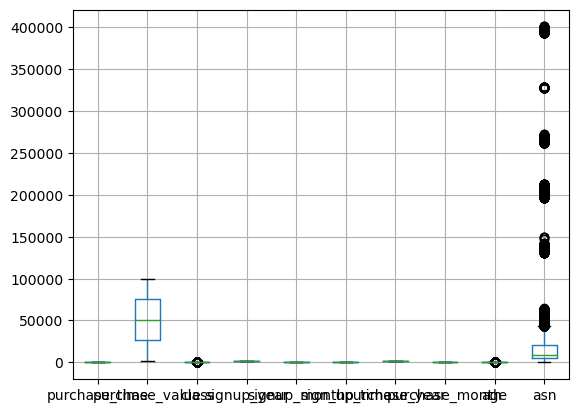

In [7]:
fraud_data[num_var_list].boxplot()

array([[<AxesSubplot:title={'center':'purchase_time'}>,
        <AxesSubplot:title={'center':'purchase_value'}>,
        <AxesSubplot:title={'center':'class'}>],
       [<AxesSubplot:title={'center':'signup_year'}>,
        <AxesSubplot:title={'center':'signup_month'}>,
        <AxesSubplot:title={'center':'sign_up_time'}>],
       [<AxesSubplot:title={'center':'purchase_year'}>,
        <AxesSubplot:title={'center':'purchase_month'}>,
        <AxesSubplot:title={'center':'age'}>],
       [<AxesSubplot:title={'center':'asn'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

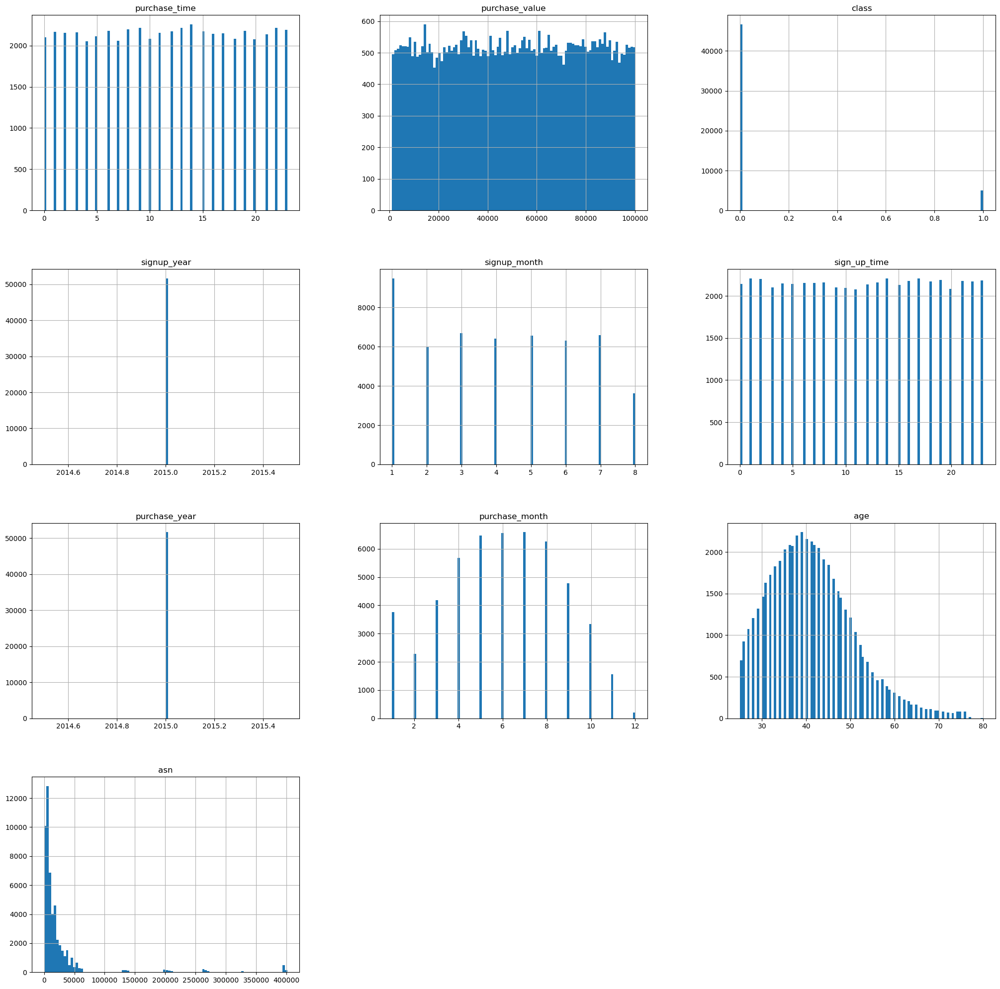

In [8]:
#Numeric Features EDA
fraud_data[num_var_list].hist(bins=100, figsize=(25,25))

In [9]:
# From the above graph we can drop Purchase year and Signup Year. They have only one value and will not contribute to analysis 

num_var_list = list(fraud_data.select_dtypes(exclude=['object']).drop(['signup_year','purchase_year'],axis = 1).columns.values)
num_var_list

['purchase_time',
 'purchase_value',
 'class',
 'signup_month',
 'sign_up_time',
 'purchase_month',
 'age',
 'asn']

In [10]:
#Correlation Matrix with the Numeric value 
corr_matrix = fraud_data.drop(['class','signup_year','purchase_year'],axis=1).corr()
corr_matrix

,purchase_time,purchase_value,signup_month,sign_up_time,purchase_month,age,asn
purchase_time,1.000000,0.011217,-0.007598,0.033235,-0.009766,0.000875,0.004132
purchase_value,0.011217,1.000000,-0.004054,0.001478,-0.004960,-0.003682,0.002563
signup_month,-0.007598,-0.004054,1.000000,-0.010680,0.882110,-0.068952,-0.006667
sign_up_time,0.033235,0.001478,-0.010680,1.000000,-0.010531,0.011967,0.000362
purchase_month,-0.009766,-0.004960,0.882110,-0.010531,1.000000,-0.113911,-0.007448
age,0.000875,-0.003682,-0.068952,0.011967,-0.113911,1.000000,-0.002713
asn,0.004132,0.002563,-0.006667,0.000362,-0.007448,-0.002713,1.000000


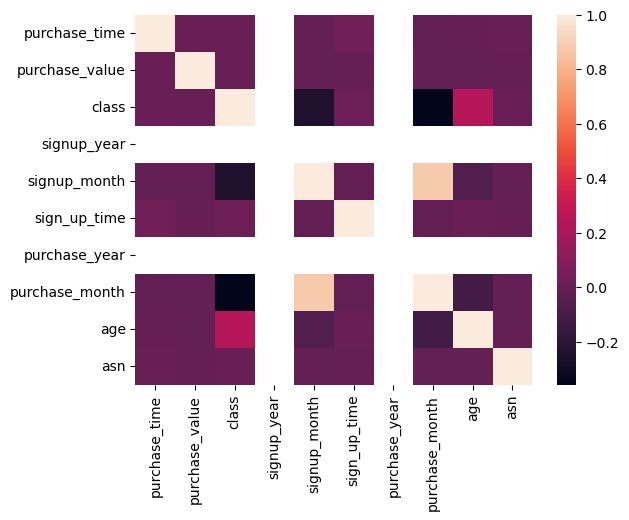

In [11]:
#Plotting Heat Map
dataplot = sns.heatmap(fraud_data.corr())
plt.show()

In [12]:
def cont_plots(data, col, target):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    sns.distplot(data[col], ax=axes[0],kde_kws={'bw':0.15}).set_title("Distribution plot")
    sns.boxplot(x=target, y=col, data=data).set_title("Box Plot distribution")
    plt.show()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.15 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


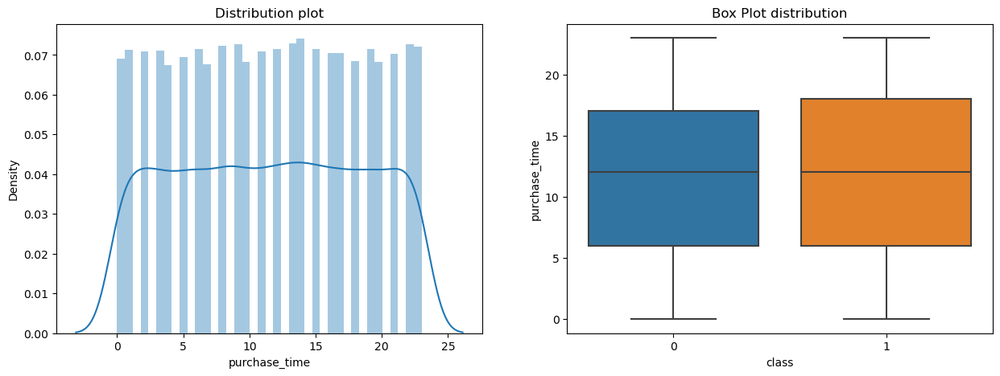

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.15 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


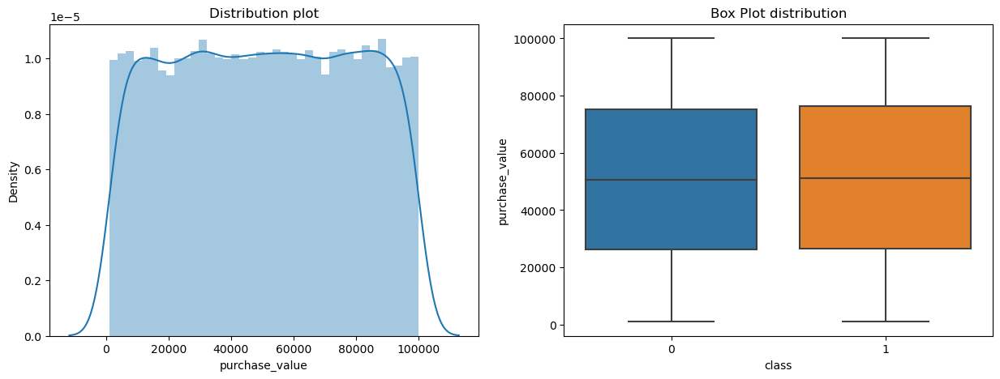

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.15 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


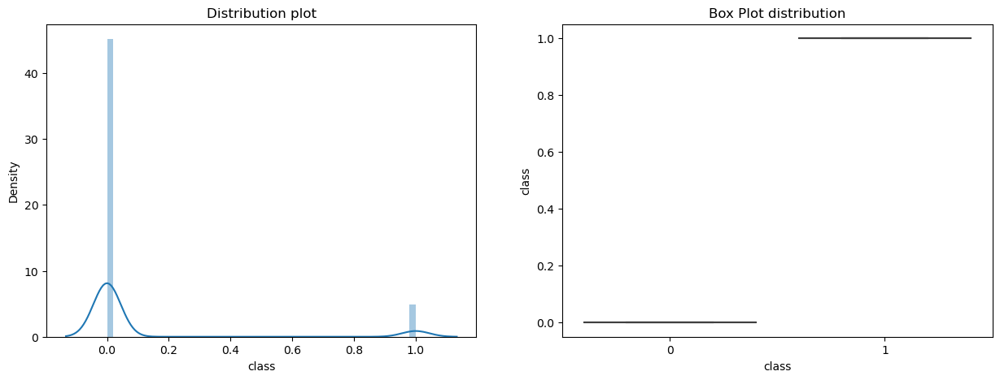

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.15 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


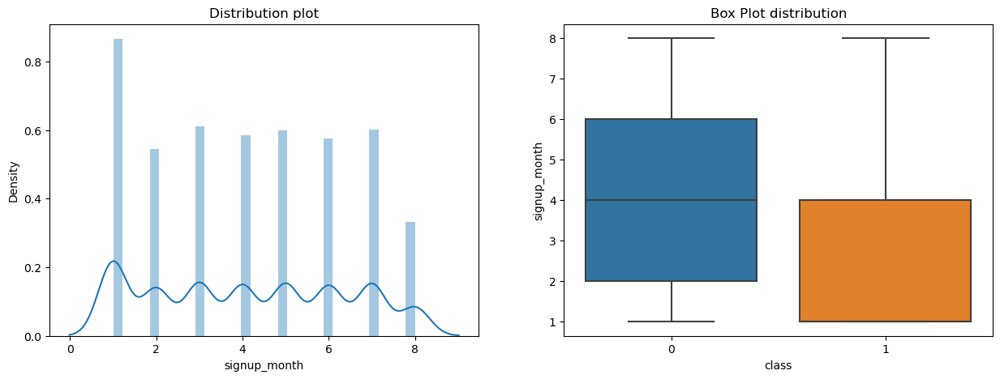

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.15 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


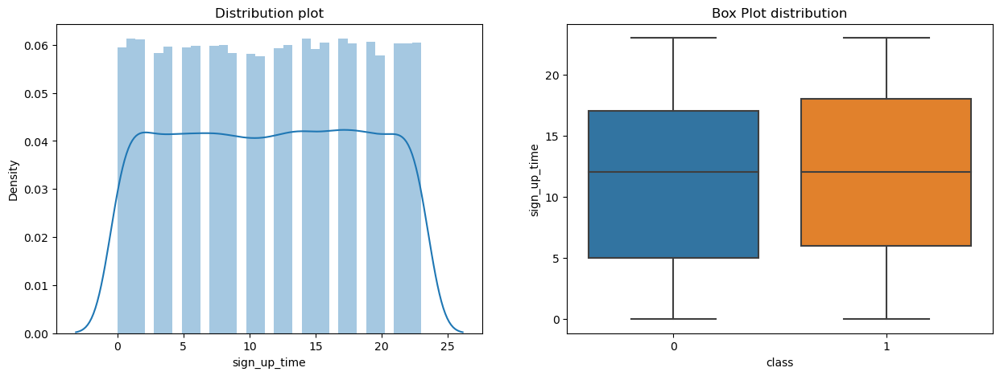

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.15 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


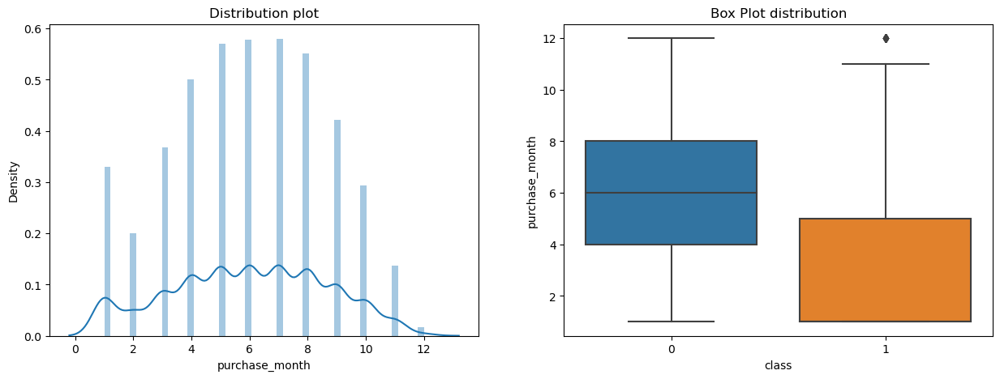

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.15 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


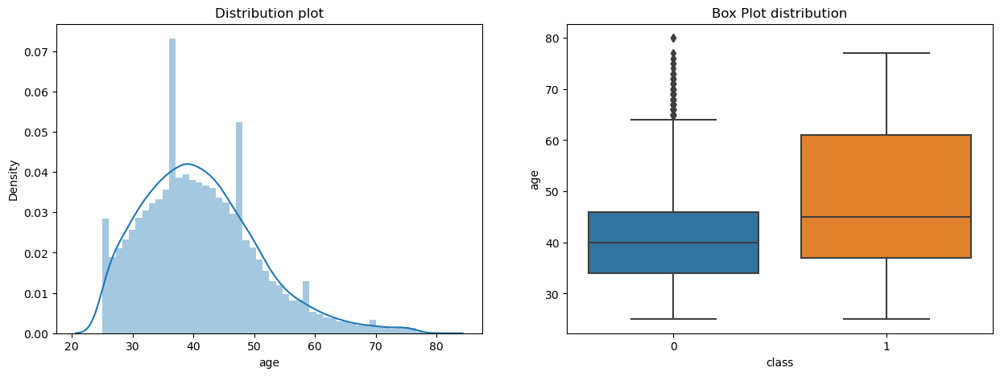

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.15 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


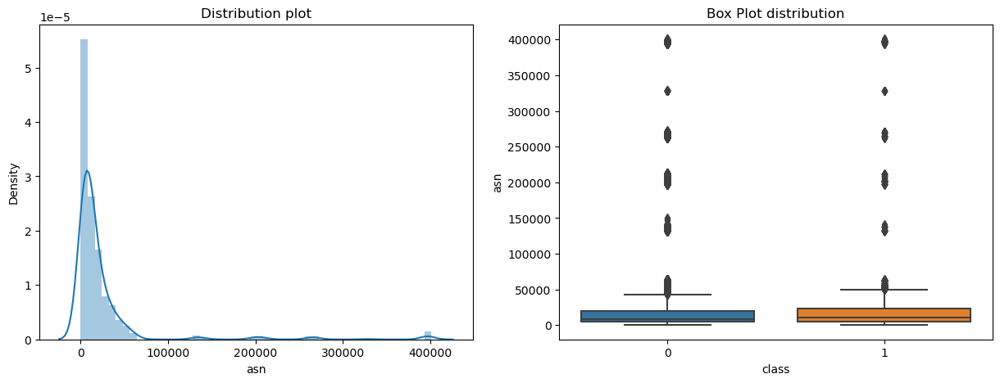

In [13]:
for cl in num_var_list:
    cont_plots(fraud_data, cl, "class")

In [14]:
#Categorical Variable EDA
def cat_plots(idat, col, target = "class"):
    print("Countplot for ",col, " split by ", target)
    print("\n")
    plt.figure(figsize=(20, 10))
    sns.countplot(x=col, data=idat, hue=target)
    plt.show()


Countplot for  source  split by  class




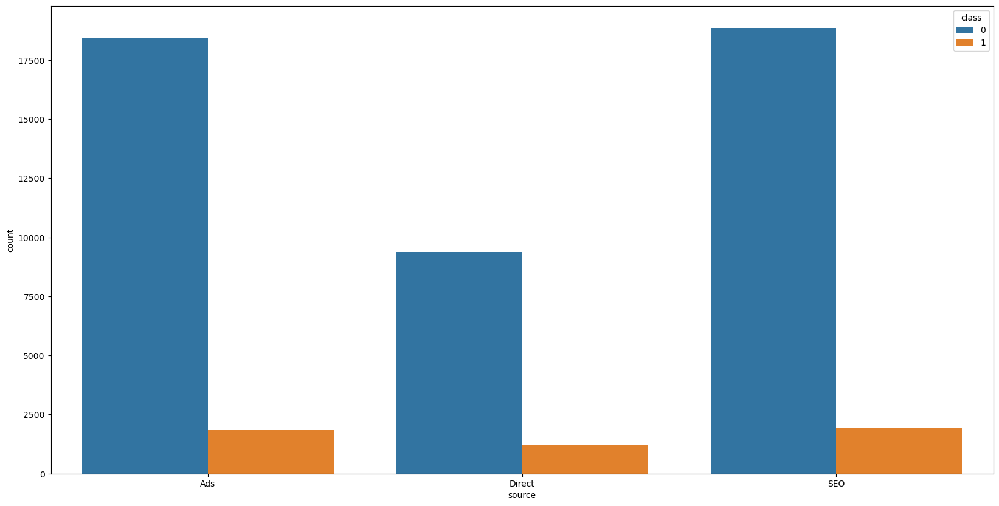

Countplot for  browser  split by  class




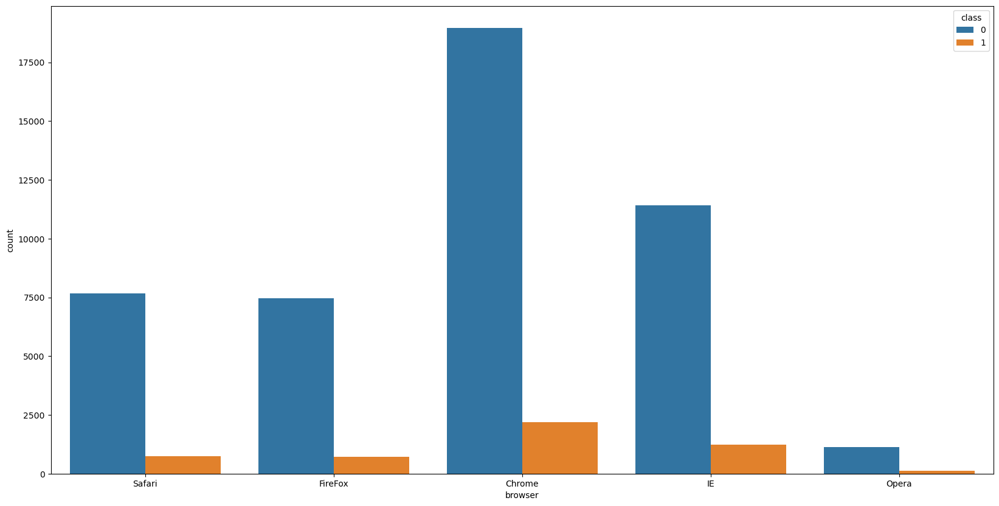

Countplot for  sex  split by  class




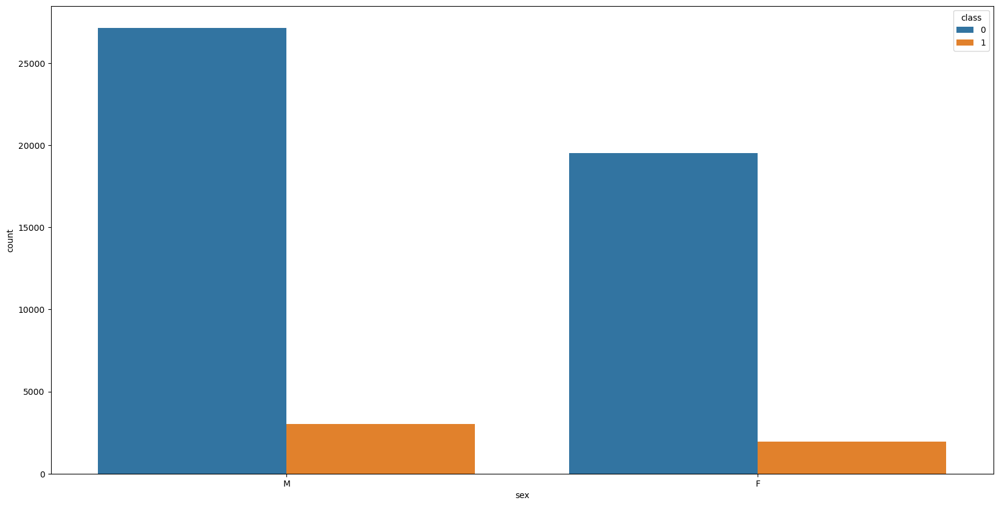

Countplot for  category  split by  class




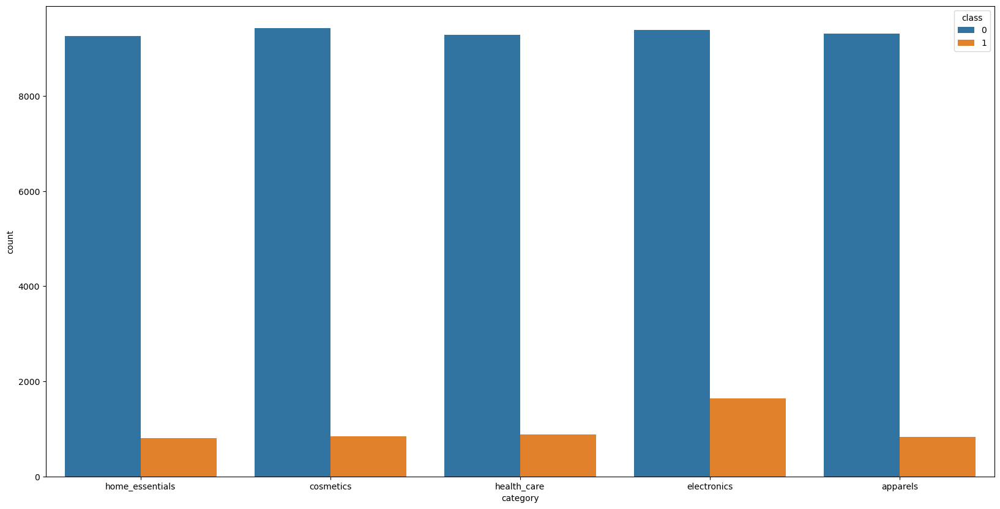

Countplot for  signup_day_of_week  split by  class




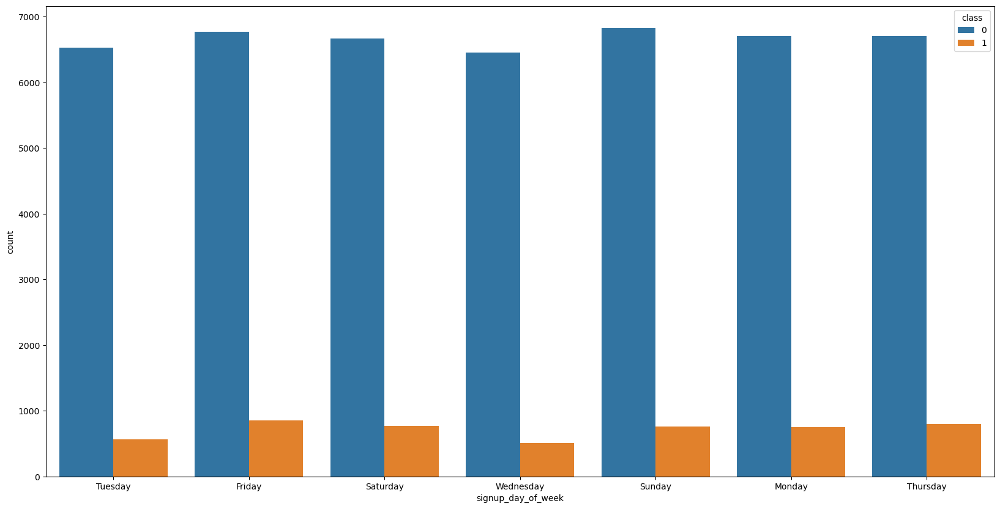

Countplot for  purchase_day_of_week  split by  class




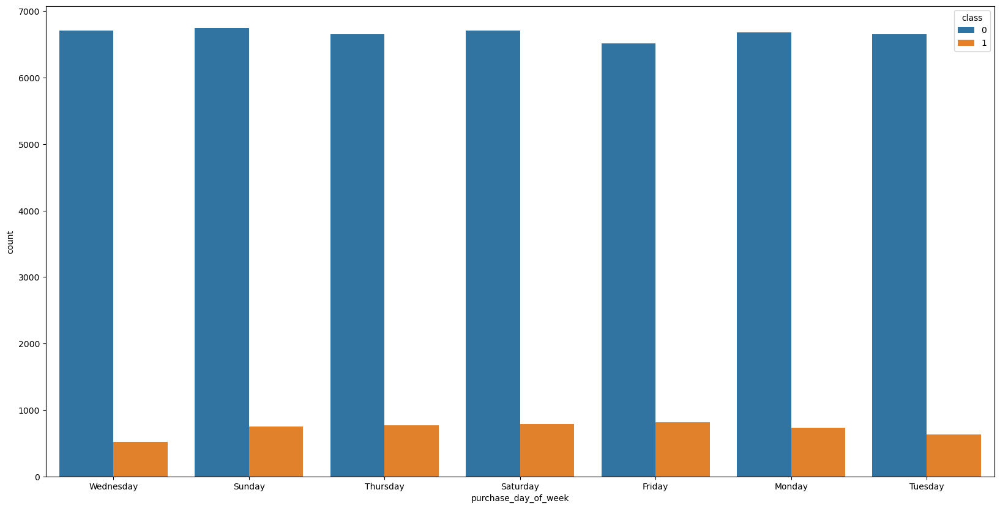

Countplot for  city  split by  class




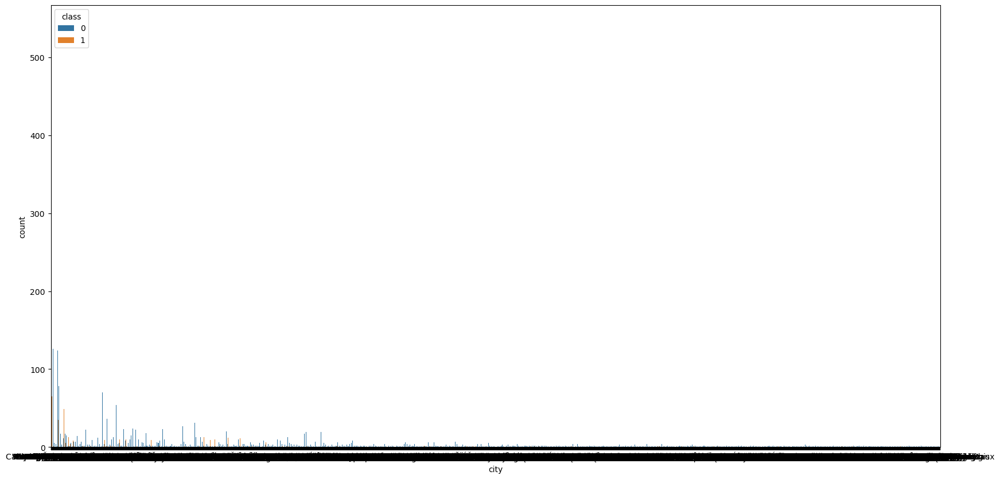

Countplot for  country  split by  class




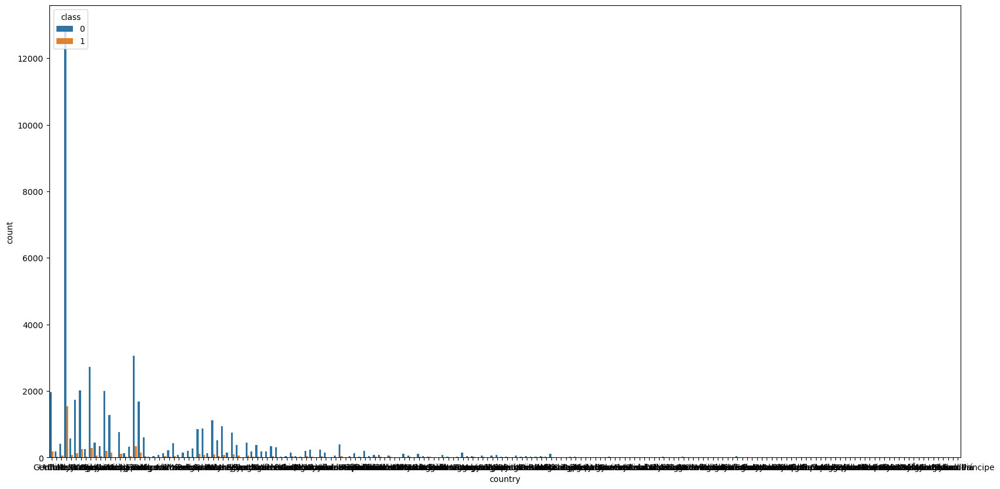

In [15]:
for cl in cat_var_list:
    cat_plots(fraud_data,cl,"class")

In [16]:
## Data Preparation 
## Outlier Treatement for numeric data age 
fraud_data_2 = fraud_data.copy()

for col in ['age']:
    sorted(fraud_data_2)
    p1,p99 = np.percentile(fraud_data_2[col],[1, 99])
    lower_bounds = p1
    upper_bounds = p99
    
    fraud_data_2[col] = np.where(fraud_data_2[col] < lower_bounds, lower_bounds,  fraud_data_2[col])
    fraud_data_2[col] = np.where(fraud_data_2[col] > upper_bounds, upper_bounds,  fraud_data_2[col])

In [17]:
fraud_data_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51658 entries, 0 to 51657
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   signup_time           51658 non-null  object 
 1   purchase_time         51658 non-null  int64  
 2   purchase_value        51658 non-null  int64  
 3   device_id             51658 non-null  object 
 4   source                51658 non-null  object 
 5   browser               51658 non-null  object 
 6   sex                   51658 non-null  object 
 7   ip_address            51658 non-null  object 
 8   class                 51658 non-null  int64  
 9   category              51658 non-null  object 
 10  dob                   51658 non-null  object 
 11  signup_year           51658 non-null  float64
 12  signup_month          51658 non-null  float64
 13  signup_day_of_week    51658 non-null  object 
 14  sign_up_time          51658 non-null  int64  
 15  purchase_year      

In [18]:
#Label Encodings. Convert Sex. (Male / Female to 0 and 1) 

from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
fraud_data_2['sex']= label_encoder.fit_transform(fraud_data_2['sex'])

In [19]:
## Apply One Hot Encoding for asn, Country, signup_month, purchase_month, source, browser, category, signup_day_of_week, purchase_day_of_week,city

asn_dummies = pd.get_dummies(fraud_data_2['asn'],prefix='asn_dummies',drop_first=False)
fraud_data_2 = pd.concat([fraud_data_2,asn_dummies],axis=1)
fraud_data_2.drop('asn',axis=1,inplace=True)

country_dummies = pd.get_dummies(fraud_data_2['country'],prefix='country_dummies',drop_first=False)
fraud_data_2 = pd.concat([fraud_data_2,asn_dummies],axis=1)
fraud_data_2.drop('country',axis=1,inplace=True)

sign_up_month_dummies = pd.get_dummies(fraud_data_2['signup_month'],prefix='signup_month_dummies',drop_first=False)
fraud_data_2 = pd.concat([fraud_data_2,sign_up_month_dummies],axis=1)
fraud_data_2.drop('signup_month',axis=1,inplace=True)

purchase_month_dummies = pd.get_dummies(fraud_data_2['purchase_month'],prefix='purchase_dummies',drop_first=False)
fraud_data_2 = pd.concat([fraud_data_2,purchase_month_dummies],axis=1)
fraud_data_2.drop('purchase_month',axis=1,inplace=True)


source_dummies = pd.get_dummies(fraud_data_2['source'],prefix='source_dummies',drop_first=False)
fraud_data_2 = pd.concat([fraud_data_2,source_dummies],axis=1)
fraud_data_2.drop('source',axis=1,inplace=True)

browser_dummies = pd.get_dummies(fraud_data_2['browser'],prefix='browser_dummies',drop_first=False)
fraud_data_2 = pd.concat([fraud_data_2,browser_dummies],axis=1)
fraud_data_2.drop('browser',axis=1,inplace=True)

category_dummies = pd.get_dummies(fraud_data_2['category'],prefix='category_dummies',drop_first=False)
fraud_data_2 = pd.concat([fraud_data_2,category_dummies],axis=1)
fraud_data_2.drop('category',axis=1,inplace=True)

#signup_day_of_week, purchase_day_of_week,city,country


signup_day_of_week_dummies = pd.get_dummies(fraud_data_2['signup_day_of_week'],prefix='signup_day_of_week_dummies',drop_first=False)
fraud_data_2 = pd.concat([fraud_data_2,signup_day_of_week_dummies],axis=1)
fraud_data_2.drop('signup_day_of_week',axis=1,inplace=True)

purchase_day_of_week_dummies = pd.get_dummies(fraud_data_2['purchase_day_of_week'],prefix='purchase_day_of_week_dummies',drop_first=False)
fraud_data_2 = pd.concat([fraud_data_2,purchase_day_of_week_dummies],axis=1)
fraud_data_2.drop('purchase_day_of_week',axis=1,inplace=True)

city_dummies = pd.get_dummies(fraud_data_2['city'],prefix='city_dummies',drop_first=False)
fraud_data_2 = pd.concat([fraud_data_2,city_dummies],axis=1)
fraud_data_2.drop('city',axis=1,inplace=True)


In [20]:
# Drop purchase_time,signup_time, dob, device, IP_Address
# DOB has been converted into age
# IP Address has been convertedto ASN, City and Country
# Purchase_time and Sign_up time has been converted into Month, Date and Day of Week 
fraud_data_2 = fraud_data_2.drop(['dob','device_id','signup_time','purchase_time','ip_address'],axis=1)

In [22]:
#Modelling Data Preparation 
x = fraud_data_2.drop(["class"],axis =1)
y = fraud_data_2["class"]

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=80, stratify=y)

from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(criterion='entropy',max_depth=10,random_state=80)
clf.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, random_state=80)

In [23]:
pd.Series(clf.feature_importances_ , index= x.columns).sort_values(ascending=False).head(10)

purchase_dummies_1.0                    0.669484
age                                     0.176435
signup_day_of_week_dummies_Tuesday      0.018006
signup_day_of_week_dummies_Wednesday    0.015749
category_dummies_electronics            0.010956
sign_up_time                            0.008764
purchase_value                          0.008118
purchase_dummies_2.0                    0.005107
purchase_dummies_3.0                    0.004742
signup_day_of_week_dummies_Sunday       0.003788
dtype: float64

In [24]:
y_pred = clf.predict(x_test)

In [25]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score

## Accuracy Score
accuracy_score(y_test,y_pred)

0.9523809523809523

In [26]:
precision_score(y_test,y_pred)

0.8135802469135802

In [27]:
recall_score(y_test,y_pred)

0.659

In [28]:
f1_score(y_test,y_pred)

0.7281767955801105

In [ ]:
##Using Grid SearchCV

from sklearn.model_selection import GridSearchCV
param_dict = {
    "criterion":['gini','entropy'],
    "max_depth":range(1,10),
    "min_samples_split":range(1,10),
    "min_samples_leaf":range(1,50),
    "max_features" :['sqrt','log2',None]
}

decision_tree = DecisionTreeClassifier(random_state=100)
grid = GridSearchCV(decision_tree,
                   param_grid=param_dict,
                   cv=10,verbose=1,
                   n_jobs=-1)

grid.fit(x_train,y_train)

Fitting 10 folds for each of 23814 candidates, totalling 238140 fits


In [ ]:
grid.best_params_

In [ ]:
grid.best_score_

In [29]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,y_pred)

array([[9181,  151],
       [ 341,  659]])

In [30]:
## Build Logistic Regression Model and get Accuracy

from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(x_train, y_train)
y_pred = model.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9032133178474642
